In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.figsize"]=(20,10)

In [2]:
import keras
from keras.layers import LSTM, Dropout, Dense,GRU
import tensorflow as tf

In [3]:
import re, shutil,os

In [4]:

index=np.array(os.listdir('dataset_new'))
index

array(['agniva_crossing_130_124.csv', 'agniva_crossing_140_125.csv',
       'agniva_crossing_90_180.csv', 'agniva_not_crossing_126.csv',
       'ahetasam_croossing_video_id_33.csv',
       'ahetasam_croossing_video_id_35.csv',
       'antarlin_crossing_135_111.csv', 'antarlin_crossing_185_112.csv',
       'antarlin_not_Crossing_113.csv',
       'AyanMullickCrossingTheRoadVID2.csv',
       'AyanMullickNotCrossingTheRoadID6.csv',
       'ayan_crossing_120_172.csv', 'ayan_crossing_130_136.csv',
       'ayan_crossing_150_117.csv', 'ayan_crossing_160_137.csv',
       'ayan_crossing_175_118.csv', 'ayan_crossing_210_189.csv',
       'ayan_not_Crossing_119.csv', 'ayan_not_Crossing_138.csv',
       'ishaan_crossing_140_140.csv', 'ishaan_crossing_175_141.csv',
       'ishaan_not_crossing_139.csv', 'ishaan_not_Crossing_142.csv',
       'ishan_crossing_120_184.csv', 'ishan_crossing_125_173.csv',
       'ishan_crossing_125_174.csv', 'ishan_crossing_150_181.csv',
       'ishan_crossing_150_183.csv',

In [5]:
len(index) 


60

In [6]:
dataset=[]

In [7]:
for i in range(60):
  data=pd.read_csv(f"dataset_new/{index[i]}")
  dataset.append(data) 

In [8]:
dataset[5]

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x58,x59,x60,x61,x62,x63,x64,x65,x66,y
0,0.635364,0.373599,0.638821,0.364709,0.640855,0.364294,0.642792,0.363959,0.633187,0.365992,...,0.680422,0.645052,0.708622,0.649255,0.693667,0.620181,0.721369,0.626087,0.706318,0.0
1,0.635041,0.373612,0.638199,0.364893,0.640230,0.364561,0.642169,0.364290,0.632935,0.365997,...,0.679682,0.645117,0.708763,0.647987,0.693111,0.620011,0.720095,0.623522,0.704527,0.0
2,0.634587,0.373872,0.637597,0.365809,0.639543,0.365651,0.641399,0.365410,0.632610,0.366292,...,0.677419,0.645122,0.708524,0.646867,0.690776,0.619881,0.717360,0.622791,0.701271,0.0
3,0.633878,0.373823,0.636724,0.365796,0.638620,0.365641,0.640508,0.365385,0.631984,0.366236,...,0.675240,0.644220,0.708531,0.645301,0.688482,0.618798,0.716359,0.622045,0.697580,0.0
4,0.633651,0.373174,0.636401,0.364912,0.638263,0.364753,0.640126,0.364500,0.631608,0.365352,...,0.674589,0.643576,0.709549,0.644057,0.688881,0.617120,0.716409,0.621021,0.695933,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,0.444404,0.363317,0.446803,0.354730,0.448125,0.354456,0.449608,0.354127,0.444971,0.354702,...,0.662445,0.465585,0.716532,0.490178,0.671120,0.434042,0.711374,0.471827,0.698604,1.0
155,0.440902,0.363164,0.443405,0.354601,0.444686,0.354296,0.446164,0.353944,0.441587,0.354710,...,0.667462,0.468423,0.702939,0.479440,0.671259,0.440158,0.711225,0.452369,0.699260,1.0
156,0.438724,0.362693,0.440965,0.354499,0.442155,0.354240,0.443496,0.353932,0.439464,0.354599,...,0.675742,0.472327,0.696569,0.473018,0.687737,0.446368,0.708555,0.446937,0.698573,1.0
157,0.437385,0.361956,0.439689,0.353717,0.441079,0.353454,0.442627,0.353153,0.437485,0.353777,...,0.678233,0.472050,0.697946,0.469596,0.691831,0.445338,0.708815,0.442072,0.699201,1.0


In [9]:
sequence_length = 15

In [10]:
def generate_data(df, sequence_length = 15, step = 1):
  X=df.iloc[:,:-1]
  y=df.y
  X_local = []
  y_local = []
  for start in range(0, len(X) - sequence_length, step):
    end = start + sequence_length
    X_local.append(X[start:end])
    y_local.append(y[end-1])
  return np.array(X_local), np.array(y_local)

In [11]:
data=[]
for i in dataset:
  x,y=generate_data(i)
  data.append([x,y])

In [12]:
len(data) 

60

In [13]:
model = keras.Sequential()
model.add(LSTM(units = 50,
               input_shape = (x.shape[1],x.shape[2])))
model.add(Dropout(0.5))
model.add(Dense(units=1,activation="sigmoid"))
model.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")

#print(model.summary())
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 50)                23400     
_________________________________________________________________
dropout (Dropout)            (None, 50)                0         
_________________________________________________________________
dense (Dense)                (None, 1)                 51        
Total params: 23,451
Trainable params: 23,451
Non-trainable params: 0
_________________________________________________________________


Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.3229 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 2.5621 - accuracy: 0.0036
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5778 - accuracy: 0.0321
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8467 - accuracy: 0.4071
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4354 - accuracy: 0.8929
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2469 - accuracy: 0.9929
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1667 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1243 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1031 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0834 - accuracy: 1.0000


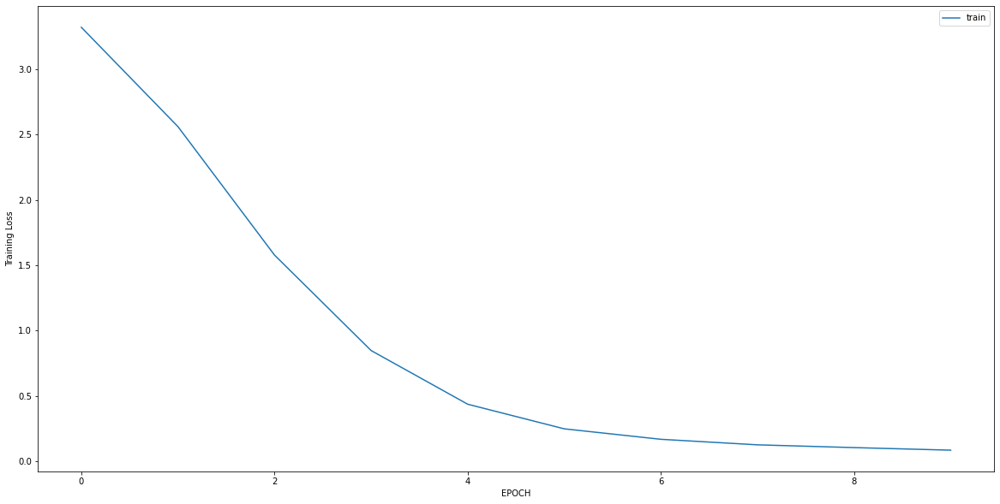

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0835 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0725 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0614 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0580 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0474 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0487 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0414 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 8ms/step - loss: 0.0348 - accuracy: 1.0000


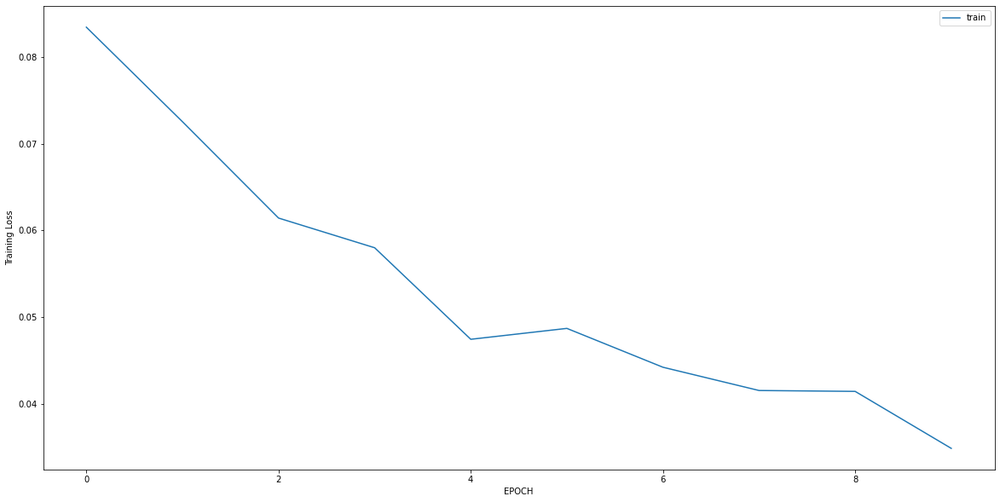

Epoch 1/10
9/9 [==============================] - 0s 8ms/step - loss: 1.5230 - accuracy: 0.5436
Epoch 2/10
9/9 [==============================] - 0s 9ms/step - loss: 1.4143 - accuracy: 0.5436
Epoch 3/10
9/9 [==============================] - 0s 9ms/step - loss: 1.2346 - accuracy: 0.5436
Epoch 4/10
9/9 [==============================] - 0s 9ms/step - loss: 1.0240 - accuracy: 0.5436
Epoch 5/10
9/9 [==============================] - 0s 8ms/step - loss: 0.8884 - accuracy: 0.5470
Epoch 6/10
9/9 [==============================] - 0s 8ms/step - loss: 0.7757 - accuracy: 0.5575
Epoch 7/10
9/9 [==============================] - 0s 9ms/step - loss: 0.7374 - accuracy: 0.5645
Epoch 8/10
9/9 [==============================] - 0s 8ms/step - loss: 0.6703 - accuracy: 0.5819
Epoch 9/10
9/9 [==============================] - 0s 9ms/step - loss: 0.6743 - accuracy: 0.5889
Epoch 10/10
9/9 [==============================] - 0s 7ms/step - loss: 0.6733 - accuracy: 0.5993


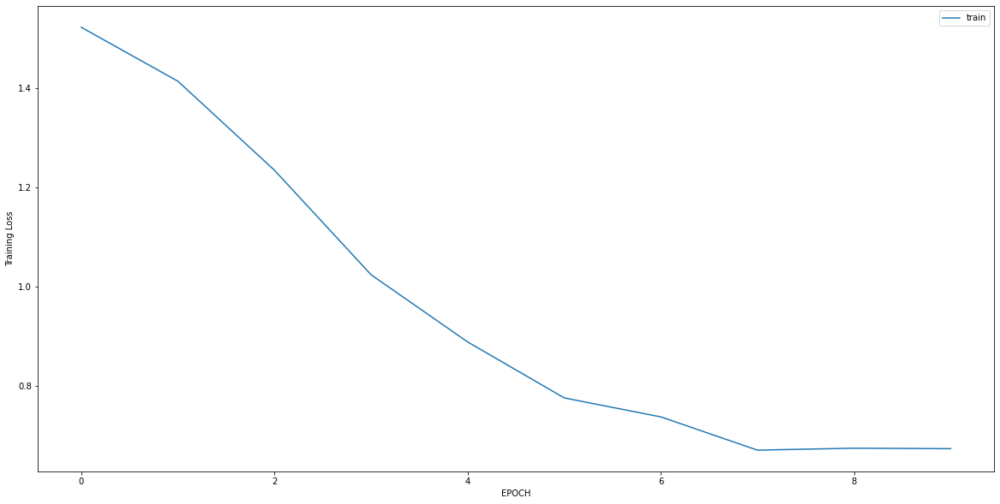

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6473 - accuracy: 0.5847
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6042 - accuracy: 0.6169
Epoch 3/10
8/8 [==============================] - 0s 8ms/step - loss: 0.5037 - accuracy: 0.7863
Epoch 4/10
8/8 [==============================] - 0s 9ms/step - loss: 0.4720 - accuracy: 0.8065
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3763 - accuracy: 0.8669
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3154 - accuracy: 0.9113
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2425 - accuracy: 0.9677
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2086 - accuracy: 0.9758
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2348 - accuracy: 0.9637
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1809 - accuracy: 0.9839


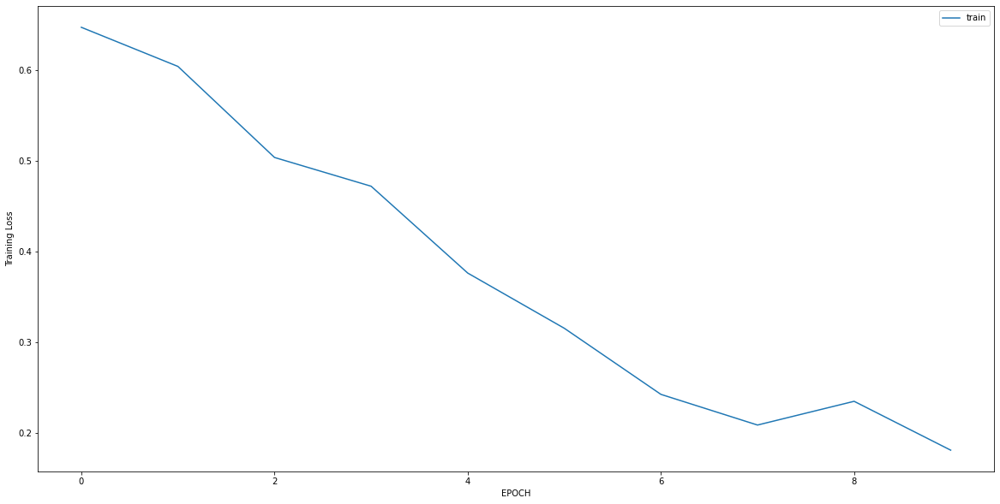

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9103 - accuracy: 0.5445
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8580 - accuracy: 0.5587
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7669 - accuracy: 0.5658
Epoch 4/10
9/9 [==============================] - 0s 7ms/step - loss: 0.6572 - accuracy: 0.6050
Epoch 5/10
9/9 [==============================] - 0s 9ms/step - loss: 0.6543 - accuracy: 0.6192
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.6287 - accuracy: 0.6335
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6259 - accuracy: 0.6406
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6253 - accuracy: 0.6192
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6351 - accuracy: 0.6014
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6203 - accuracy: 0.6228


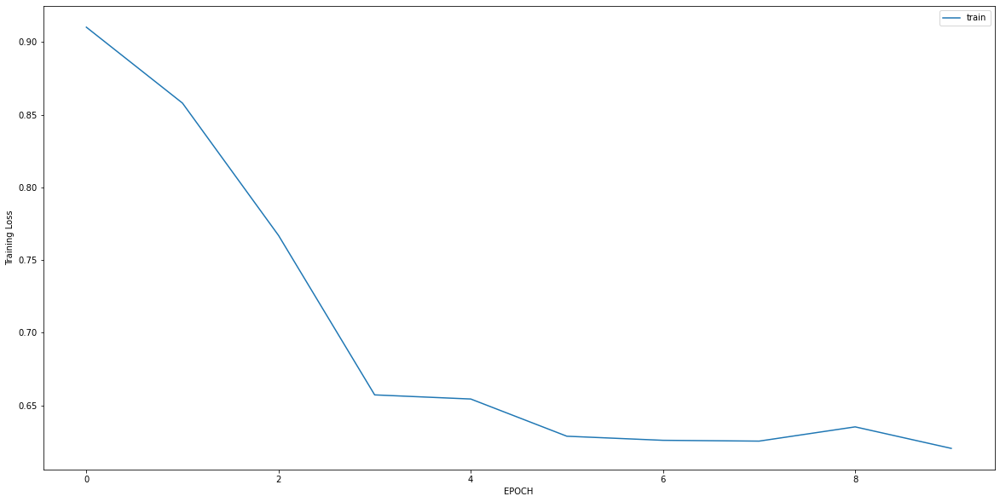

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6757 - accuracy: 0.7009
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4745 - accuracy: 0.8459
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3991 - accuracy: 0.8852
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3202 - accuracy: 0.9215
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2697 - accuracy: 0.9426
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2370 - accuracy: 0.9577
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2032 - accuracy: 0.9758
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2060 - accuracy: 0.9456
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1920 - accuracy: 0.9456
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1806 - accuracy: 0.9486


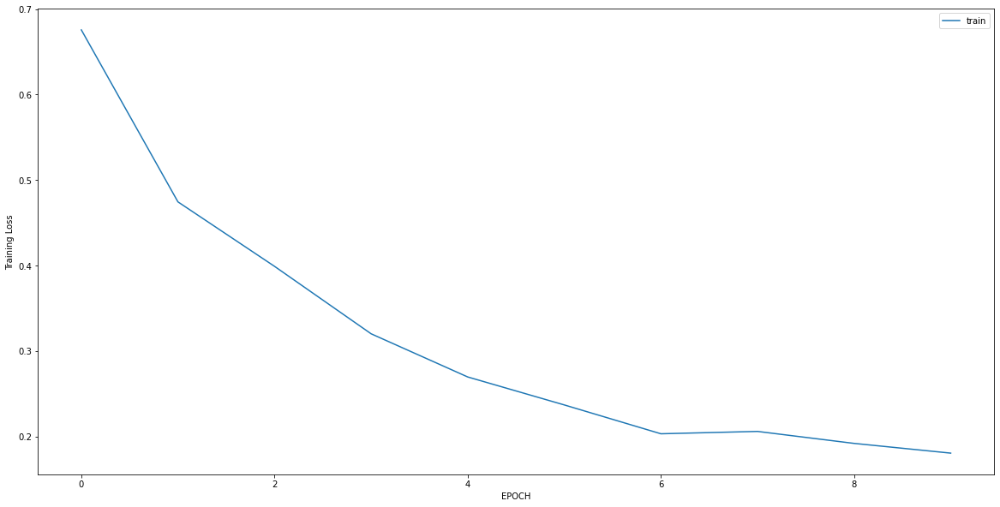

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 1.4676 - accuracy: 0.4448
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 1.0653 - accuracy: 0.4483
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.6041 - accuracy: 0.6276
Epoch 4/10
10/10 [==============================] - ETA: 0s - loss: 0.4698 - accuracy: 0.80 - 0s 7ms/step - loss: 0.4607 - accuracy: 0.8138
Epoch 5/10
10/10 [==============================] - 0s 7ms/step - loss: 0.4196 - accuracy: 0.8310
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3615 - accuracy: 0.8759
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3254 - accuracy: 0.9034
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3148 - accuracy: 0.9172
Epoch 9/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3004 - accuracy: 0.9103
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.2

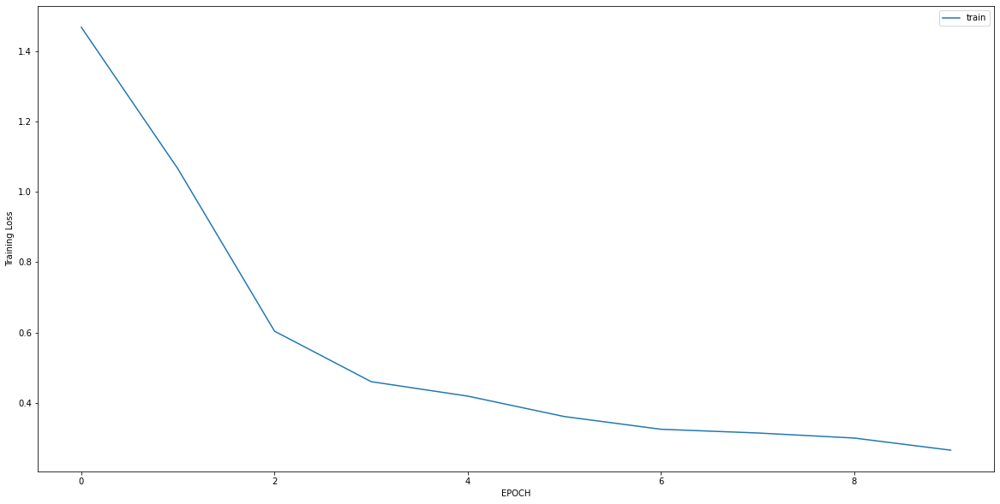

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.0340 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5371 - accuracy: 0.0345
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8882 - accuracy: 0.3180
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4967 - accuracy: 0.8467
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2993 - accuracy: 0.9962
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2060 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1580 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 7ms/step - loss: 0.1217 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 7ms/step - loss: 0.1025 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0913 - accuracy: 1.0000


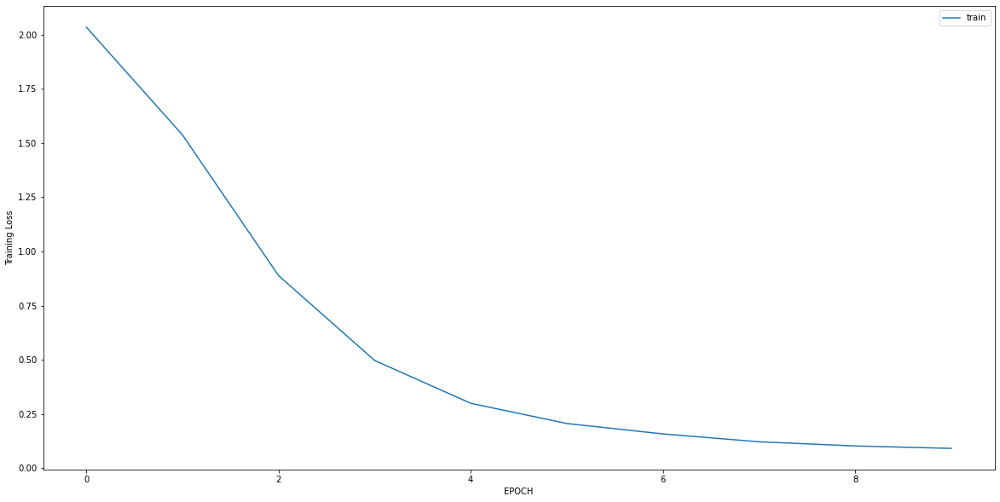

Epoch 1/10
18/18 [==============================] - 0s 7ms/step - loss: 0.0764 - accuracy: 1.0000
Epoch 2/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0644 - accuracy: 1.0000
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0546 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0476 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 7ms/step - loss: 0.0341 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0306 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 1.0000


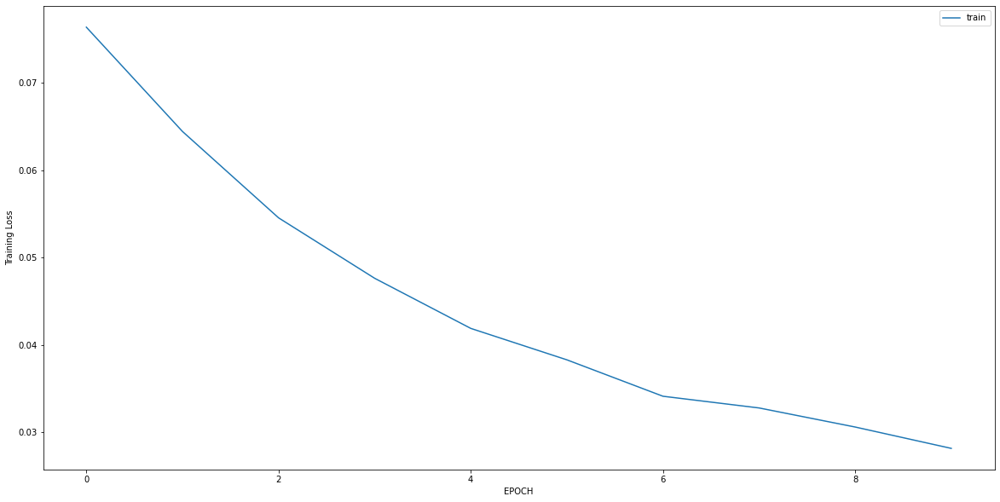

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 2.3910 - accuracy: 0.3480
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 2.0803 - accuracy: 0.3480
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 1.6435 - accuracy: 0.3480
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 1.2495 - accuracy: 0.3480
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9604 - accuracy: 0.3574
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8067 - accuracy: 0.3856
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7170 - accuracy: 0.5078
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6772 - accuracy: 0.5705
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6689 - accuracy: 0.5737
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6436 - accuracy: 0.6270


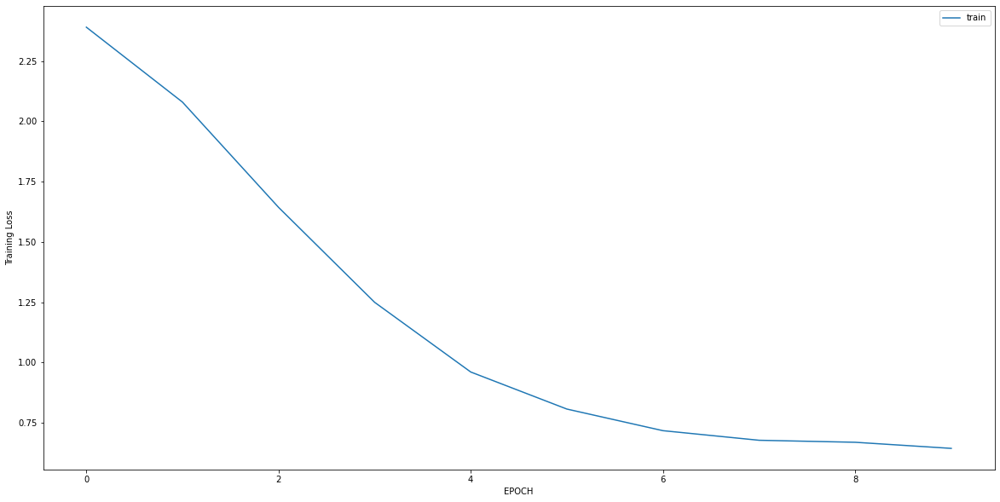

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3634 - accuracy: 0.8932
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3209 - accuracy: 0.9466
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2963 - accuracy: 0.9466
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2729 - accuracy: 0.9609
Epoch 5/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2447 - accuracy: 0.9609
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2135 - accuracy: 0.9715
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2279 - accuracy: 0.9609
Epoch 8/10
9/9 [==============================] - 0s 7ms/step - loss: 0.1934 - accuracy: 0.9822
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1831 - accuracy: 0.9822
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1701 - accuracy: 0.9786


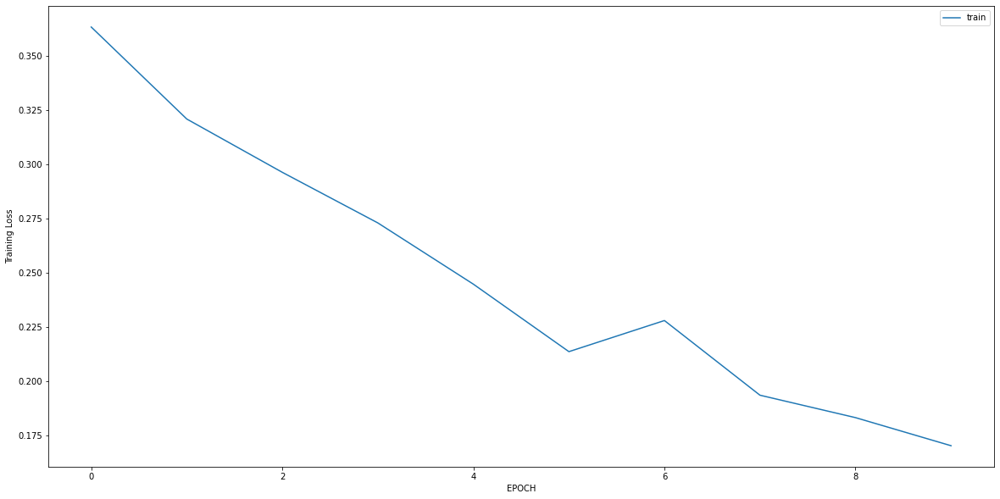

Epoch 1/10
14/14 [==============================] - 0s 8ms/step - loss: 0.2005 - accuracy: 0.9661
Epoch 2/10
14/14 [==============================] - 0s 7ms/step - loss: 0.1779 - accuracy: 0.9729
Epoch 3/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1890 - accuracy: 0.9661
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1520 - accuracy: 0.9774
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1361 - accuracy: 0.9819
Epoch 6/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1330 - accuracy: 0.9774
Epoch 7/10
14/14 [==============================] - 0s 6ms/step - loss: 0.1179 - accuracy: 0.9752
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1087 - accuracy: 0.9842
Epoch 9/10
14/14 [==============================] - 0s 9ms/step - loss: 0.1222 - accuracy: 0.9707
Epoch 10/10
14/14 [==============================] - 0s 8ms/step - loss: 0.1144 - accuracy: 0.9707


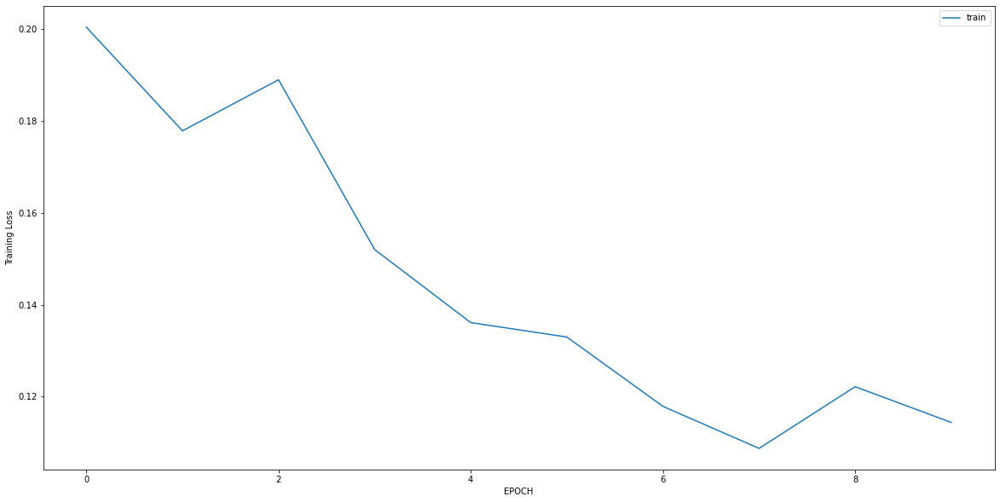

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 0.5949 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6154 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 7ms/step - loss: 0.6052 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.5755 - accuracy: 0.8228
Epoch 5/10
8/8 [==============================] - 0s 7ms/step - loss: 0.5456 - accuracy: 0.8228
Epoch 6/10
8/8 [==============================] - 0s 7ms/step - loss: 0.5258 - accuracy: 0.8228
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5140 - accuracy: 0.8228
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4814 - accuracy: 0.8228
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5070 - accuracy: 0.8228
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5124 - accuracy: 0.8228


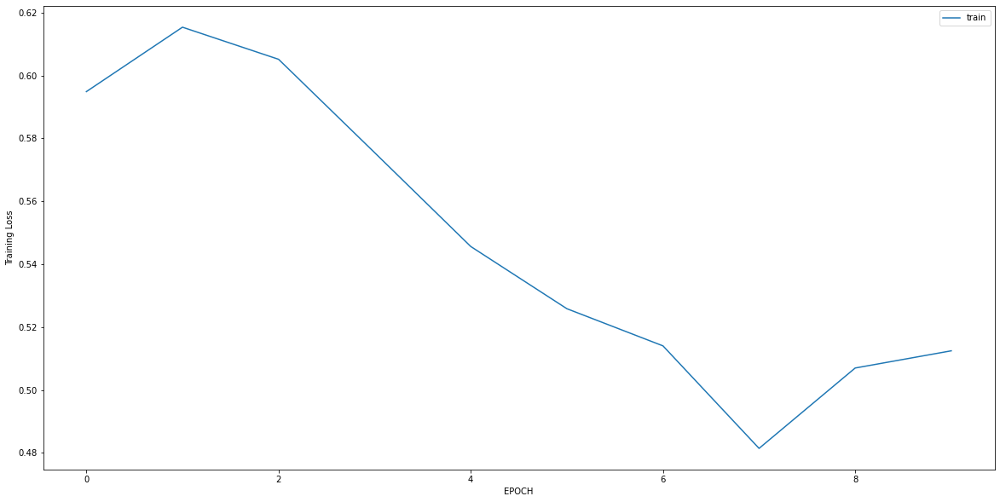

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3939 - accuracy: 0.8671
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4921 - accuracy: 0.8881
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3954 - accuracy: 0.8916
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2960 - accuracy: 0.9231
Epoch 5/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2473 - accuracy: 0.9336
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2698 - accuracy: 0.9336
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2923 - accuracy: 0.9336
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2818 - accuracy: 0.9301
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2635 - accuracy: 0.9336
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2462 - accuracy: 0.9406


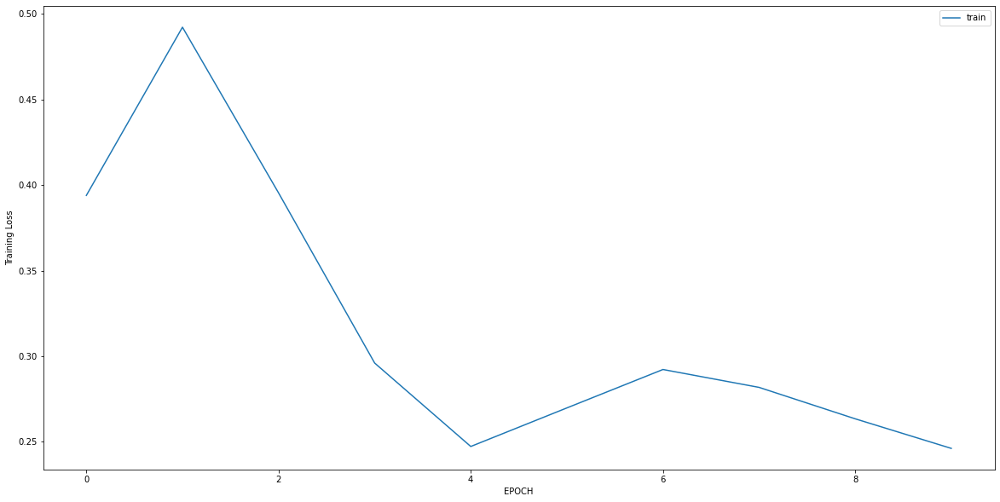

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 1.3571 - accuracy: 0.4661
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 1.2458 - accuracy: 0.4661
Epoch 3/10
8/8 [==============================] - 0s 7ms/step - loss: 1.0551 - accuracy: 0.4576
Epoch 4/10
8/8 [==============================] - 0s 7ms/step - loss: 0.8835 - accuracy: 0.4831
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7376 - accuracy: 0.5169
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7039 - accuracy: 0.5212
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6776 - accuracy: 0.5551
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6161 - accuracy: 0.7331
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5932 - accuracy: 0.6992
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6087 - accuracy: 0.6610


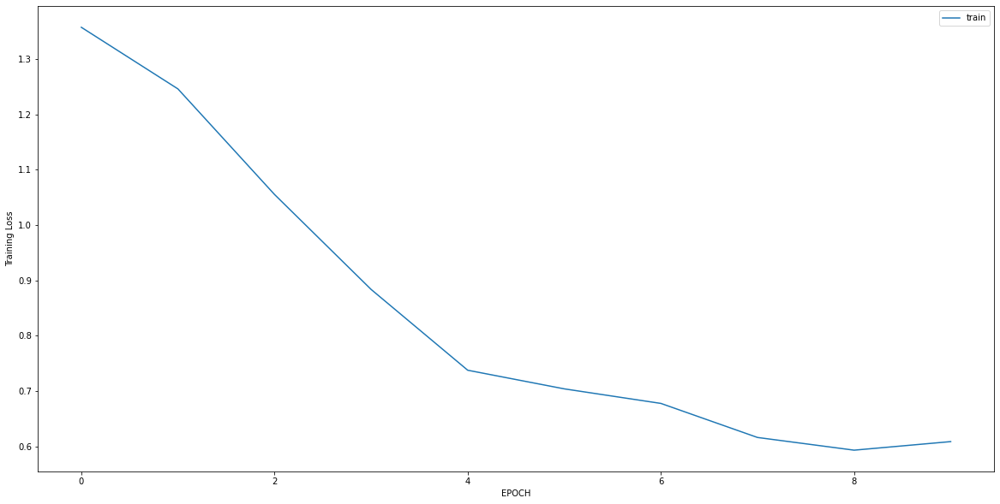

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.5557 - accuracy: 0.6957
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5425 - accuracy: 0.6884
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.4813 - accuracy: 0.8116
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5175 - accuracy: 0.7101
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4774 - accuracy: 0.7391
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.4013 - accuracy: 0.8333
Epoch 7/10
5/5 [==============================] - 0s 6ms/step - loss: 0.3530 - accuracy: 0.8841
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3346 - accuracy: 0.8841
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2993 - accuracy: 0.9275
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2795 - accuracy: 0.9275


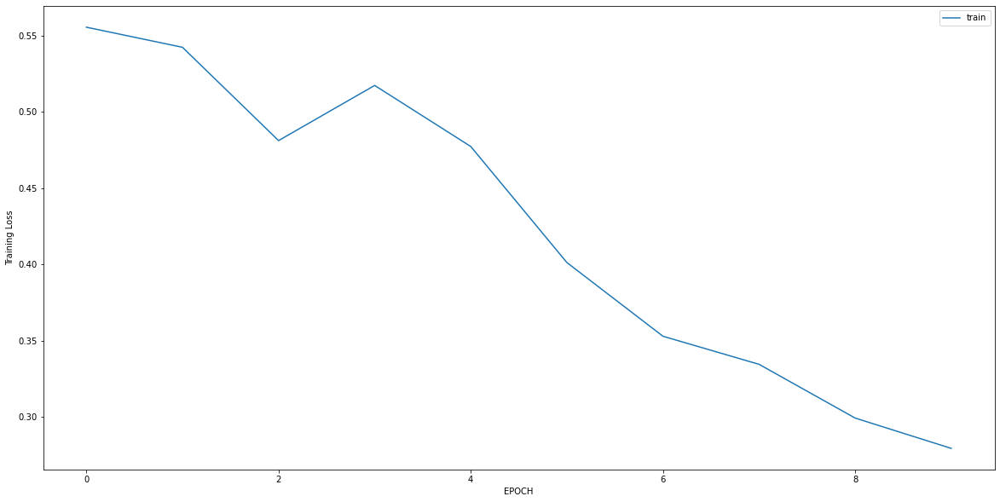

Epoch 1/10
15/15 [==============================] - 0s 6ms/step - loss: 0.5323 - accuracy: 0.8035
Epoch 2/10
15/15 [==============================] - 0s 5ms/step - loss: 0.4105 - accuracy: 0.8855
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3627 - accuracy: 0.9071
Epoch 4/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3281 - accuracy: 0.9136
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3098 - accuracy: 0.9201
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2918 - accuracy: 0.9179
Epoch 7/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2938 - accuracy: 0.9136
Epoch 8/10
15/15 [==============================] - 0s 6ms/step - loss: 0.2761 - accuracy: 0.9287
Epoch 9/10
15/15 [==============================] - 0s 6ms/step - loss: 0.2645 - accuracy: 0.9266
Epoch 10/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2296 - accuracy: 0.9266


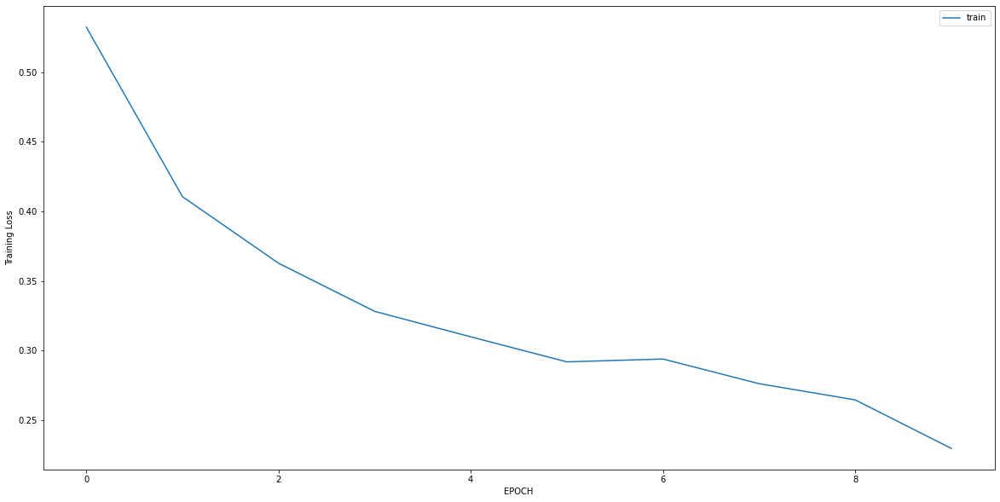

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3415 - accuracy: 0.9222
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2379 - accuracy: 0.9296
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1761 - accuracy: 0.9481
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1905 - accuracy: 0.9519
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2951 - accuracy: 0.8963
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3018 - accuracy: 0.8815
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2698 - accuracy: 0.9000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2427 - accuracy: 0.9037
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2719 - accuracy: 0.9037
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2430 - accuracy: 0.9074


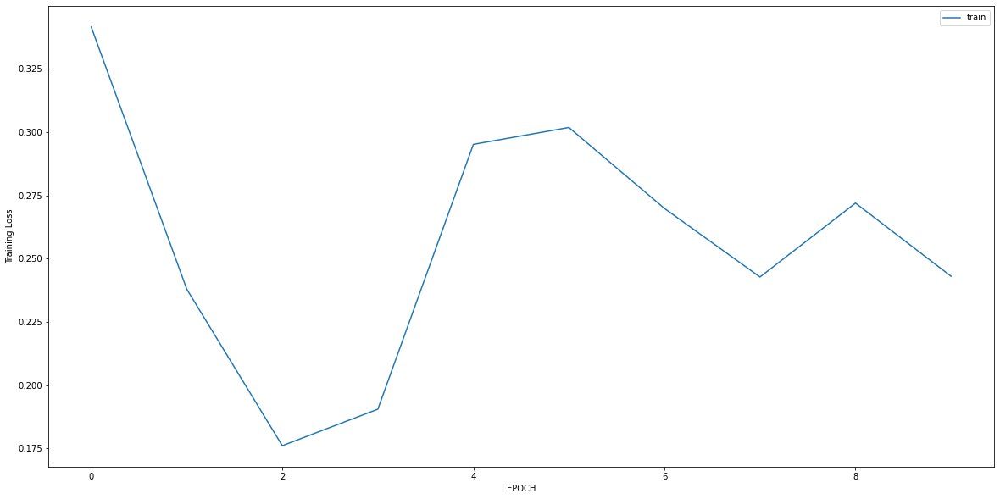

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0449 - accuracy: 0.6159
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9633 - accuracy: 0.6159
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7978 - accuracy: 0.6225
Epoch 4/10
10/10 [==============================] - 0s 7ms/step - loss: 0.5816 - accuracy: 0.6589
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.5483 - accuracy: 0.7086
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5256 - accuracy: 0.7351
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4751 - accuracy: 0.7947
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4058 - accuracy: 0.8709
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3667 - accuracy: 0.8841
Epoch 10/10
10/10 [==============================] - ETA: 0s - loss: 0.2787 - accuracy: 0.93 - 0s 5ms/step - loss: 0.3

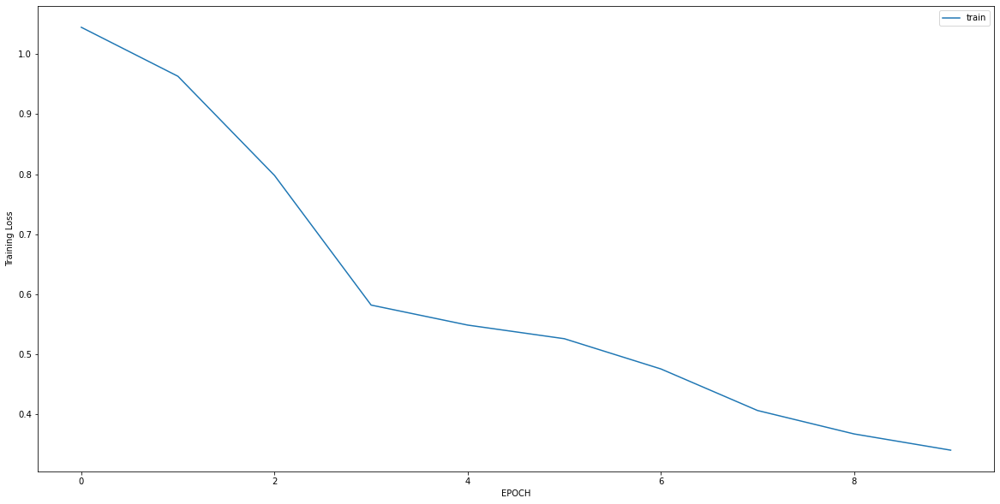

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4571 - accuracy: 0.7796
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0534 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0281 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0258 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0297 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0185 - accuracy: 1.0000


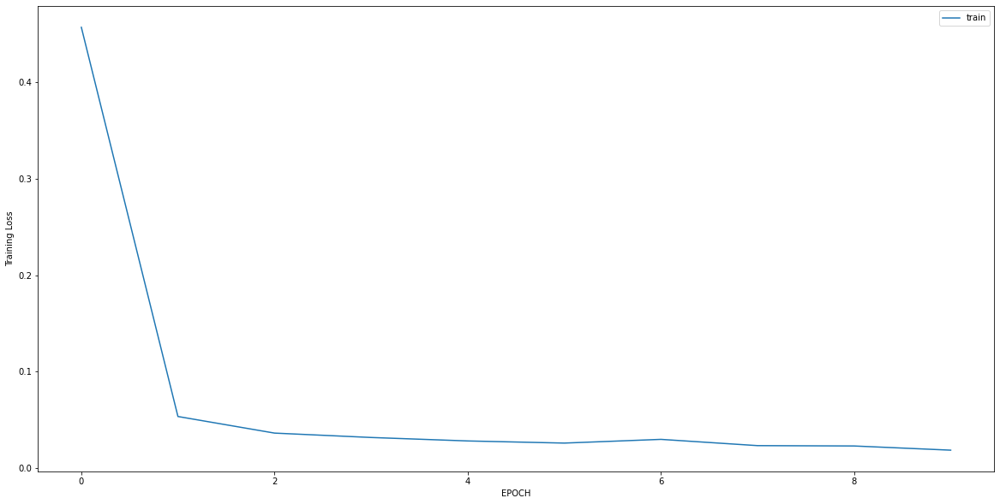

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4793 - accuracy: 0.7755
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0286 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0308 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0201 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0197 - accuracy: 1.0000


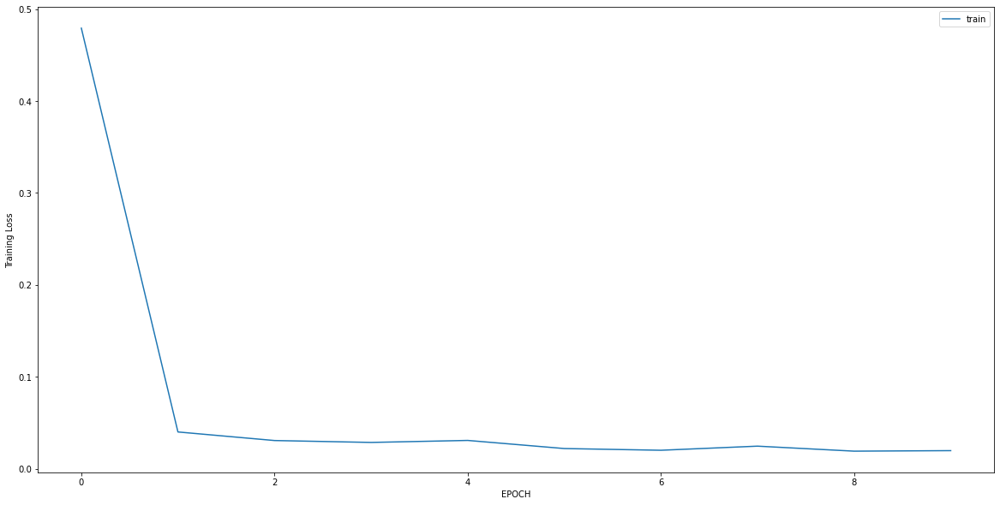

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 1.8023 - accuracy: 0.3309
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0335 - accuracy: 0.3453
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8493 - accuracy: 0.3525
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7253 - accuracy: 0.3885
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6088 - accuracy: 0.5396
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5256 - accuracy: 0.7050
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4470 - accuracy: 0.8633
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4258 - accuracy: 0.8129
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3476 - accuracy: 0.9137
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3081 - accuracy: 0.9424


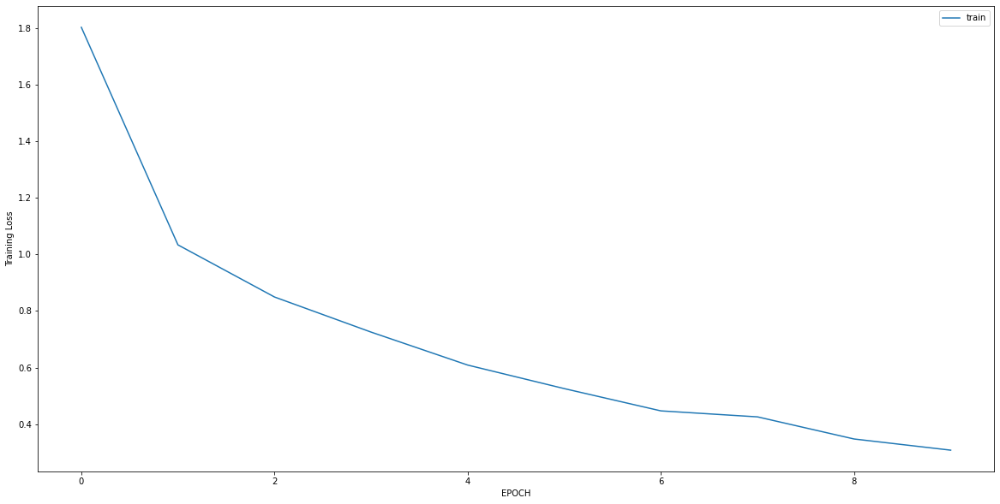

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 0.5040 - accuracy: 0.7165
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0608 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 0.9948
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0315 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0243 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0299 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0230 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0203 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0242 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0181 - accuracy: 1.0000


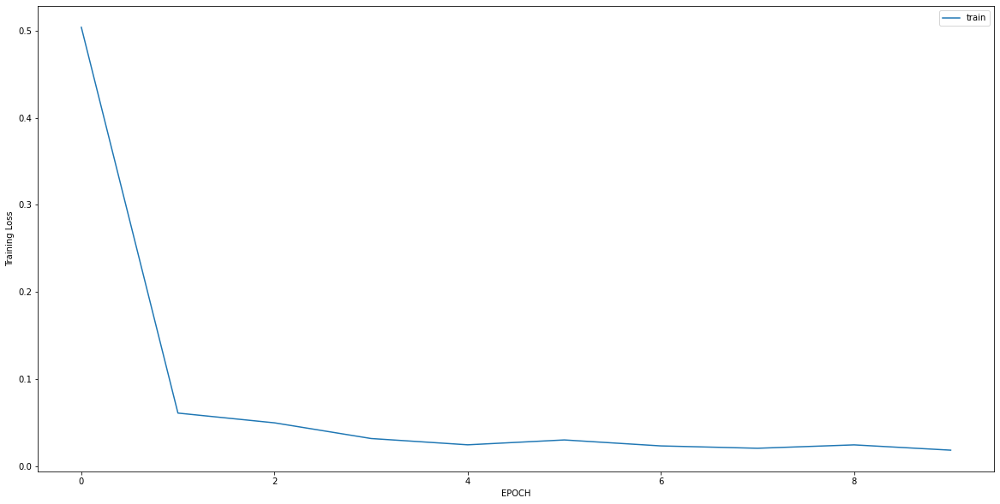

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.5336 - accuracy: 0.6032
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8346 - accuracy: 0.6842
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6268 - accuracy: 0.7692
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5417 - accuracy: 0.7530
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4431 - accuracy: 0.8097
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4065 - accuracy: 0.8300
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3706 - accuracy: 0.8623
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3428 - accuracy: 0.8947
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2987 - accuracy: 0.9028
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2452 - accuracy: 0.9352


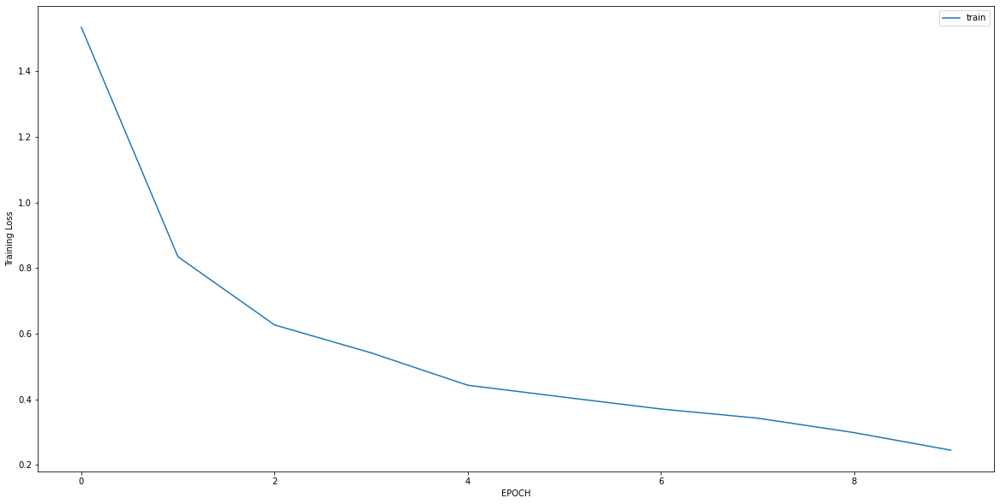

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.8426 - accuracy: 0.0152
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9535 - accuracy: 0.3371
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2320 - accuracy: 0.9659
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0843 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0705 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0559 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0491 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0450 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 1.0000


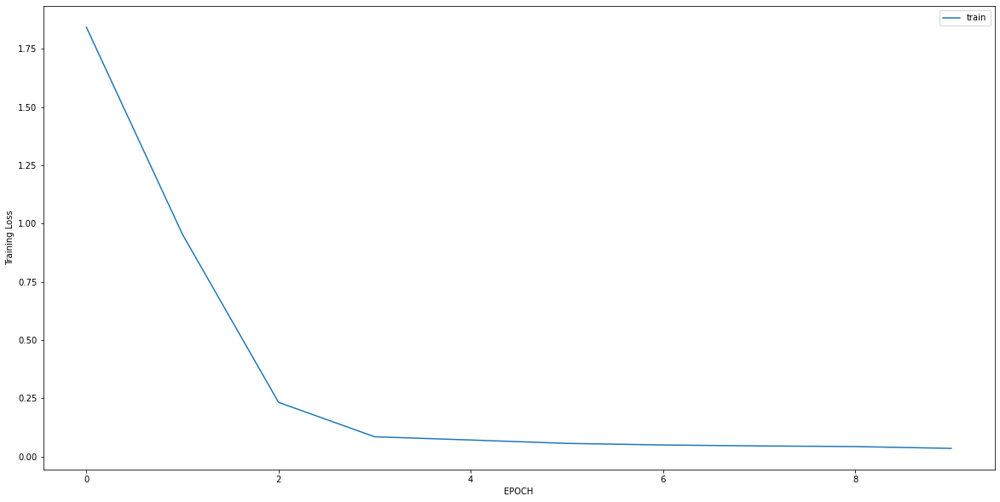

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2282 - accuracy: 0.5768
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8665 - accuracy: 0.6479
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6034 - accuracy: 0.7528
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4761 - accuracy: 0.8202
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4339 - accuracy: 0.8614
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4127 - accuracy: 0.8689
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3656 - accuracy: 0.8839
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3598 - accuracy: 0.8951
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3395 - accuracy: 0.8951
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3292 - accuracy: 0.8989


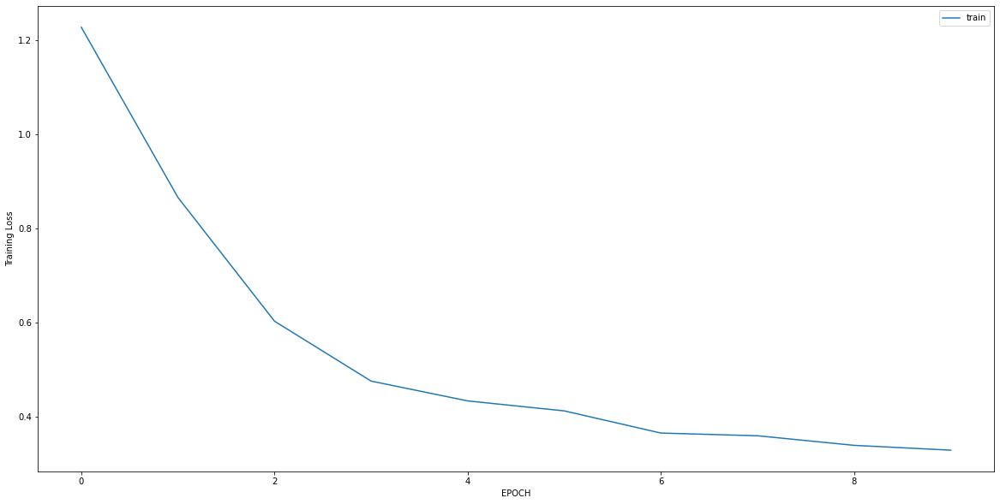

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 2.0390 - accuracy: 0.0000e+00
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 1.2480 - accuracy: 0.0841
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5849 - accuracy: 0.7321
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3074 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2022 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1574 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1277 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1093 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0865 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0744 - accuracy: 1.0000


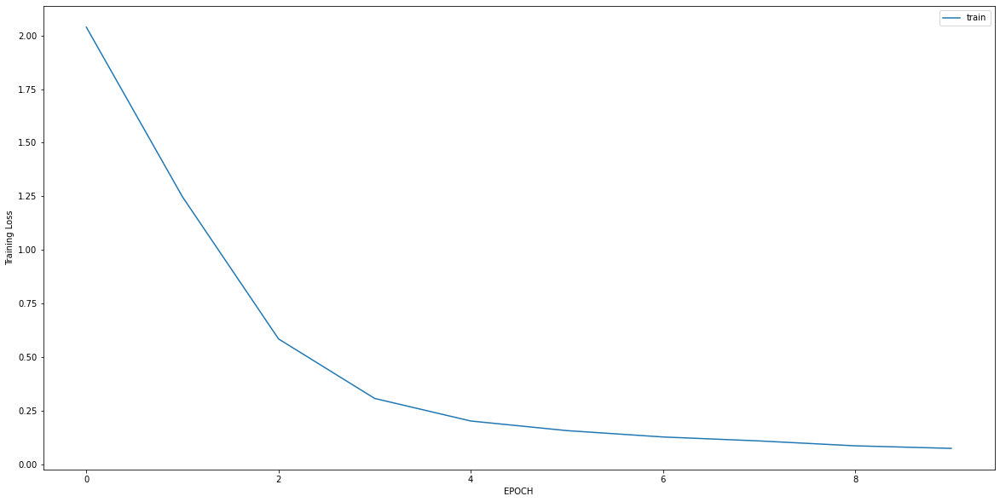

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0448 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0269 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0263 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0231 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0204 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0186 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0203 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0197 - accuracy: 1.0000


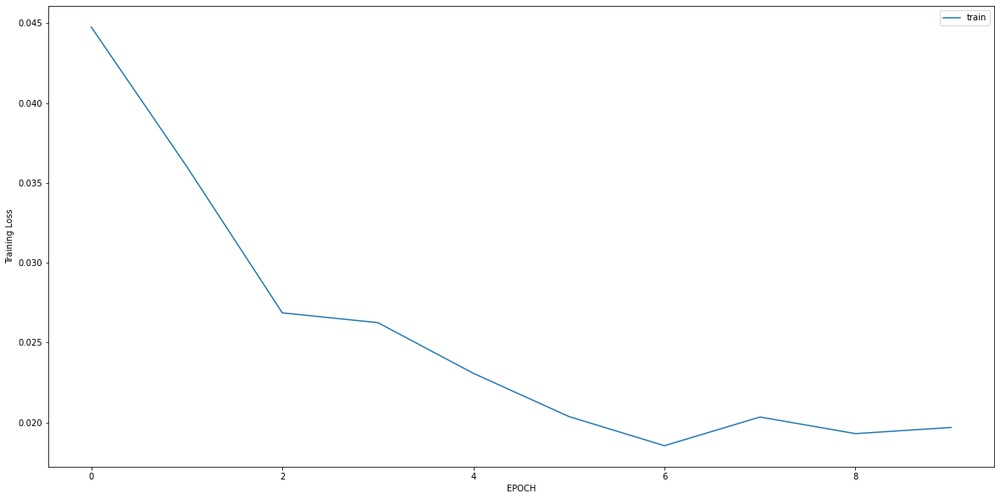

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0246 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0090 - accuracy: 1.0000


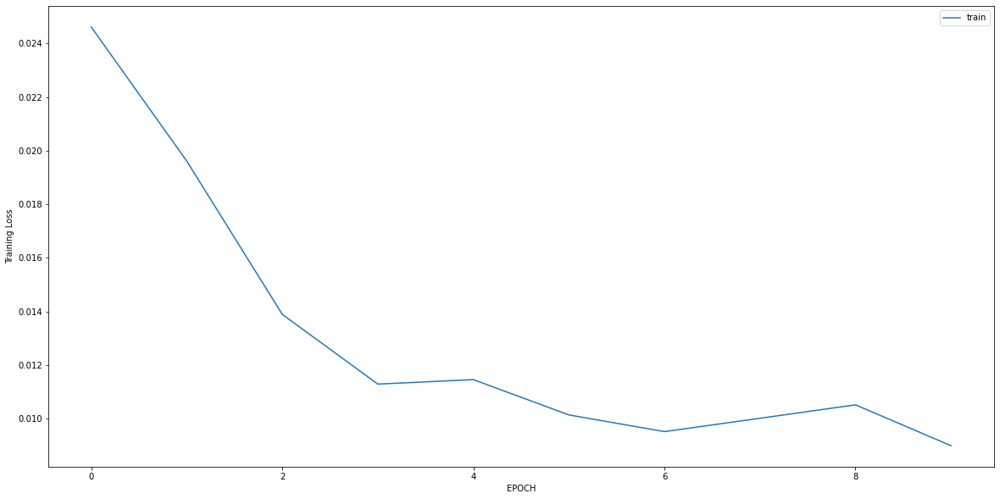

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.6434 - accuracy: 0.5333
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 1.3866 - accuracy: 0.5333
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 1.0088 - accuracy: 0.5333
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.8082 - accuracy: 0.5373
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6818 - accuracy: 0.5412
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5755 - accuracy: 0.6039
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5074 - accuracy: 0.6745
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4665 - accuracy: 0.7255
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4272 - accuracy: 0.7765
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3881 - accuracy: 0.8157


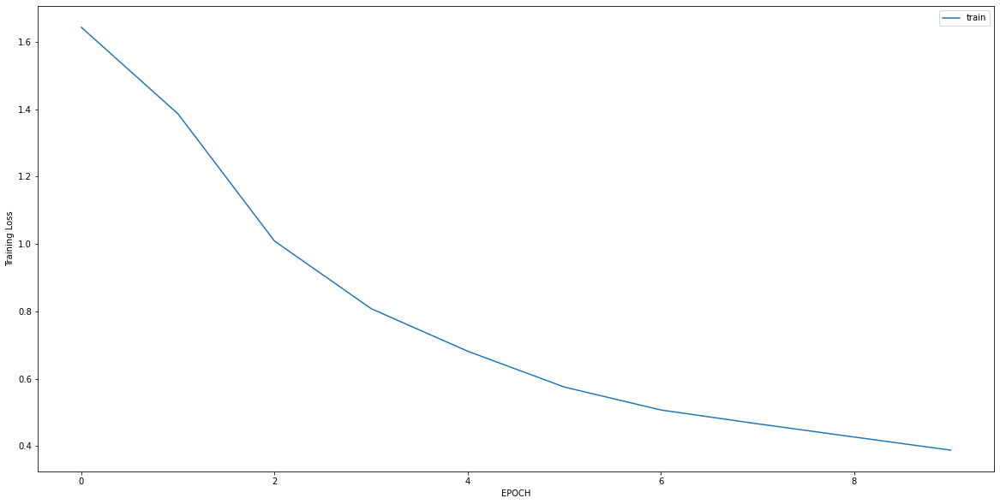

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6657 - accuracy: 0.7018
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5955 - accuracy: 0.7661
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5648 - accuracy: 0.7798
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5113 - accuracy: 0.7936
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4349 - accuracy: 0.8486
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4024 - accuracy: 0.8440
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3750 - accuracy: 0.8761
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3378 - accuracy: 0.8945
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3336 - accuracy: 0.9083
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3138 - accuracy: 0.9220


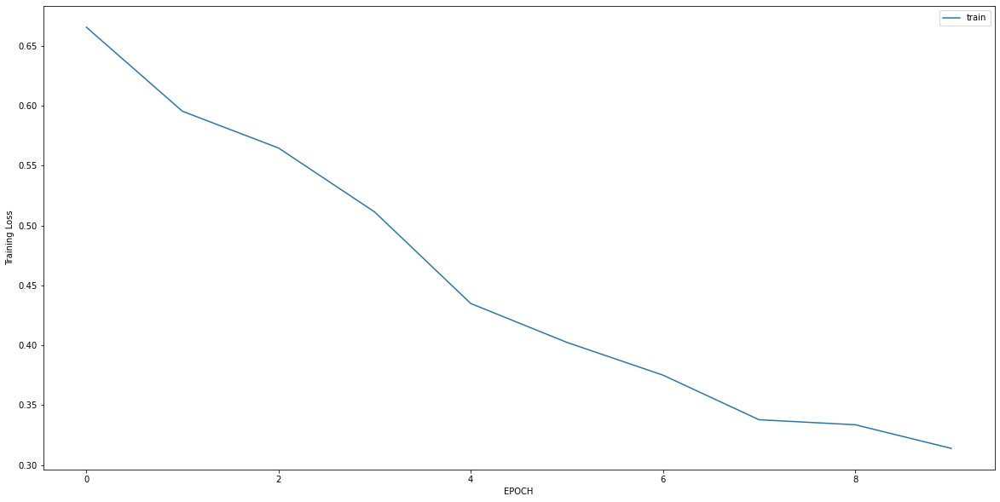

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5017 - accuracy: 0.8142
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4240 - accuracy: 0.8458
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3654 - accuracy: 0.8498
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3452 - accuracy: 0.8854
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3404 - accuracy: 0.8933
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3054 - accuracy: 0.8972
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3236 - accuracy: 0.9051
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2899 - accuracy: 0.9051
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2914 - accuracy: 0.9012
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2814 - accuracy: 0.9091


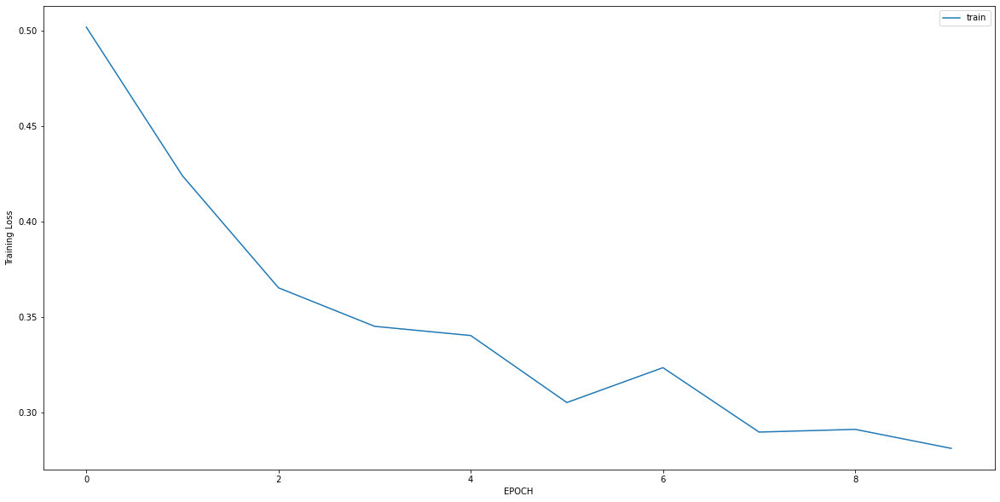

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 2.5891 - accuracy: 0.0000e+00
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 2.0102 - accuracy: 0.0168
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 1.2768 - accuracy: 0.0966
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.8420 - accuracy: 0.3319
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1977 - accuracy: 0.9454
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0576 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0572 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 1.0000


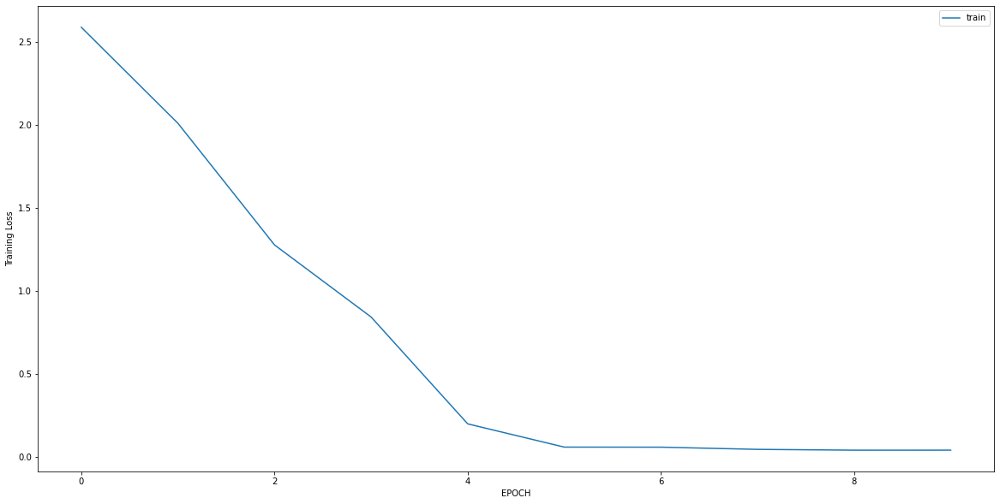

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.7733 - accuracy: 0.6287
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6706 - accuracy: 0.6404
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6138 - accuracy: 0.6637
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5294 - accuracy: 0.6871
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4439 - accuracy: 0.7427
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3664 - accuracy: 0.7836
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3045 - accuracy: 0.8830
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2867 - accuracy: 0.8743
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2504 - accuracy: 0.9240
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2443 - accuracy: 0.9298


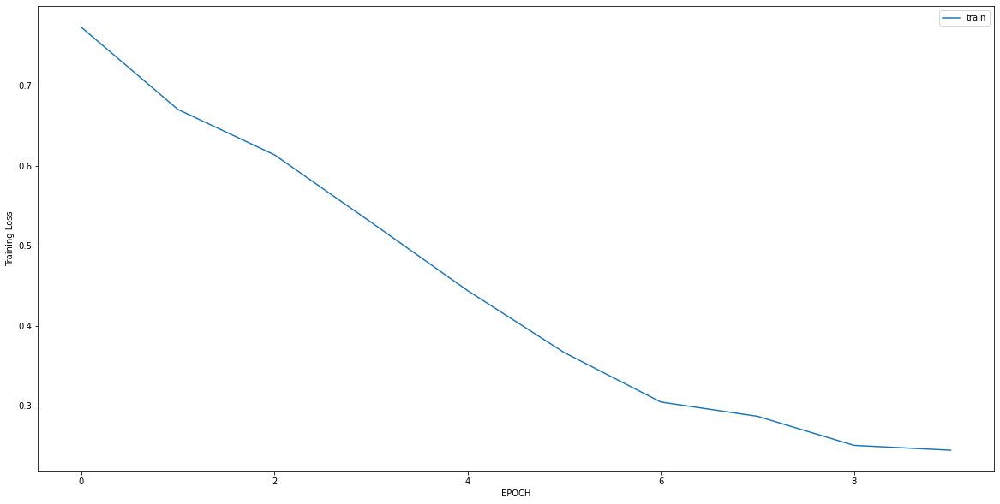

Epoch 1/10
2/2 [==============================] - 0s 9ms/step - loss: 1.1663 - accuracy: 0.1250
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 1.2135 - accuracy: 0.1429
Epoch 3/10
2/2 [==============================] - 0s 6ms/step - loss: 1.0619 - accuracy: 0.1607
Epoch 4/10
2/2 [==============================] - 0s 8ms/step - loss: 1.0247 - accuracy: 0.2321
Epoch 5/10
2/2 [==============================] - 0s 8ms/step - loss: 0.8804 - accuracy: 0.3214
Epoch 6/10
2/2 [==============================] - 0s 7ms/step - loss: 0.8007 - accuracy: 0.4464
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 0.7816 - accuracy: 0.4286
Epoch 8/10
2/2 [==============================] - 0s 6ms/step - loss: 0.6930 - accuracy: 0.5000
Epoch 9/10
2/2 [==============================] - 0s 7ms/step - loss: 0.7048 - accuracy: 0.4643
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 0.6124 - accuracy: 0.6607


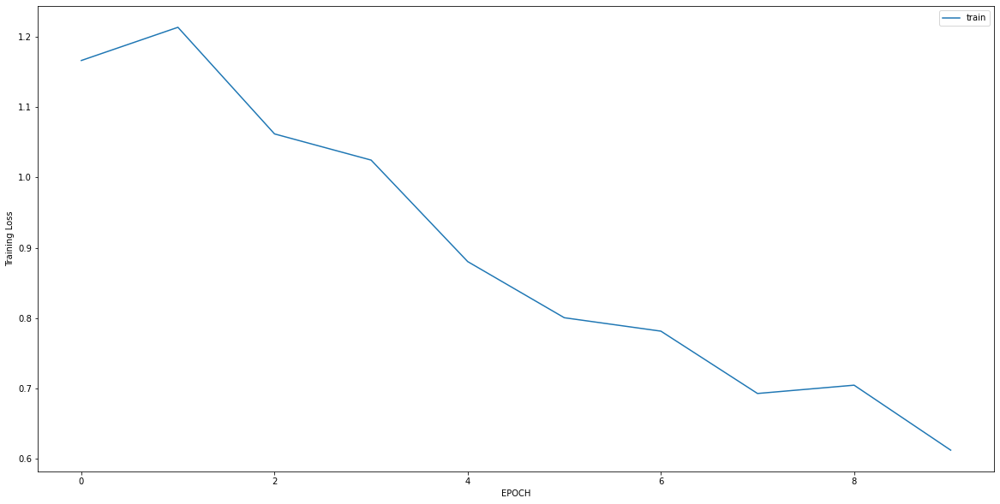

Epoch 1/10
4/4 [==============================] - 0s 7ms/step - loss: 1.2264 - accuracy: 0.2755
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 1.0350 - accuracy: 0.2347
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 0.8655 - accuracy: 0.3163
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 0.8408 - accuracy: 0.2959
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 0.7932 - accuracy: 0.3776
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 0.7187 - accuracy: 0.5204
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.7566 - accuracy: 0.3980
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 0.7427 - accuracy: 0.4694
Epoch 9/10
4/4 [==============================] - 0s 4ms/step - loss: 0.6742 - accuracy: 0.5816
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.6389 - accuracy: 0.6327


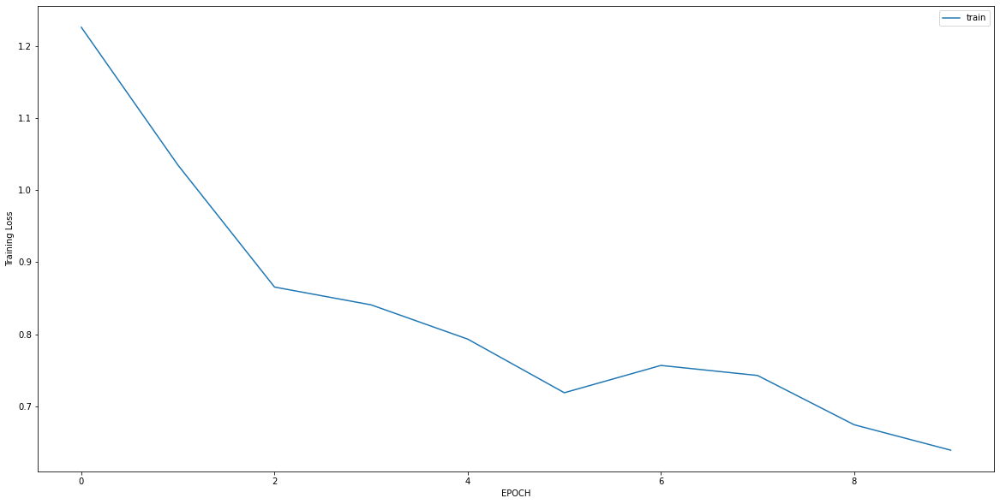

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4677 - accuracy: 0.8900
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3036 - accuracy: 0.9210
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2684 - accuracy: 0.9278
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2677 - accuracy: 0.9278
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2401 - accuracy: 0.9416
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2361 - accuracy: 0.9450
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2070 - accuracy: 0.9588
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2055 - accuracy: 0.9622
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1696 - accuracy: 0.9588
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1874 - accuracy: 0.9553


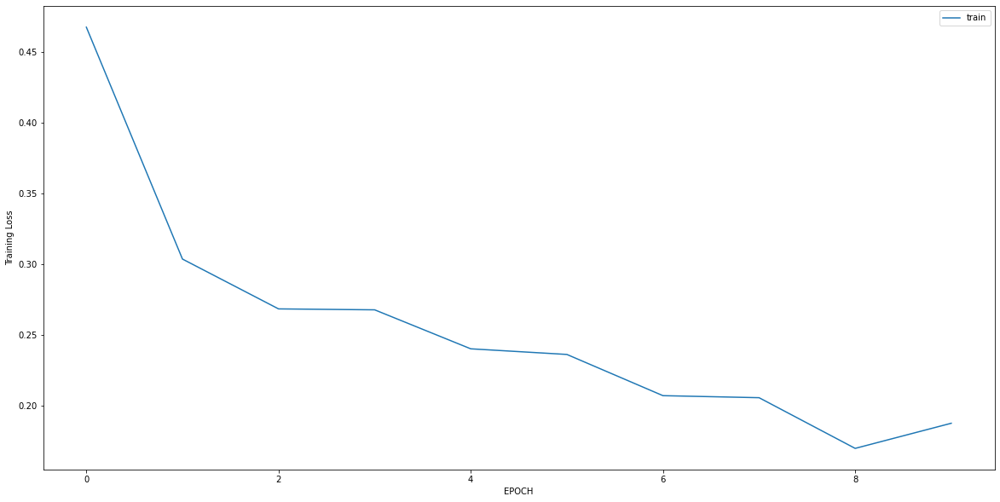

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3106 - accuracy: 0.9298
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3141 - accuracy: 0.9193
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2783 - accuracy: 0.9333
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2899 - accuracy: 0.8877
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2513 - accuracy: 0.9298
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2338 - accuracy: 0.9368
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2401 - accuracy: 0.9333
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2690 - accuracy: 0.9158
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2733 - accuracy: 0.9228
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2445 - accuracy: 0.9158


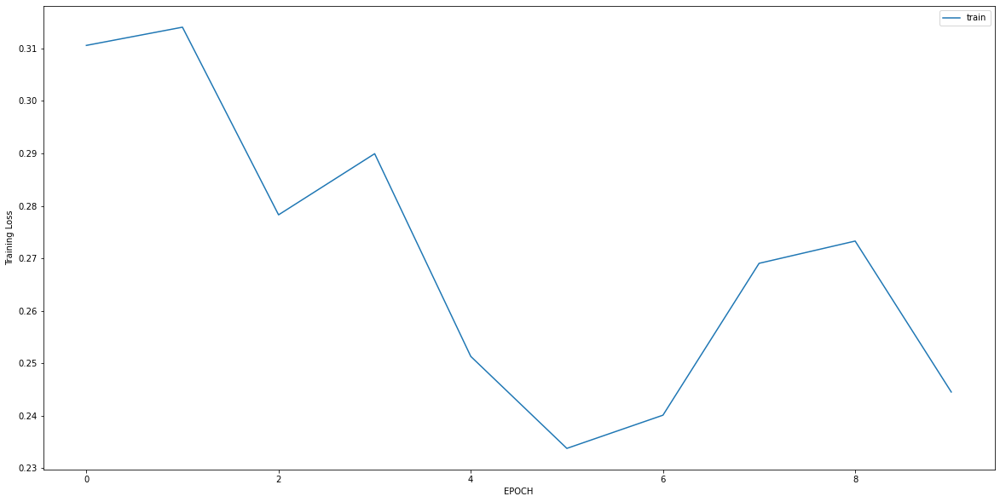

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2253 - accuracy: 0.9127
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0520 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0341 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0273 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0235 - accuracy: 1.0000


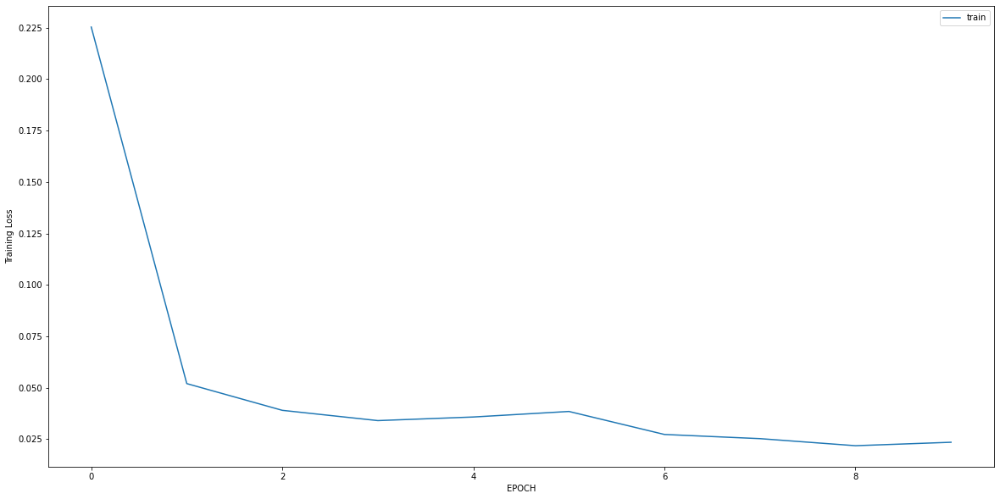

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5545 - accuracy: 0.8458
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3633 - accuracy: 0.8656
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3059 - accuracy: 0.8972
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2800 - accuracy: 0.8933
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2187 - accuracy: 0.9328
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2408 - accuracy: 0.9249
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2751 - accuracy: 0.9249
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1978 - accuracy: 0.9407
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2086 - accuracy: 0.9407
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1871 - accuracy: 0.9368


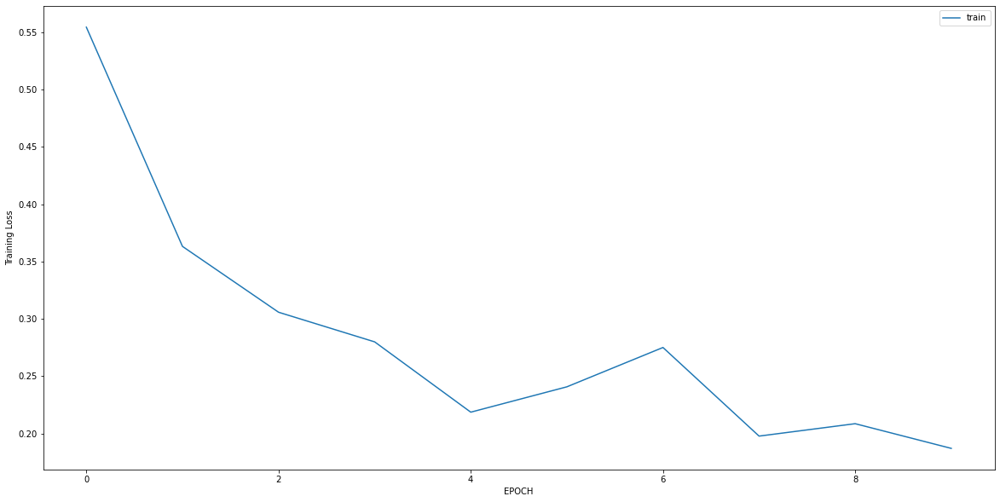

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.7168 - accuracy: 0.5965
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3108 - accuracy: 0.8847
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1321 - accuracy: 0.9914
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1101 - accuracy: 0.9885
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1033 - accuracy: 0.9885
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0972 - accuracy: 0.9885
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0827 - accuracy: 0.9885
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0836 - accuracy: 0.9971
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0824 - accuracy: 0.9914
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0683 - accuracy: 1.0000


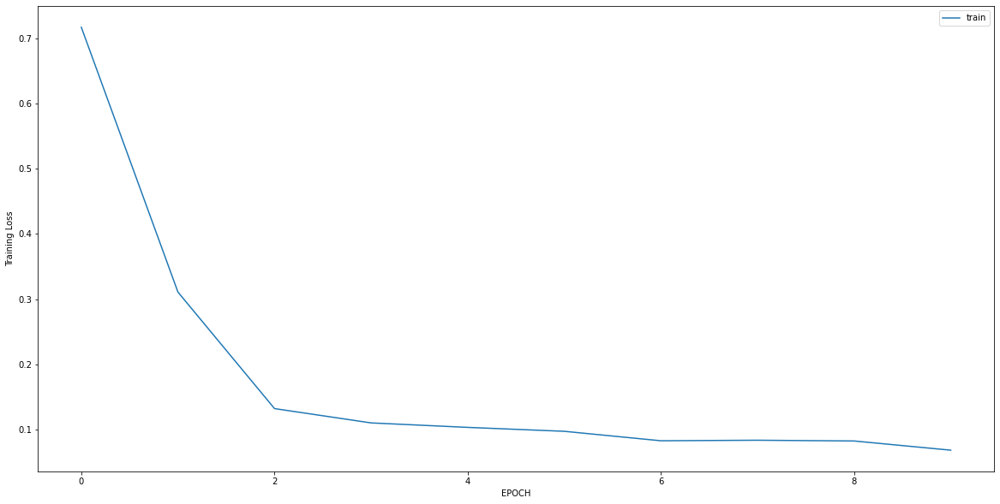

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2412 - accuracy: 0.9327
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2088 - accuracy: 0.9461
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2069 - accuracy: 0.9461
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1992 - accuracy: 0.9529
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2249 - accuracy: 0.9158
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1926 - accuracy: 0.9360
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1718 - accuracy: 0.9428
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1869 - accuracy: 0.9428
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1627 - accuracy: 0.9562
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1514 - accuracy: 0.9461


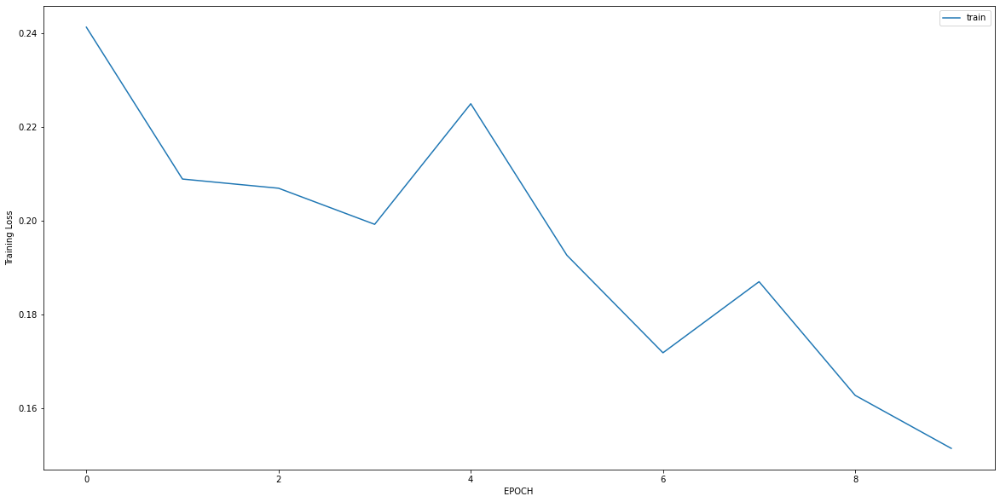

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5365 - accuracy: 0.5472
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1677 - accuracy: 0.5698
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8715 - accuracy: 0.6151
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6761 - accuracy: 0.6226
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5829 - accuracy: 0.6792
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4938 - accuracy: 0.7283
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4472 - accuracy: 0.8038
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4258 - accuracy: 0.8302
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4288 - accuracy: 0.8151
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4023 - accuracy: 0.8340


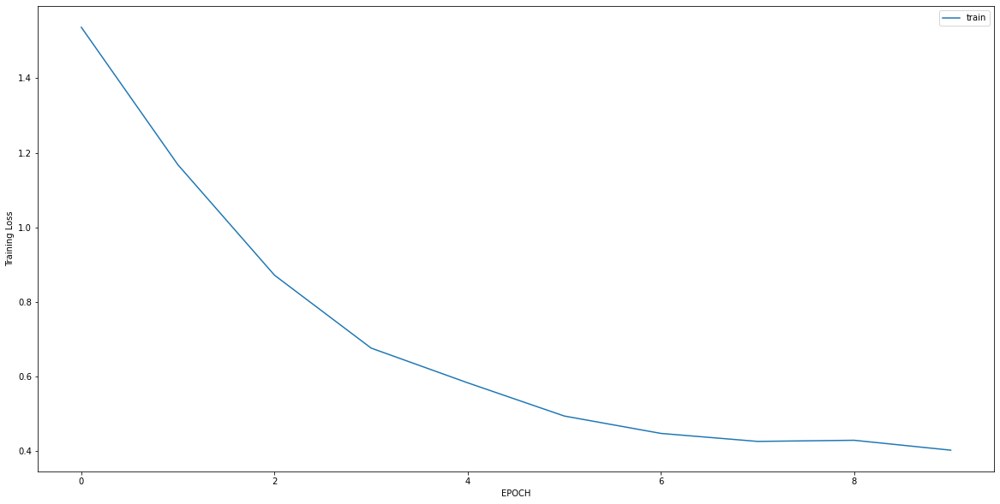

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.1495 - accuracy: 0.4206
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 1.1522 - accuracy: 0.4167
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8927 - accuracy: 0.4484
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.8150 - accuracy: 0.4603
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7240 - accuracy: 0.5000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7143 - accuracy: 0.5238
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6925 - accuracy: 0.5397
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6594 - accuracy: 0.5873
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6780 - accuracy: 0.5556
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6834 - accuracy: 0.5833


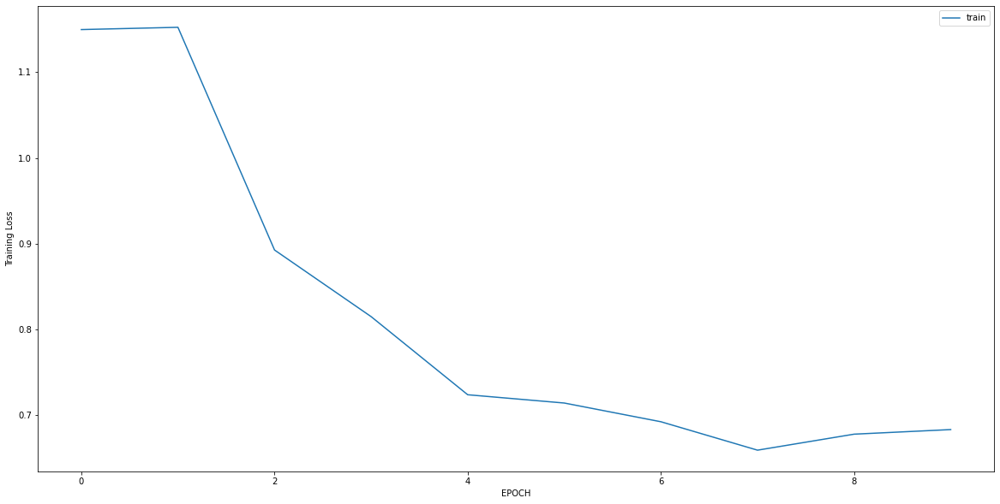

Epoch 1/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7643 - accuracy: 0.4792
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7448 - accuracy: 0.4653
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6427 - accuracy: 0.6042
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6657 - accuracy: 0.6111
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6444 - accuracy: 0.6042
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6712 - accuracy: 0.6111
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6515 - accuracy: 0.6250
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6102 - accuracy: 0.6736
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6338 - accuracy: 0.6458
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6323 - accuracy: 0.6806


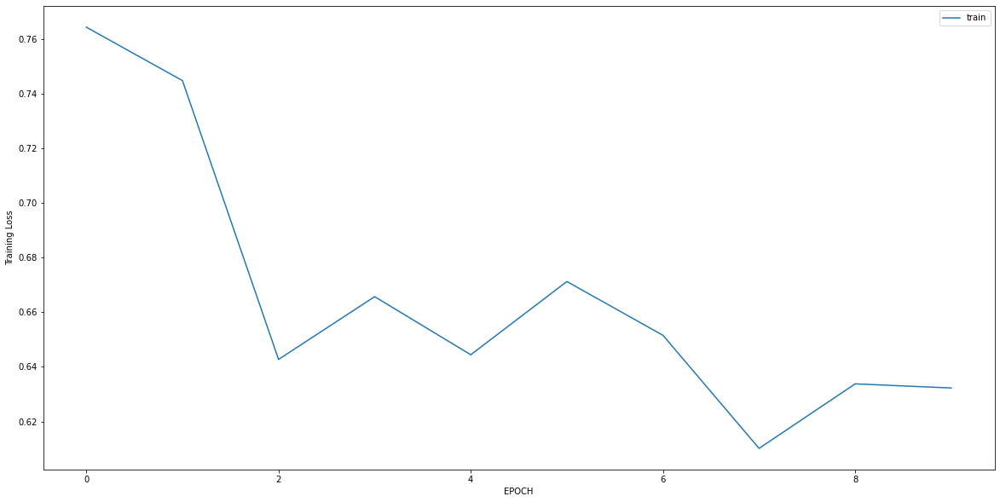

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4908 - accuracy: 0.8033
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4224 - accuracy: 0.8893
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3766 - accuracy: 0.9180
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3255 - accuracy: 0.9057
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2906 - accuracy: 0.9508
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2658 - accuracy: 0.9385
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2451 - accuracy: 0.9467
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2172 - accuracy: 0.9590
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2158 - accuracy: 0.9590
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1924 - accuracy: 0.9549


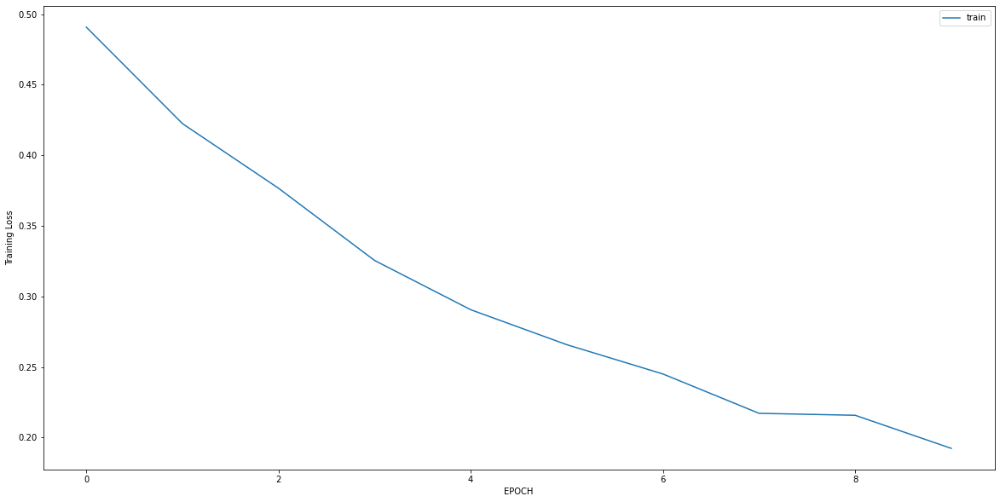

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4989 - accuracy: 0.7402
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0301 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0169 - accuracy: 1.0000


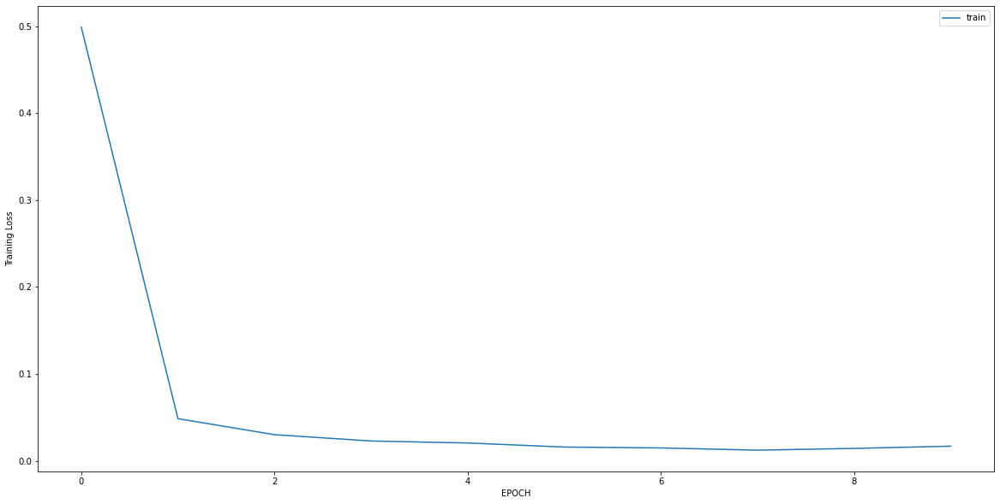

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7984 - accuracy: 0.8145
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5991 - accuracy: 0.8302
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4198 - accuracy: 0.8648
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3024 - accuracy: 0.8742
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2461 - accuracy: 0.9088
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1639 - accuracy: 0.9403
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1650 - accuracy: 0.9434
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1458 - accuracy: 0.9528
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1154 - accuracy: 0.9654
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1069 - accuracy: 0.9780


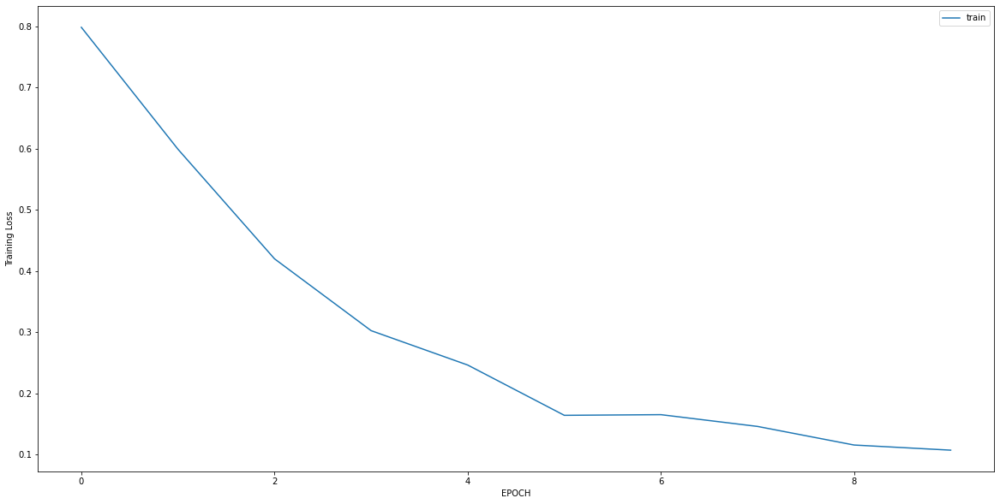

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.9752 - accuracy: 0.4007
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6933 - accuracy: 0.4007
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.3114 - accuracy: 0.3971
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0195 - accuracy: 0.4116
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8276 - accuracy: 0.4549
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7146 - accuracy: 0.5090
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6267 - accuracy: 0.6751
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6581 - accuracy: 0.6137
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6195 - accuracy: 0.6895
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6170 - accuracy: 0.6715


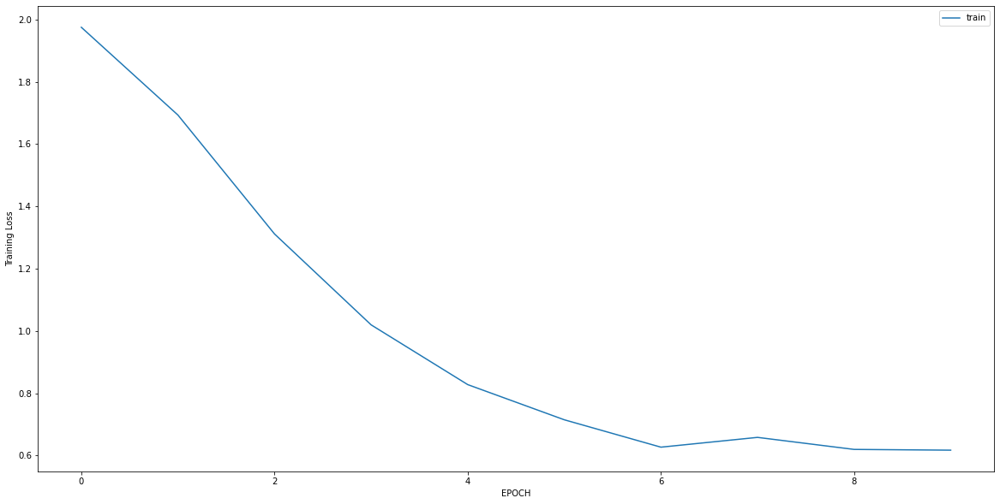

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1870 - accuracy: 0.9901
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0802 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0182 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0107 - accuracy: 1.0000


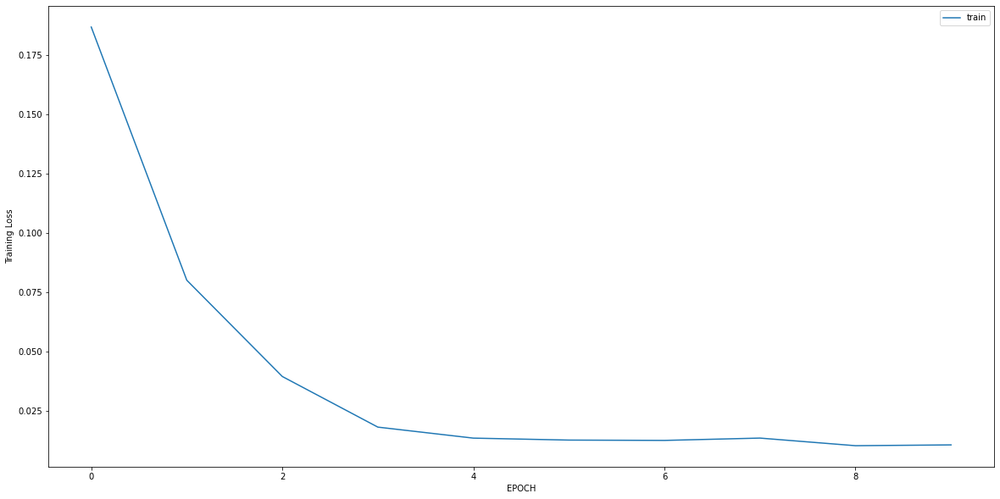

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.4353 - accuracy: 0.4408
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.8350 - accuracy: 0.6914
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4530 - accuracy: 0.8306
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3072 - accuracy: 0.9234
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2289 - accuracy: 0.9466
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1965 - accuracy: 0.9722
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2023 - accuracy: 0.9490
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2603 - accuracy: 0.9258
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1661 - accuracy: 0.9675
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1590 - accuracy: 0.9606


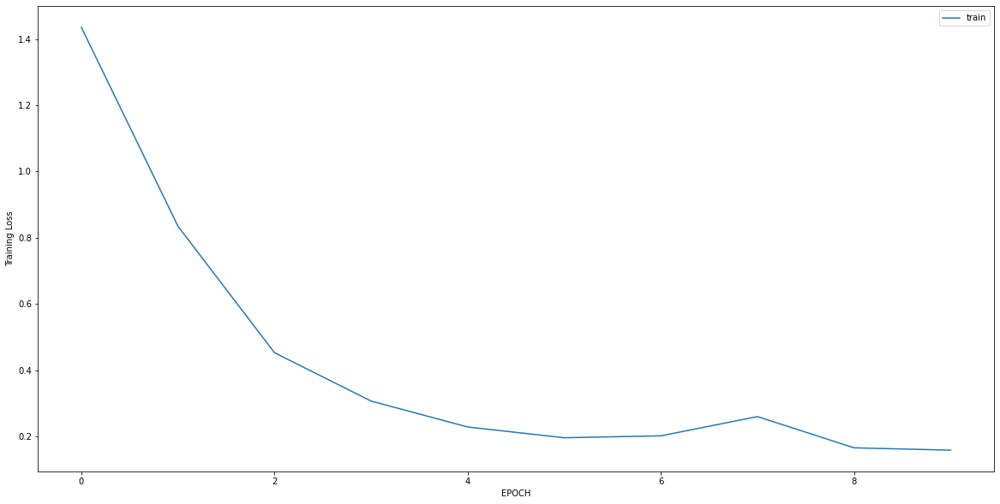

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.7602 - accuracy: 0.3897
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.4412 - accuracy: 0.3934
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1912 - accuracy: 0.3824
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9036 - accuracy: 0.4338
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7696 - accuracy: 0.4853
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6033 - accuracy: 0.6434
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5224 - accuracy: 0.7390
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4553 - accuracy: 0.7941
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4153 - accuracy: 0.8309
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4020 - accuracy: 0.8272


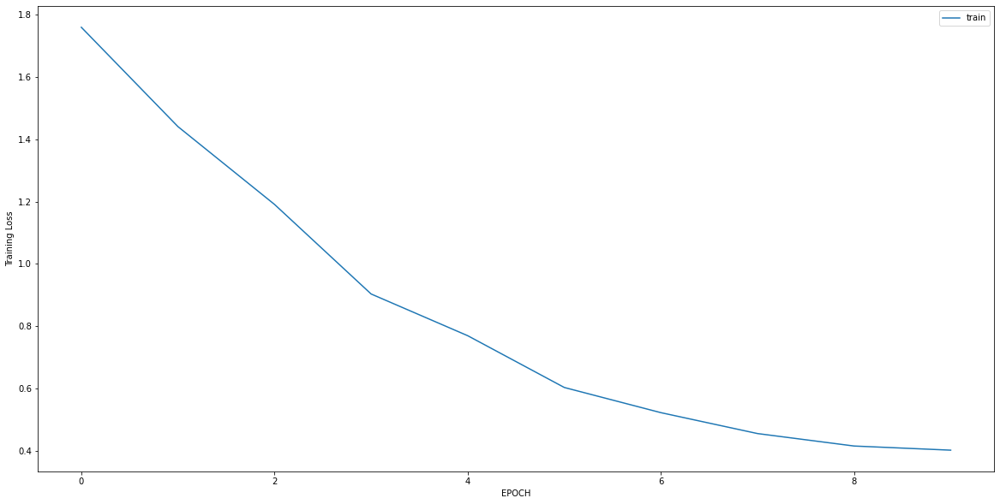

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8916 - accuracy: 0.3291
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6238 - accuracy: 0.6613
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4152 - accuracy: 0.9265
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2875 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2094 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1641 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1346 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1191 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1018 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0882 - accuracy: 1.0000


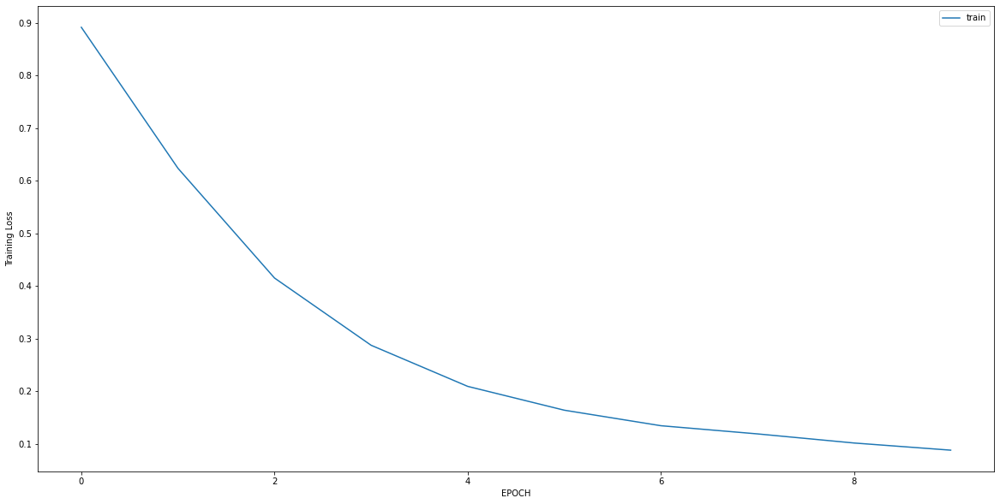

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 2.2263 - accuracy: 0.2642
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 2.0187 - accuracy: 0.2642
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 1.7334 - accuracy: 0.2642
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 1.4426 - accuracy: 0.2642
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 1.2231 - accuracy: 0.2642
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9716 - accuracy: 0.3113
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7785 - accuracy: 0.4575
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.6848 - accuracy: 0.5236
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6166 - accuracy: 0.6698
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5865 - accuracy: 0.7170


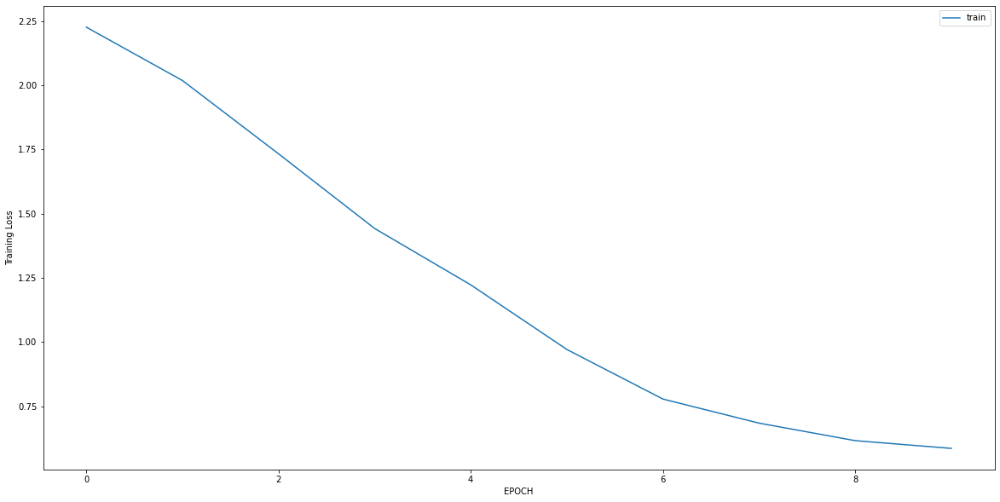

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3657 - accuracy: 0.8523
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2930 - accuracy: 0.8692
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2212 - accuracy: 0.9578
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2215 - accuracy: 0.9451
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1860 - accuracy: 0.9578
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1854 - accuracy: 0.9662
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1633 - accuracy: 0.9831
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1509 - accuracy: 0.9705
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1457 - accuracy: 0.9789
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1381 - accuracy: 0.9789


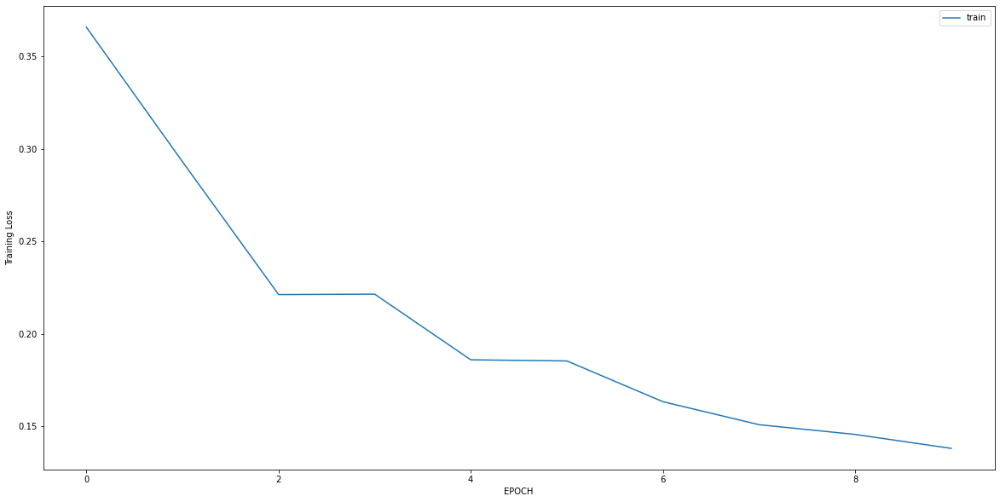

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.2016 - accuracy: 0.3918
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0746 - accuracy: 0.4142
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8707 - accuracy: 0.4515
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7730 - accuracy: 0.4664
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7056 - accuracy: 0.5037
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6159 - accuracy: 0.6493
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5991 - accuracy: 0.6754
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5866 - accuracy: 0.7388
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5773 - accuracy: 0.7351
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5565 - accuracy: 0.7276


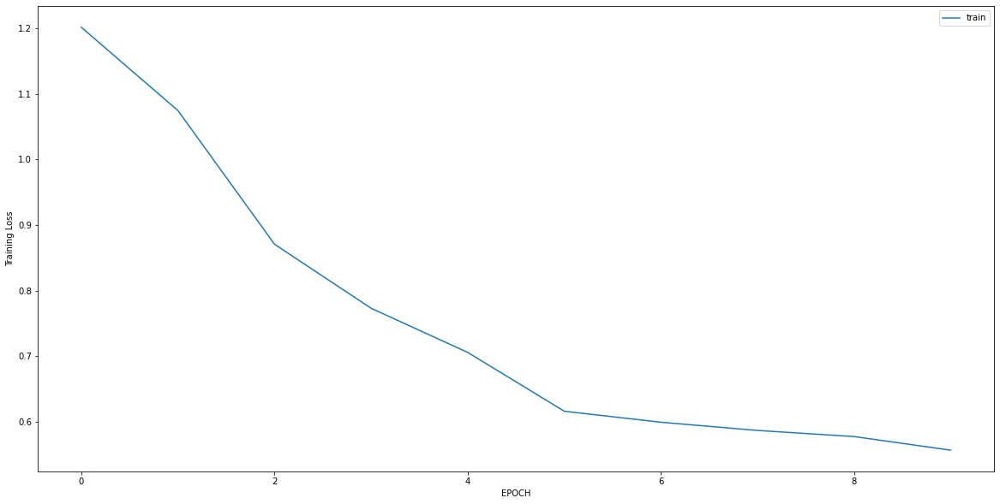

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6522 - accuracy: 0.5764
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6363 - accuracy: 0.6250
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6386 - accuracy: 0.6389
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5909 - accuracy: 0.6806
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5871 - accuracy: 0.6944
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6077 - accuracy: 0.6319
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5737 - accuracy: 0.6597
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6290 - accuracy: 0.6458
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5498 - accuracy: 0.6736
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5839 - accuracy: 0.6736


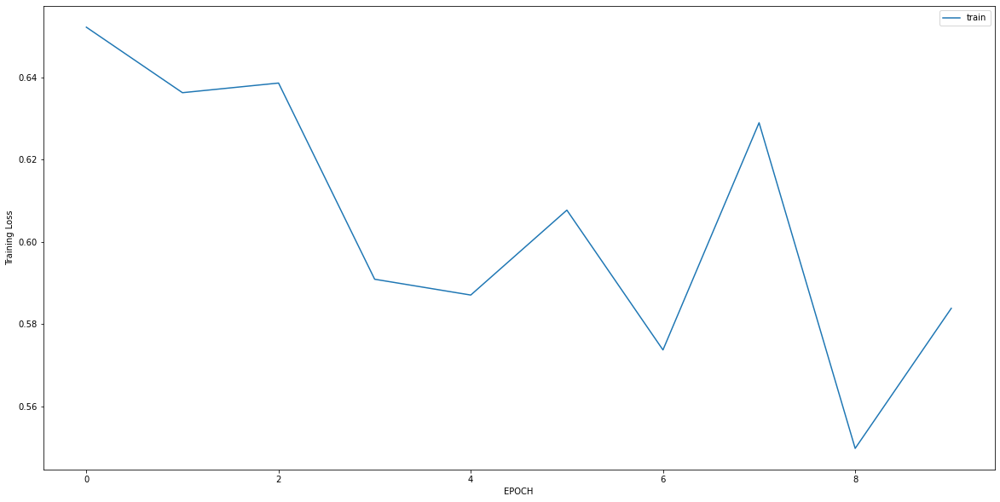

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 0.6501 - accuracy: 0.5833
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 0.5656 - accuracy: 0.7556
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 0.4503 - accuracy: 0.9667
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.3557 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 4ms/step - loss: 0.2681 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2038 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1664 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 4ms/step - loss: 0.1442 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1386 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1211 - accuracy: 1.0000


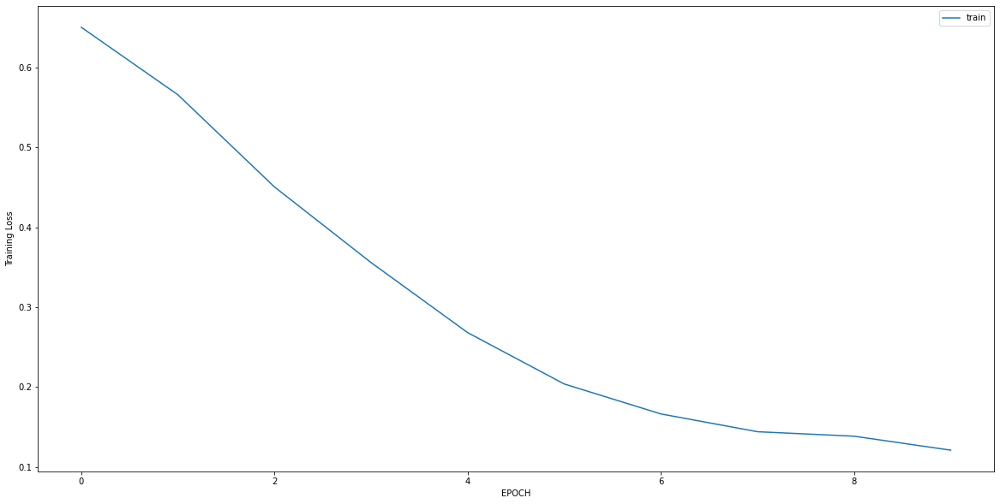

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0763 - accuracy: 0.3639
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8845 - accuracy: 0.4399
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7878 - accuracy: 0.4842
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5469 - accuracy: 0.7184
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4861 - accuracy: 0.7468
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5008 - accuracy: 0.7468
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4574 - accuracy: 0.8228
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4117 - accuracy: 0.8449
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3394 - accuracy: 0.8892
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3522 - accuracy: 0.8703


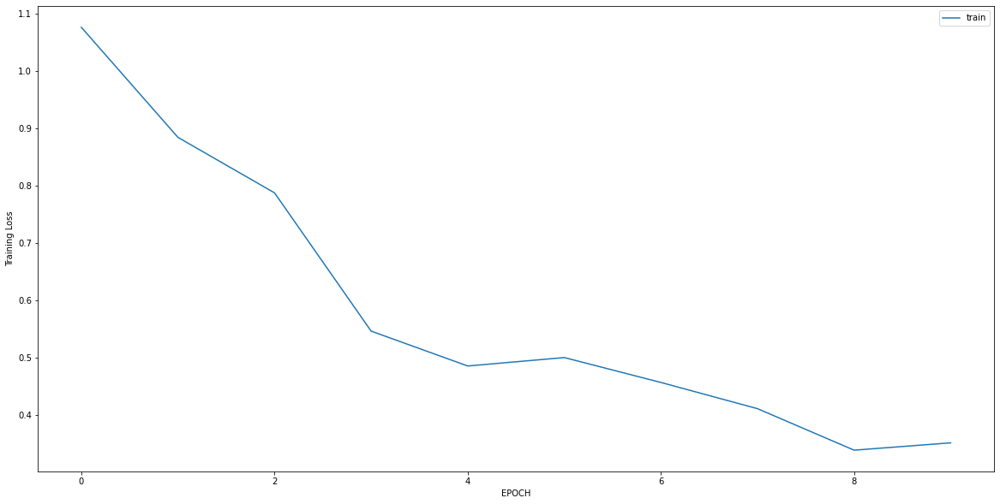

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2644 - accuracy: 0.9246
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2029 - accuracy: 0.9405
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1523 - accuracy: 0.9524
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1558 - accuracy: 0.9643
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1494 - accuracy: 0.9722
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1397 - accuracy: 0.9683
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1201 - accuracy: 0.9762
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1234 - accuracy: 0.9722
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1031 - accuracy: 0.9841
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1088 - accuracy: 0.9841


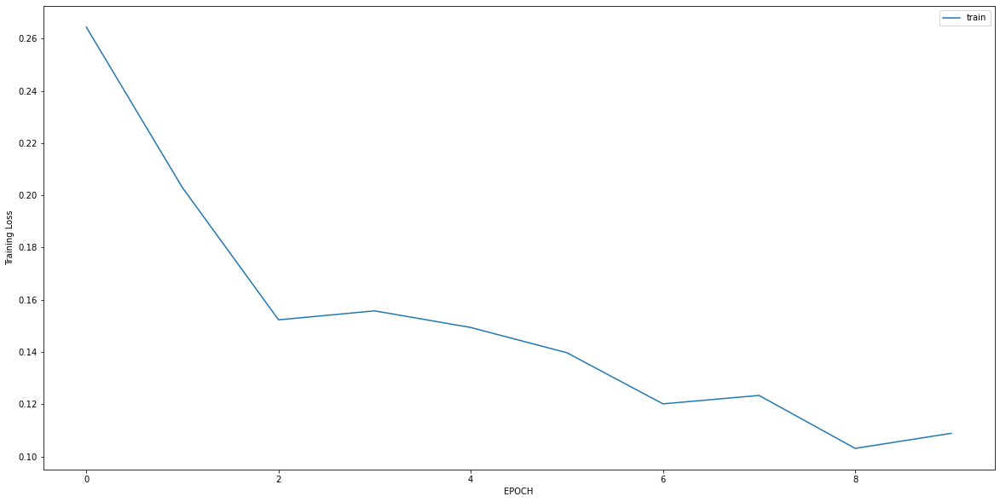

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.9989 - accuracy: 0.6736
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.9467 - accuracy: 0.6667
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.8720 - accuracy: 0.6806
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8720 - accuracy: 0.6736
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8702 - accuracy: 0.6736
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8540 - accuracy: 0.6875
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7947 - accuracy: 0.6806
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7345 - accuracy: 0.6875
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7435 - accuracy: 0.6806
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7421 - accuracy: 0.6389


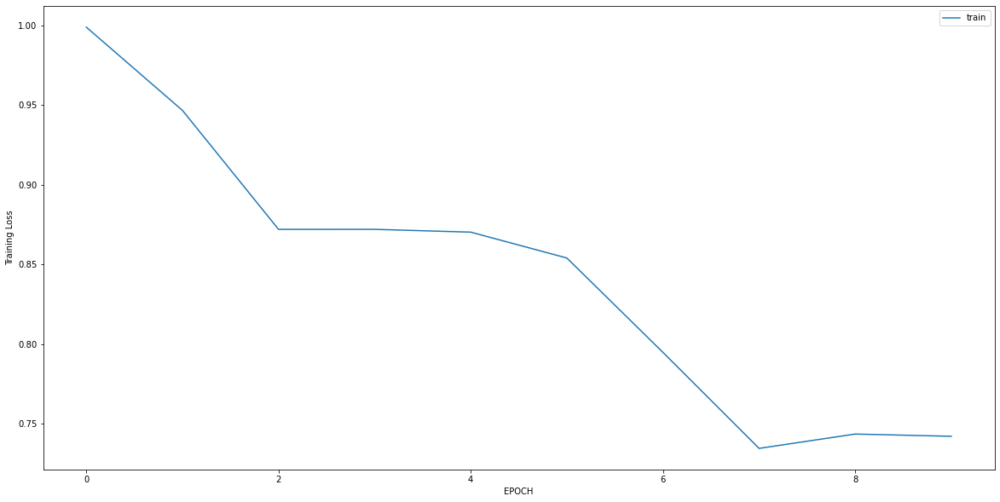

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 0.9610 - accuracy: 0.4068
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.3020 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1771 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1322 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1094 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0952 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0864 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0766 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0691 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0663 - accuracy: 1.0000


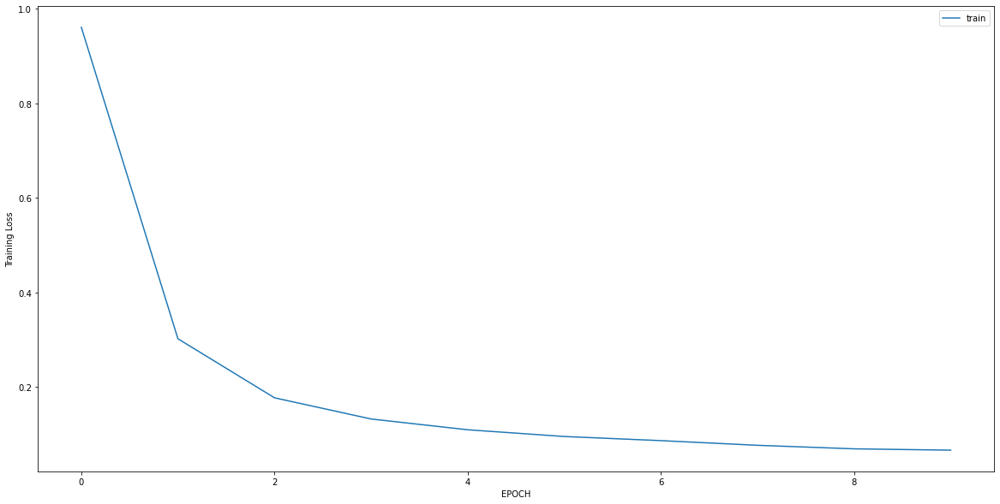

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 1.2575 - accuracy: 0.4708
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.9447 - accuracy: 0.5572
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.6500 - accuracy: 0.6652
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.5000 - accuracy: 0.7516
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4663 - accuracy: 0.7883
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4121 - accuracy: 0.8423
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3024 - accuracy: 0.8834
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3201 - accuracy: 0.8920
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3164 - accuracy: 0.8963
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2867 - accuracy: 0.9050


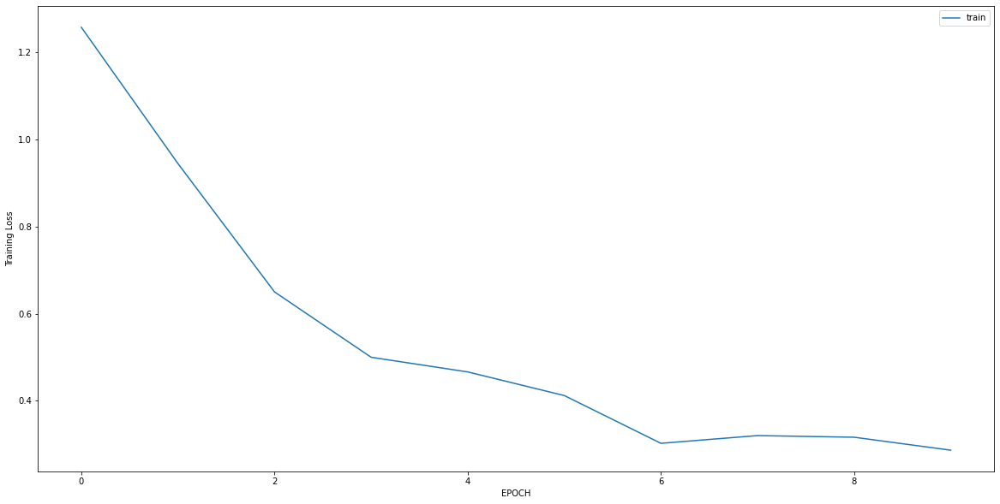

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 1.6574 - accuracy: 0.4696
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0541 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0500 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0467 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0302 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0273 - accuracy: 1.0000


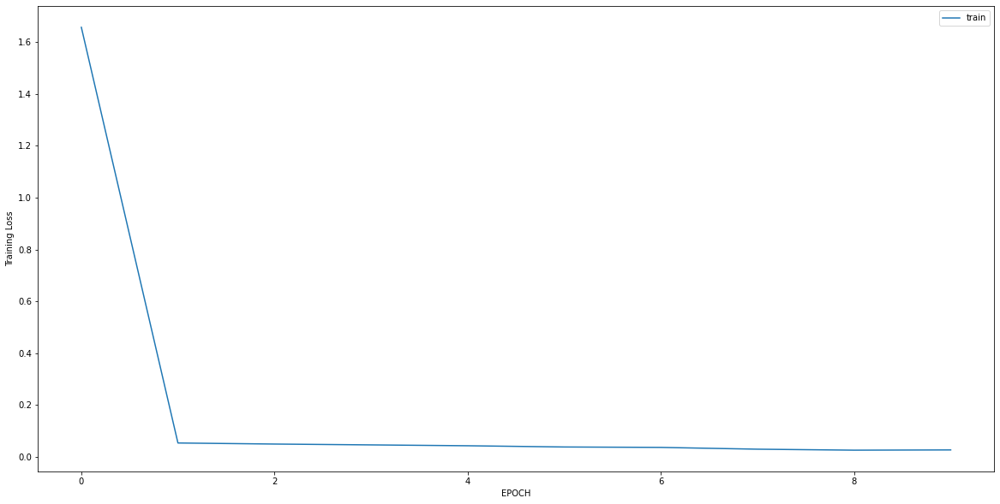

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0240 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0165 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0123 - accuracy: 1.0000


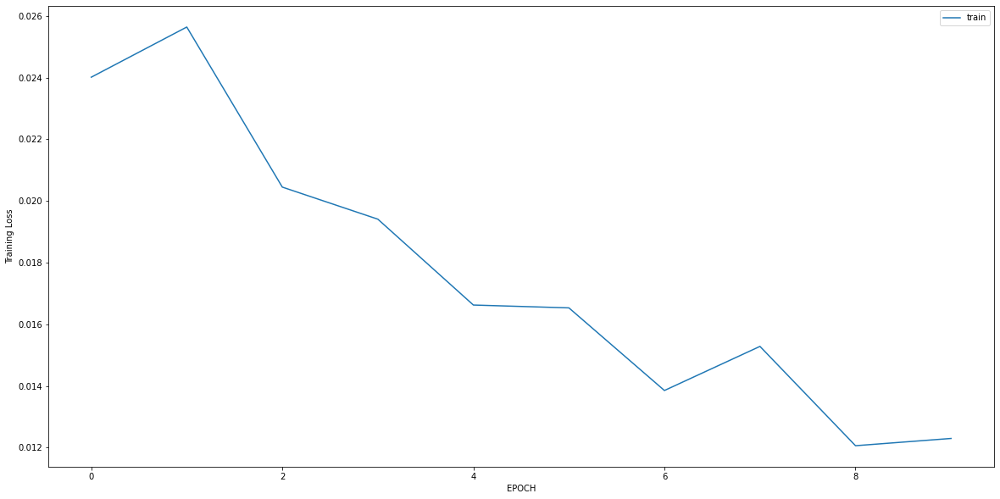

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.8201 - accuracy: 0.7088
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.6244 - accuracy: 0.7359
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.5155 - accuracy: 0.7517
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4337 - accuracy: 0.7630
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4044 - accuracy: 0.7810
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3947 - accuracy: 0.7878
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3453 - accuracy: 0.8059
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3288 - accuracy: 0.8036
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2958 - accuracy: 0.8284
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2589 - accuracy: 0.8555


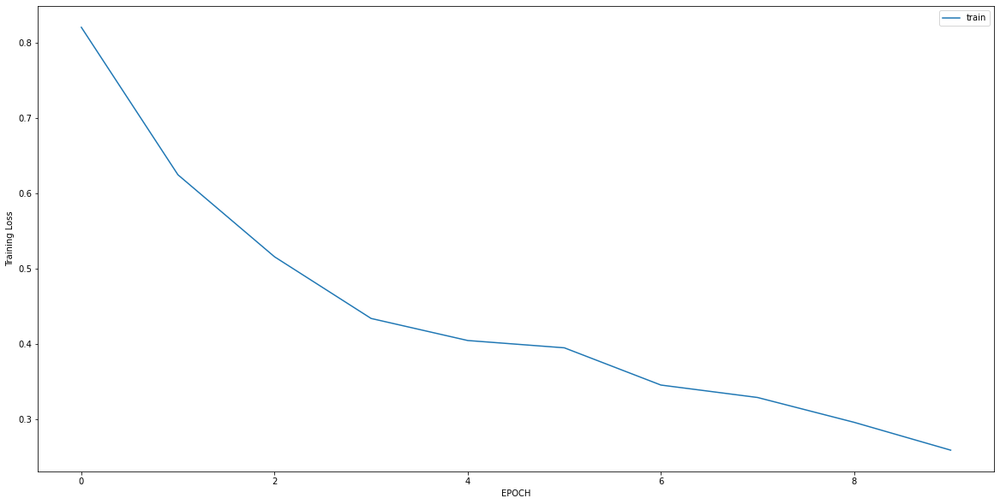

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5046 - accuracy: 0.7040
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4369 - accuracy: 0.8195
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3741 - accuracy: 0.8736
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3346 - accuracy: 0.8700
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3257 - accuracy: 0.8700
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3254 - accuracy: 0.8736
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2852 - accuracy: 0.8773
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2905 - accuracy: 0.9025
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2485 - accuracy: 0.9242
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1872 - accuracy: 0.9531


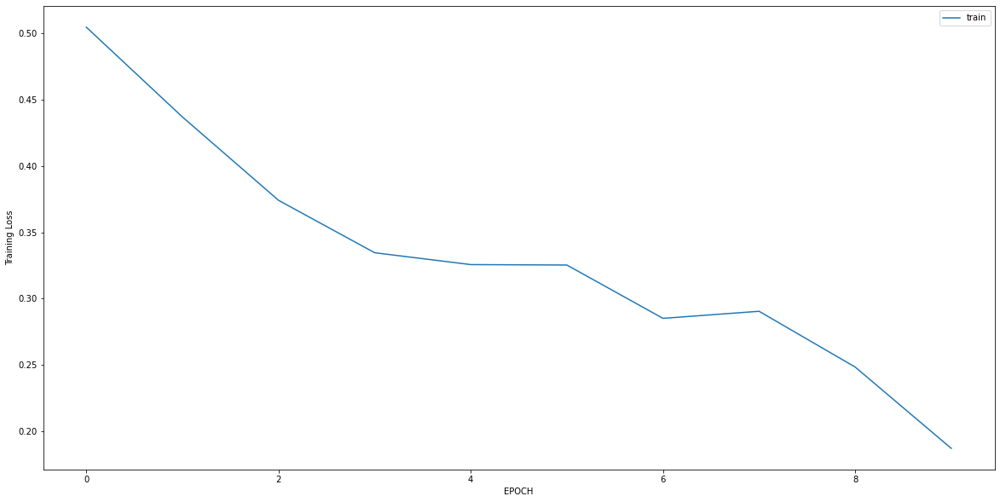

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 3.6793 - accuracy: 0.0105
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 1.6849 - accuracy: 0.1599
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.4985 - accuracy: 0.7627
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1844 - accuracy: 0.9947
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1090 - accuracy: 0.9965
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0830 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0689 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0608 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0494 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0479 - accuracy: 1.0000


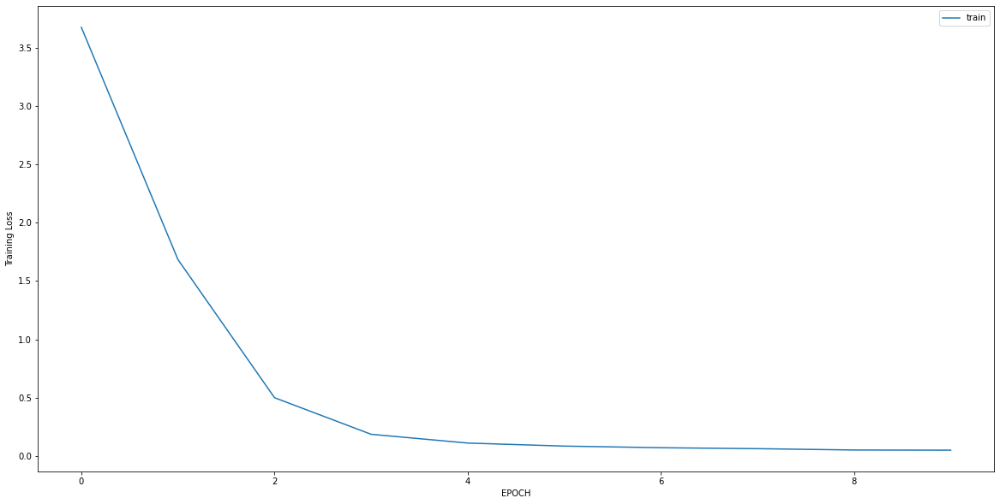

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5313 - accuracy: 0.5804
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.4364 - accuracy: 0.5804
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.2195 - accuracy: 0.5804
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1142 - accuracy: 0.5804
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9767 - accuracy: 0.5804
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8784 - accuracy: 0.5804
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8275 - accuracy: 0.5909
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7774 - accuracy: 0.5944
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7196 - accuracy: 0.6224
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6659 - accuracy: 0.6434


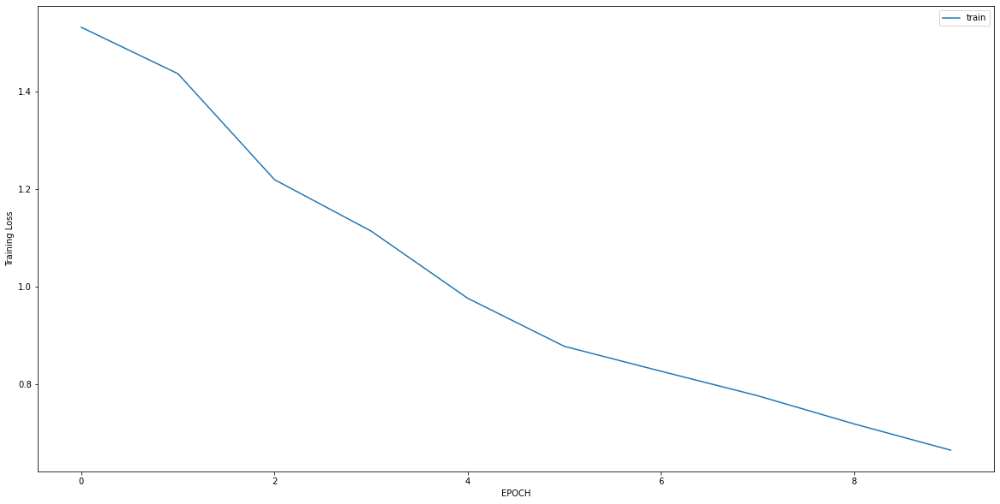

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9300 - accuracy: 0.3945
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8701 - accuracy: 0.4266
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.8564 - accuracy: 0.4587
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8281 - accuracy: 0.5046
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7852 - accuracy: 0.4954
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7732 - accuracy: 0.4862
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7949 - accuracy: 0.4908
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7691 - accuracy: 0.4954
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7818 - accuracy: 0.4725
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.6878 - accuracy: 0.5963


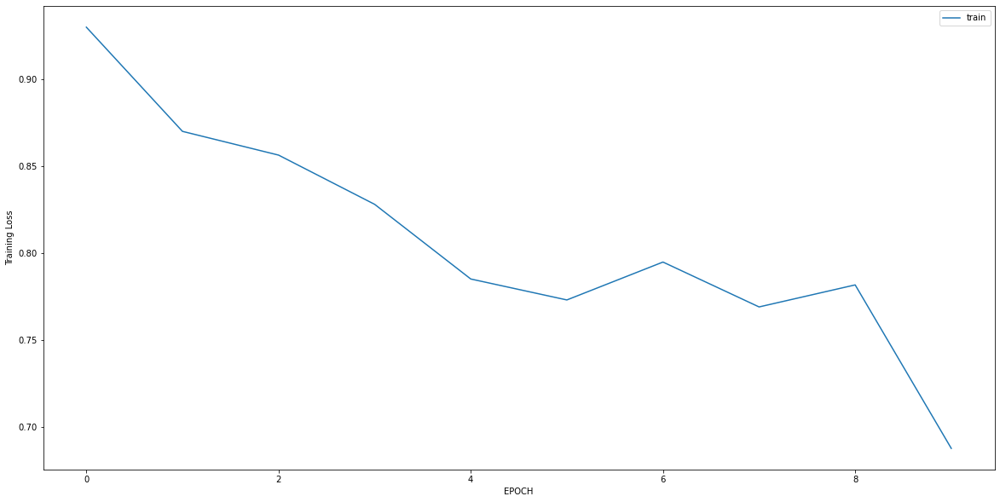

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8832 - accuracy: 0.3985
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7456 - accuracy: 0.5019
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4945 - accuracy: 0.8008
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3485 - accuracy: 0.8927
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2542 - accuracy: 0.9693
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1911 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1489 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1308 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1147 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0966 - accuracy: 1.0000


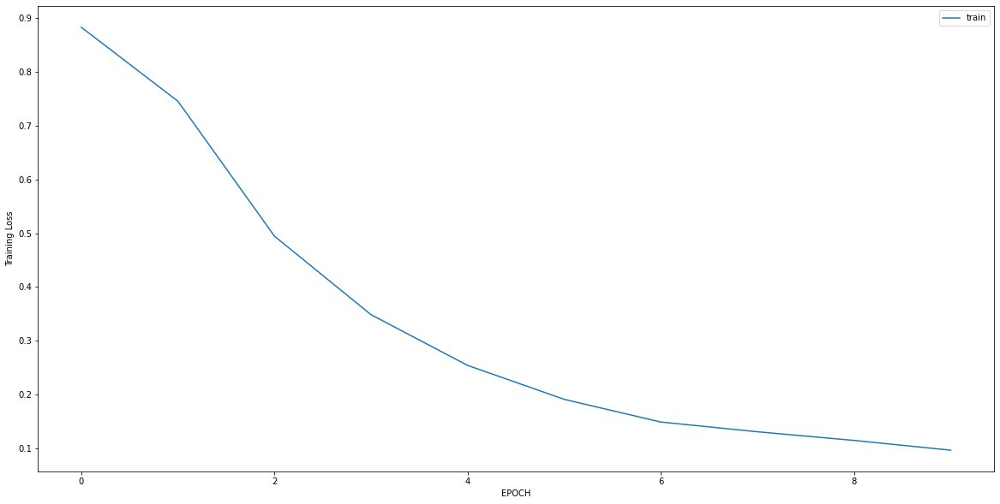

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2624 - accuracy: 0.9966
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1748 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1271 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1020 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0855 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0743 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0651 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0517 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 1.0000


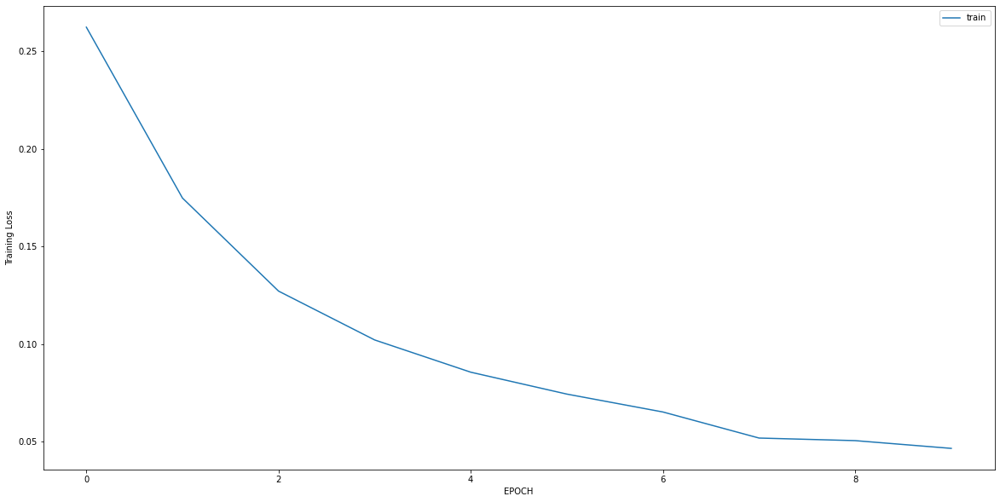

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 2.4738 - accuracy: 0.3309
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 2.2521 - accuracy: 0.3309
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 1.8552 - accuracy: 0.3309
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 1.6687 - accuracy: 0.3309
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 1.4086 - accuracy: 0.3309
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 1.3603 - accuracy: 0.3381
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 1.1440 - accuracy: 0.3669
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9710 - accuracy: 0.4029
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8732 - accuracy: 0.4748
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7506 - accuracy: 0.5755


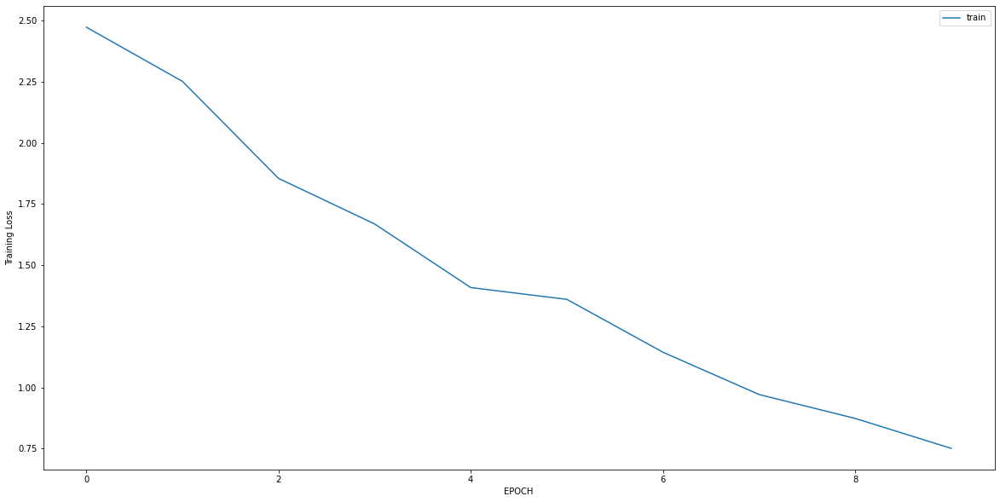

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.8154 - accuracy: 0.4177
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7393 - accuracy: 0.5222
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6793 - accuracy: 0.5854
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6153 - accuracy: 0.6741
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5880 - accuracy: 0.6899
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5234 - accuracy: 0.7342
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4695 - accuracy: 0.8196
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4340 - accuracy: 0.8291
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4286 - accuracy: 0.8354
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4274 - accuracy: 0.8386


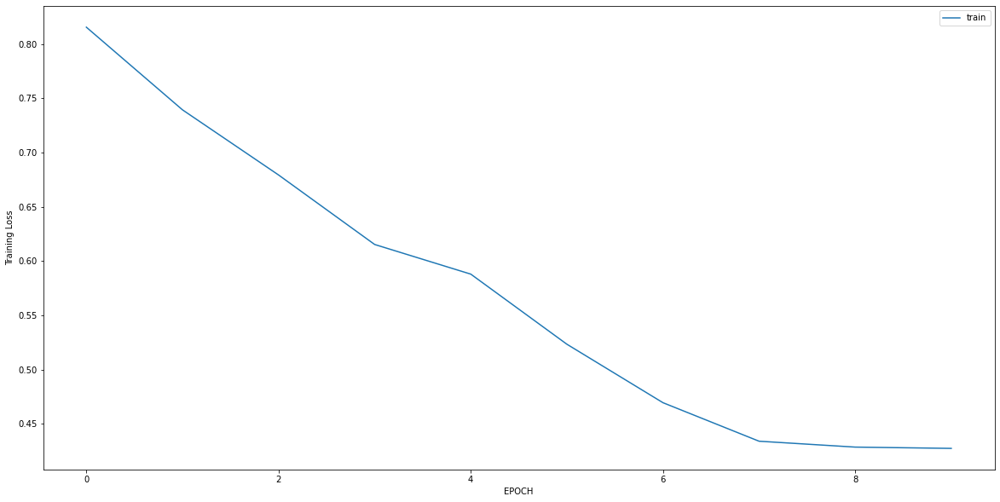

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4992 - accuracy: 0.7862
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4076 - accuracy: 0.8491
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3469 - accuracy: 0.8836
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3106 - accuracy: 0.9057
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2642 - accuracy: 0.9245
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2008 - accuracy: 0.9528
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1810 - accuracy: 0.9748
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1656 - accuracy: 0.9748
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2131 - accuracy: 0.9434
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1512 - accuracy: 0.9717


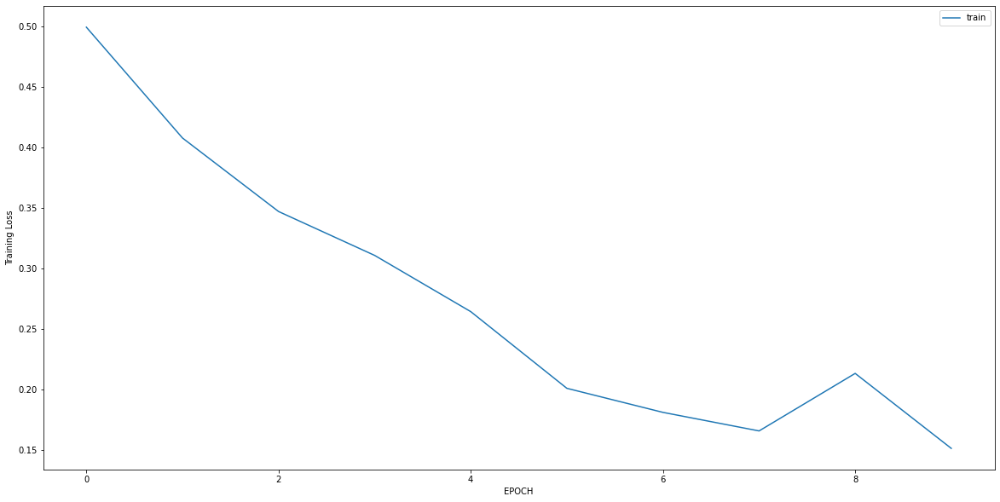

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1034 - accuracy: 0.5524
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8301 - accuracy: 0.5806
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5498 - accuracy: 0.7137
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4257 - accuracy: 0.8065
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4058 - accuracy: 0.8266
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3983 - accuracy: 0.8347
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3297 - accuracy: 0.8952
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3201 - accuracy: 0.8992
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2948 - accuracy: 0.9032
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3273 - accuracy: 0.8790


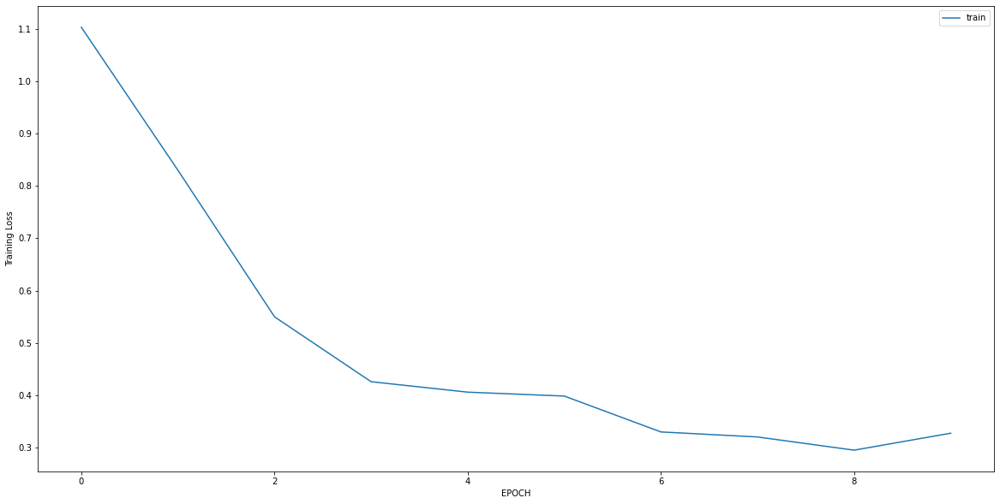

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5320 - accuracy: 0.7962
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4185 - accuracy: 0.8377
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4825 - accuracy: 0.8226
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4408 - accuracy: 0.8340
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3832 - accuracy: 0.8491
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4329 - accuracy: 0.8340
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3816 - accuracy: 0.8679
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3745 - accuracy: 0.8642
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4020 - accuracy: 0.8377
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3848 - accuracy: 0.8528


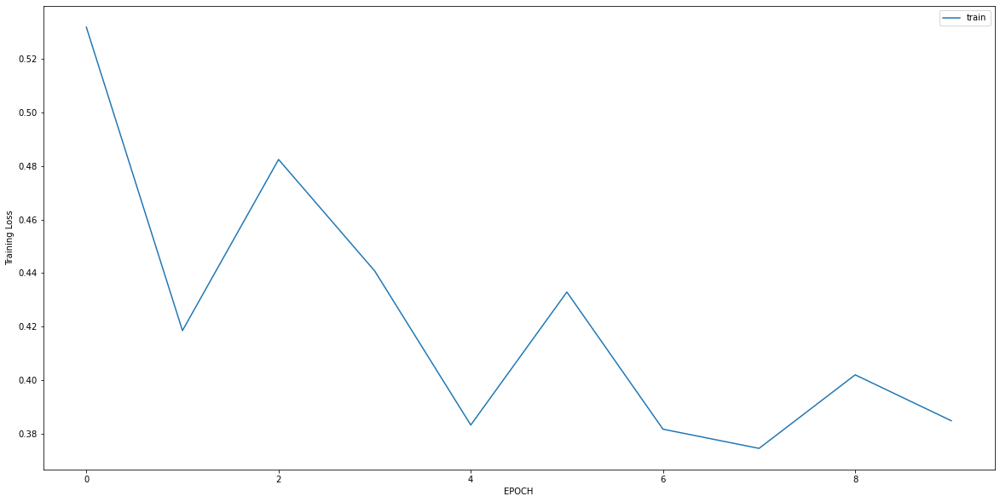

Epoch 1/10
2/2 [==============================] - 0s 7ms/step - loss: 2.4290 - accuracy: 0.0000e+00
Epoch 2/10
2/2 [==============================] - 0s 6ms/step - loss: 2.3492 - accuracy: 0.0000e+00
Epoch 3/10
2/2 [==============================] - 0s 6ms/step - loss: 2.2577 - accuracy: 0.0000e+00
Epoch 4/10
2/2 [==============================] - 0s 7ms/step - loss: 2.2308 - accuracy: 0.0179
Epoch 5/10
2/2 [==============================] - 0s 6ms/step - loss: 2.1212 - accuracy: 0.0000e+00
Epoch 6/10
2/2 [==============================] - 0s 6ms/step - loss: 2.0126 - accuracy: 0.0000e+00
Epoch 7/10
2/2 [==============================] - 0s 7ms/step - loss: 1.8044 - accuracy: 0.0000e+00
Epoch 8/10
2/2 [==============================] - 0s 7ms/step - loss: 1.5668 - accuracy: 0.0714
Epoch 9/10
2/2 [==============================] - 0s 5ms/step - loss: 1.5831 - accuracy: 0.0714
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 1.2638 - accuracy: 0.0357


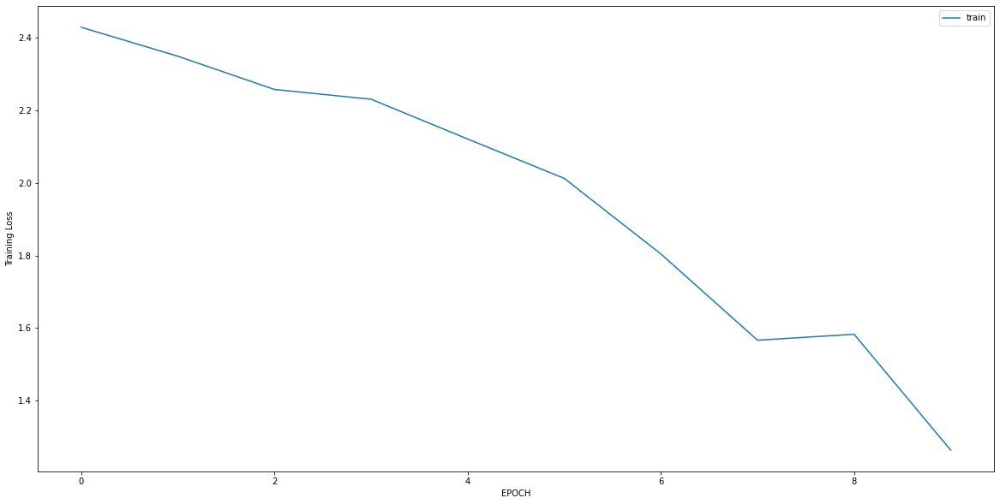

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5467 - accuracy: 0.6780
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1212 - accuracy: 0.9848
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0832 - accuracy: 0.9962
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0577 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0270 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0242 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0174 - accuracy: 1.0000


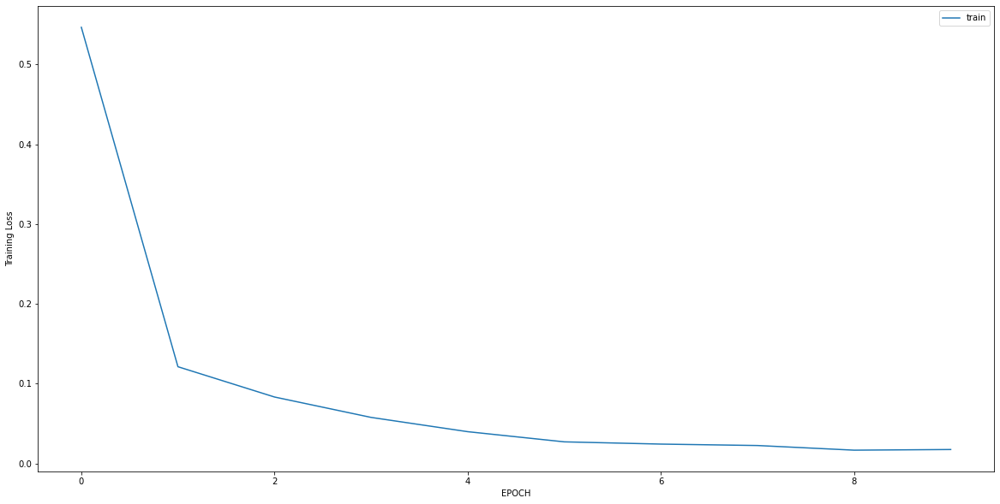

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.0687 - accuracy: 0.5437
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9377 - accuracy: 0.5556
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7360 - accuracy: 0.6151
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5457 - accuracy: 0.7341
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4772 - accuracy: 0.7579
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3920 - accuracy: 0.8056
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3403 - accuracy: 0.8611
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3219 - accuracy: 0.8690
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2420 - accuracy: 0.9246
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2287 - accuracy: 0.9087


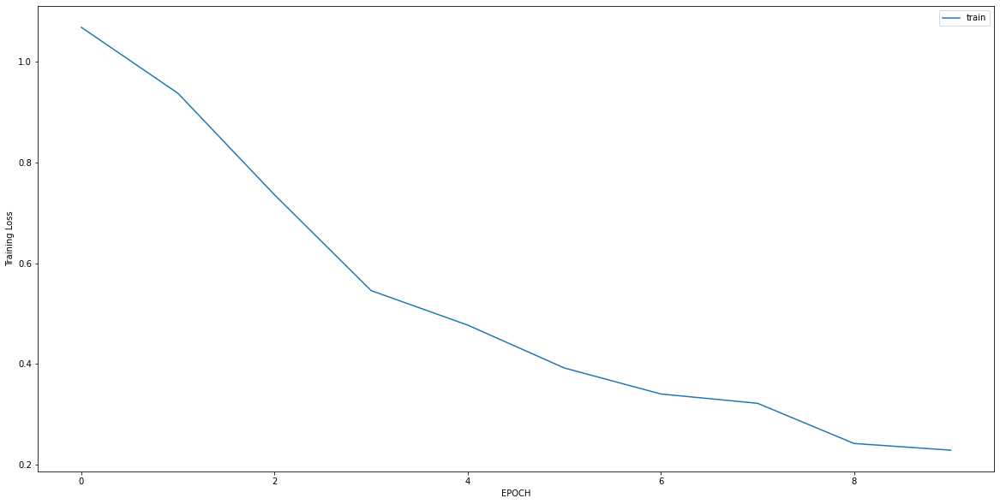

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.3252 - accuracy: 0.1111
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7206 - accuracy: 0.5397
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2341 - accuracy: 0.9563
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1660 - accuracy: 0.9841
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1113 - accuracy: 0.9960
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1038 - accuracy: 0.9960
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0802 - accuracy: 0.9960
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0667 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0527 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0493 - accuracy: 1.0000


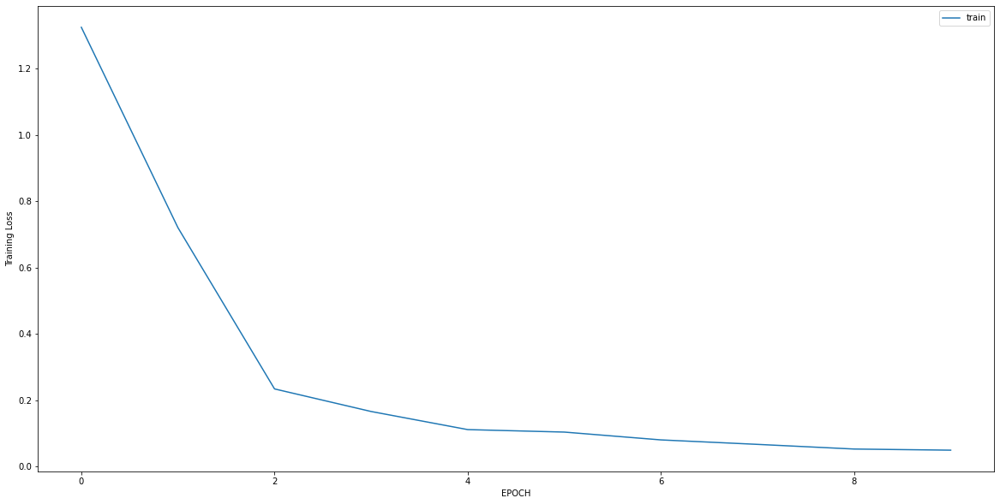

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 1.2616 - accuracy: 0.5232
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9608 - accuracy: 0.5894
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7291 - accuracy: 0.6887
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5800 - accuracy: 0.7649
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5156 - accuracy: 0.7815
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4573 - accuracy: 0.8377
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4420 - accuracy: 0.8079
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4329 - accuracy: 0.8311
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4147 - accuracy: 0.8212
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4273 - accuracy: 0.8377


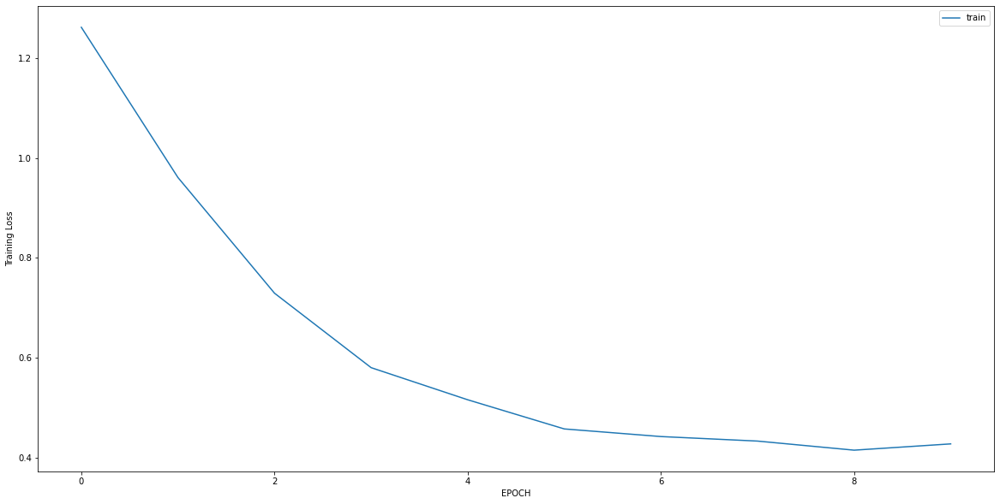

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6875 - accuracy: 0.0268
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.3170 - accuracy: 0.0805
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8852 - accuracy: 0.3257
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4843 - accuracy: 0.8812
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2568 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1943 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1595 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1399 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1288 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1132 - accuracy: 1.0000


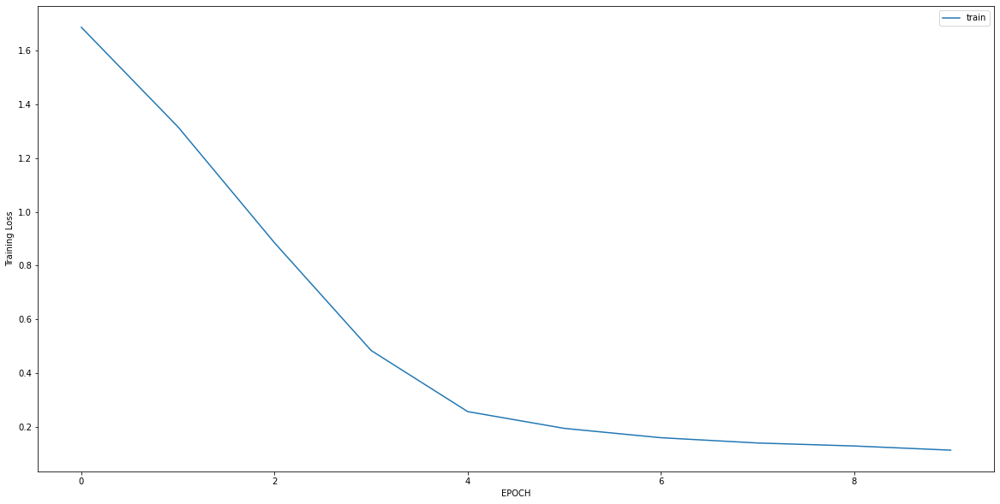

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.1110 - accuracy: 0.4674
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9495 - accuracy: 0.4708
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8097 - accuracy: 0.4708
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6380 - accuracy: 0.5498
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5717 - accuracy: 0.5979
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4619 - accuracy: 0.7629
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4350 - accuracy: 0.8041
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3536 - accuracy: 0.8935
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3477 - accuracy: 0.8866
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3255 - accuracy: 0.9107


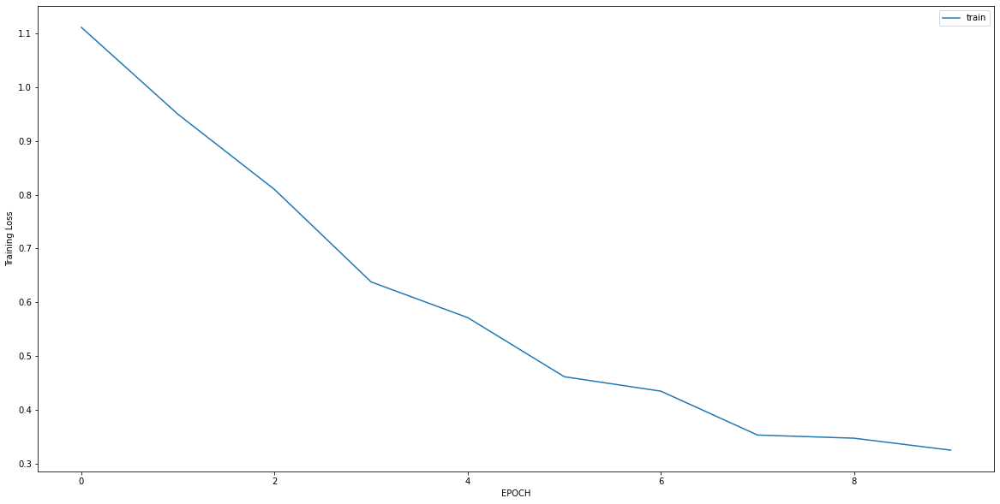

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 1.3924 - accuracy: 0.0592
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.9422 - accuracy: 0.3146
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3612 - accuracy: 0.9159
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1542 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1039 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0743 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0673 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0623 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0494 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0463 - accuracy: 1.0000


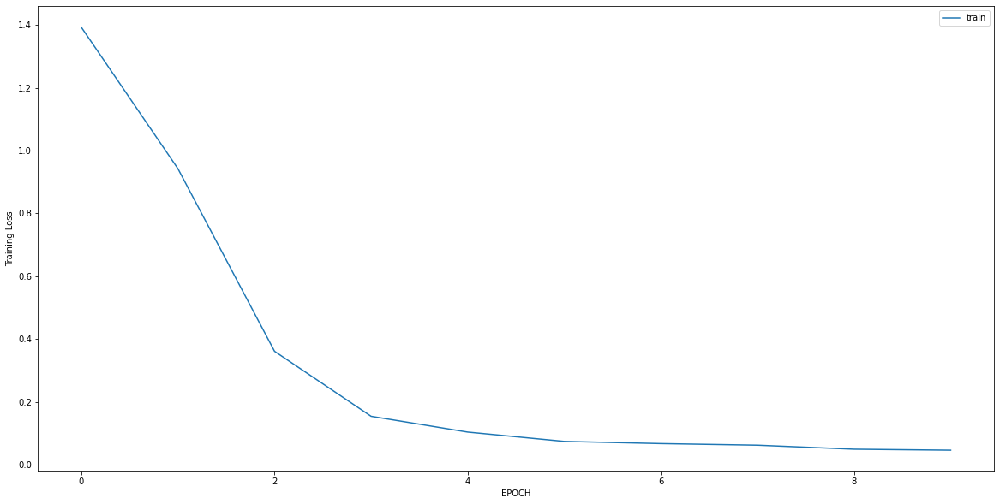

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.8361 - accuracy: 0.4899
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.3731 - accuracy: 0.4899
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 1.0523 - accuracy: 0.4899
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.8246 - accuracy: 0.4899
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7191 - accuracy: 0.5142
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6004 - accuracy: 0.5749
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6058 - accuracy: 0.6032
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5045 - accuracy: 0.6518
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4466 - accuracy: 0.7449
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4320 - accuracy: 0.7895


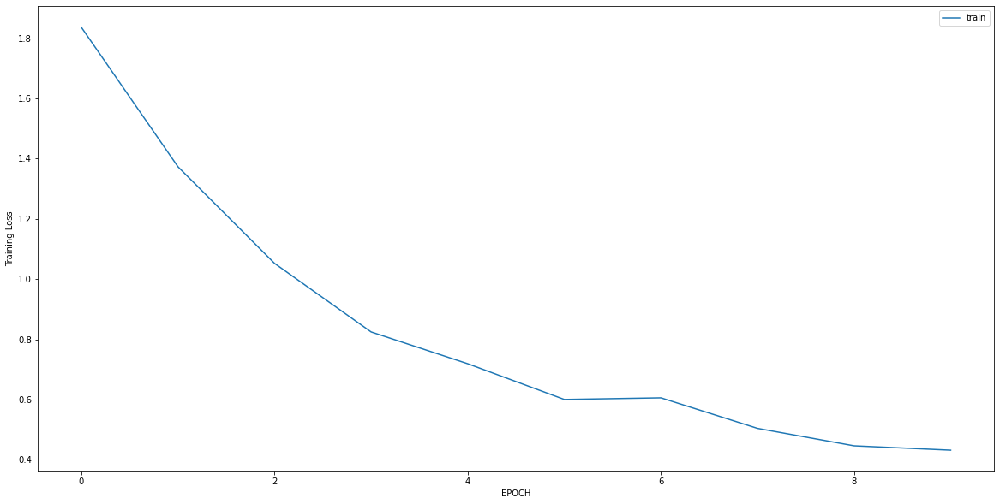

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2019 - accuracy: 0.9079
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0218 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0168 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0129 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0165 - accuracy: 1.0000


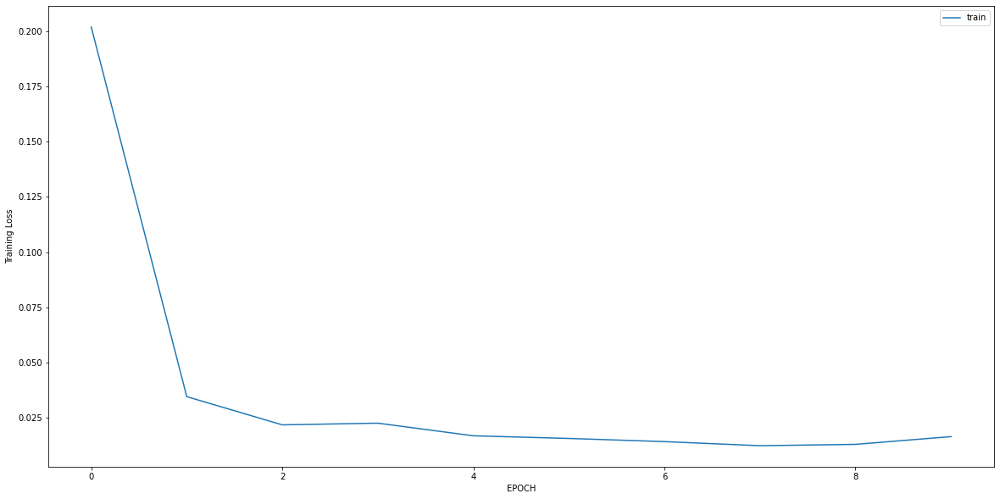

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5008 - accuracy: 0.8118
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3854 - accuracy: 0.8549
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5585 - accuracy: 0.7882
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4664 - accuracy: 0.8510
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3907 - accuracy: 0.8353
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3309 - accuracy: 0.8627
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3052 - accuracy: 0.8902
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3047 - accuracy: 0.9020
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3368 - accuracy: 0.8941
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2984 - accuracy: 0.9137


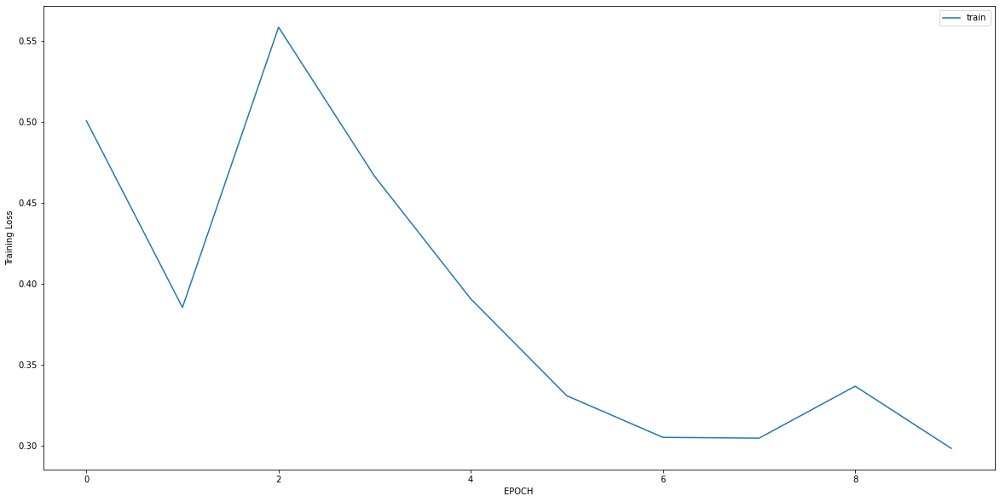

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3667 - accuracy: 0.9075
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2108 - accuracy: 0.9537
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1864 - accuracy: 0.9680
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1699 - accuracy: 0.9786
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1509 - accuracy: 0.9858
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1423 - accuracy: 0.9751
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1422 - accuracy: 0.9822
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1351 - accuracy: 0.9929
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1259 - accuracy: 0.9786
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1257 - accuracy: 0.9822


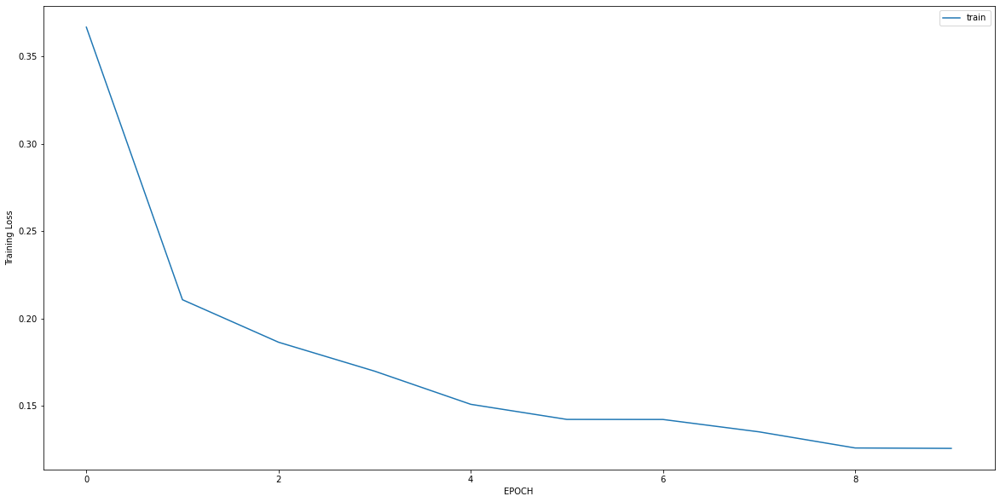

Epoch 1/10
6/6 [==============================] - 0s 6ms/step - loss: 2.3151 - accuracy: 0.0000e+00
Epoch 2/10
6/6 [==============================] - 0s 4ms/step - loss: 2.2993 - accuracy: 0.0000e+00
Epoch 3/10
6/6 [==============================] - 0s 4ms/step - loss: 1.8698 - accuracy: 0.0000e+00
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 1.3735 - accuracy: 0.0167
Epoch 5/10
6/6 [==============================] - 0s 4ms/step - loss: 0.9853 - accuracy: 0.1722
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.6998 - accuracy: 0.5444
Epoch 7/10
6/6 [==============================] - 0s 4ms/step - loss: 0.5296 - accuracy: 0.8611
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.4201 - accuracy: 0.9722
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.3192 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2767 - accuracy: 1.0000


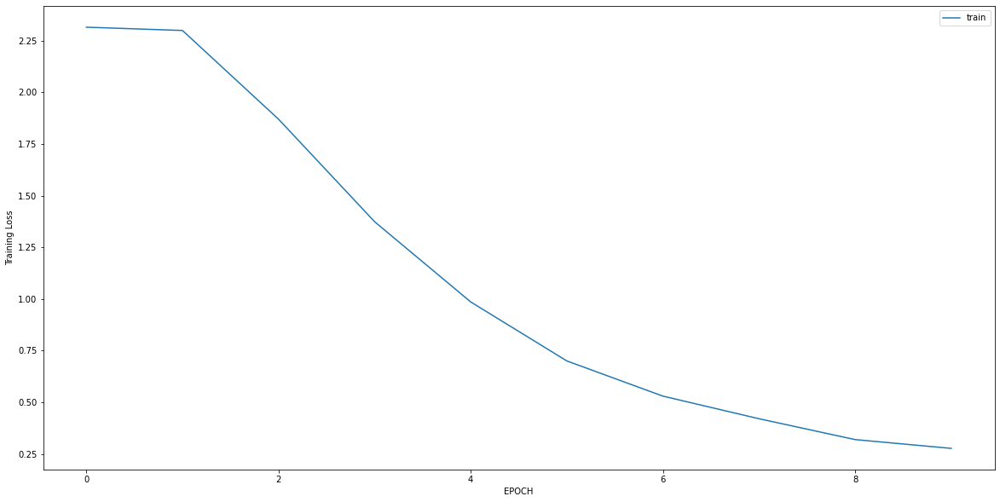

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8909 - accuracy: 0.4772
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8368 - accuracy: 0.4842
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8285 - accuracy: 0.4842
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7583 - accuracy: 0.5123
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7155 - accuracy: 0.5544
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6800 - accuracy: 0.5754
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6408 - accuracy: 0.6526
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6214 - accuracy: 0.6596
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5993 - accuracy: 0.6842
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5701 - accuracy: 0.7333


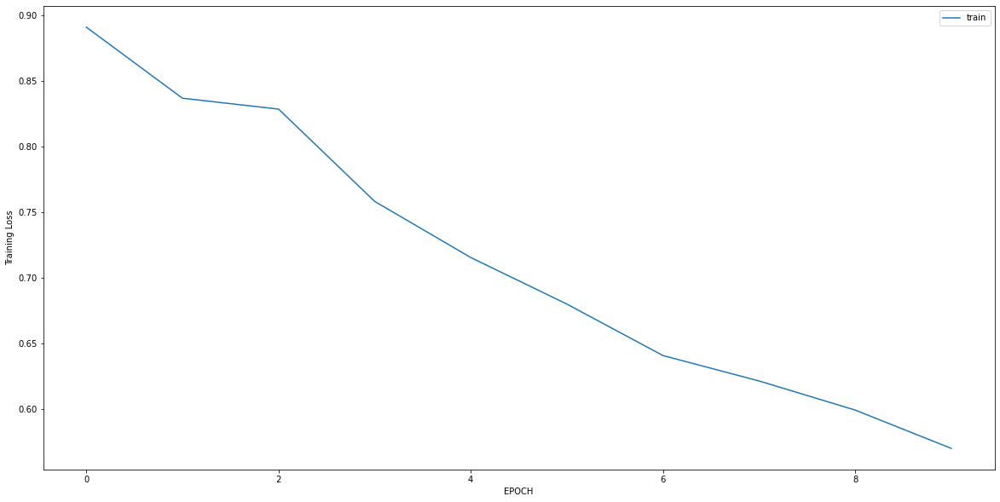

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6100 - accuracy: 0.6716
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5975 - accuracy: 0.7127
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5991 - accuracy: 0.7388
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5804 - accuracy: 0.7463
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5809 - accuracy: 0.7687
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5427 - accuracy: 0.8284
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5368 - accuracy: 0.8097
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5070 - accuracy: 0.8022
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4763 - accuracy: 0.8433
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4640 - accuracy: 0.8396


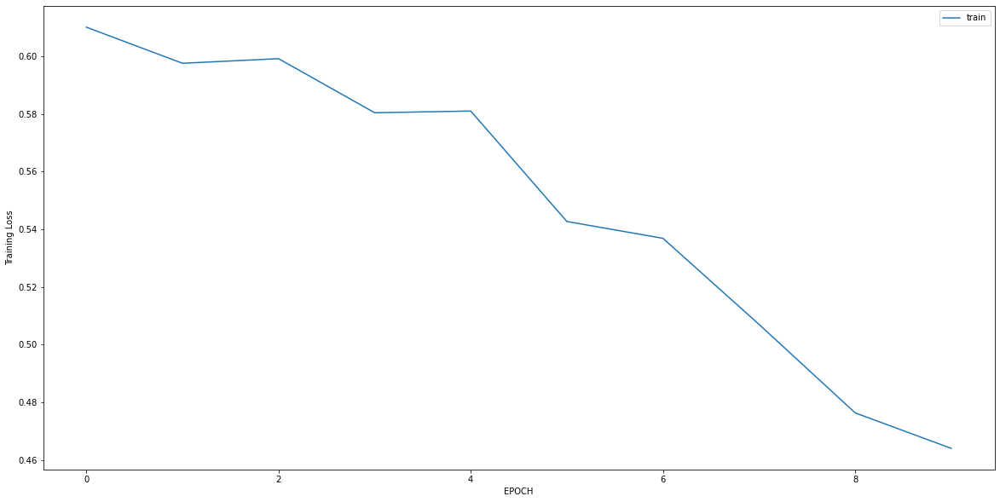

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5247 - accuracy: 0.7631
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5051 - accuracy: 0.7909
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4494 - accuracy: 0.8502
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4087 - accuracy: 0.8258
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3734 - accuracy: 0.8711
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3218 - accuracy: 0.8885
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2554 - accuracy: 0.9024
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2560 - accuracy: 0.9477
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2700 - accuracy: 0.9094
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2507 - accuracy: 0.9268


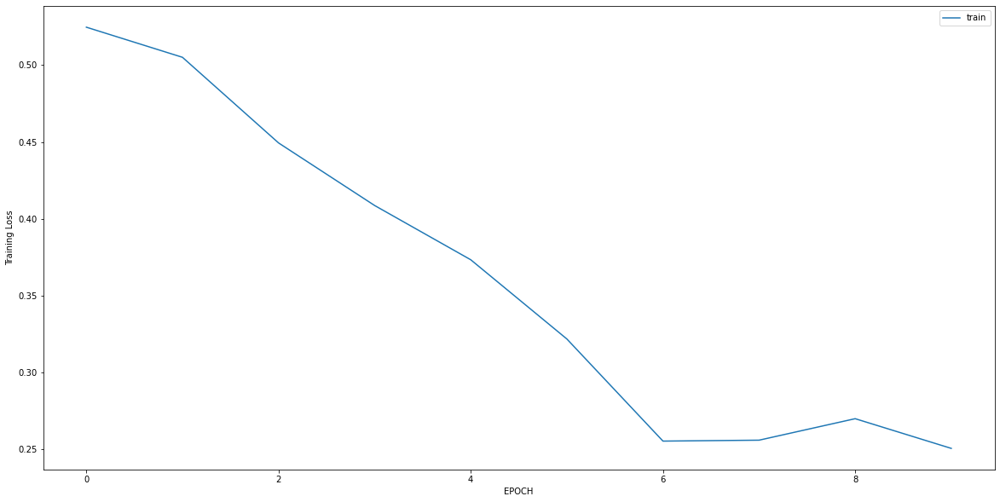

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3024 - accuracy: 0.9154
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2469 - accuracy: 0.9498
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1954 - accuracy: 0.9655
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1813 - accuracy: 0.9749
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1522 - accuracy: 0.9781
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1469 - accuracy: 0.9843
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1202 - accuracy: 0.9875
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1124 - accuracy: 0.9969
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1105 - accuracy: 0.9937
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1112 - accuracy: 0.9937


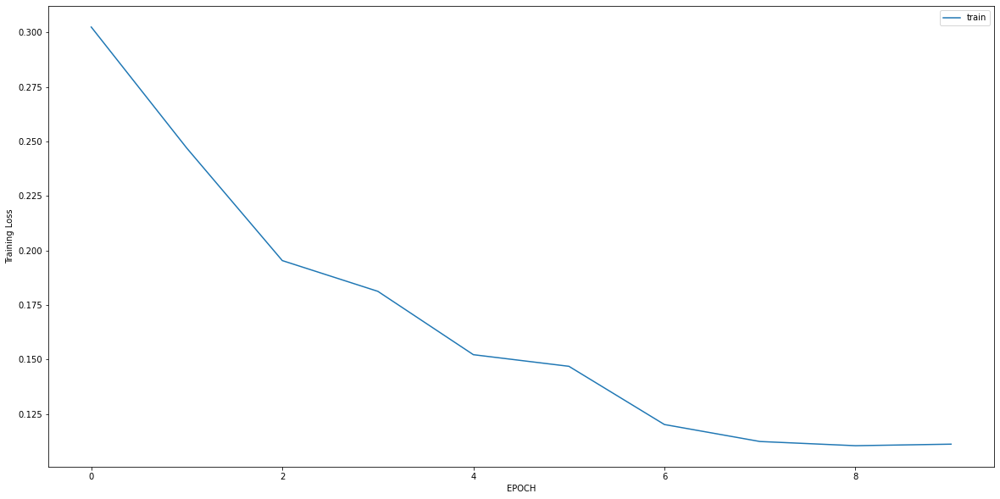

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4827 - accuracy: 0.8876
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3351 - accuracy: 0.9026
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2756 - accuracy: 0.9139
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3052 - accuracy: 0.9101
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2916 - accuracy: 0.9176
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2728 - accuracy: 0.9176
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2727 - accuracy: 0.9288
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2537 - accuracy: 0.9251
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2527 - accuracy: 0.9176
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2712 - accuracy: 0.9213


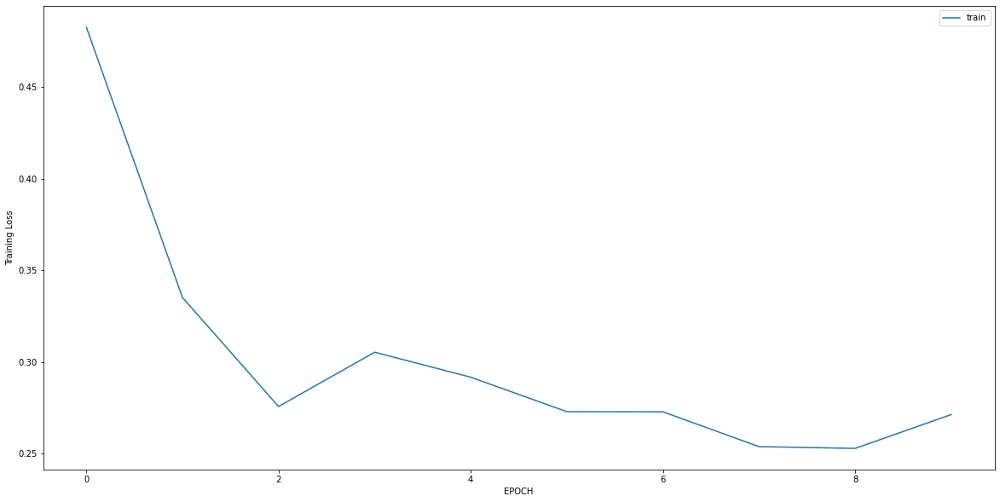

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.7541 - accuracy: 0.8561
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2953 - accuracy: 0.8910
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1507 - accuracy: 0.9582
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1040 - accuracy: 0.9745
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0932 - accuracy: 0.9838
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0890 - accuracy: 0.9745
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1342 - accuracy: 0.9675
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2406 - accuracy: 0.9118
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1619 - accuracy: 0.9490
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1153 - accuracy: 0.9629


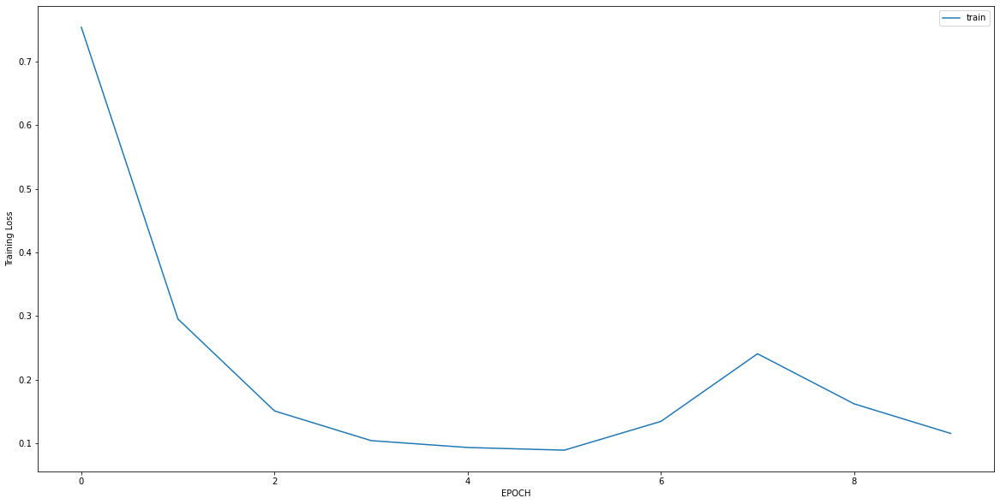

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.9671 - accuracy: 0.4206
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 1.7493 - accuracy: 0.4206
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.2735 - accuracy: 0.4206
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.9139 - accuracy: 0.4643
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7015 - accuracy: 0.5000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5977 - accuracy: 0.6667
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5903 - accuracy: 0.6746
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5779 - accuracy: 0.7262
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5654 - accuracy: 0.7143
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5216 - accuracy: 0.7738


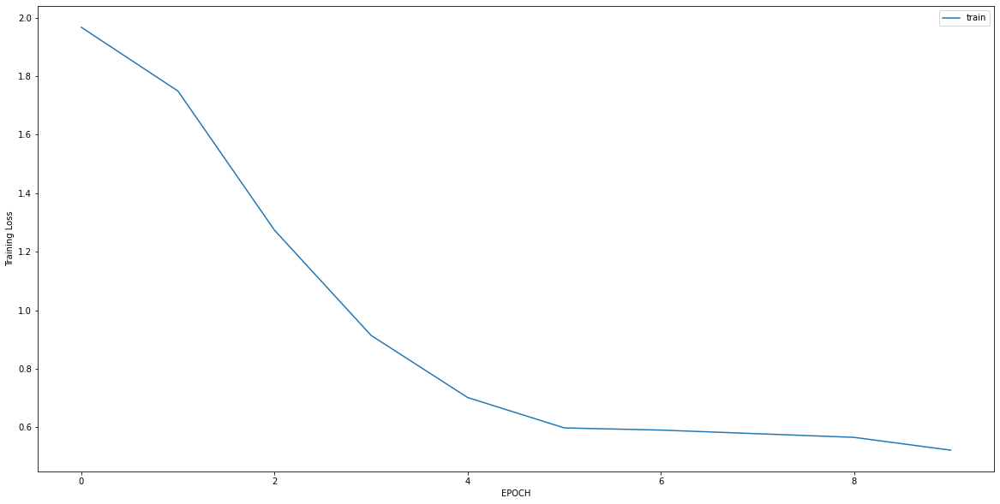

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6054 - accuracy: 0.7319
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5498 - accuracy: 0.7536
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5329 - accuracy: 0.7681
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5412 - accuracy: 0.7536
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5023 - accuracy: 0.8188
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4957 - accuracy: 0.8188
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4718 - accuracy: 0.8551
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4795 - accuracy: 0.8261
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4343 - accuracy: 0.9058
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4611 - accuracy: 0.8551


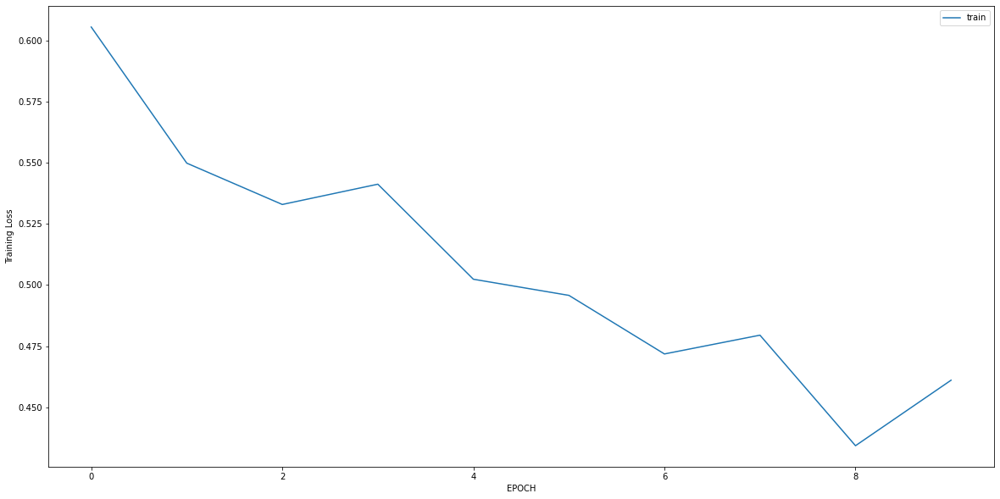

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 1.1993 - accuracy: 0.2387
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1123 - accuracy: 0.9789
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0271 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0188 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0139 - accuracy: 1.0000


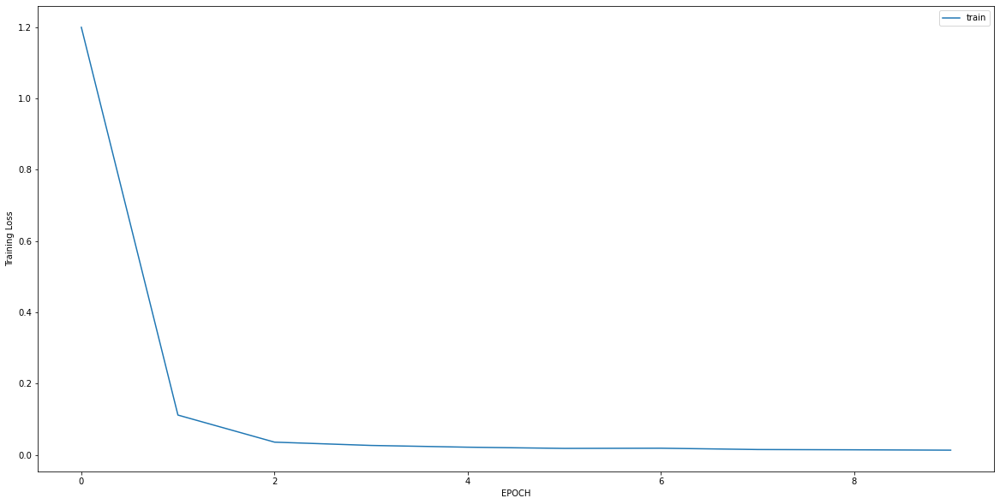

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0076 - accuracy: 0.6441
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6703 - accuracy: 0.7288
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4045 - accuracy: 0.8517
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3962 - accuracy: 0.8432
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3420 - accuracy: 0.9110
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3146 - accuracy: 0.9110
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3053 - accuracy: 0.9280
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2623 - accuracy: 0.9364
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2599 - accuracy: 0.9449
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2248 - accuracy: 0.9492


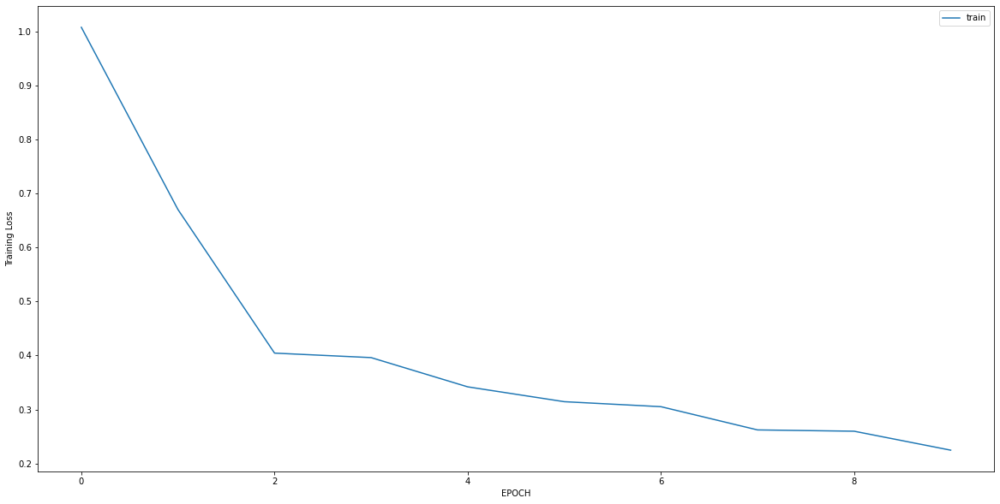

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3825 - accuracy: 0.8897
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2734 - accuracy: 0.9379
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2471 - accuracy: 0.9310
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2105 - accuracy: 0.9655
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1974 - accuracy: 0.9552
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2021 - accuracy: 0.9414
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1700 - accuracy: 0.9414
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1715 - accuracy: 0.9517
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1510 - accuracy: 0.9621
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1275 - accuracy: 0.9724


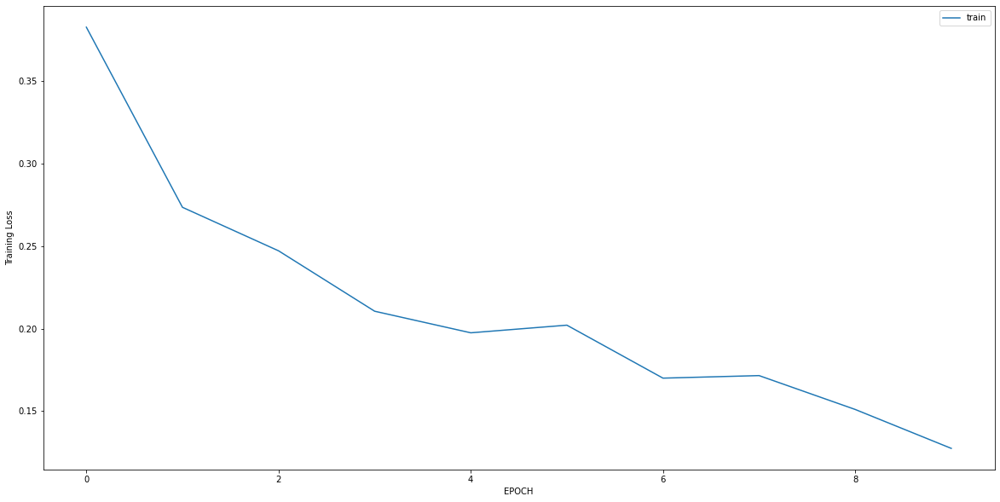

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0837 - accuracy: 0.9959
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0435 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0248 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0204 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0207 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0178 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0171 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0147 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0163 - accuracy: 1.0000


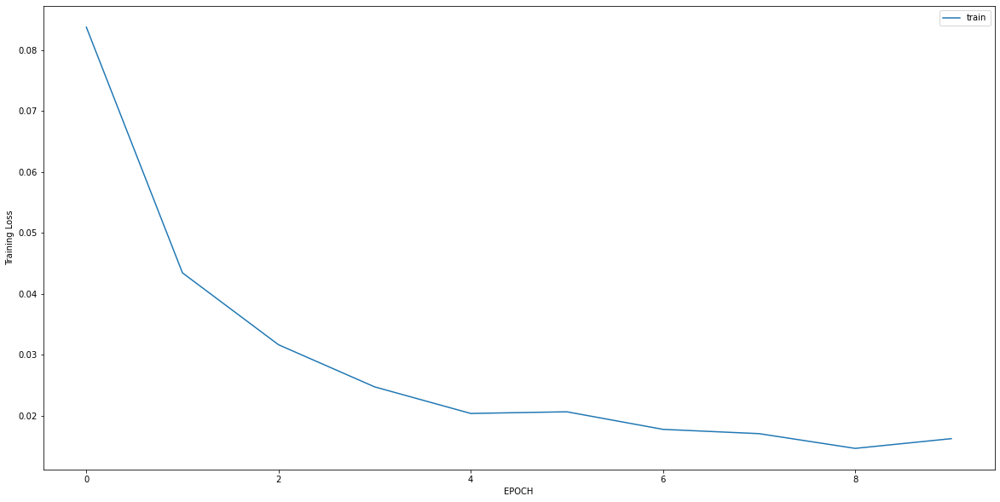

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 0.6522 - accuracy: 0.8396
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4650 - accuracy: 0.8538
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2515 - accuracy: 0.9151
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3425 - accuracy: 0.8443
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2223 - accuracy: 0.9198
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2213 - accuracy: 0.9057
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2060 - accuracy: 0.9292
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2113 - accuracy: 0.9292
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2484 - accuracy: 0.9009
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2351 - accuracy: 0.9009


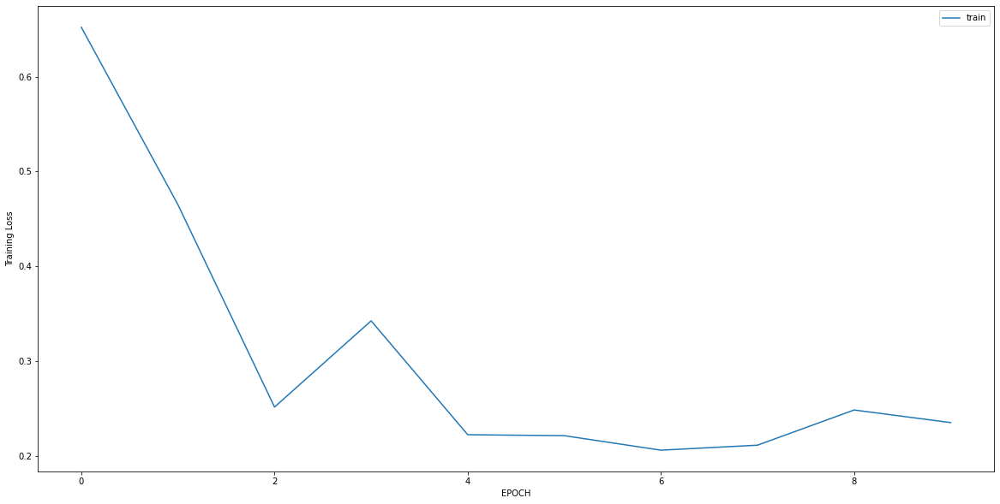

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4072 - accuracy: 0.8876
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2961 - accuracy: 0.9078
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2144 - accuracy: 0.9395
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1562 - accuracy: 0.9539
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1147 - accuracy: 0.9625
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0980 - accuracy: 0.9827
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0847 - accuracy: 0.9856
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0569 - accuracy: 0.9942
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0505 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0522 - accuracy: 0.9971


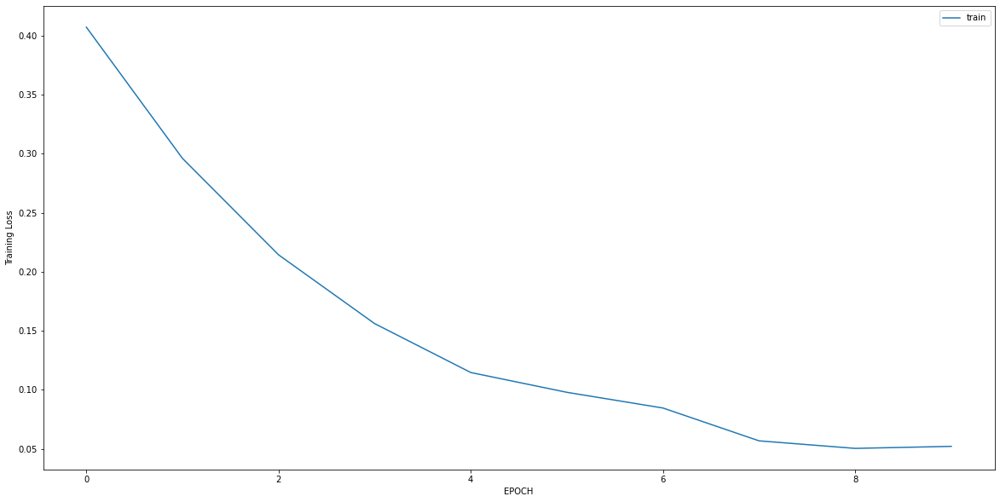

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.9687 - accuracy: 0.7153
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0543 - accuracy: 0.7153
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9154 - accuracy: 0.7153
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8906 - accuracy: 0.7153
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8335 - accuracy: 0.7153
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6205 - accuracy: 0.7153
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5897 - accuracy: 0.6944
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5449 - accuracy: 0.7153
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5282 - accuracy: 0.7222
Epoch 10/10
5/5 [==============================] - 0s 8ms/step - loss: 0.4746 - accuracy: 0.7431


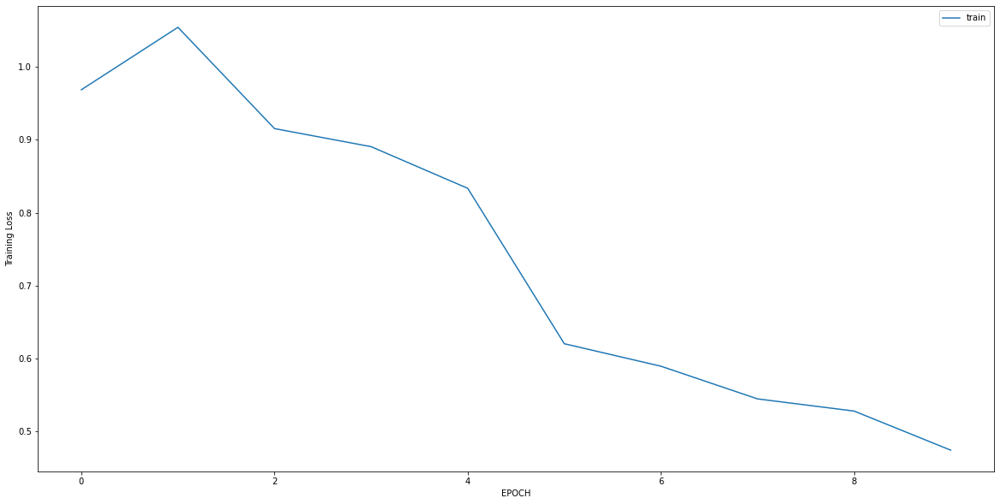

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5286 - accuracy: 0.3897
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1218 - accuracy: 0.4118
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8705 - accuracy: 0.4596
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6950 - accuracy: 0.5772
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6113 - accuracy: 0.6654
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5539 - accuracy: 0.7390
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5167 - accuracy: 0.7757
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4564 - accuracy: 0.8346
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4129 - accuracy: 0.8897
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3938 - accuracy: 0.8860


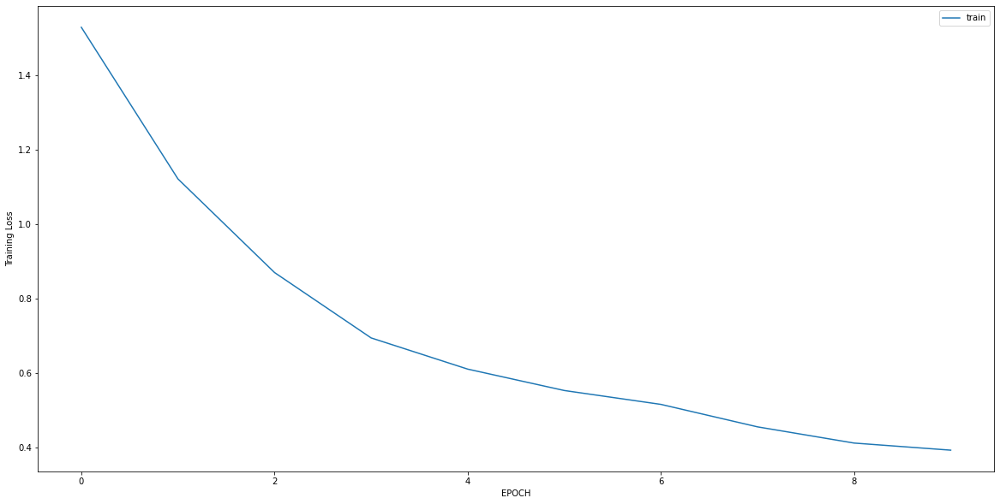

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0268 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0106 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0095 - accuracy: 1.0000


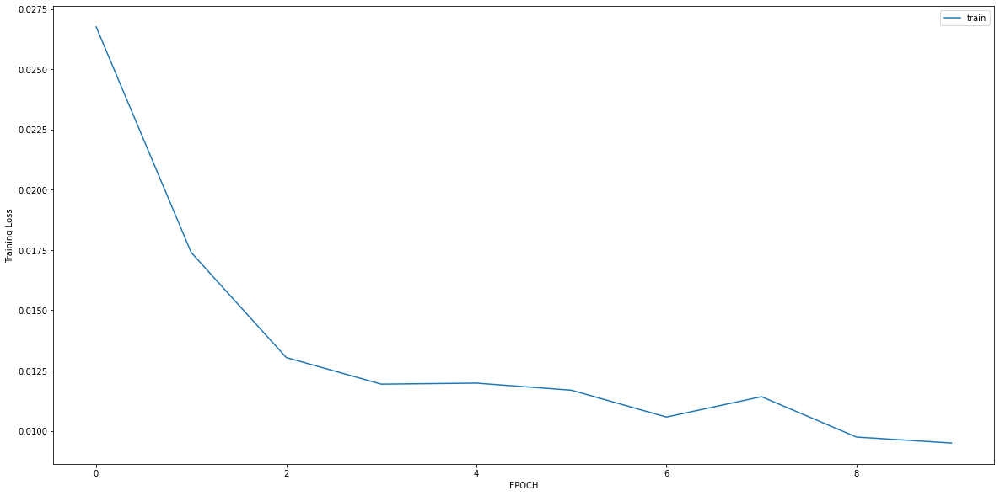

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.4321 - accuracy: 0.8509
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3467 - accuracy: 0.9006
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3018 - accuracy: 0.9064
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2723 - accuracy: 0.9064
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2234 - accuracy: 0.9327
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1947 - accuracy: 0.9474
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2696 - accuracy: 0.9152
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2629 - accuracy: 0.8947
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1903 - accuracy: 0.9503
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2092 - accuracy: 0.9298


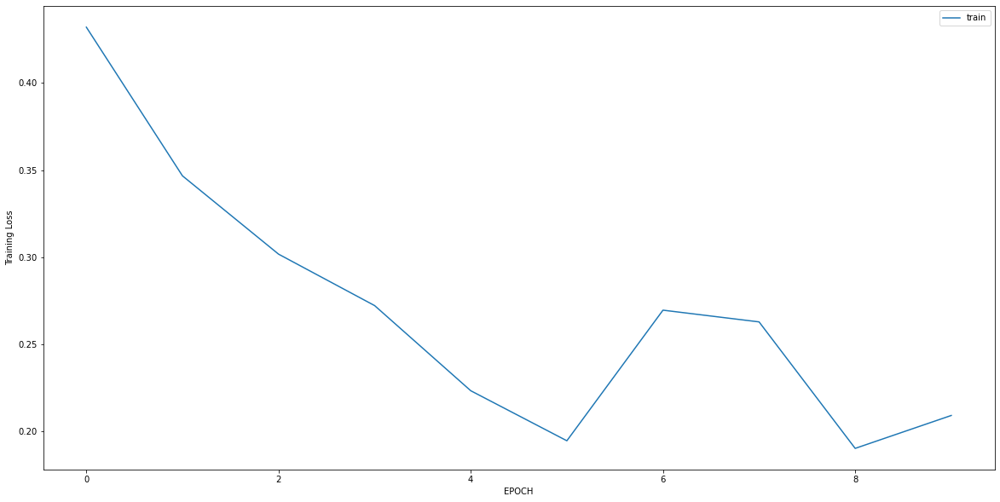

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5867 - accuracy: 0.8692
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3335 - accuracy: 0.8987
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1741 - accuracy: 0.9494
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1223 - accuracy: 0.9662
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1030 - accuracy: 0.9873
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0928 - accuracy: 0.9831
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0983 - accuracy: 0.9789
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0817 - accuracy: 0.9873
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0694 - accuracy: 0.9958
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0654 - accuracy: 1.0000


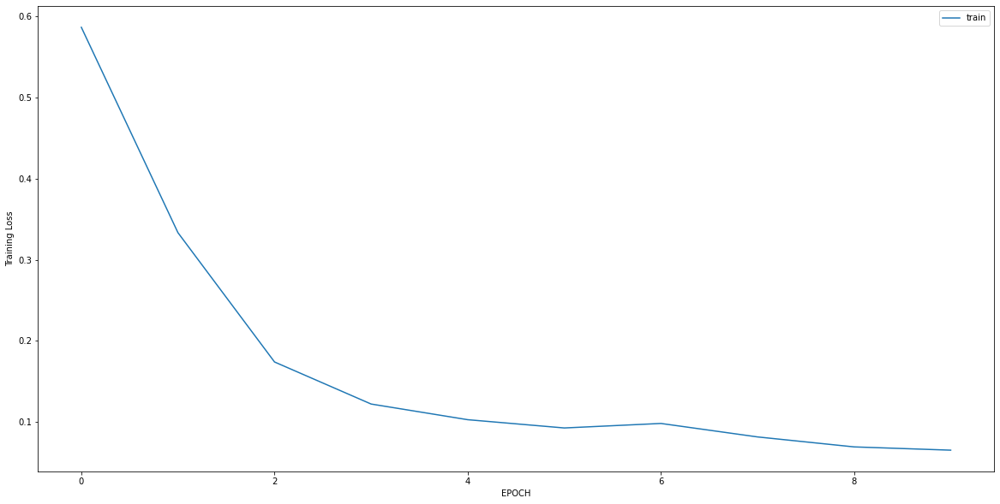

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4230 - accuracy: 0.8943
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2314 - accuracy: 0.9275
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1775 - accuracy: 0.9517
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1738 - accuracy: 0.9456
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1936 - accuracy: 0.9547
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1826 - accuracy: 0.9396
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1752 - accuracy: 0.9305
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1803 - accuracy: 0.9396
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1506 - accuracy: 0.9486
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1295 - accuracy: 0.9607


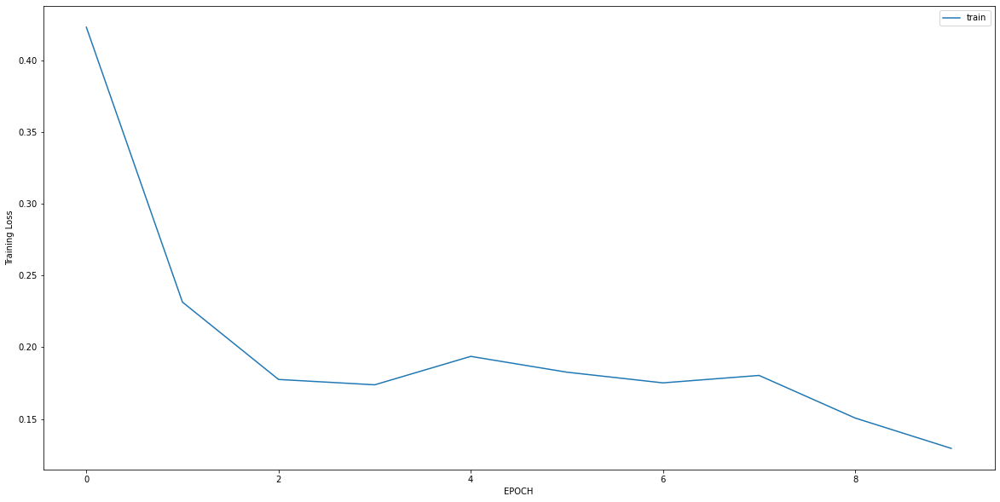

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8855 - accuracy: 0.5741
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5420 - accuracy: 0.6889
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4993 - accuracy: 0.7667
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4270 - accuracy: 0.7852
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4490 - accuracy: 0.8148
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4125 - accuracy: 0.8296
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4172 - accuracy: 0.8296
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3519 - accuracy: 0.8556
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3589 - accuracy: 0.8556
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3453 - accuracy: 0.8815


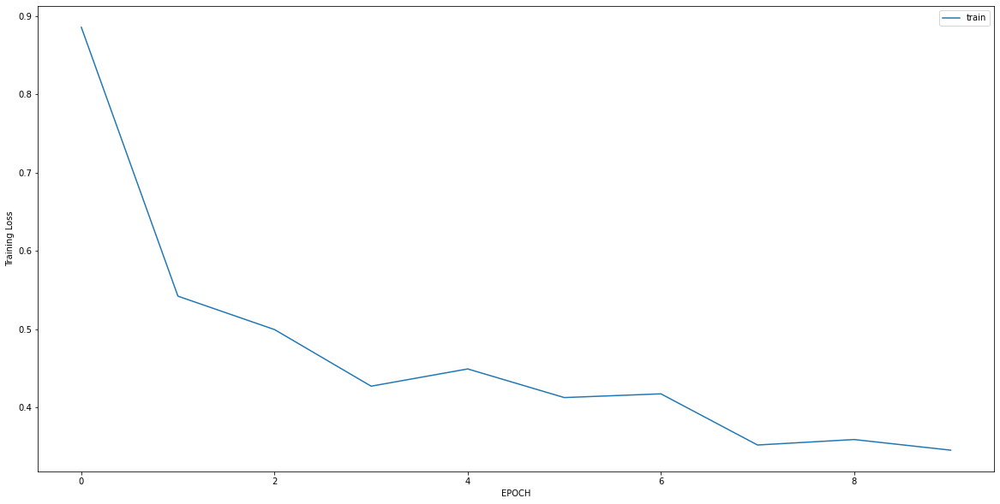

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 3.1580 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 2.2370 - accuracy: 0.0036
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.3689 - accuracy: 0.0964
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7139 - accuracy: 0.5429
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3897 - accuracy: 0.9679
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2522 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1857 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1548 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1251 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1097 - accuracy: 1.0000


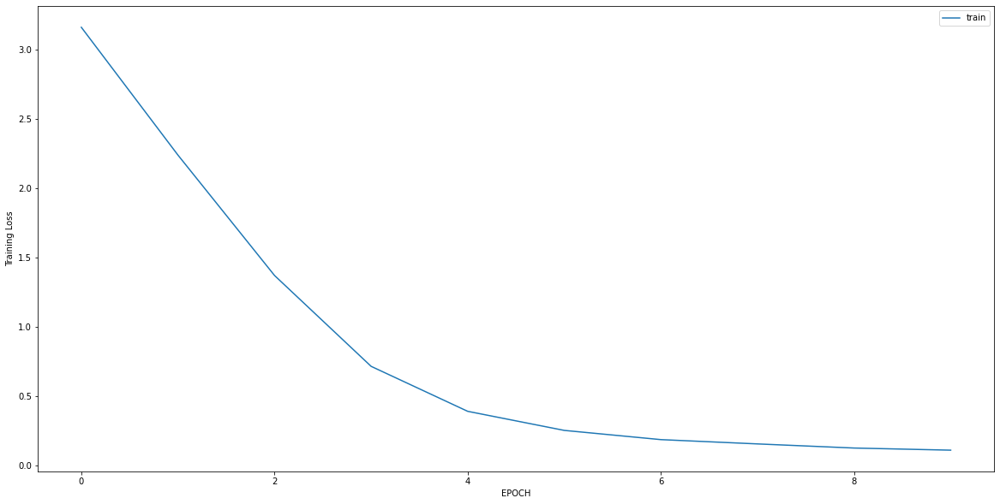

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.2417 - accuracy: 0.4941
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1743 - accuracy: 0.4980
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0879 - accuracy: 0.5020
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9848 - accuracy: 0.4901
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.9068 - accuracy: 0.4822
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8152 - accuracy: 0.5020
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7618 - accuracy: 0.4980
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7016 - accuracy: 0.5375
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6623 - accuracy: 0.5771
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5591 - accuracy: 0.6561


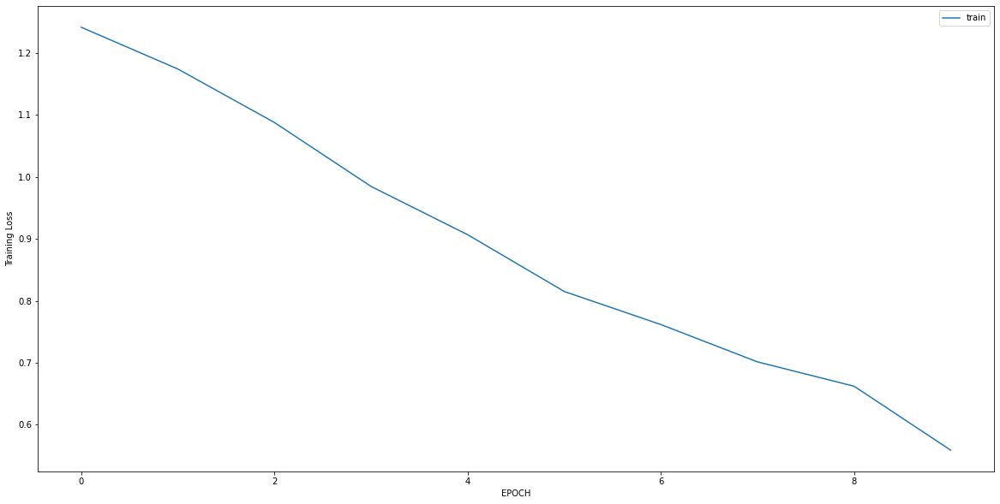

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6586 - accuracy: 0.6160
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6208 - accuracy: 0.6582
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5716 - accuracy: 0.7595
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5277 - accuracy: 0.7932
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5154 - accuracy: 0.7806
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5014 - accuracy: 0.8270
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5146 - accuracy: 0.7932
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4806 - accuracy: 0.8143
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4618 - accuracy: 0.8059
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4360 - accuracy: 0.8228


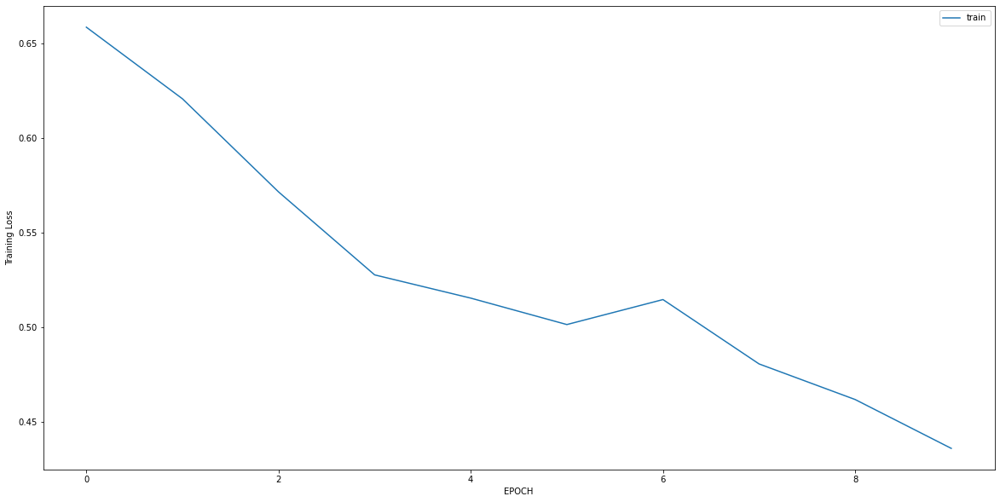

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4687 - accuracy: 0.7905
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4140 - accuracy: 0.8458
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4212 - accuracy: 0.8538
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3580 - accuracy: 0.8972
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3441 - accuracy: 0.8893
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3327 - accuracy: 0.9012
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3268 - accuracy: 0.8854
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3060 - accuracy: 0.9012
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3106 - accuracy: 0.9091
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2855 - accuracy: 0.9170


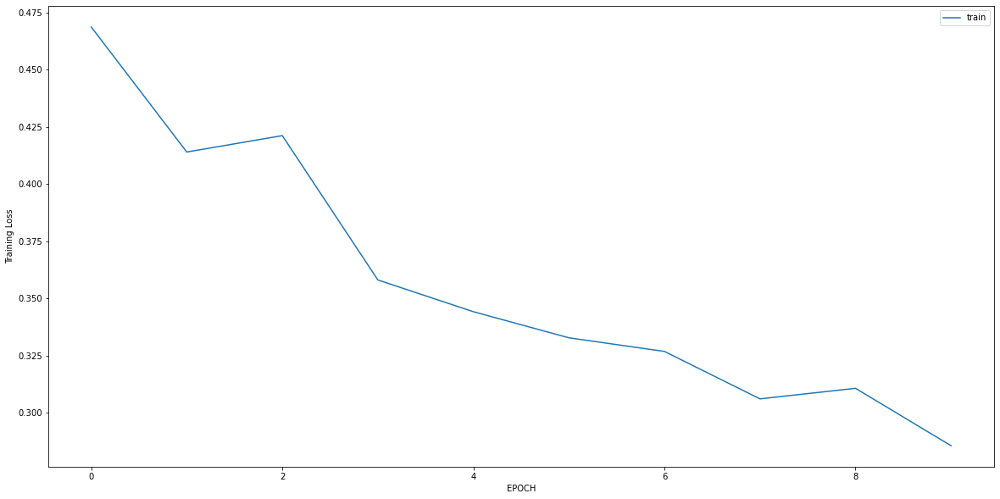

Epoch 1/10
10/10 [==============================] - 0s 7ms/step - loss: 0.5856 - accuracy: 0.6599
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4139 - accuracy: 0.8485
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4011 - accuracy: 0.8485
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3014 - accuracy: 0.9091
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2395 - accuracy: 0.9360
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2377 - accuracy: 0.9394
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2315 - accuracy: 0.9428
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2635 - accuracy: 0.9226
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2345 - accuracy: 0.9293
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2249 - accuracy: 0.9327


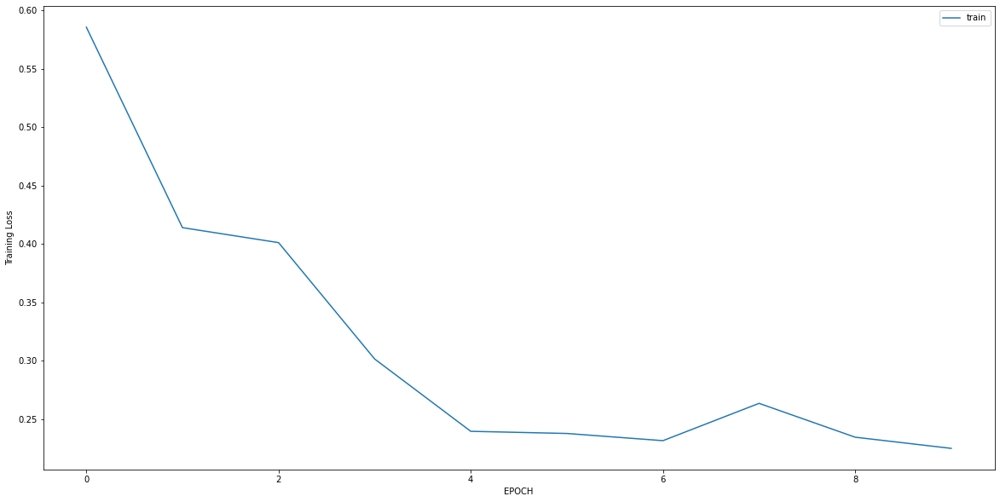

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7424 - accuracy: 0.7117
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3719 - accuracy: 0.8648
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2785 - accuracy: 0.9004
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2264 - accuracy: 0.9324
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2113 - accuracy: 0.9573
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1795 - accuracy: 0.9609
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1972 - accuracy: 0.9609
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1701 - accuracy: 0.9644
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1384 - accuracy: 0.9858
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1397 - accuracy: 0.9751


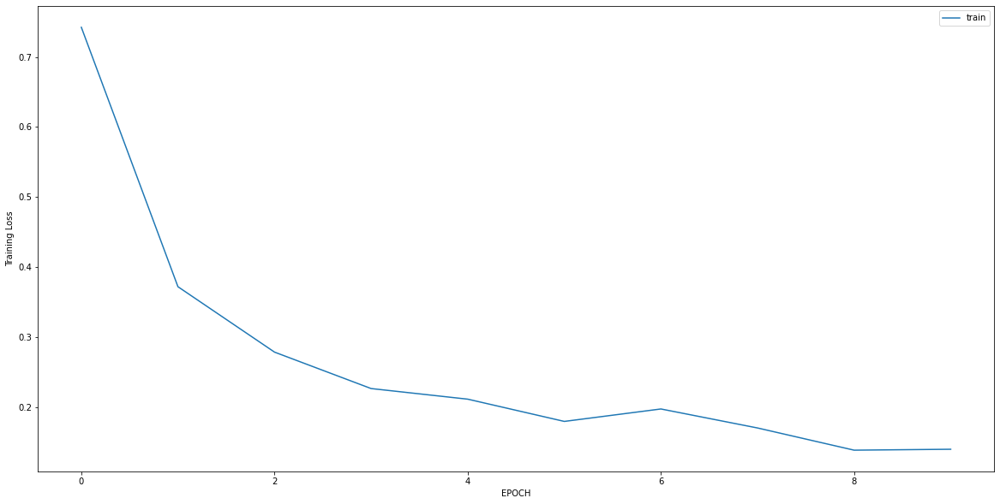

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.8732 - accuracy: 0.7336
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4899 - accuracy: 0.8361
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2867 - accuracy: 0.8607
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2322 - accuracy: 0.8893
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2406 - accuracy: 0.9221
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2158 - accuracy: 0.9262
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2154 - accuracy: 0.9098
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1828 - accuracy: 0.9549
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1751 - accuracy: 0.9508
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1497 - accuracy: 0.9713


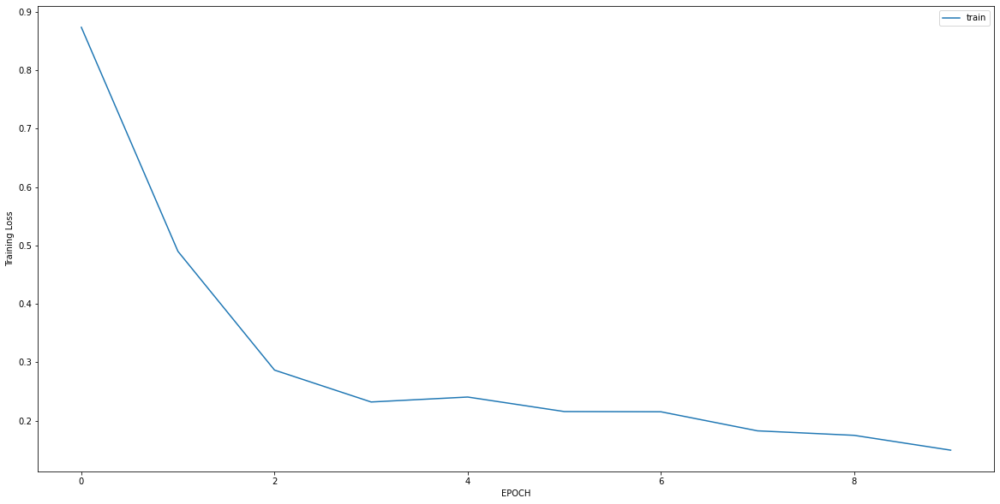

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0978 - accuracy: 0.5105
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1042 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0638 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0637 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0446 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0325 - accuracy: 1.0000


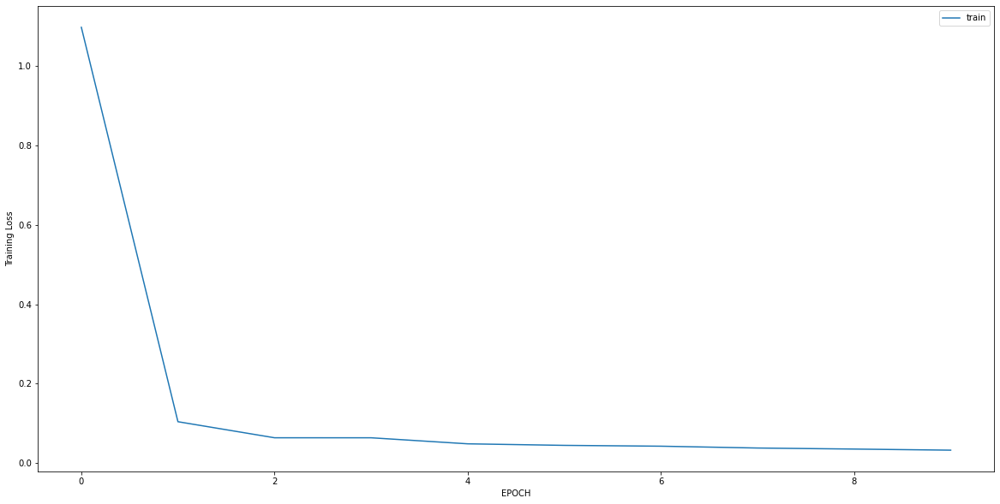

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 3.2308 - accuracy: 0.1633
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 2.9819 - accuracy: 0.1633
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 2.4481 - accuracy: 0.1633
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 2.2987 - accuracy: 0.1633
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 1.8082 - accuracy: 0.1633
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 1.7398 - accuracy: 0.1633
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 1.3536 - accuracy: 0.1735
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 1.1784 - accuracy: 0.1939
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 1.0737 - accuracy: 0.2143
Epoch 10/10
4/4 [==============================] - 0s 6ms/step - loss: 0.9307 - accuracy: 0.3265


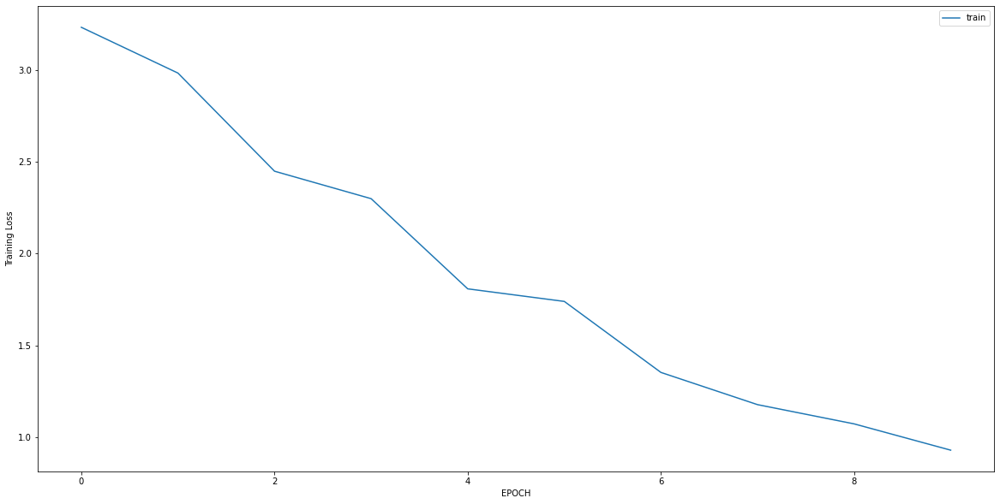

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2798 - accuracy: 0.8893
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2591 - accuracy: 0.9091
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2387 - accuracy: 0.9209
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2192 - accuracy: 0.9051
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2157 - accuracy: 0.9249
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2260 - accuracy: 0.9012
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2140 - accuracy: 0.9170
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2122 - accuracy: 0.8972
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2146 - accuracy: 0.9209
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2527 - accuracy: 0.9091


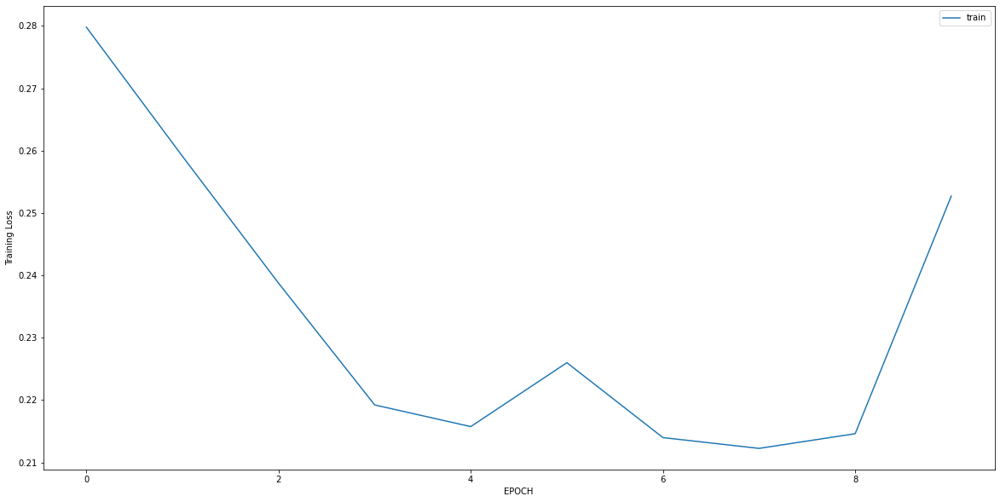

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4946 - accuracy: 0.7763
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2852 - accuracy: 0.9145
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1130 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0565 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0307 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0252 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0207 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0203 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0146 - accuracy: 1.0000


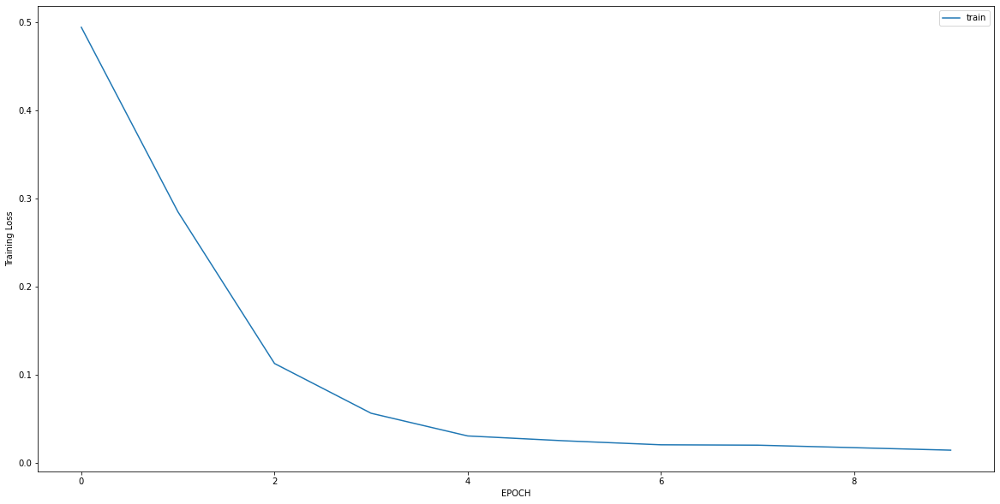

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 2.6642 - accuracy: 0.0053
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 1.2761 - accuracy: 0.1230
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.4963 - accuracy: 0.8524
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.2168 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1105 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0843 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0720 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0626 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0588 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0516 - accuracy: 1.0000


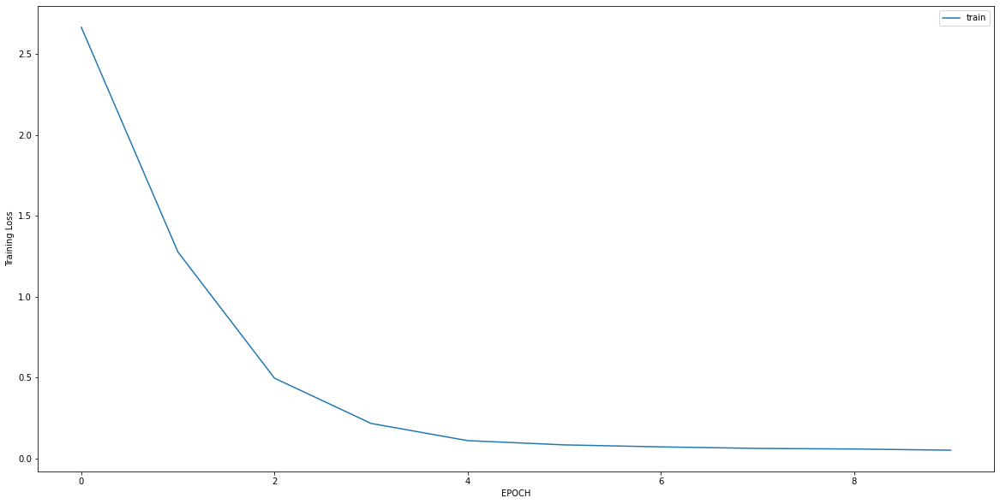

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 2.1486 - accuracy: 0.2296
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.8232 - accuracy: 0.2296
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 1.3939 - accuracy: 0.2296
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 1.0656 - accuracy: 0.2387
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.8142 - accuracy: 0.3897
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.7210 - accuracy: 0.4985
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5869 - accuracy: 0.6647
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4976 - accuracy: 0.7190
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4415 - accuracy: 0.7825
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3929 - accuracy: 0.8127


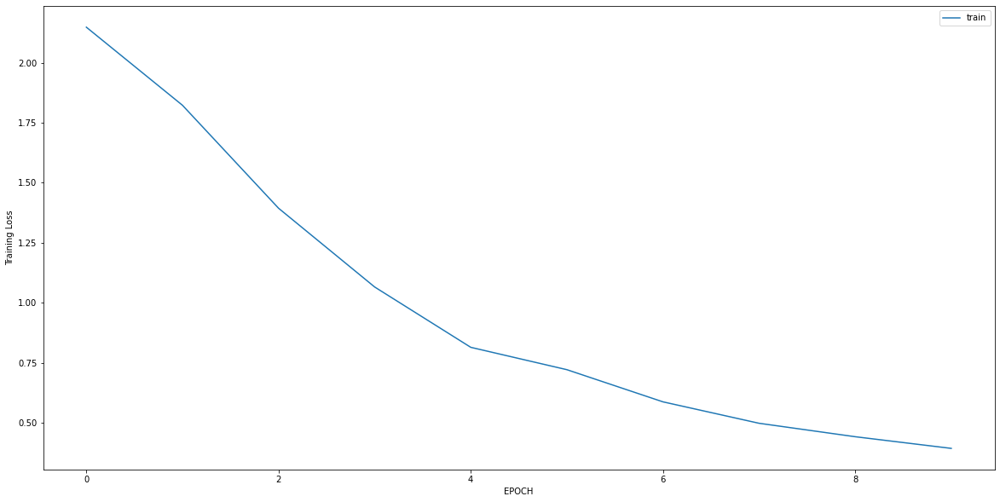

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5780 - accuracy: 0.6455
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5396 - accuracy: 0.7052
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5324 - accuracy: 0.6754
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5185 - accuracy: 0.7351
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4637 - accuracy: 0.8022
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4455 - accuracy: 0.8470
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4350 - accuracy: 0.8619
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4177 - accuracy: 0.8731
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3925 - accuracy: 0.9067
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3806 - accuracy: 0.9142


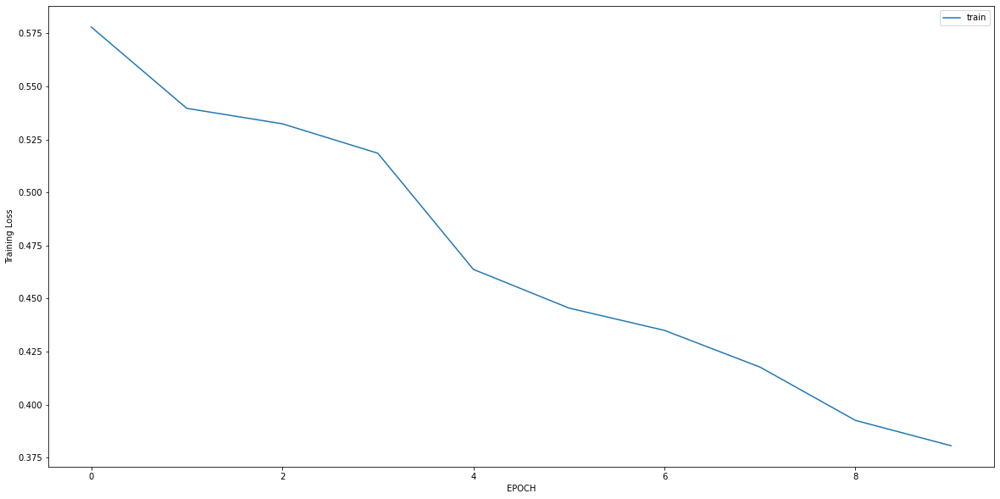

Epoch 1/10
2/2 [==============================] - 0s 8ms/step - loss: 0.3608 - accuracy: 0.9643
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 0.3813 - accuracy: 0.9821
Epoch 3/10
2/2 [==============================] - 0s 6ms/step - loss: 0.3502 - accuracy: 0.9643
Epoch 4/10
2/2 [==============================] - 0s 6ms/step - loss: 0.3668 - accuracy: 0.9821
Epoch 5/10
2/2 [==============================] - 0s 5ms/step - loss: 0.3157 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 6ms/step - loss: 0.3505 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 7ms/step - loss: 0.3256 - accuracy: 0.9821
Epoch 8/10
2/2 [==============================] - 0s 6ms/step - loss: 0.3083 - accuracy: 0.9821
Epoch 9/10
2/2 [==============================] - 0s 9ms/step - loss: 0.3052 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 8ms/step - loss: 0.2909 - accuracy: 1.0000


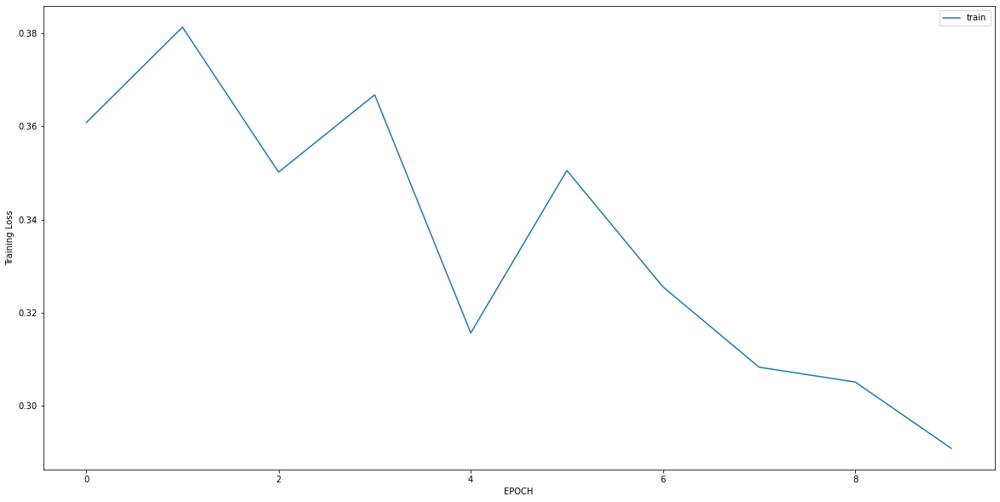

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1555 - accuracy: 0.5057
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0083 - accuracy: 0.5057
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9238 - accuracy: 0.5283
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8838 - accuracy: 0.5094
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6173 - accuracy: 0.6604
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5473 - accuracy: 0.7509
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5084 - accuracy: 0.7962
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4810 - accuracy: 0.8226
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4572 - accuracy: 0.8226
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4294 - accuracy: 0.8340


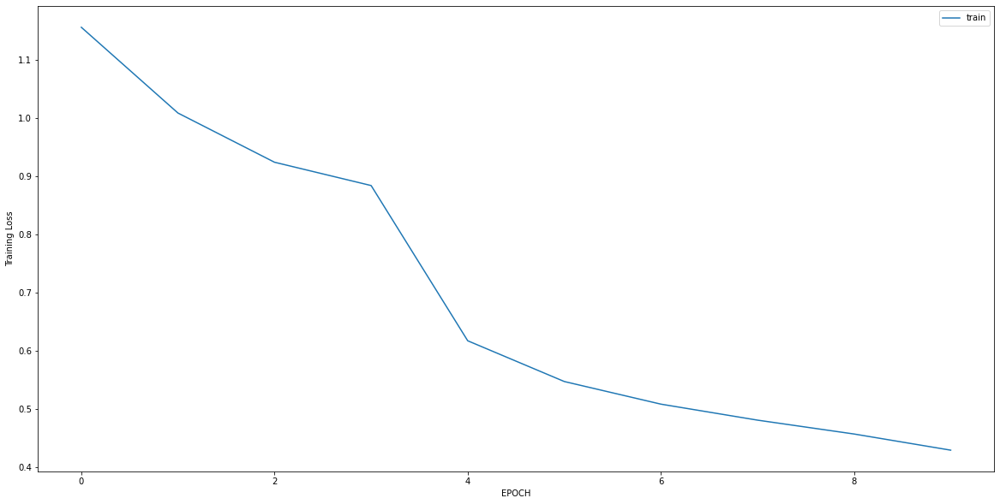

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3793 - accuracy: 0.8566
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3263 - accuracy: 0.9016
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3377 - accuracy: 0.8811
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2728 - accuracy: 0.9262
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2586 - accuracy: 0.9344
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2582 - accuracy: 0.9344
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2534 - accuracy: 0.9303
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2313 - accuracy: 0.9467
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2130 - accuracy: 0.9426
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1996 - accuracy: 0.9467


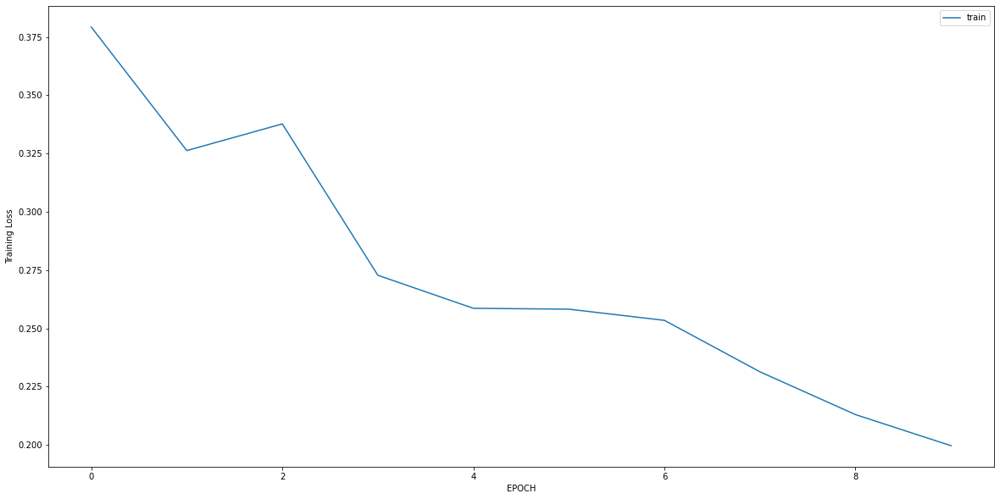

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5939 - accuracy: 0.4007
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.3436 - accuracy: 0.4043
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1439 - accuracy: 0.4152
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9329 - accuracy: 0.4332
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8155 - accuracy: 0.4729
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6728 - accuracy: 0.6029
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5992 - accuracy: 0.6570
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5589 - accuracy: 0.7292
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5165 - accuracy: 0.7653
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5099 - accuracy: 0.7906


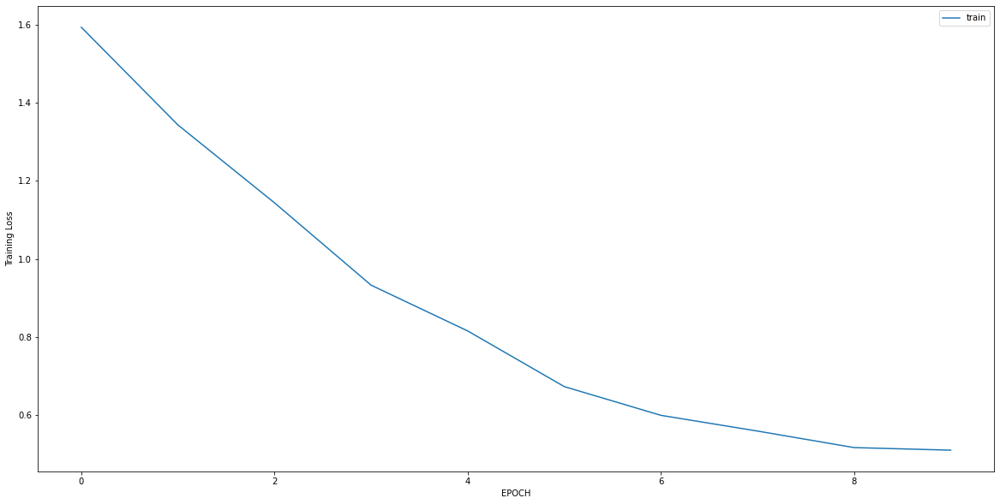

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5673 - accuracy: 0.7029
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5201 - accuracy: 0.7754
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4825 - accuracy: 0.7899
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4414 - accuracy: 0.7754
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4292 - accuracy: 0.7971
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4027 - accuracy: 0.8406
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3402 - accuracy: 0.8768
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3492 - accuracy: 0.8913
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3092 - accuracy: 0.9203
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3522 - accuracy: 0.8913


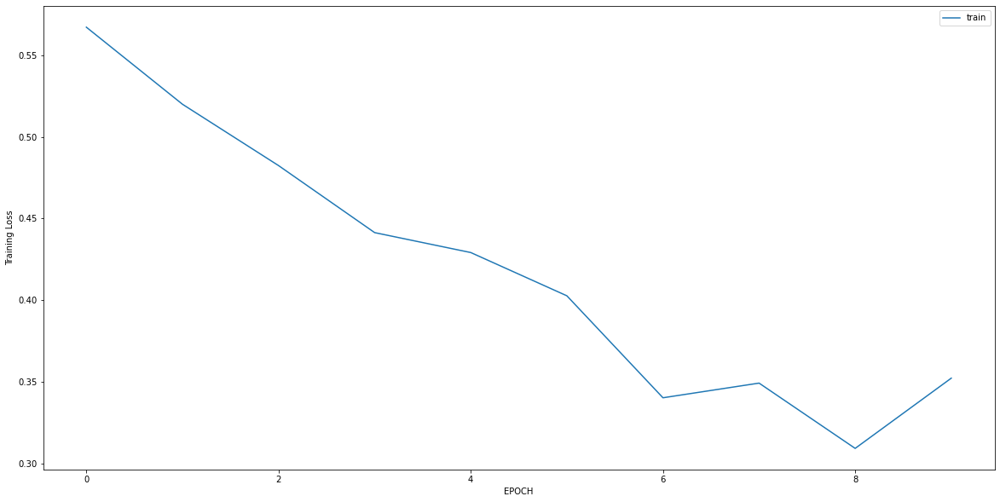

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5048 - accuracy: 0.7831
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3703 - accuracy: 0.8934
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3246 - accuracy: 0.9338
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2959 - accuracy: 0.9412
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2972 - accuracy: 0.9412
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2990 - accuracy: 0.9118
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2667 - accuracy: 0.9522
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2610 - accuracy: 0.9559
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2584 - accuracy: 0.9522
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2581 - accuracy: 0.9485


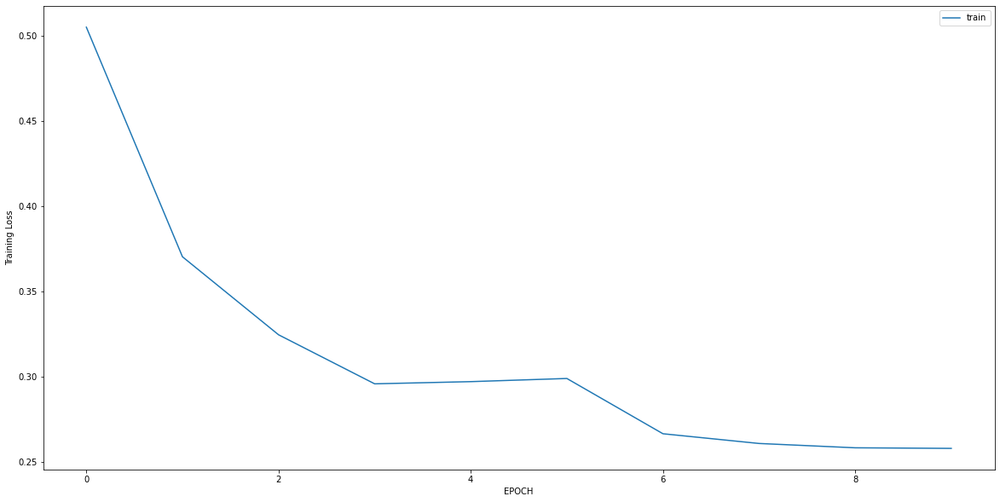

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2682 - accuracy: 0.9353
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2315 - accuracy: 0.9640
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2415 - accuracy: 0.9568
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2145 - accuracy: 0.9568
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1959 - accuracy: 0.9640
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1923 - accuracy: 0.9784
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1880 - accuracy: 0.9496
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2148 - accuracy: 0.9568
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2197 - accuracy: 0.9424
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1933 - accuracy: 0.9712


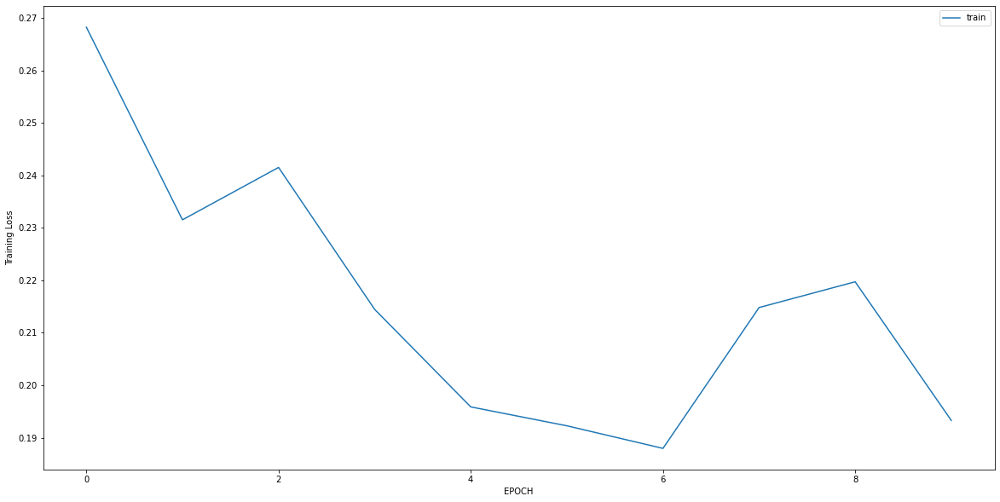

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1315 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1003 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0769 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0603 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0551 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0497 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0295 - accuracy: 1.0000


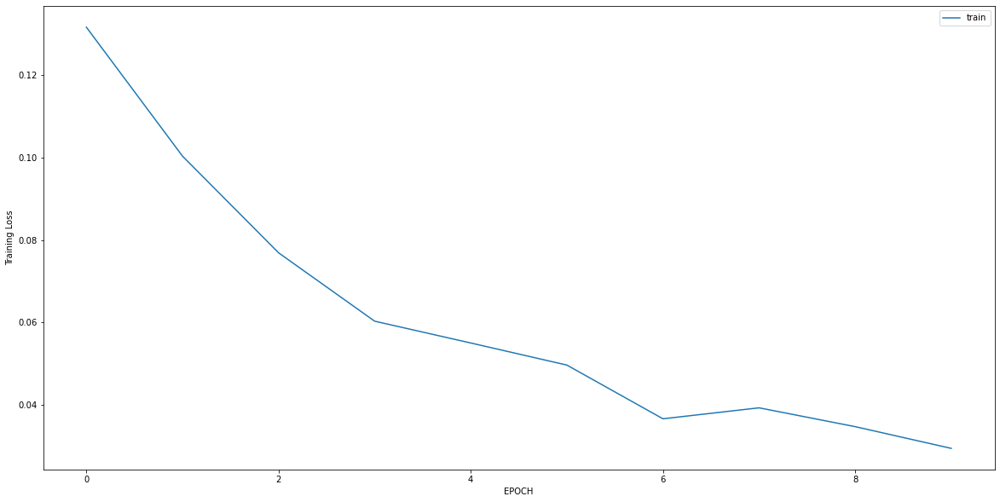

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.9966
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.9966
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0192 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0209 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0230 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0217 - accuracy: 1.0000


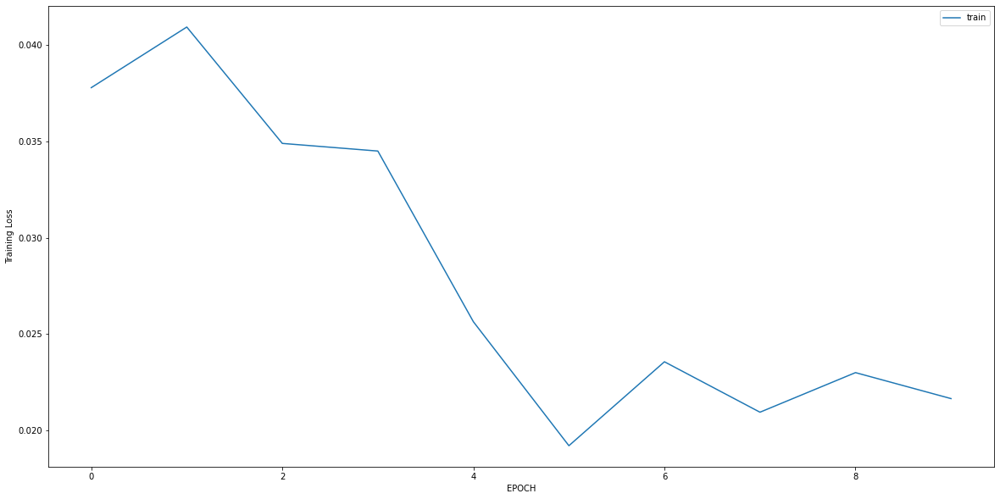

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7289 - accuracy: 0.8185
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5533 - accuracy: 0.8508
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2962 - accuracy: 0.9113
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2195 - accuracy: 0.9516
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1546 - accuracy: 0.9798
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1361 - accuracy: 0.9677
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1248 - accuracy: 0.9879
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0923 - accuracy: 0.9919
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1032 - accuracy: 0.9879
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1053 - accuracy: 0.9879


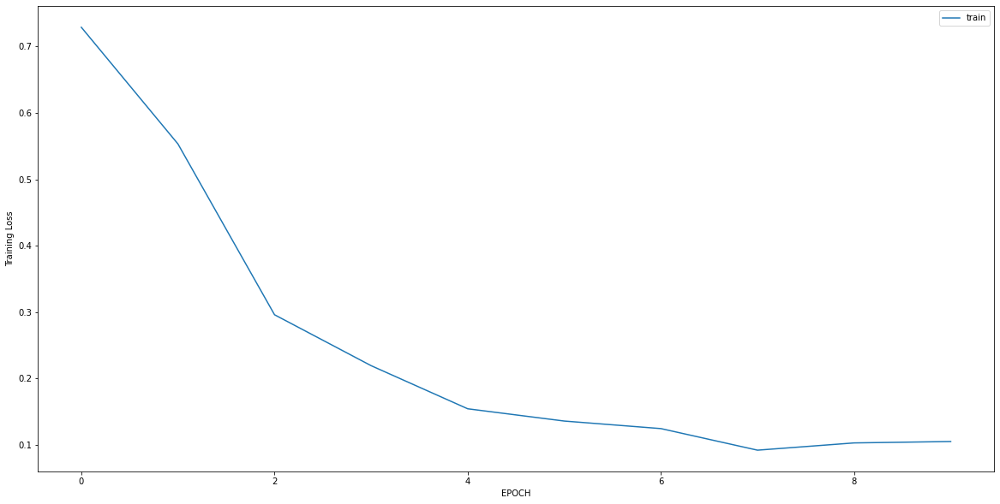

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.0276 - accuracy: 0.6147
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8875 - accuracy: 0.6284
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8120 - accuracy: 0.6560
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7272 - accuracy: 0.6606
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6633 - accuracy: 0.6560
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6110 - accuracy: 0.6697
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5801 - accuracy: 0.6789
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5095 - accuracy: 0.7431
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4988 - accuracy: 0.7294
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5132 - accuracy: 0.7064


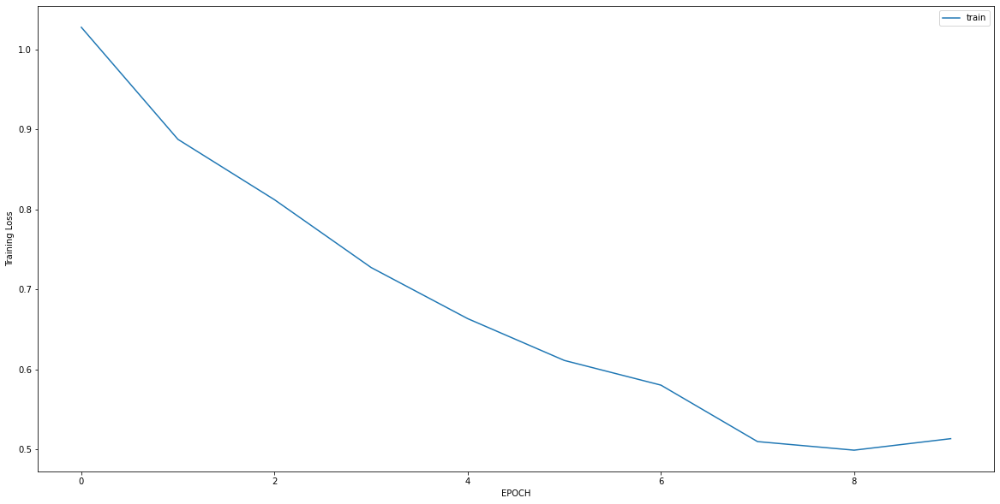

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5767 - accuracy: 0.7088
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2042 - accuracy: 0.9579
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0518 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0267 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0136 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0133 - accuracy: 1.0000


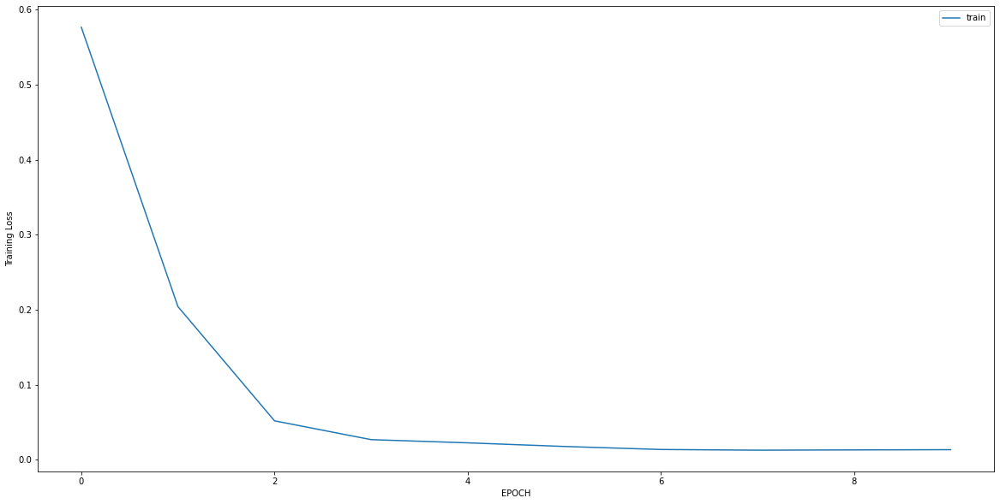

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0382 - accuracy: 0.3203
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5146 - accuracy: 0.7576
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1732 - accuracy: 0.9784
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0741 - accuracy: 0.9957
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0458 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0300 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0221 - accuracy: 1.0000


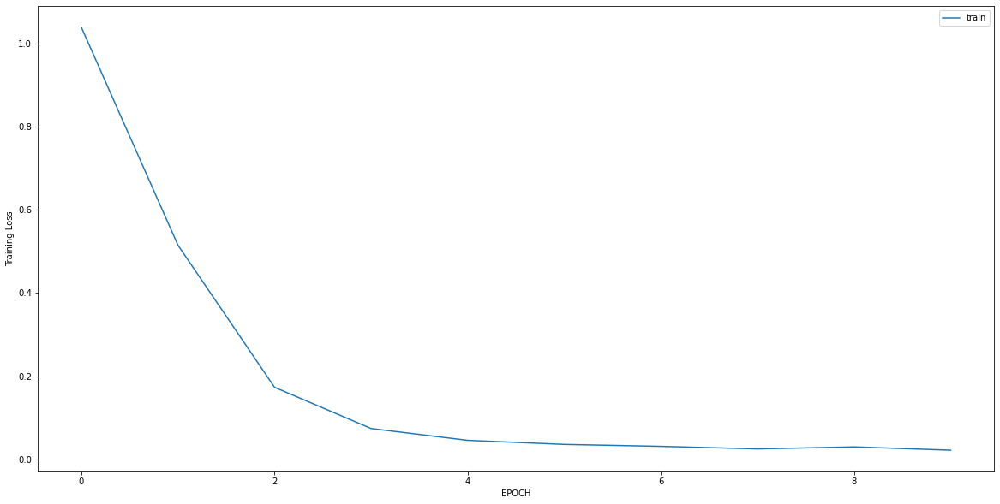

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0073 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0071 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0059 - accuracy: 1.0000


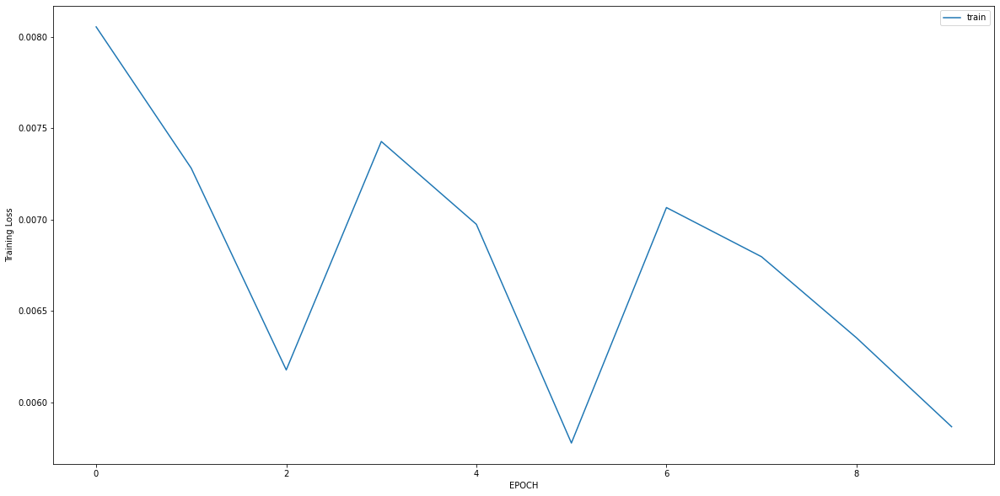

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0029 - accuracy: 1.0000
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0018 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0026 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0023 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0022 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0025 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 1.0000


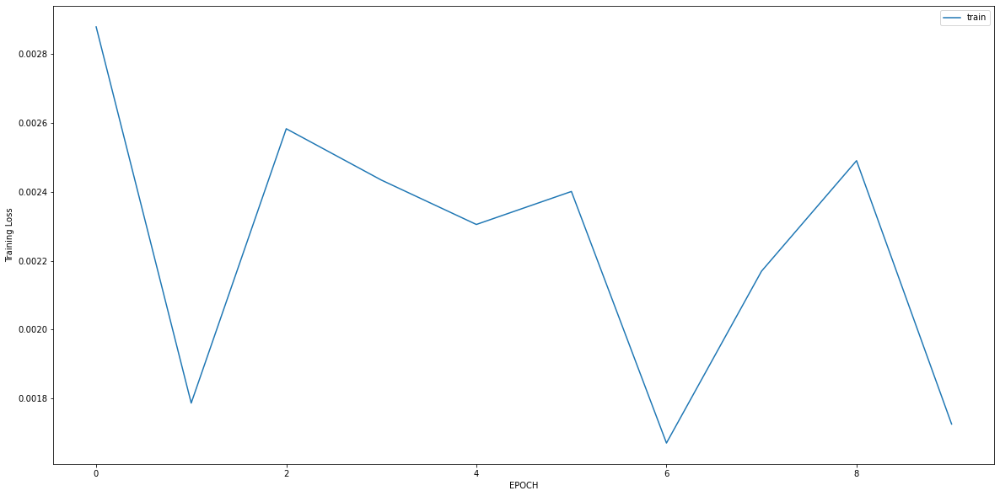

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 3.5135 - accuracy: 0.4585
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 2.9471 - accuracy: 0.4585
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 2.2448 - accuracy: 0.4585
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 1.6487 - accuracy: 0.4585
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 1.1619 - accuracy: 0.5178
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6665 - accuracy: 0.6957
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5061 - accuracy: 0.7747
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4713 - accuracy: 0.7905
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4262 - accuracy: 0.8458
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4070 - accuracy: 0.8735


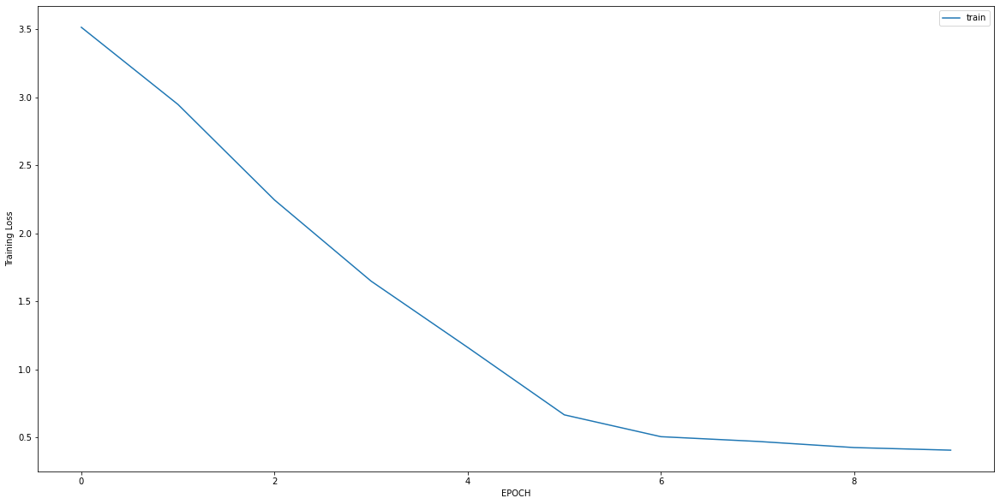

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7295 - accuracy: 0.5569
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6699 - accuracy: 0.5490
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5887 - accuracy: 0.6824
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5437 - accuracy: 0.7059
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5070 - accuracy: 0.7490
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5056 - accuracy: 0.7804
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4299 - accuracy: 0.8235
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4299 - accuracy: 0.8157
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3889 - accuracy: 0.8627
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4217 - accuracy: 0.8431


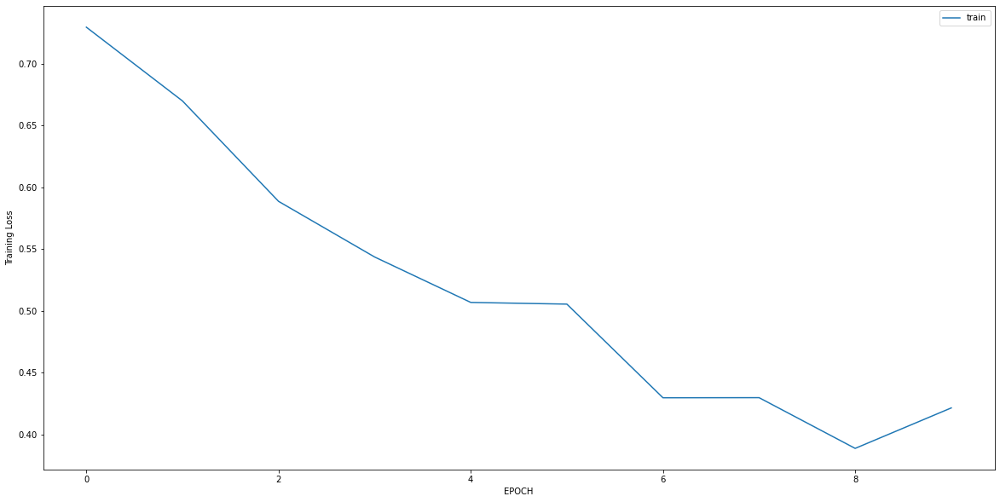

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3852 - accuracy: 0.8862
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3137 - accuracy: 0.9034
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2839 - accuracy: 0.9172
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2112 - accuracy: 0.9586
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1678 - accuracy: 0.9655
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 1.2801 - accuracy: 0.4690
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 1.1119 - accuracy: 0.4586
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6185 - accuracy: 0.7138
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5170 - accuracy: 0.7793
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5173 - accuracy: 0.7690


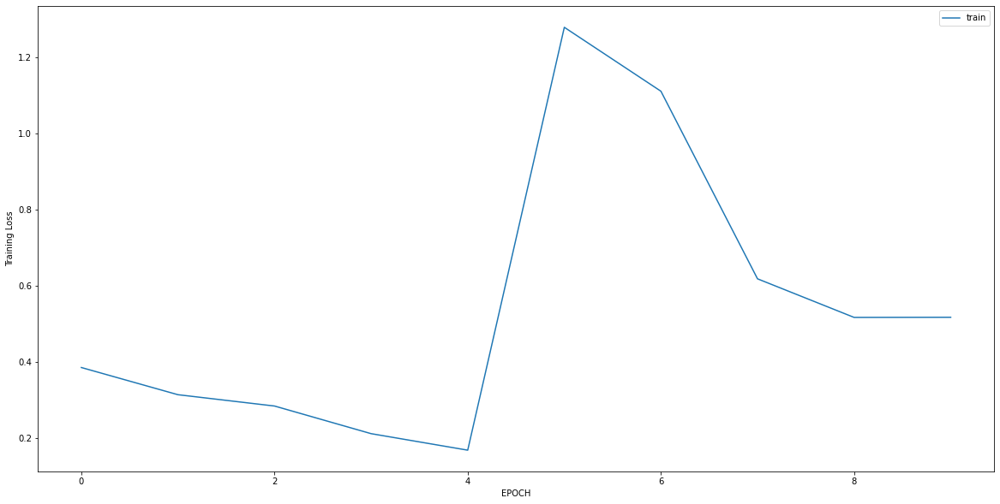

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4500 - accuracy: 0.8418
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3739 - accuracy: 0.8987
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3422 - accuracy: 0.9051
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2977 - accuracy: 0.9367
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2556 - accuracy: 0.9367
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2569 - accuracy: 0.9430
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2371 - accuracy: 0.9367
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2352 - accuracy: 0.9494
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2217 - accuracy: 0.9430
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2233 - accuracy: 0.9335


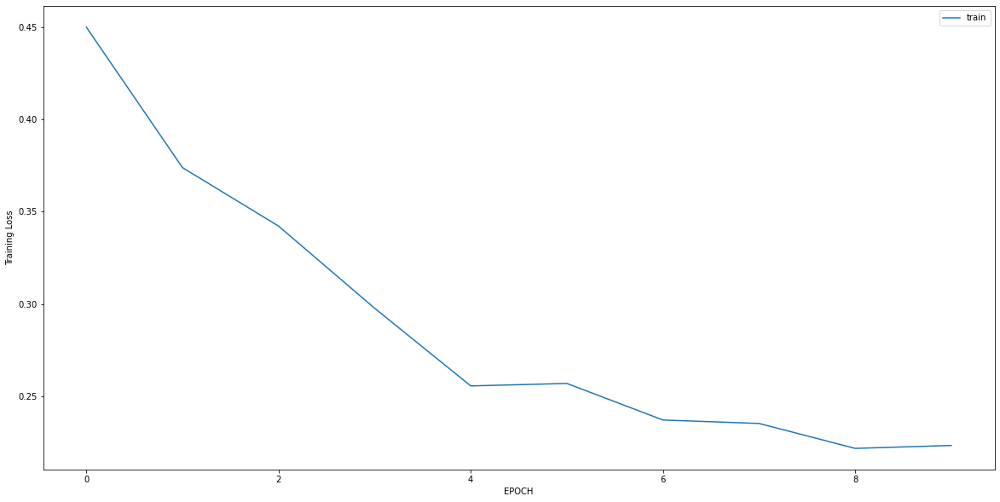

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5138 - accuracy: 0.7438
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4142 - accuracy: 0.8185
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3872 - accuracy: 0.8149
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3582 - accuracy: 0.8292
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3032 - accuracy: 0.8648
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2447 - accuracy: 0.9004
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2478 - accuracy: 0.9110
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2151 - accuracy: 0.9288
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1886 - accuracy: 0.9609
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1638 - accuracy: 0.9573


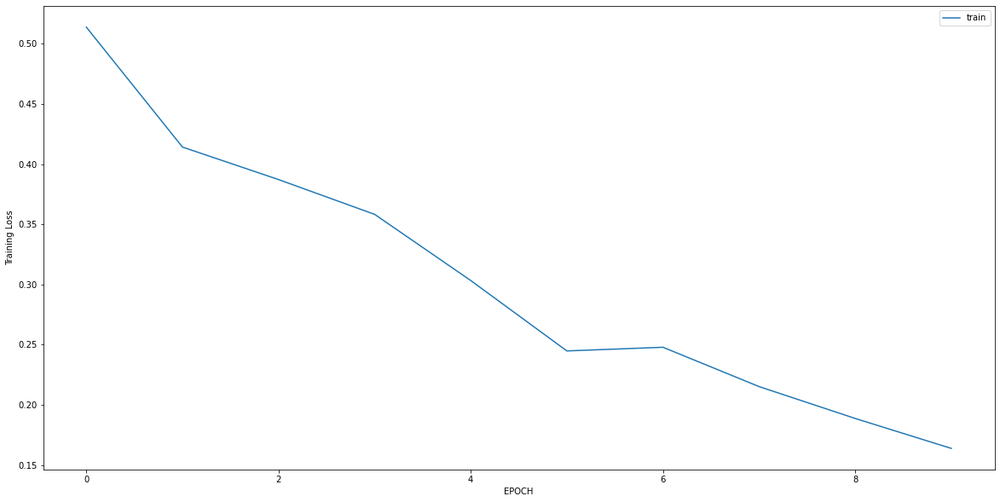

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2565 - accuracy: 0.9150
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3248 - accuracy: 0.8866
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1880 - accuracy: 0.9514
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1528 - accuracy: 0.9676
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1451 - accuracy: 0.9433
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1088 - accuracy: 0.9798
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0937 - accuracy: 0.9838
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0819 - accuracy: 0.9960
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0809 - accuracy: 0.9919
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0832 - accuracy: 0.9919


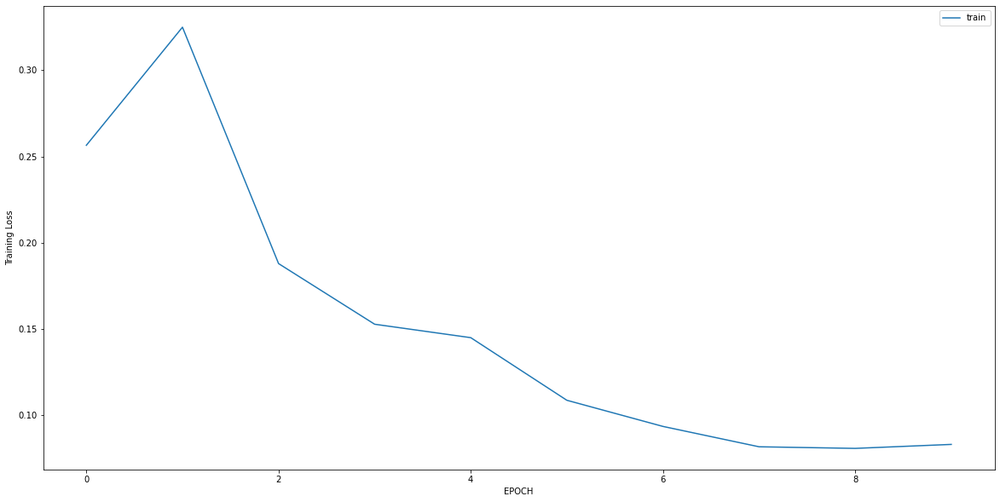

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 2.8980 - accuracy: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 1.6546 - accuracy: 0.1022
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5373 - accuracy: 0.7125
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1235 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0588 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0467 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 1.0000


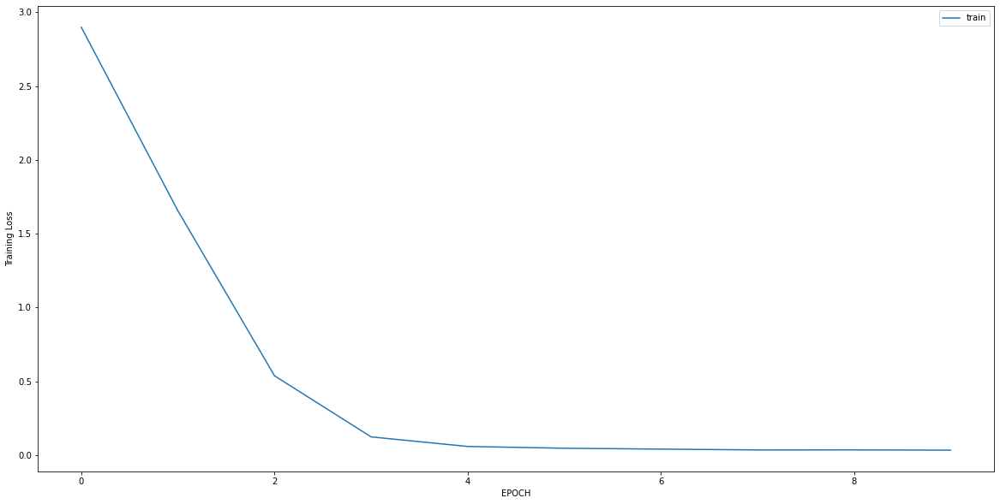

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0334 - accuracy: 0.6229
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8020 - accuracy: 0.6431
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6386 - accuracy: 0.6902
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5867 - accuracy: 0.7441
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5202 - accuracy: 0.7643
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.4388 - accuracy: 0.8182
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3550 - accuracy: 0.8788
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2835 - accuracy: 0.9226
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2393 - accuracy: 0.9293
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2431 - accuracy: 0.9327


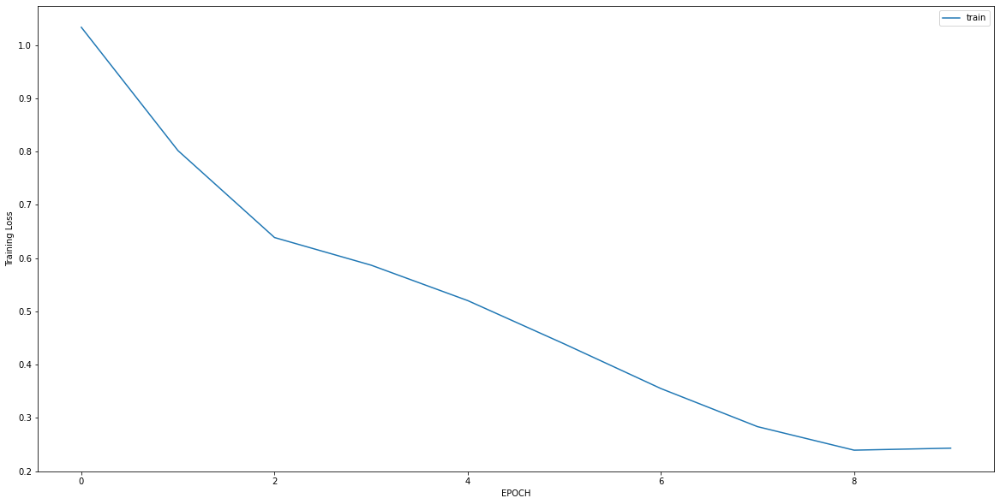

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2489 - accuracy: 0.9278
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1684 - accuracy: 0.9639
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1286 - accuracy: 0.9819
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1319 - accuracy: 0.9752
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1088 - accuracy: 0.9842
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1193 - accuracy: 0.9707
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1129 - accuracy: 0.9752
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1102 - accuracy: 0.9819
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0837 - accuracy: 0.9932
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0927 - accuracy: 0.9865


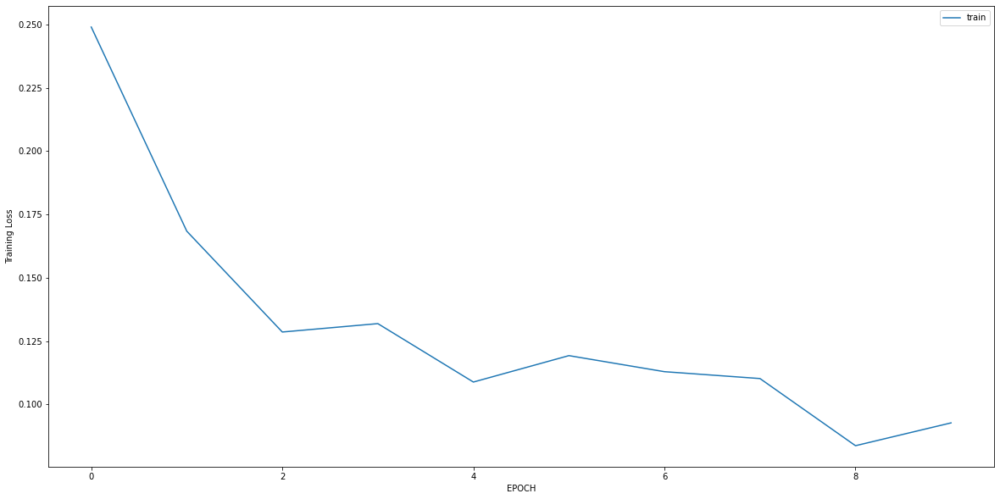

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5645 - accuracy: 0.8182
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4237 - accuracy: 0.8427
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4487 - accuracy: 0.8322
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3797 - accuracy: 0.8601
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3487 - accuracy: 0.8846
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3557 - accuracy: 0.8881
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3344 - accuracy: 0.8881
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2832 - accuracy: 0.9126
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2789 - accuracy: 0.9021
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2734 - accuracy: 0.9091


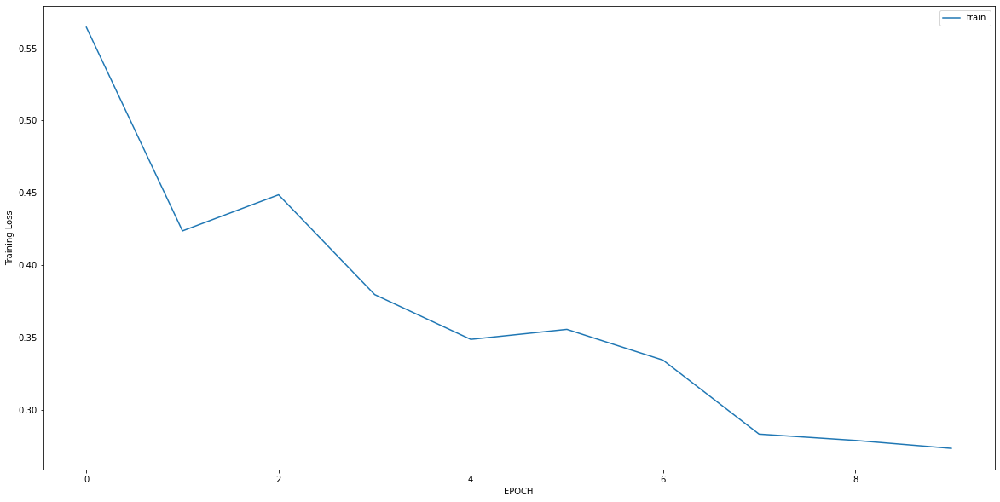

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.1591 - accuracy: 0.6806
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 1.1927 - accuracy: 0.6806
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0940 - accuracy: 0.6736
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8724 - accuracy: 0.6806
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5992 - accuracy: 0.7083
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4770 - accuracy: 0.7708
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4922 - accuracy: 0.7500
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4375 - accuracy: 0.8264
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4607 - accuracy: 0.8125
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4128 - accuracy: 0.8819


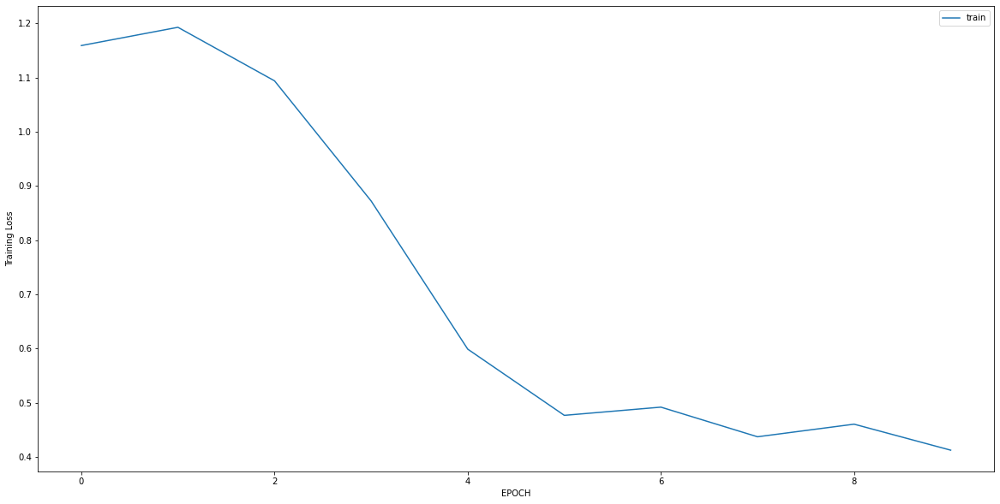

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9535 - accuracy: 0.6093
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7814 - accuracy: 0.6126
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6161 - accuracy: 0.6887
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5609 - accuracy: 0.7020
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5325 - accuracy: 0.7351
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3987 - accuracy: 0.8709
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3537 - accuracy: 0.8709
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3326 - accuracy: 0.8841
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3300 - accuracy: 0.8742
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2901 - accuracy: 0.9106


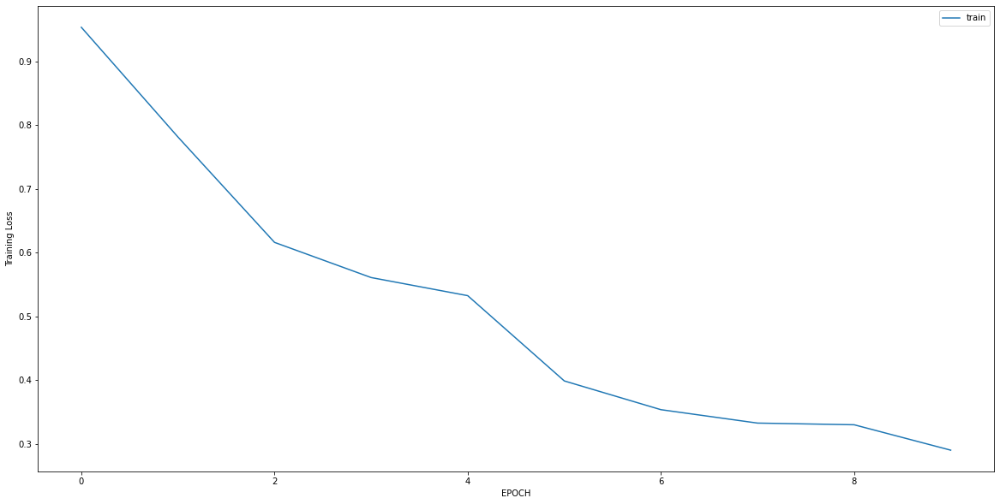

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.5079 - accuracy: 0.7719
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4248 - accuracy: 0.8561
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3606 - accuracy: 0.8737
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3263 - accuracy: 0.8912
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2979 - accuracy: 0.8877
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3009 - accuracy: 0.9053
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2721 - accuracy: 0.9228
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2599 - accuracy: 0.9228
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2716 - accuracy: 0.8982
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2518 - accuracy: 0.9263


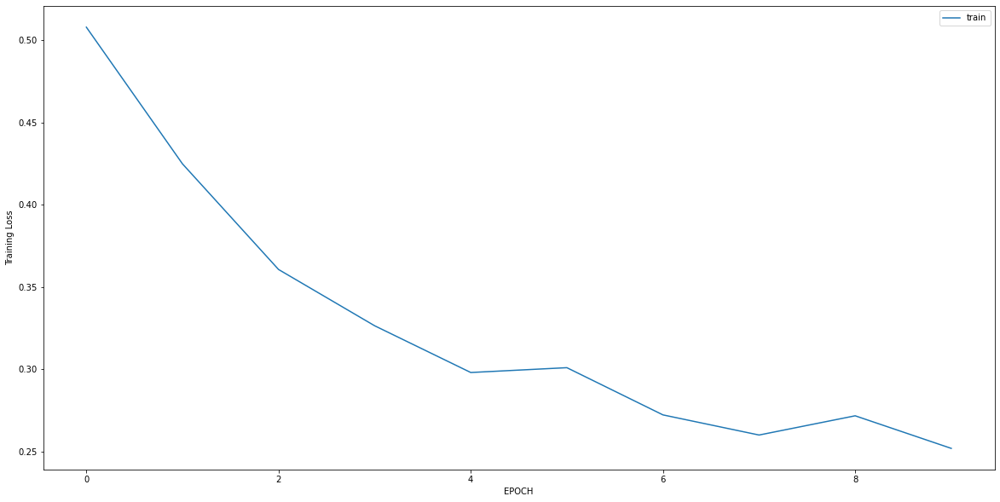

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0114 - accuracy: 0.5516
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8737 - accuracy: 0.5623
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7591 - accuracy: 0.5765
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6264 - accuracy: 0.6050
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4584 - accuracy: 0.7651
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4148 - accuracy: 0.8577
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3982 - accuracy: 0.8541
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3457 - accuracy: 0.8932
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3028 - accuracy: 0.9039
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2809 - accuracy: 0.9431


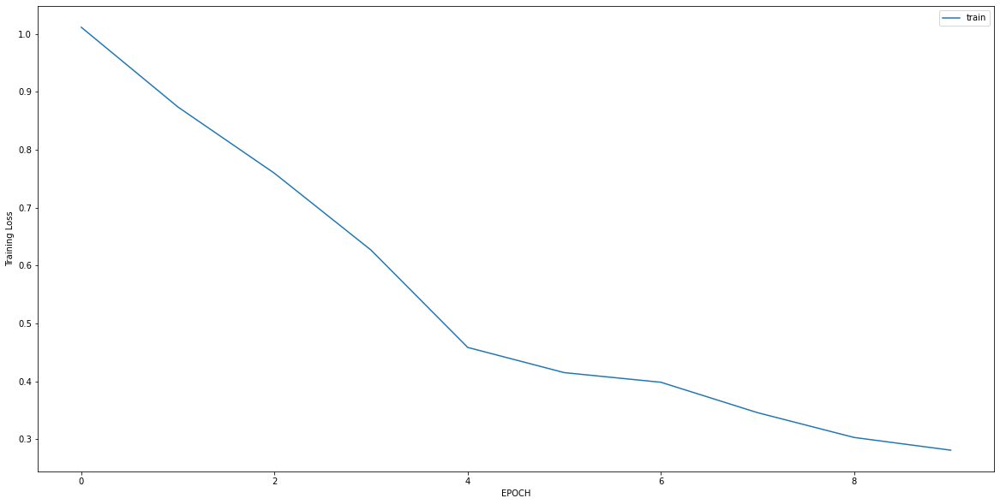

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0691 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0209 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0100 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0119 - accuracy: 1.0000


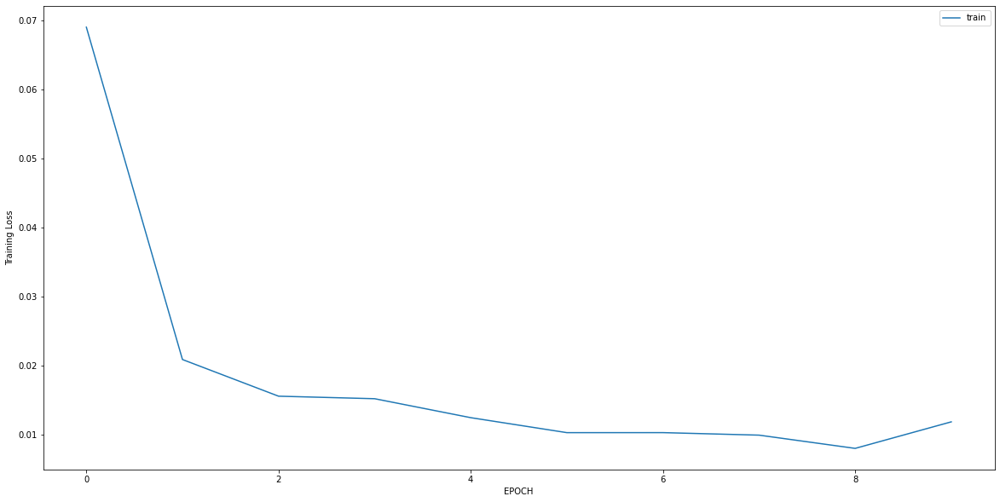

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.8356 - accuracy: 0.8012
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6476 - accuracy: 0.8329
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4412 - accuracy: 0.8761
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3346 - accuracy: 0.9020
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2633 - accuracy: 0.9337
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2114 - accuracy: 0.9452
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1294 - accuracy: 0.9798
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1165 - accuracy: 0.9741
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0807 - accuracy: 0.9885
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0792 - accuracy: 0.9914


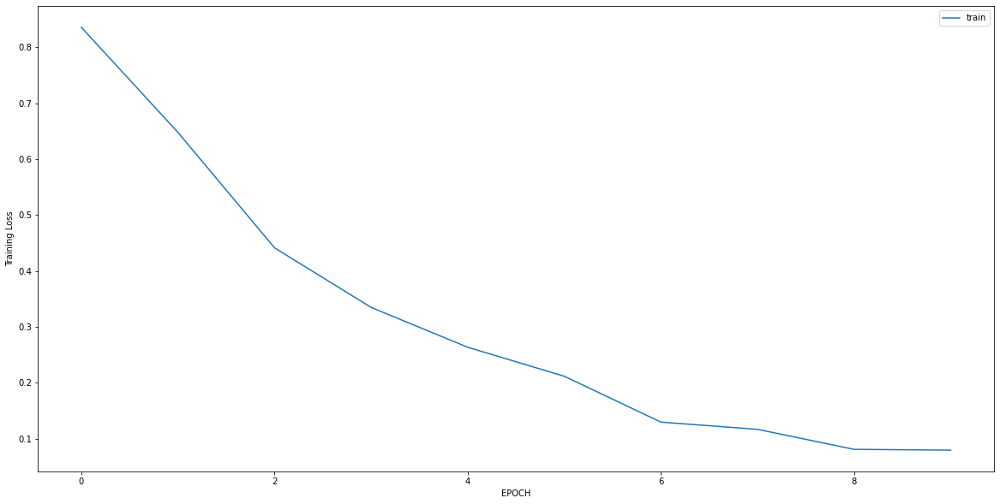

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.6667
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0109 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0102 - accuracy: 1.0000


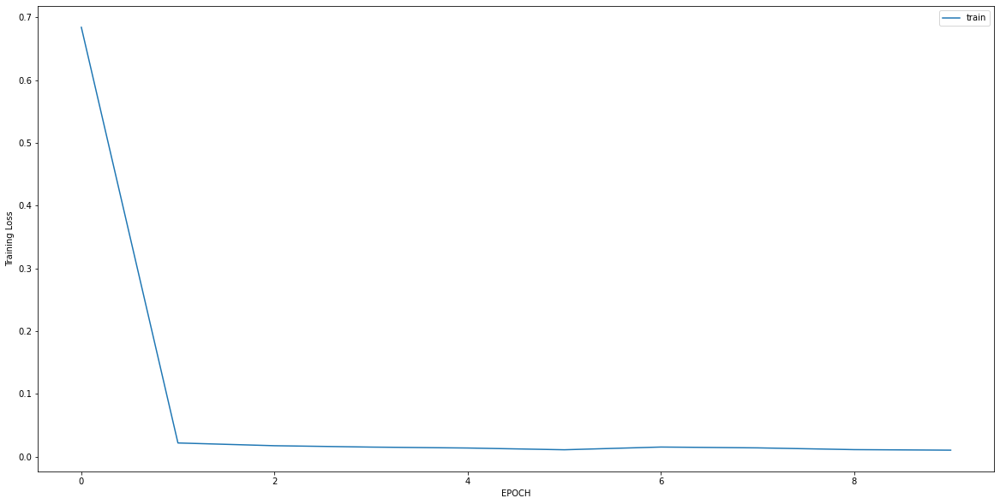

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.5988 - accuracy: 0.0107
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.8930 - accuracy: 0.0214
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 1.2092 - accuracy: 0.1893
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6676 - accuracy: 0.6143
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3646 - accuracy: 0.9429
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2157 - accuracy: 0.9964
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1363 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0917 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0699 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0593 - accuracy: 1.0000


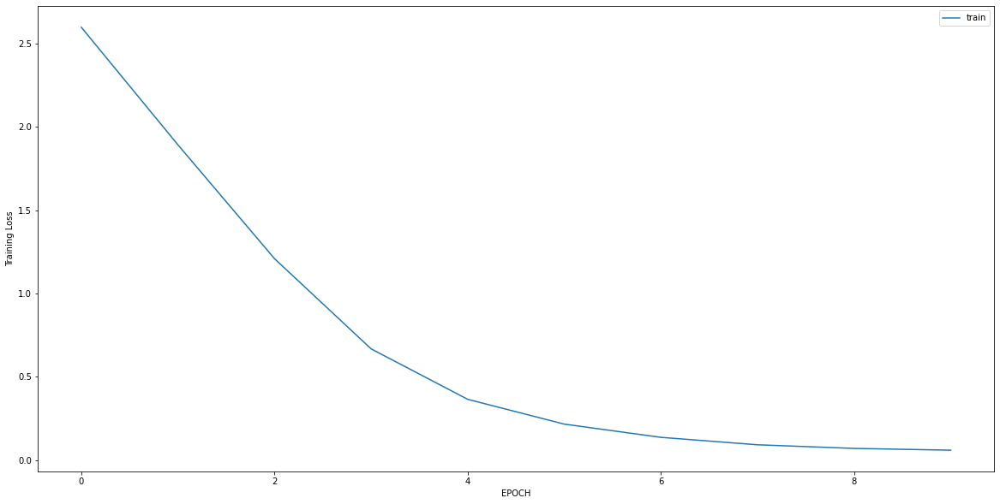

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.9675 - accuracy: 0.5738
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 1.7637 - accuracy: 0.5738
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.5061 - accuracy: 0.5738
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 1.3335 - accuracy: 0.5738
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 1.2066 - accuracy: 0.5738
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.9774 - accuracy: 0.5823
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.8575 - accuracy: 0.5738
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7082 - accuracy: 0.5907
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6412 - accuracy: 0.6160
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5189 - accuracy: 0.6624


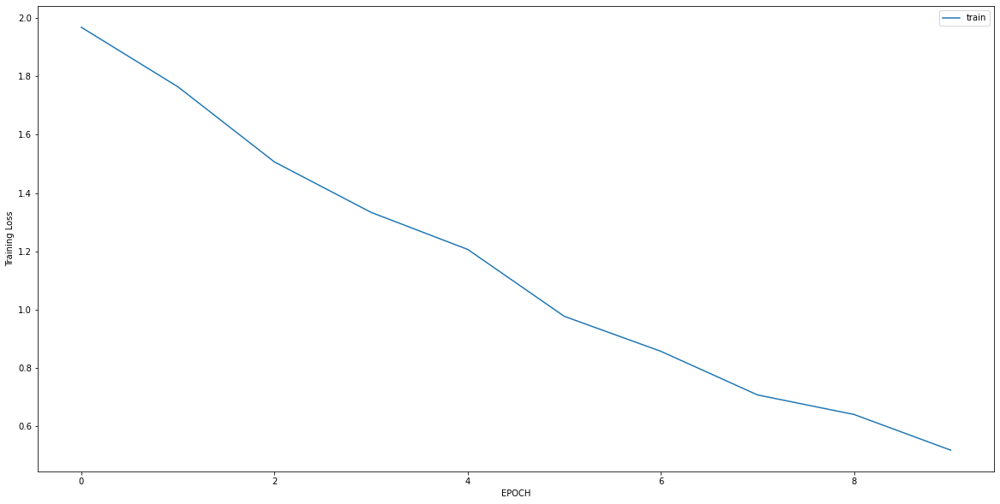

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8480 - accuracy: 0.4138
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6936 - accuracy: 0.5643
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5862 - accuracy: 0.7116
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4770 - accuracy: 0.8245
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3985 - accuracy: 0.8527
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3237 - accuracy: 0.8966
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2777 - accuracy: 0.9310
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2308 - accuracy: 0.9592
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2016 - accuracy: 0.9718
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1987 - accuracy: 0.9655


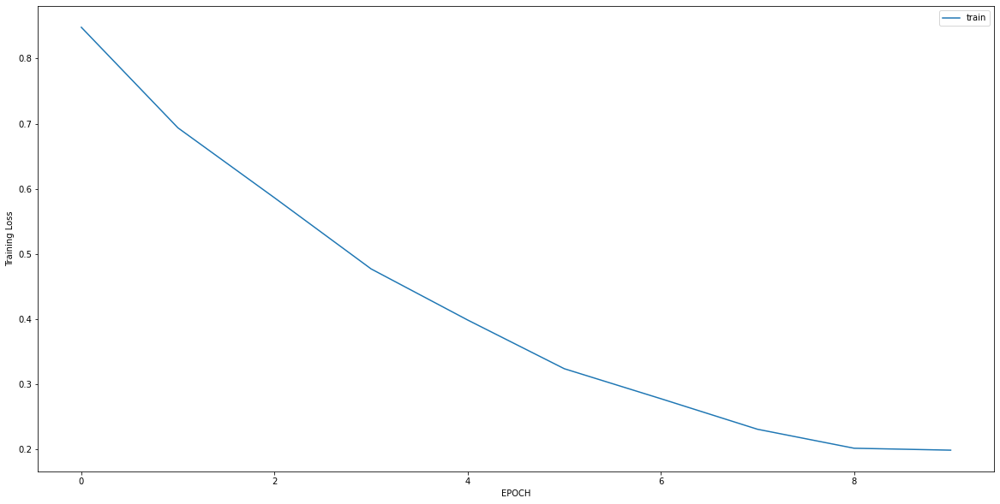

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.9825 - accuracy: 0.0159
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.6310 - accuracy: 0.0556
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7955 - accuracy: 0.4643
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0975 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0327 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0209 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0111 - accuracy: 1.0000


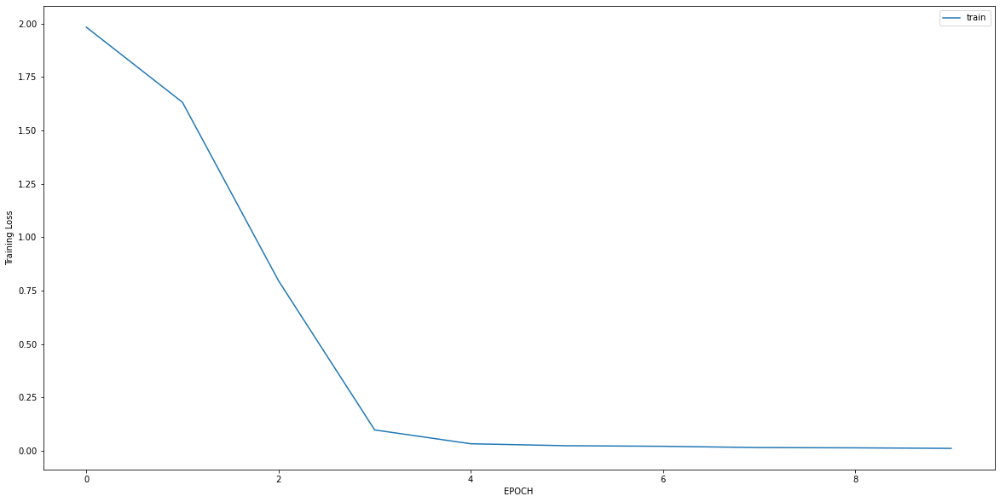

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.5045 - accuracy: 0.7544
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3796 - accuracy: 0.7982
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3464 - accuracy: 0.8480
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2731 - accuracy: 0.9006
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2558 - accuracy: 0.9006
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2014 - accuracy: 0.9357
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1821 - accuracy: 0.9444
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1804 - accuracy: 0.9474
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1540 - accuracy: 0.9532
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1483 - accuracy: 0.9649


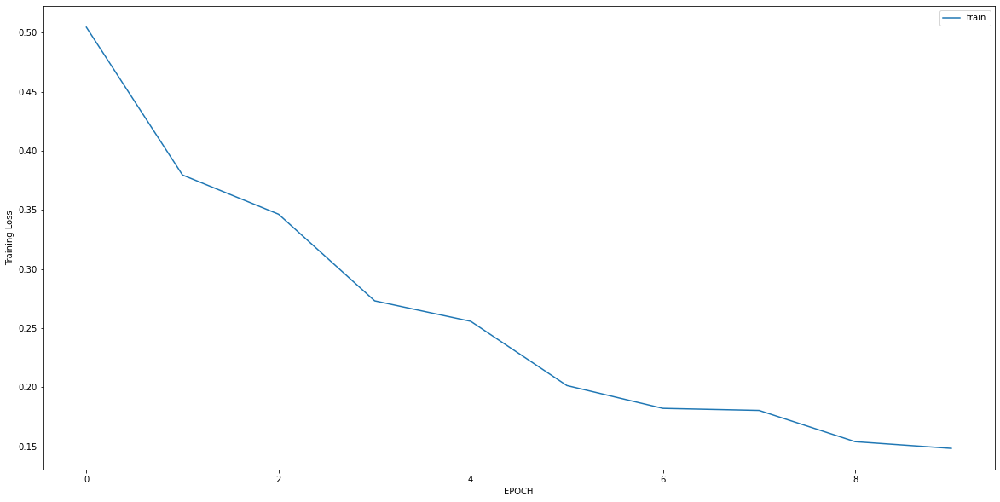

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.7081 - accuracy: 0.7603
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4817 - accuracy: 0.8207
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3634 - accuracy: 0.8488
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3211 - accuracy: 0.8769
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2947 - accuracy: 0.9071
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2918 - accuracy: 0.9114
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2633 - accuracy: 0.9071
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2254 - accuracy: 0.9158
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2195 - accuracy: 0.9352
Epoch 10/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2214 - accuracy: 0.9222


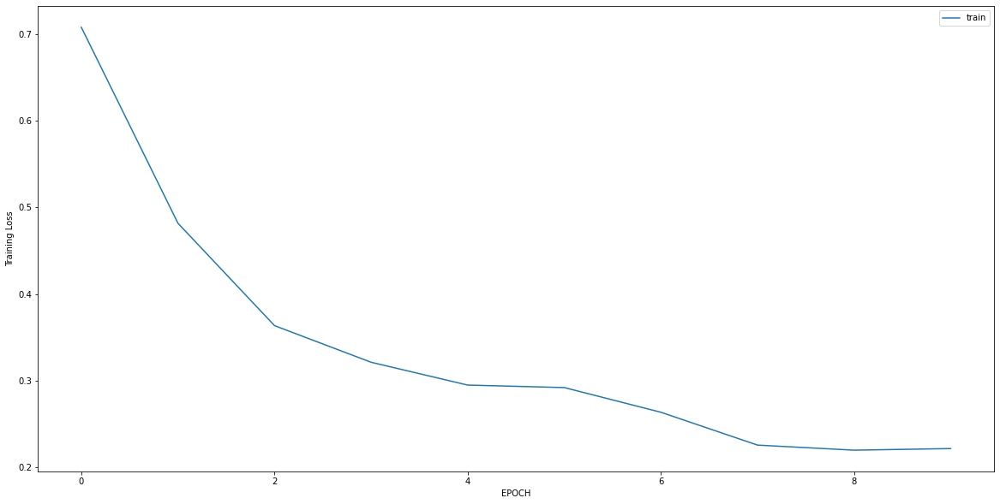

Epoch 1/10
12/12 [==============================] - 0s 4ms/step - loss: 3.1845 - accuracy: 0.0079
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 1.4276 - accuracy: 0.3806
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0609 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0563 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0519 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0465 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0318 - accuracy: 1.0000


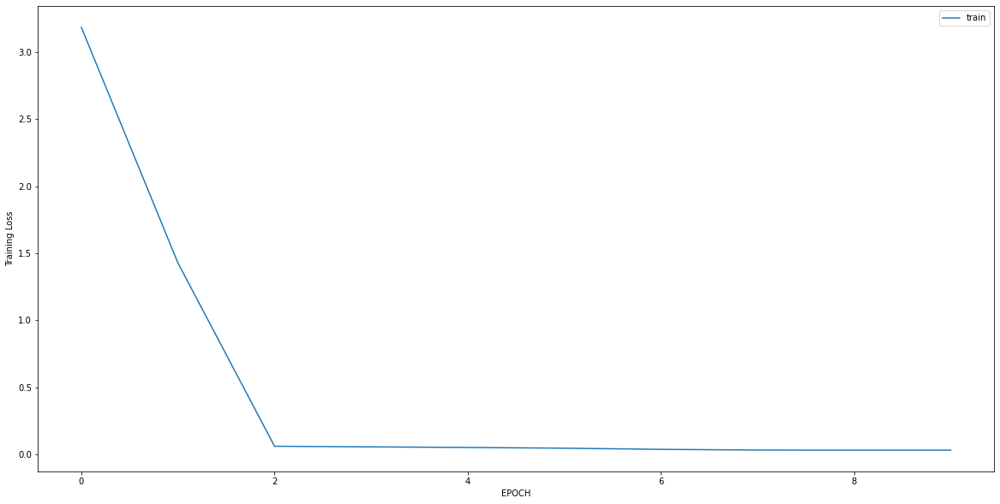

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 3.0296 - accuracy: 0.2847
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 2.7358 - accuracy: 0.2847
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 2.6132 - accuracy: 0.2847
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 2.3577 - accuracy: 0.2847
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 1.7846 - accuracy: 0.2847
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 1.2829 - accuracy: 0.2847
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0384 - accuracy: 0.3056
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.9086 - accuracy: 0.3333
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8233 - accuracy: 0.4167
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7135 - accuracy: 0.4861


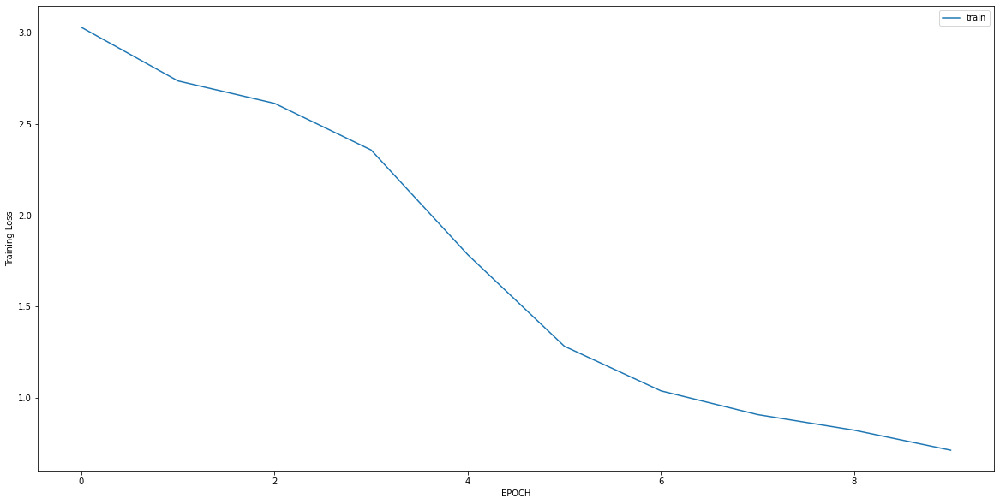

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3616 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3652 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3169 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2527 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2001 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1643 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1345 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1136 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0940 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0872 - accuracy: 1.0000


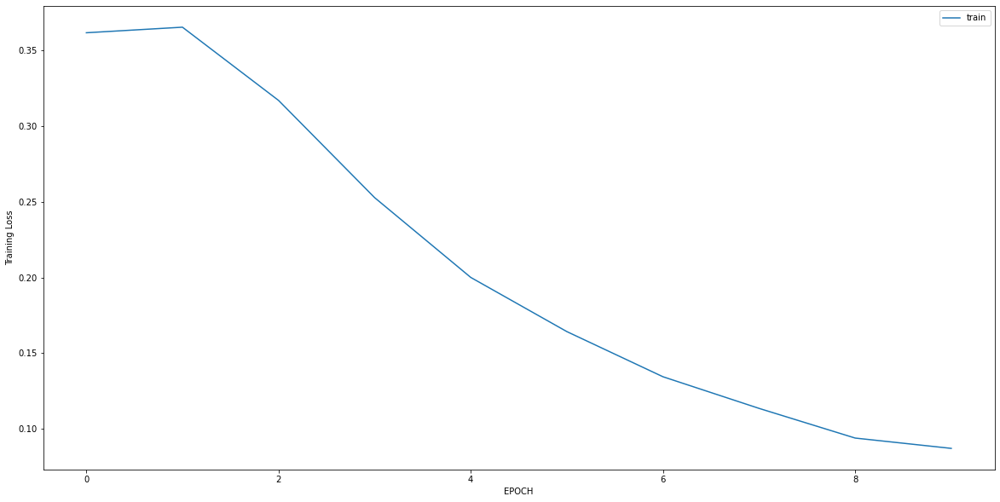

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4654 - accuracy: 0.7976
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4607 - accuracy: 0.8056
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4147 - accuracy: 0.8333
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4186 - accuracy: 0.8254
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3697 - accuracy: 0.8611
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3468 - accuracy: 0.8452
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3156 - accuracy: 0.8889
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3008 - accuracy: 0.8770
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2723 - accuracy: 0.9048
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2647 - accuracy: 0.9127


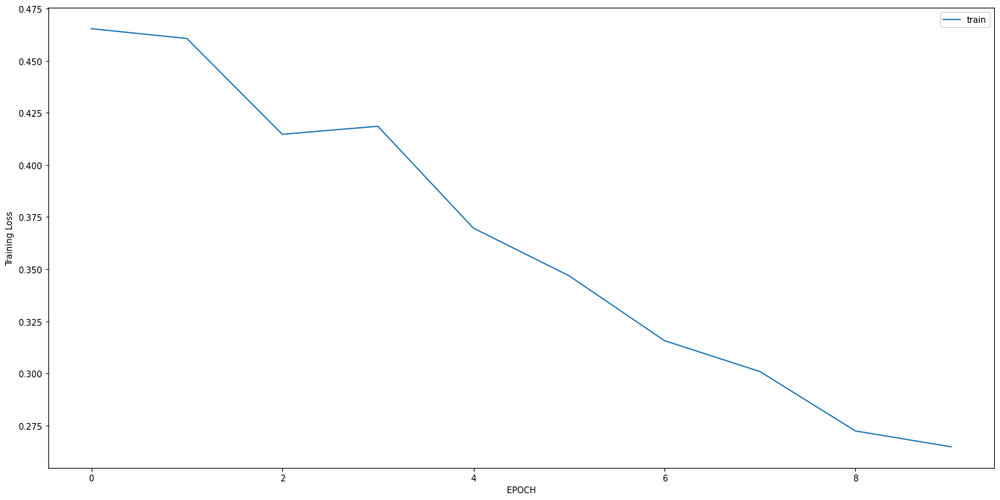

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3481 - accuracy: 0.8780
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3419 - accuracy: 0.8815
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3358 - accuracy: 0.8920
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3159 - accuracy: 0.9094
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2838 - accuracy: 0.9199
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2585 - accuracy: 0.9233
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2685 - accuracy: 0.9199
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2637 - accuracy: 0.9164
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2717 - accuracy: 0.9164
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2354 - accuracy: 0.9268


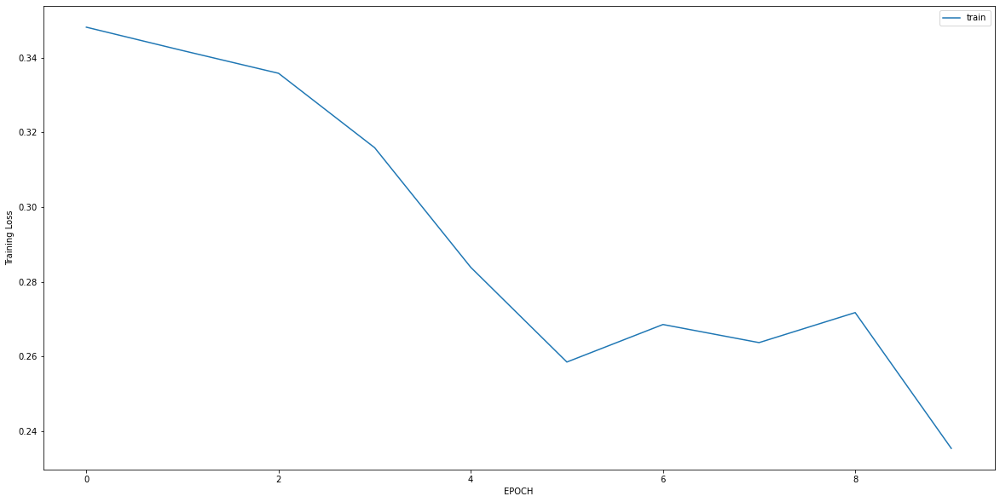

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5583 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5337 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5326 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5171 - accuracy: 0.8186
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5522 - accuracy: 0.8228
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5152 - accuracy: 0.8143
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4812 - accuracy: 0.8143
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4778 - accuracy: 0.8270
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5007 - accuracy: 0.8228
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4675 - accuracy: 0.8101


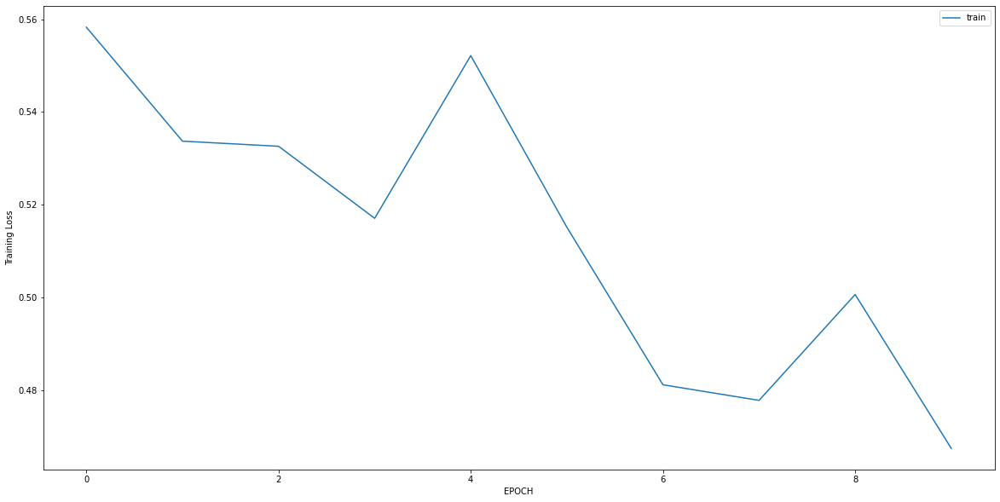

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3631 - accuracy: 0.8611
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3520 - accuracy: 0.8889
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3276 - accuracy: 0.9048
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3035 - accuracy: 0.9206
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2946 - accuracy: 0.9246
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2779 - accuracy: 0.9167
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2723 - accuracy: 0.9325
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2577 - accuracy: 0.9246
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2491 - accuracy: 0.9325
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2484 - accuracy: 0.9405


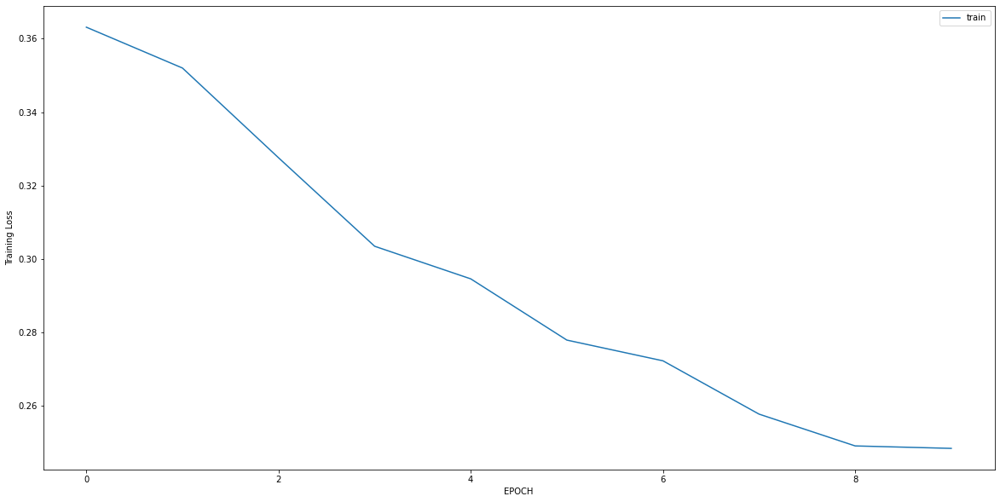

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9805 - accuracy: 0.5430
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6273 - accuracy: 0.6392
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4629 - accuracy: 0.7698
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3574 - accuracy: 0.8488
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2801 - accuracy: 0.9141
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2783 - accuracy: 0.9175
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2349 - accuracy: 0.9416
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2398 - accuracy: 0.9381
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1793 - accuracy: 0.9691
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2058 - accuracy: 0.9347


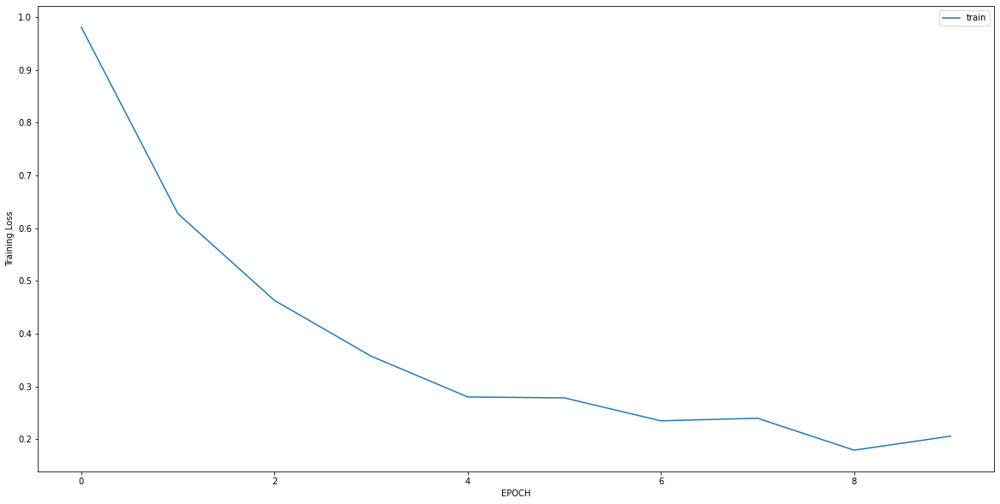

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.4834 - accuracy: 0.1925
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0700 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0618 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0624 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0569 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0537 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0541 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0467 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 1.0000


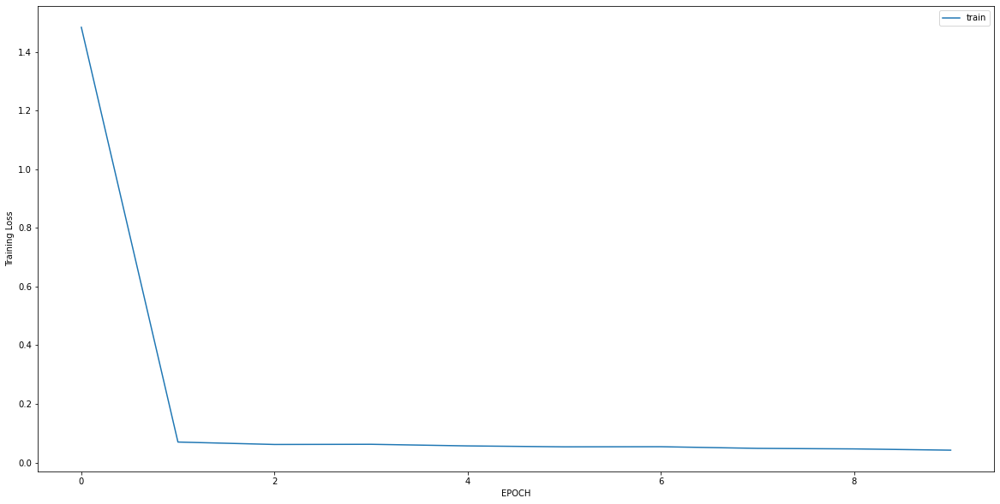

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5928 - accuracy: 0.7828
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5037 - accuracy: 0.8165
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4284 - accuracy: 0.8464
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3887 - accuracy: 0.8801
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3485 - accuracy: 0.8614
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3493 - accuracy: 0.8727
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3128 - accuracy: 0.9064
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2707 - accuracy: 0.9213
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2876 - accuracy: 0.9251
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2471 - accuracy: 0.9139


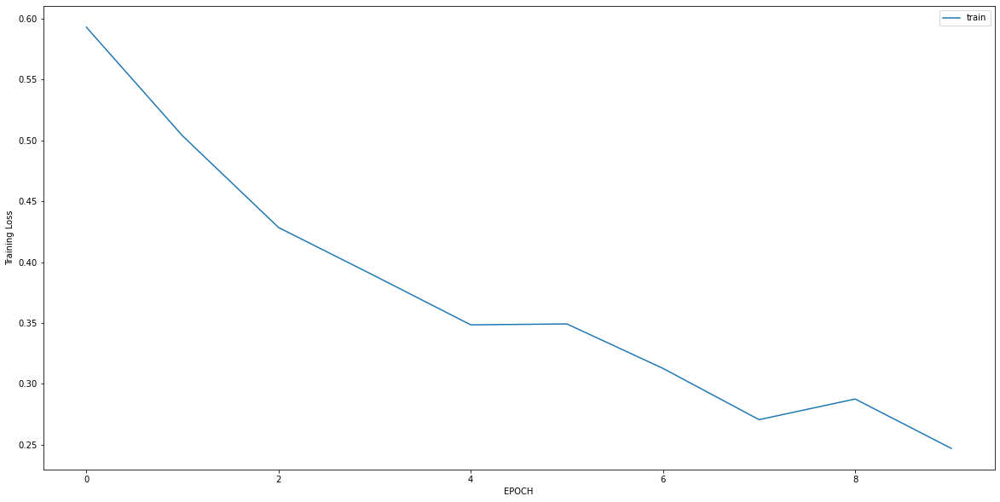

Epoch 1/10
4/4 [==============================] - 0s 7ms/step - loss: 1.5804 - accuracy: 0.3776
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 1.0144 - accuracy: 0.6020
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 0.4611 - accuracy: 0.7959
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3774 - accuracy: 0.8469
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3705 - accuracy: 0.8571
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3656 - accuracy: 0.8265
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3447 - accuracy: 0.8571
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3963 - accuracy: 0.8061
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3753 - accuracy: 0.8571
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3438 - accuracy: 0.8571


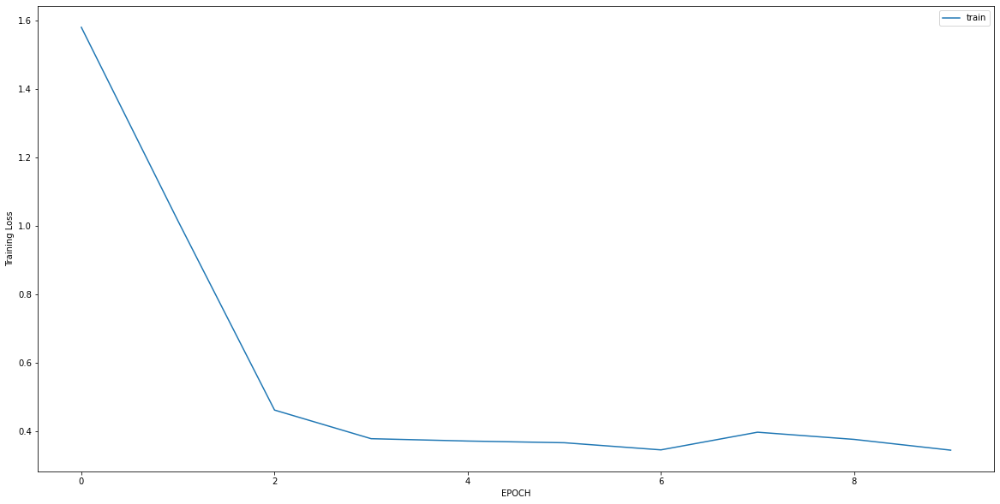

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 2.9379 - accuracy: 0.0000e+00
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 2.3665 - accuracy: 0.0000e+00
Epoch 3/10
6/6 [==============================] - 0s 6ms/step - loss: 1.8968 - accuracy: 0.0111
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 1.2913 - accuracy: 0.0556
Epoch 5/10
6/6 [==============================] - 0s 4ms/step - loss: 0.8691 - accuracy: 0.3611
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.5226 - accuracy: 0.8056
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.3625 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 4ms/step - loss: 0.2802 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2238 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1870 - accuracy: 1.0000


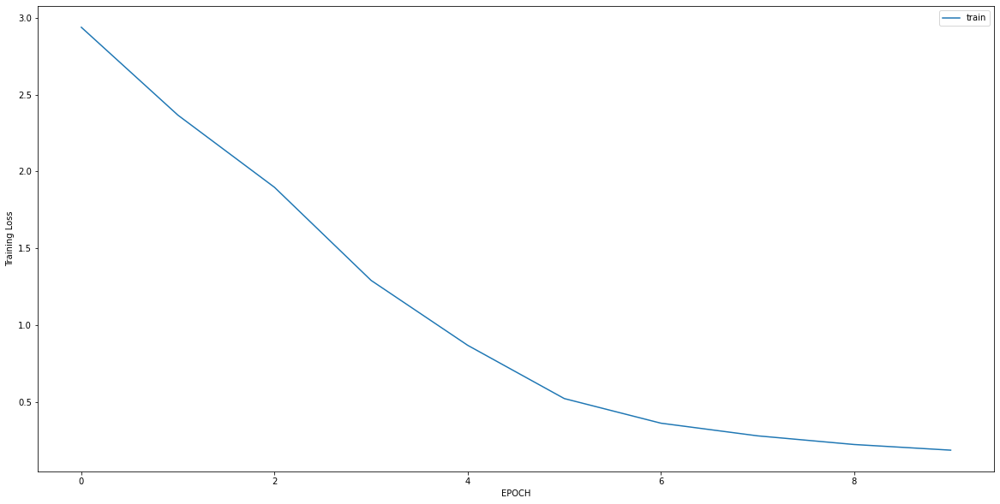

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9563 - accuracy: 0.4969
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8893 - accuracy: 0.5094
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7560 - accuracy: 0.5943
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6453 - accuracy: 0.6604
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5765 - accuracy: 0.6981
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5285 - accuracy: 0.7358
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4627 - accuracy: 0.7830
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4213 - accuracy: 0.8082
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3933 - accuracy: 0.8333
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3728 - accuracy: 0.8522


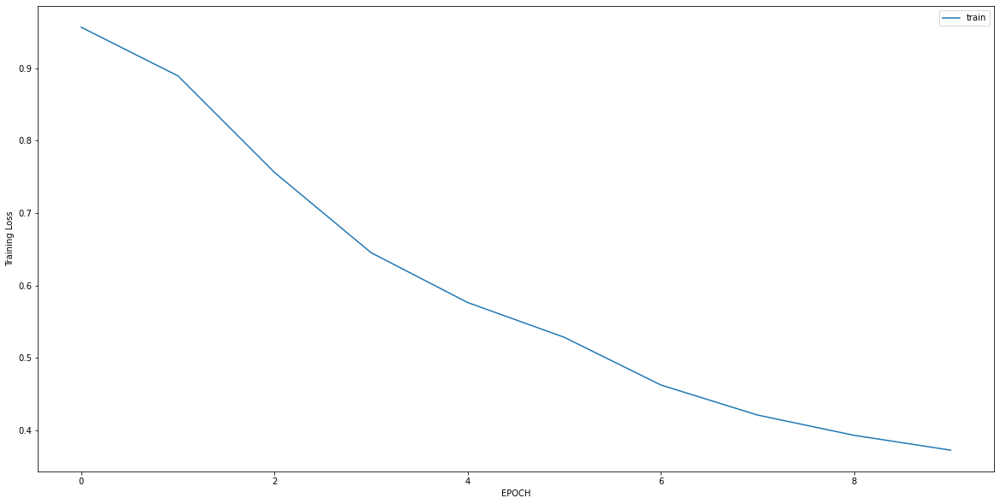

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 0.5841 - accuracy: 0.7217
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5677 - accuracy: 0.7311
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.5399 - accuracy: 0.7217
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.5229 - accuracy: 0.7358
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5449 - accuracy: 0.7358
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5089 - accuracy: 0.7453
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5035 - accuracy: 0.7547
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4911 - accuracy: 0.7406
Epoch 9/10
7/7 [==============================] - 0s 6ms/step - loss: 0.4640 - accuracy: 0.7547
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5100 - accuracy: 0.7406


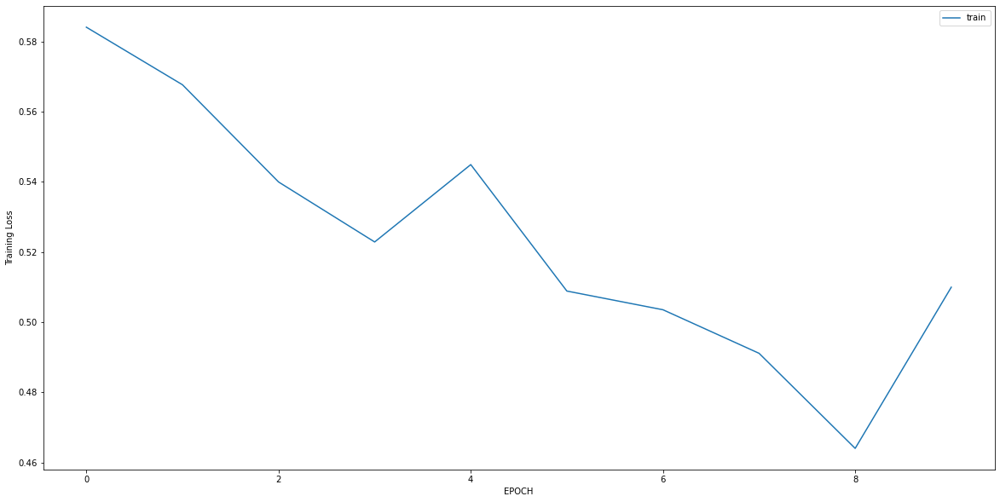

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7067 - accuracy: 0.5254
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6088 - accuracy: 0.6186
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5273 - accuracy: 0.7034
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4204 - accuracy: 0.8602
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3941 - accuracy: 0.8559
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3603 - accuracy: 0.8771
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3227 - accuracy: 0.9153
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2963 - accuracy: 0.9153
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3005 - accuracy: 0.9237
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2617 - accuracy: 0.9407


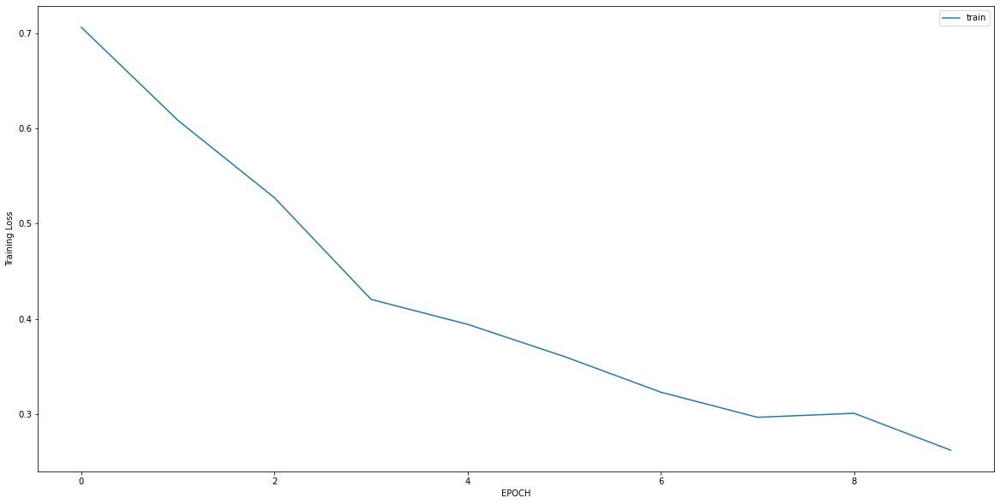

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4919 - accuracy: 0.7842
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3837 - accuracy: 0.8376
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3406 - accuracy: 0.8956
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3193 - accuracy: 0.8770
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2791 - accuracy: 0.9095
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2821 - accuracy: 0.9049
Epoch 7/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2439 - accuracy: 0.9281
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2281 - accuracy: 0.9374
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2013 - accuracy: 0.9374
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1740 - accuracy: 0.9629


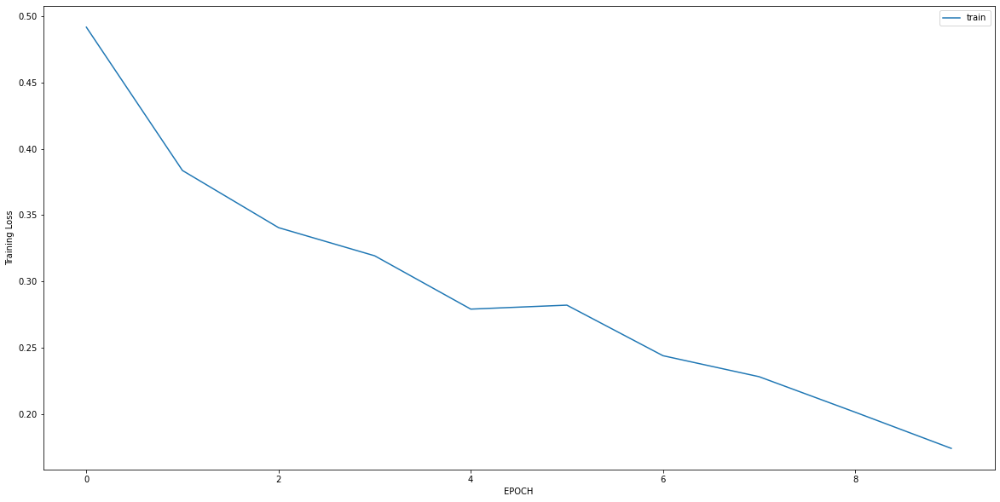

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8859 - accuracy: 0.5037
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6255 - accuracy: 0.5852
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3593 - accuracy: 0.8593
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3725 - accuracy: 0.8667
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3650 - accuracy: 0.8852
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3054 - accuracy: 0.9000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2673 - accuracy: 0.9148
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2743 - accuracy: 0.9370
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2757 - accuracy: 0.9074
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2752 - accuracy: 0.9037


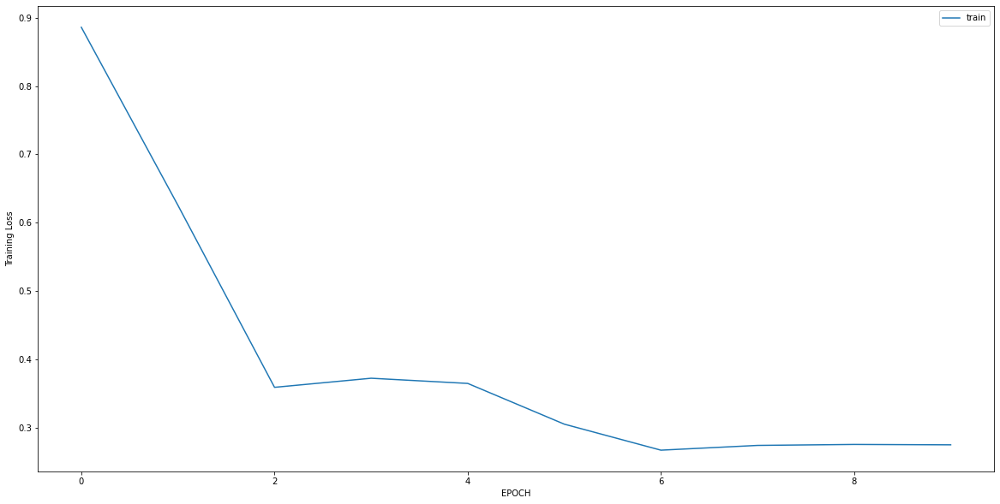

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9696 - accuracy: 0.5484
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.8516 - accuracy: 0.5645
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5852 - accuracy: 0.6210
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3504 - accuracy: 0.8548
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2334 - accuracy: 0.9395
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2342 - accuracy: 0.9395
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1811 - accuracy: 0.9597
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1802 - accuracy: 0.9395
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1392 - accuracy: 0.9798
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 0.9839


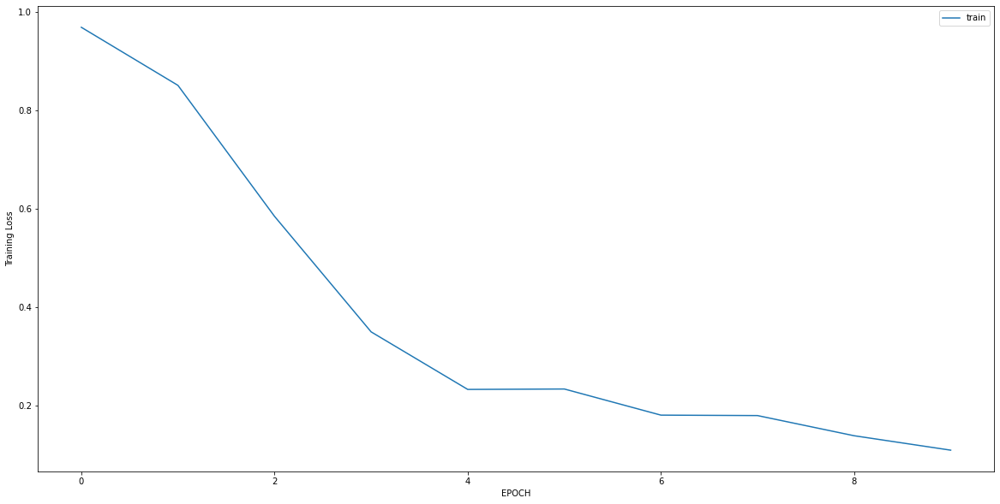

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.5372 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.6604 - accuracy: 0.0536
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3712 - accuracy: 0.7816
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0175 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0063 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0051 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0045 - accuracy: 1.0000


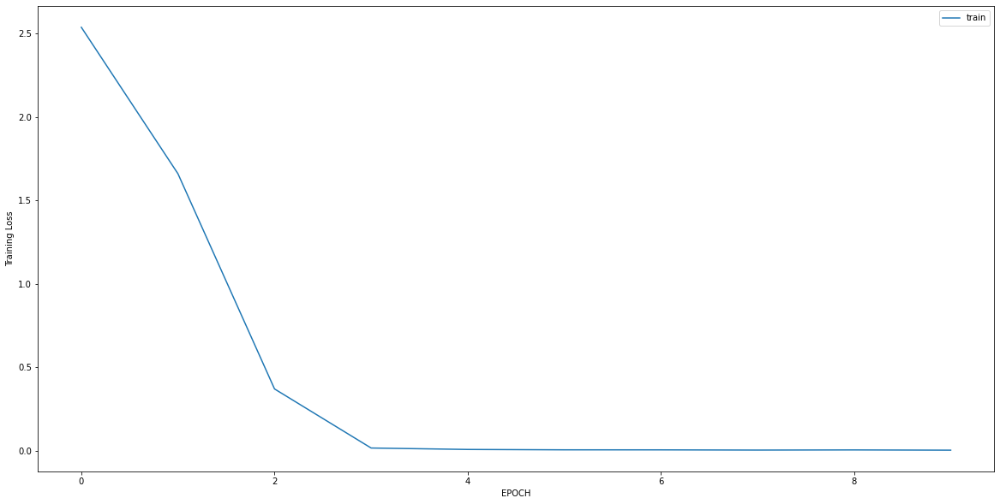

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 0.9193 - accuracy: 0.3776
Epoch 2/10
4/4 [==============================] - 0s 5ms/step - loss: 0.7395 - accuracy: 0.4796
Epoch 3/10
4/4 [==============================] - 0s 5ms/step - loss: 0.6133 - accuracy: 0.7041
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 0.5306 - accuracy: 0.7245
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4897 - accuracy: 0.7857
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4413 - accuracy: 0.7959
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4322 - accuracy: 0.7857
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3314 - accuracy: 0.8673
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3513 - accuracy: 0.8776
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3330 - accuracy: 0.8878


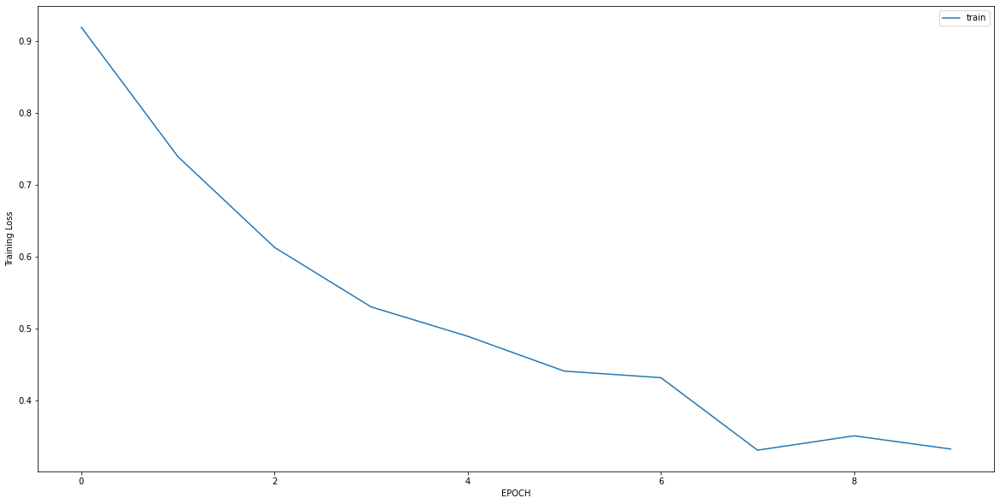

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5481 - accuracy: 0.7797
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3518 - accuracy: 0.8729
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3090 - accuracy: 0.8898
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3119 - accuracy: 0.9025
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2480 - accuracy: 0.9237
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2630 - accuracy: 0.9068
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2436 - accuracy: 0.9492
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2011 - accuracy: 0.9322
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1978 - accuracy: 0.9364
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2002 - accuracy: 0.9492


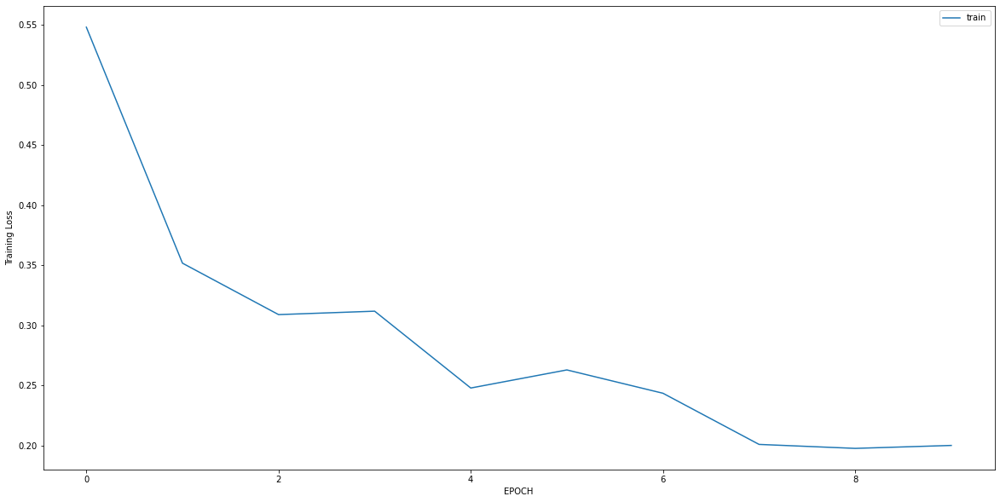

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1594 - accuracy: 0.9467
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1592 - accuracy: 0.9590
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1482 - accuracy: 0.9590
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1732 - accuracy: 0.9426
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1627 - accuracy: 0.9467
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1604 - accuracy: 0.9508
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1347 - accuracy: 0.9549
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1324 - accuracy: 0.9672
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1397 - accuracy: 0.9590
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1516 - accuracy: 0.9549


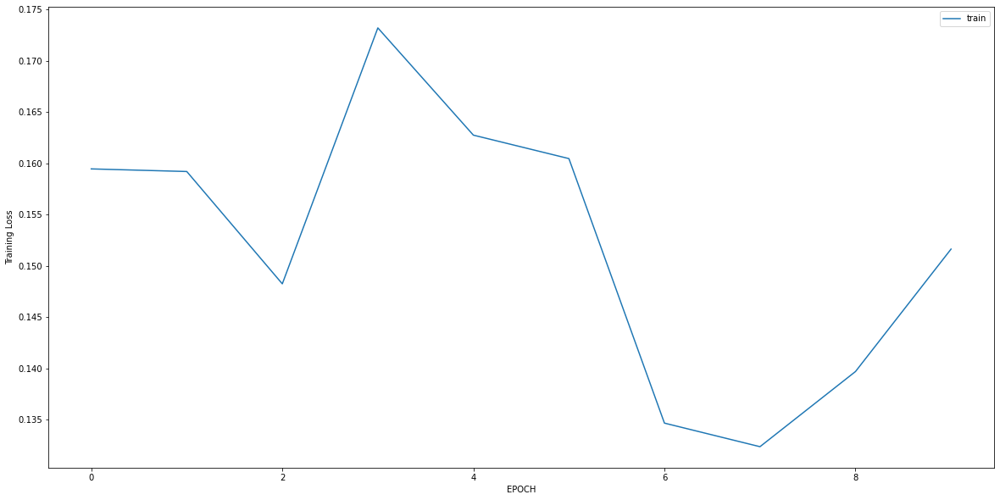

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1334 - accuracy: 0.9793
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1406 - accuracy: 0.9690
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1548 - accuracy: 0.9621
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1384 - accuracy: 0.9655
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1504 - accuracy: 0.9552
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1642 - accuracy: 0.9483
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1530 - accuracy: 0.9552
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1361 - accuracy: 0.9690
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1241 - accuracy: 0.9655
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1345 - accuracy: 0.9621


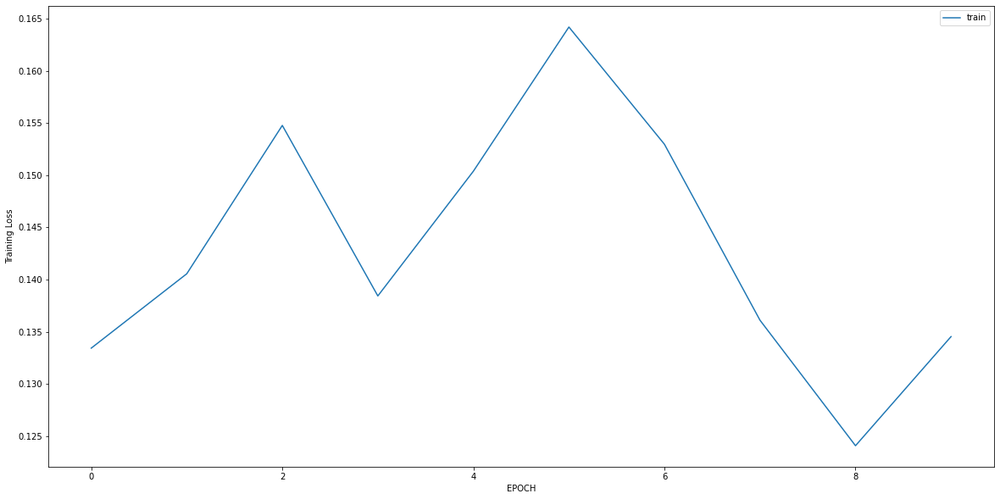

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2638 - accuracy: 0.9098
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3802 - accuracy: 0.8824
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3663 - accuracy: 0.8745
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3214 - accuracy: 0.8863
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2751 - accuracy: 0.8902
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2509 - accuracy: 0.9098
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2314 - accuracy: 0.9216
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2267 - accuracy: 0.9216
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2574 - accuracy: 0.9059
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2384 - accuracy: 0.9098


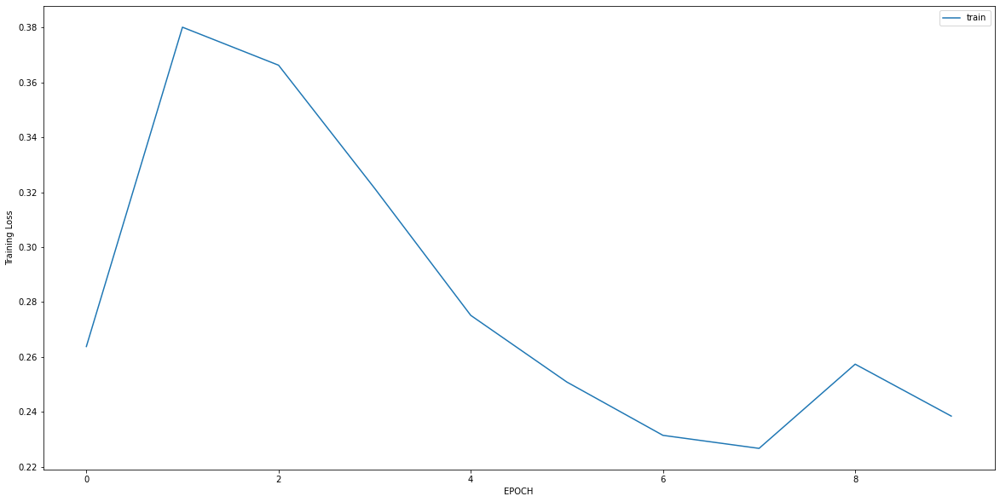

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 2.3892 - accuracy: 0.3993
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2755 - accuracy: 0.4627
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2925 - accuracy: 0.9067
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3733 - accuracy: 0.8657
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3583 - accuracy: 0.8582
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3383 - accuracy: 0.8769
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3036 - accuracy: 0.9030
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2804 - accuracy: 0.9030
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2531 - accuracy: 0.9254
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2413 - accuracy: 0.9254


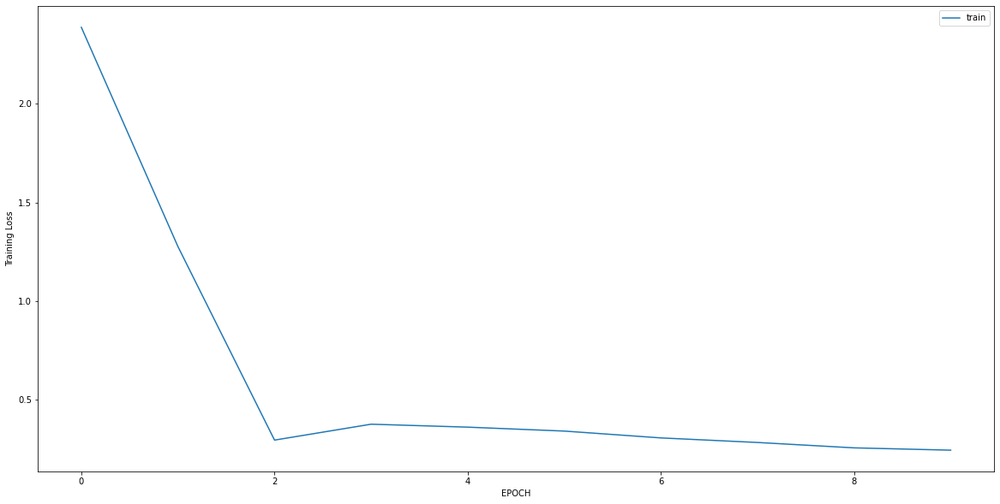

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3078 - accuracy: 0.8492
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0572 - accuracy: 0.9960
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0267 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0211 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0169 - accuracy: 1.0000


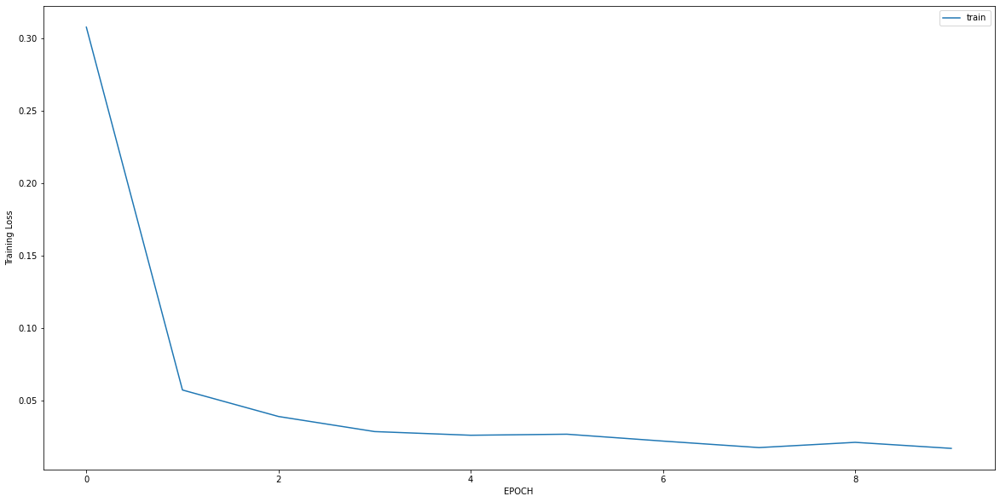

Epoch 1/10
6/6 [==============================] - 0s 6ms/step - loss: 0.2493 - accuracy: 0.9056
Epoch 2/10
6/6 [==============================] - 0s 6ms/step - loss: 0.1177 - accuracy: 0.9833
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0621 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0517 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 7ms/step - loss: 0.0492 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 1.0000


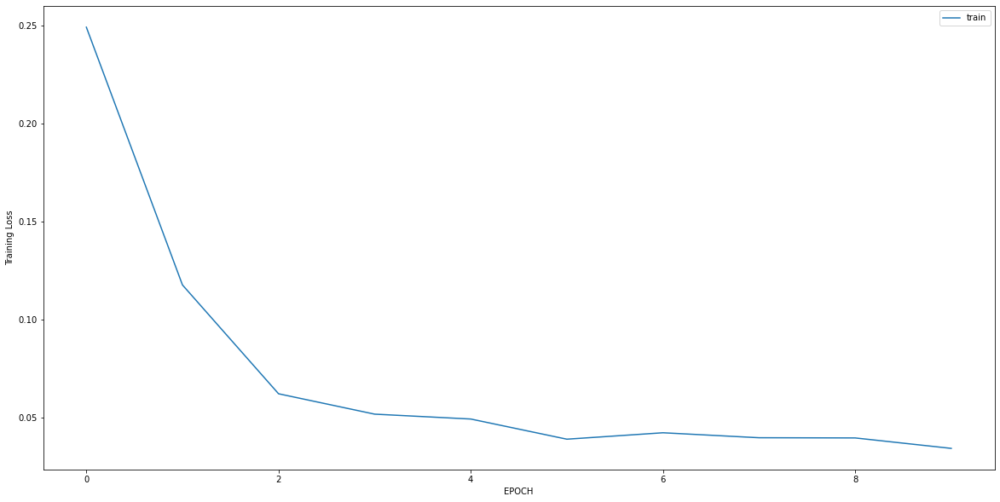

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4424 - accuracy: 0.8736
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3499 - accuracy: 0.8953
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2543 - accuracy: 0.9134
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2001 - accuracy: 0.9458
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1936 - accuracy: 0.9567
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1557 - accuracy: 0.9495
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1437 - accuracy: 0.9675
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1361 - accuracy: 0.9711
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1281 - accuracy: 0.9711
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1215 - accuracy: 0.9711


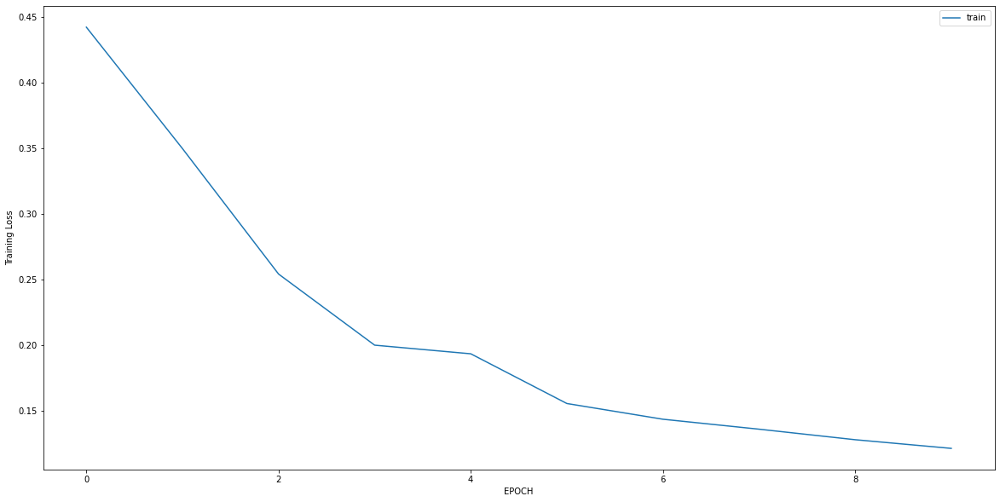

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.9932 - accuracy: 0.7678
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5395 - accuracy: 0.8015
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3645 - accuracy: 0.8614
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3287 - accuracy: 0.8502
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3160 - accuracy: 0.8839
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2764 - accuracy: 0.8801
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3151 - accuracy: 0.8577
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2588 - accuracy: 0.9026
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2635 - accuracy: 0.8989
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2534 - accuracy: 0.9101


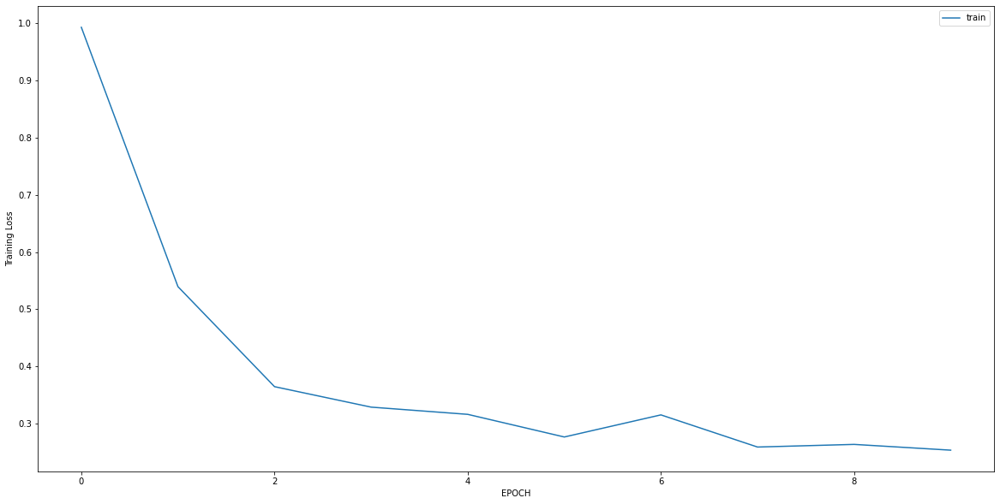

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.8035 - accuracy: 0.6189
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6375 - accuracy: 0.7509
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5663 - accuracy: 0.8302
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5416 - accuracy: 0.8226
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4369 - accuracy: 0.8340
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4136 - accuracy: 0.8566
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4004 - accuracy: 0.8453
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3789 - accuracy: 0.8528
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3809 - accuracy: 0.8415
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3063 - accuracy: 0.8868


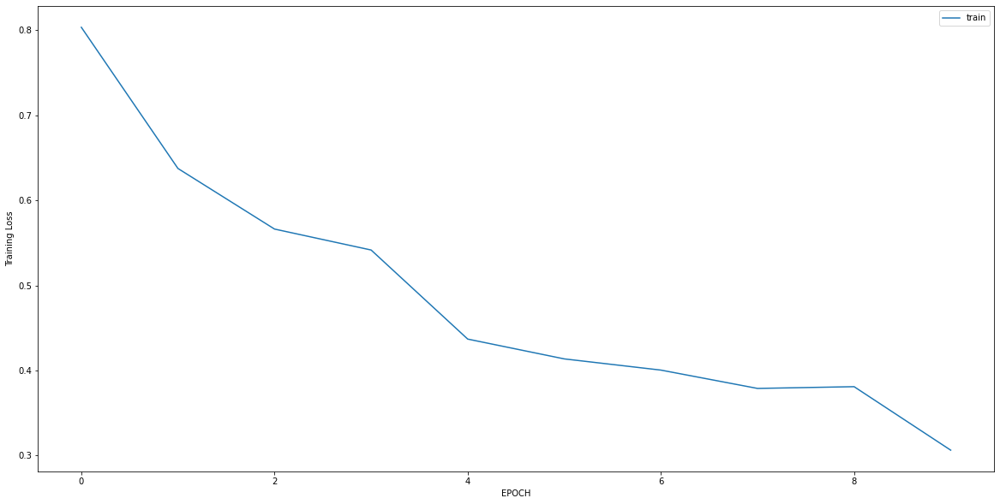

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 3.1103 - accuracy: 0.0000e+00
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 1.4986 - accuracy: 0.1102
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.6123 - accuracy: 0.6509
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.3841 - accuracy: 0.9948
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.2792 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.2167 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1815 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1515 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1385 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1182 - accuracy: 1.0000


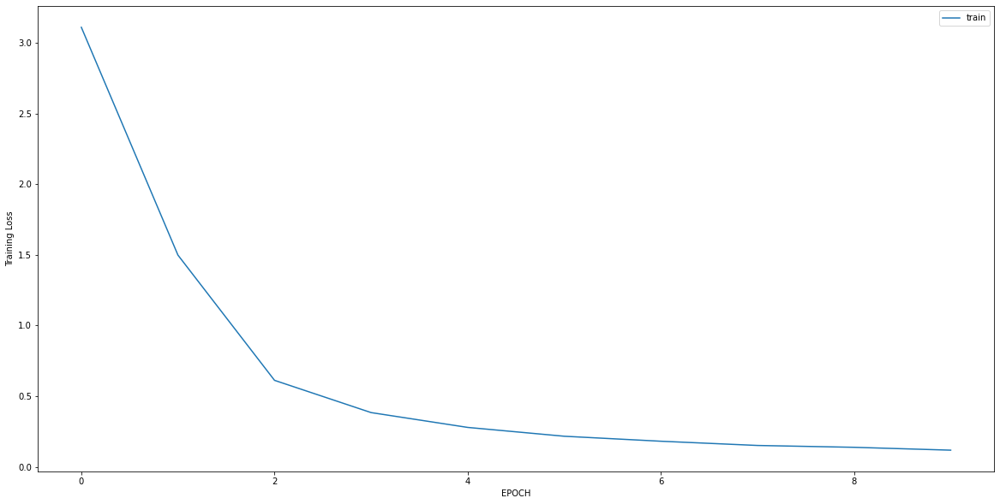

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2215 - accuracy: 0.5037
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1471 - accuracy: 0.5037
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0529 - accuracy: 0.5074
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9286 - accuracy: 0.5074
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8523 - accuracy: 0.5259
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7671 - accuracy: 0.5556
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6757 - accuracy: 0.5963
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6093 - accuracy: 0.6407
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5347 - accuracy: 0.6963
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4795 - accuracy: 0.7259


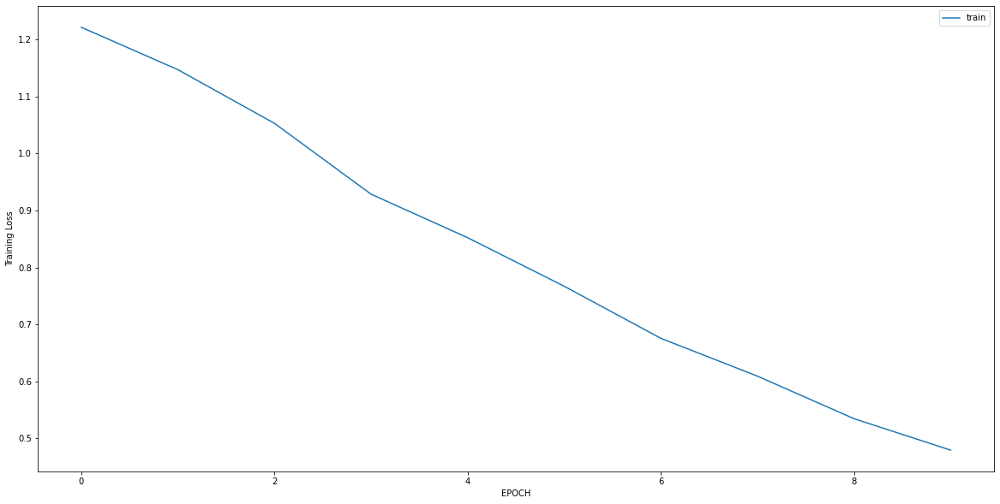

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6511 - accuracy: 0.5903
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6164 - accuracy: 0.6181
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6242 - accuracy: 0.6528
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5890 - accuracy: 0.6667
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5436 - accuracy: 0.7222
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5716 - accuracy: 0.7083
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5258 - accuracy: 0.7569
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5486 - accuracy: 0.6806
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5400 - accuracy: 0.7083
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5449 - accuracy: 0.6944


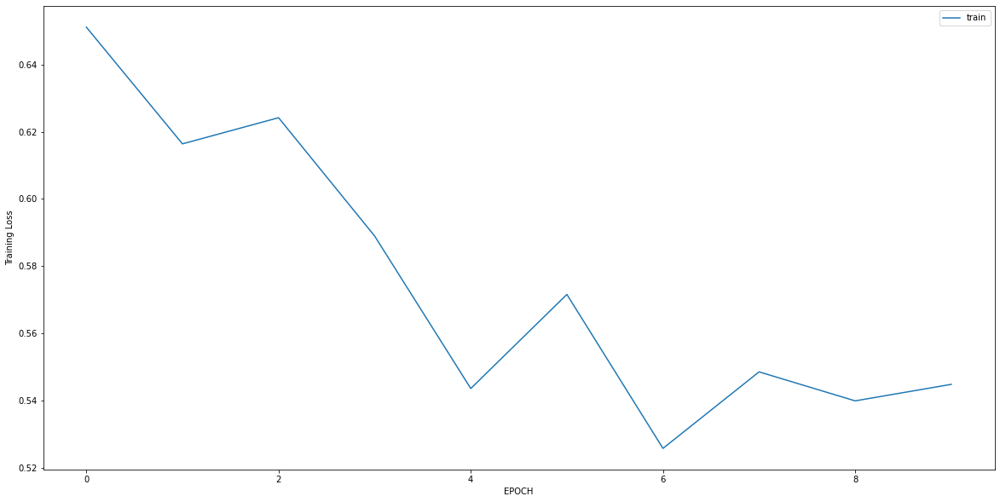

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6374 - accuracy: 0.6597
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5183 - accuracy: 0.8403
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3992 - accuracy: 0.9790
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2999 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2024 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1020 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0795 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0651 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0583 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0498 - accuracy: 1.0000


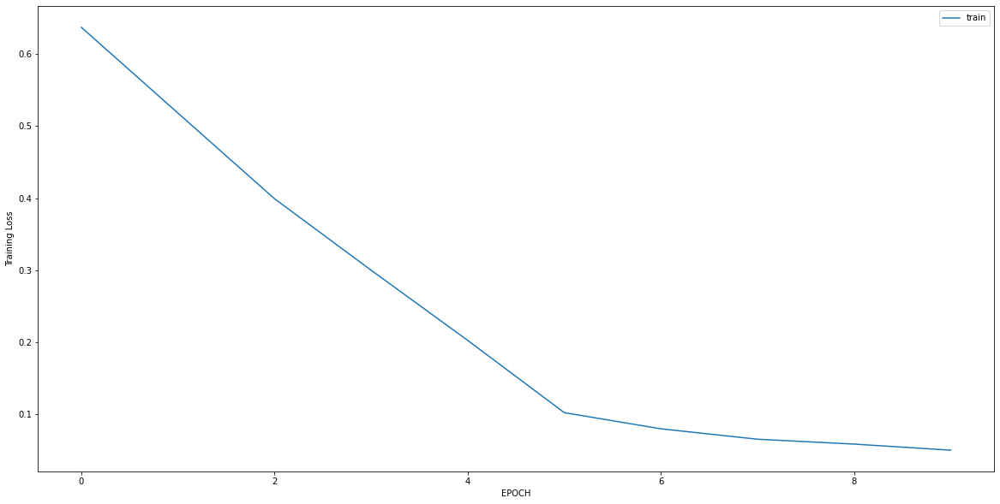

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.8614 - accuracy: 0.4286
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2811 - accuracy: 0.9306
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0752 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0282 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0237 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0231 - accuracy: 1.0000


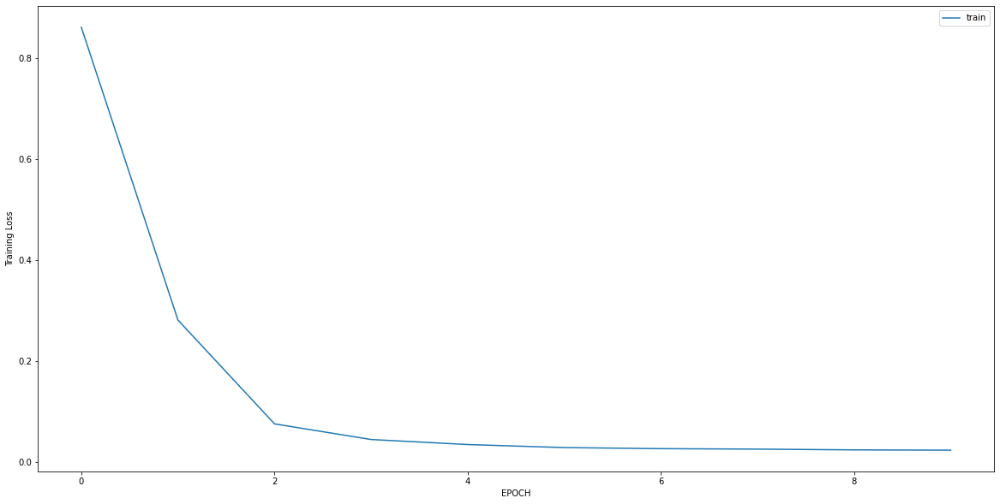

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7099 - accuracy: 0.5993
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6073 - accuracy: 0.6397
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5188 - accuracy: 0.6970
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4198 - accuracy: 0.7778
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3858 - accuracy: 0.8013
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3408 - accuracy: 0.8586
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3097 - accuracy: 0.8923
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2712 - accuracy: 0.9192
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2805 - accuracy: 0.9057
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2509 - accuracy: 0.9360


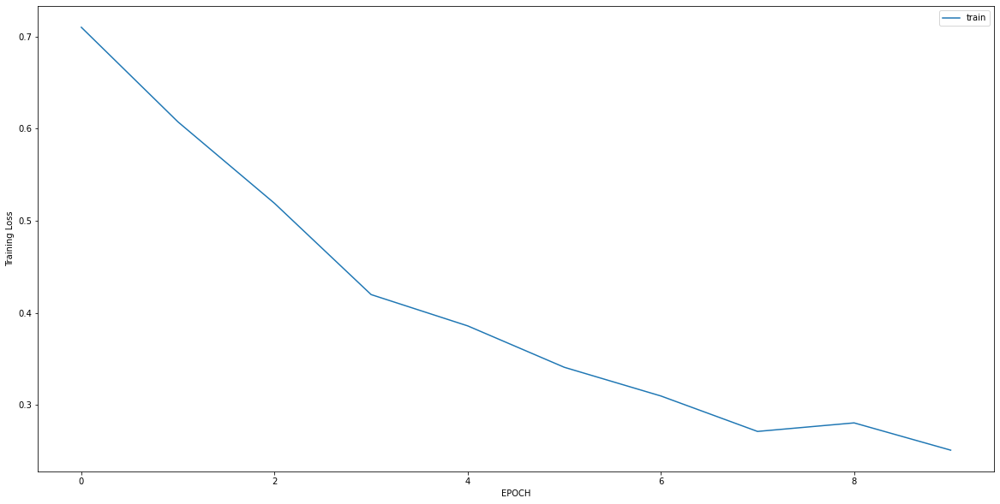

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0312 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0265 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0311 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0288 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0239 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0241 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0246 - accuracy: 1.0000


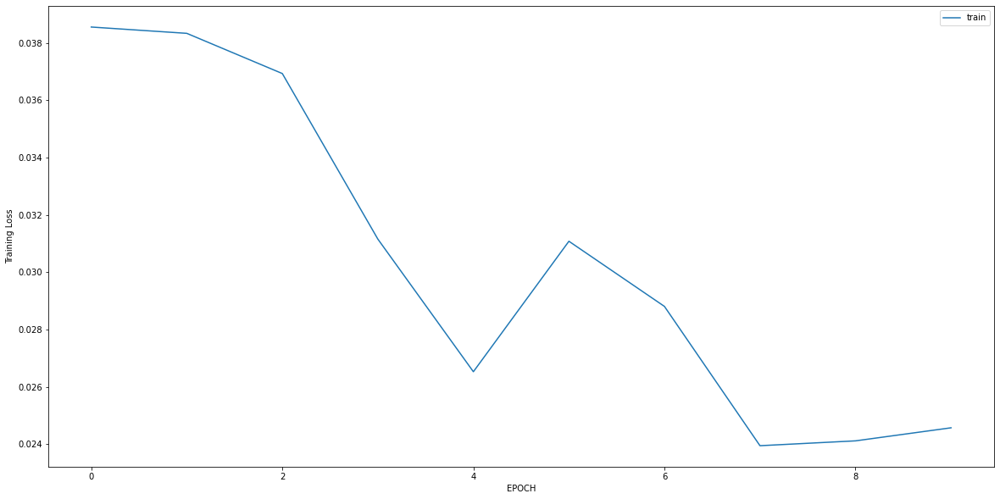

Epoch 1/10
7/7 [==============================] - 0s 7ms/step - loss: 0.5519 - accuracy: 0.7877
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.4489 - accuracy: 0.7642
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4778 - accuracy: 0.7547
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4420 - accuracy: 0.7925
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4018 - accuracy: 0.7689
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3630 - accuracy: 0.8396
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3901 - accuracy: 0.8302
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3726 - accuracy: 0.8396
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3966 - accuracy: 0.7642
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3019 - accuracy: 0.8443


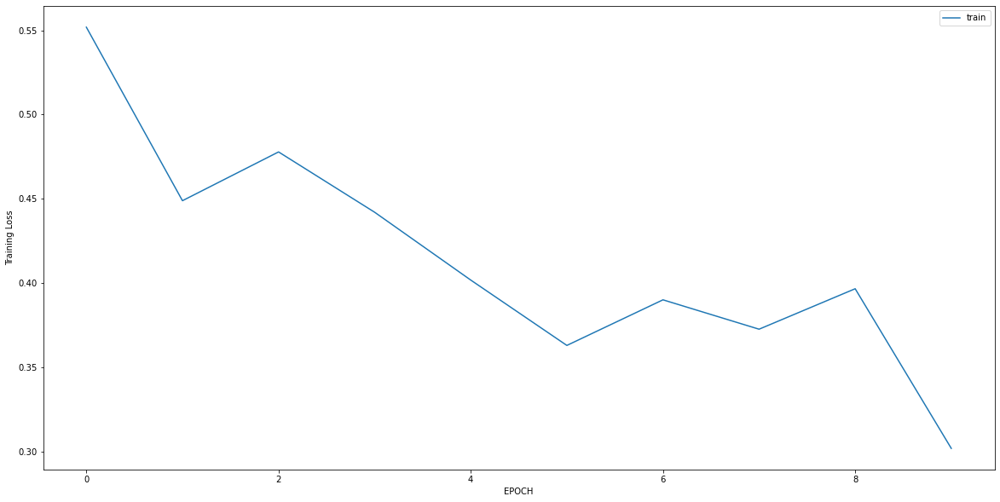

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2846 - accuracy: 0.9087
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2585 - accuracy: 0.9246
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2574 - accuracy: 0.9206
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2520 - accuracy: 0.9286
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2514 - accuracy: 0.9206
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2310 - accuracy: 0.9325
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2385 - accuracy: 0.9365
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2251 - accuracy: 0.9325
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2269 - accuracy: 0.9365
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2305 - accuracy: 0.9325


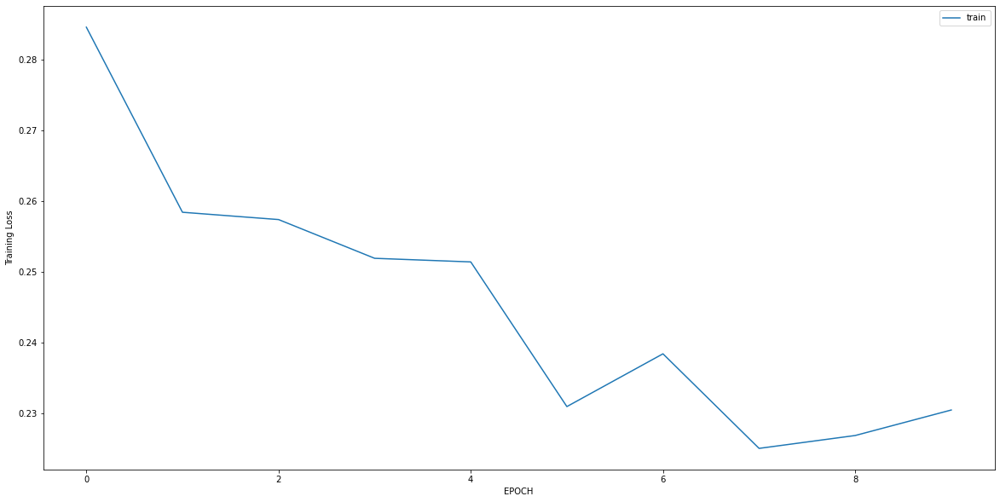

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6314 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6554 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5888 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5431 - accuracy: 0.8186
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4967 - accuracy: 0.8186
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5244 - accuracy: 0.8186
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4909 - accuracy: 0.8186
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5114 - accuracy: 0.8101
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4504 - accuracy: 0.8312
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4303 - accuracy: 0.8397


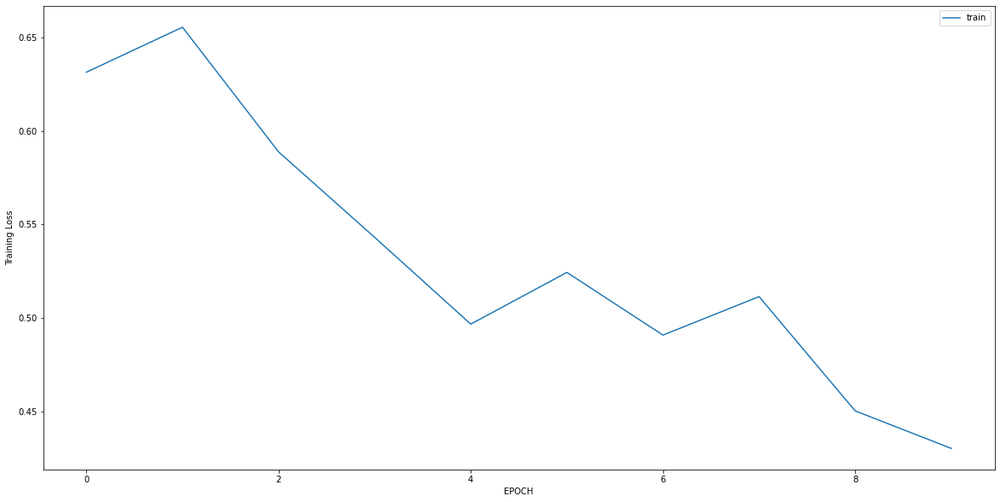

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1543 - accuracy: 0.9909
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0556 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0331 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0272 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0242 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0094 - accuracy: 1.0000


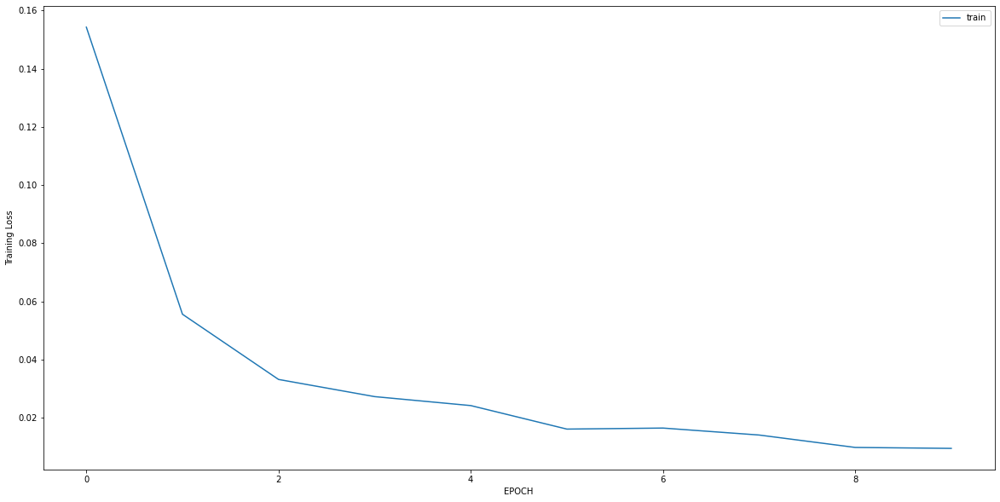

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0630 - accuracy: 0.9885
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0288 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0193 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0186 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0214 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0158 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0162 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0144 - accuracy: 1.0000


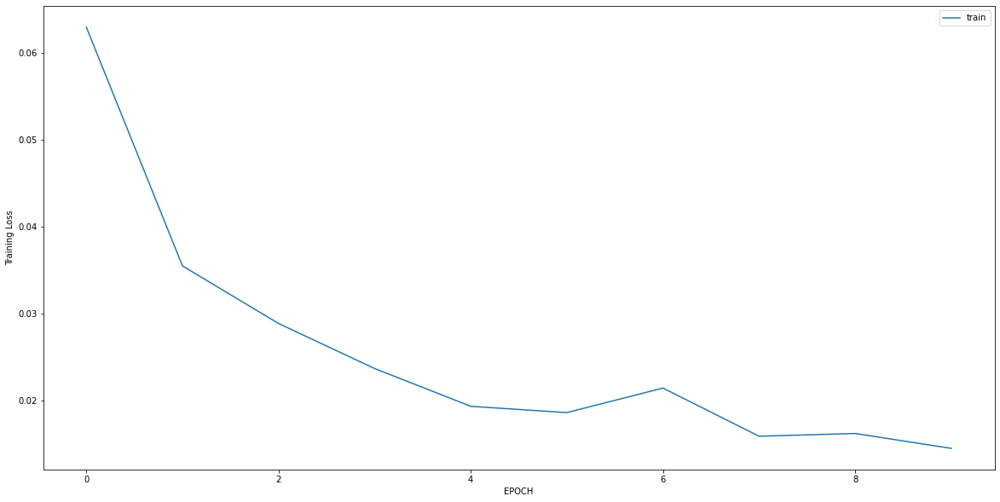

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8934 - accuracy: 0.7781
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4656 - accuracy: 0.8510
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3509 - accuracy: 0.8576
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3189 - accuracy: 0.8808
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3286 - accuracy: 0.8874
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3057 - accuracy: 0.8907
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2914 - accuracy: 0.8841
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2883 - accuracy: 0.8874
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2746 - accuracy: 0.9106
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2658 - accuracy: 0.9139


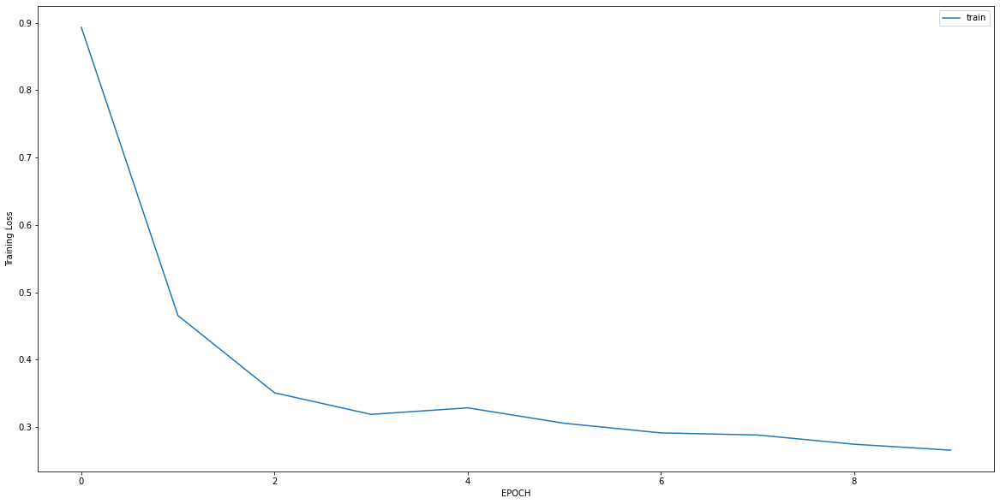

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.7543 - accuracy: 0.7651
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5860 - accuracy: 0.8007
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3678 - accuracy: 0.8826
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2058 - accuracy: 0.9288
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1485 - accuracy: 0.9644
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1260 - accuracy: 0.9786
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1246 - accuracy: 0.9822
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0998 - accuracy: 0.9822
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1065 - accuracy: 0.9822
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1001 - accuracy: 0.9822


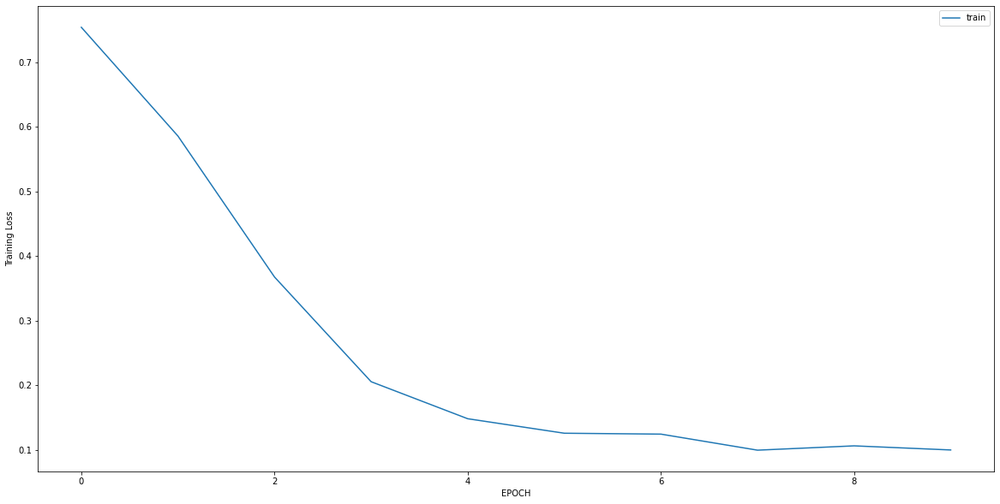

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8290 - accuracy: 0.6520
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3134 - accuracy: 0.8589
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2131 - accuracy: 0.9342
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2049 - accuracy: 0.9216
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1613 - accuracy: 0.9530
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1383 - accuracy: 0.9624
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1124 - accuracy: 0.9781
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0947 - accuracy: 0.9875
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0958 - accuracy: 0.9937
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0896 - accuracy: 0.9937


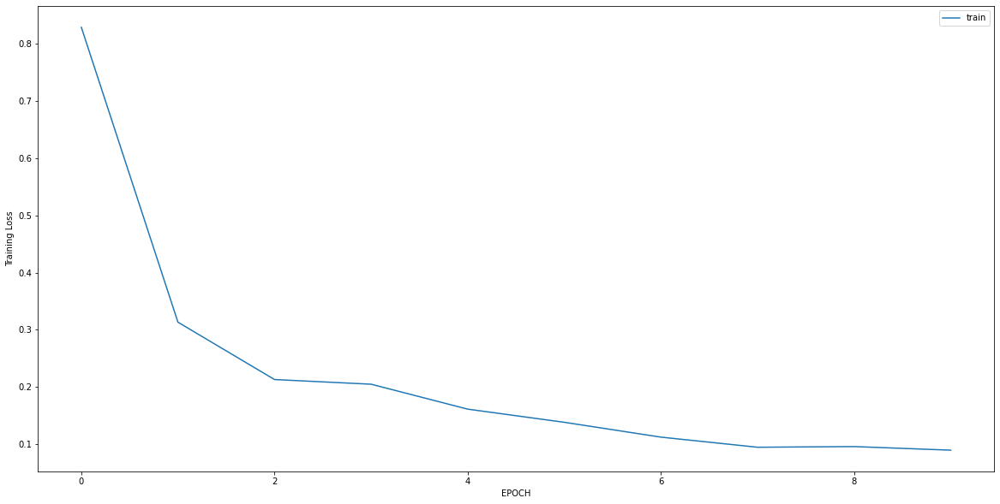

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4555 - accuracy: 0.8076
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2568 - accuracy: 0.9038
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2311 - accuracy: 0.9107
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1944 - accuracy: 0.9210
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1714 - accuracy: 0.9347
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1527 - accuracy: 0.9347
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1377 - accuracy: 0.9485
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1385 - accuracy: 0.9450
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1257 - accuracy: 0.9519
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1273 - accuracy: 0.9656


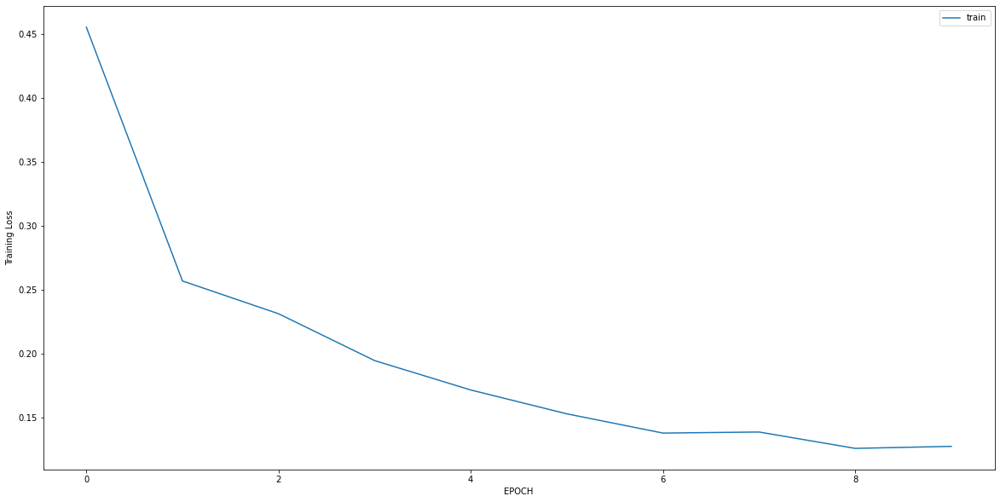

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4347 - accuracy: 0.7868
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1658 - accuracy: 0.9412
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1518 - accuracy: 0.9485
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1488 - accuracy: 0.9485
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1228 - accuracy: 0.9522
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1067 - accuracy: 0.9779
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1010 - accuracy: 0.9596
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0972 - accuracy: 0.9743
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0862 - accuracy: 0.9706
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0792 - accuracy: 0.9816


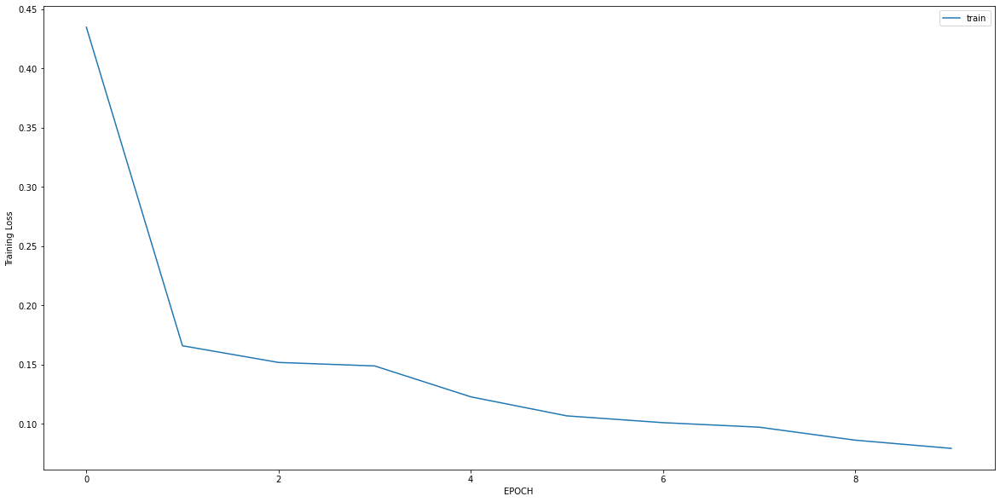

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.8011 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 2.6361 - accuracy: 0.0107
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.4357 - accuracy: 0.2071
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5133 - accuracy: 0.7214
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1386 - accuracy: 0.9714
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0472 - accuracy: 0.9964
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0251 - accuracy: 0.9964
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0151 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0088 - accuracy: 1.0000


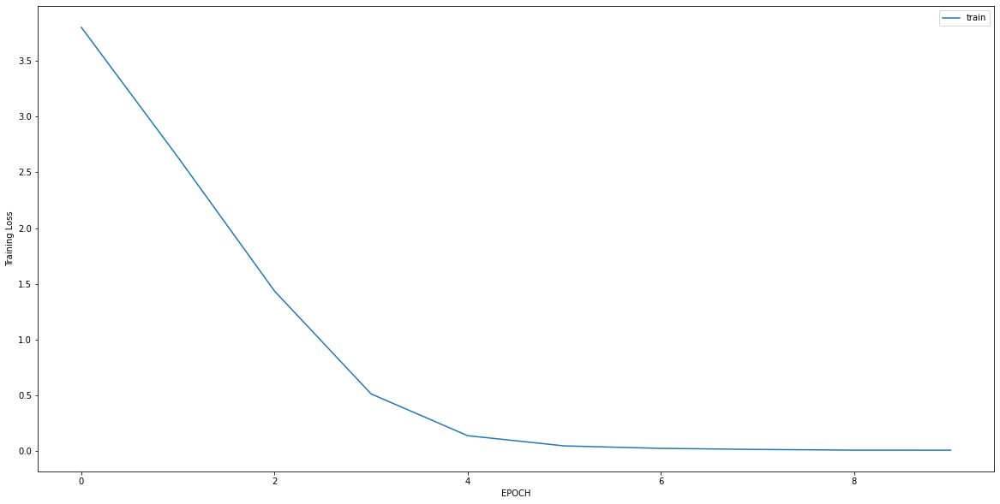

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.6809 - accuracy: 0.3309
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 1.4934 - accuracy: 0.3453
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.2910 - accuracy: 0.3885
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.1540 - accuracy: 0.3453
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9822 - accuracy: 0.3669
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8643 - accuracy: 0.4748
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8304 - accuracy: 0.4604
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.8585 - accuracy: 0.4317
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8162 - accuracy: 0.5108
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7294 - accuracy: 0.5396


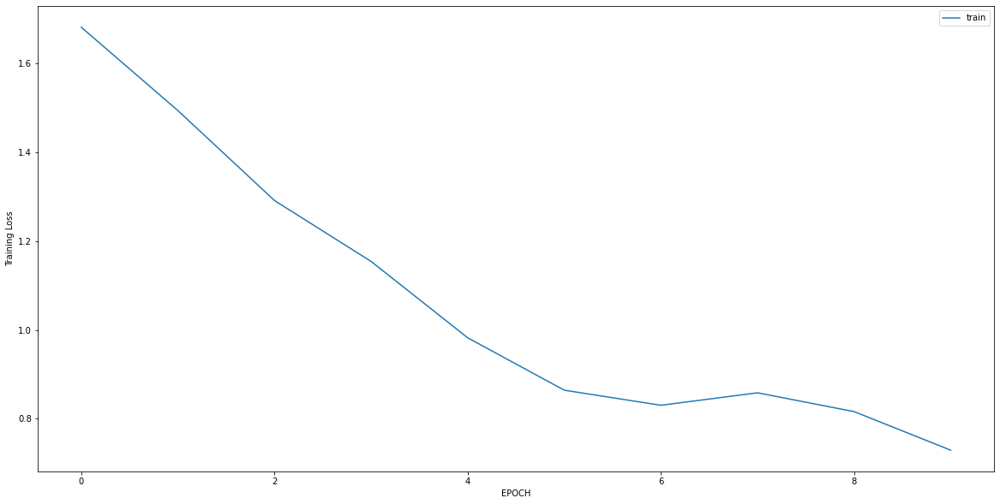

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 2.1999 - accuracy: 0.4462
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 1.4224 - accuracy: 0.5633
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8808 - accuracy: 0.6994
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6258 - accuracy: 0.7500
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4246 - accuracy: 0.8354
Epoch 6/10
10/10 [==============================] - ETA: 0s - loss: 0.5170 - accuracy: 0.81 - 0s 5ms/step - loss: 0.3234 - accuracy: 0.9146
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3180 - accuracy: 0.9051
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2774 - accuracy: 0.9146
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2660 - accuracy: 0.9146
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2

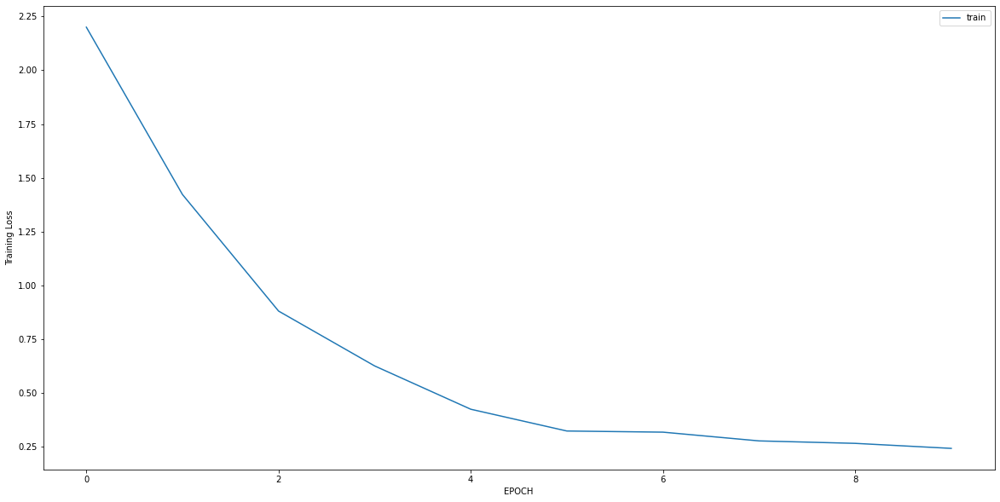

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9287 - accuracy: 0.6871
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0915 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0655 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0321 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0282 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0281 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0294 - accuracy: 1.0000


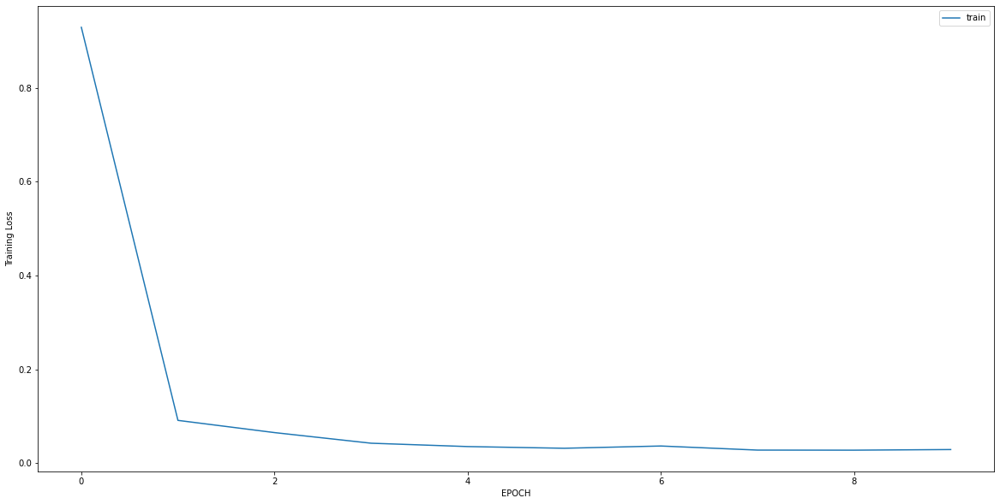

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4794 - accuracy: 0.8261
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4241 - accuracy: 0.8538
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4141 - accuracy: 0.8617
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3659 - accuracy: 0.8735
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3433 - accuracy: 0.8854
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3561 - accuracy: 0.8735
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3030 - accuracy: 0.8972
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2750 - accuracy: 0.9170
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3103 - accuracy: 0.8893
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2941 - accuracy: 0.8854


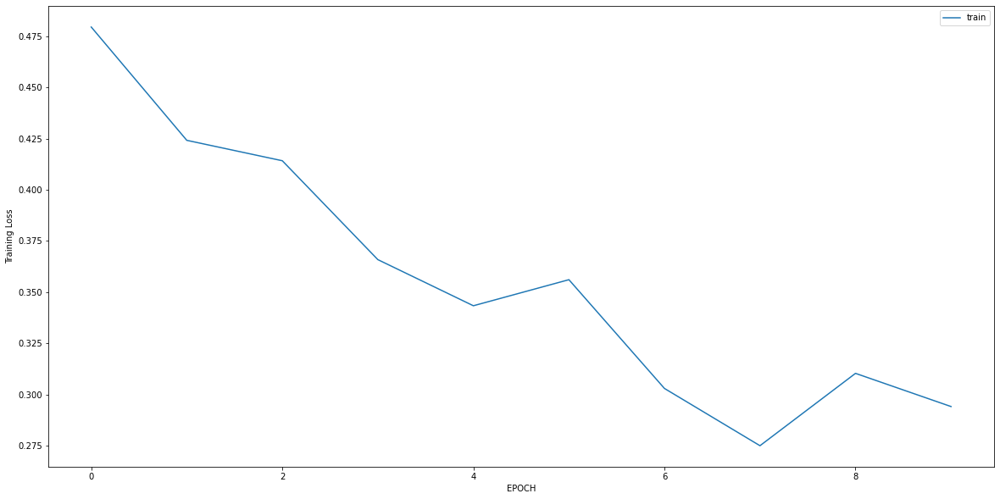

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5090 - accuracy: 0.7610
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4379 - accuracy: 0.7842
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3776 - accuracy: 0.8074
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3378 - accuracy: 0.8376
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3101 - accuracy: 0.8422
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2920 - accuracy: 0.8654
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2507 - accuracy: 0.8886
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2360 - accuracy: 0.9002
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2228 - accuracy: 0.9211
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1877 - accuracy: 0.9327


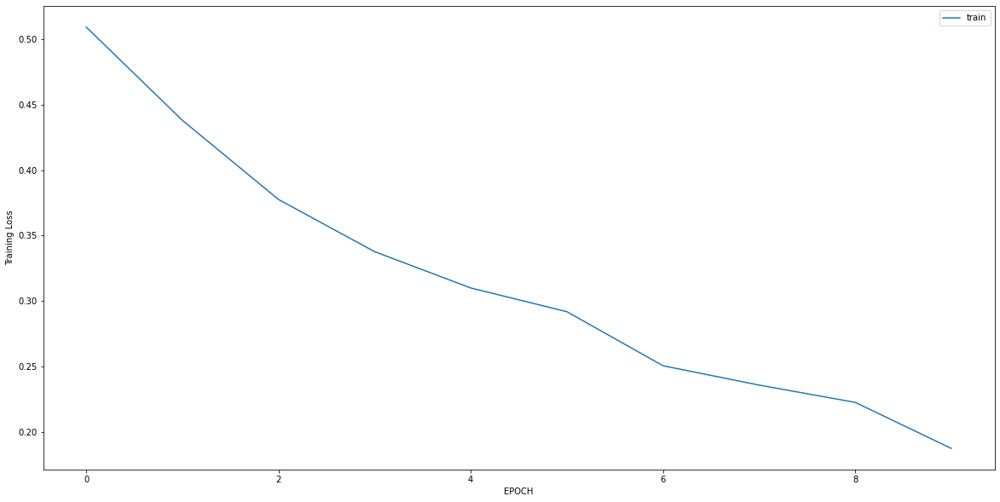

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.8128 - accuracy: 0.5552
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6075 - accuracy: 0.5516
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.3256 - accuracy: 0.5516
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1794 - accuracy: 0.5516
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9916 - accuracy: 0.5587
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8838 - accuracy: 0.5552
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8426 - accuracy: 0.5516
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7960 - accuracy: 0.5160
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7588 - accuracy: 0.5302
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7021 - accuracy: 0.5480


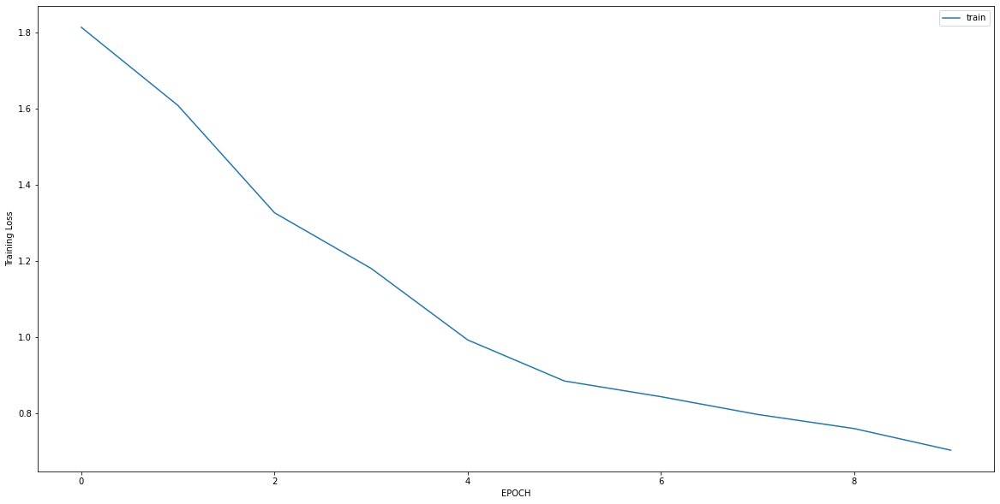

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6110 - accuracy: 0.6753
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4482 - accuracy: 0.8961
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3189 - accuracy: 0.9957
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2245 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1733 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1365 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1211 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1075 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0970 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0918 - accuracy: 1.0000


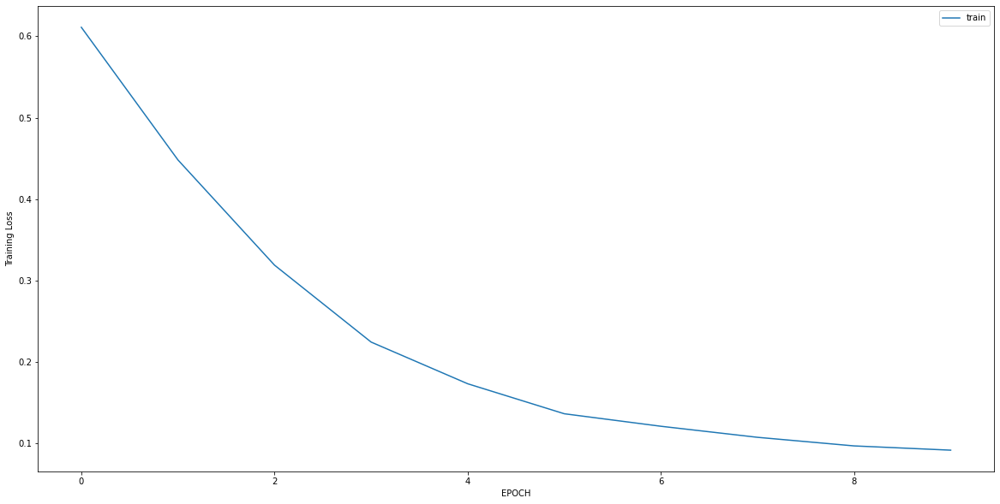

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.2317 - accuracy: 0.2847
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.1791 - accuracy: 0.2847
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 1.1249 - accuracy: 0.2917
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9941 - accuracy: 0.3264
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8539 - accuracy: 0.3958
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7767 - accuracy: 0.5000
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7084 - accuracy: 0.5139
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6089 - accuracy: 0.6389
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5696 - accuracy: 0.7153
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5112 - accuracy: 0.7431


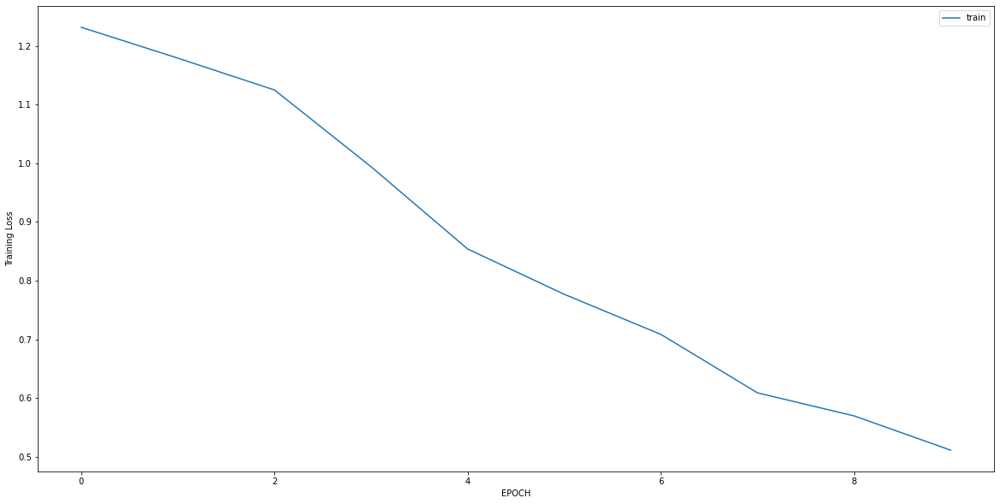

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3842 - accuracy: 0.8452
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3496 - accuracy: 0.8651
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3333 - accuracy: 0.8849
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2872 - accuracy: 0.9246
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2536 - accuracy: 0.9444
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2168 - accuracy: 0.9444
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1777 - accuracy: 0.9643
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1503 - accuracy: 0.9802
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1345 - accuracy: 0.9802
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1096 - accuracy: 0.9881


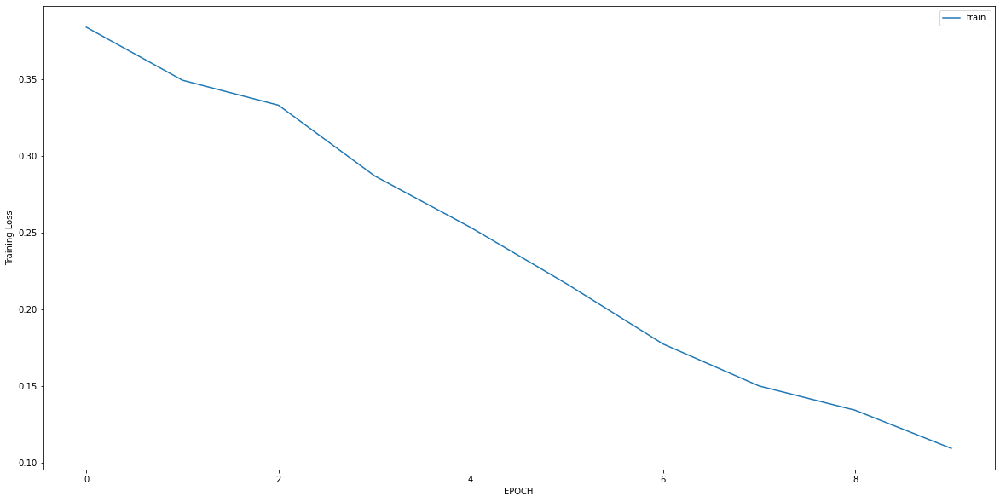

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4168 - accuracy: 0.8458
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3675 - accuracy: 0.8735
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3738 - accuracy: 0.8498
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3551 - accuracy: 0.8656
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3165 - accuracy: 0.8814
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2951 - accuracy: 0.8972
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2767 - accuracy: 0.9091
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2869 - accuracy: 0.9130
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2718 - accuracy: 0.9091
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2713 - accuracy: 0.9051


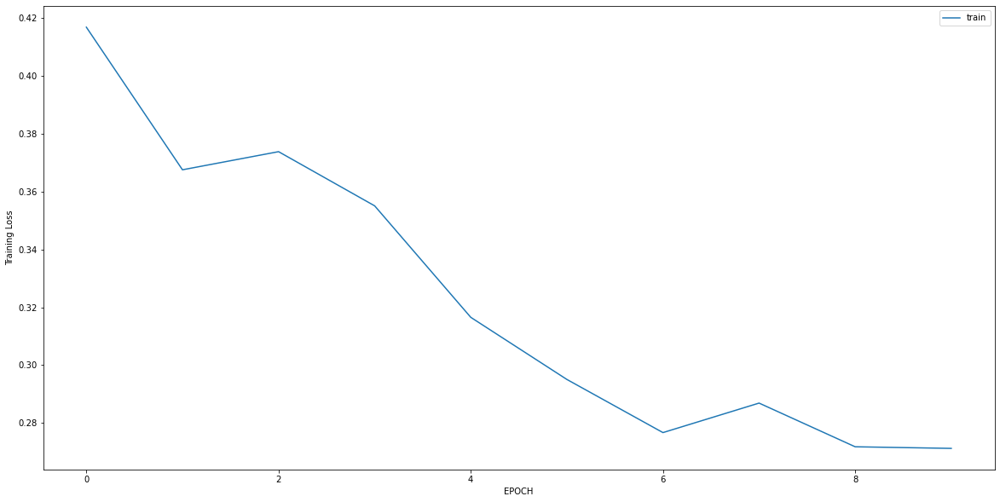

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2738 - accuracy: 0.9028
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1857 - accuracy: 0.9595
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1511 - accuracy: 0.9798
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1417 - accuracy: 0.9595
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1238 - accuracy: 0.9757
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0836 - accuracy: 0.9879
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0722 - accuracy: 0.9838
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1423 - accuracy: 0.9636
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2293 - accuracy: 0.9312
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0903 - accuracy: 0.9838


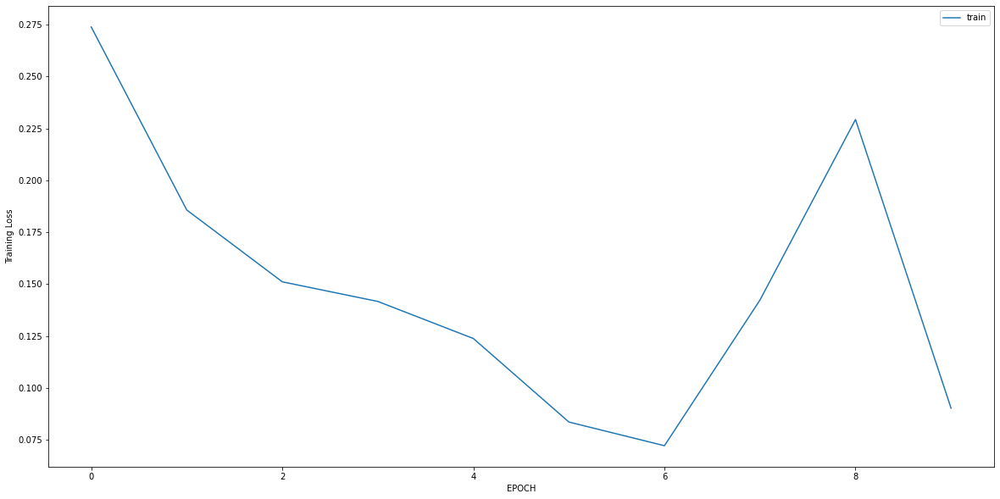

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 3.3425 - accuracy: 0.0035
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 1.5594 - accuracy: 0.1740
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.5679 - accuracy: 0.7047
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.2543 - accuracy: 0.9385
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1394 - accuracy: 0.9947
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0911 - accuracy: 0.9982
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0617 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0315 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0231 - accuracy: 1.0000


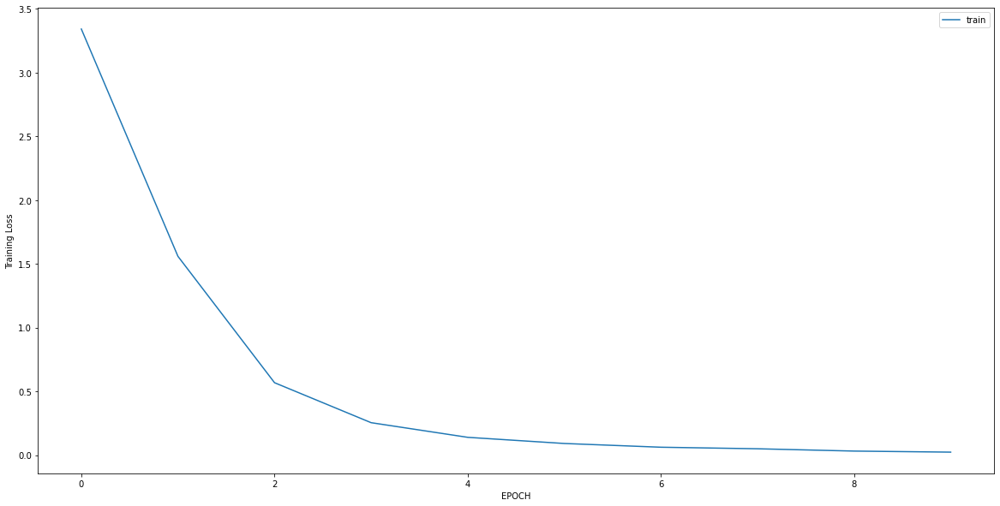

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 2.4119 - accuracy: 0.3070
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 1.4510 - accuracy: 0.3160
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.8290 - accuracy: 0.5372
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.5827 - accuracy: 0.6479
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3797 - accuracy: 0.8059
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3185 - accuracy: 0.8600
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2641 - accuracy: 0.9187
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2421 - accuracy: 0.9233
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2209 - accuracy: 0.9413
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1662 - accuracy: 0.9594


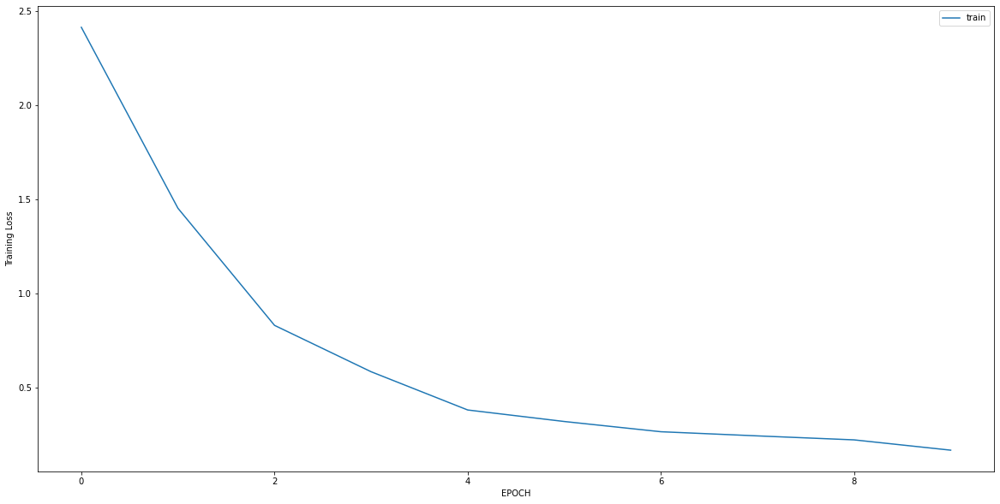

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3431 - accuracy: 0.9241
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2585 - accuracy: 0.9367
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1326 - accuracy: 0.9578
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1369 - accuracy: 0.9873
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1211 - accuracy: 0.9747
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0877 - accuracy: 0.9916
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0922 - accuracy: 0.9831
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0816 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0776 - accuracy: 0.9873
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0749 - accuracy: 0.9958


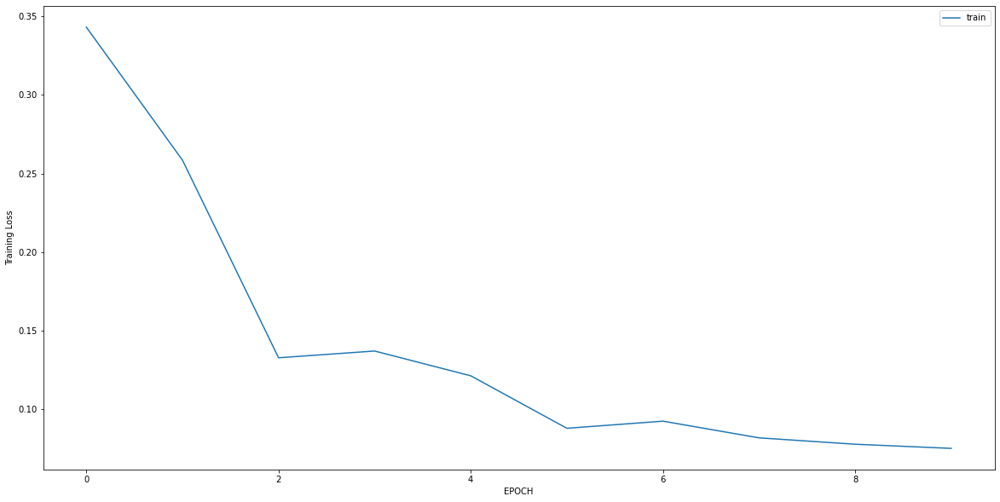

Epoch 1/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4970 - accuracy: 0.8121
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2886 - accuracy: 0.9244
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3223 - accuracy: 0.9114
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3107 - accuracy: 0.9050
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2912 - accuracy: 0.9093
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2848 - accuracy: 0.9050
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2730 - accuracy: 0.9158
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3391 - accuracy: 0.8877
Epoch 9/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2996 - accuracy: 0.9050
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2709 - accuracy: 0.9222


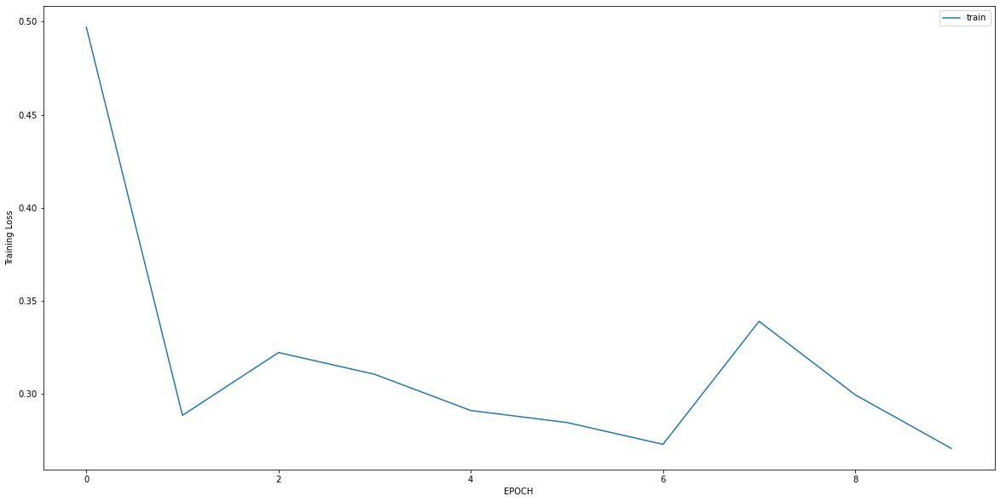

Epoch 1/10
2/2 [==============================] - 0s 7ms/step - loss: 3.4593 - accuracy: 0.0000e+00
Epoch 2/10
2/2 [==============================] - 0s 6ms/step - loss: 3.1132 - accuracy: 0.0000e+00
Epoch 3/10
2/2 [==============================] - 0s 7ms/step - loss: 2.8615 - accuracy: 0.0000e+00
Epoch 4/10
2/2 [==============================] - 0s 7ms/step - loss: 2.7096 - accuracy: 0.0000e+00
Epoch 5/10
2/2 [==============================] - 0s 6ms/step - loss: 2.4936 - accuracy: 0.0000e+00
Epoch 6/10
2/2 [==============================] - 0s 7ms/step - loss: 2.1954 - accuracy: 0.0000e+00
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 2.1165 - accuracy: 0.0357
Epoch 8/10
2/2 [==============================] - 0s 6ms/step - loss: 1.7403 - accuracy: 0.0714
Epoch 9/10
2/2 [==============================] - 0s 7ms/step - loss: 1.5650 - accuracy: 0.0714
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 1.4057 - accuracy: 0.1071


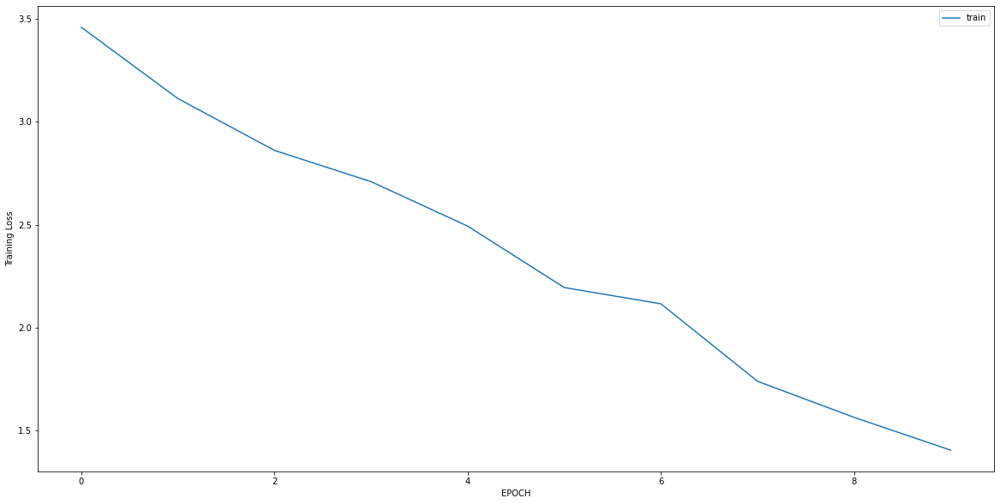

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8469 - accuracy: 0.4249
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3595 - accuracy: 0.9681
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2170 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1757 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1425 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1197 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1094 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0892 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0897 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0787 - accuracy: 1.0000


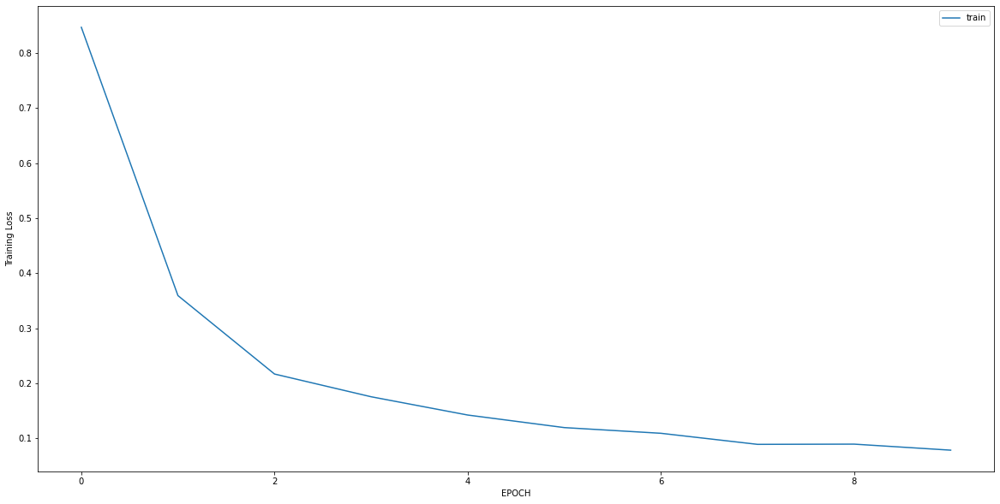

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2669 - accuracy: 0.4737
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1760 - accuracy: 0.4772
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0445 - accuracy: 0.4632
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9135 - accuracy: 0.4632
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8599 - accuracy: 0.4386
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8168 - accuracy: 0.4386
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7790 - accuracy: 0.4526
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7885 - accuracy: 0.3860
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7264 - accuracy: 0.5158
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.5298


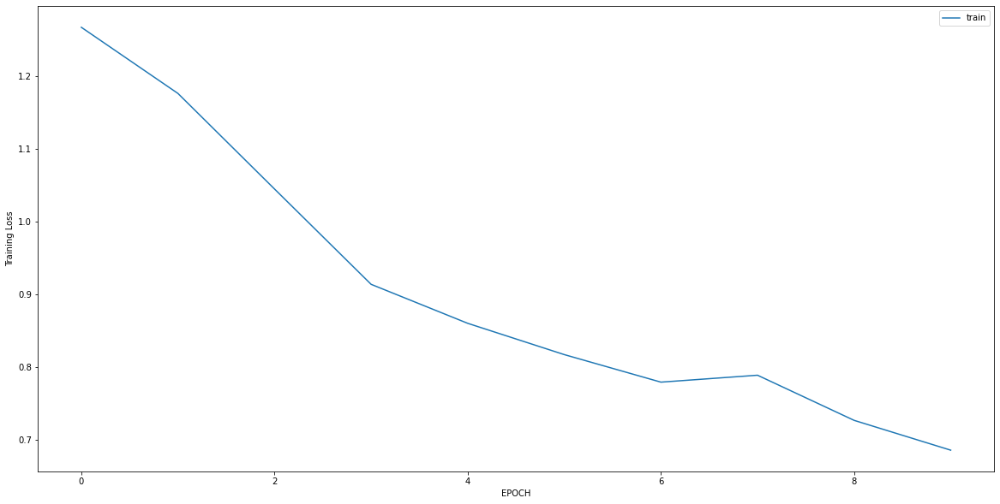

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5351 - accuracy: 0.7073
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5084 - accuracy: 0.7317
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4804 - accuracy: 0.7735
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4383 - accuracy: 0.8153
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4262 - accuracy: 0.8606
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3992 - accuracy: 0.8746
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3872 - accuracy: 0.8885
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3795 - accuracy: 0.8711
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3498 - accuracy: 0.9094
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3341 - accuracy: 0.9199


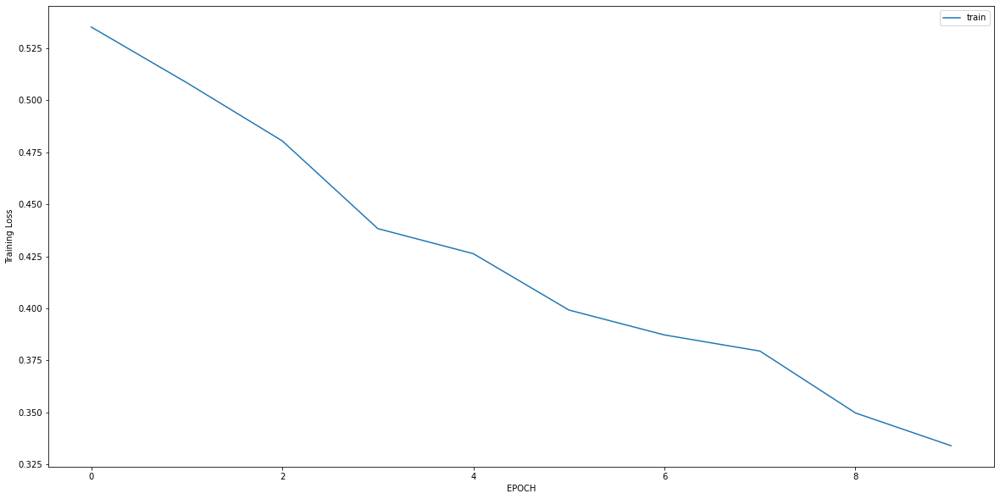

Epoch 1/10
7/7 [==============================] - 0s 7ms/step - loss: 0.7386 - accuracy: 0.6147
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.6376
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6594 - accuracy: 0.6560
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.6009
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6534 - accuracy: 0.6193
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6258 - accuracy: 0.6376
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5689 - accuracy: 0.6697
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5642 - accuracy: 0.6835
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5409 - accuracy: 0.7018
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5323 - accuracy: 0.6881


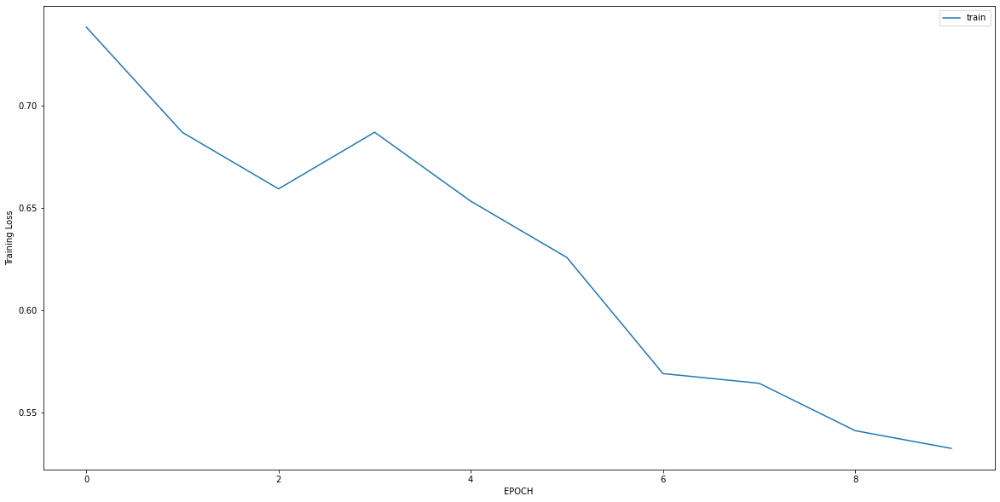

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4719 - accuracy: 0.8580
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3341 - accuracy: 0.8973
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2724 - accuracy: 0.9215
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2404 - accuracy: 0.9426
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2408 - accuracy: 0.9426
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1995 - accuracy: 0.9486
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1981 - accuracy: 0.9426
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1923 - accuracy: 0.9577
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1916 - accuracy: 0.9547
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1981 - accuracy: 0.9335


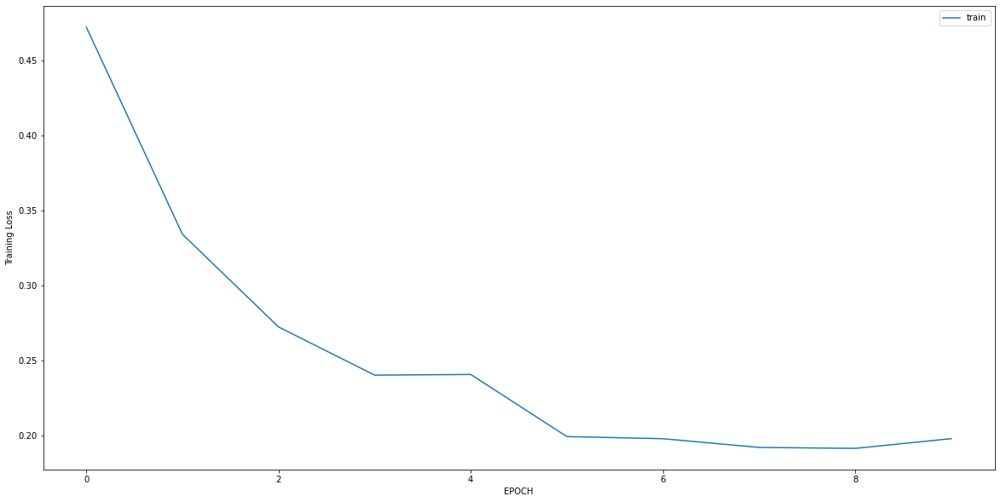

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3028 - accuracy: 0.8805
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1722 - accuracy: 0.9560
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1620 - accuracy: 0.9528
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1344 - accuracy: 0.9780
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1047 - accuracy: 0.9969
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0972 - accuracy: 0.9906
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0908 - accuracy: 0.9969
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0907 - accuracy: 0.9969
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0865 - accuracy: 0.9969
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0902 - accuracy: 0.9906


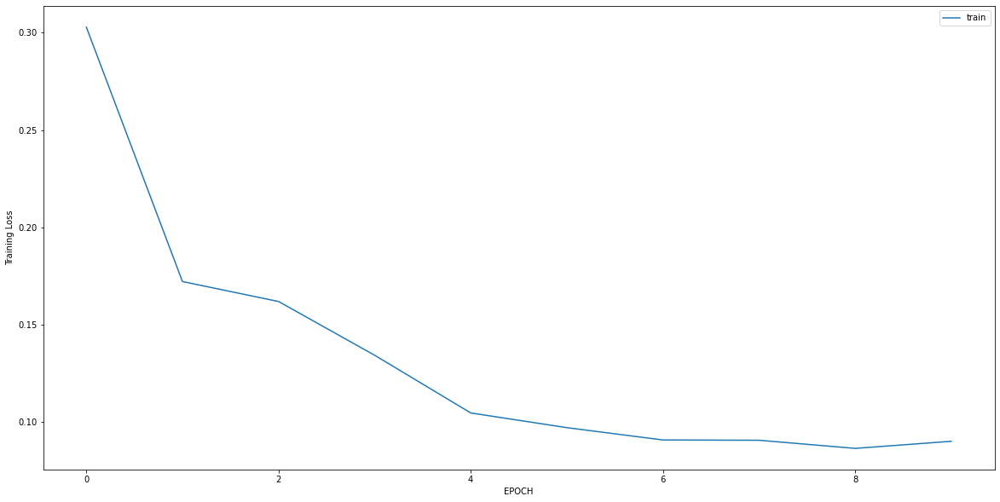

Epoch 1/10
11/11 [==============================] - 0s 7ms/step - loss: 2.0081 - accuracy: 0.4269
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.6877 - accuracy: 0.4240
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 1.2892 - accuracy: 0.4240
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.9049 - accuracy: 0.4474
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5998 - accuracy: 0.6637
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5589 - accuracy: 0.7222
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5492 - accuracy: 0.7339
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5108 - accuracy: 0.8158
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5050 - accuracy: 0.7836
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5196 - accuracy: 0.7368


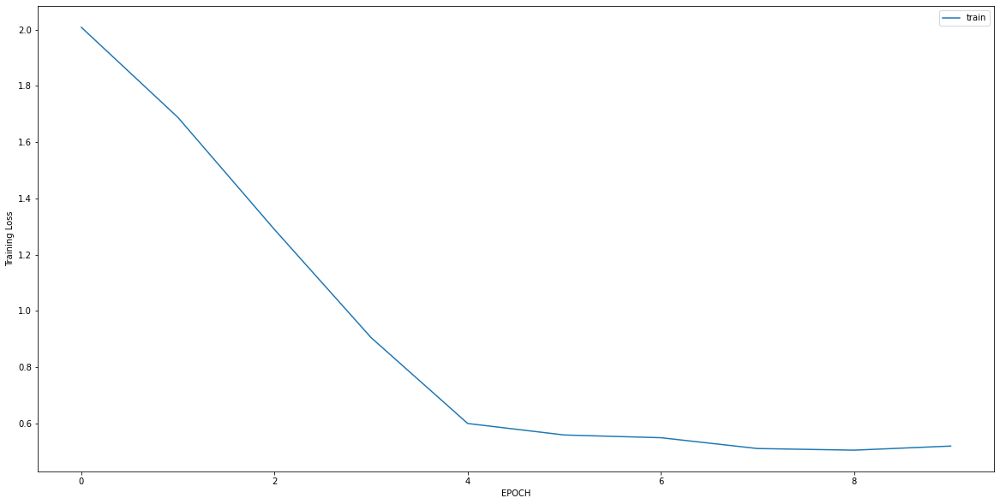

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8362 - accuracy: 0.4710
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8241 - accuracy: 0.4638
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8113 - accuracy: 0.5000
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7901 - accuracy: 0.4928
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7383 - accuracy: 0.5217
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7276 - accuracy: 0.5362
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7327 - accuracy: 0.5145
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7298 - accuracy: 0.4855
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7101 - accuracy: 0.5435
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7171 - accuracy: 0.5580


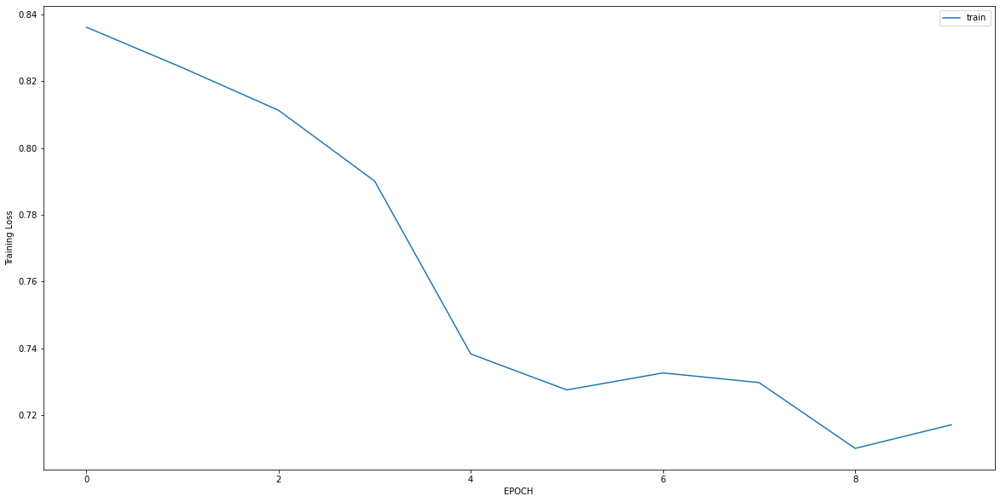

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7475 - accuracy: 0.4615
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7004 - accuracy: 0.5594
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6655 - accuracy: 0.6049
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6356 - accuracy: 0.6084
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6307 - accuracy: 0.6154
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6411 - accuracy: 0.6224
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6042 - accuracy: 0.6993
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6105 - accuracy: 0.6573
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5915 - accuracy: 0.6888
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6037 - accuracy: 0.7063


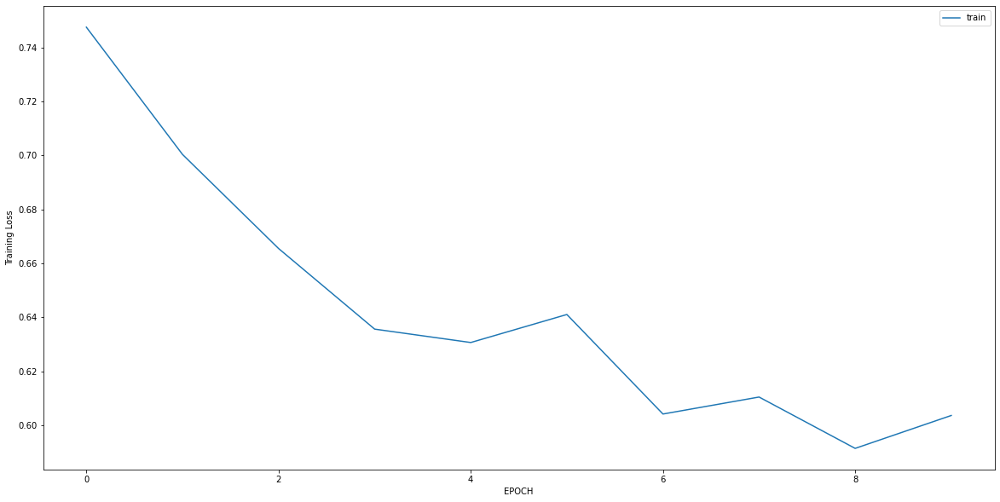

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5881 - accuracy: 0.7045
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3048 - accuracy: 0.9583
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1738 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1266 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1010 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0809 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0579 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0263 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0225 - accuracy: 1.0000


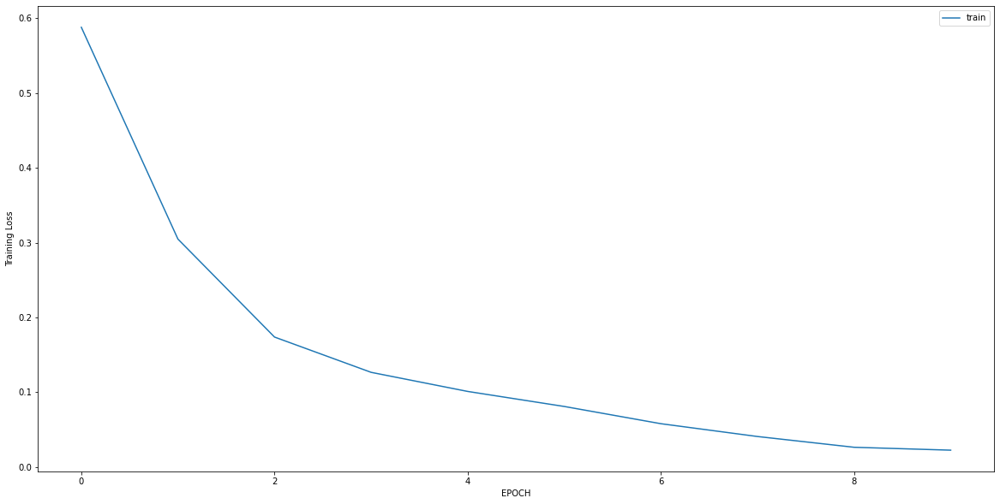

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.6554 - accuracy: 0.3919
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 1.1906 - accuracy: 0.4150
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.8557 - accuracy: 0.4899
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6104 - accuracy: 0.6571
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4522 - accuracy: 0.7435
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3252 - accuracy: 0.8790
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2473 - accuracy: 0.9280
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2152 - accuracy: 0.9625
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2194 - accuracy: 0.9424
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1743 - accuracy: 0.9683


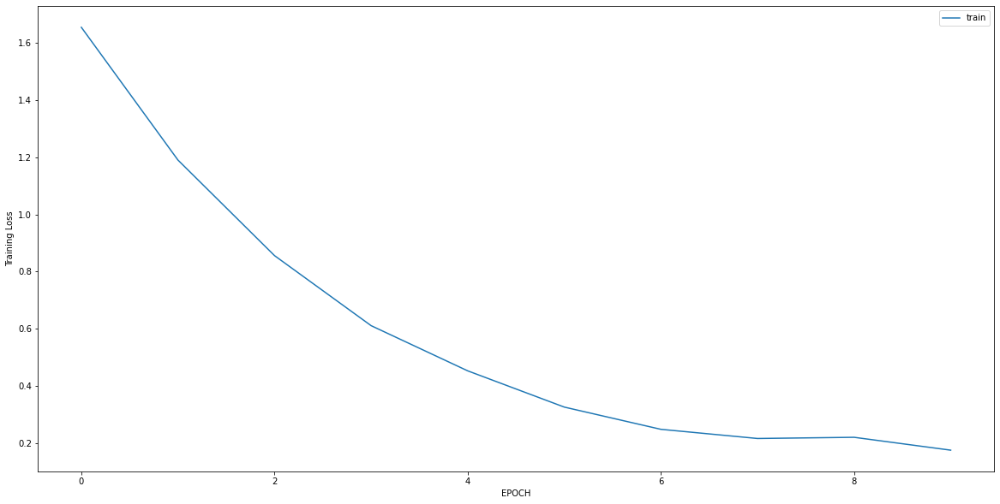

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4484 - accuracy: 0.7992
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1016 - accuracy: 0.9874
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0481 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0456 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0277 - accuracy: 1.0000


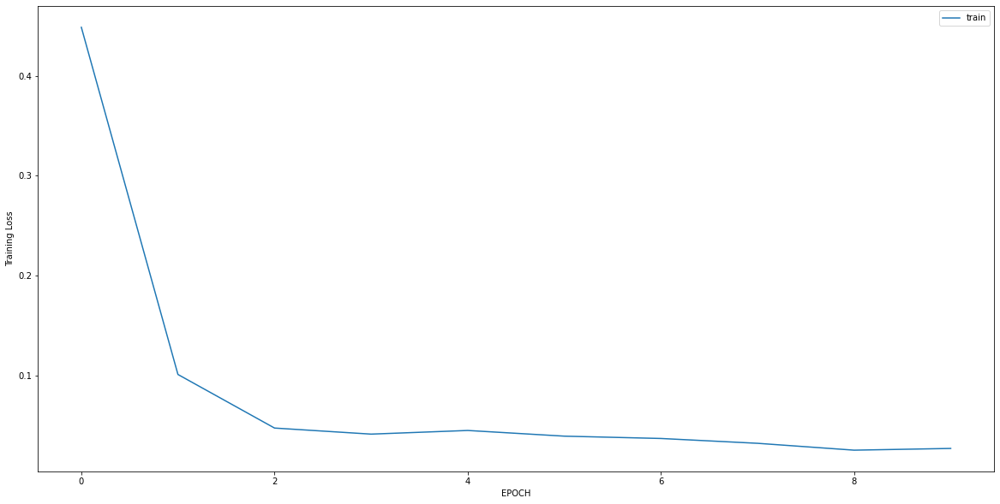

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 1.4492 - accuracy: 0.2087
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5505 - accuracy: 0.7072
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3175 - accuracy: 0.9315
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2121 - accuracy: 0.9969
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1383 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0853 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0736 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0708 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0629 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0586 - accuracy: 1.0000


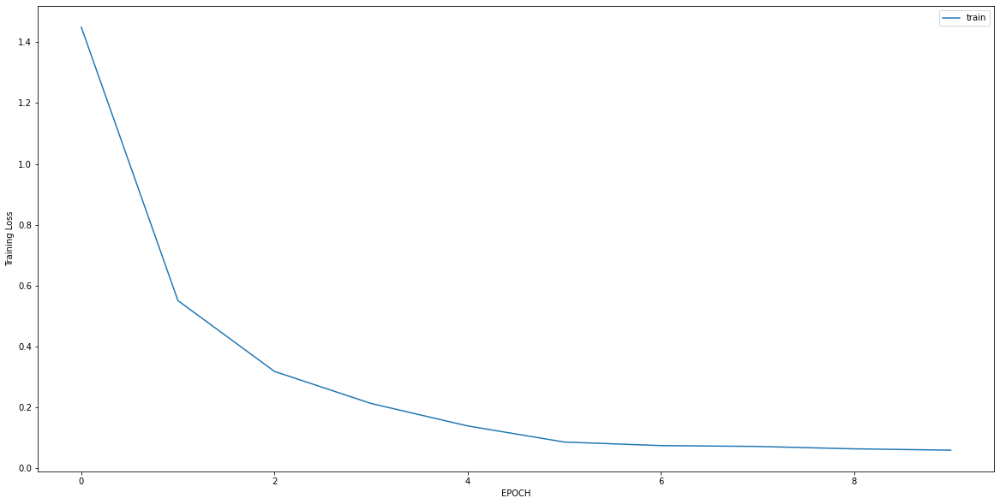

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.6571 - accuracy: 0.5794
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 1.5429 - accuracy: 0.5794
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 1.3661 - accuracy: 0.5794
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1849 - accuracy: 0.5794
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0324 - accuracy: 0.5794
Epoch 6/10
8/8 [==============================] - 0s 6ms/step - loss: 0.8952 - accuracy: 0.5873
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8172 - accuracy: 0.5913
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7574 - accuracy: 0.6071
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6262 - accuracy: 0.6468
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6451 - accuracy: 0.6667


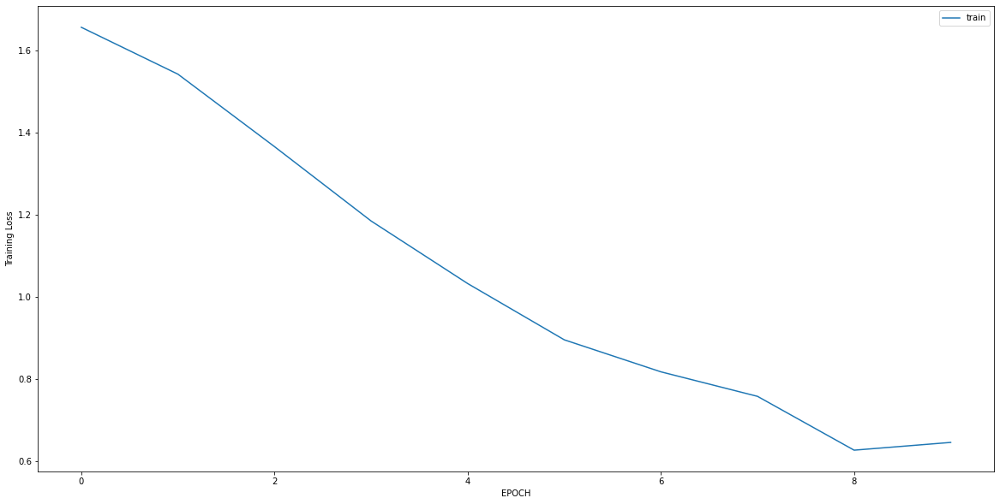

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.1336 - accuracy: 0.3958
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.9010 - accuracy: 0.5559
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6406 - accuracy: 0.7130
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4079 - accuracy: 0.8610
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3086 - accuracy: 0.9215
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2805 - accuracy: 0.9215
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2737 - accuracy: 0.9335
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2418 - accuracy: 0.9577
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2239 - accuracy: 0.9335
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2554 - accuracy: 0.9245


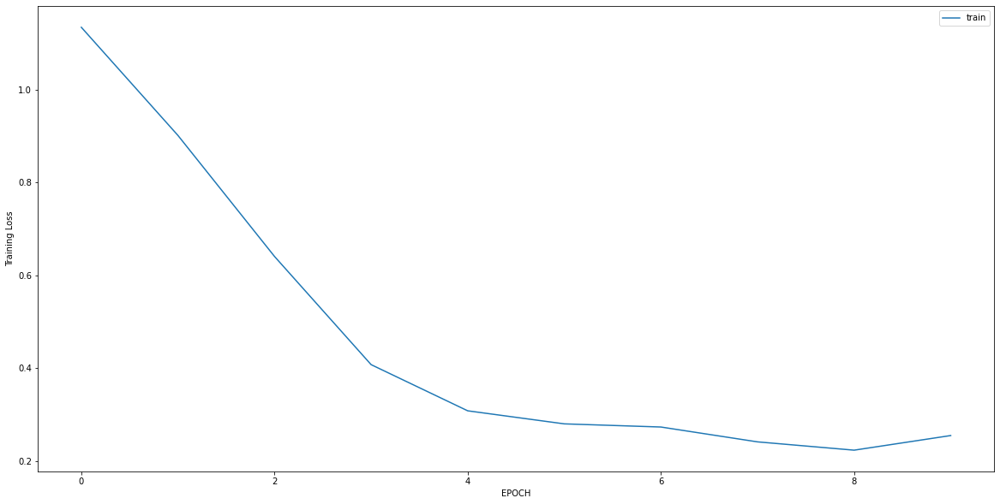

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0578 - accuracy: 0.4706
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9706 - accuracy: 0.4706
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8245 - accuracy: 0.4863
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7276 - accuracy: 0.4941
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6487 - accuracy: 0.5529
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6082 - accuracy: 0.6157
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5300 - accuracy: 0.7647
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4417 - accuracy: 0.8392
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3952 - accuracy: 0.8471
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3937 - accuracy: 0.8431


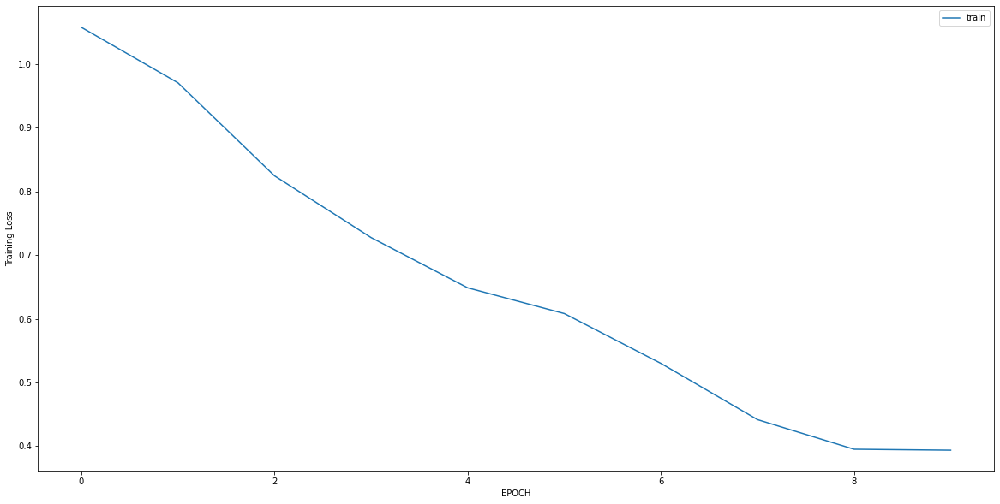

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 1.0125 - accuracy: 0.4064
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.6876 - accuracy: 0.5702
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5683 - accuracy: 0.7193
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4545 - accuracy: 0.8216
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4215 - accuracy: 0.8538
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3719 - accuracy: 0.8830
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3573 - accuracy: 0.8860
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3409 - accuracy: 0.8947
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2972 - accuracy: 0.9211
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2721 - accuracy: 0.9298


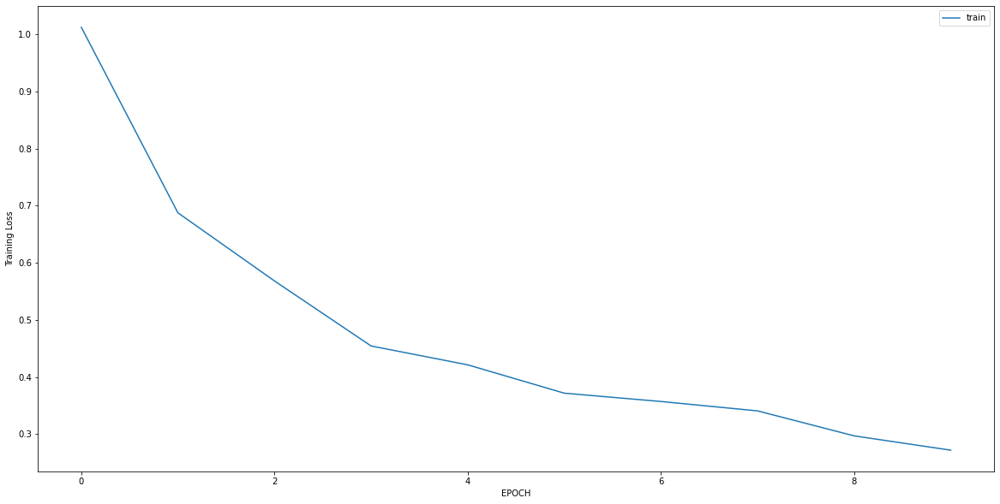

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1070 - accuracy: 0.9924
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0868 - accuracy: 0.9962
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0597 - accuracy: 0.9962
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0477 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0321 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0292 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0248 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 1.0000


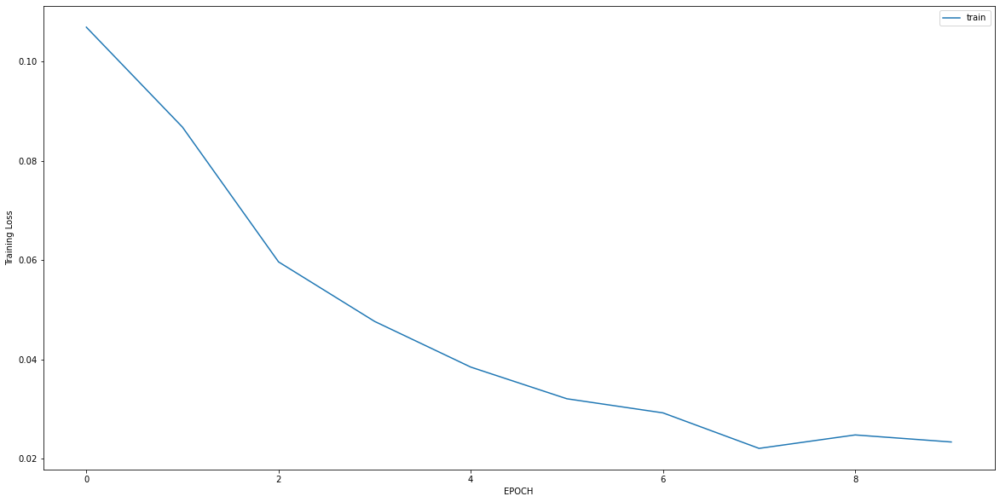

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7331 - accuracy: 0.8078
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4506 - accuracy: 0.8719
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3133 - accuracy: 0.9181
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2230 - accuracy: 0.9609
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2022 - accuracy: 0.9715
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1815 - accuracy: 0.9715
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1724 - accuracy: 0.9893
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1788 - accuracy: 0.9786
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1618 - accuracy: 0.9858
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1524 - accuracy: 0.9893


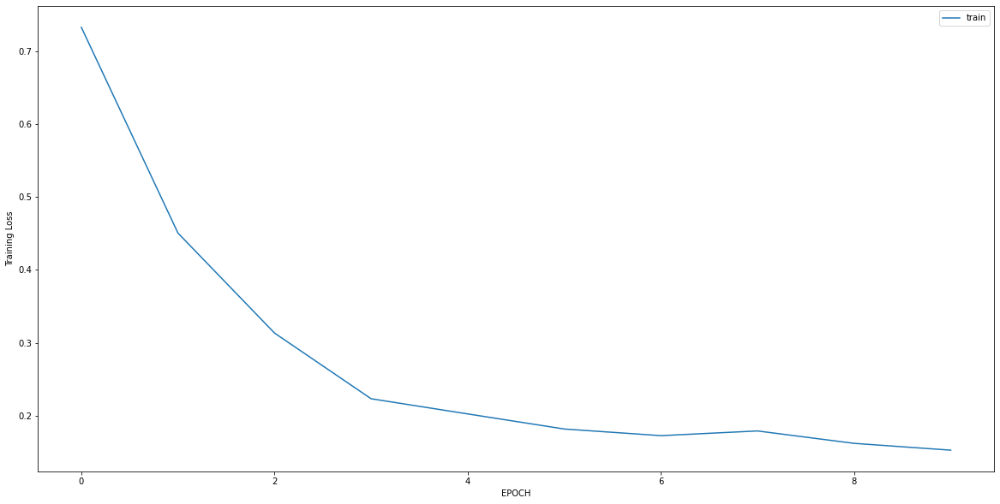

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3724 - accuracy: 0.8388
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0678 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0538 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0290 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0247 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0132 - accuracy: 1.0000


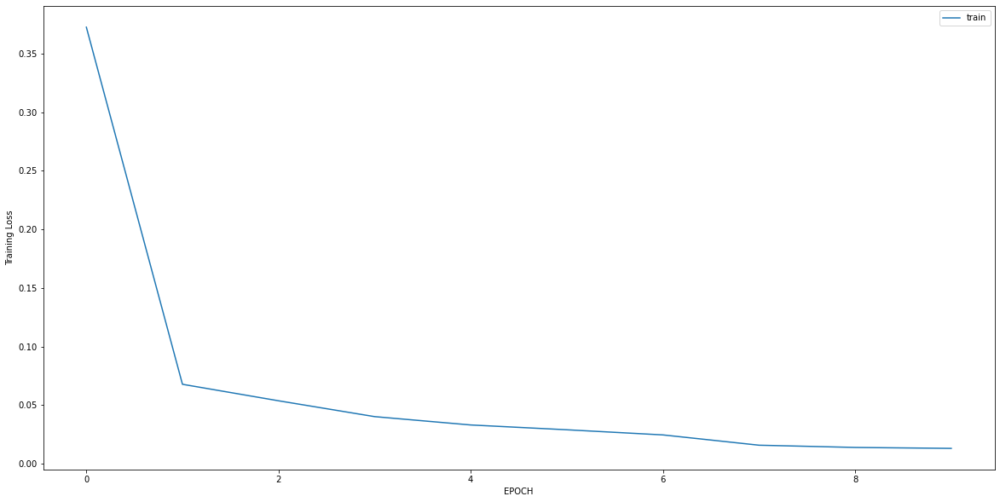

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2459 - accuracy: 0.4830
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9026 - accuracy: 0.6000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7057
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6306 - accuracy: 0.7811
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5497 - accuracy: 0.8000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4601 - accuracy: 0.8340
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4092 - accuracy: 0.8491
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3228 - accuracy: 0.8792
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2551 - accuracy: 0.8943
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2491 - accuracy: 0.9094


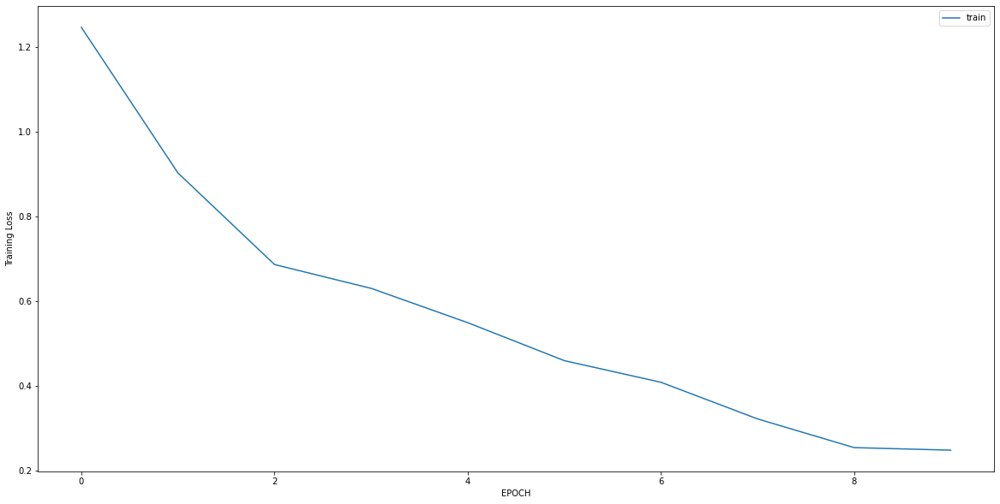

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4735 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4971 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5278 - accuracy: 0.8270
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4832 - accuracy: 0.8186
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4454 - accuracy: 0.8059
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4191 - accuracy: 0.8354
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3871 - accuracy: 0.8270
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3680 - accuracy: 0.8270
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3819 - accuracy: 0.8186
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3758 - accuracy: 0.8312


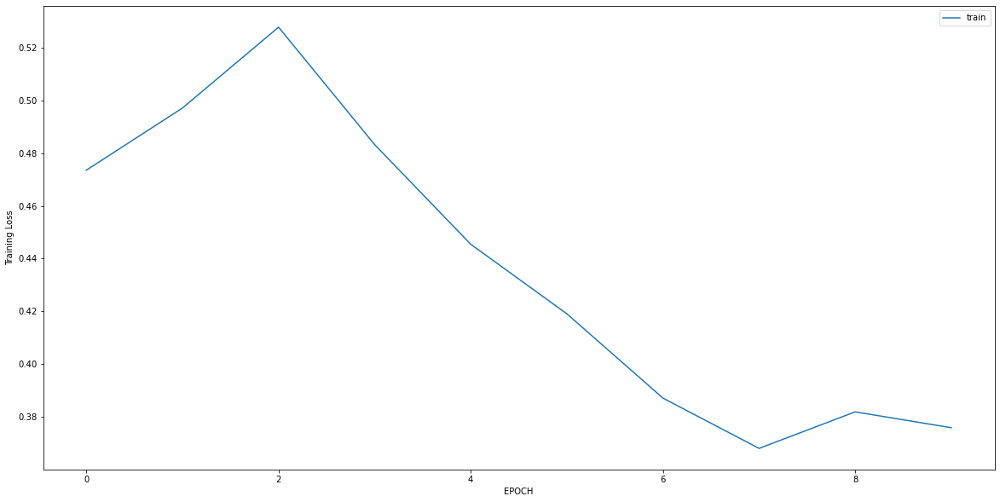

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.7398 - accuracy: 0.7153
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7236 - accuracy: 0.7153
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7594 - accuracy: 0.7153
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6915 - accuracy: 0.7083
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6716 - accuracy: 0.7153
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6749 - accuracy: 0.7083
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6593 - accuracy: 0.7083
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6169 - accuracy: 0.7361
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6308 - accuracy: 0.7014
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6029 - accuracy: 0.7153


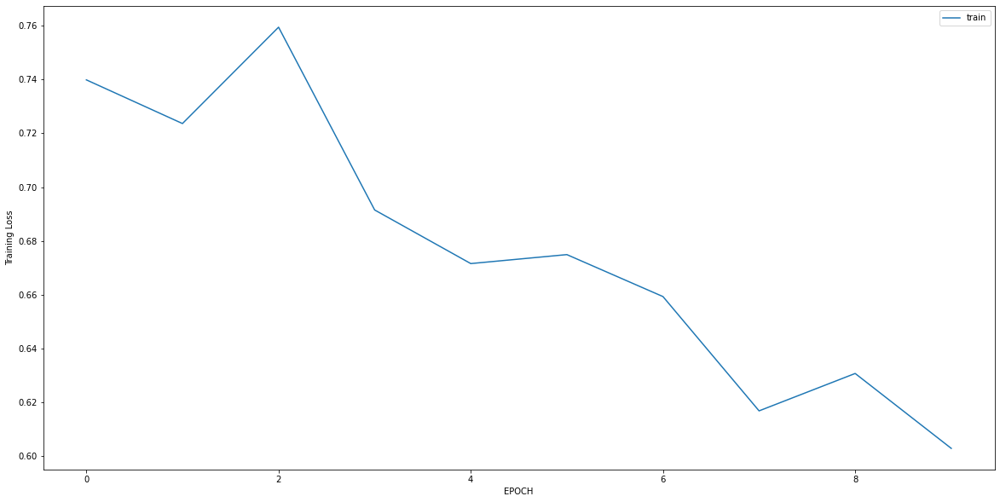

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8402 - accuracy: 0.3741
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3491 - accuracy: 0.9388
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2303 - accuracy: 0.9932
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1543 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1281 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1179 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1042 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0975 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0830 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0756 - accuracy: 1.0000


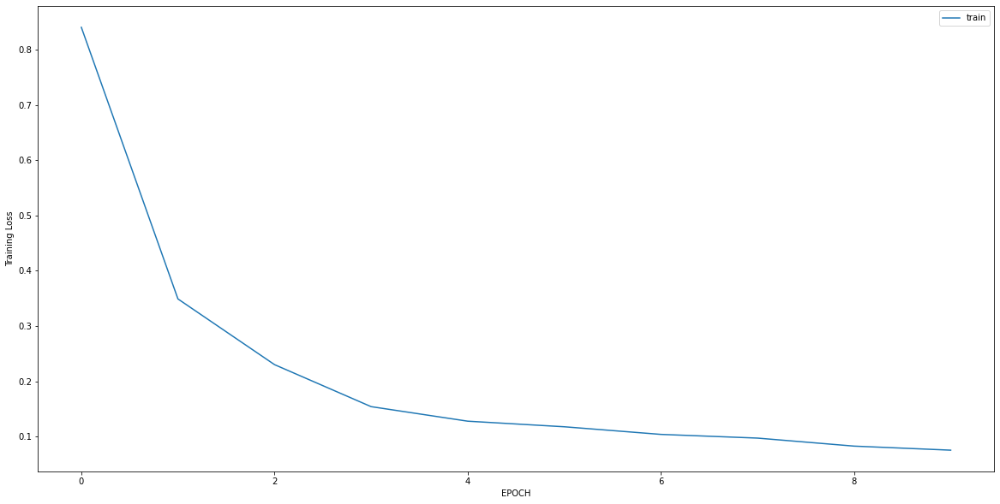

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 1.2642 - accuracy: 0.5507
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.1830 - accuracy: 0.5507
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0901 - accuracy: 0.5507
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0465 - accuracy: 0.5507
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9247 - accuracy: 0.5507
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8732 - accuracy: 0.5507
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7303 - accuracy: 0.5652
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7091 - accuracy: 0.6232
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6527 - accuracy: 0.6304
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6699 - accuracy: 0.6159


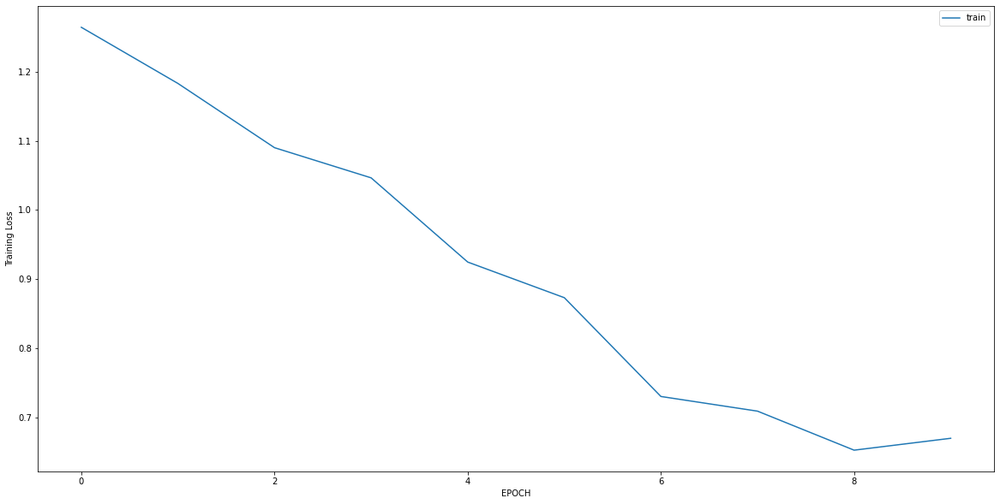

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7654 - accuracy: 0.6415
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4946 - accuracy: 0.7767
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3449 - accuracy: 0.8679
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2692 - accuracy: 0.9214
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2330 - accuracy: 0.9434
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2113 - accuracy: 0.9465
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2007 - accuracy: 0.9654
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1738 - accuracy: 0.9906
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1475 - accuracy: 0.9969
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1504 - accuracy: 0.9906


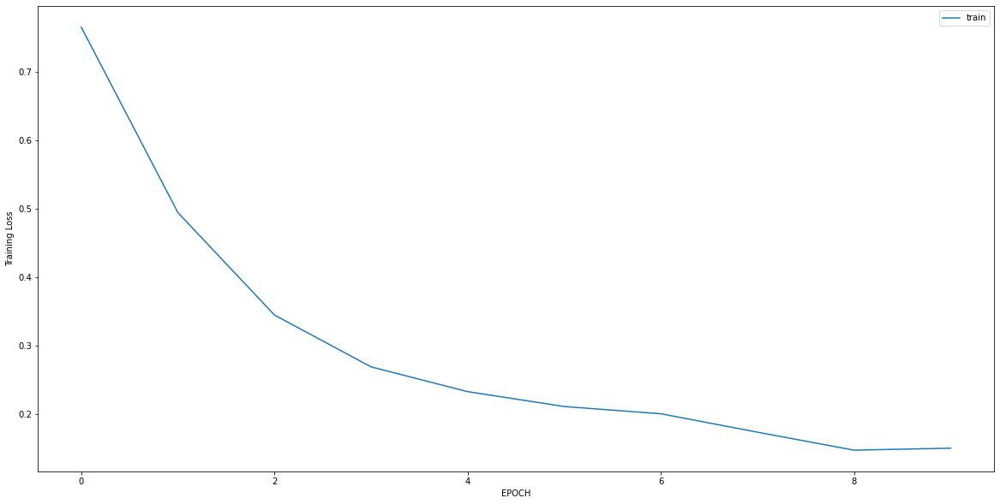

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 2.1996 - accuracy: 0.0062
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.4918 - accuracy: 0.0280
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.9638 - accuracy: 0.2368
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5651 - accuracy: 0.7850
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3576 - accuracy: 0.9969
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2526 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1894 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1474 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1186 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0954 - accuracy: 1.0000


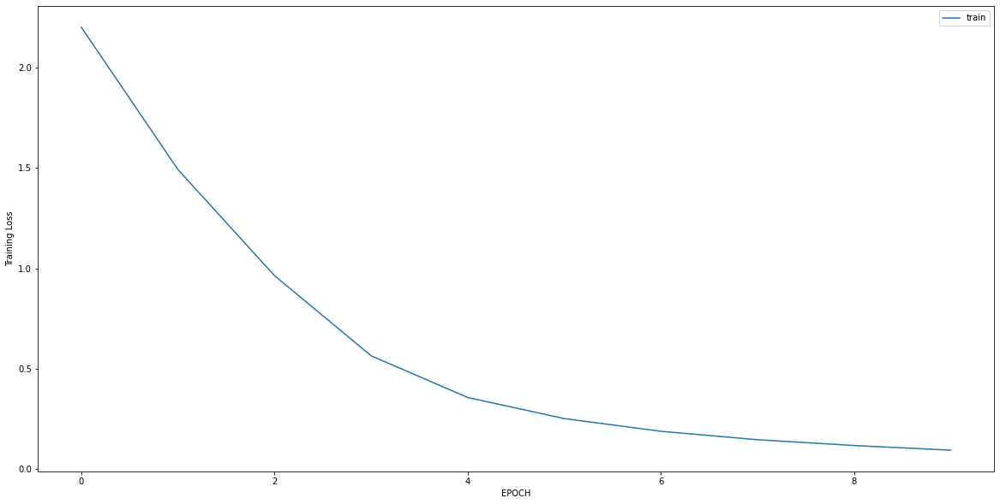

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0627 - accuracy: 1.0000
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0508 - accuracy: 1.0000
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0452 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0279 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0236 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0219 - accuracy: 1.0000


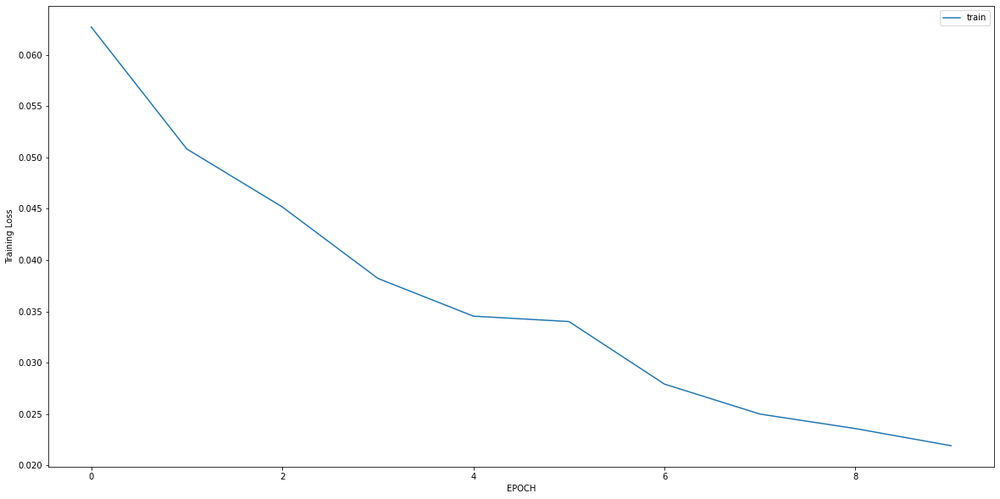

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.7383 - accuracy: 0.5436
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.4781 - accuracy: 0.5436
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.1618 - accuracy: 0.5436
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9301 - accuracy: 0.5436
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8230 - accuracy: 0.5436
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7921 - accuracy: 0.5505
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7586 - accuracy: 0.5366
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7200 - accuracy: 0.5436
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7112 - accuracy: 0.5679
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7073 - accuracy: 0.5575


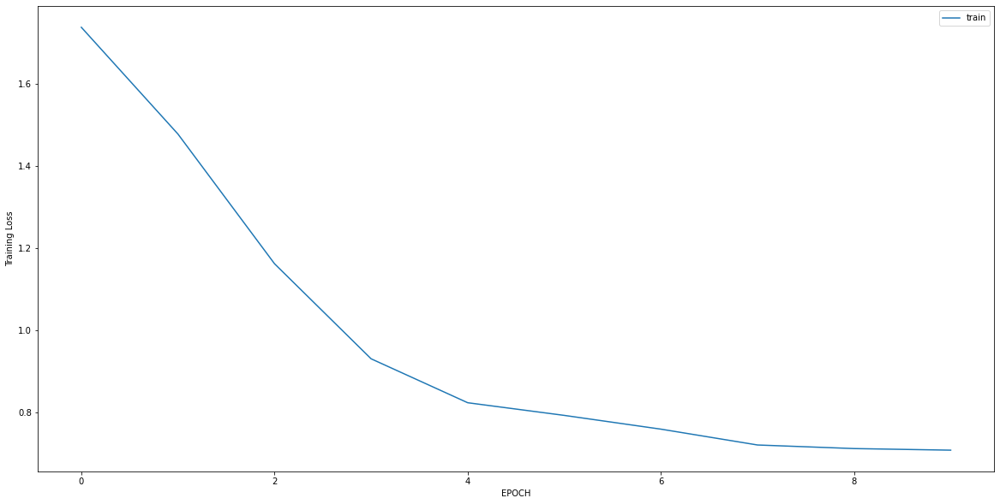

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3627 - accuracy: 0.9048
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0779 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0308 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0318 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0249 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0269 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0212 - accuracy: 1.0000


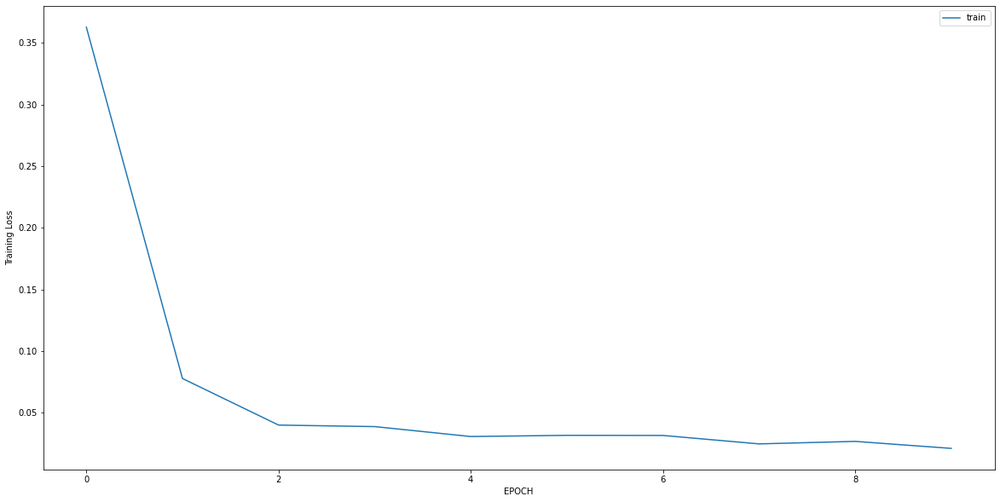

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.0182 - accuracy: 0.4220
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.9794 - accuracy: 0.4037
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8885 - accuracy: 0.4495
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8206 - accuracy: 0.5183
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7976 - accuracy: 0.5275
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7282 - accuracy: 0.6239
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6751 - accuracy: 0.6697
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.6330
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6591 - accuracy: 0.6239
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6183 - accuracy: 0.6835


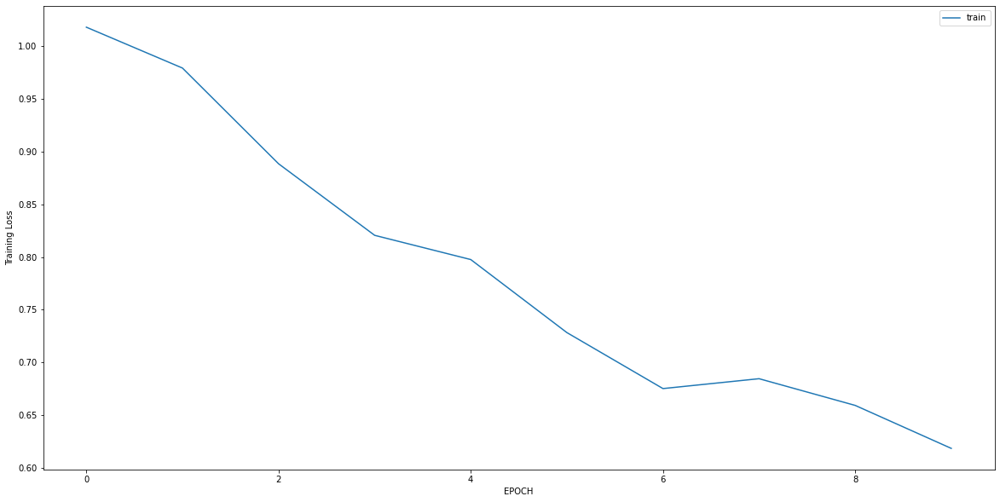

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6552 - accuracy: 0.6458
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6742 - accuracy: 0.5625
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6254 - accuracy: 0.6875
Epoch 4/10
5/5 [==============================] - 0s 7ms/step - loss: 0.6960 - accuracy: 0.6111
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7373 - accuracy: 0.6042
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6590 - accuracy: 0.6319
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7126 - accuracy: 0.6250
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6340 - accuracy: 0.6597
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6882 - accuracy: 0.6181
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6589 - accuracy: 0.6181


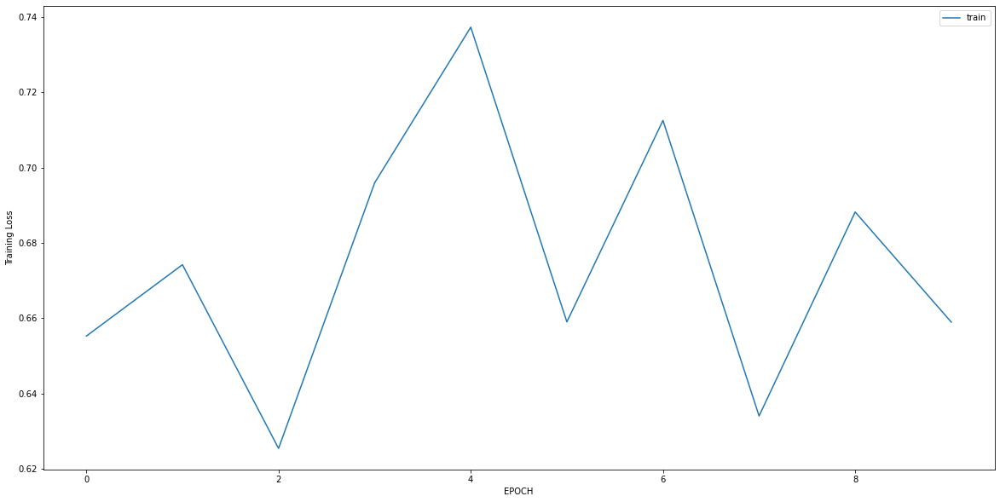

Epoch 1/10
14/14 [==============================] - 0s 6ms/step - loss: 0.4387 - accuracy: 0.7698
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3596 - accuracy: 0.8871
Epoch 3/10
14/14 [==============================] - 0s 6ms/step - loss: 0.2833 - accuracy: 0.9391
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2529 - accuracy: 0.9436
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1896 - accuracy: 0.9774
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1714 - accuracy: 0.9797
Epoch 7/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1565 - accuracy: 0.9819
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1435 - accuracy: 0.9797
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1779 - accuracy: 0.9549
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1400 - accuracy: 0.9639


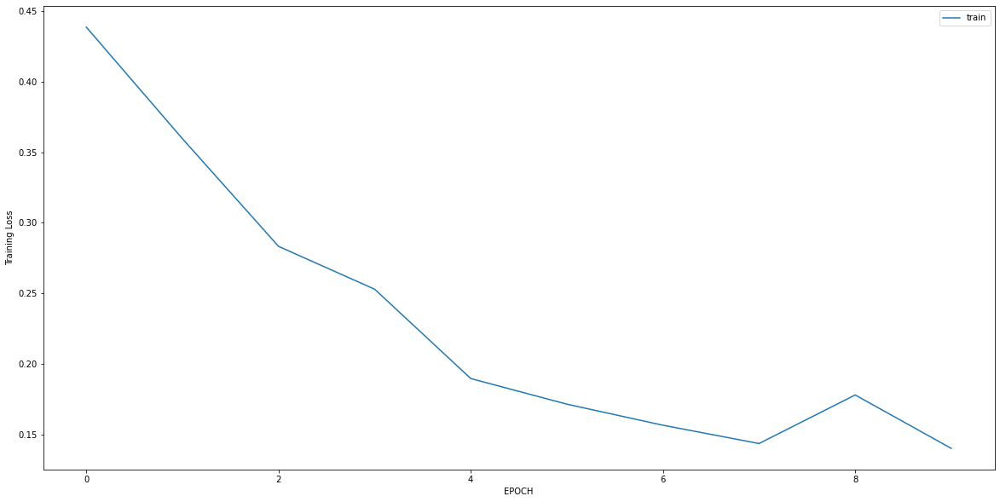

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.1867 - accuracy: 0.6159
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.9860 - accuracy: 0.6192
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.8299 - accuracy: 0.6258
Epoch 4/10
10/10 [==============================] - 0s 7ms/step - loss: 0.6512 - accuracy: 0.6556
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4599 - accuracy: 0.7748
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3935 - accuracy: 0.8377
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3611 - accuracy: 0.8874
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3452 - accuracy: 0.8808
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3626 - accuracy: 0.8543
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2969 - accuracy: 0.9106


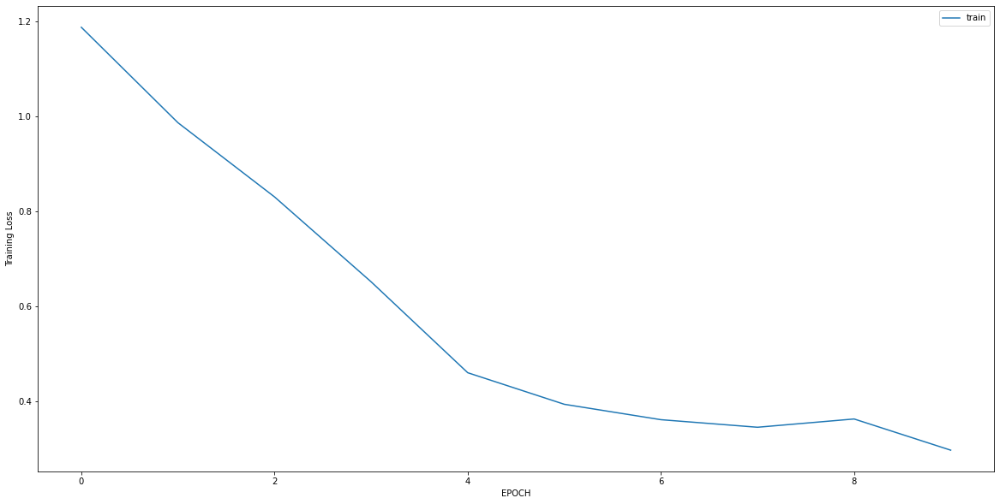

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.1591 - accuracy: 0.0107
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5570 - accuracy: 0.0571
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9757 - accuracy: 0.3679
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6151 - accuracy: 0.6429
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3825 - accuracy: 0.8893
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2597 - accuracy: 0.9893
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1628 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1203 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0952 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0855 - accuracy: 1.0000


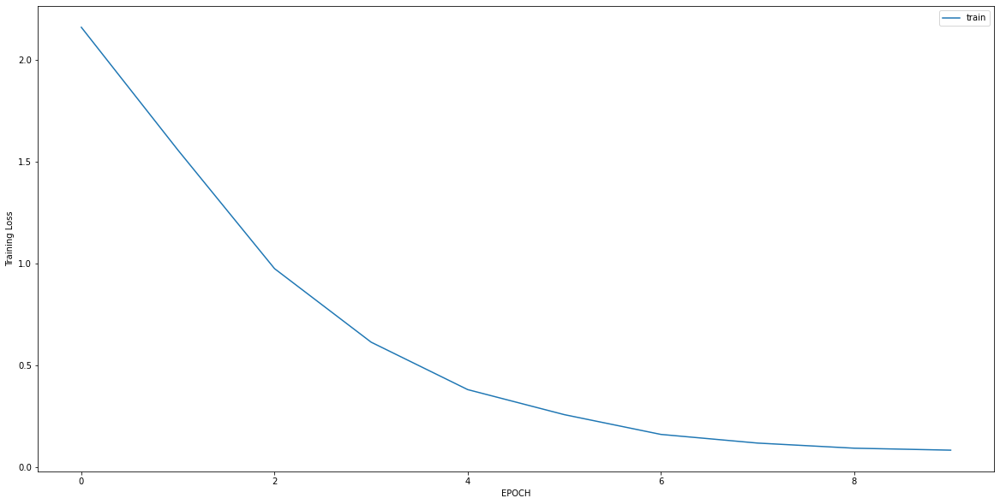

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0622 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0568 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0498 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0334 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0275 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0226 - accuracy: 1.0000


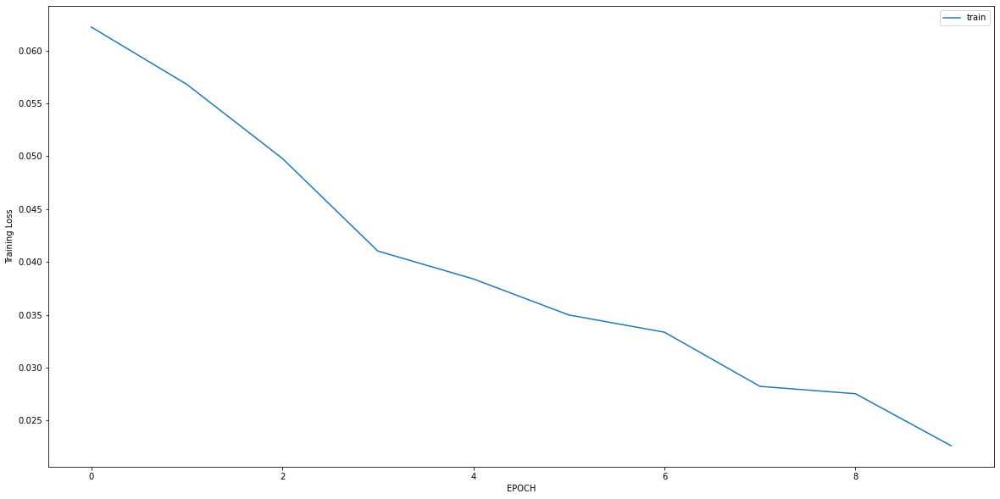

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.6439 - accuracy: 0.5397
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.4042 - accuracy: 0.5397
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1142 - accuracy: 0.5397
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9053 - accuracy: 0.5397
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7408 - accuracy: 0.5675
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6288 - accuracy: 0.5873
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5379 - accuracy: 0.6706
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4487 - accuracy: 0.7262
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3786 - accuracy: 0.7897
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3401 - accuracy: 0.8333


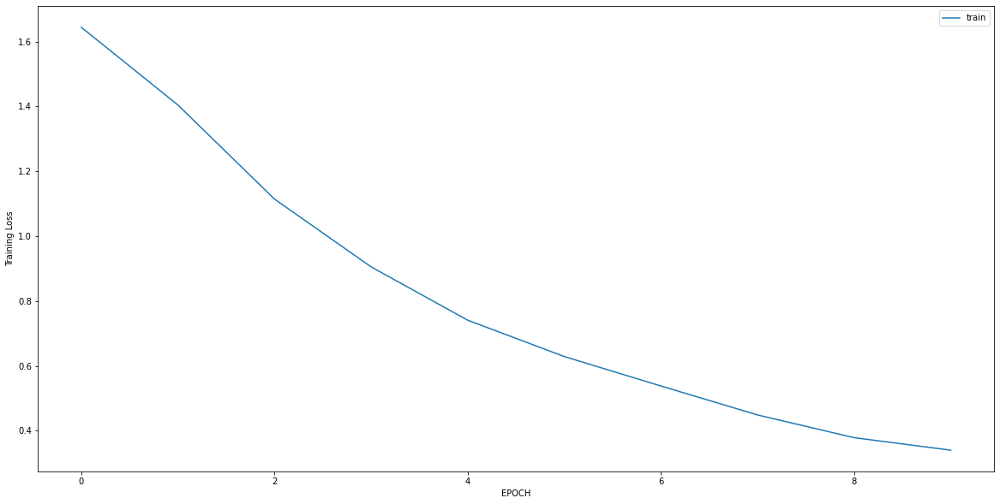

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5375 - accuracy: 0.7296
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5677 - accuracy: 0.7519
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4867 - accuracy: 0.8037
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3742 - accuracy: 0.8630
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3535 - accuracy: 0.8815
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3151 - accuracy: 0.8741
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3289 - accuracy: 0.8741
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3449 - accuracy: 0.8815
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3621 - accuracy: 0.8889
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2985 - accuracy: 0.9074


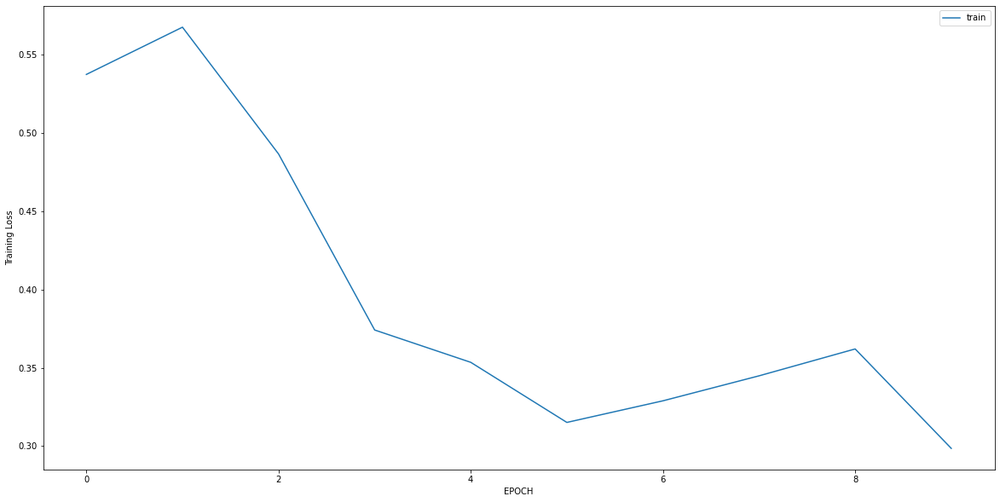

Epoch 1/10
6/6 [==============================] - 0s 6ms/step - loss: 2.0882 - accuracy: 0.0056
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 1.9530 - accuracy: 0.0056
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 1.5300 - accuracy: 0.0444
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 1.0880 - accuracy: 0.1944
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.8273 - accuracy: 0.3722
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.6790 - accuracy: 0.5556
Epoch 7/10
6/6 [==============================] - 0s 4ms/step - loss: 0.5293 - accuracy: 0.8389
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.4492 - accuracy: 0.9278
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.3666 - accuracy: 0.9889
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.3279 - accuracy: 1.0000


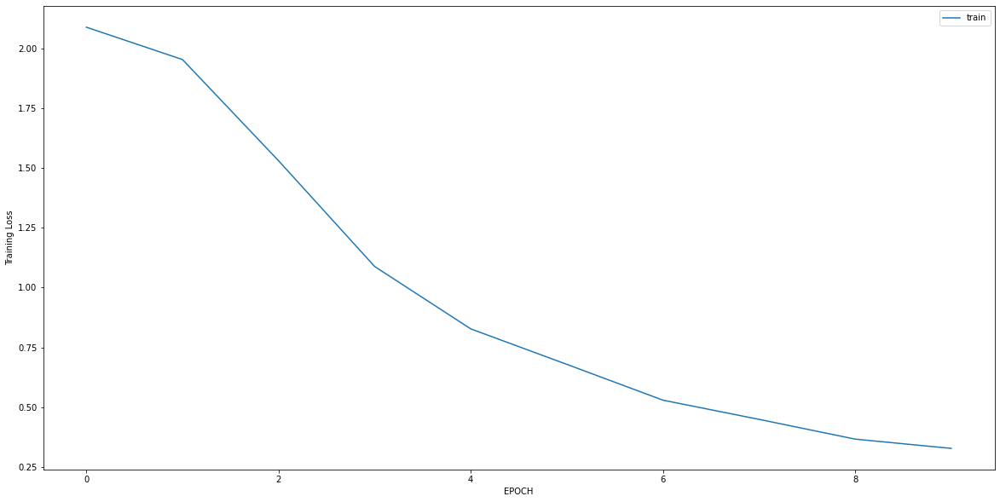

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1440 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1230 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0949 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0903 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0792 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0676 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0650 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0590 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0493 - accuracy: 1.0000


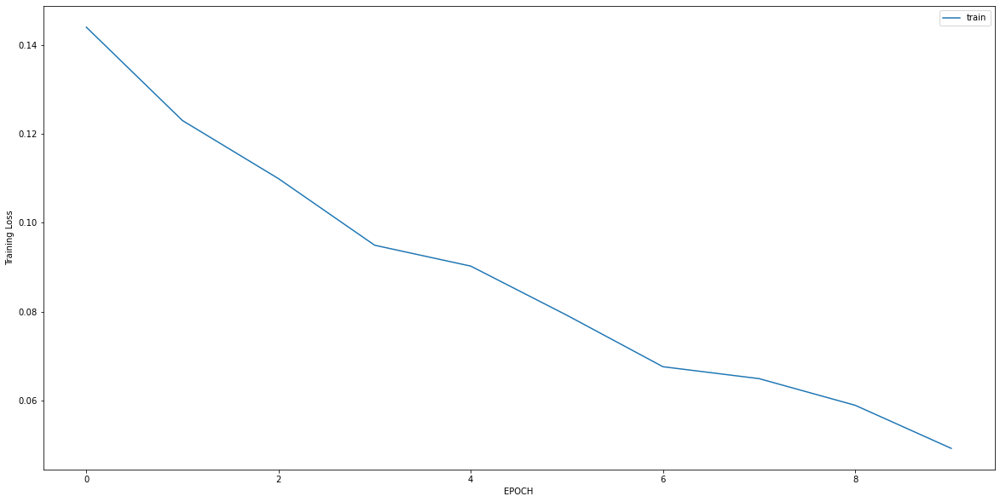

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0257 - accuracy: 0.5758
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9476 - accuracy: 0.5758
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8779 - accuracy: 0.5758
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8139 - accuracy: 0.5758
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7784 - accuracy: 0.5758
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7432 - accuracy: 0.5758
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7219 - accuracy: 0.5758
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6913 - accuracy: 0.5791
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6696 - accuracy: 0.6195
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6830 - accuracy: 0.6061


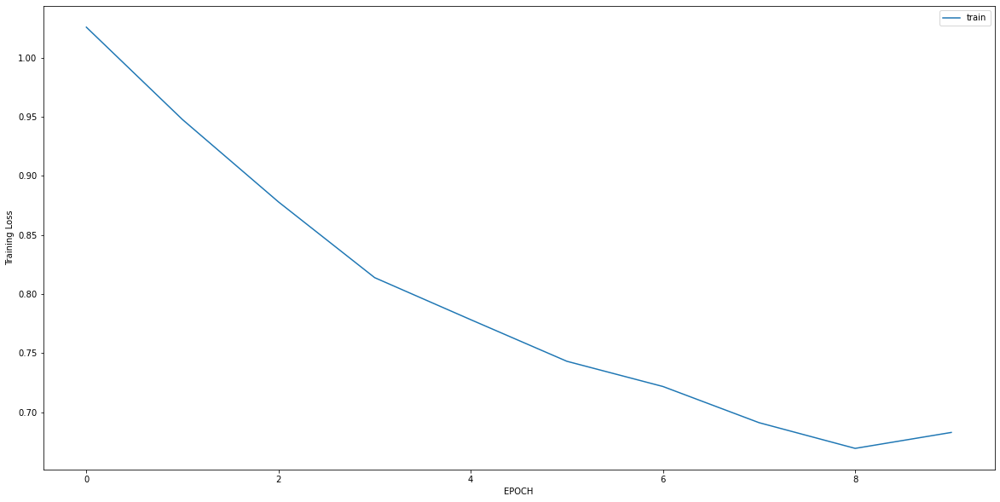

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6715 - accuracy: 0.5652
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6326 - accuracy: 0.6008
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6069 - accuracy: 0.6126
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5728 - accuracy: 0.6680
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5423 - accuracy: 0.7233
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4915 - accuracy: 0.7787
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4788 - accuracy: 0.7984
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4311 - accuracy: 0.8300
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4171 - accuracy: 0.8221
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4016 - accuracy: 0.8419


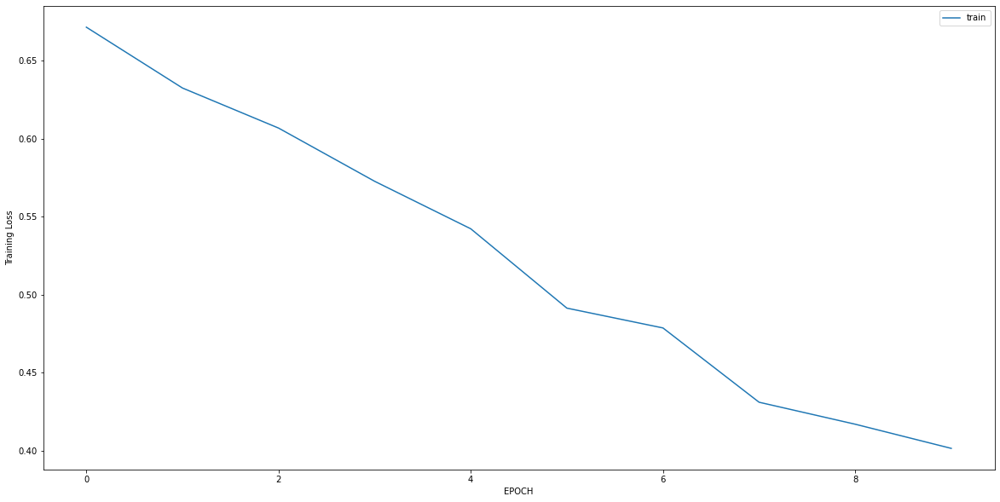

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5369 - accuracy: 0.7295
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4987 - accuracy: 0.7910
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4264 - accuracy: 0.8730
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3499 - accuracy: 0.9221
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3334 - accuracy: 0.9180
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3105 - accuracy: 0.9385
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2811 - accuracy: 0.9385
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2500 - accuracy: 0.9549
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2283 - accuracy: 0.9631
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2240 - accuracy: 0.9549


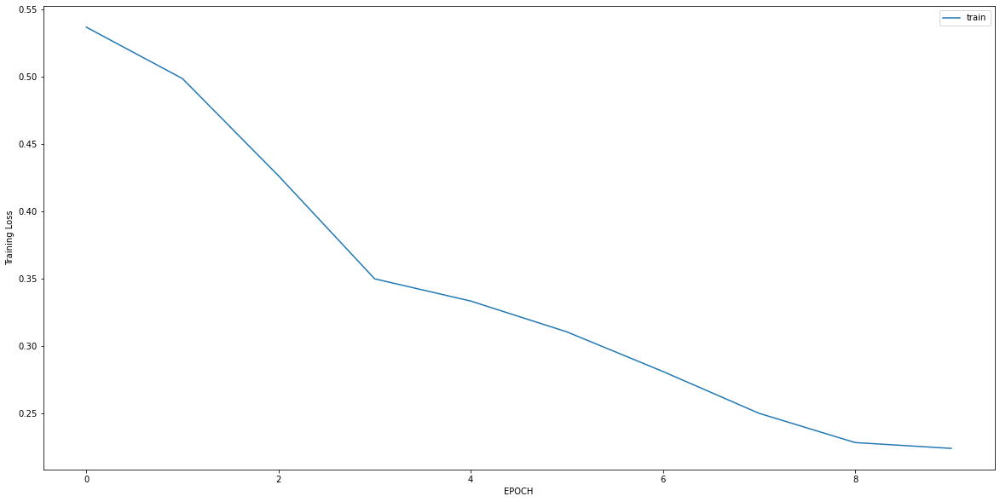

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3207 - accuracy: 0.8821
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2766 - accuracy: 0.8962
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2324 - accuracy: 0.9292
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2282 - accuracy: 0.9434
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3414 - accuracy: 0.9009
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.6217 - accuracy: 0.8255
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5688 - accuracy: 0.8019
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4561 - accuracy: 0.8208
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3622 - accuracy: 0.8538
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3529 - accuracy: 0.8208


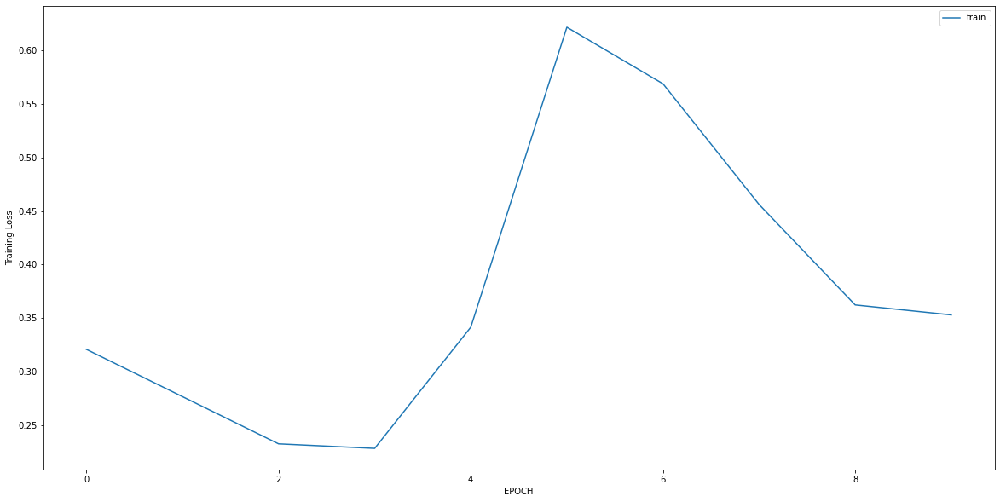

Epoch 1/10
8/8 [==============================] - 0s 8ms/step - loss: 0.7087 - accuracy: 0.5847
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3521 - accuracy: 0.8475
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3356 - accuracy: 0.8856
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2533 - accuracy: 0.9322
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2340 - accuracy: 0.9322
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2419 - accuracy: 0.9449
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2381 - accuracy: 0.9322
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2535 - accuracy: 0.9492
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2367 - accuracy: 0.9449
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2197 - accuracy: 0.9576


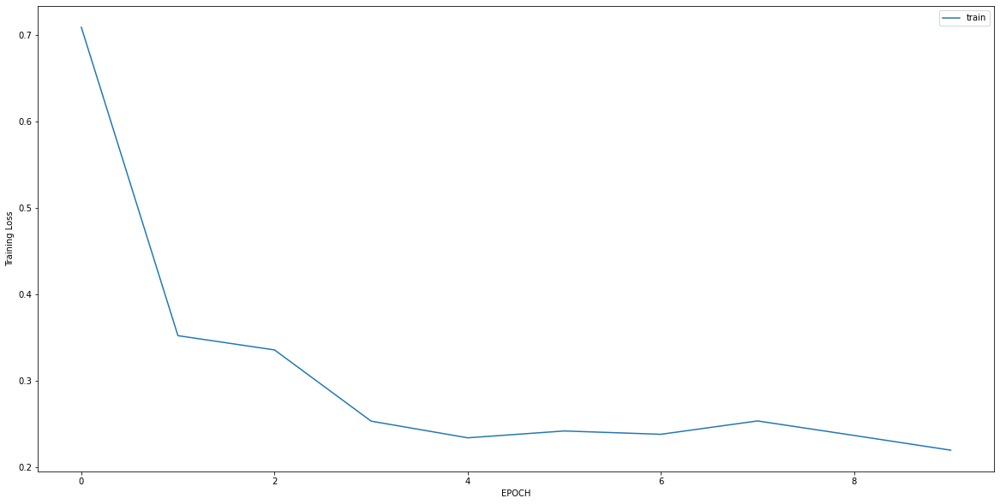

Epoch 1/10
4/4 [==============================] - 0s 7ms/step - loss: 0.2804 - accuracy: 0.8878
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3128 - accuracy: 0.8878
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 0.4174 - accuracy: 0.8469
Epoch 4/10
4/4 [==============================] - 0s 8ms/step - loss: 0.6184 - accuracy: 0.7755
Epoch 5/10
4/4 [==============================] - 0s 6ms/step - loss: 0.6280 - accuracy: 0.7551
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4936 - accuracy: 0.7755
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3280 - accuracy: 0.8469
Epoch 8/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2892 - accuracy: 0.8878
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3791 - accuracy: 0.8367
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.2677 - accuracy: 0.8980


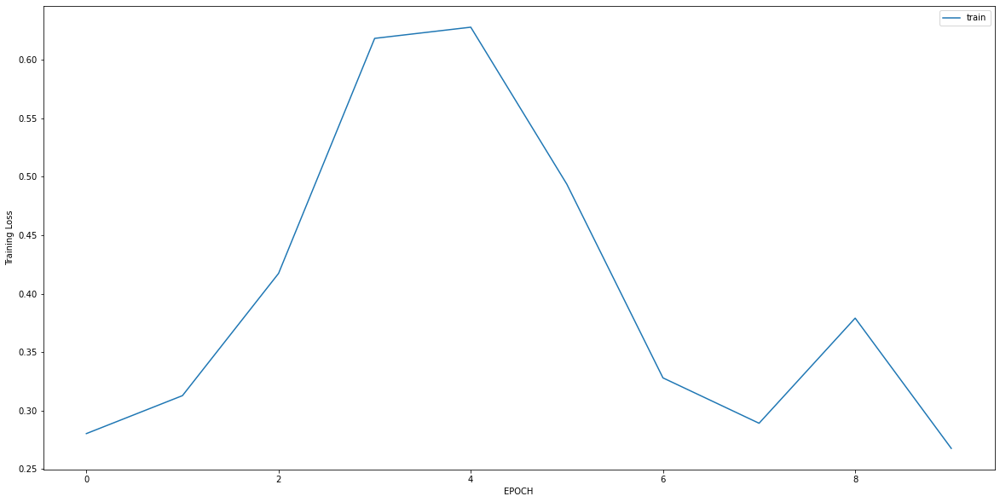

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2973 - accuracy: 0.9177
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2307 - accuracy: 0.9367
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2063 - accuracy: 0.9430
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1942 - accuracy: 0.9430
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2146 - accuracy: 0.9367
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1719 - accuracy: 0.9620
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1914 - accuracy: 0.9589
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1956 - accuracy: 0.9399
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1789 - accuracy: 0.9589
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1606 - accuracy: 0.9494


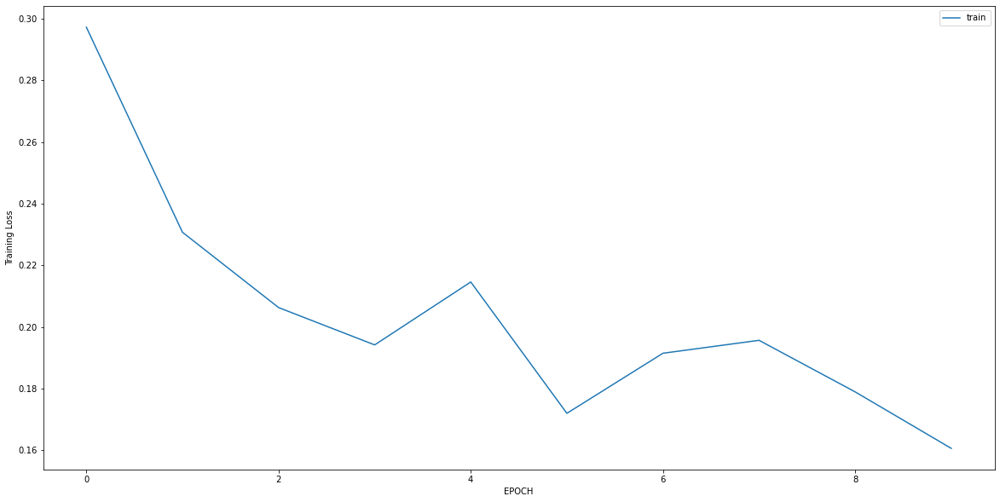

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0012 - accuracy: 0.4179
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6715 - accuracy: 0.5373
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4714 - accuracy: 0.7687
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4058 - accuracy: 0.8694
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4126 - accuracy: 0.8657
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4094 - accuracy: 0.8433
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3807 - accuracy: 0.8955
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3351 - accuracy: 0.9142
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3163 - accuracy: 0.8993
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2984 - accuracy: 0.9104


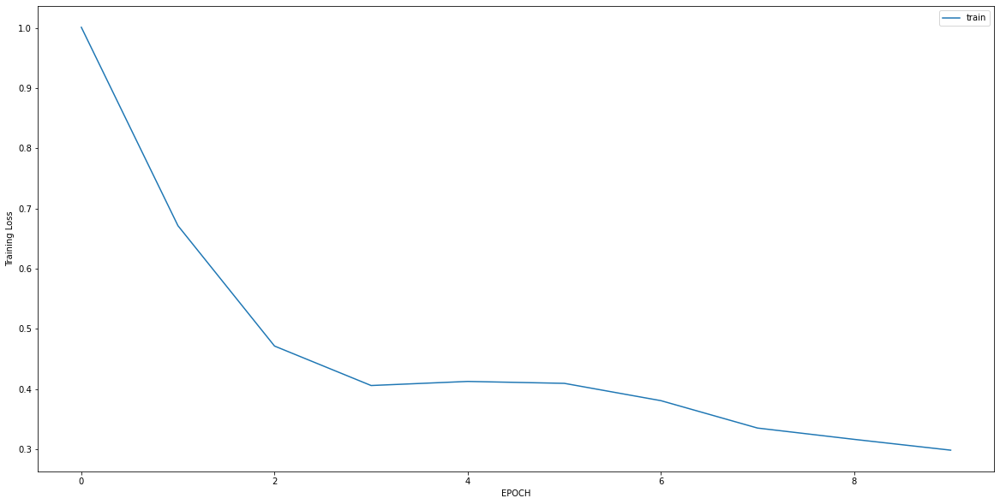

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2352 - accuracy: 0.9431
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2342 - accuracy: 0.9537
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2222 - accuracy: 0.9573
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1943 - accuracy: 0.9644
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1965 - accuracy: 0.9680
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1739 - accuracy: 0.9644
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1916 - accuracy: 0.9609
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2093 - accuracy: 0.9431
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2164 - accuracy: 0.9288
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2007 - accuracy: 0.9359


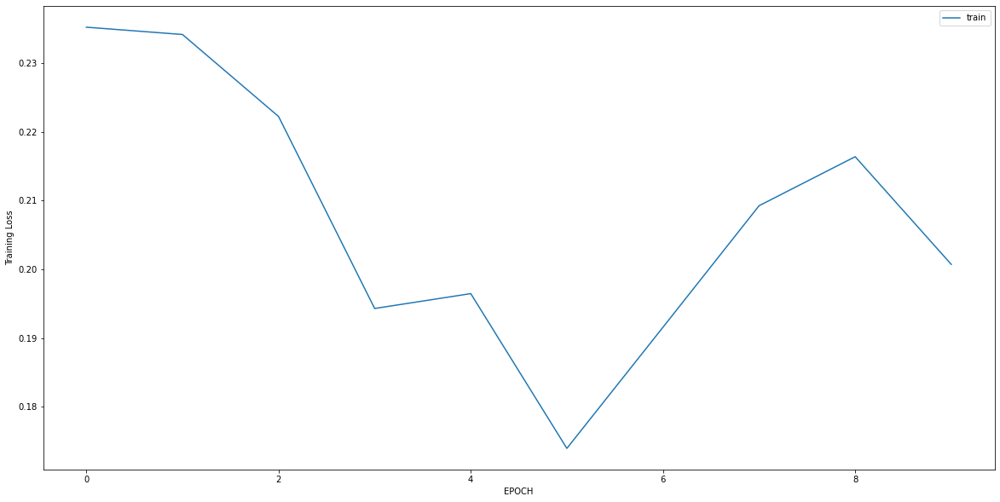

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.7639 - accuracy: 0.7517
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.5556 - accuracy: 0.7935
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3841 - accuracy: 0.8213
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3246 - accuracy: 0.8492
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2863 - accuracy: 0.8724
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2483 - accuracy: 0.8910
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2310 - accuracy: 0.8933
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2121 - accuracy: 0.9095
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2055 - accuracy: 0.9142
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1880 - accuracy: 0.9350


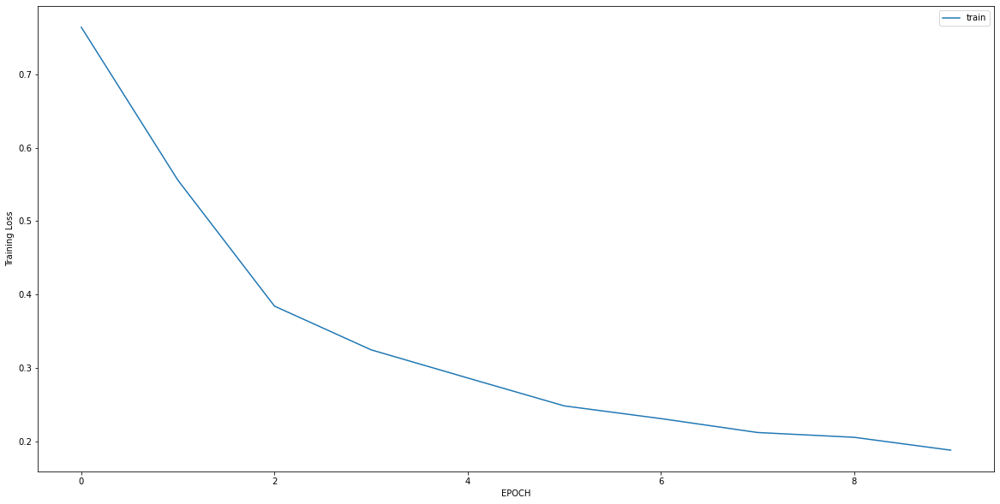

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 2.0113 - accuracy: 0.4007
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.7502 - accuracy: 0.4007
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.3039 - accuracy: 0.4043
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9117 - accuracy: 0.4260
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7345 - accuracy: 0.4946
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6924 - accuracy: 0.5451
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6322 - accuracy: 0.6282
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5978 - accuracy: 0.6462
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5898 - accuracy: 0.6751
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5753 - accuracy: 0.6787


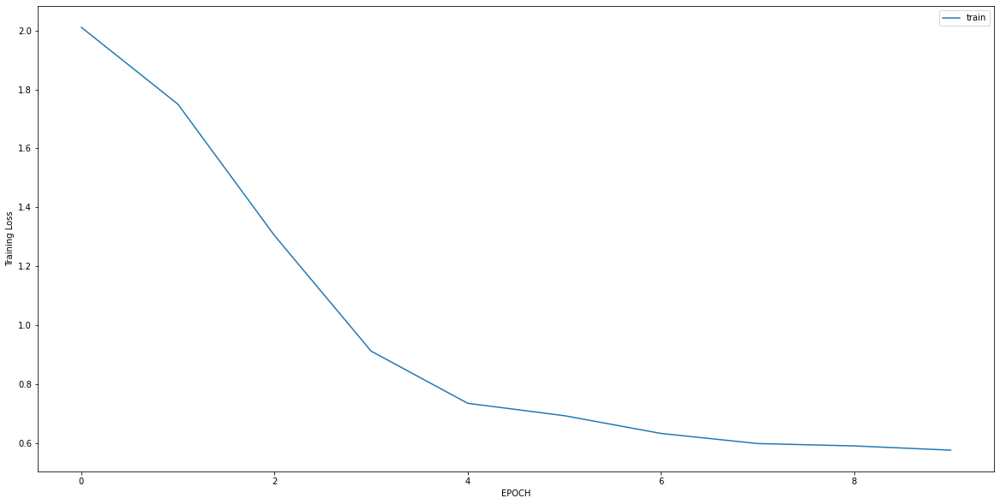

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5174 - accuracy: 0.7657
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4563 - accuracy: 0.8357
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4035 - accuracy: 0.8601
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4216 - accuracy: 0.8531
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4223 - accuracy: 0.8636
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3702 - accuracy: 0.8881
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3818 - accuracy: 0.8776
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3808 - accuracy: 0.8741
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3645 - accuracy: 0.8776
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3384 - accuracy: 0.8881


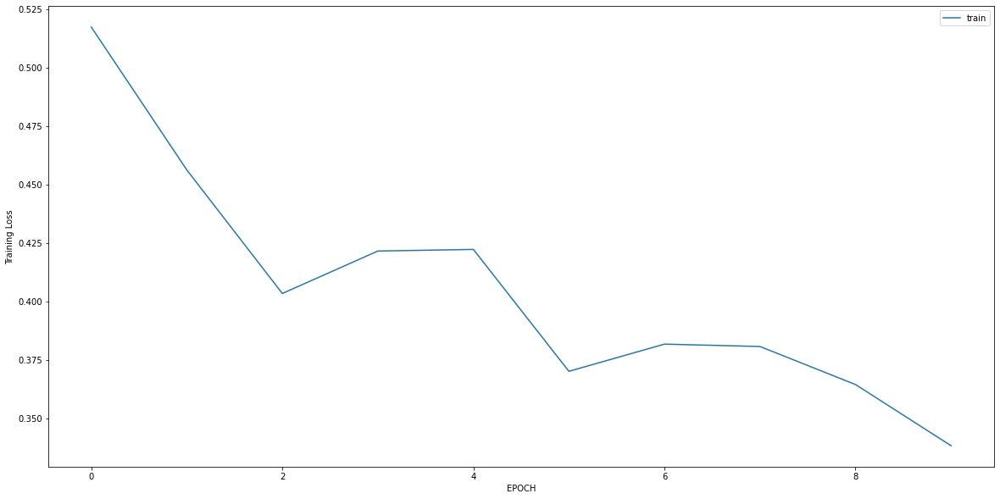

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2070 - accuracy: 0.9637
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1796 - accuracy: 0.9718
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1573 - accuracy: 0.9798
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1401 - accuracy: 0.9798
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1237 - accuracy: 0.9798
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1287 - accuracy: 0.9919
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1046 - accuracy: 0.9879
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0981 - accuracy: 0.9960
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0979 - accuracy: 0.9798
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0812 - accuracy: 0.9960


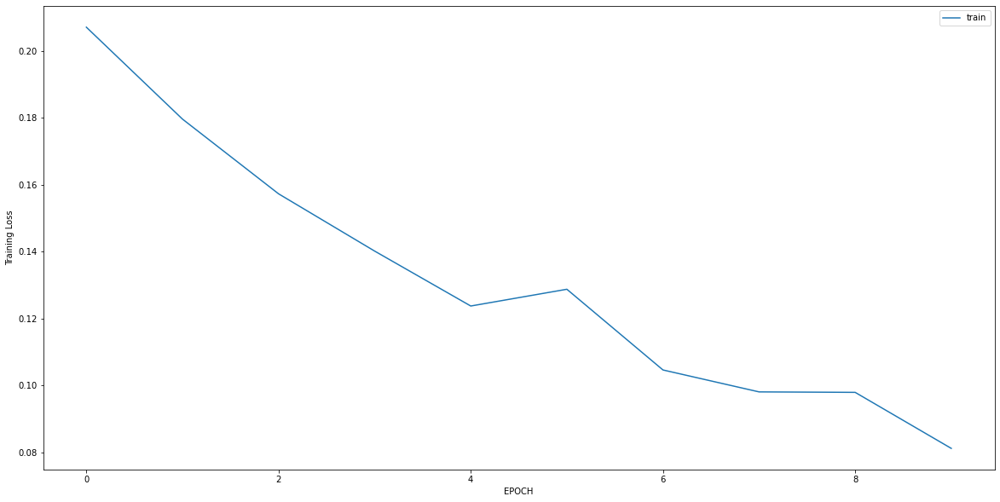

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1130 - accuracy: 0.9781
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0911 - accuracy: 0.9843
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0983 - accuracy: 0.9937
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0817 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0670 - accuracy: 0.9969
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0616 - accuracy: 0.9969
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0605 - accuracy: 0.9969
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0724 - accuracy: 0.9875
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0649 - accuracy: 0.9937
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0637 - accuracy: 0.9937


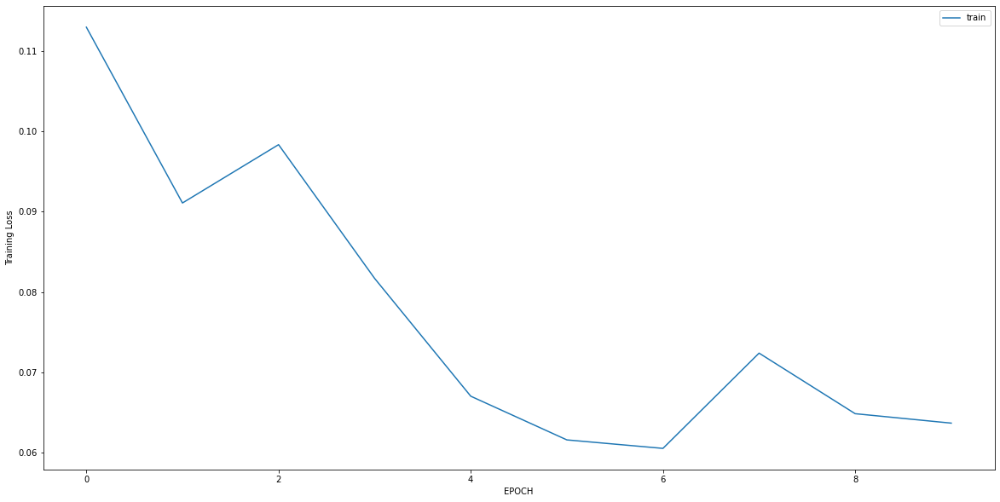

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5875 - accuracy: 0.8583
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3328 - accuracy: 0.9109
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1464 - accuracy: 0.9555
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1032 - accuracy: 0.9879
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0832 - accuracy: 0.9879
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0839 - accuracy: 0.9838
Epoch 7/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0834 - accuracy: 0.9838
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0850 - accuracy: 0.9838
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0885 - accuracy: 0.9717
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0689 - accuracy: 0.9879


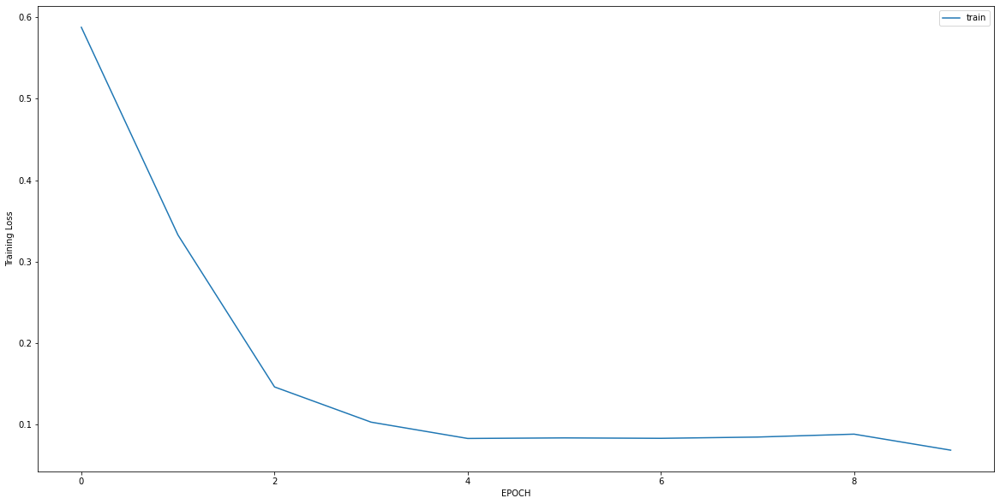

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 1.2111 - accuracy: 0.6691
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0931 - accuracy: 0.6619
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9640 - accuracy: 0.6763
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.8508 - accuracy: 0.6619
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5523 - accuracy: 0.7770
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.3643 - accuracy: 0.8705
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3145 - accuracy: 0.9353
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3034 - accuracy: 0.9424
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2435 - accuracy: 0.9353
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1964 - accuracy: 0.9784


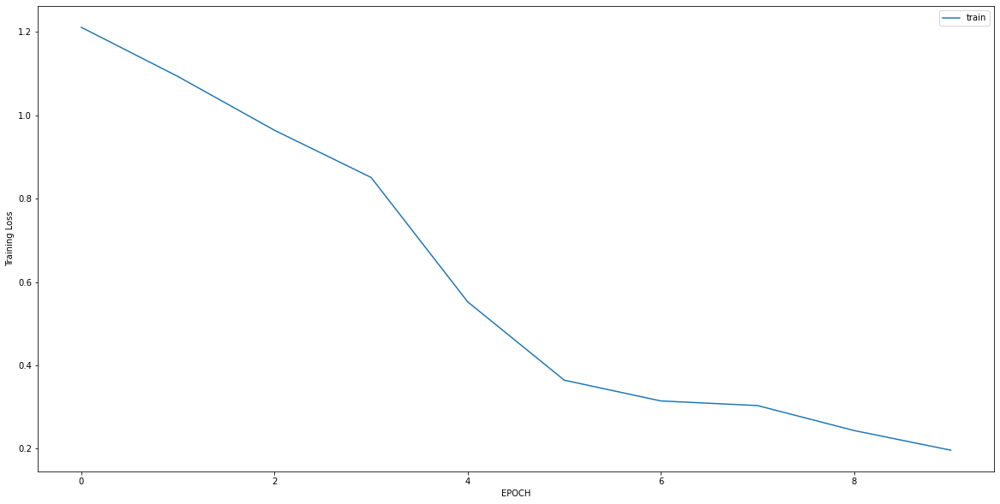

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 3.0209 - accuracy: 0.0000e+00
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 2.4928 - accuracy: 0.0082
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.6306 - accuracy: 0.0898
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6749 - accuracy: 0.5714
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2306 - accuracy: 0.9633
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0926 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0238 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0135 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0068 - accuracy: 1.0000


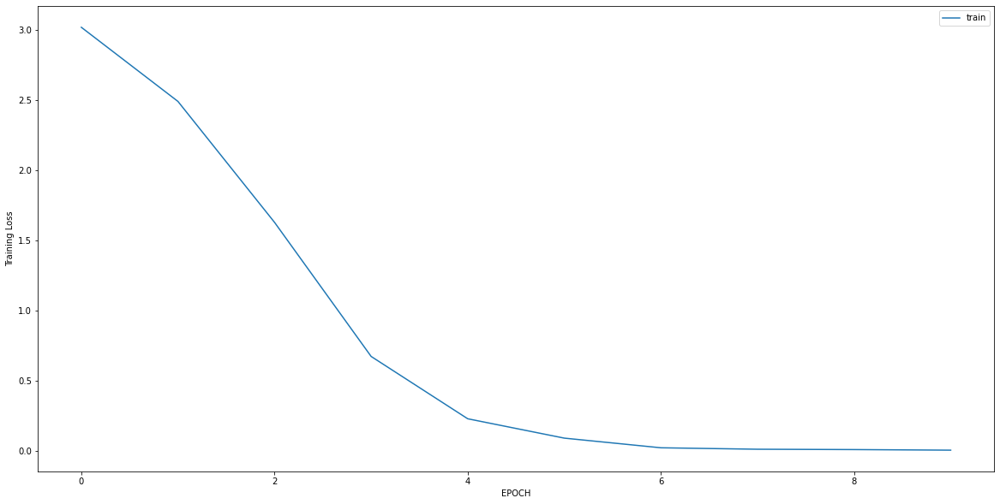

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 1.4670 - accuracy: 0.4524
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.9106 - accuracy: 0.5562
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5642 - accuracy: 0.7464
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3809 - accuracy: 0.8501
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2882 - accuracy: 0.8963
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2156 - accuracy: 0.9395
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1554 - accuracy: 0.9885
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1387 - accuracy: 0.9769
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1134 - accuracy: 0.9942
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1084 - accuracy: 1.0000


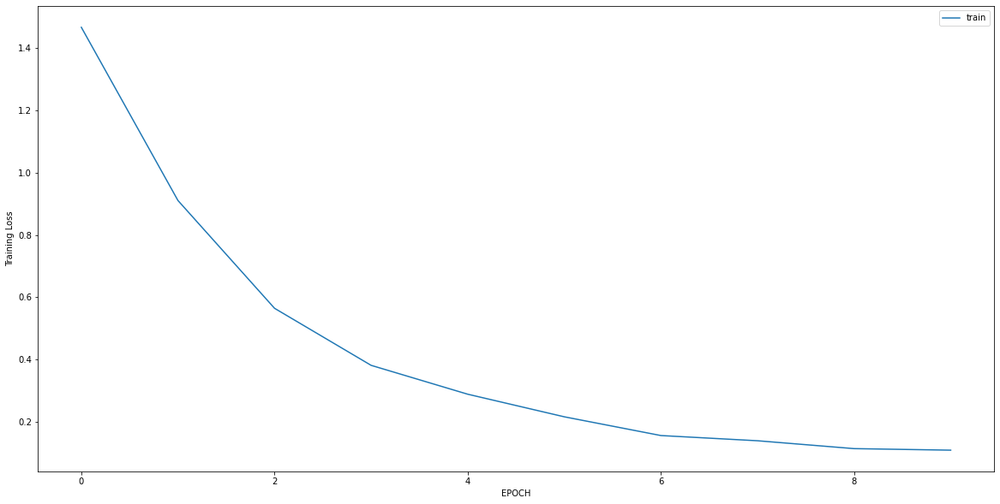

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.0305 - accuracy: 0.5326
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.7032 - accuracy: 0.6254
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5675 - accuracy: 0.7148
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4557 - accuracy: 0.7663
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4270 - accuracy: 0.8247
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3713 - accuracy: 0.8797
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3528 - accuracy: 0.8694
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3089 - accuracy: 0.9072
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2924 - accuracy: 0.9175
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2715 - accuracy: 0.9313


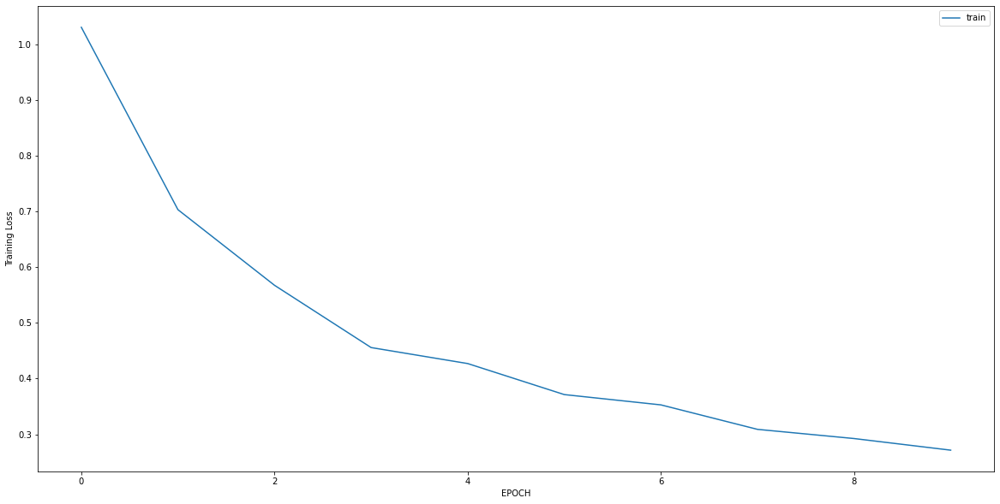

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1804 - accuracy: 0.9244
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0200 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0141 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0131 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0093 - accuracy: 1.0000


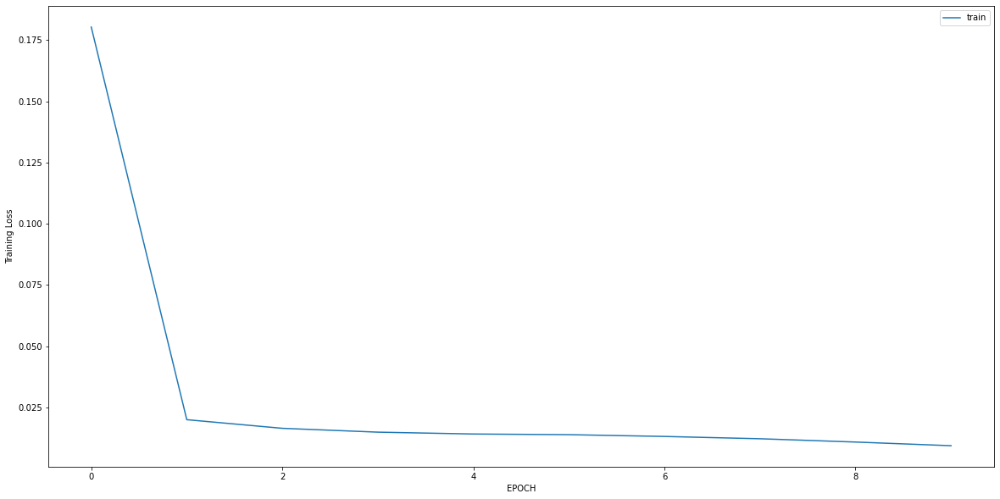

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4736 - accuracy: 0.7647
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2125 - accuracy: 0.9375
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2188 - accuracy: 0.9412
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1973 - accuracy: 0.9412
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1734 - accuracy: 0.9449
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1675 - accuracy: 0.9559
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1445 - accuracy: 0.9779
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1162 - accuracy: 0.9816
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1178 - accuracy: 0.9779
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1322 - accuracy: 0.9816


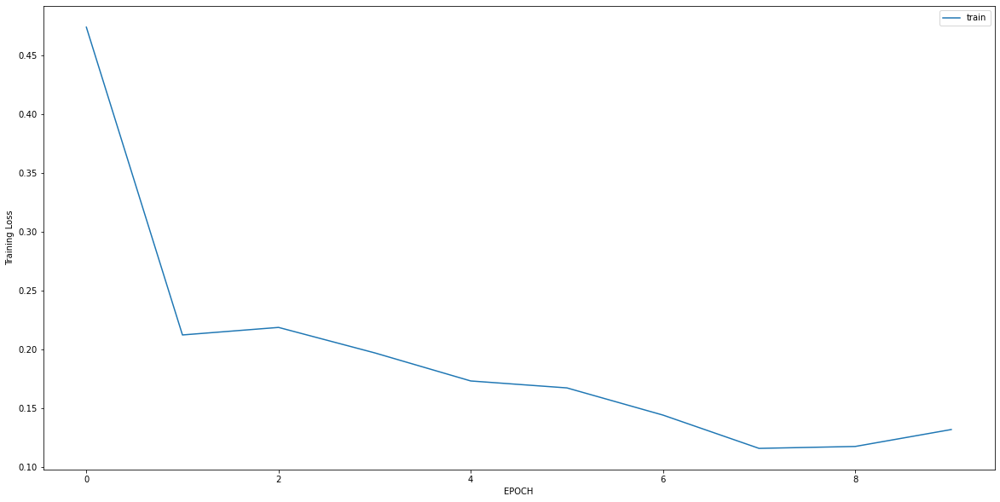

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0079 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0060 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0057 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0043 - accuracy: 1.0000


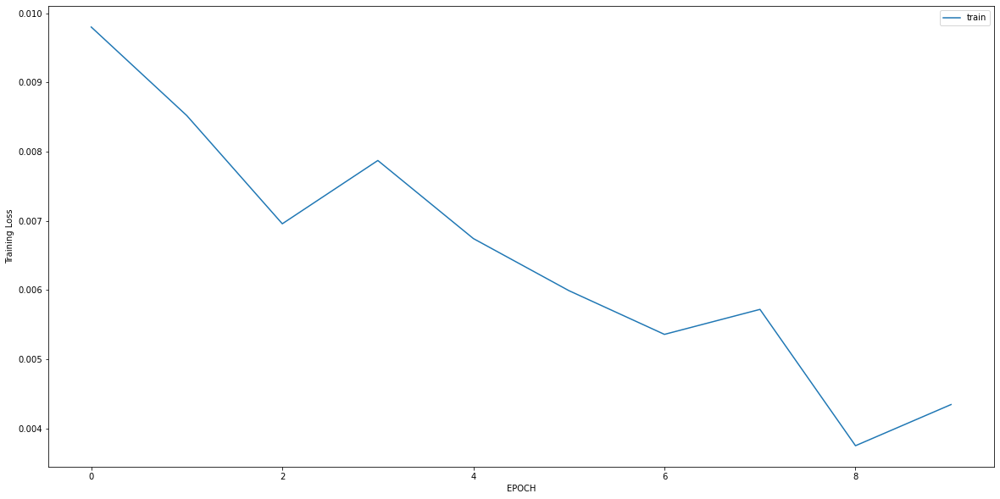

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8359 - accuracy: 0.8414
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3898 - accuracy: 0.8828
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2247 - accuracy: 0.9207
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2108 - accuracy: 0.9414
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2595 - accuracy: 0.9172
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2112 - accuracy: 0.9310
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1776 - accuracy: 0.9448
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1501 - accuracy: 0.9655
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1354 - accuracy: 0.9552
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1062 - accuracy: 0.9690


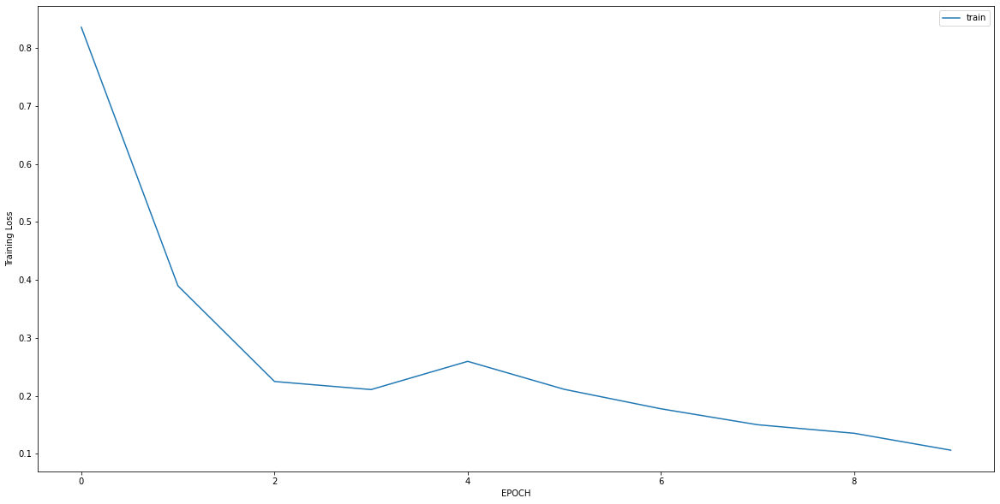

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3645 - accuracy: 0.8577
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2989 - accuracy: 0.9091
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3469 - accuracy: 0.8024
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2843 - accuracy: 0.8972
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2668 - accuracy: 0.8933
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2807 - accuracy: 0.8656
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2938 - accuracy: 0.9012
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2604 - accuracy: 0.8972
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2370 - accuracy: 0.9170
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2509 - accuracy: 0.9249


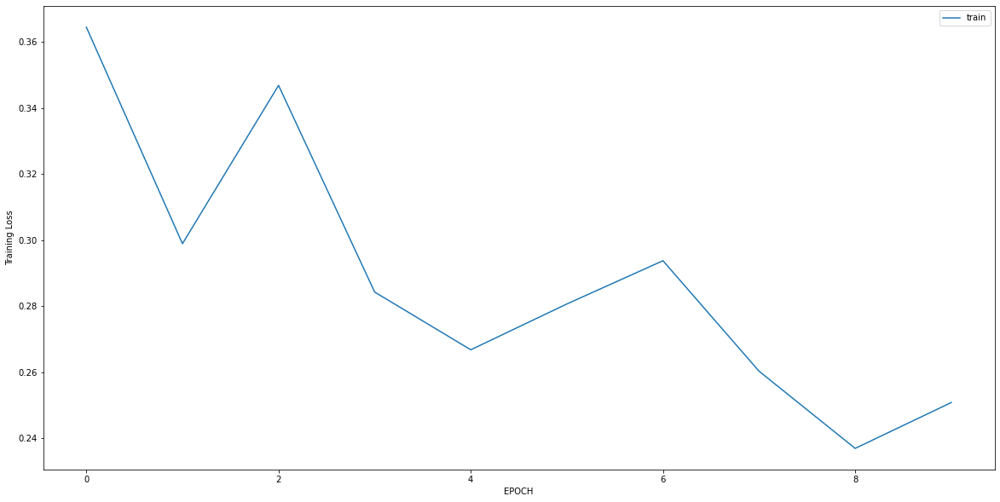

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 2.5292 - accuracy: 0.1496
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.2336 - accuracy: 0.9186
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0133 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0084 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0076 - accuracy: 1.0000


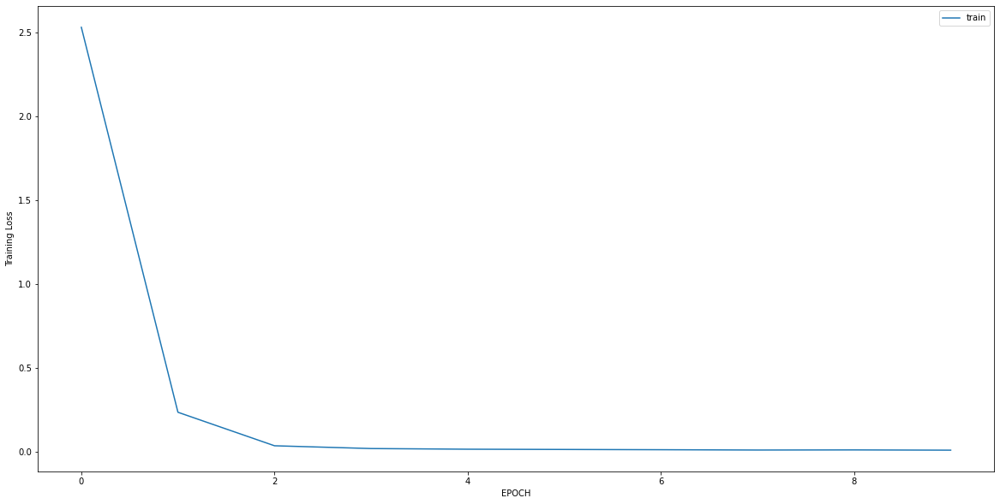

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.0065 - accuracy: 0.6742
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7215 - accuracy: 0.7191
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5742 - accuracy: 0.7678
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5149 - accuracy: 0.7790
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4527 - accuracy: 0.8202
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3808 - accuracy: 0.8652
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3383 - accuracy: 0.8727
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3214 - accuracy: 0.8914
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3192 - accuracy: 0.9064
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2520 - accuracy: 0.9288


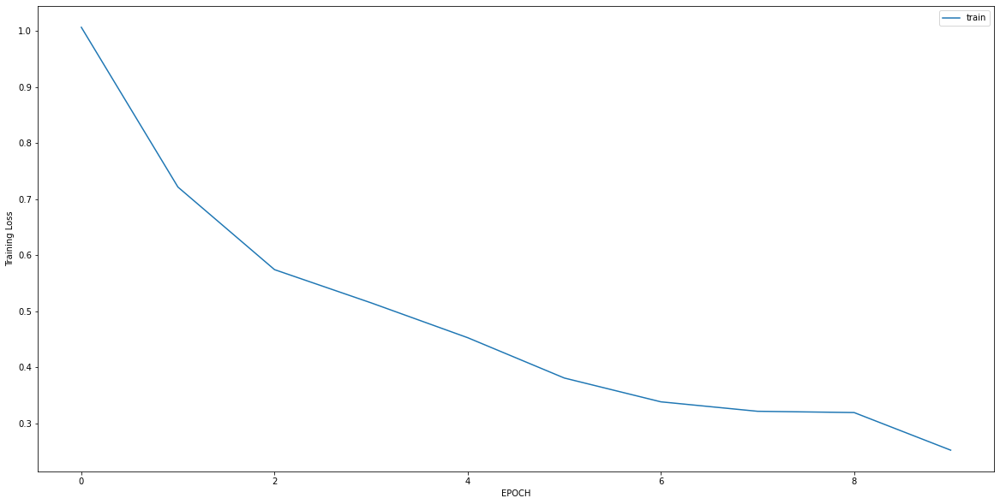

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6079 - accuracy: 0.8017
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5498 - accuracy: 0.7890
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4850 - accuracy: 0.8186
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3656 - accuracy: 0.8523
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3308 - accuracy: 0.8776
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2919 - accuracy: 0.8861
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2936 - accuracy: 0.9030
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2481 - accuracy: 0.9072
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2177 - accuracy: 0.9241
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2168 - accuracy: 0.9325


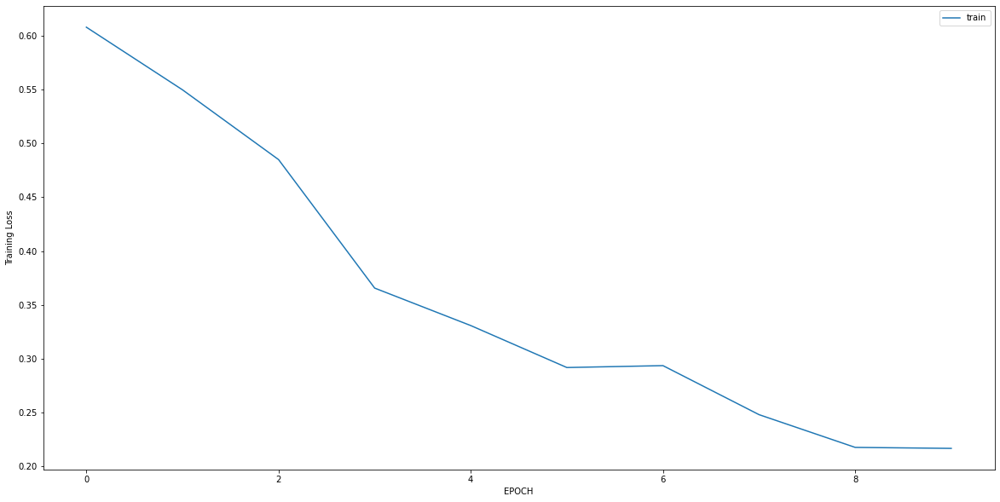

Epoch 1/10
2/2 [==============================] - 0s 8ms/step - loss: 2.2320 - accuracy: 0.0179
Epoch 2/10
2/2 [==============================] - 0s 8ms/step - loss: 1.8068 - accuracy: 0.0357
Epoch 3/10
2/2 [==============================] - 0s 8ms/step - loss: 1.3782 - accuracy: 0.0357
Epoch 4/10
2/2 [==============================] - 0s 8ms/step - loss: 1.1586 - accuracy: 0.0893
Epoch 5/10
2/2 [==============================] - 0s 6ms/step - loss: 0.9883 - accuracy: 0.2143
Epoch 6/10
2/2 [==============================] - 0s 7ms/step - loss: 0.7551 - accuracy: 0.4464
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 0.7654 - accuracy: 0.4643
Epoch 8/10
2/2 [==============================] - 0s 6ms/step - loss: 0.6528 - accuracy: 0.5714
Epoch 9/10
2/2 [==============================] - 0s 6ms/step - loss: 0.5940 - accuracy: 0.7679
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 0.5610 - accuracy: 0.7857


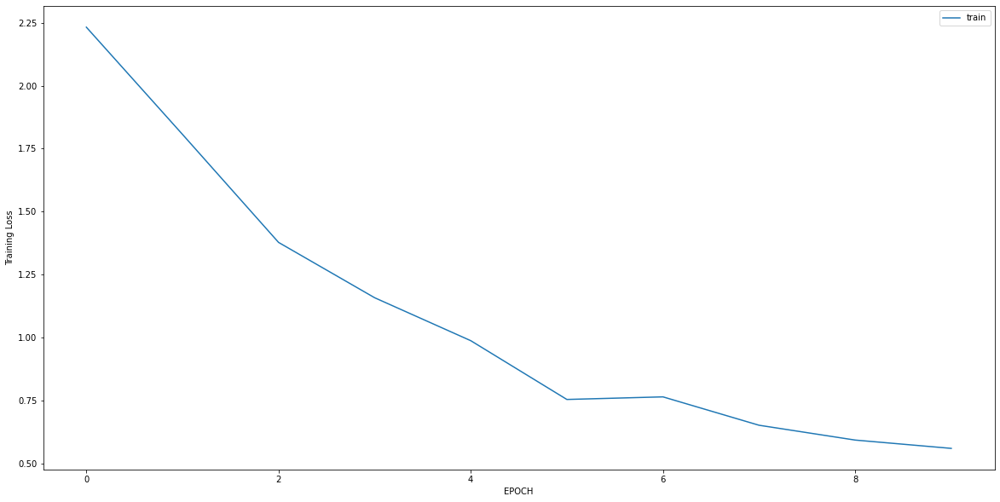

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3237 - accuracy: 0.3930
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8861 - accuracy: 0.4561
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6219 - accuracy: 0.6316
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5641 - accuracy: 0.6877
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5160 - accuracy: 0.7333
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5024 - accuracy: 0.7298
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4727 - accuracy: 0.7614
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4190 - accuracy: 0.8140
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3707 - accuracy: 0.8807
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3617 - accuracy: 0.8526


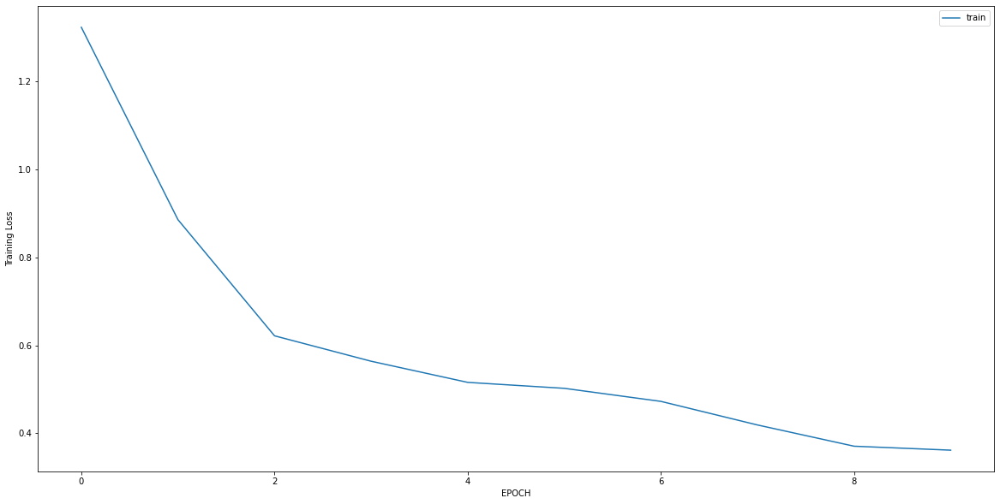

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7832 - accuracy: 0.4253
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5381 - accuracy: 0.8238
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4273 - accuracy: 0.9617
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3350 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2835 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2637 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2136 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1888 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1792 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1620 - accuracy: 1.0000


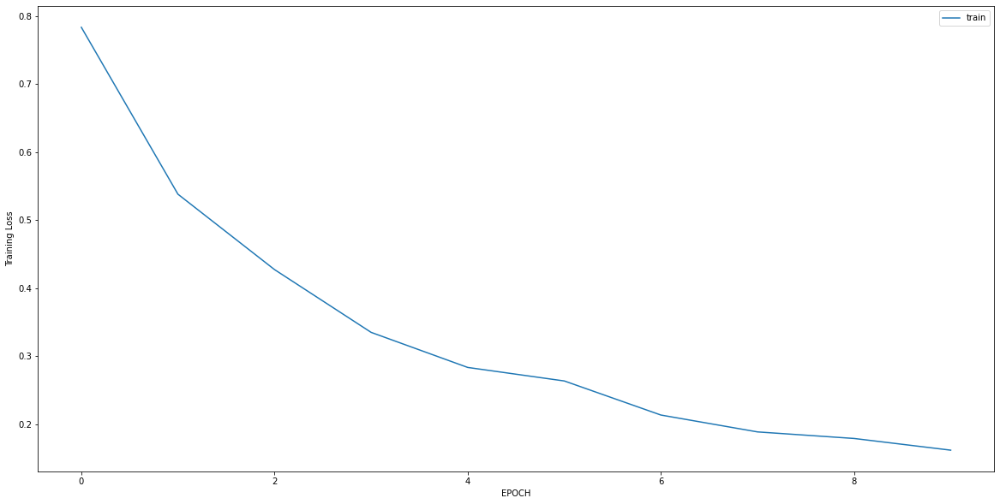

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 1.0000
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0151 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0109 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0107 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0089 - accuracy: 1.0000


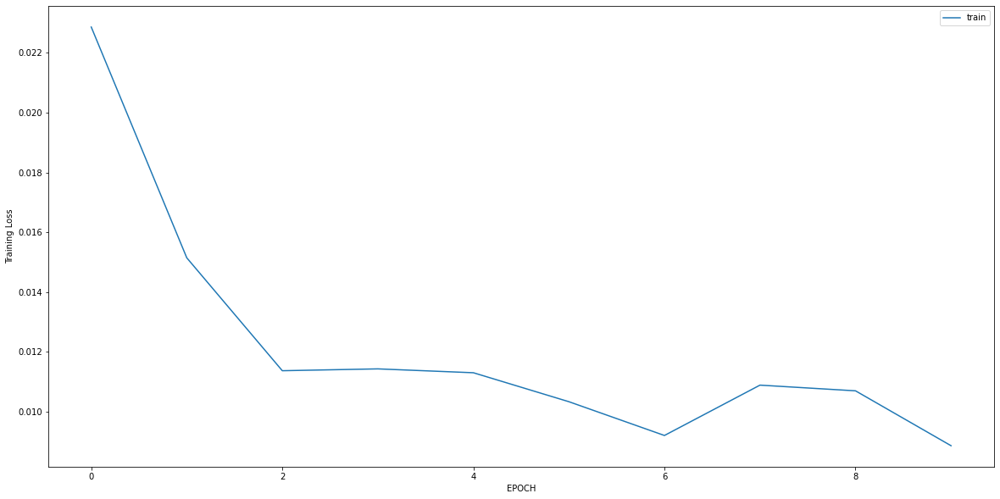

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1363 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1270 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1263 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1156 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1055 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0985 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0962 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0866 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0797 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0745 - accuracy: 1.0000


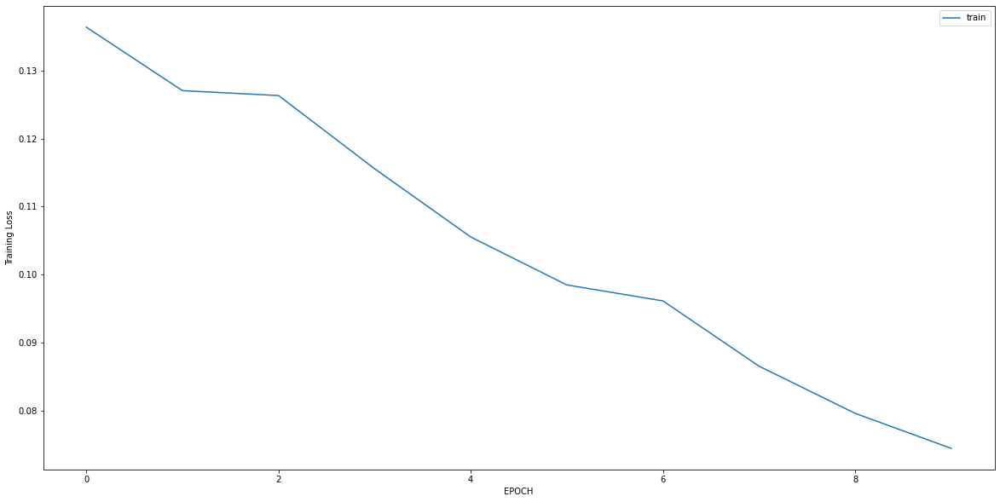

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 1.2661 - accuracy: 0.4989
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.9609 - accuracy: 0.5616
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.7359 - accuracy: 0.6868
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.5904 - accuracy: 0.7473
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4446 - accuracy: 0.8164
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3413 - accuracy: 0.8812
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2827 - accuracy: 0.9136
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2647 - accuracy: 0.9136
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2582 - accuracy: 0.9158
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2525 - accuracy: 0.9158


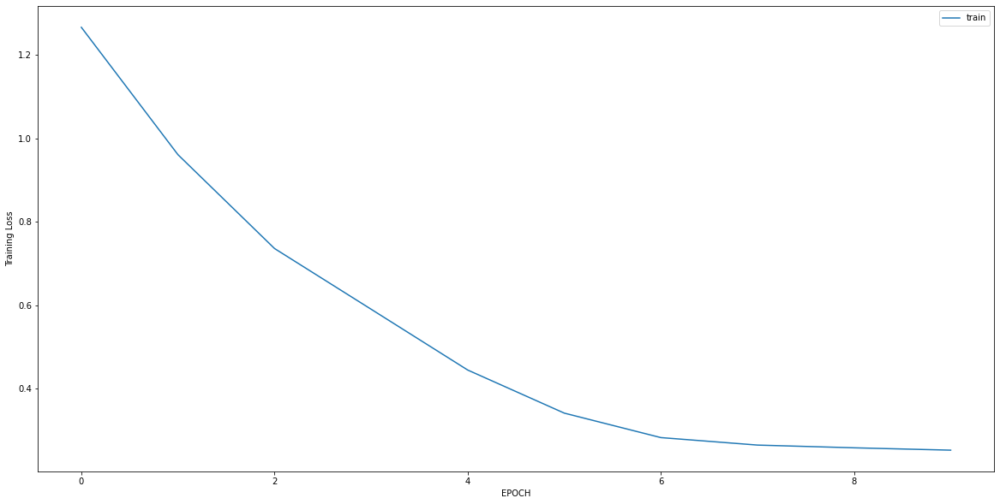

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1595 - accuracy: 0.9683
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1371 - accuracy: 0.9802
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1243 - accuracy: 0.9802
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1208 - accuracy: 0.9881
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0969 - accuracy: 0.9921
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0869 - accuracy: 0.9960
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0766 - accuracy: 0.9921
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0701 - accuracy: 0.9960
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0708 - accuracy: 0.9960
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0749 - accuracy: 0.9881


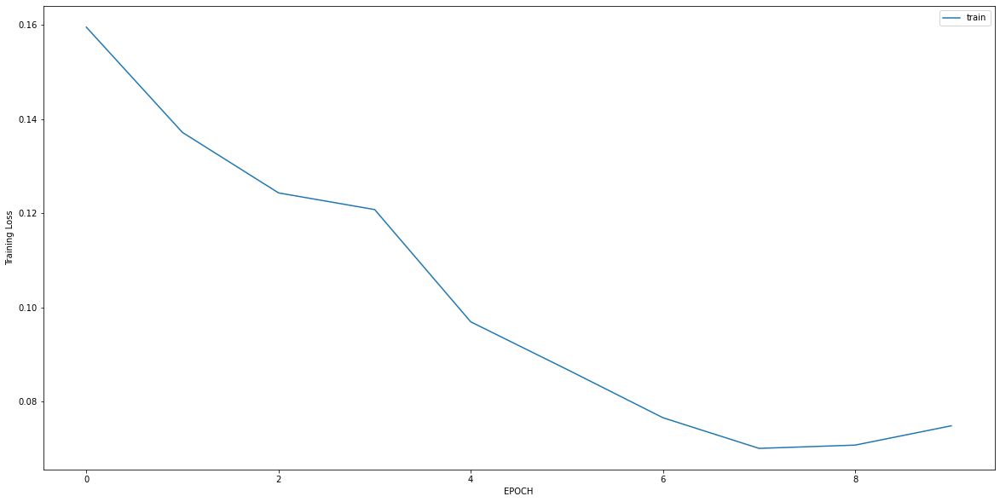

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 4.3286 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 2.6419 - accuracy: 0.0651
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3745 - accuracy: 0.8276
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0270 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0154 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0126 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0099 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0117 - accuracy: 1.0000


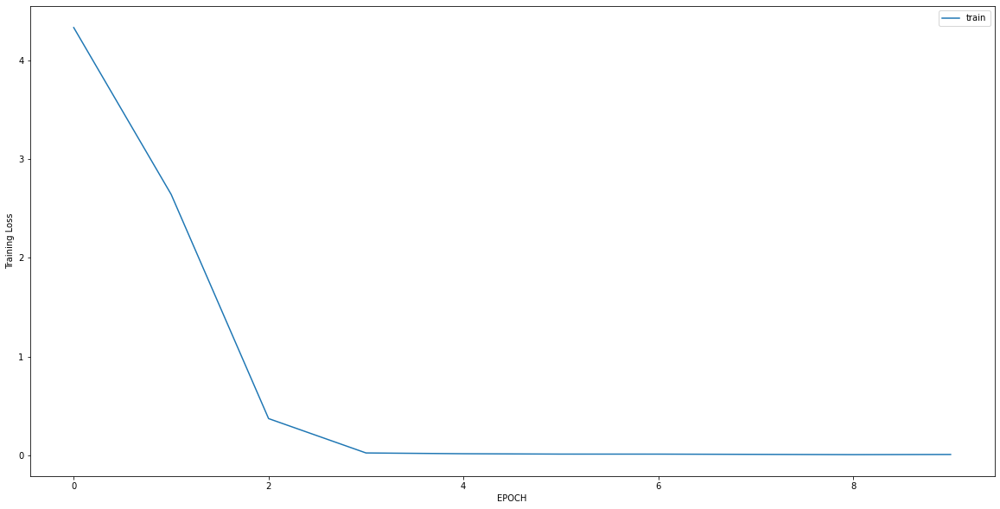

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.3563 - accuracy: 0.6060
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8259 - accuracy: 0.6854
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5218 - accuracy: 0.7881
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3913 - accuracy: 0.8377
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3614 - accuracy: 0.8609
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3393 - accuracy: 0.8642
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3003 - accuracy: 0.8974
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3031 - accuracy: 0.8808
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2618 - accuracy: 0.9073
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2558 - accuracy: 0.9106


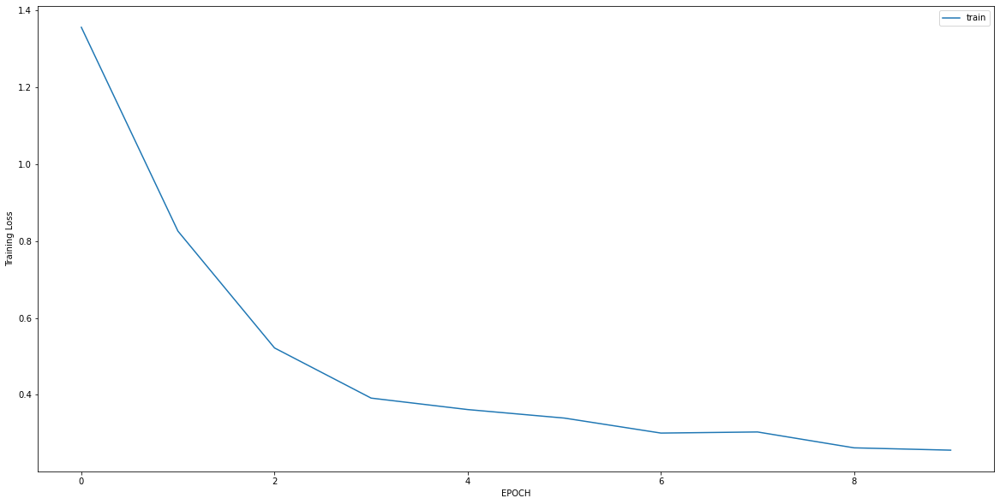

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.0427 - accuracy: 0.0575
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4715 - accuracy: 0.8199
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2008 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1589 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1200 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0881 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0791 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0666 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0677 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0526 - accuracy: 1.0000


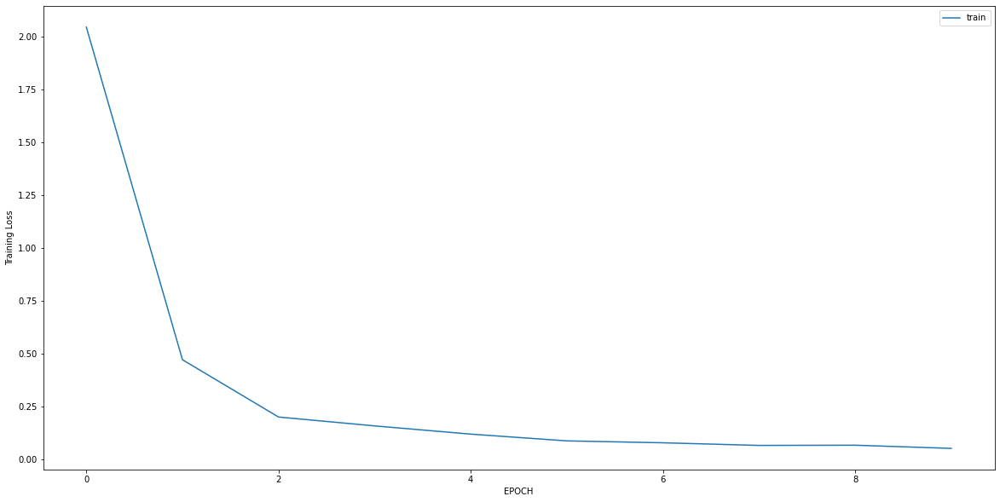

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1494 - accuracy: 0.5019
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0262 - accuracy: 0.4906
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8215 - accuracy: 0.6105
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6641 - accuracy: 0.6779
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5396 - accuracy: 0.7341
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4911 - accuracy: 0.7640
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4623 - accuracy: 0.7978
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4292 - accuracy: 0.8352
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3712 - accuracy: 0.8614
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3429 - accuracy: 0.8652


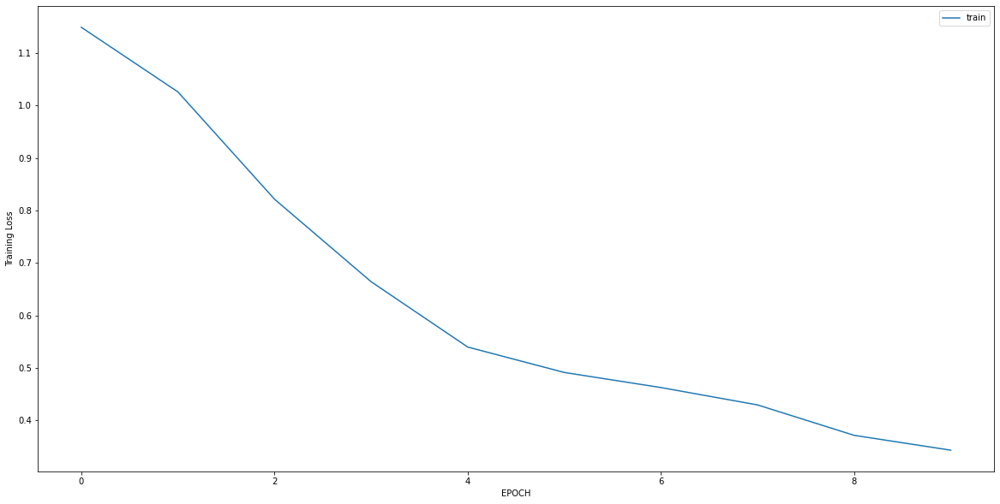

Epoch 1/10
2/2 [==============================] - 0s 7ms/step - loss: 0.8325 - accuracy: 0.3571
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 0.7961 - accuracy: 0.4286
Epoch 3/10
2/2 [==============================] - 0s 8ms/step - loss: 0.7544 - accuracy: 0.4643
Epoch 4/10
2/2 [==============================] - 0s 8ms/step - loss: 0.6172 - accuracy: 0.6786
Epoch 5/10
2/2 [==============================] - 0s 8ms/step - loss: 0.6494 - accuracy: 0.6250
Epoch 6/10
2/2 [==============================] - 0s 7ms/step - loss: 0.5250 - accuracy: 0.8393
Epoch 7/10
2/2 [==============================] - 0s 7ms/step - loss: 0.4739 - accuracy: 0.8929
Epoch 8/10
2/2 [==============================] - 0s 5ms/step - loss: 0.4021 - accuracy: 0.8929
Epoch 9/10
2/2 [==============================] - 0s 6ms/step - loss: 0.3316 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 0.2576 - accuracy: 1.0000


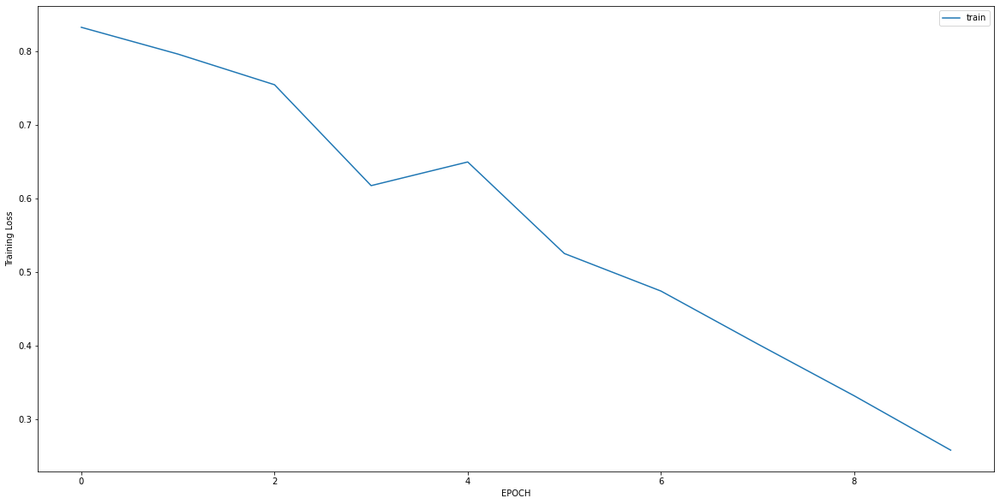

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.6621 - accuracy: 0.6890
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.5900 - accuracy: 0.7279
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4781 - accuracy: 0.7689
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4087 - accuracy: 0.8078
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3634 - accuracy: 0.8423
Epoch 6/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3303 - accuracy: 0.8769
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2980 - accuracy: 0.9050
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2748 - accuracy: 0.9093
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2587 - accuracy: 0.9071
Epoch 10/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2285 - accuracy: 0.9222


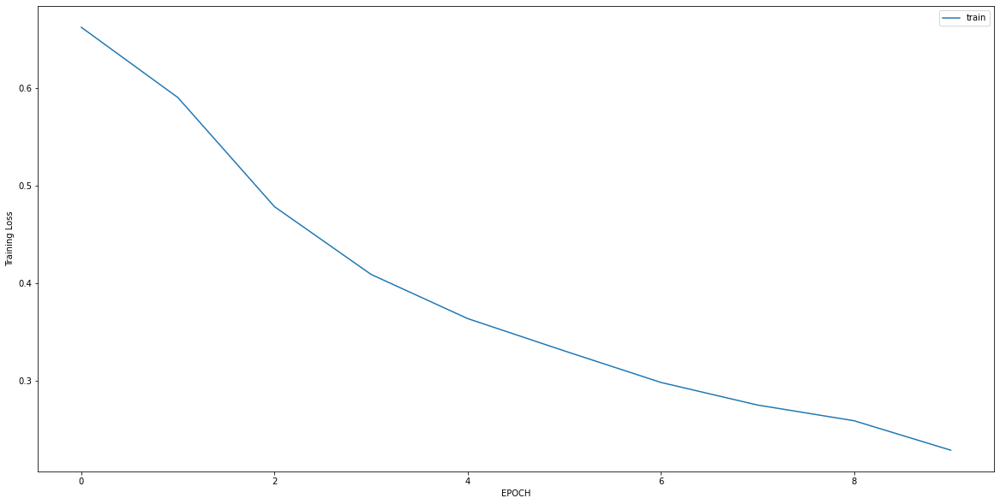

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.3397 - accuracy: 0.0076
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 2.2907 - accuracy: 0.0417
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.4758 - accuracy: 0.1439
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5888 - accuracy: 0.6780
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1785 - accuracy: 0.9924
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0948 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0638 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0524 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0292 - accuracy: 1.0000


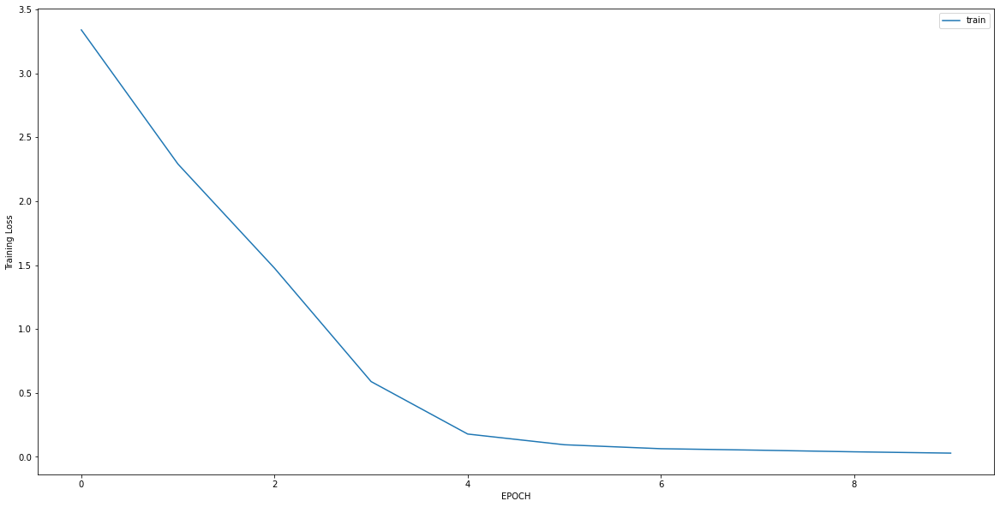

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0790 - accuracy: 1.0000
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0578 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0249 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0227 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0162 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0131 - accuracy: 1.0000


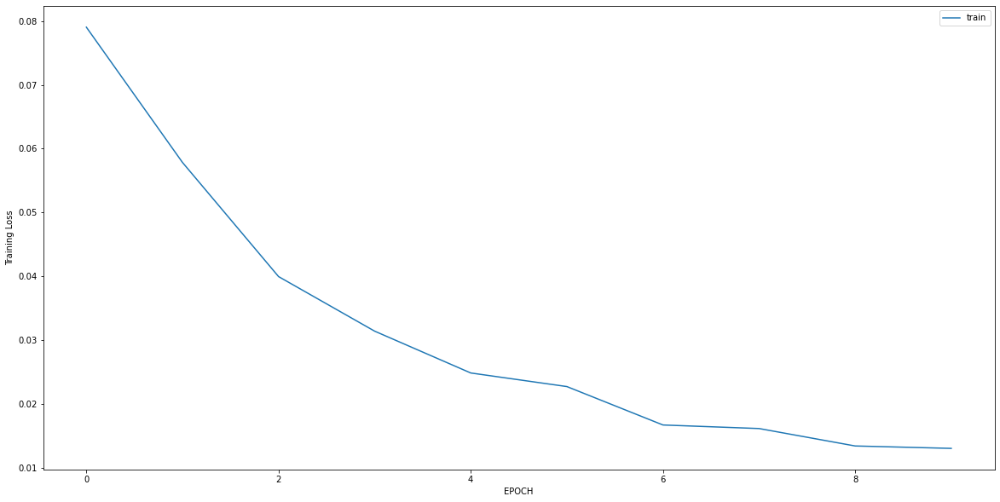

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0070 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0056 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0059 - accuracy: 1.0000


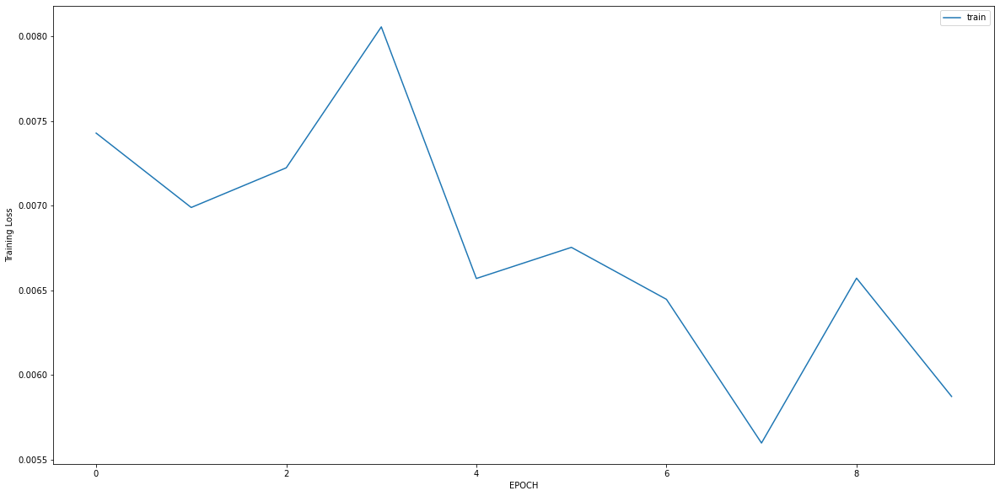

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.2384 - accuracy: 0.5794
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7258 - accuracy: 0.6230
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6410 - accuracy: 0.6825
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5432 - accuracy: 0.7857
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4864 - accuracy: 0.8056
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4456 - accuracy: 0.8135
Epoch 7/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3832 - accuracy: 0.8452
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4003 - accuracy: 0.8651
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3675 - accuracy: 0.8571
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3237 - accuracy: 0.9008


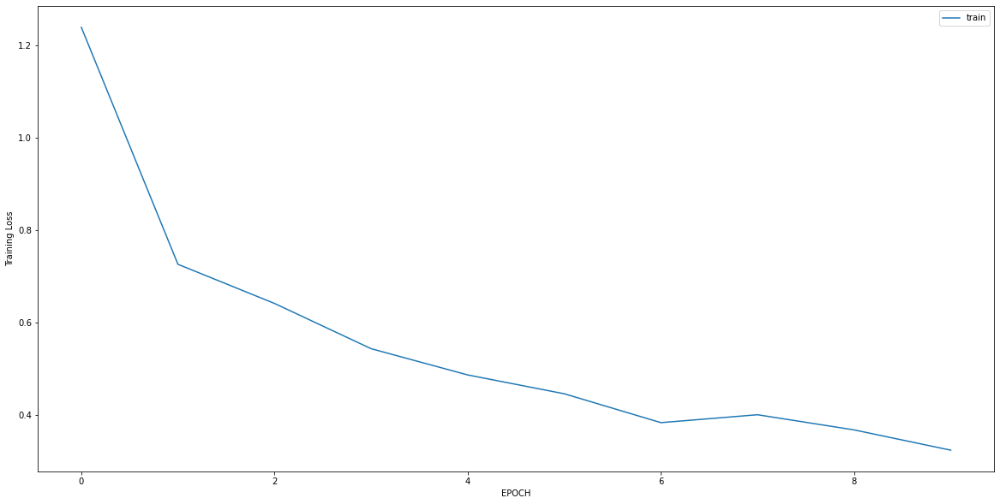

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2875 - accuracy: 0.8860
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1770 - accuracy: 0.9412
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1532 - accuracy: 0.9559
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1385 - accuracy: 0.9632
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1526 - accuracy: 0.9522
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1362 - accuracy: 0.9669
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1352 - accuracy: 0.9632
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1370 - accuracy: 0.9522
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1235 - accuracy: 0.9706
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1272 - accuracy: 0.9706


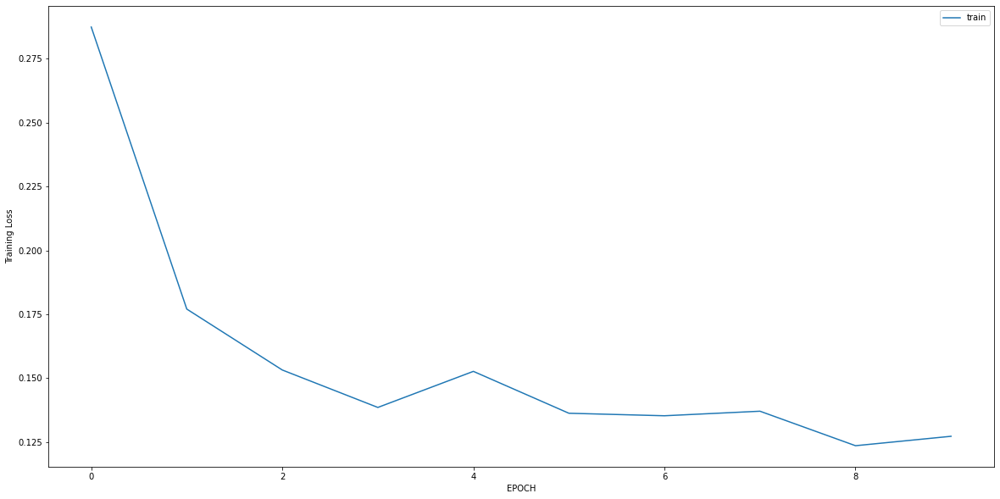

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7513 - accuracy: 0.8246
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5264 - accuracy: 0.8667
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3542 - accuracy: 0.8456
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3062 - accuracy: 0.8877
Epoch 5/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2874 - accuracy: 0.8842
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2947 - accuracy: 0.8982
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2774 - accuracy: 0.9053
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2743 - accuracy: 0.8912
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2606 - accuracy: 0.8982
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2452 - accuracy: 0.9263


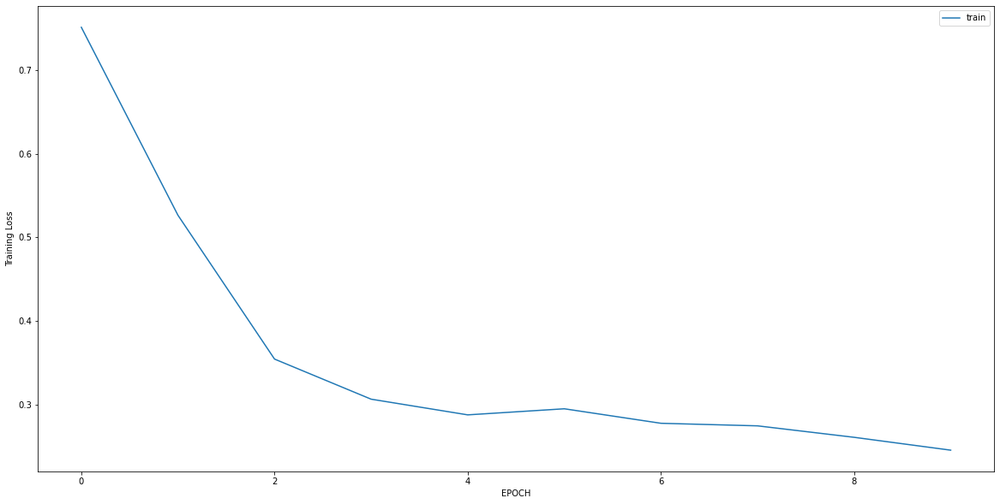

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6322 - accuracy: 0.7915
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3652 - accuracy: 0.8731
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2542 - accuracy: 0.9003
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2074 - accuracy: 0.9245
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1988 - accuracy: 0.9305
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1890 - accuracy: 0.9305
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1853 - accuracy: 0.9486
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2092 - accuracy: 0.9335
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1676 - accuracy: 0.9396
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2156 - accuracy: 0.9124


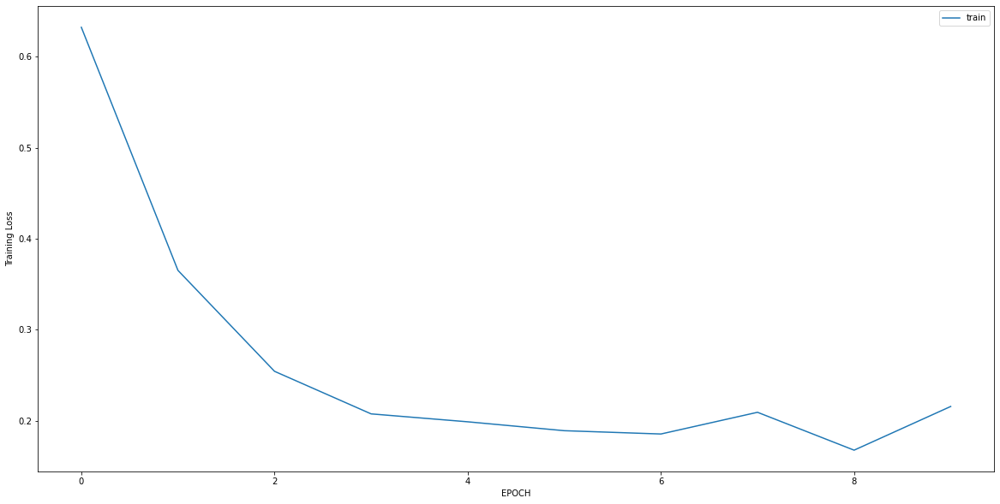

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0361 - accuracy: 0.5968
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1470 - accuracy: 0.9839
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1532 - accuracy: 0.9597
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1586 - accuracy: 0.9516
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1310 - accuracy: 0.9637
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1177 - accuracy: 0.9718
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1046 - accuracy: 0.9798
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1064 - accuracy: 0.9798
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0857 - accuracy: 0.9879
Epoch 10/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0832 - accuracy: 0.9839


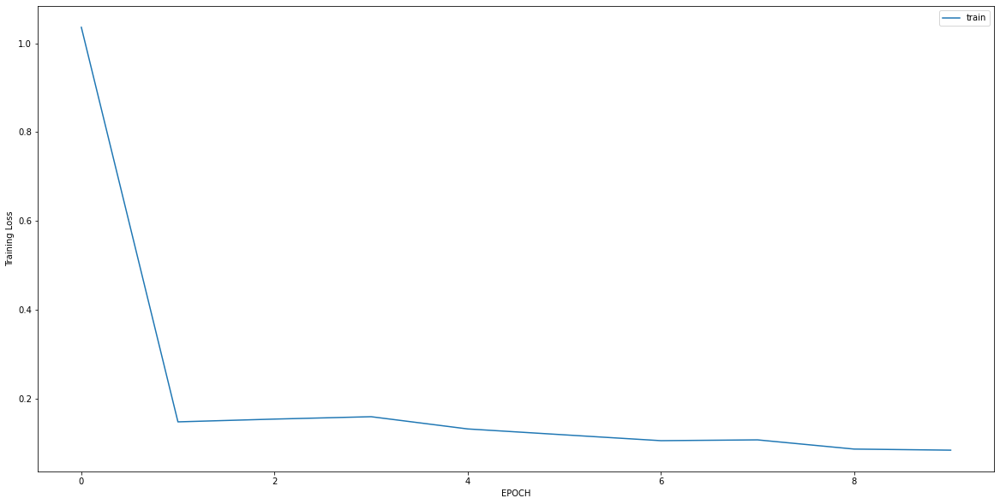

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6499 - accuracy: 0.7815
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4595 - accuracy: 0.8296
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3999 - accuracy: 0.8444
Epoch 4/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3525 - accuracy: 0.8519
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3266 - accuracy: 0.8778
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2858 - accuracy: 0.9074
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2530 - accuracy: 0.9148
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2257 - accuracy: 0.9222
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2025 - accuracy: 0.9370
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1746 - accuracy: 0.9444


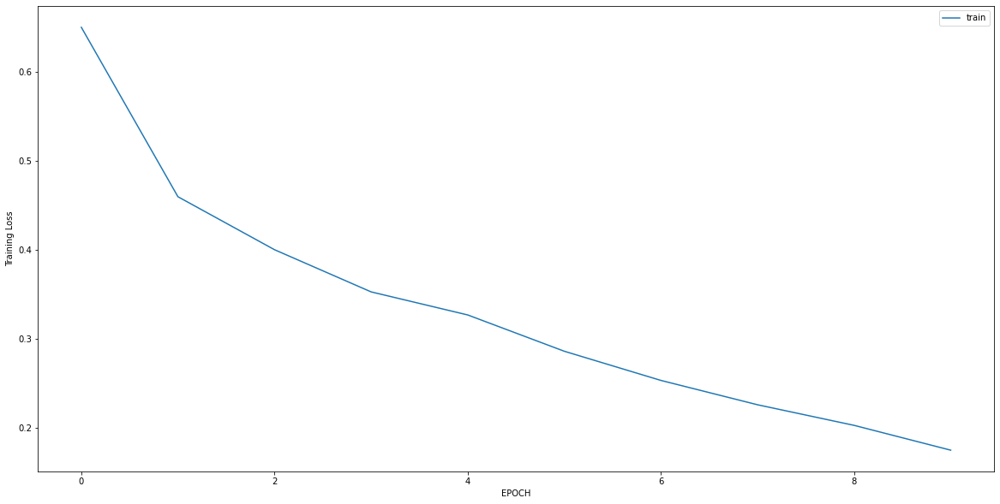

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.4380 - accuracy: 0.5361
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7954 - accuracy: 0.6014
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2500 - accuracy: 0.9278
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2296 - accuracy: 0.9175
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2256 - accuracy: 0.9141
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2109 - accuracy: 0.9210
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1938 - accuracy: 0.9313
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1853 - accuracy: 0.9416
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1810 - accuracy: 0.9450
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1582 - accuracy: 0.9485


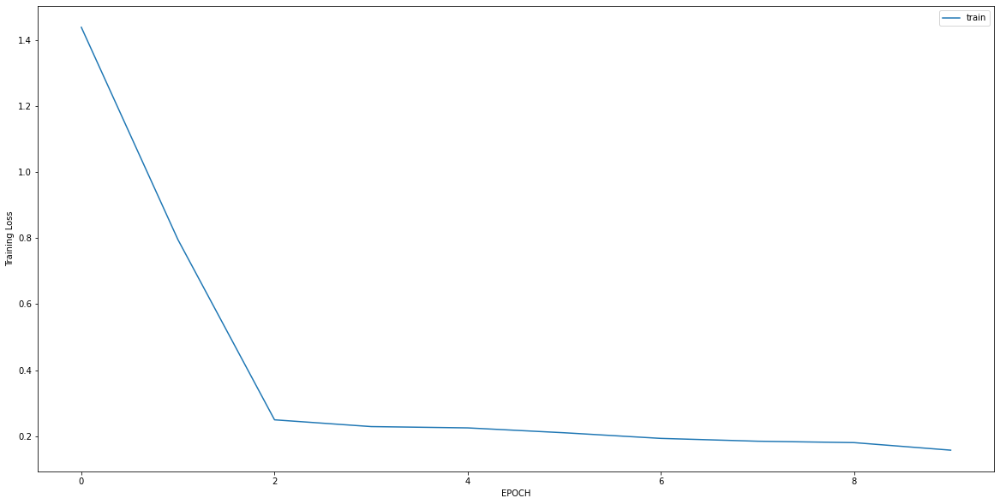

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.6678 - accuracy: 0.7971
Epoch 2/10
5/5 [==============================] - 0s 7ms/step - loss: 0.3769 - accuracy: 0.8768
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.4650 - accuracy: 0.8478
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3196 - accuracy: 0.8696
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4185 - accuracy: 0.8406
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4496 - accuracy: 0.8261
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.2456 - accuracy: 0.9058
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2726 - accuracy: 0.8913
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2119 - accuracy: 0.9348
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1795 - accuracy: 0.9493


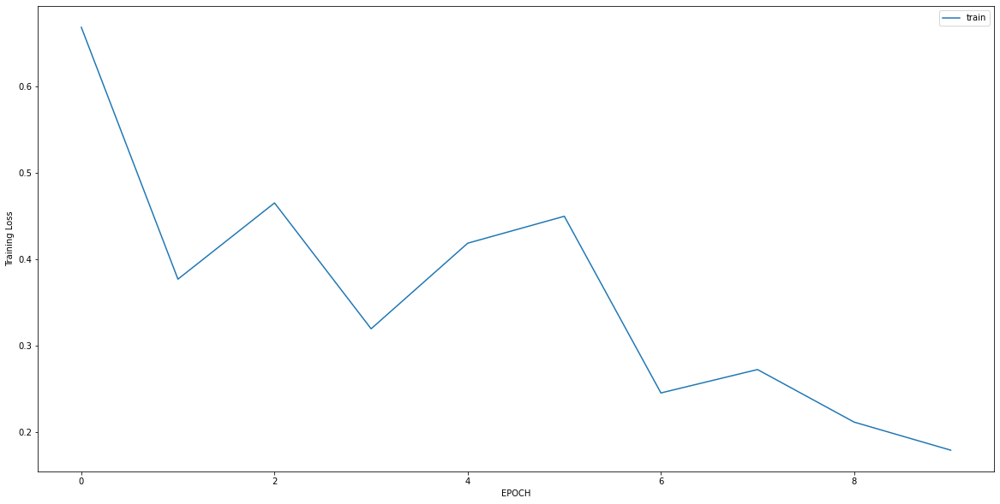

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1933 - accuracy: 0.9064
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1365 - accuracy: 0.9591
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1197 - accuracy: 0.9678
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1198 - accuracy: 0.9620
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1109 - accuracy: 0.9678
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1079 - accuracy: 0.9708
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1136 - accuracy: 0.9620
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0956 - accuracy: 0.9795
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0814 - accuracy: 0.9854
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0834 - accuracy: 0.9795


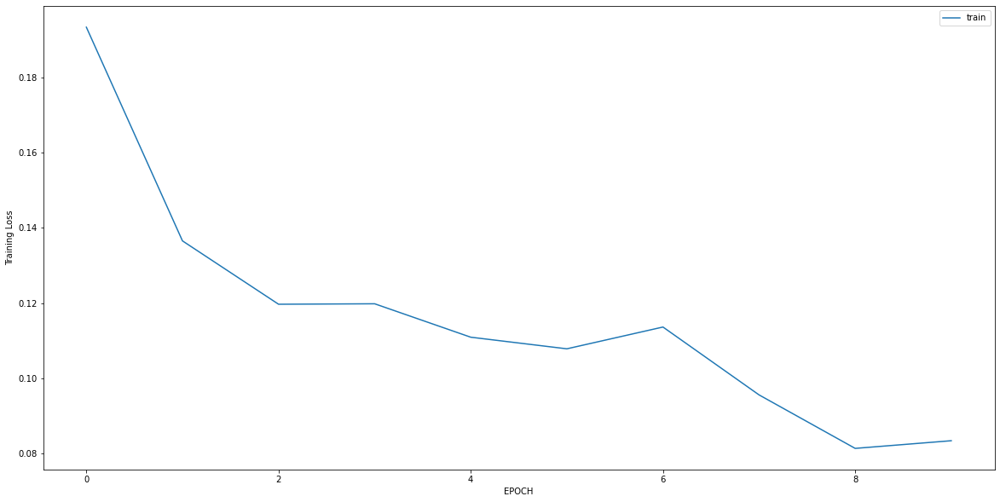

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 1.4590 - accuracy: 0.4462
Epoch 2/10
12/12 [==============================] - 0s 7ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0195 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 6ms/step - loss: 0.0185 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0175 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0137 - accuracy: 1.0000


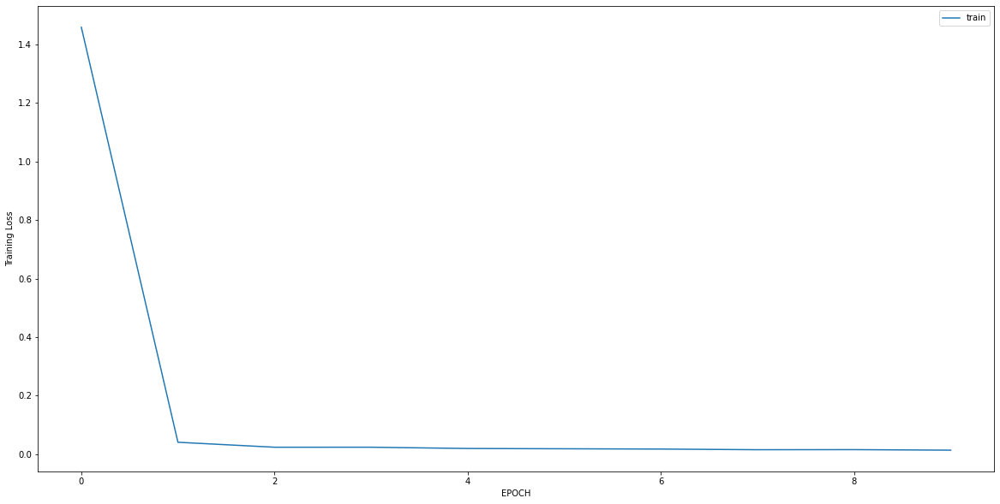

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.5389 - accuracy: 0.5338
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3241 - accuracy: 0.6085
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0595 - accuracy: 0.6370
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8695 - accuracy: 0.6726
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7294 - accuracy: 0.7046
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6313 - accuracy: 0.7438
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5375 - accuracy: 0.7722
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4647 - accuracy: 0.8007
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3981 - accuracy: 0.8327
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3501 - accuracy: 0.8541


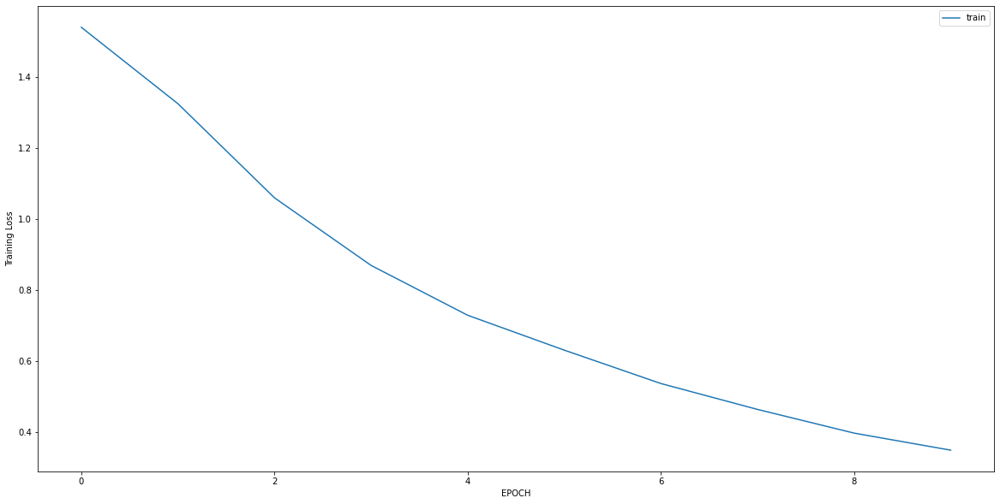

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2462 - accuracy: 0.9461
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2509 - accuracy: 0.9394
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2266 - accuracy: 0.9428
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2181 - accuracy: 0.9428
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2022 - accuracy: 0.9495
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1981 - accuracy: 0.9596
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1943 - accuracy: 0.9495
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1698 - accuracy: 0.9596
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1693 - accuracy: 0.9596
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1709 - accuracy: 0.9461


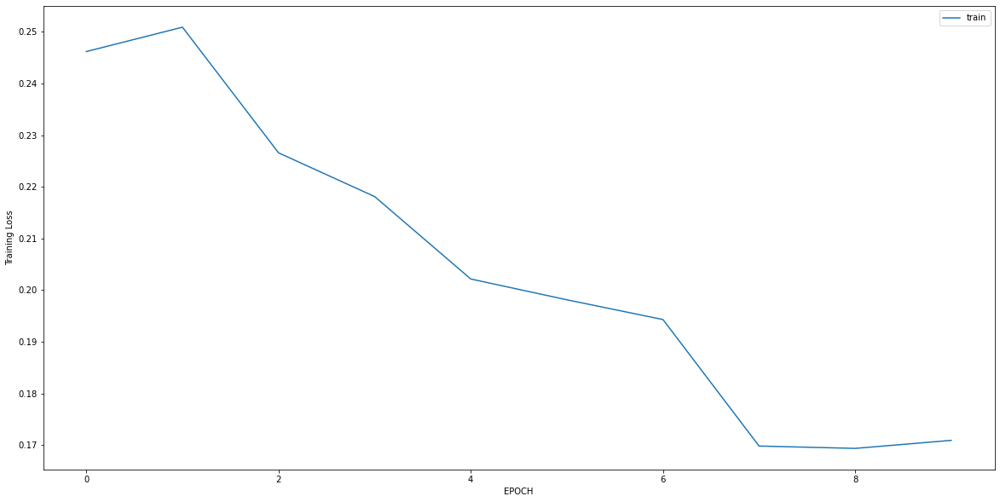

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 0.7340 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5750 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5722 - accuracy: 0.8228
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5607 - accuracy: 0.8186
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5341 - accuracy: 0.8228
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4921 - accuracy: 0.8186
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4867 - accuracy: 0.8143
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4560 - accuracy: 0.8228
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4534 - accuracy: 0.8186


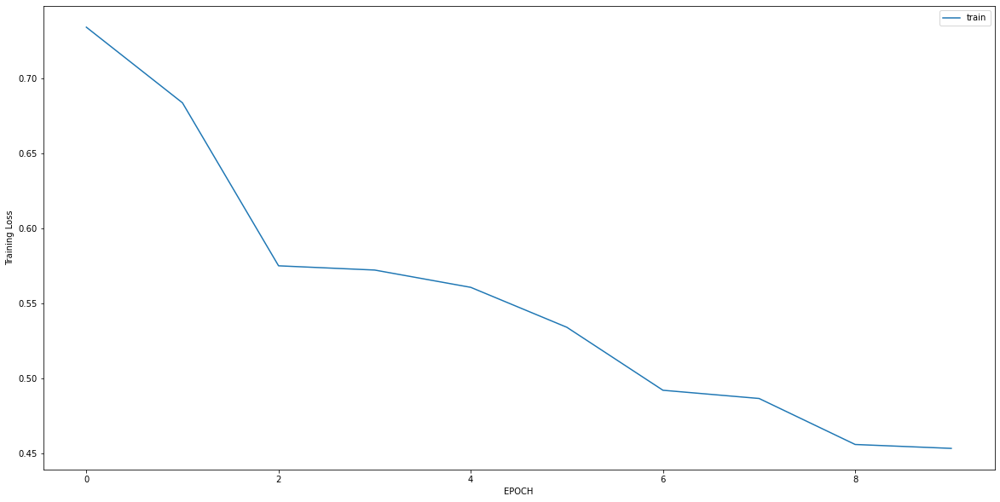

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2425 - accuracy: 0.9675
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2187 - accuracy: 0.9603
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1910 - accuracy: 0.9711
Epoch 4/10
9/9 [==============================] - 0s 7ms/step - loss: 0.1691 - accuracy: 0.9783
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1529 - accuracy: 0.9819
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1408 - accuracy: 0.9856
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1388 - accuracy: 0.9856
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1164 - accuracy: 0.9928
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1294 - accuracy: 0.9819
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1170 - accuracy: 0.9928


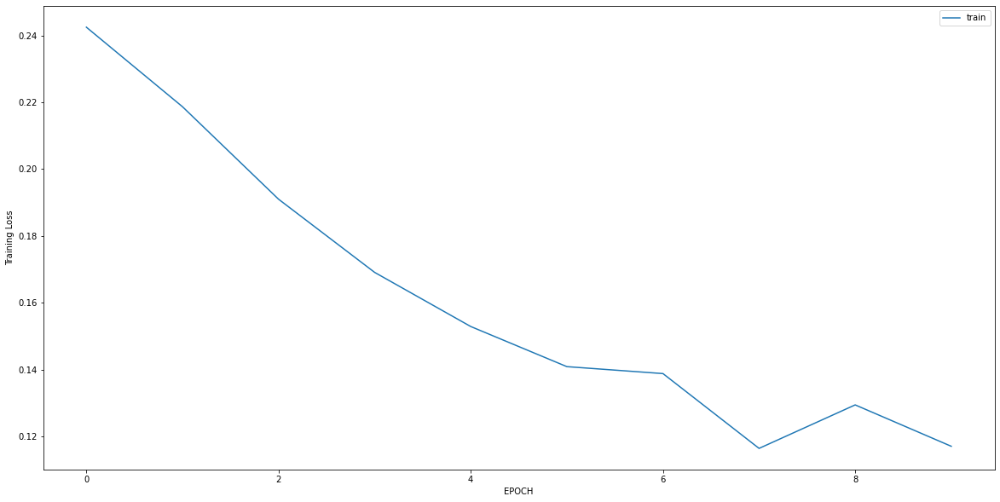

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0732 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0638 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0621 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0624 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0559 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 13ms/step - loss: 0.0560 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0467 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0439 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 7ms/step - loss: 0.0348 - accuracy: 1.0000


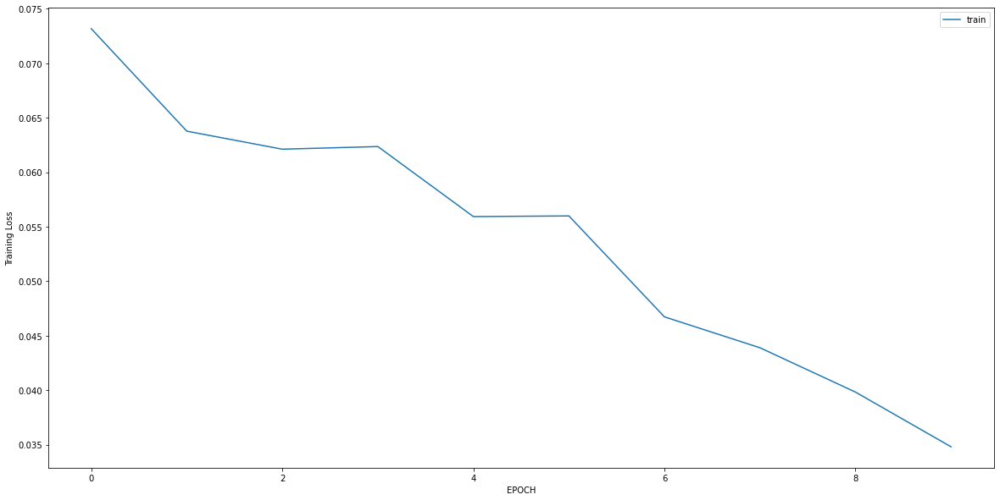

Epoch 1/10
8/8 [==============================] - 0s 7ms/step - loss: 1.5651 - accuracy: 0.0612
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5405 - accuracy: 0.8041
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2043 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1007 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0498 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0221 - accuracy: 1.0000


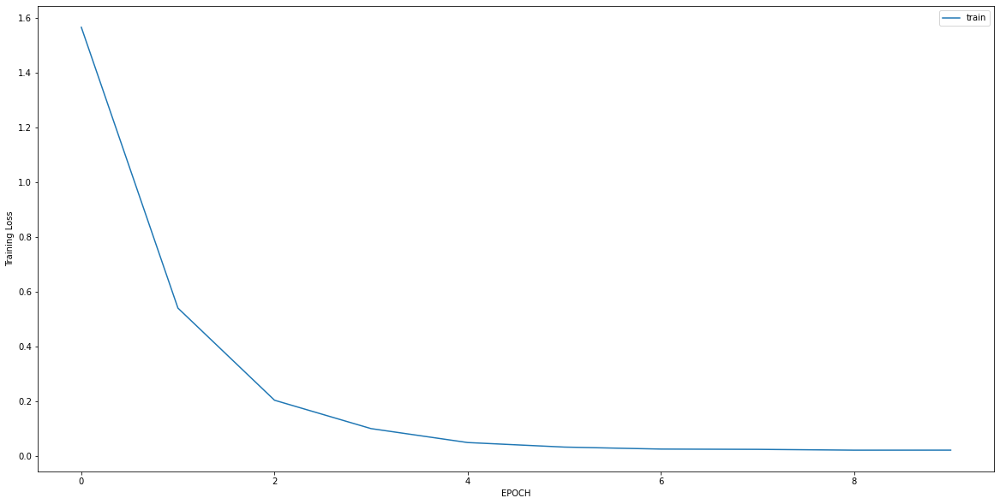

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.9775 - accuracy: 0.7154
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8557 - accuracy: 0.7194
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7744 - accuracy: 0.7549
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6259 - accuracy: 0.7747
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5034 - accuracy: 0.7866
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4516 - accuracy: 0.7984
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4359 - accuracy: 0.8142
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4184 - accuracy: 0.8142
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4005 - accuracy: 0.8340
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3797 - accuracy: 0.8419


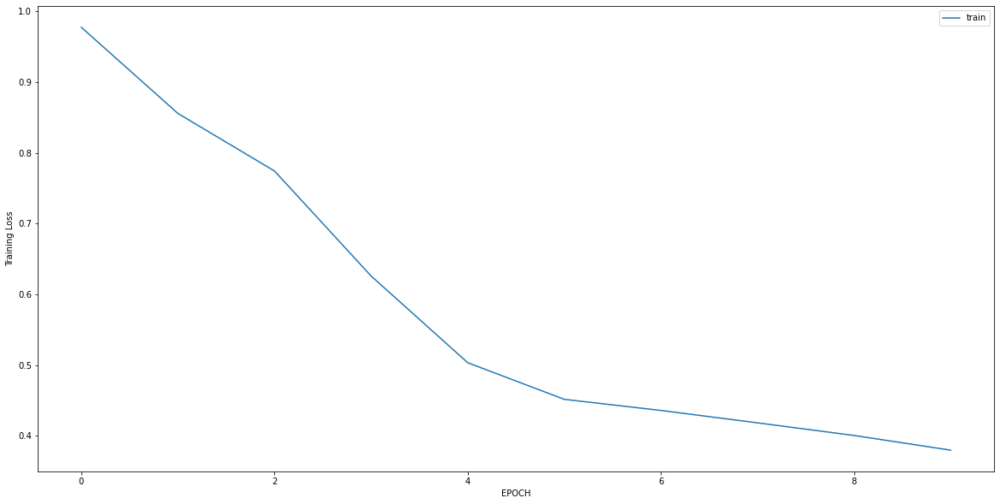

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.4323 - accuracy: 0.8081
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2654 - accuracy: 0.8713
Epoch 3/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1952 - accuracy: 0.9187
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1517 - accuracy: 0.9616
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1354 - accuracy: 0.9774
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1035 - accuracy: 0.9910
Epoch 7/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1234 - accuracy: 0.9684
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1630 - accuracy: 0.9549
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0985 - accuracy: 0.9865
Epoch 10/10
14/14 [==============================] - 0s 6ms/step - loss: 0.0849 - accuracy: 0.9842


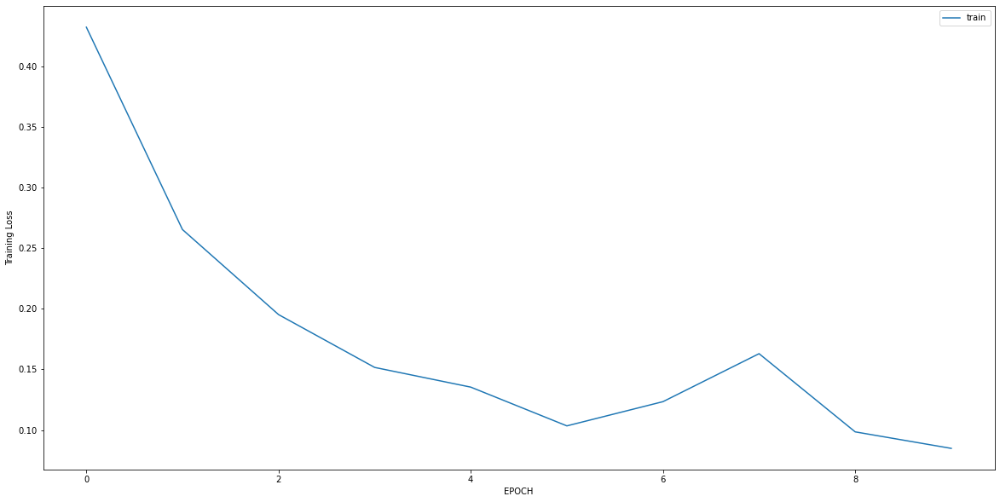

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.7989 - accuracy: 0.6520
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.4926 - accuracy: 0.6897
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3013 - accuracy: 0.8652
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2379 - accuracy: 0.9687
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1918 - accuracy: 0.9530
Epoch 6/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1683 - accuracy: 0.9530
Epoch 7/10
10/10 [==============================] - 0s 7ms/step - loss: 0.1486 - accuracy: 0.9561
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1197 - accuracy: 0.9687
Epoch 9/10
10/10 [==============================] - 0s 12ms/step - loss: 0.1186 - accuracy: 0.9781
Epoch 10/10
10/10 [==============================] - 0s 6ms/step - loss: 0.1007 - accuracy: 0.9875


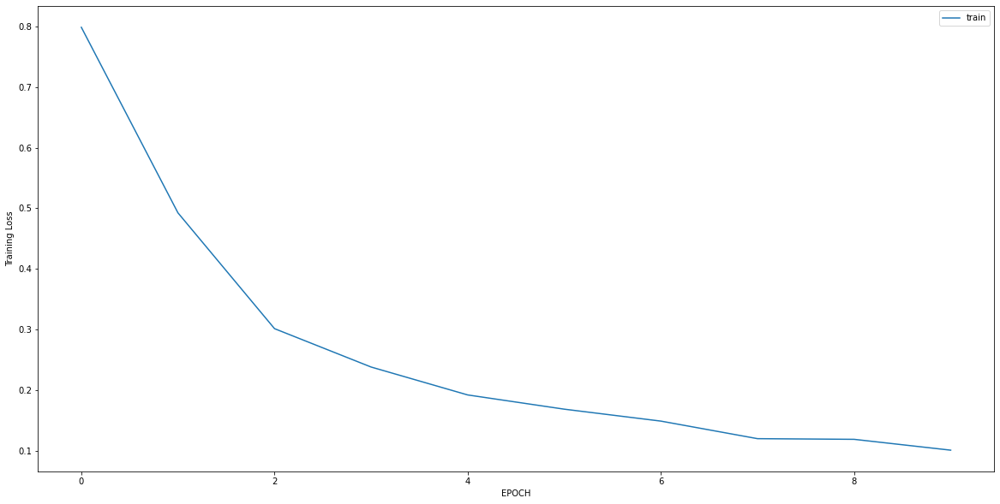

Epoch 1/10
9/9 [==============================] - 0s 8ms/step - loss: 4.0842 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 8ms/step - loss: 2.9109 - accuracy: 0.0036
Epoch 3/10
9/9 [==============================] - 0s 12ms/step - loss: 1.6976 - accuracy: 0.0393
Epoch 4/10
9/9 [==============================] - 0s 7ms/step - loss: 0.8029 - accuracy: 0.4821
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4123 - accuracy: 0.8821
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.2521 - accuracy: 0.9857
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1749 - accuracy: 0.9964
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1171 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0940 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0633 - accuracy: 1.0000


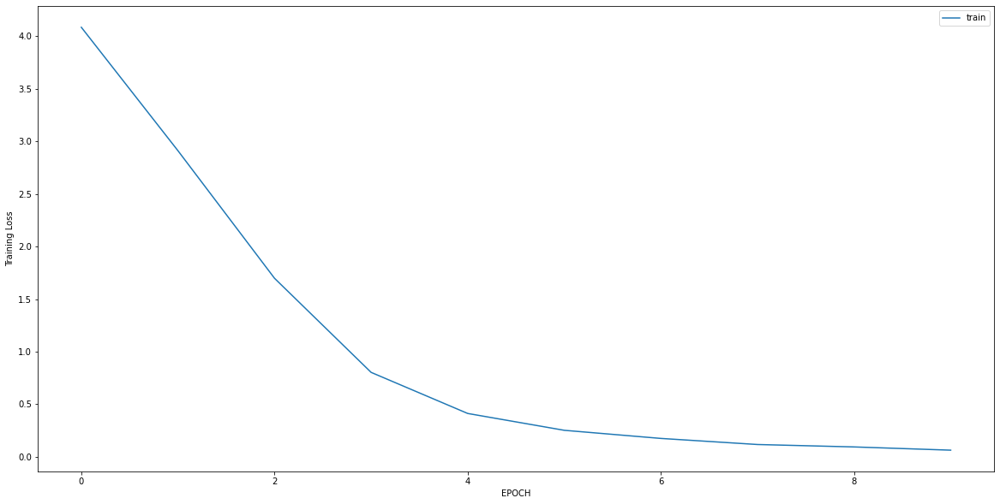

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1791 - accuracy: 0.6007
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1413 - accuracy: 0.6007
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9707 - accuracy: 0.6007
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8104 - accuracy: 0.6045
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7095 - accuracy: 0.6231
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.5895 - accuracy: 0.6455
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4931 - accuracy: 0.7201
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4600 - accuracy: 0.7425
Epoch 9/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3924 - accuracy: 0.8134
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3558 - accuracy: 0.8657


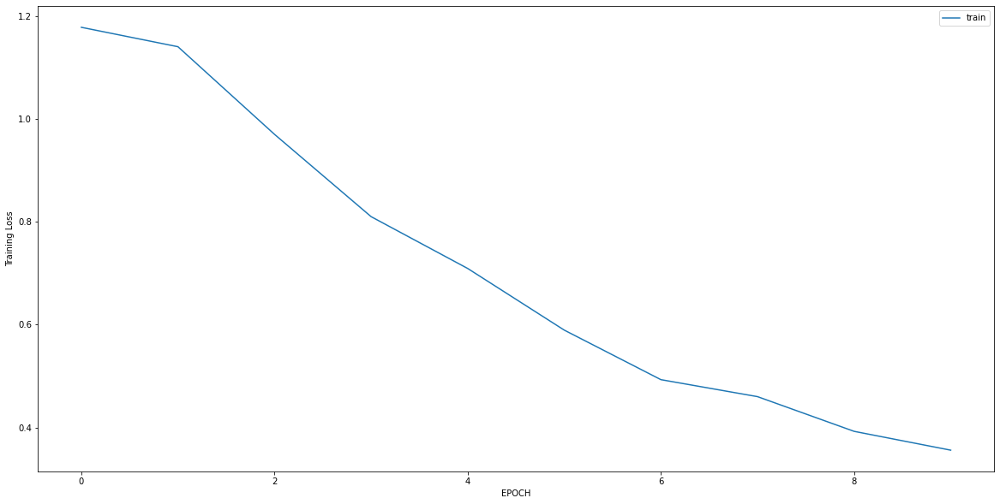

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0618 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0511 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0432 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 8ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0328 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 7ms/step - loss: 0.0292 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0193 - accuracy: 1.0000


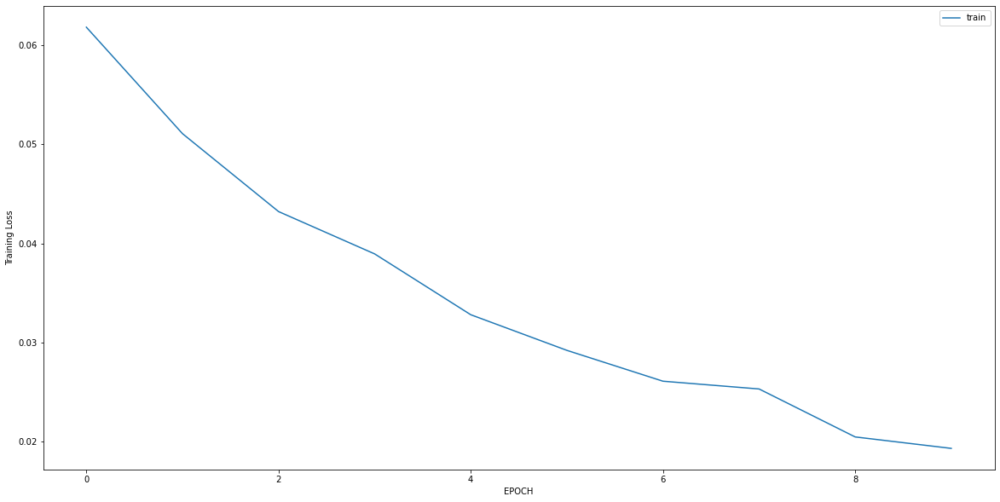

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9020 - accuracy: 0.6792
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7765 - accuracy: 0.6745
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5814 - accuracy: 0.7453
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4750 - accuracy: 0.8113
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4396 - accuracy: 0.8302
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4100 - accuracy: 0.8349
Epoch 7/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4066 - accuracy: 0.8160
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3767 - accuracy: 0.8774
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3572 - accuracy: 0.8396
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3358 - accuracy: 0.8632


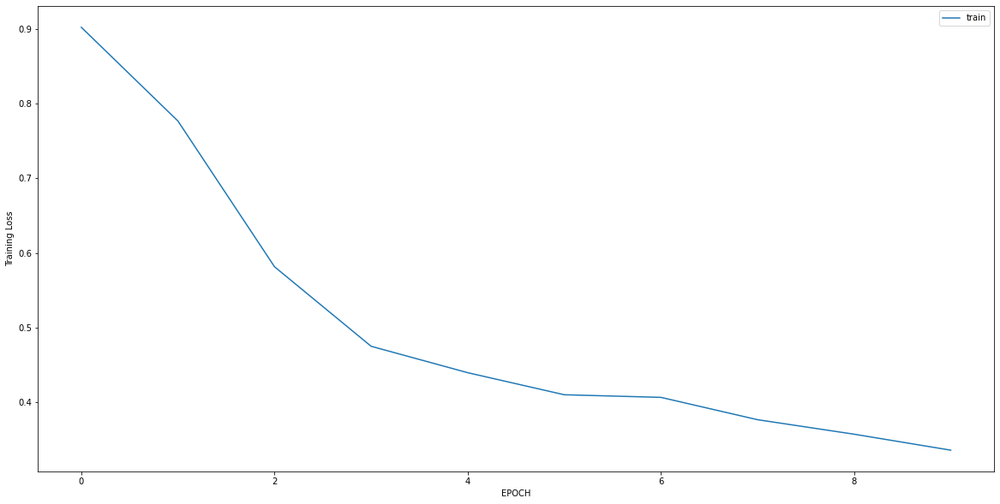

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4748 - accuracy: 0.8746
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2524 - accuracy: 0.9373
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1833 - accuracy: 0.9408
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1826 - accuracy: 0.9547
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1248 - accuracy: 0.9686
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1997 - accuracy: 0.9338
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1799 - accuracy: 0.9512
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3033 - accuracy: 0.9024
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2645 - accuracy: 0.8955
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2070 - accuracy: 0.9477


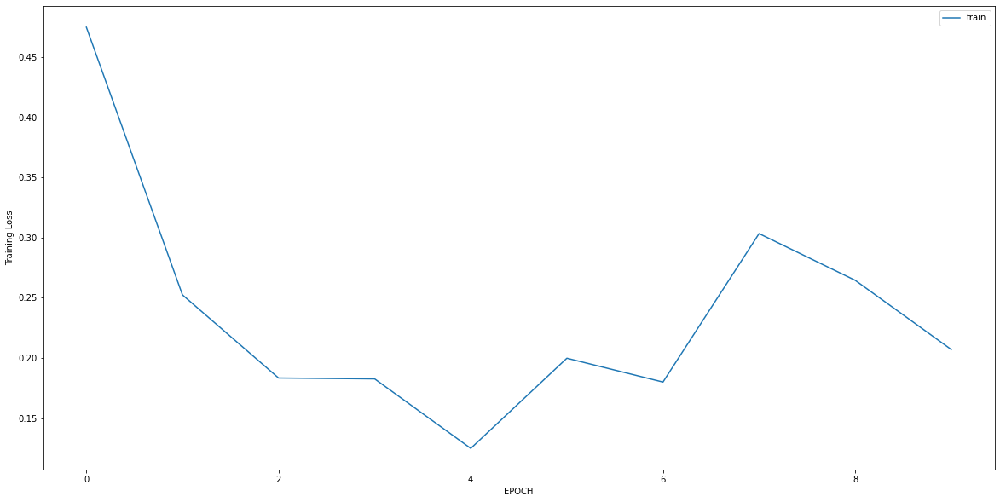

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3630 - accuracy: 0.8679
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2475 - accuracy: 0.9057
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1511 - accuracy: 0.9434
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1044 - accuracy: 0.9686
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0918 - accuracy: 0.9717
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0818 - accuracy: 0.9843
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0807 - accuracy: 0.9874
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0786 - accuracy: 0.9874
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0602 - accuracy: 0.9969
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0676 - accuracy: 0.9843


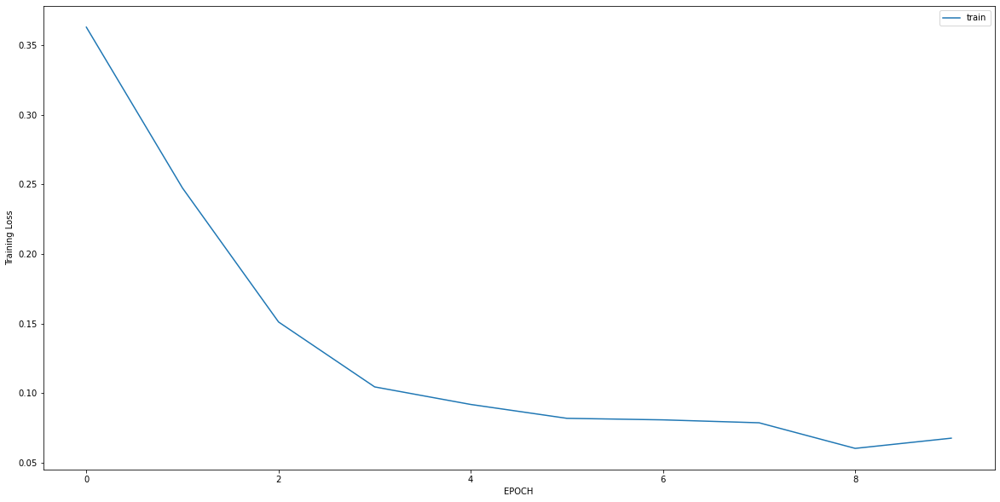

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.2566 - accuracy: 0.6468
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 1.1531 - accuracy: 0.6468
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9296 - accuracy: 0.6468
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8207 - accuracy: 0.6468
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7150 - accuracy: 0.6468
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6212 - accuracy: 0.6606
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6177 - accuracy: 0.6651
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5565 - accuracy: 0.6789
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5692 - accuracy: 0.6422
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5356 - accuracy: 0.6422


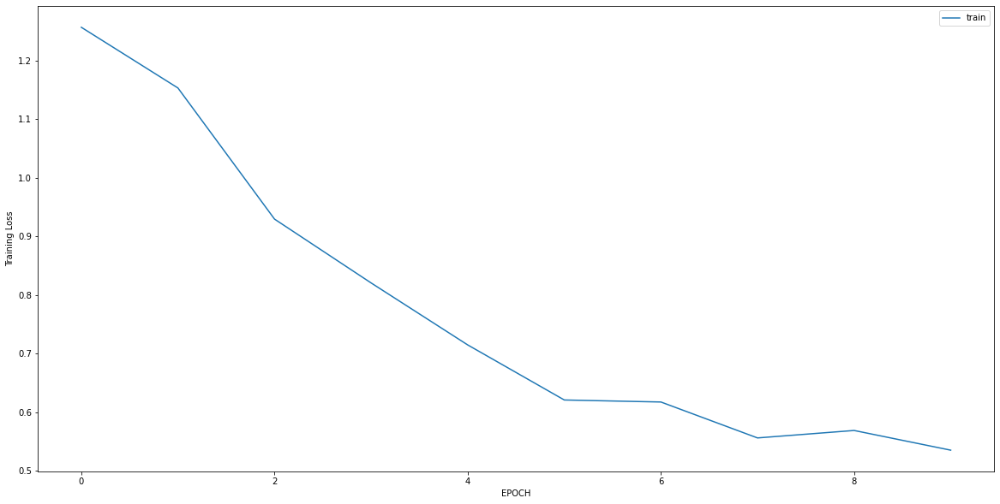

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 2.0259 - accuracy: 0.0167
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.4525 - accuracy: 0.0502
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.9496 - accuracy: 0.2510
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6063 - accuracy: 0.7113
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3923 - accuracy: 0.9372
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3063 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2436 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2079 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1845 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1630 - accuracy: 1.0000


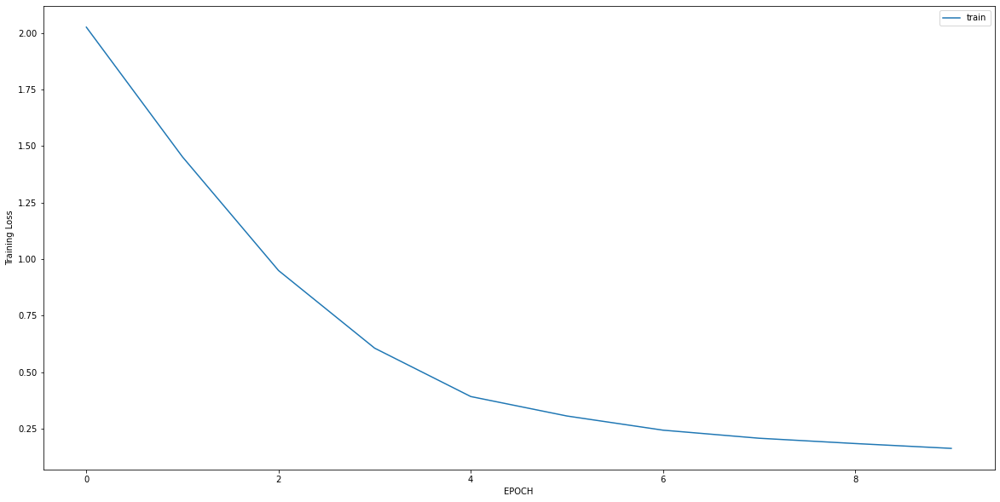

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.5749 - accuracy: 0.2459
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 1.2359 - accuracy: 0.2459
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.8772 - accuracy: 0.3016
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.6122 - accuracy: 0.5708
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4538 - accuracy: 0.8051
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3074 - accuracy: 0.9304
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2268 - accuracy: 0.9582
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2205 - accuracy: 0.9606
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2195 - accuracy: 0.9629
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1682 - accuracy: 0.9652


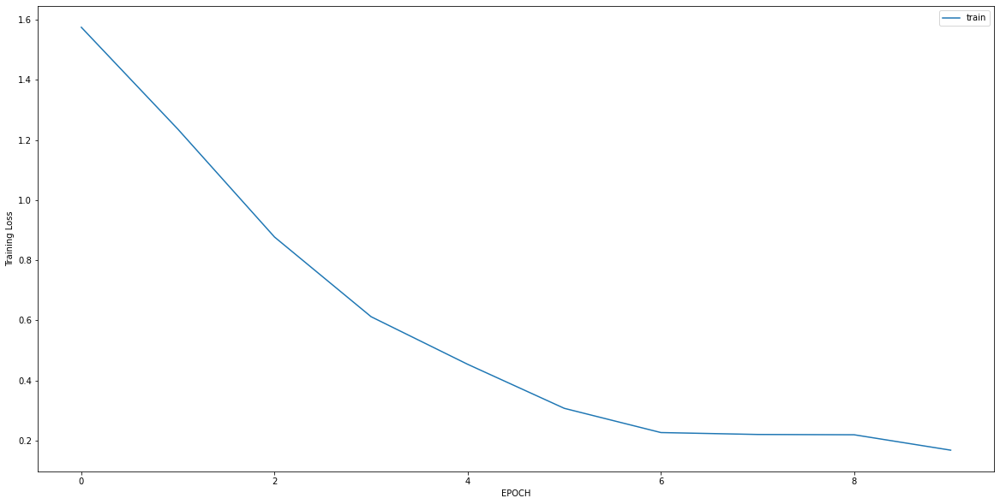

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.3900 - accuracy: 0.1450
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3073 - accuracy: 0.9426
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0991 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0597 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0300 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0274 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0280 - accuracy: 1.0000


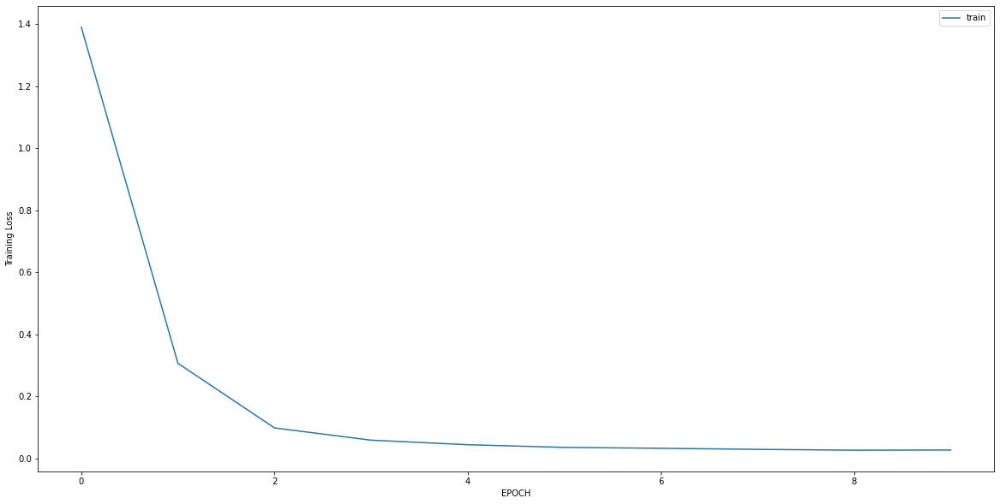

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7152 - accuracy: 0.7736
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6349 - accuracy: 0.7962
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4729 - accuracy: 0.8264
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4178 - accuracy: 0.8453
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3791 - accuracy: 0.8642
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3551 - accuracy: 0.8679
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3655 - accuracy: 0.8792
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3322 - accuracy: 0.8906
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3388 - accuracy: 0.8792
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3061 - accuracy: 0.8906


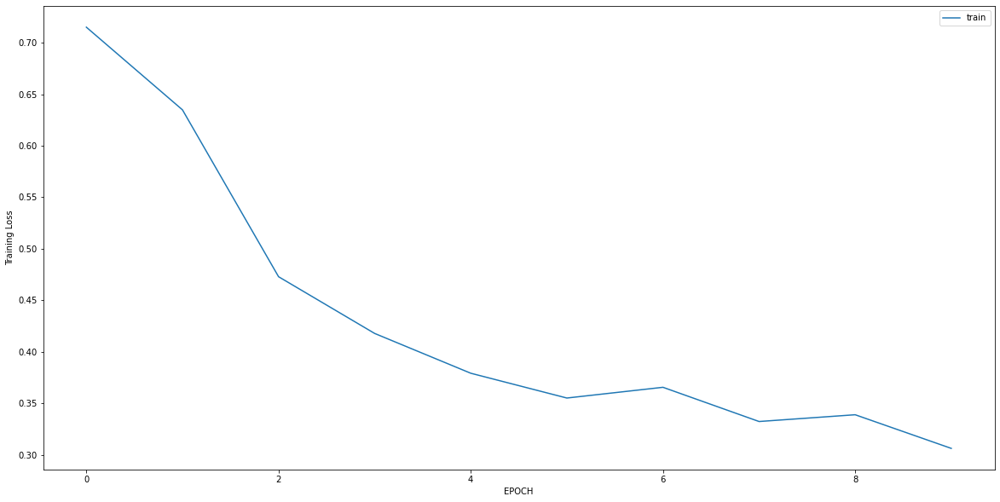

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 2.4449 - accuracy: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 6ms/step - loss: 1.6469 - accuracy: 0.0204
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9889 - accuracy: 0.2619
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5739 - accuracy: 0.7177
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3610 - accuracy: 0.9898
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2580 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1990 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1893 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1621 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1495 - accuracy: 1.0000


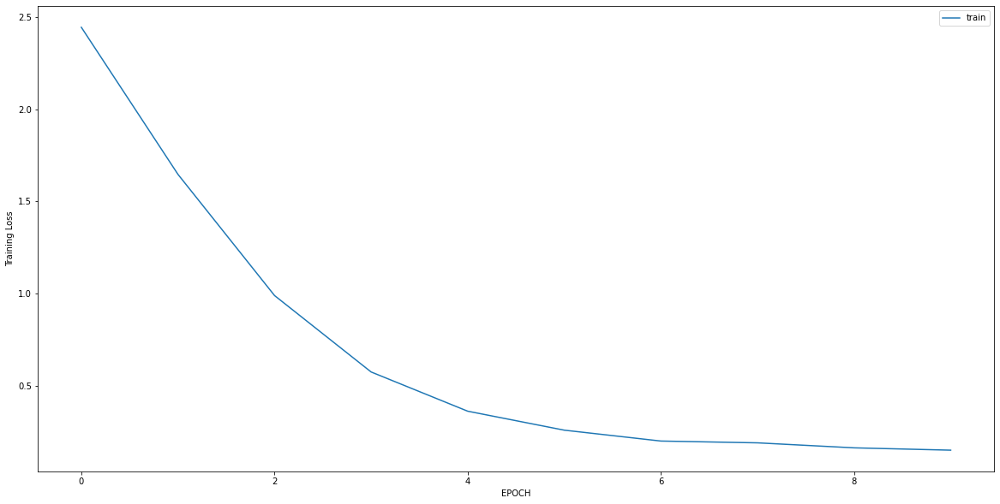

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8518 - accuracy: 0.5823
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7571 - accuracy: 0.6160
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.6203
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5647 - accuracy: 0.6624
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4344 - accuracy: 0.7468
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3961 - accuracy: 0.7637
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3515 - accuracy: 0.7806
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2714 - accuracy: 0.8523
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2491 - accuracy: 0.8861
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1894 - accuracy: 0.9072


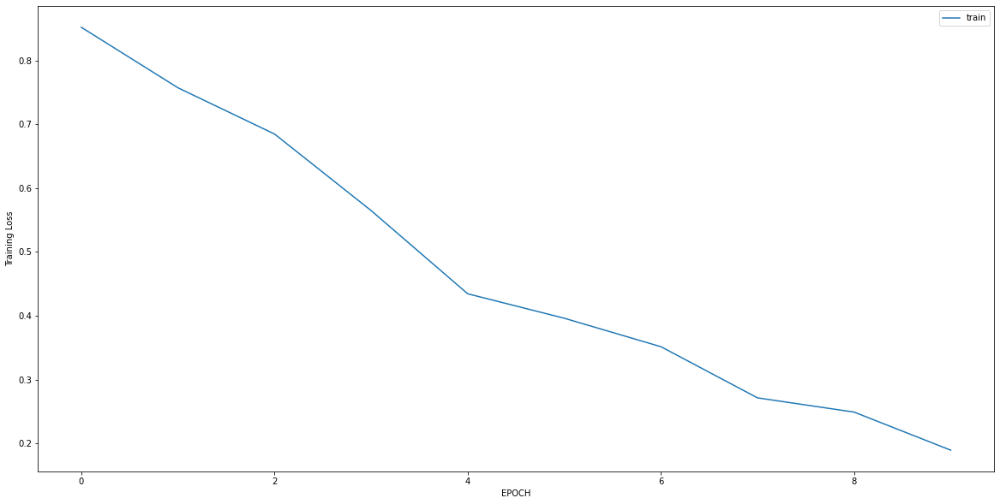

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.6674 - accuracy: 0.6528
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7195 - accuracy: 0.6181
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6710 - accuracy: 0.6181
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.6528
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7538 - accuracy: 0.6111
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7107 - accuracy: 0.6181
Epoch 7/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6272 - accuracy: 0.6597
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6765 - accuracy: 0.6250
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6350 - accuracy: 0.6528
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7114 - accuracy: 0.6389


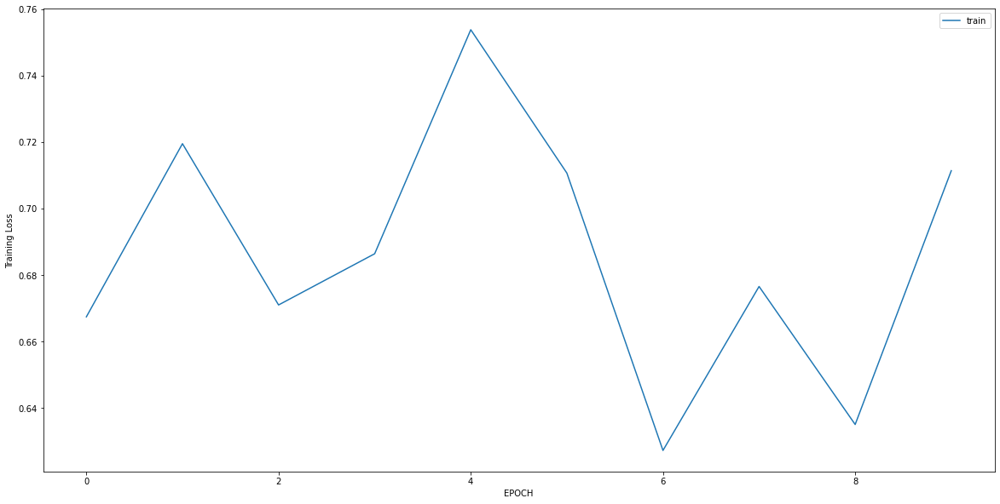

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6255 - accuracy: 0.6458
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6336 - accuracy: 0.6528
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5569 - accuracy: 0.7361
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6027 - accuracy: 0.6597
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5814 - accuracy: 0.6736
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5782 - accuracy: 0.7083
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5901 - accuracy: 0.6736
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5490 - accuracy: 0.7222
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5424 - accuracy: 0.7083
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5349 - accuracy: 0.6875


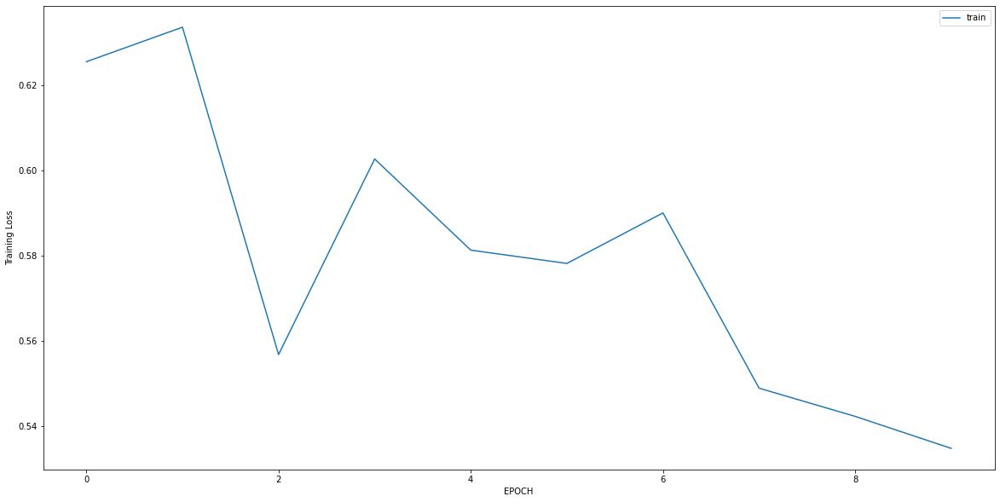

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3873 - accuracy: 0.8704
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2357 - accuracy: 0.9069
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1950 - accuracy: 0.9474
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1081 - accuracy: 0.9798
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0901 - accuracy: 0.9919
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1823 - accuracy: 0.9474
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2558 - accuracy: 0.9109
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1758 - accuracy: 0.9555
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1518 - accuracy: 0.9352
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1326 - accuracy: 0.9555


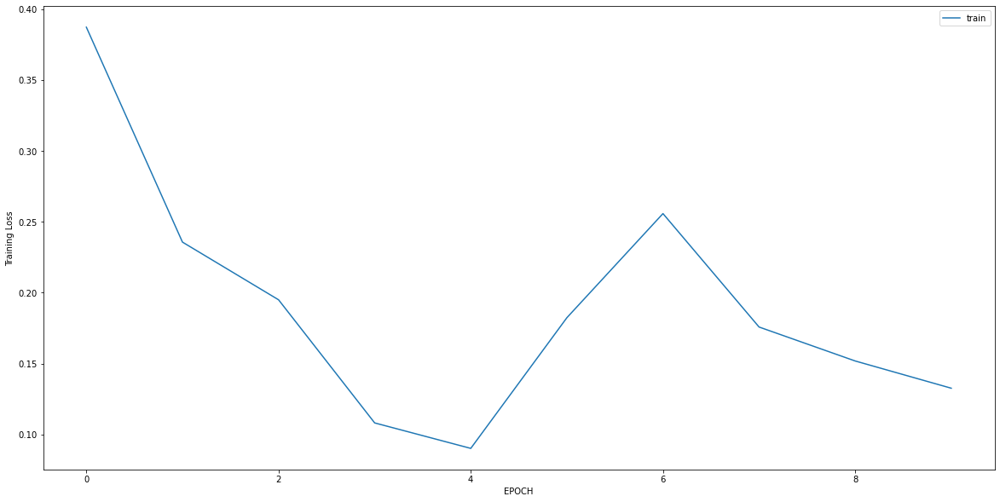

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4584 - accuracy: 0.7345
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3308 - accuracy: 0.9069
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2881 - accuracy: 0.9414
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1899 - accuracy: 0.9655
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.3220 - accuracy: 0.8517
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2592 - accuracy: 0.9103
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3312 - accuracy: 0.8621
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2668 - accuracy: 0.8828
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1752 - accuracy: 0.9207
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1374 - accuracy: 0.9310


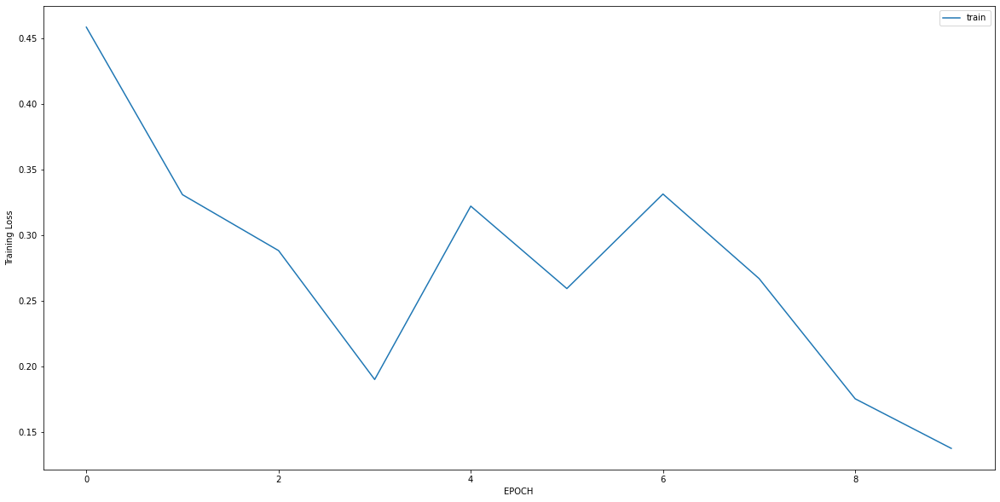

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.3024 - accuracy: 0.6804
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9926 - accuracy: 0.6867
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7168 - accuracy: 0.6835
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4994 - accuracy: 0.7310
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3819 - accuracy: 0.8165
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3546 - accuracy: 0.8639
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2969 - accuracy: 0.8829
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2798 - accuracy: 0.9241
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2438 - accuracy: 0.9399
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2321 - accuracy: 0.9399


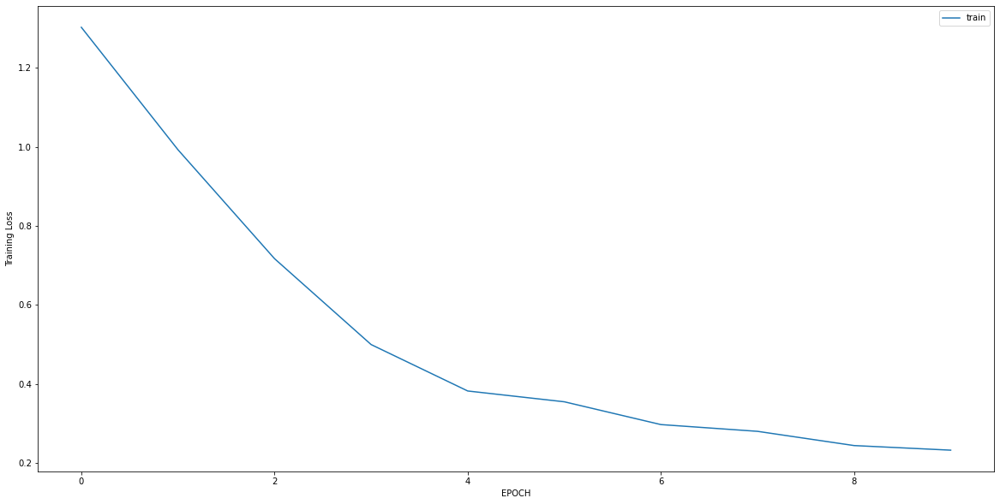

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2660 - accuracy: 0.5552
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8373 - accuracy: 0.5730
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6133 - accuracy: 0.6406
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5088 - accuracy: 0.7722
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4883 - accuracy: 0.8221
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4545 - accuracy: 0.8363
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4346 - accuracy: 0.8399
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3740 - accuracy: 0.9288
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3902 - accuracy: 0.8754
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3449 - accuracy: 0.9075


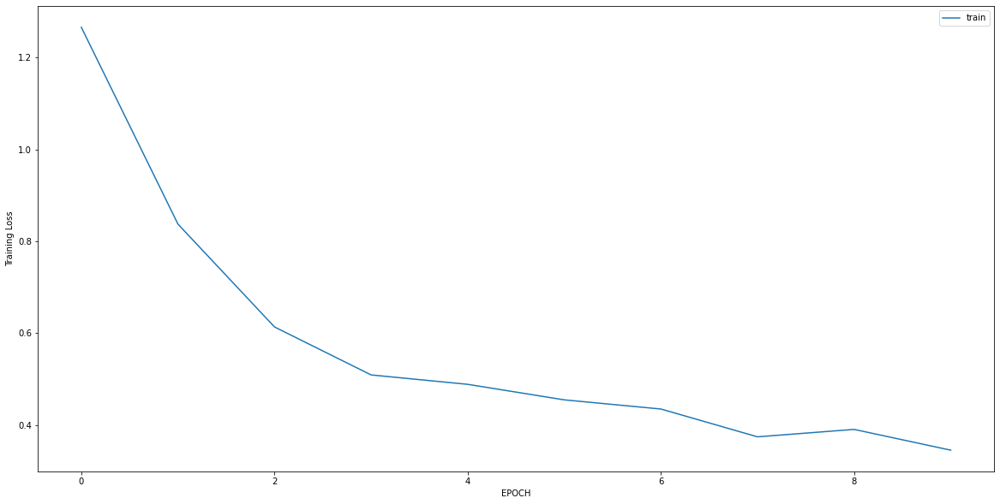

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3752 - accuracy: 0.8617
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3516 - accuracy: 0.8854
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3054 - accuracy: 0.9012
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3102 - accuracy: 0.9012
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2790 - accuracy: 0.9051
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2595 - accuracy: 0.9170
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2766 - accuracy: 0.9091
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2895 - accuracy: 0.9051
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2558 - accuracy: 0.9130
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2450 - accuracy: 0.9091


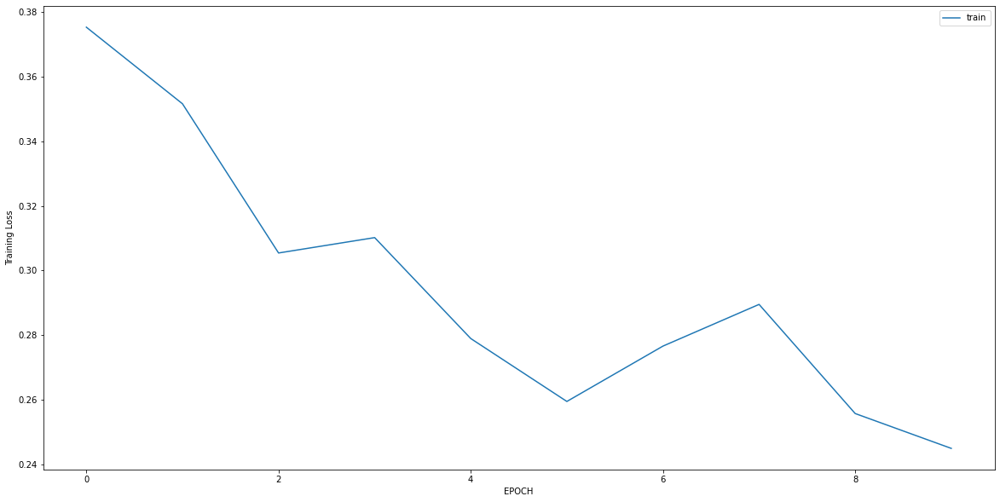

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3380 - accuracy: 0.8951
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2977 - accuracy: 0.8881
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2975 - accuracy: 0.8916
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2890 - accuracy: 0.9021
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3003 - accuracy: 0.9021
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2386 - accuracy: 0.9056
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2296 - accuracy: 0.9056
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2254 - accuracy: 0.9126
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2487 - accuracy: 0.9021
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2513 - accuracy: 0.9196


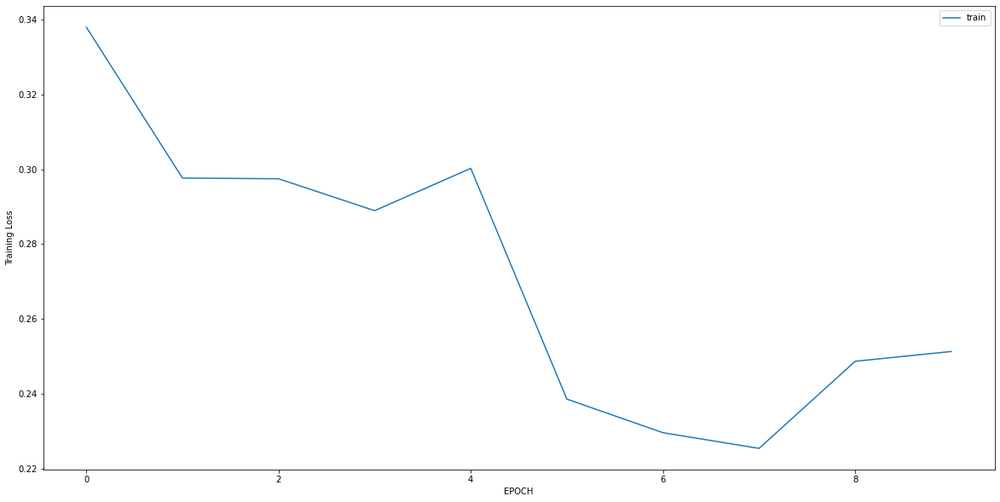

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2346 - accuracy: 0.8975
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1776 - accuracy: 0.9139
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1863 - accuracy: 0.9098
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1836 - accuracy: 0.9426
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1686 - accuracy: 0.9631
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1802 - accuracy: 0.9467
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1574 - accuracy: 0.9631
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1686 - accuracy: 0.9672
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1481 - accuracy: 0.9549
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1612 - accuracy: 0.9467


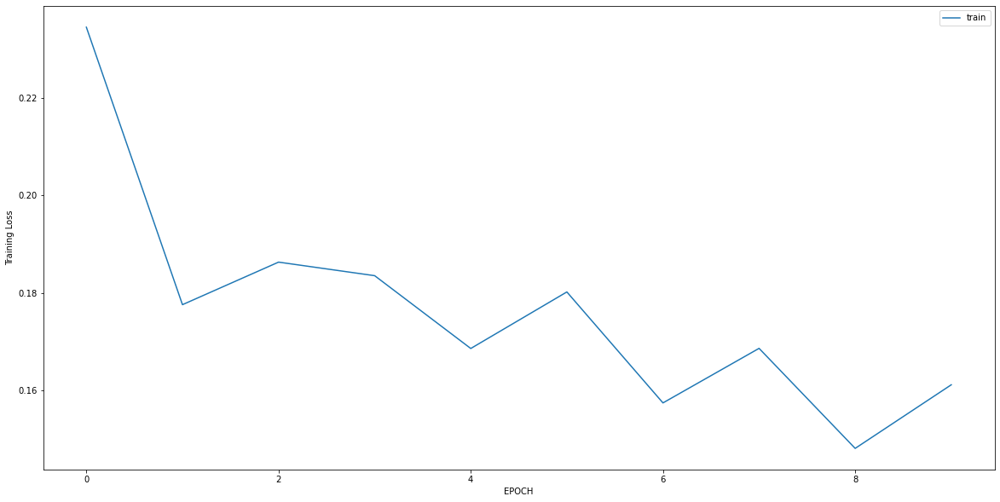

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.5193 - accuracy: 0.4788
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3057 - accuracy: 0.8729
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2444 - accuracy: 0.9153
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2165 - accuracy: 0.9364
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2267 - accuracy: 0.9449
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2005 - accuracy: 0.9492
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2202 - accuracy: 0.9407
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1971 - accuracy: 0.9534
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1965 - accuracy: 0.9492
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2023 - accuracy: 0.9407


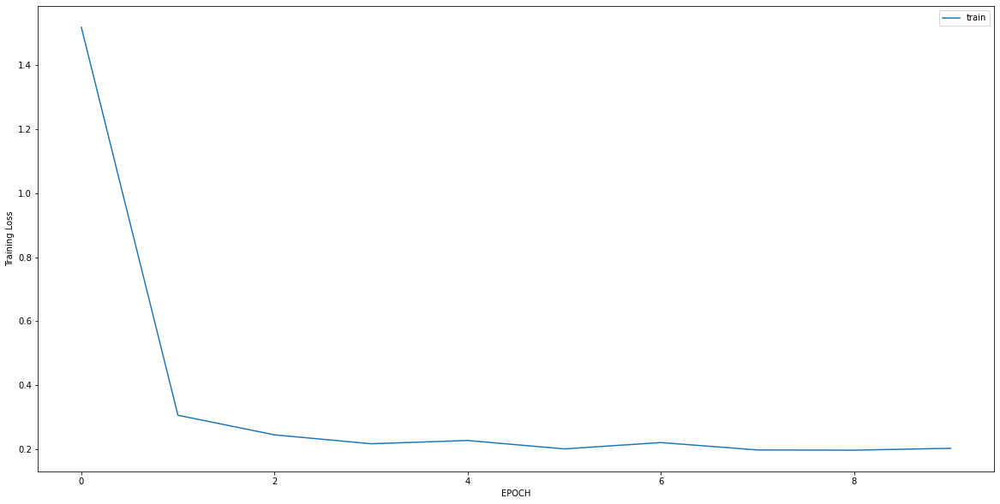

Epoch 1/10
18/18 [==============================] - 0s 5ms/step - loss: 1.5084 - accuracy: 0.3954
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1047 - accuracy: 0.9895
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0297 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0279 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0188 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0178 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0147 - accuracy: 1.0000


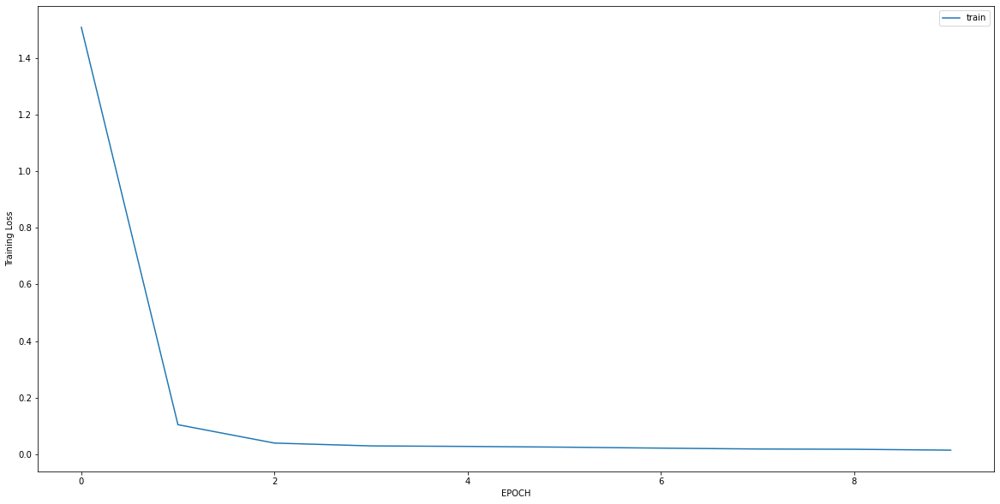

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 1.6421 - accuracy: 0.1633
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 1.4248 - accuracy: 0.1837
Epoch 3/10
4/4 [==============================] - 0s 5ms/step - loss: 1.0823 - accuracy: 0.2449
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 0.9505 - accuracy: 0.2755
Epoch 5/10
4/4 [==============================] - 0s 6ms/step - loss: 0.7476 - accuracy: 0.5102
Epoch 6/10
4/4 [==============================] - 0s 6ms/step - loss: 0.6215 - accuracy: 0.6429
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4928 - accuracy: 0.7857
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 0.5071 - accuracy: 0.7755
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4627 - accuracy: 0.8265
Epoch 10/10
4/4 [==============================] - 0s 4ms/step - loss: 0.4809 - accuracy: 0.8265


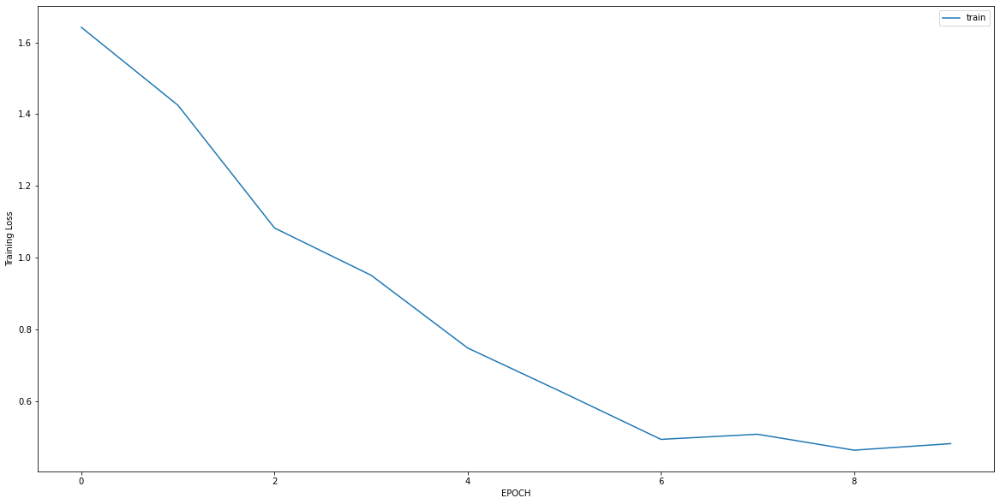

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.2690 - accuracy: 0.3961
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9741 - accuracy: 0.4078
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7674 - accuracy: 0.5098
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6641 - accuracy: 0.6157
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6281 - accuracy: 0.6627
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5833 - accuracy: 0.6980
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5480 - accuracy: 0.7137
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4884 - accuracy: 0.8157
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4914 - accuracy: 0.7843
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4526 - accuracy: 0.8157


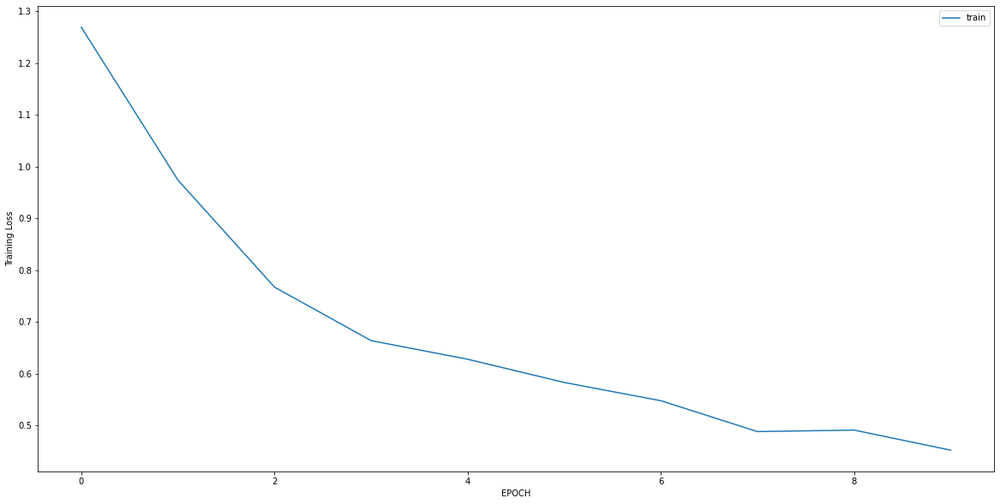

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2157 - accuracy: 0.9507
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1759 - accuracy: 0.9803
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0963 - accuracy: 0.9967
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0684 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0278 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0224 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 1.0000


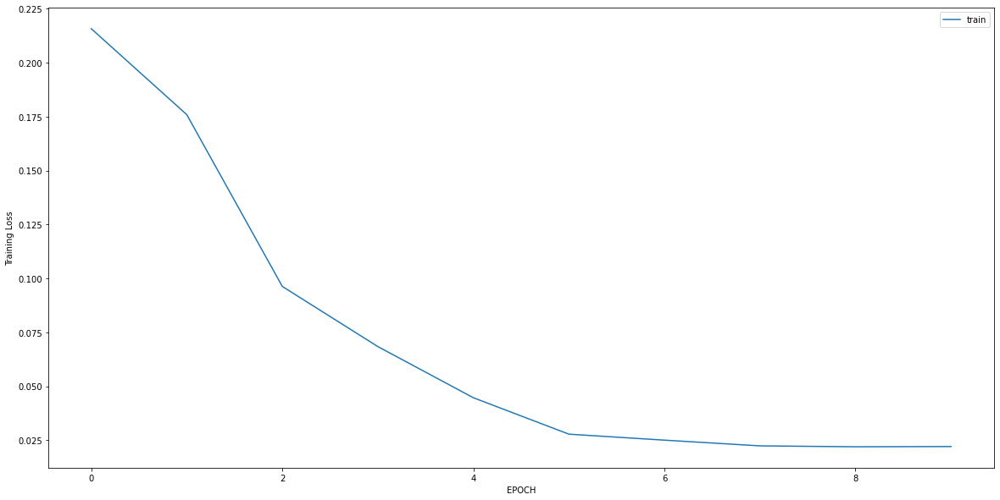

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2854 - accuracy: 0.9944
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2279 - accuracy: 1.0000
Epoch 3/10
6/6 [==============================] - 0s 7ms/step - loss: 0.1955 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1550 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1294 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0950 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0895 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0818 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0652 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0651 - accuracy: 1.0000


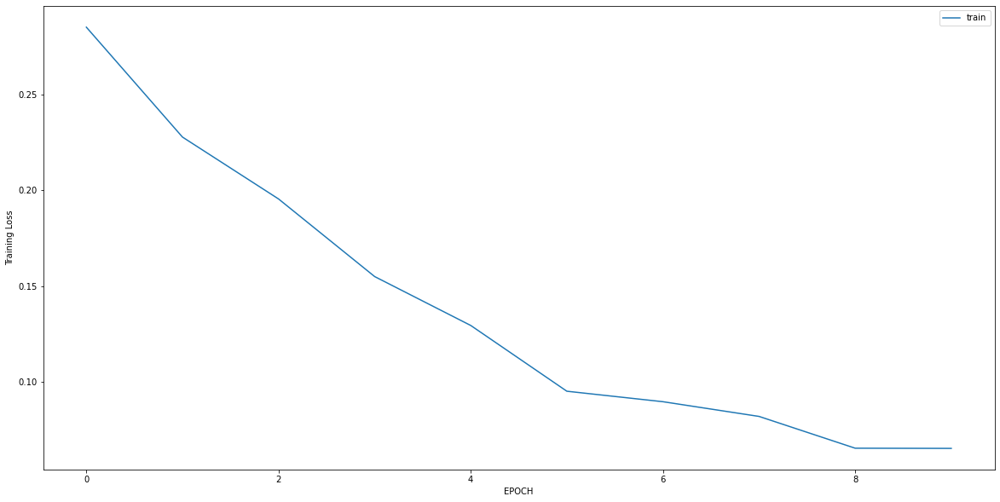

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 2.0862 - accuracy: 0.3309
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 1.9130 - accuracy: 0.3309
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 1.7185 - accuracy: 0.3309
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.4707 - accuracy: 0.3309
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0930 - accuracy: 0.3597
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7368 - accuracy: 0.4748
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5777 - accuracy: 0.6403
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3562 - accuracy: 0.8273
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2803 - accuracy: 0.8777
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2164 - accuracy: 0.8993


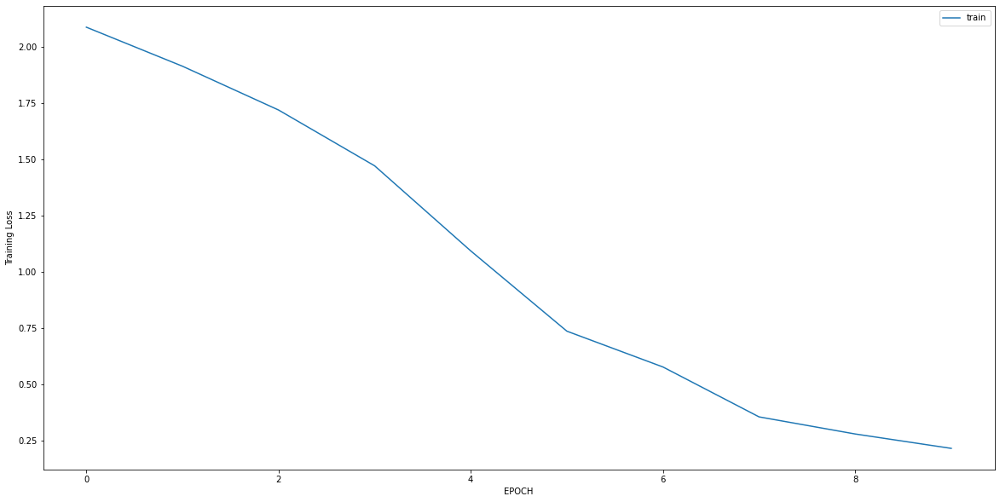

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4207 - accuracy: 0.8818
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2268 - accuracy: 0.9251
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1003 - accuracy: 0.9712
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0743 - accuracy: 0.9856
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0532 - accuracy: 0.9942
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0652 - accuracy: 0.9827
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0561 - accuracy: 0.9914
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0527 - accuracy: 0.9885
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0472 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0522 - accuracy: 0.9914


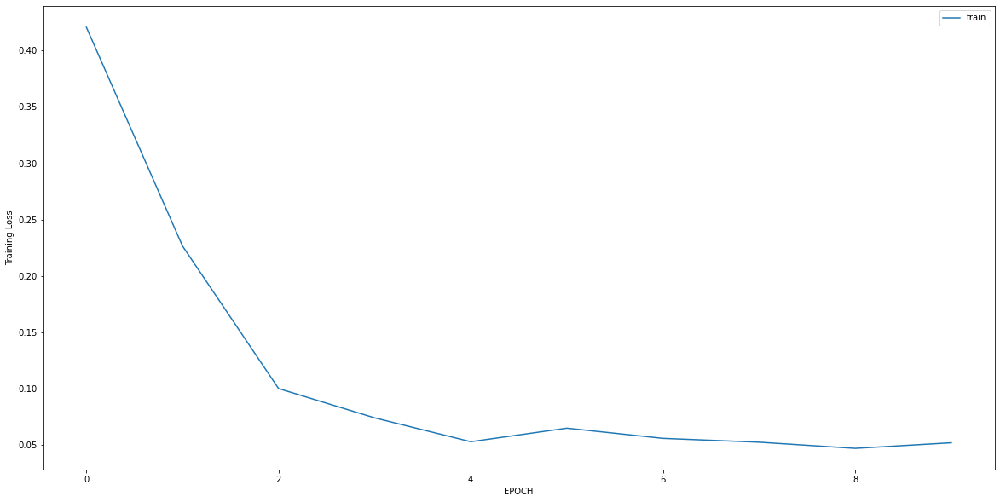

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0210 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0316 - accuracy: 0.9958
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0203 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0174 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0151 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0154 - accuracy: 1.0000


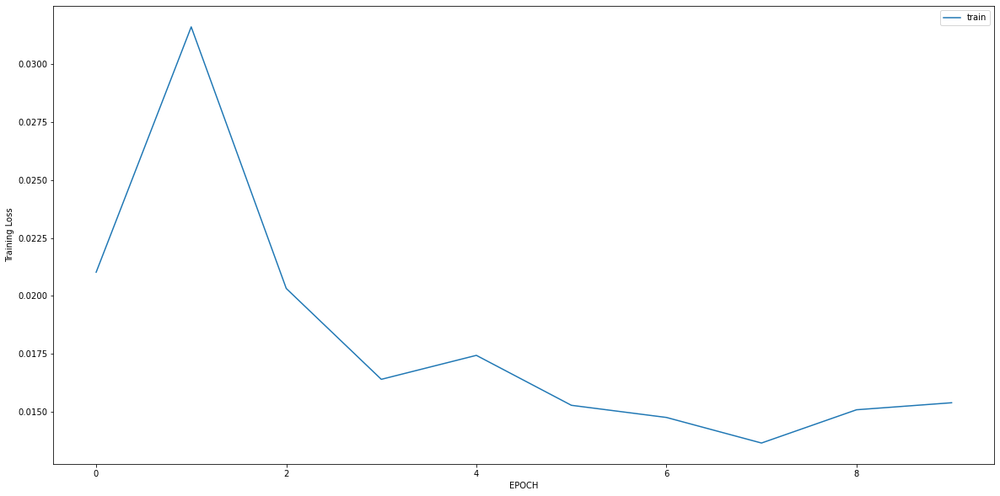

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0132 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0117 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0121 - accuracy: 1.0000


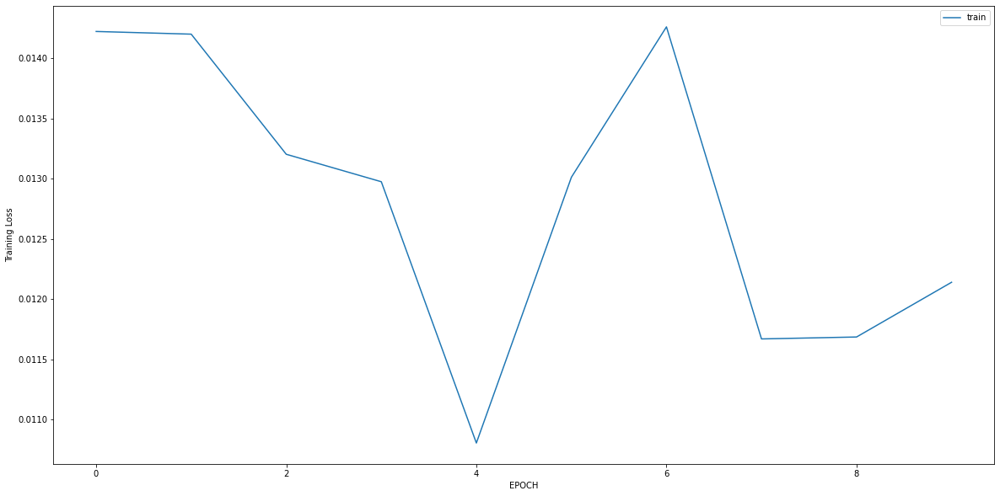

Epoch 1/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 1.0000
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0135 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0145 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0137 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 8ms/step - loss: 0.0119 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0112 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0123 - accuracy: 1.0000


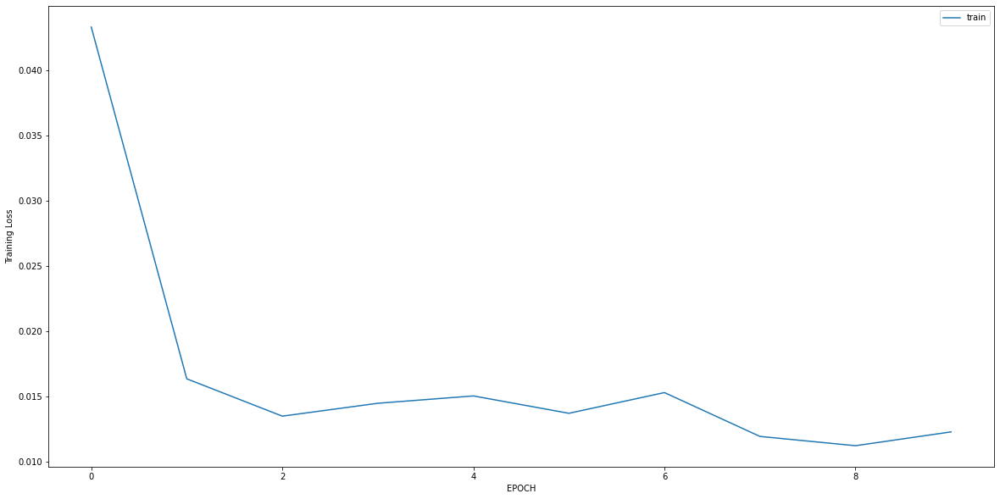

Epoch 1/10
12/12 [==============================] - 0s 6ms/step - loss: 0.4865 - accuracy: 0.8845
Epoch 2/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0125 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0118 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0103 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0093 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0108 - accuracy: 1.0000


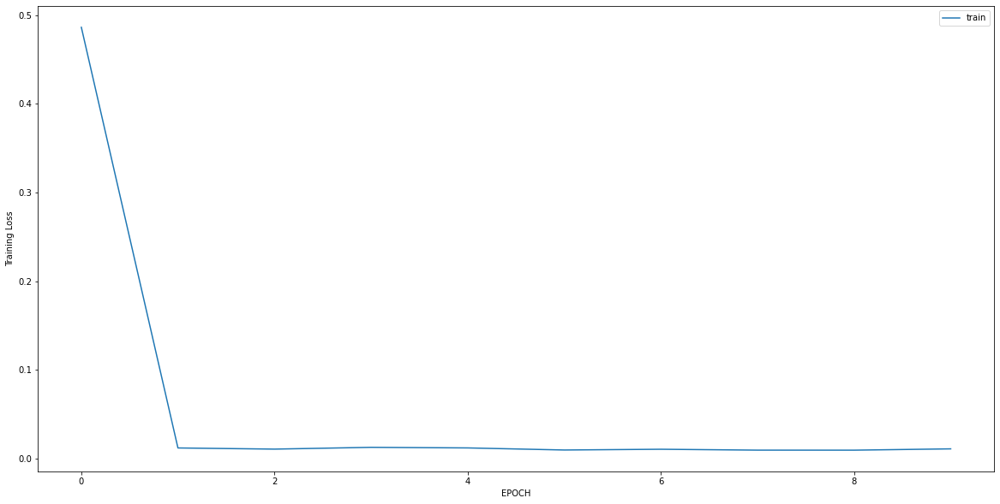

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 2.8458 - accuracy: 0.3194
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 2.4808 - accuracy: 0.3264
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 2.0542 - accuracy: 0.3264
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.6022 - accuracy: 0.4097
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0550 - accuracy: 0.5625
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.9716 - accuracy: 0.5833
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7560 - accuracy: 0.5833
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4920 - accuracy: 0.7778
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4166 - accuracy: 0.8403
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3804 - accuracy: 0.7917


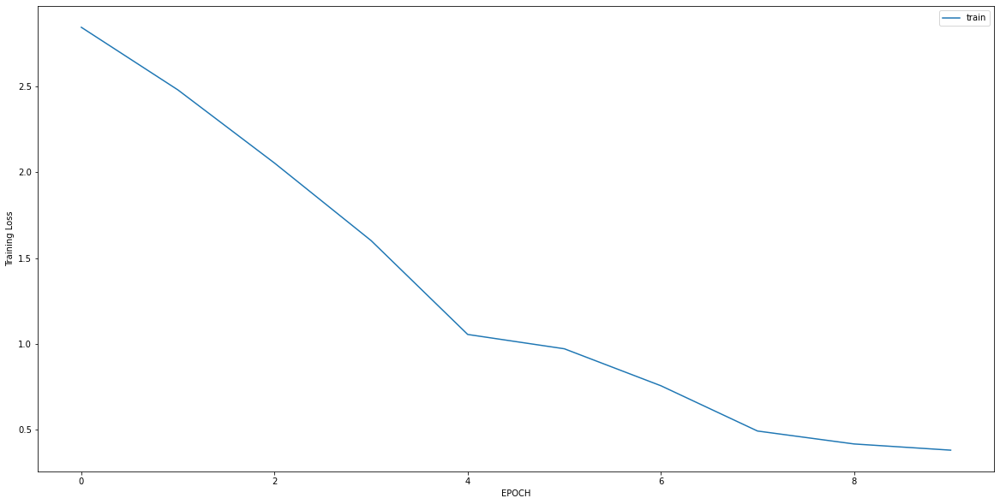

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.1782 - accuracy: 0.5494
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5227 - accuracy: 0.7233
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4492 - accuracy: 0.8024
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3694 - accuracy: 0.8577
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3303 - accuracy: 0.8577
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3711 - accuracy: 0.8221
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3383 - accuracy: 0.8775
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3240 - accuracy: 0.8735
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3361 - accuracy: 0.8458
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2905 - accuracy: 0.9012


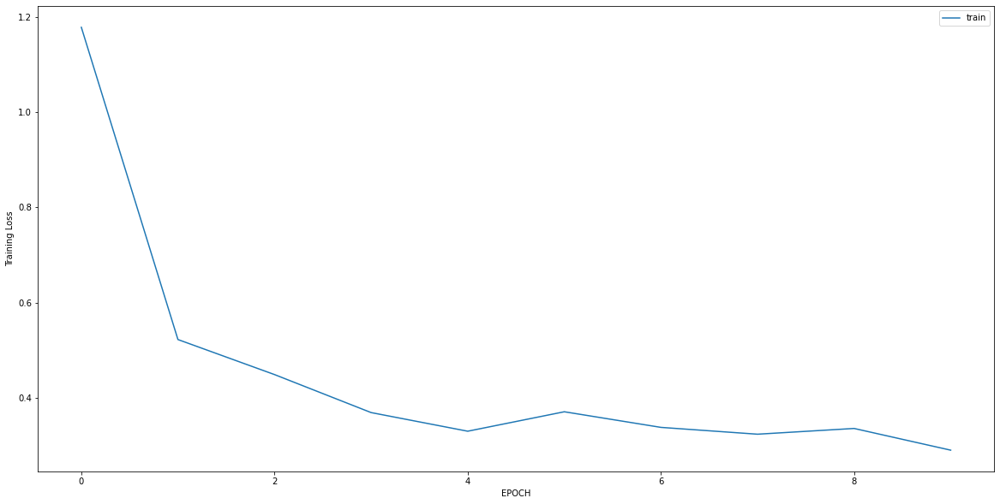

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5333 - accuracy: 0.7619
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4369 - accuracy: 0.8016
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4348 - accuracy: 0.7937
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3993 - accuracy: 0.8214
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4091 - accuracy: 0.8095
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3830 - accuracy: 0.8333
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3911 - accuracy: 0.8611
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3633 - accuracy: 0.8611
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3463 - accuracy: 0.8730
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3702 - accuracy: 0.8611


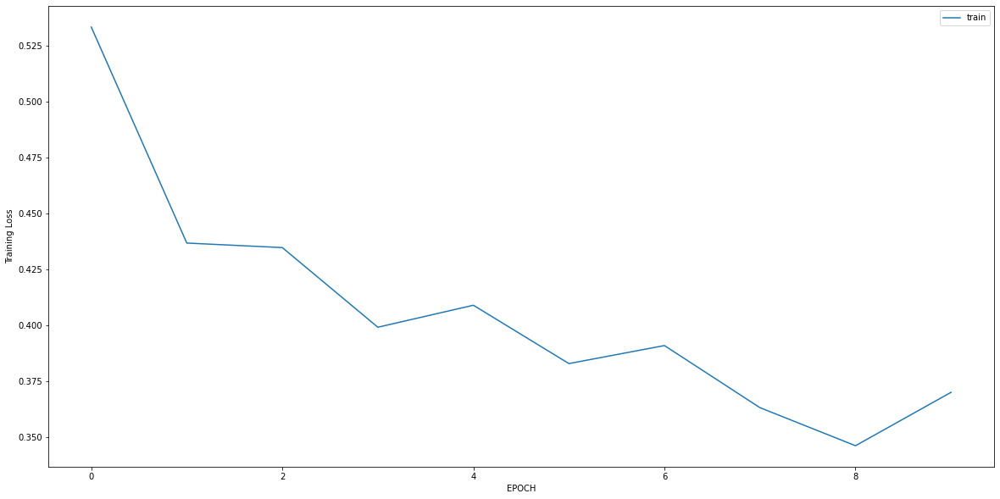

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4066 - accuracy: 0.8196
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4312 - accuracy: 0.8392
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4044 - accuracy: 0.8706
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3557 - accuracy: 0.8588
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3240 - accuracy: 0.8667
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3258 - accuracy: 0.8824
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2824 - accuracy: 0.8824
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2658 - accuracy: 0.8902
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2523 - accuracy: 0.8902
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2369 - accuracy: 0.9059


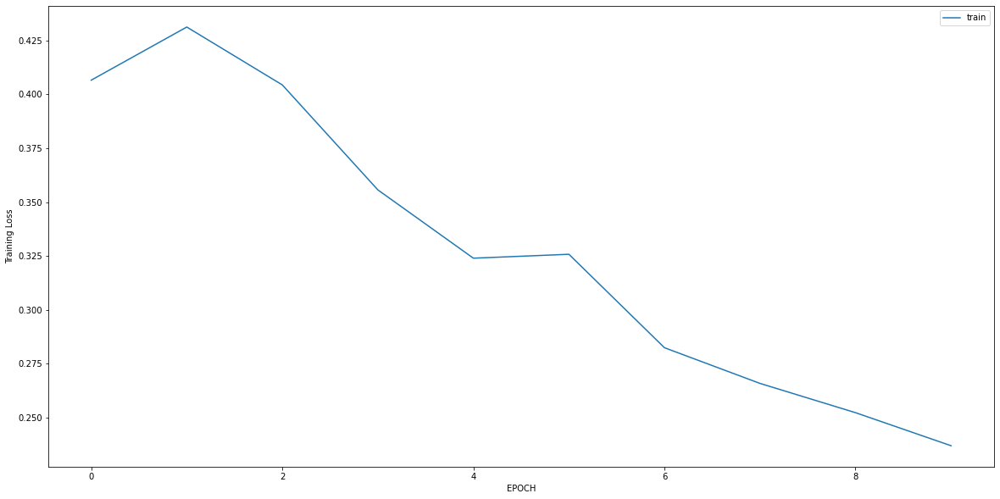

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 2.6284 - accuracy: 0.0653
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4075 - accuracy: 0.8041
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1000 - accuracy: 0.9959
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0754 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0508 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0443 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0293 - accuracy: 1.0000


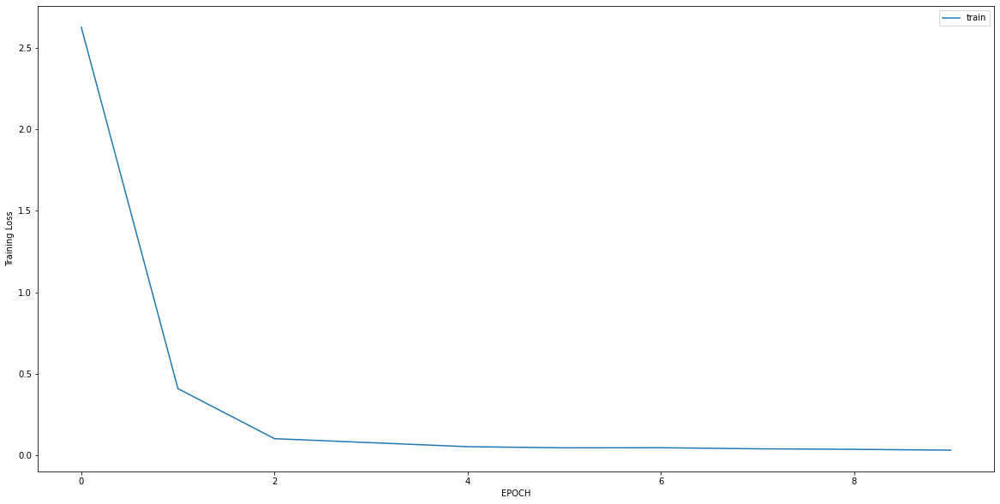

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2307 - accuracy: 0.9301
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1318 - accuracy: 0.9779
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1381 - accuracy: 0.9743
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1165 - accuracy: 0.9743
Epoch 5/10
9/9 [==============================] - 0s 7ms/step - loss: 0.0931 - accuracy: 0.9853
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1157 - accuracy: 0.9779
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1113 - accuracy: 0.9816
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1061 - accuracy: 0.9816
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1019 - accuracy: 0.9779
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0892 - accuracy: 0.9779


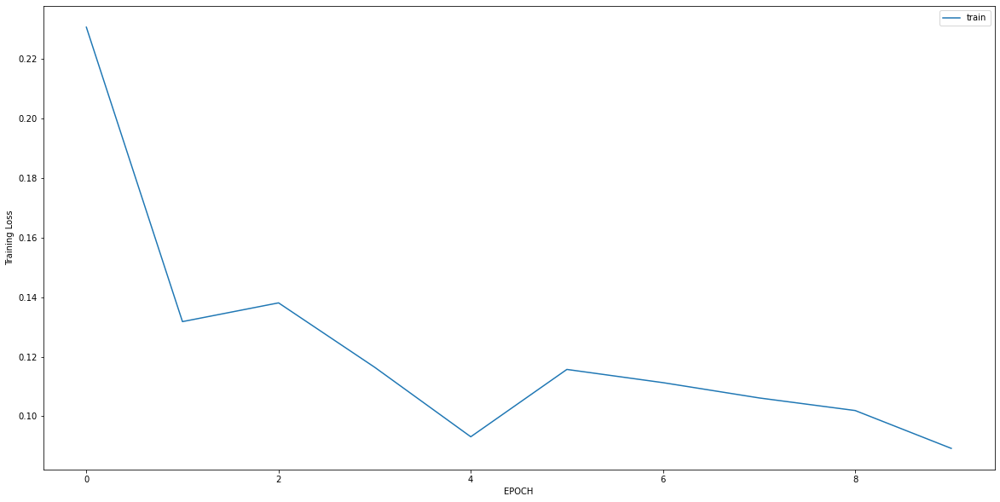

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.8607 - accuracy: 0.7077
Epoch 2/10
14/14 [==============================] - 0s 5ms/step - loss: 0.4989 - accuracy: 0.7912
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3966 - accuracy: 0.8121
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3564 - accuracy: 0.8376
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3383 - accuracy: 0.8492
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3458 - accuracy: 0.8422
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3258 - accuracy: 0.8376
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3231 - accuracy: 0.8515
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2747 - accuracy: 0.8724
Epoch 10/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2130 - accuracy: 0.9095


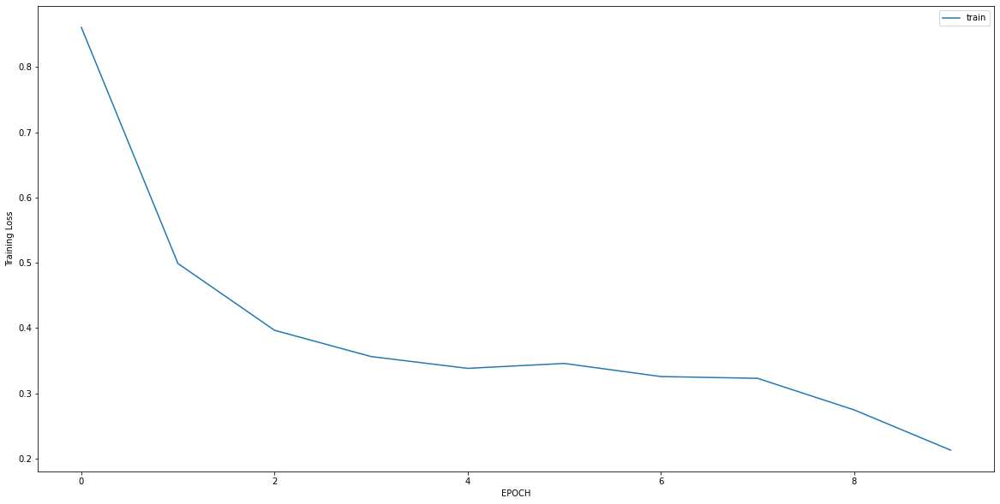

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 1.0858 - accuracy: 0.5164
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4016 - accuracy: 0.8355
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2716 - accuracy: 0.9375
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1841 - accuracy: 0.9737
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1468 - accuracy: 0.9934
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1293 - accuracy: 0.9934
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1075 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0942 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0918 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0818 - accuracy: 1.0000


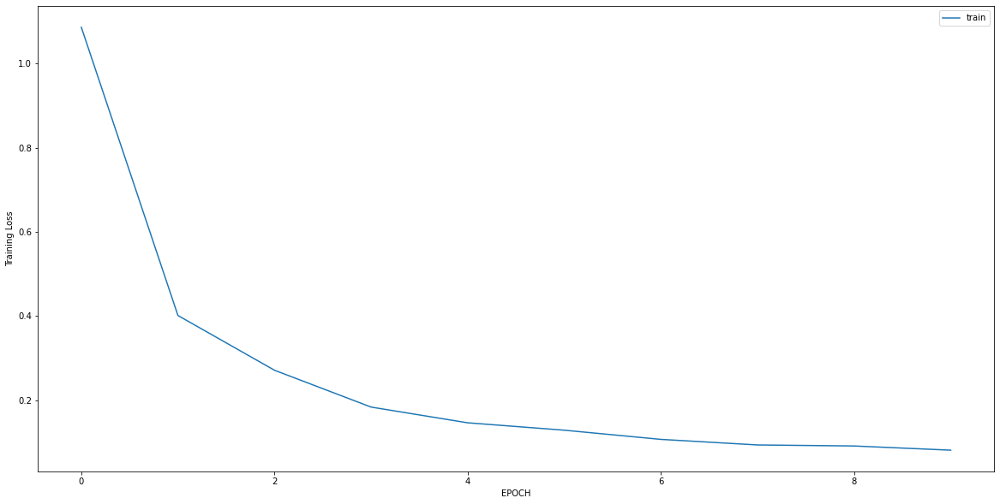

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 3.5966 - accuracy: 0.0607
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1661 - accuracy: 0.4214
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2411 - accuracy: 0.9393
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1132 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0777 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0684 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0483 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 1.0000


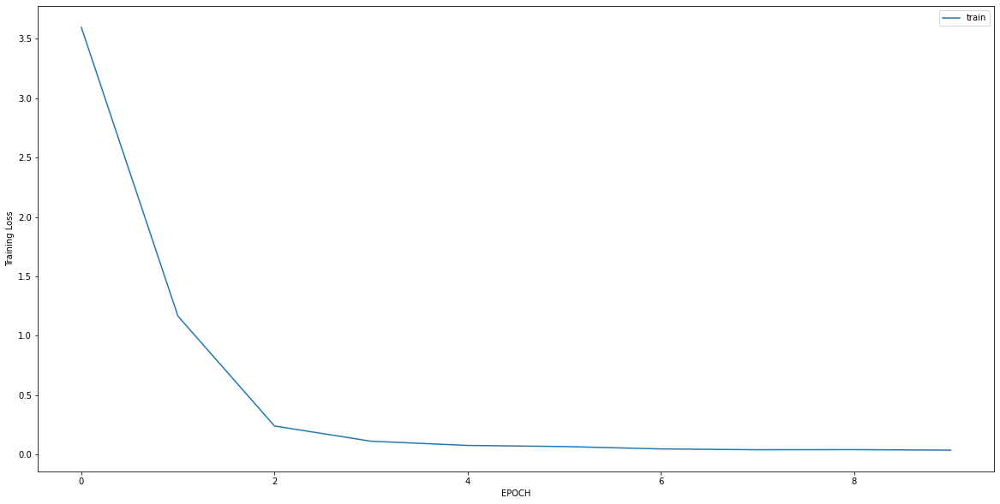

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1497 - accuracy: 0.9456
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0313 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0127 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0110 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0092 - accuracy: 1.0000


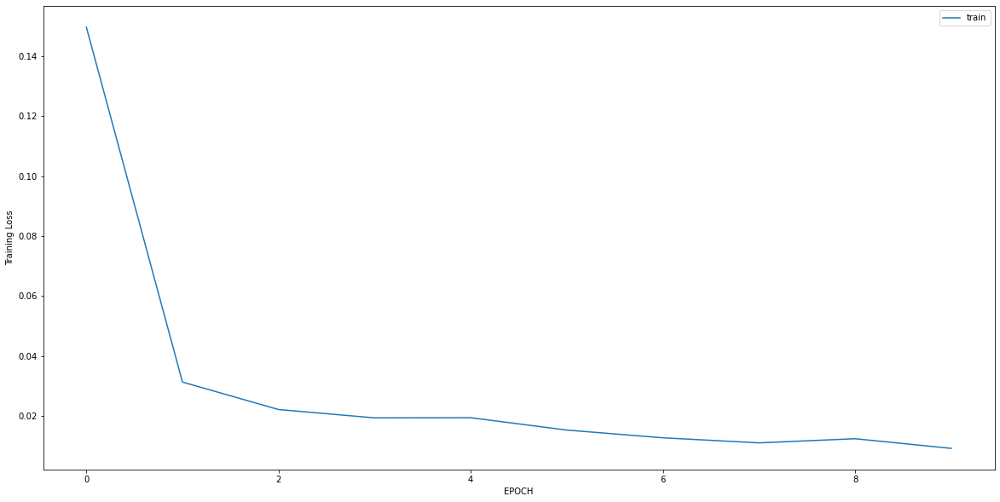

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.7717 - accuracy: 0.4164
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3028 - accuracy: 0.4662
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0039 - accuracy: 0.5836
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7260 - accuracy: 0.6619
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4907 - accuracy: 0.7331
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4025 - accuracy: 0.8292
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3249 - accuracy: 0.8754
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3135 - accuracy: 0.8826
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2789 - accuracy: 0.9181
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2264 - accuracy: 0.9181


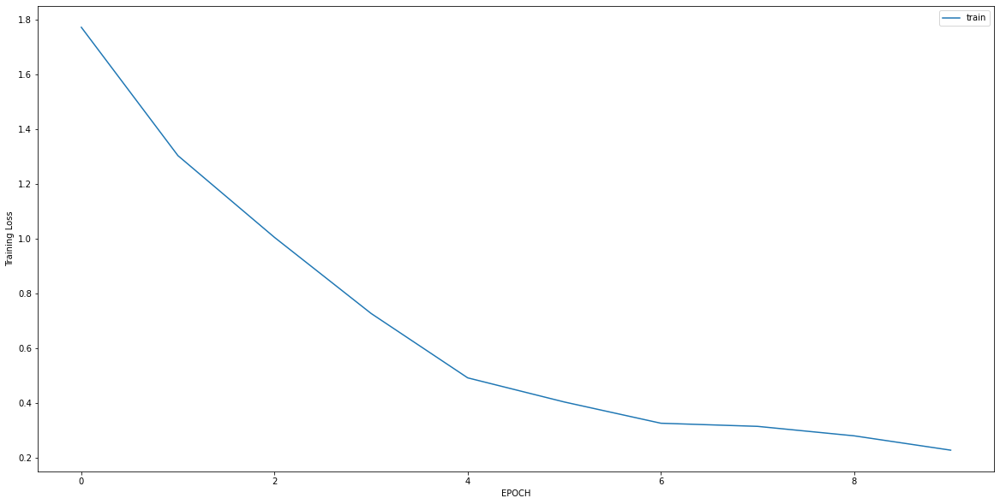

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2854 - accuracy: 0.8962
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1792 - accuracy: 0.9526
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1658 - accuracy: 0.9549
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1541 - accuracy: 0.9616
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1366 - accuracy: 0.9661
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1227 - accuracy: 0.9774
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1182 - accuracy: 0.9819
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1160 - accuracy: 0.9752
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1024 - accuracy: 0.9729
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0979 - accuracy: 0.9797


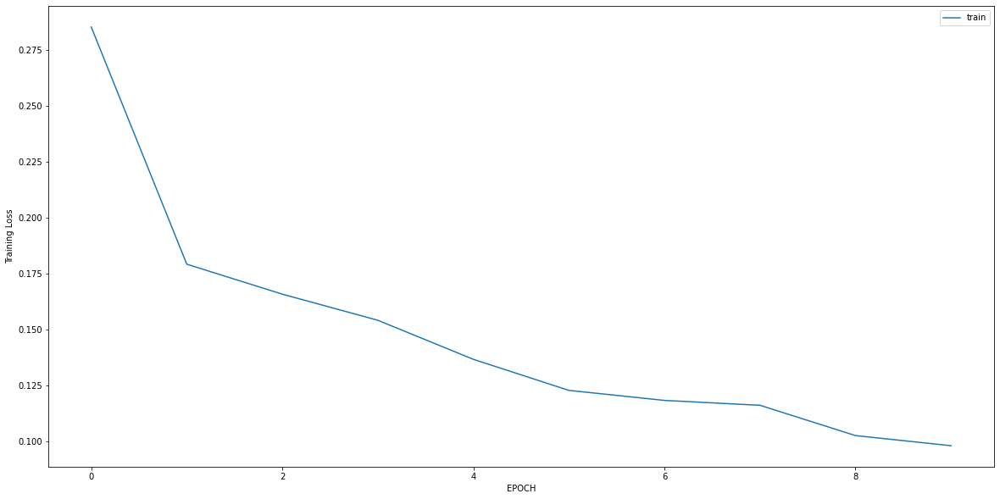

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2171 - accuracy: 0.5736
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5397 - accuracy: 0.7623
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4480 - accuracy: 0.8113
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4027 - accuracy: 0.8453
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3398 - accuracy: 0.8453
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3478 - accuracy: 0.8340
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3054 - accuracy: 0.8717
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2743 - accuracy: 0.8830
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2792 - accuracy: 0.8792
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3033 - accuracy: 0.8679


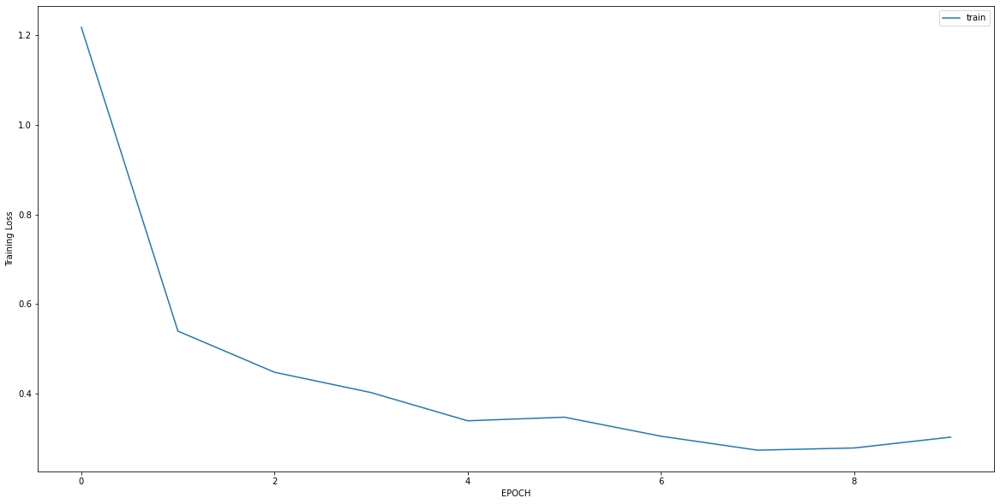

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.4101 - accuracy: 0.8488
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2939 - accuracy: 0.9093
Epoch 3/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2822 - accuracy: 0.9201
Epoch 4/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3026 - accuracy: 0.9114
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2731 - accuracy: 0.9158
Epoch 6/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2699 - accuracy: 0.9071
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2786 - accuracy: 0.9136
Epoch 8/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2894 - accuracy: 0.9071
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2589 - accuracy: 0.9114
Epoch 10/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2825 - accuracy: 0.9179


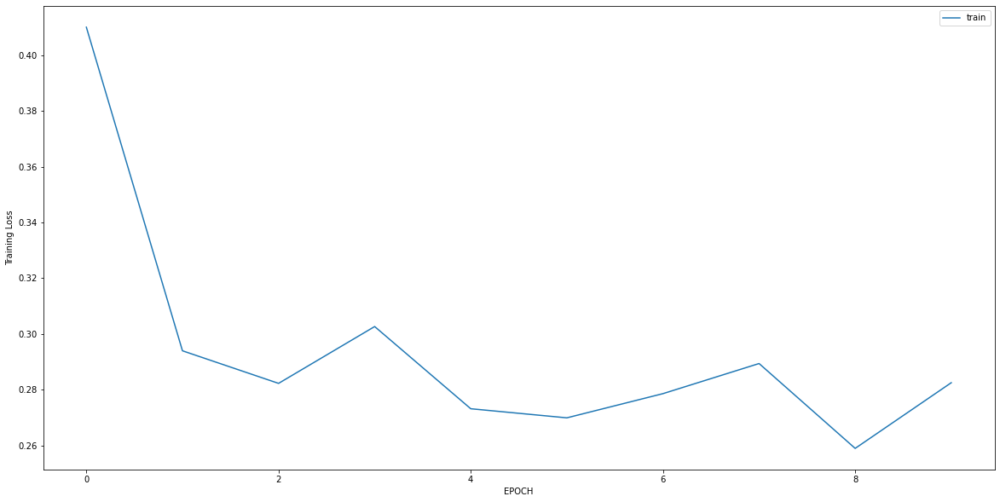

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9289 - accuracy: 0.6404
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3821 - accuracy: 0.8127
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3381 - accuracy: 0.8539
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3170 - accuracy: 0.8652
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2854 - accuracy: 0.8951
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2625 - accuracy: 0.8839
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2556 - accuracy: 0.9064
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2413 - accuracy: 0.9139
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2307 - accuracy: 0.9251
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2341 - accuracy: 0.9213


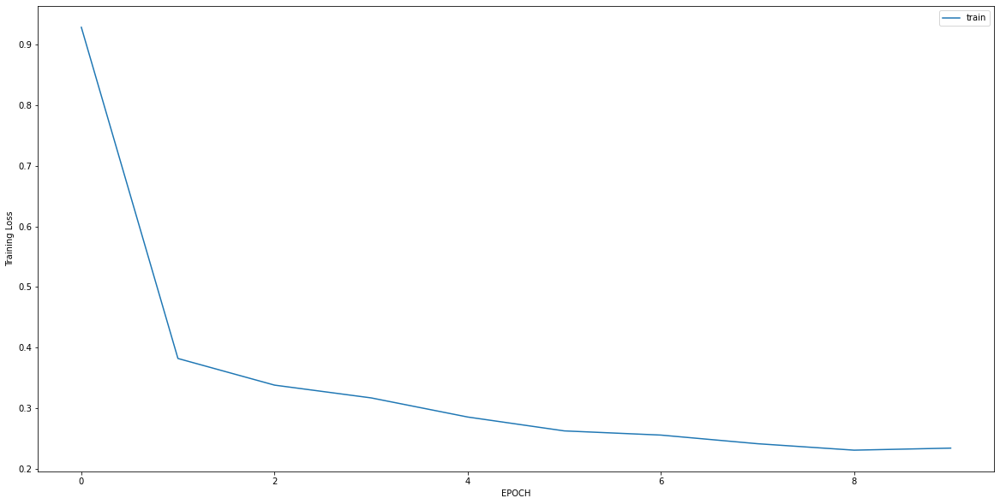

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.7658 - accuracy: 0.3182
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2877 - accuracy: 0.9545
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1631 - accuracy: 0.9962
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1014 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0739 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0638 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0465 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 7ms/step - loss: 0.0350 - accuracy: 1.0000


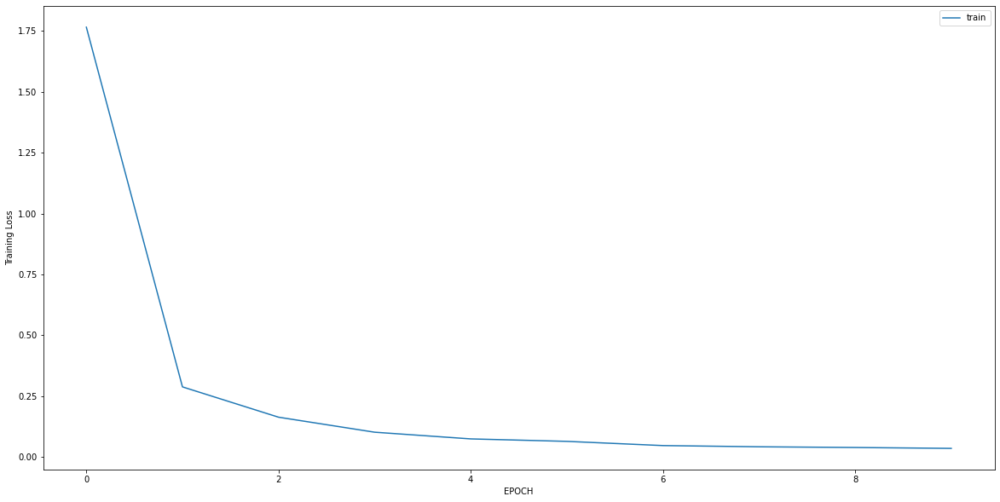

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0249 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0203 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0189 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0175 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0168 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0143 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0143 - accuracy: 1.0000


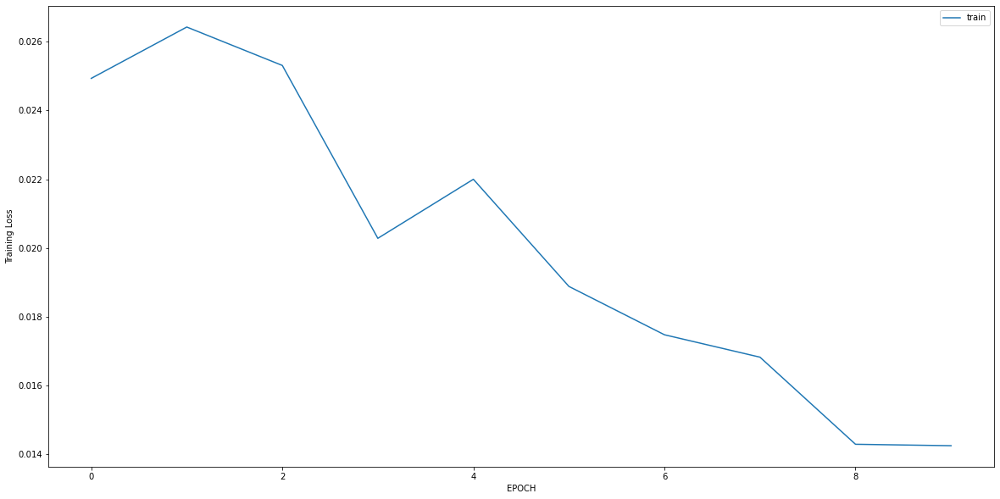

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.5852 - accuracy: 0.8480
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4374 - accuracy: 0.8801
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2916 - accuracy: 0.8889
Epoch 4/10
11/11 [==============================] - 0s 6ms/step - loss: 0.2913 - accuracy: 0.8918
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2711 - accuracy: 0.9006
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2571 - accuracy: 0.9035
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2267 - accuracy: 0.8947
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2185 - accuracy: 0.9211
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2233 - accuracy: 0.9094
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1857 - accuracy: 0.9240


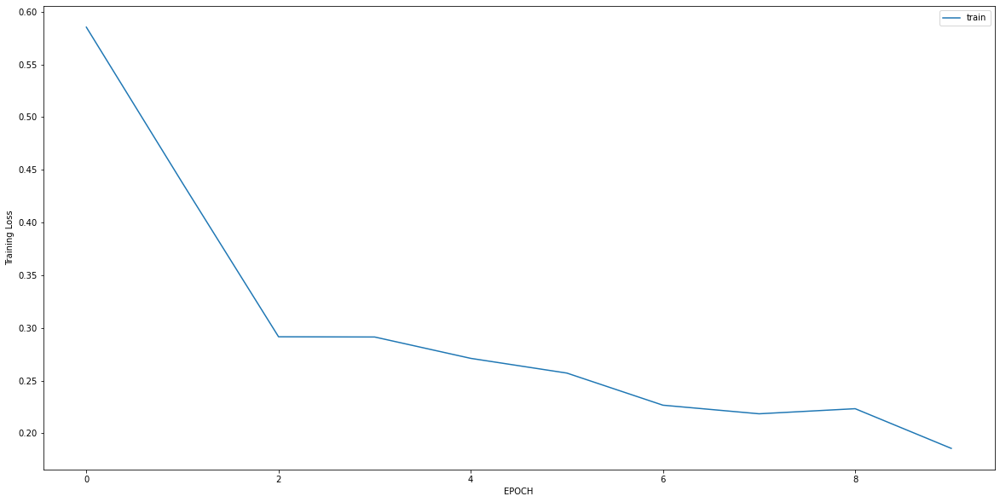

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 2.9242 - accuracy: 0.0256
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8000 - accuracy: 0.5016
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1137 - accuracy: 0.9968
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0633 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0298 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0305 - accuracy: 1.0000


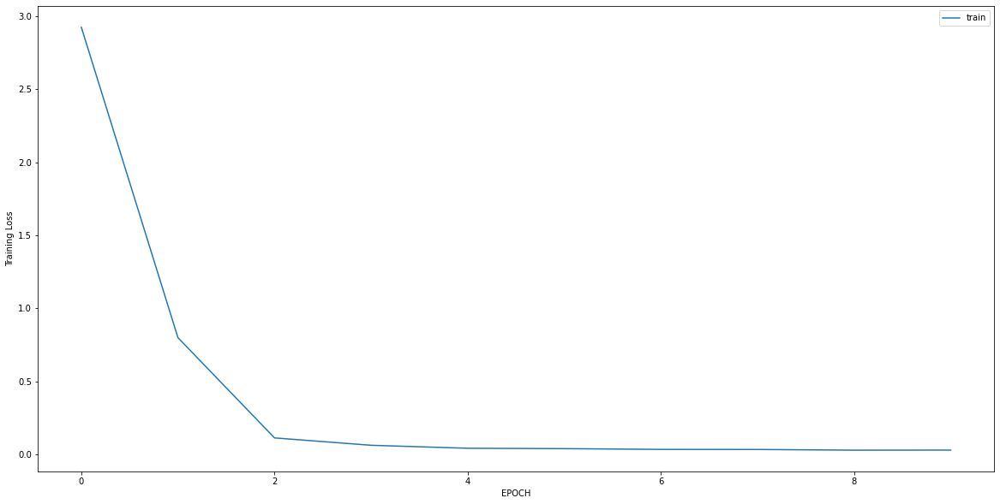

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 1.6068 - accuracy: 0.2986
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 1.1090 - accuracy: 0.3750
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.8677 - accuracy: 0.4444
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7588 - accuracy: 0.4861
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6175 - accuracy: 0.6111
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5654 - accuracy: 0.7222
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5531 - accuracy: 0.6597
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.4813 - accuracy: 0.7500
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5592 - accuracy: 0.7153
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4839 - accuracy: 0.7361


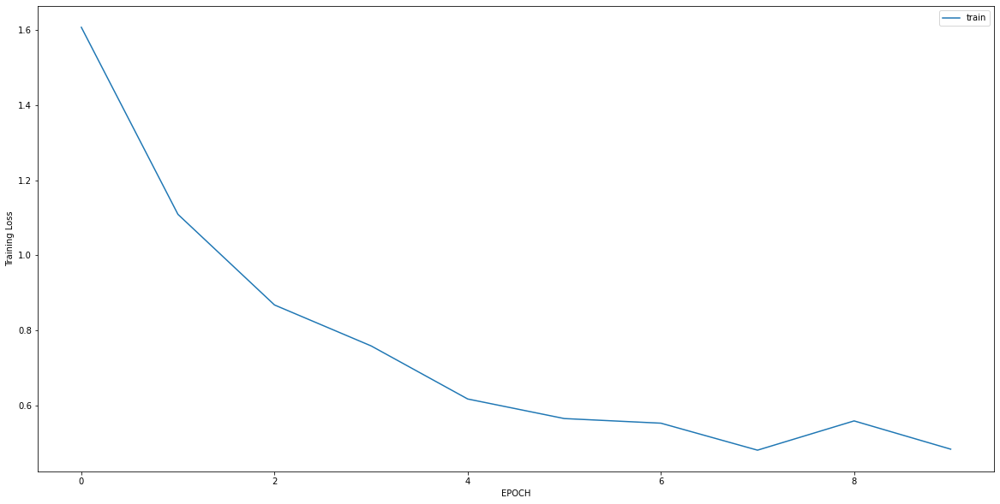

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4532 - accuracy: 0.8105
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3437 - accuracy: 0.8387
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2429 - accuracy: 0.9153
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2215 - accuracy: 0.9194
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1747 - accuracy: 0.9476
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1679 - accuracy: 0.9274
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1614 - accuracy: 0.9274
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1530 - accuracy: 0.9435
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1506 - accuracy: 0.9556
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1420 - accuracy: 0.9597


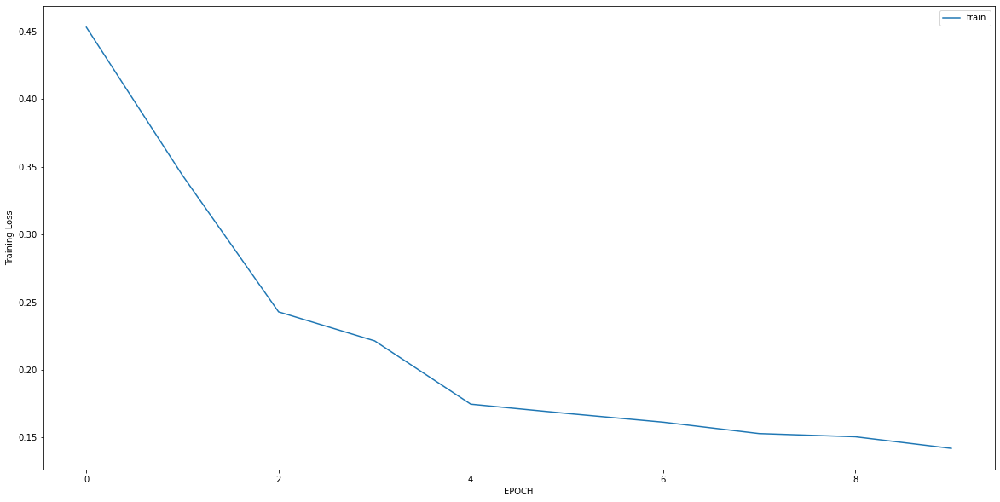

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2899 - accuracy: 0.9456
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0266 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0242 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0207 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0221 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0206 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0193 - accuracy: 1.0000


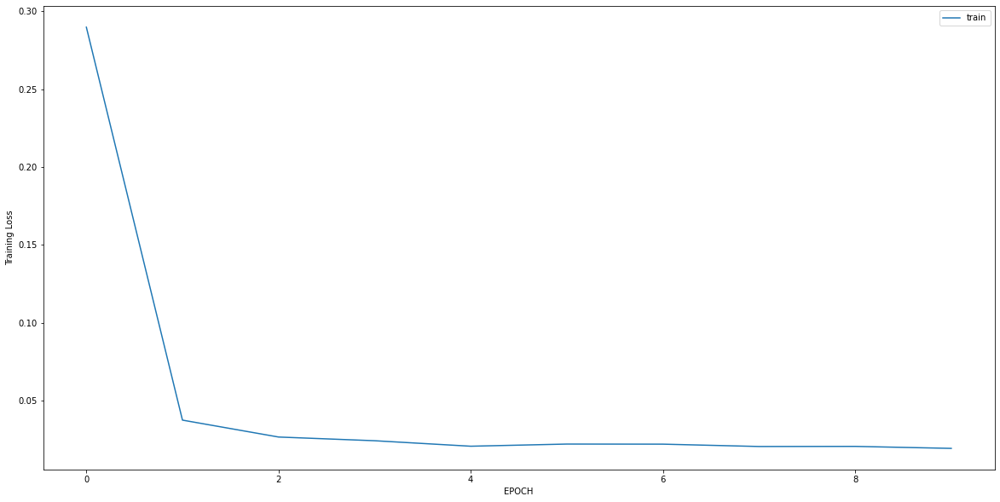

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 1.2407 - accuracy: 0.5047
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1394 - accuracy: 0.9938
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0493 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0164 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0165 - accuracy: 1.0000


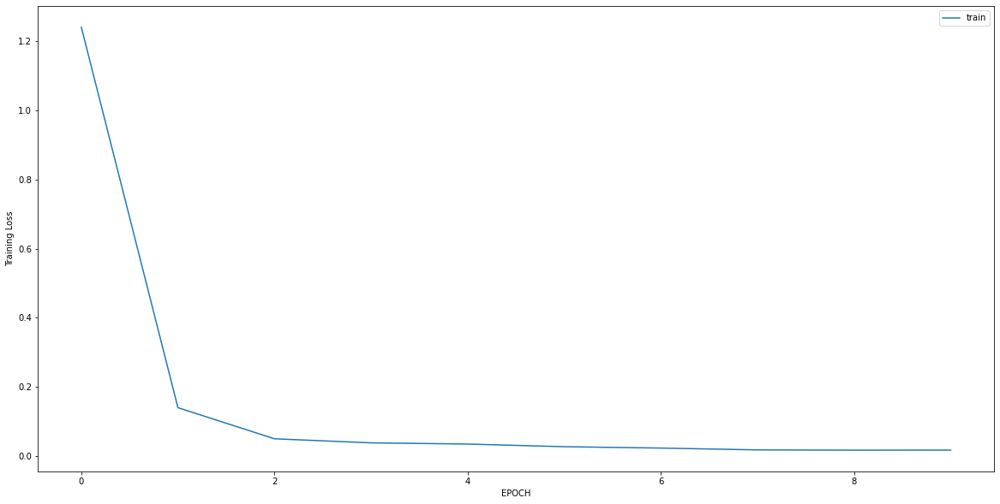

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.1066 - accuracy: 0.6899
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8519 - accuracy: 0.7735
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5259 - accuracy: 0.8293
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3209 - accuracy: 0.8885
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2485 - accuracy: 0.9024
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2181 - accuracy: 0.9268
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1976 - accuracy: 0.9338
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1926 - accuracy: 0.9338
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1720 - accuracy: 0.9338
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1556 - accuracy: 0.9582


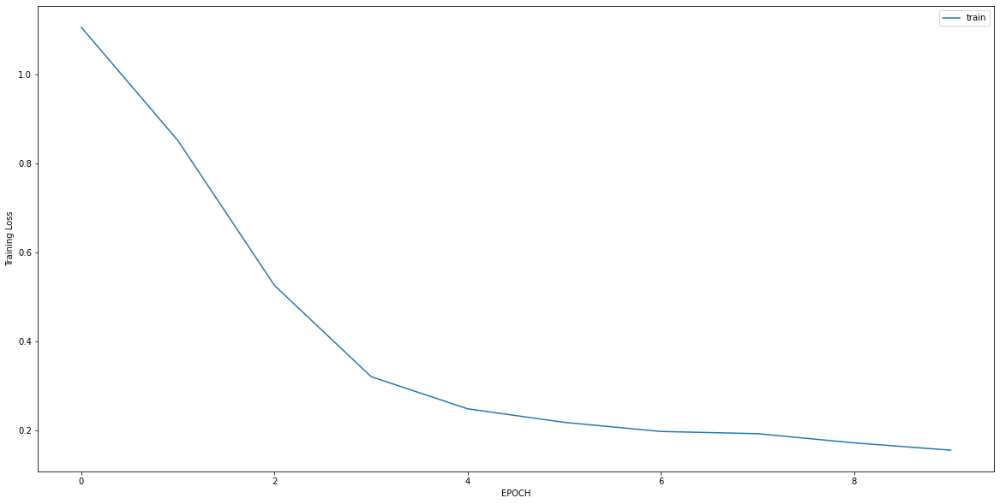

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2555 - accuracy: 0.5516
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1472 - accuracy: 0.5587
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7307 - accuracy: 0.6477
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3308 - accuracy: 0.8790
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2506 - accuracy: 0.9324
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2214 - accuracy: 0.9324
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2048 - accuracy: 0.9537
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1747 - accuracy: 0.9573
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1590 - accuracy: 0.9609
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1708 - accuracy: 0.9537


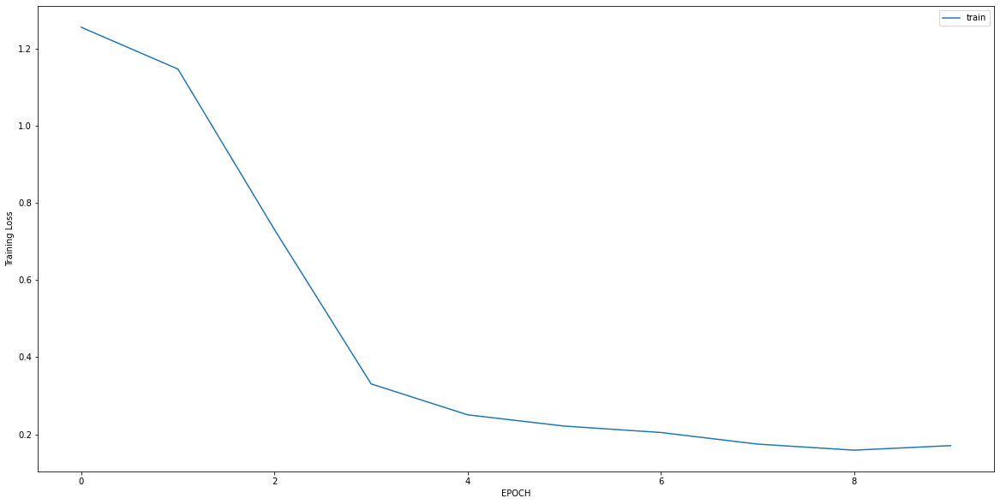

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0940 - accuracy: 0.7088
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6618 - accuracy: 0.7228
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5790 - accuracy: 0.7123
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4527 - accuracy: 0.8070
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4102 - accuracy: 0.8316
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3348 - accuracy: 0.8491
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3283 - accuracy: 0.8877
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3167 - accuracy: 0.8807
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3073 - accuracy: 0.8807
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3266 - accuracy: 0.8842


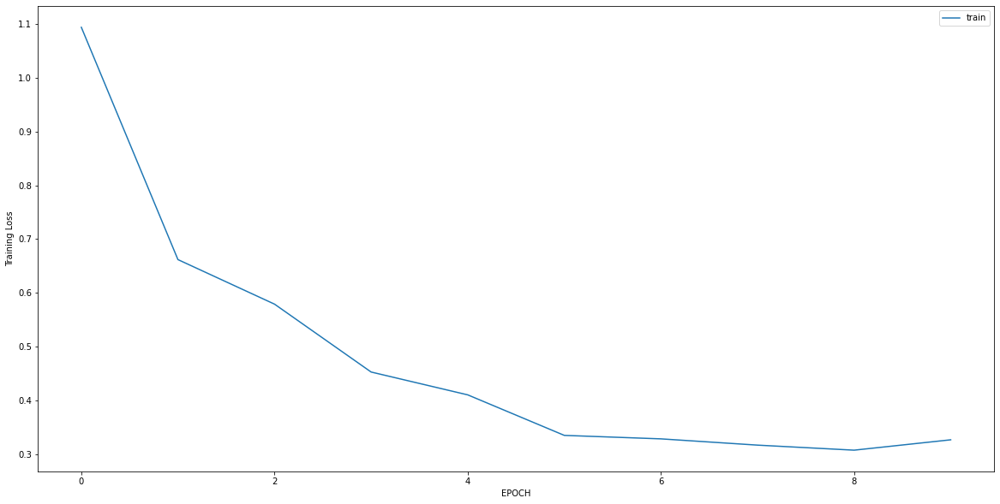

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.4649 - accuracy: 0.7946
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3245 - accuracy: 0.9057
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2822 - accuracy: 0.9226
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2532 - accuracy: 0.9394
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2138 - accuracy: 0.9327
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2014 - accuracy: 0.9495
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1767 - accuracy: 0.9461
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1729 - accuracy: 0.9428
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1641 - accuracy: 0.9529
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1516 - accuracy: 0.9630


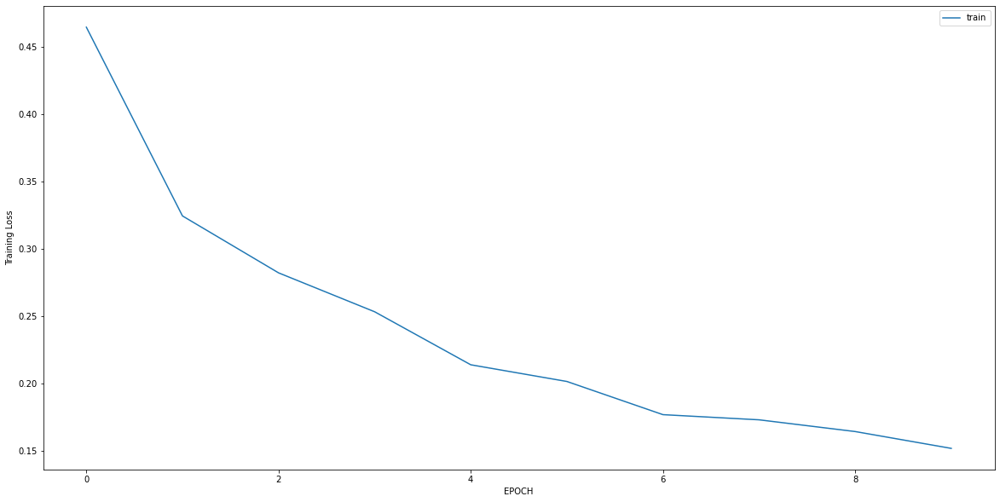

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 3.0050 - accuracy: 0.0158
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.4292 - accuracy: 0.7698
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0270 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0179 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0124 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0117 - accuracy: 1.0000


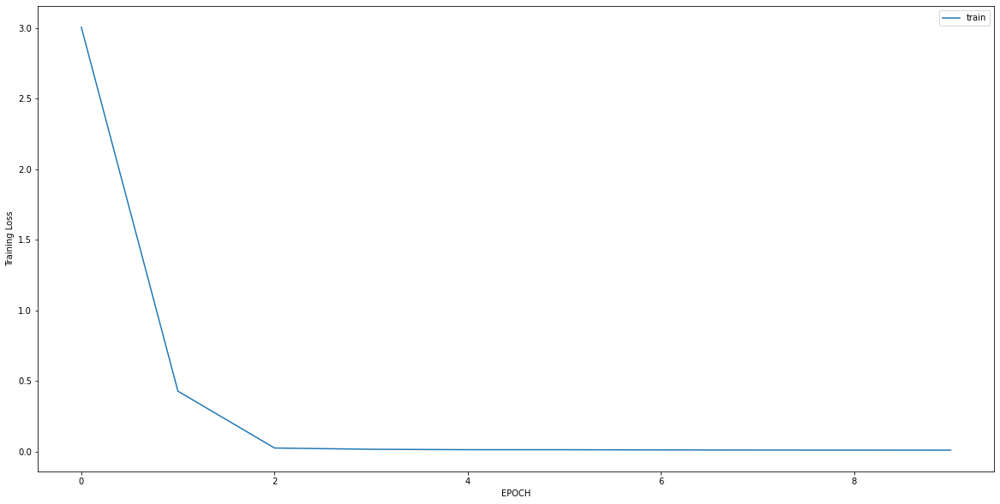

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0529 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0476 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0344 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 1.0000


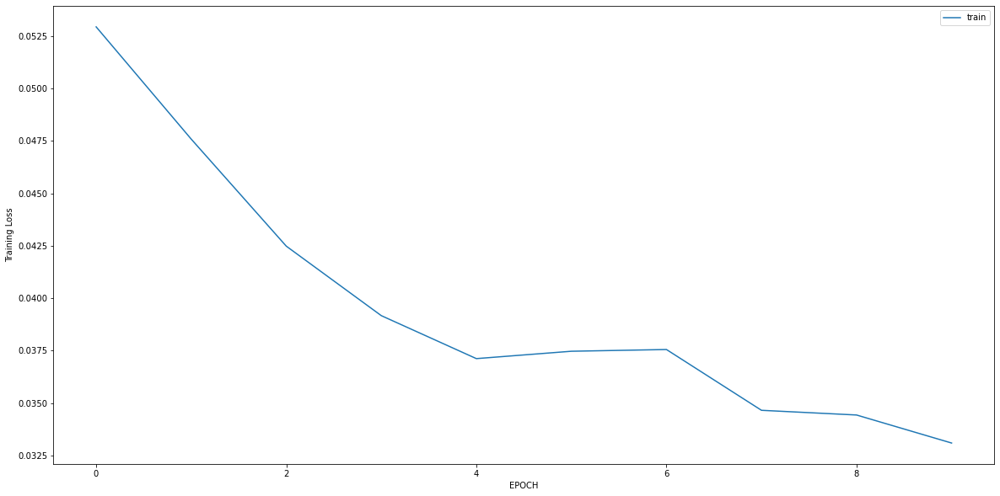

Epoch 1/10
7/7 [==============================] - 0s 7ms/step - loss: 1.9685 - accuracy: 0.3761
Epoch 2/10
7/7 [==============================] - 0s 7ms/step - loss: 1.3768 - accuracy: 0.4083
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9815 - accuracy: 0.5046
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.8785 - accuracy: 0.6009
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7716 - accuracy: 0.6743
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6951 - accuracy: 0.7294
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6314 - accuracy: 0.7477
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5802 - accuracy: 0.7385
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5467 - accuracy: 0.7798
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4868 - accuracy: 0.8211


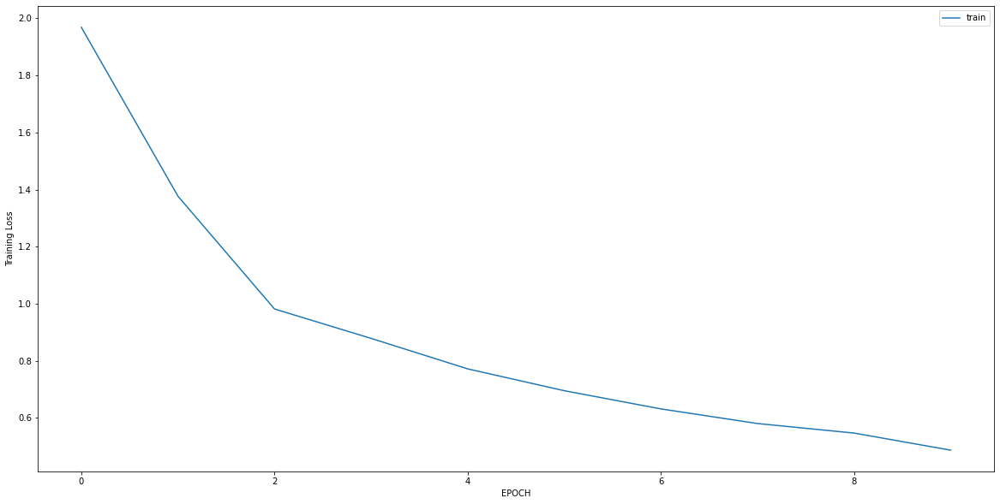

Epoch 1/10
2/2 [==============================] - 0s 6ms/step - loss: 0.6639 - accuracy: 0.6964
Epoch 2/10
2/2 [==============================] - 0s 6ms/step - loss: 0.3358 - accuracy: 0.8571
Epoch 3/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1548 - accuracy: 1.0000
Epoch 4/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1670 - accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1437 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 8ms/step - loss: 0.1456 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 0.1646 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 8ms/step - loss: 0.1402 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1331 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1293 - accuracy: 1.0000


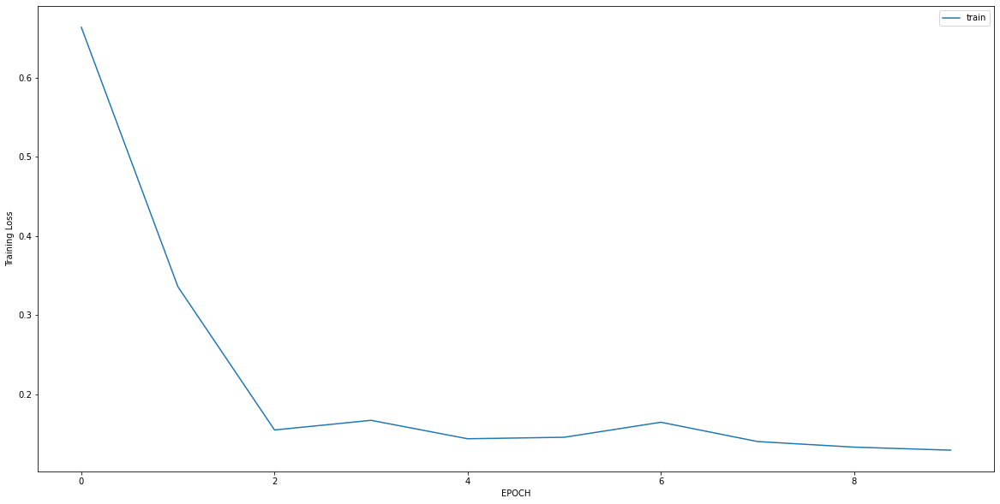

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 1.0376 - accuracy: 0.5507
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 0.9918 - accuracy: 0.5507
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0061 - accuracy: 0.5507
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8852 - accuracy: 0.5507
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8513 - accuracy: 0.5507
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8669 - accuracy: 0.5507
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7647 - accuracy: 0.5652
Epoch 8/10
5/5 [==============================] - 0s 4ms/step - loss: 0.7263 - accuracy: 0.5725
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6091 - accuracy: 0.6522
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5402 - accuracy: 0.7464


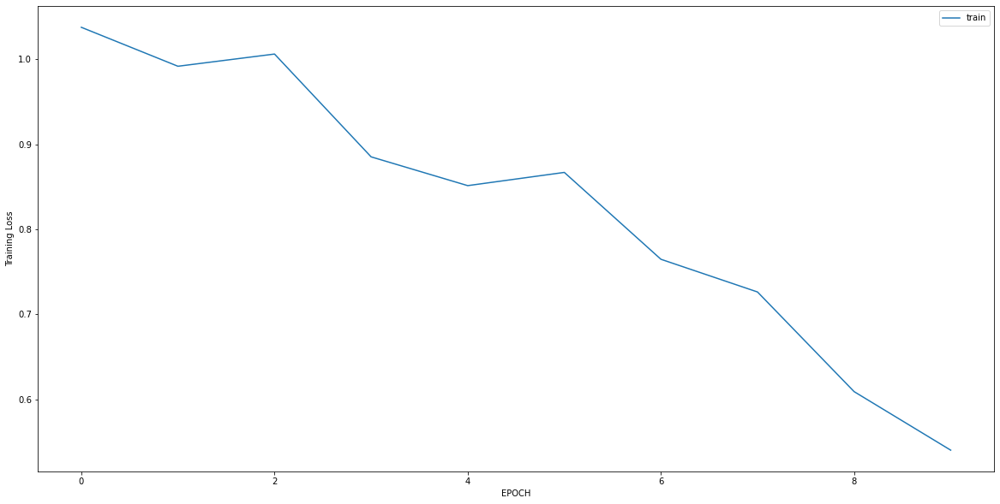

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3878 - accuracy: 0.8391
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0814 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0642 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0528 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0308 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0277 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 1.0000


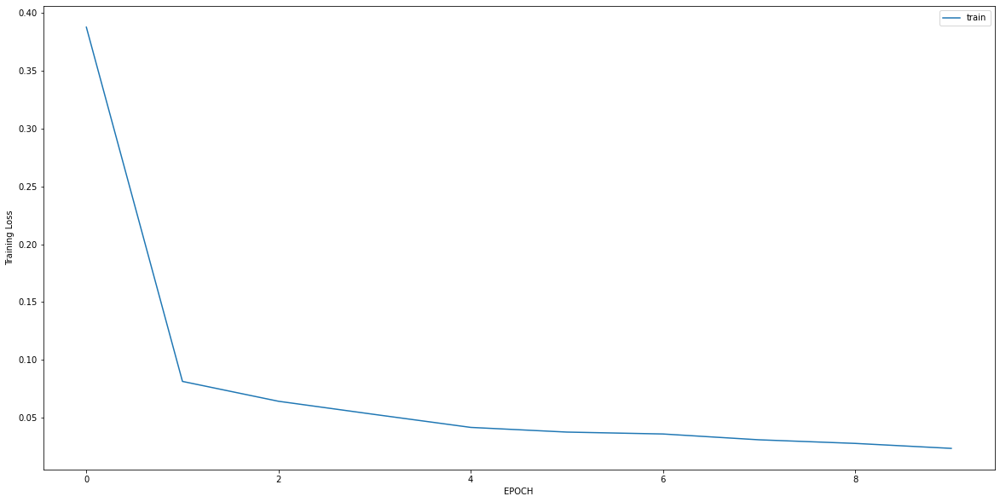

Epoch 1/10
7/7 [==============================] - ETA: 0s - loss: 1.9397 - accuracy: 0.50 - 0s 6ms/step - loss: 1.8581 - accuracy: 0.4764
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 1.3769 - accuracy: 0.5283
Epoch 3/10
7/7 [==============================] - 0s 4ms/step - loss: 0.9566 - accuracy: 0.6038
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6817 - accuracy: 0.6792
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5256 - accuracy: 0.7736
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4273 - accuracy: 0.8208
Epoch 7/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4229 - accuracy: 0.8208
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3601 - accuracy: 0.8160
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.3672 - accuracy: 0.8255
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3262 - accuracy: 0.85

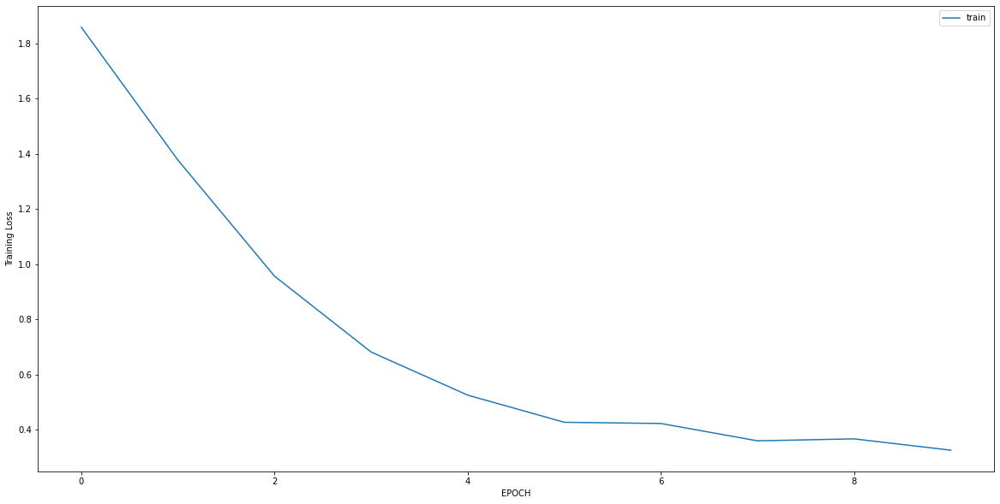

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3038 - accuracy: 0.9345
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2923 - accuracy: 0.9345
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2712 - accuracy: 0.9586
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2595 - accuracy: 0.9414
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2405 - accuracy: 0.9552
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2307 - accuracy: 0.9621
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2072 - accuracy: 0.9655
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1993 - accuracy: 0.9655
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1975 - accuracy: 0.9621
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1776 - accuracy: 0.9655


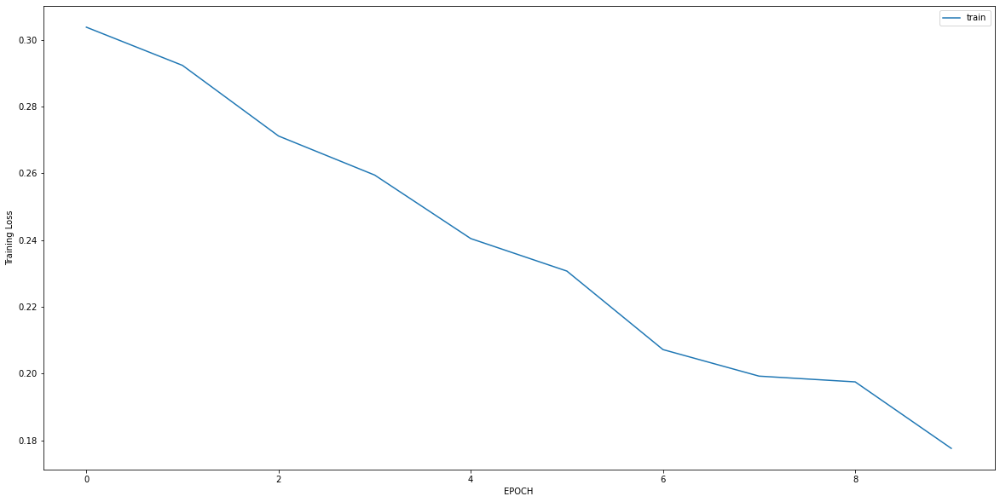

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1927 - accuracy: 0.9385
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1911 - accuracy: 0.9303
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1719 - accuracy: 0.9508
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1610 - accuracy: 0.9508
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1412 - accuracy: 0.9590
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1569 - accuracy: 0.9467
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1312 - accuracy: 0.9631
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1614 - accuracy: 0.9385
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1392 - accuracy: 0.9467
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1416 - accuracy: 0.9549


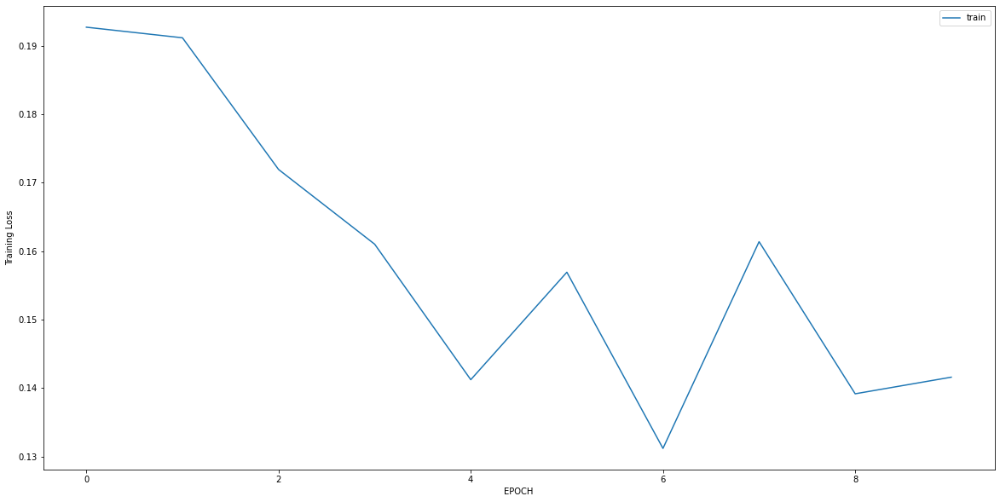

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3455 - accuracy: 0.8881
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3568 - accuracy: 0.8636
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3350 - accuracy: 0.8706
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3203 - accuracy: 0.8916
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2889 - accuracy: 0.8986
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2741 - accuracy: 0.9161
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2854 - accuracy: 0.9056
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2935 - accuracy: 0.9126
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2733 - accuracy: 0.9091
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2830 - accuracy: 0.9196


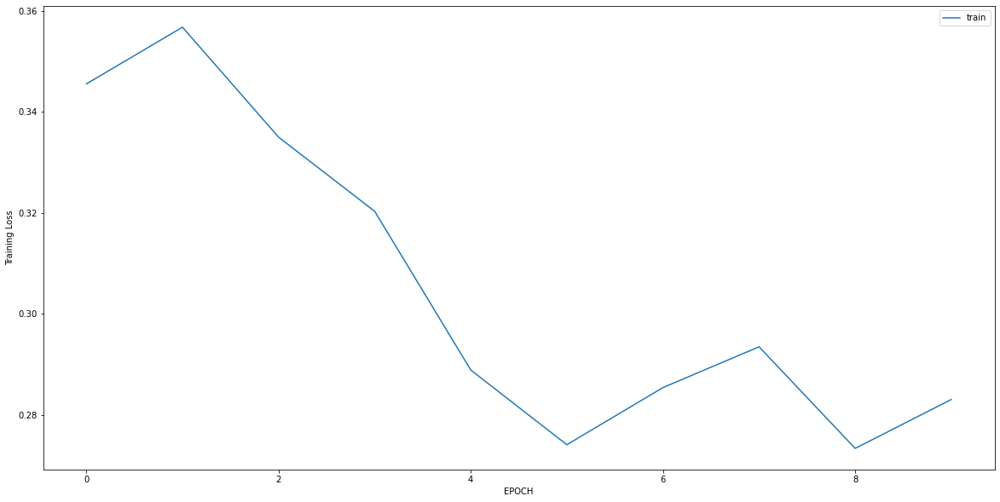

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5821 - accuracy: 0.8228
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5234 - accuracy: 0.8228
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5138 - accuracy: 0.8228
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4253 - accuracy: 0.8228
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3977 - accuracy: 0.8228
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3358 - accuracy: 0.8312
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2611 - accuracy: 0.8692
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2701 - accuracy: 0.8523
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2621 - accuracy: 0.8650
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2493 - accuracy: 0.8945


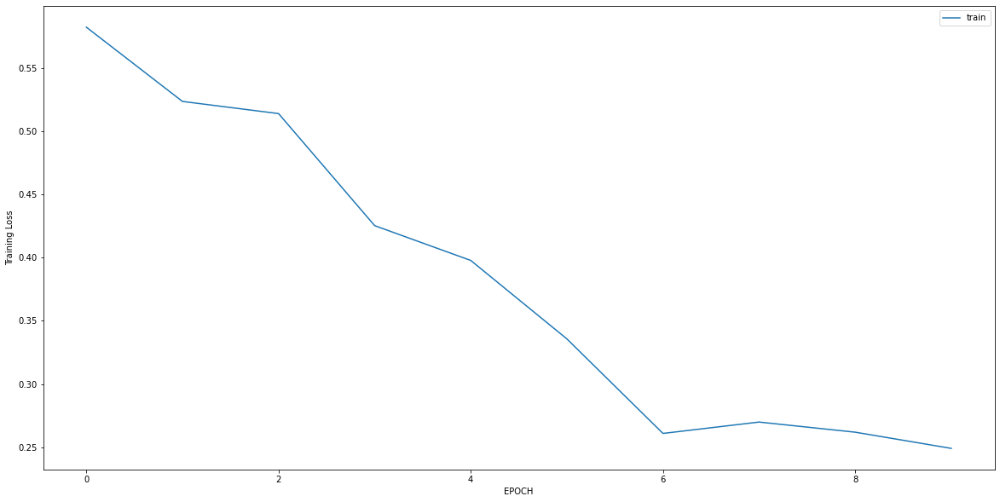

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6309 - accuracy: 0.6949
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4463 - accuracy: 0.7795
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2809 - accuracy: 0.9094
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2320 - accuracy: 0.9245
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2611 - accuracy: 0.8852
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.2128 - accuracy: 0.8943
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2291 - accuracy: 0.9033
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2208 - accuracy: 0.8882
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2101 - accuracy: 0.9033
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1909 - accuracy: 0.9124


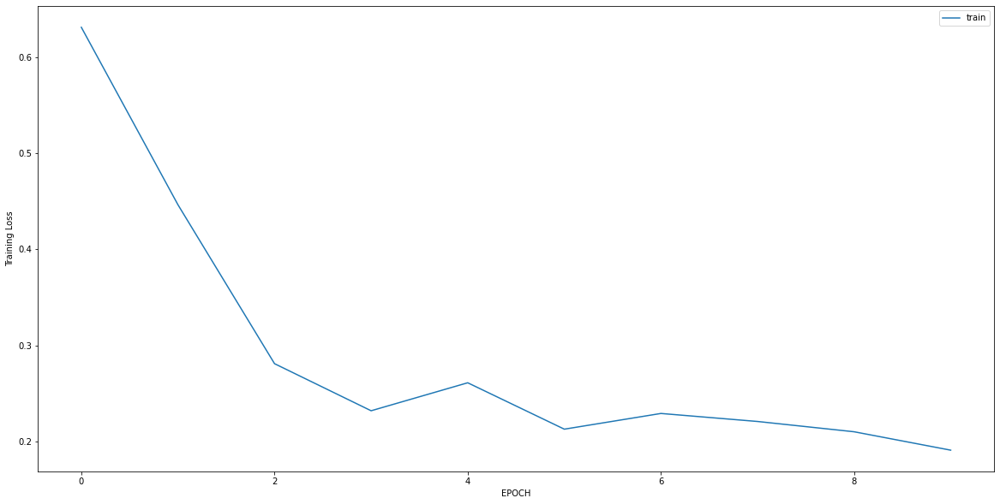

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1263 - accuracy: 0.5212
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4314 - accuracy: 0.8008
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3793 - accuracy: 0.8432
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3453 - accuracy: 0.8814
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3228 - accuracy: 0.8729
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3149 - accuracy: 0.8771
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2836 - accuracy: 0.8814
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2787 - accuracy: 0.8941
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2574 - accuracy: 0.8941
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2570 - accuracy: 0.9110


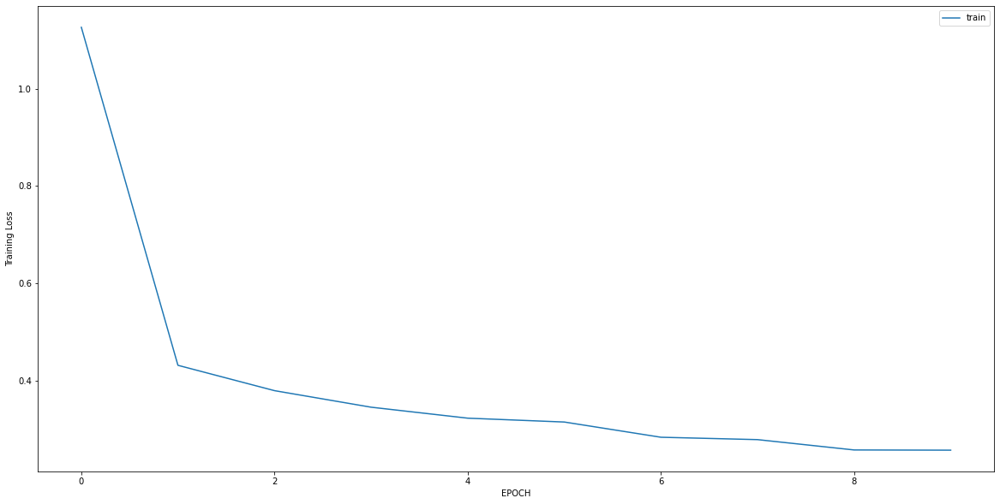

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.2316 - accuracy: 0.4007
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6841 - accuracy: 0.4007
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.2434 - accuracy: 0.4079
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9532 - accuracy: 0.4332
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7951 - accuracy: 0.4549
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7062 - accuracy: 0.5126
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6531 - accuracy: 0.6137
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6369 - accuracy: 0.6390
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6128 - accuracy: 0.7076
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6125 - accuracy: 0.6895


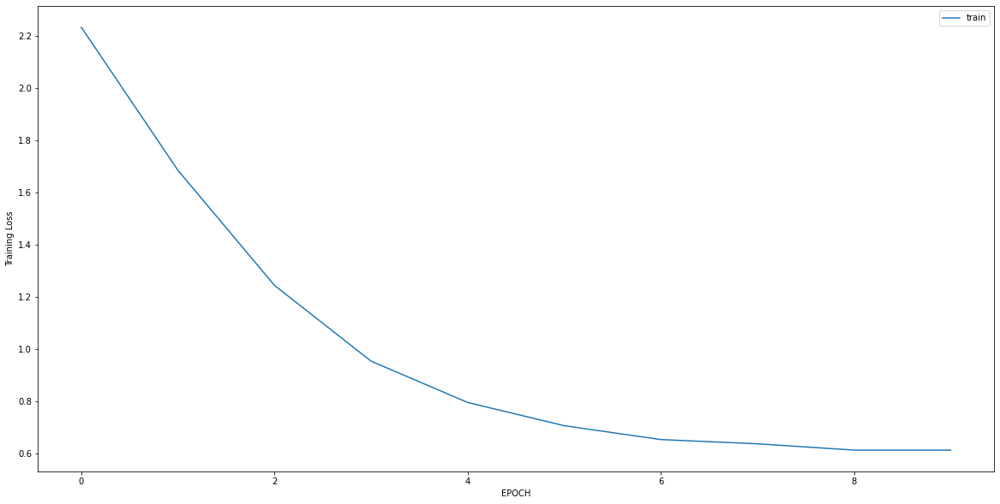

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6011 - accuracy: 0.7239
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6121 - accuracy: 0.7127
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5873 - accuracy: 0.7425
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5885 - accuracy: 0.7090
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5800 - accuracy: 0.7537
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5650 - accuracy: 0.7761
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5652 - accuracy: 0.7425
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5439 - accuracy: 0.7873
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5461 - accuracy: 0.7761
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5338 - accuracy: 0.7799


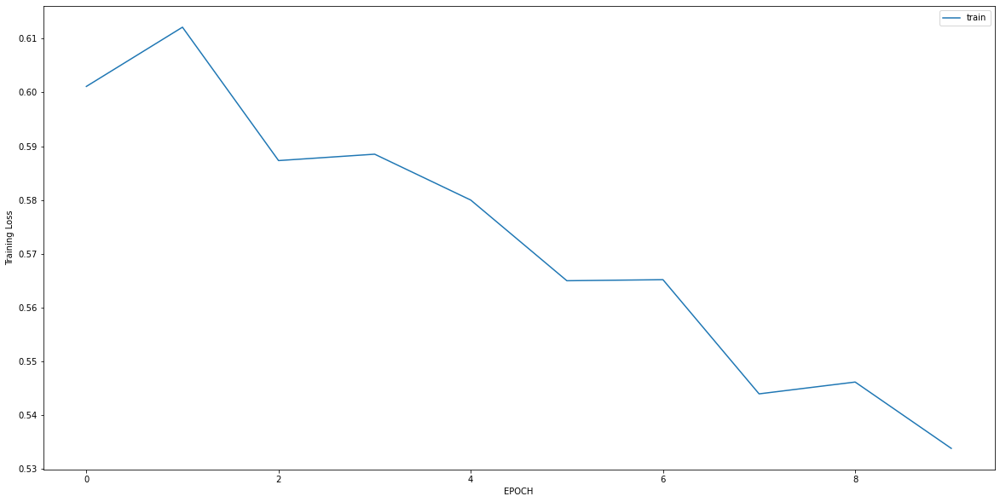

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5950 - accuracy: 0.6415
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4978 - accuracy: 0.7013
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3700 - accuracy: 0.8459
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2962 - accuracy: 0.9088
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2467 - accuracy: 0.9434
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1943 - accuracy: 0.9780
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1719 - accuracy: 0.9843
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1476 - accuracy: 0.9874
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1360 - accuracy: 0.9811
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1225 - accuracy: 0.9906


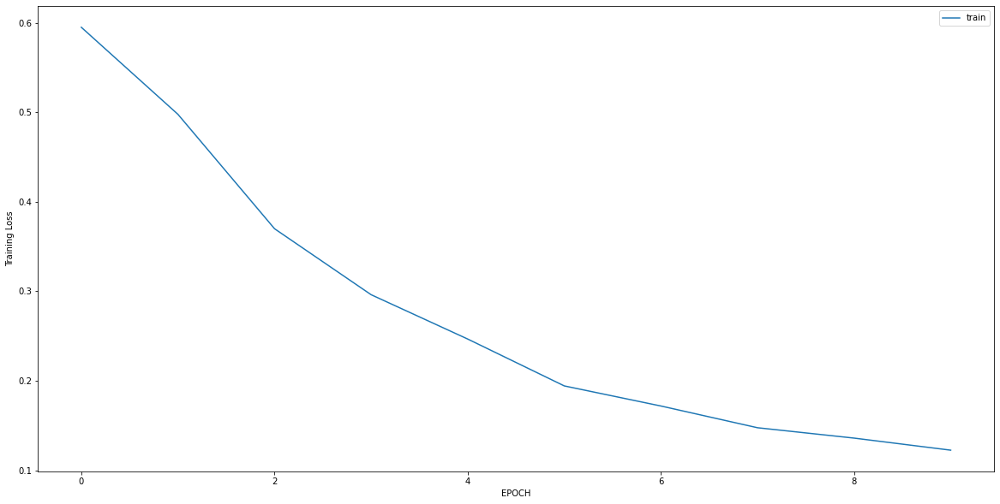

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8962 - accuracy: 0.6364
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0728 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0652 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0562 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0586 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0488 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 1.0000


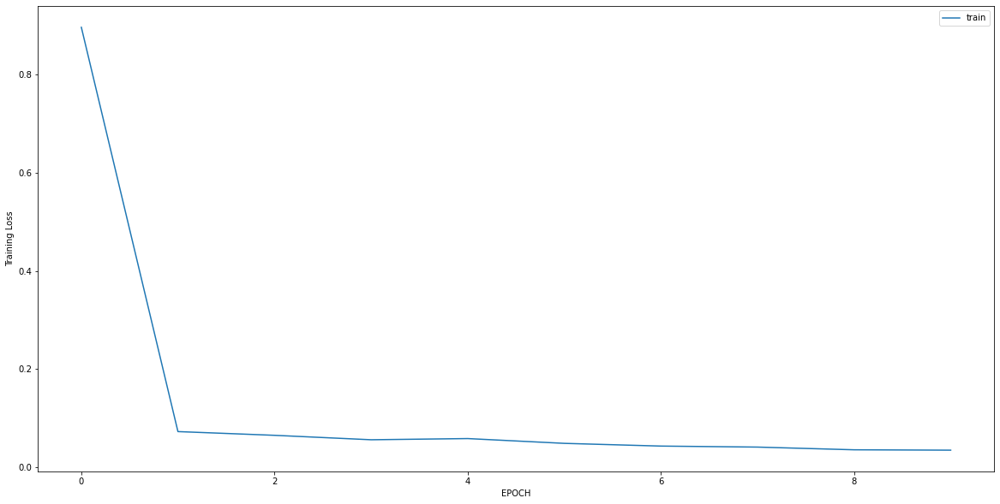

Epoch 1/10
10/10 [==============================] - 0s 7ms/step - loss: 0.8197 - accuracy: 0.6192
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3813 - accuracy: 0.8444
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3239 - accuracy: 0.8742
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3049 - accuracy: 0.8709
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2510 - accuracy: 0.9172
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2445 - accuracy: 0.9073
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2313 - accuracy: 0.9205
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2339 - accuracy: 0.9238
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2018 - accuracy: 0.9371
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1838 - accuracy: 0.9305


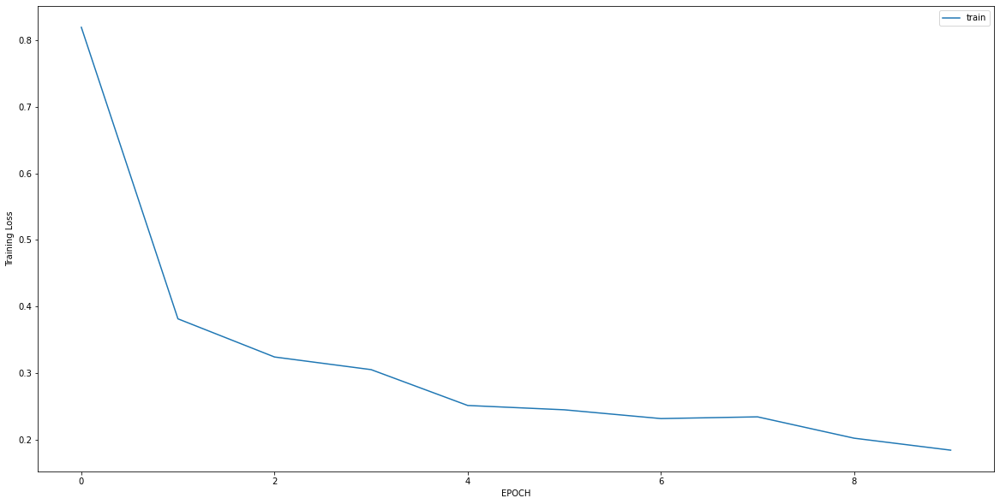

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4166 - accuracy: 0.8543
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3034 - accuracy: 0.8988
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1917 - accuracy: 0.9352
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1576 - accuracy: 0.9474
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1300 - accuracy: 0.9838
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1153 - accuracy: 0.9757
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1380 - accuracy: 0.9636
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1840 - accuracy: 0.9433
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3018 - accuracy: 0.9271
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3166 - accuracy: 0.9109


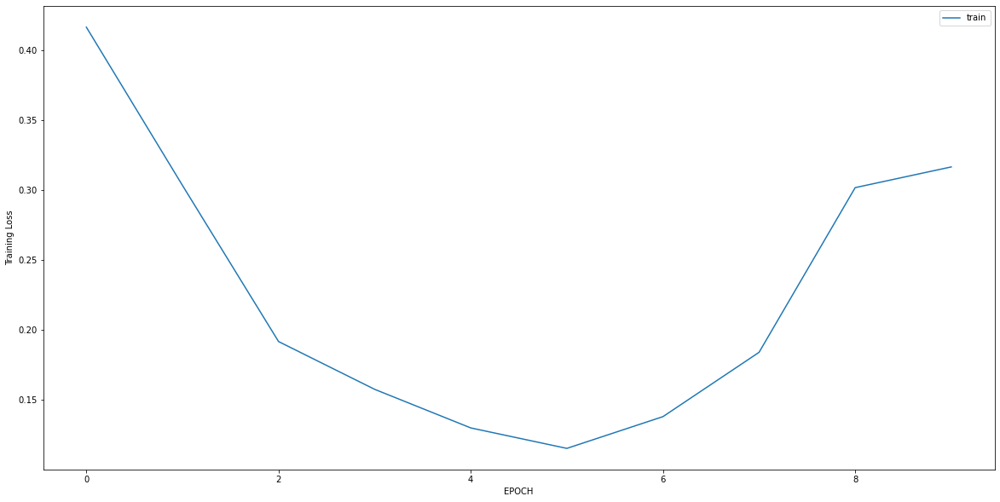

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2422 - accuracy: 0.9012
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3088 - accuracy: 0.9012
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2205 - accuracy: 0.9289
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2096 - accuracy: 0.9289
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1595 - accuracy: 0.9526
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1706 - accuracy: 0.9328
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1622 - accuracy: 0.9486
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1702 - accuracy: 0.9407
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1412 - accuracy: 0.9565
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1445 - accuracy: 0.9565


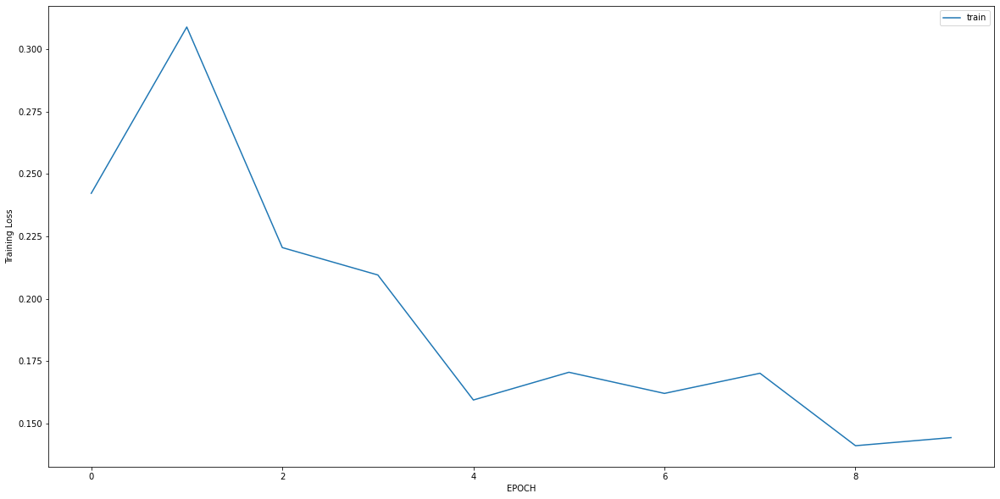

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7092 - accuracy: 0.7815
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5944 - accuracy: 0.8037
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4736 - accuracy: 0.8296
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3986 - accuracy: 0.8519
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3302 - accuracy: 0.8815
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2661 - accuracy: 0.9111
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2264 - accuracy: 0.9148
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2137 - accuracy: 0.9259
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1505 - accuracy: 0.9815
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1562 - accuracy: 0.9704


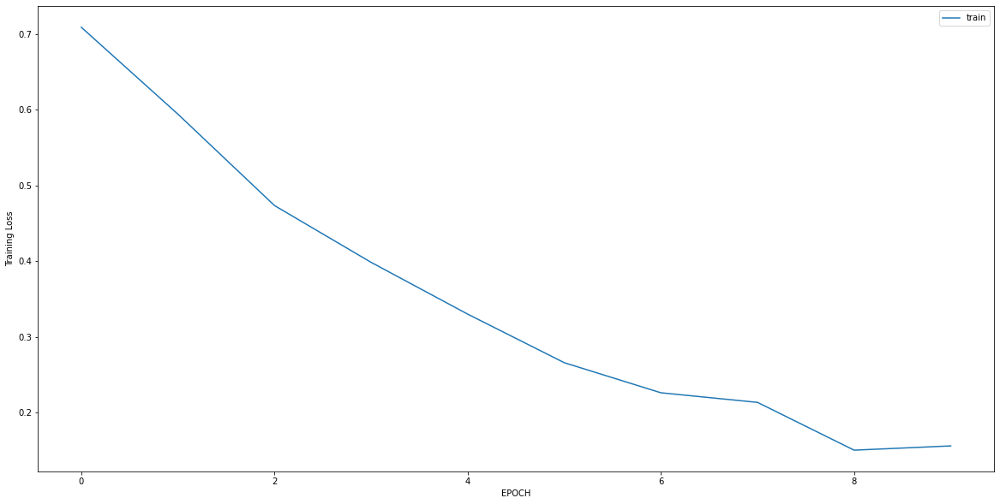

Epoch 1/10
9/9 [==============================] - 0s 4ms/step - loss: 3.5558 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 2.7375 - accuracy: 0.0115
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.4531 - accuracy: 0.0651
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6558 - accuracy: 0.6245
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3446 - accuracy: 0.9770
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2064 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1504 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1156 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0973 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0887 - accuracy: 1.0000


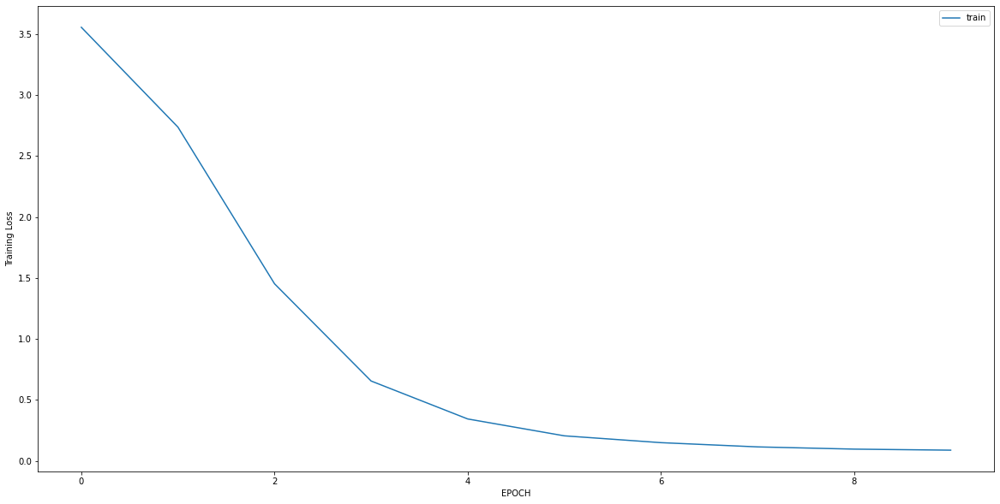

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.9517 - accuracy: 0.5781
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8671 - accuracy: 0.5992
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.8133 - accuracy: 0.6034
Epoch 4/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7072 - accuracy: 0.6287
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6273 - accuracy: 0.6540
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5645 - accuracy: 0.7215
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5180 - accuracy: 0.7173
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4532 - accuracy: 0.7764
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3916 - accuracy: 0.8354
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3549 - accuracy: 0.8397


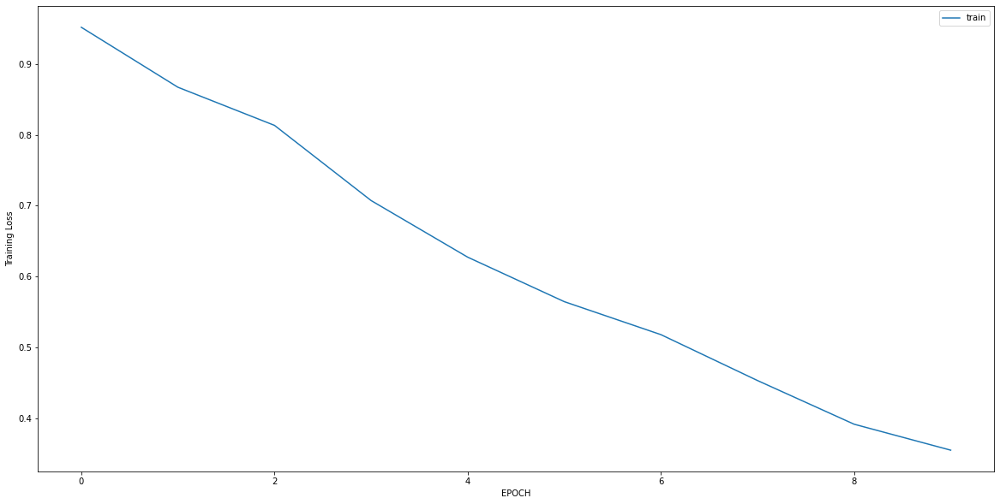

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3371 - accuracy: 0.8905
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3186 - accuracy: 0.8876
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2689 - accuracy: 0.9452
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2020 - accuracy: 0.9683
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1705 - accuracy: 0.9798
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1459 - accuracy: 0.9856
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1357 - accuracy: 0.9914
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1129 - accuracy: 0.9942
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1141 - accuracy: 0.9914
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1076 - accuracy: 0.9914


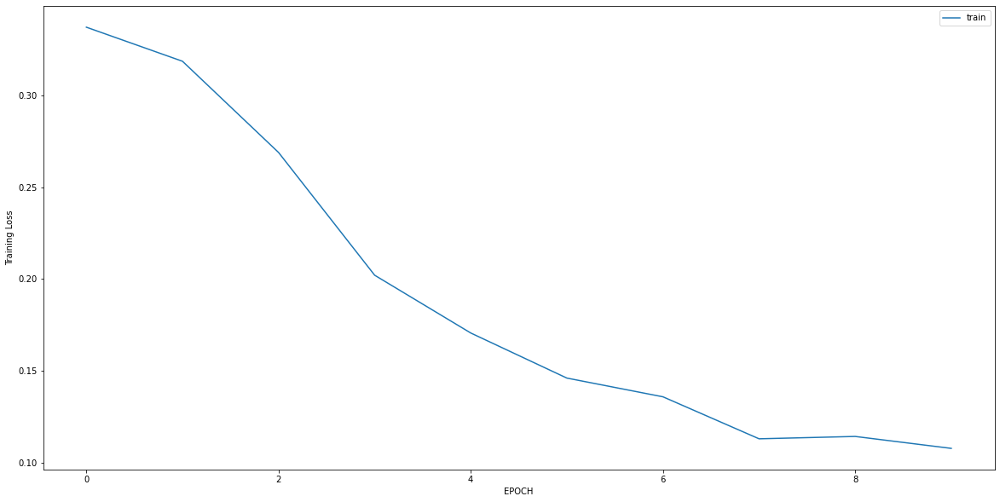

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3797 - accuracy: 0.8354
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2858 - accuracy: 0.8956
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2077 - accuracy: 0.9462
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1864 - accuracy: 0.9525
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1875 - accuracy: 0.9462
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1758 - accuracy: 0.9557
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1723 - accuracy: 0.9494
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1704 - accuracy: 0.9430
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1852 - accuracy: 0.9589
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1668 - accuracy: 0.9684


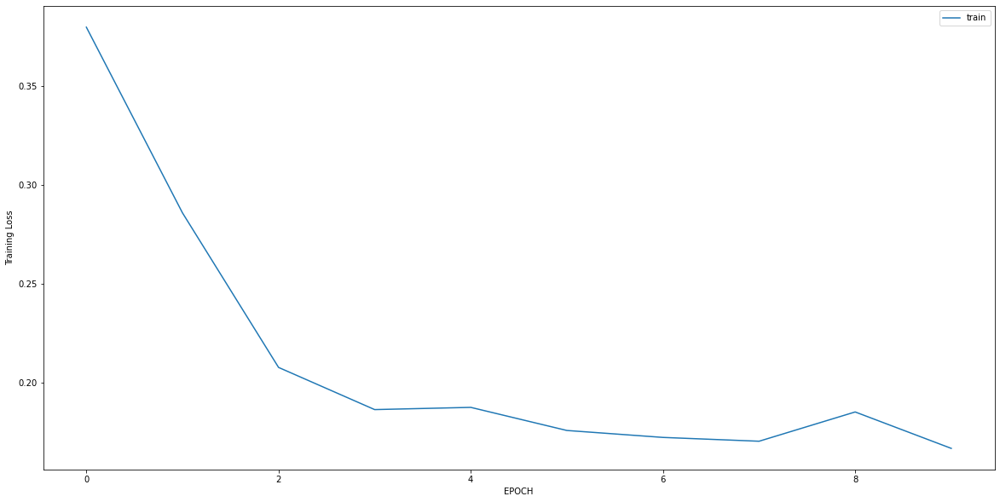

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 0.2377 - accuracy: 0.8849
Epoch 2/10
5/5 [==============================] - 0s 7ms/step - loss: 0.1460 - accuracy: 0.9424
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1448 - accuracy: 0.9640
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1158 - accuracy: 0.9856
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.0999 - accuracy: 0.9856
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.0928 - accuracy: 0.9928
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.0871 - accuracy: 0.9856
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.0807 - accuracy: 0.9928
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.0784 - accuracy: 0.9928
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.0700 - accuracy: 0.9928


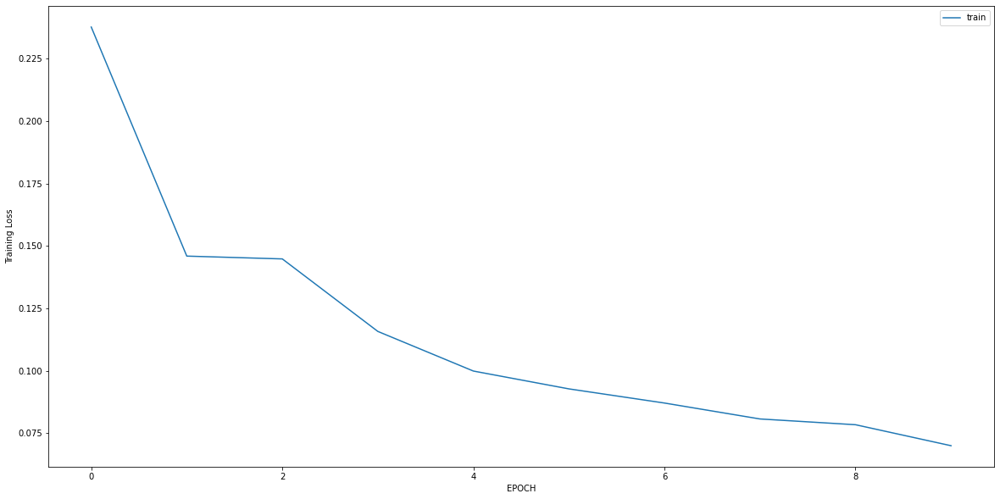

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3390 - accuracy: 0.8929
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2894 - accuracy: 0.9087
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2631 - accuracy: 0.9167
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2513 - accuracy: 0.9167
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2731 - accuracy: 0.9167
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2588 - accuracy: 0.9167
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2578 - accuracy: 0.9167
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2635 - accuracy: 0.9167
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2666 - accuracy: 0.9127
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2541 - accuracy: 0.9127


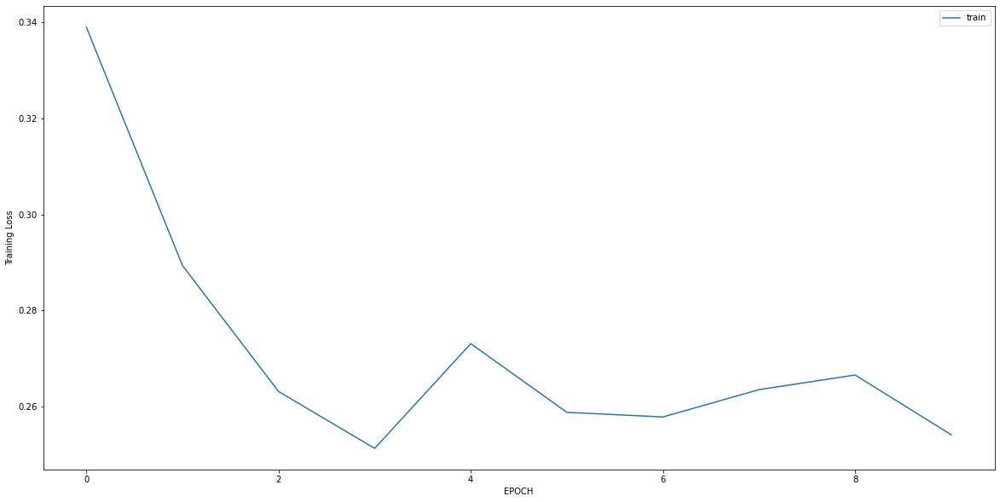

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0975 - accuracy: 0.9843
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0988 - accuracy: 0.9812
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0722 - accuracy: 0.9875
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0766 - accuracy: 0.9875
Epoch 5/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0779 - accuracy: 0.9906
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0622 - accuracy: 0.9906
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0580 - accuracy: 0.9906
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0578 - accuracy: 0.9937
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0695 - accuracy: 0.9906
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0623 - accuracy: 0.9937


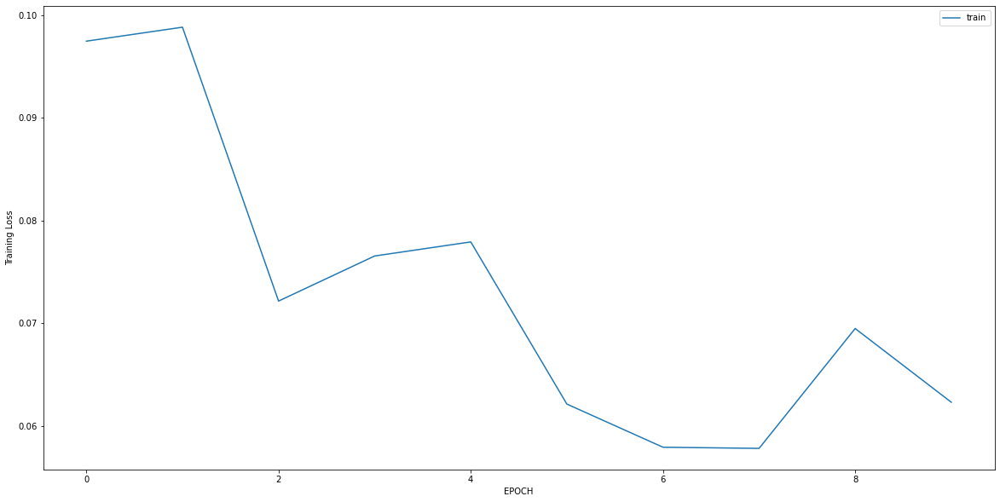

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.9533 - accuracy: 0.6701
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2447 - accuracy: 0.9313
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2525 - accuracy: 0.9210
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2141 - accuracy: 0.9313
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1546 - accuracy: 0.9519
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1722 - accuracy: 0.9313
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2154 - accuracy: 0.8935
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1285 - accuracy: 0.9588
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1376 - accuracy: 0.9553
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1263 - accuracy: 0.9519


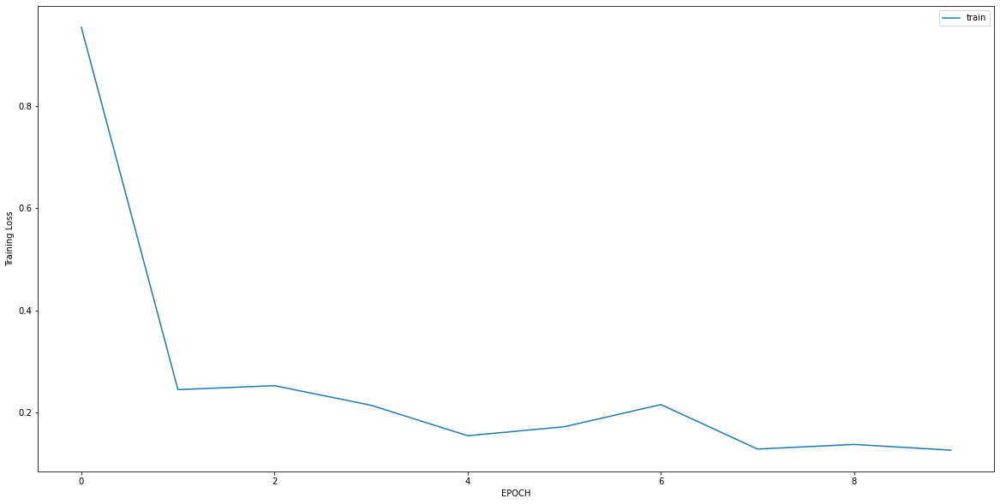

Epoch 1/10
4/4 [==============================] - 0s 5ms/step - loss: 0.9435 - accuracy: 0.6327
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 0.7844 - accuracy: 0.6837
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 0.6617 - accuracy: 0.7347
Epoch 4/10
4/4 [==============================] - 0s 6ms/step - loss: 0.4144 - accuracy: 0.7959
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4176 - accuracy: 0.8367
Epoch 6/10
4/4 [==============================] - 0s 6ms/step - loss: 0.4299 - accuracy: 0.8367
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4026 - accuracy: 0.8469
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4138 - accuracy: 0.8469
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4068 - accuracy: 0.8265
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4336 - accuracy: 0.8367


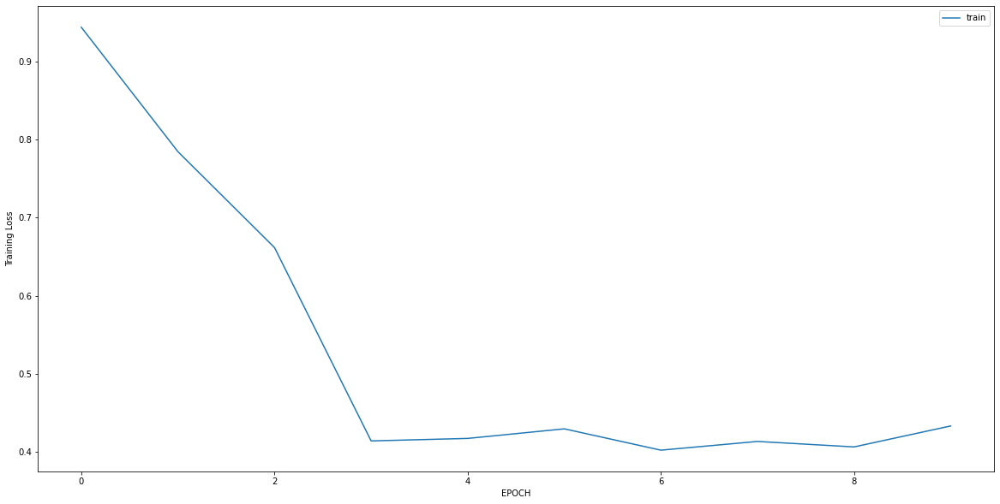

Epoch 1/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9558 - accuracy: 0.4420
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8181 - accuracy: 0.4638
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7748 - accuracy: 0.5000
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7443 - accuracy: 0.4710
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6935 - accuracy: 0.5507
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6435 - accuracy: 0.5870
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6143 - accuracy: 0.6159
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6097 - accuracy: 0.6449
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5724 - accuracy: 0.6667
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5084 - accuracy: 0.7464


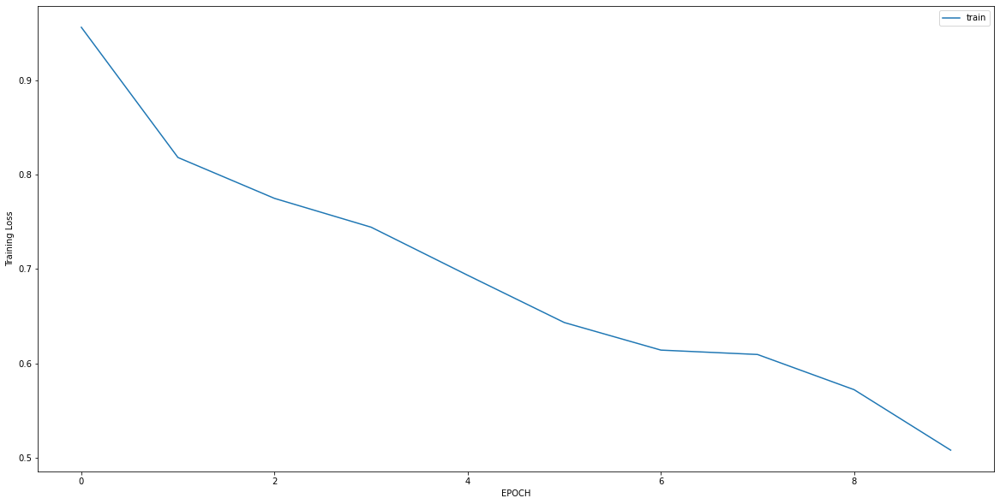

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0934 - accuracy: 0.9668
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0458 - accuracy: 0.9879
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0241 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0172 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0168 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0128 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0095 - accuracy: 1.0000


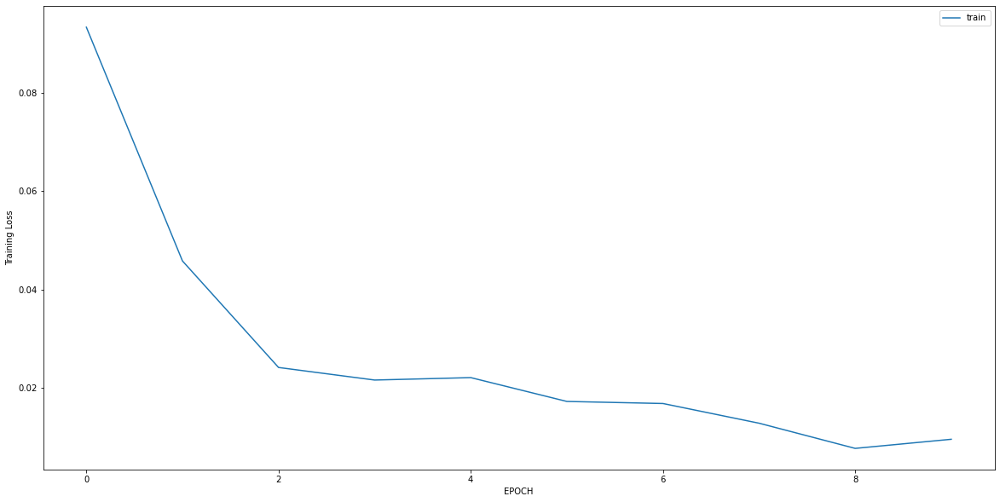

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4710 - accuracy: 0.8059
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4381 - accuracy: 0.8270
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4069 - accuracy: 0.8017
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3599 - accuracy: 0.8481
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2749 - accuracy: 0.9241
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2500 - accuracy: 0.9367
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2054 - accuracy: 0.9409
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2118 - accuracy: 0.9198
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1851 - accuracy: 0.9451
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1462 - accuracy: 0.9620


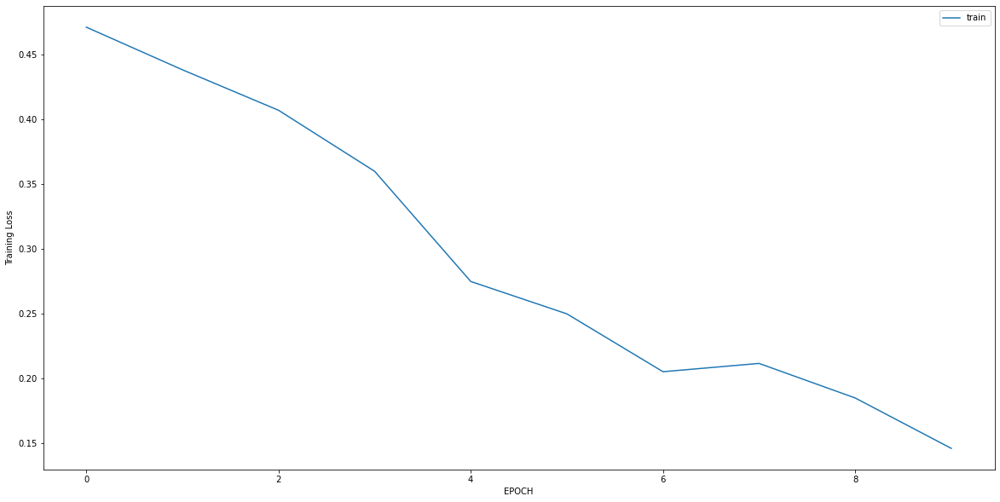

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2879 - accuracy: 0.2222
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5040 - accuracy: 0.8736
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2796 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1802 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1455 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1182 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1033 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0910 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0831 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0761 - accuracy: 1.0000


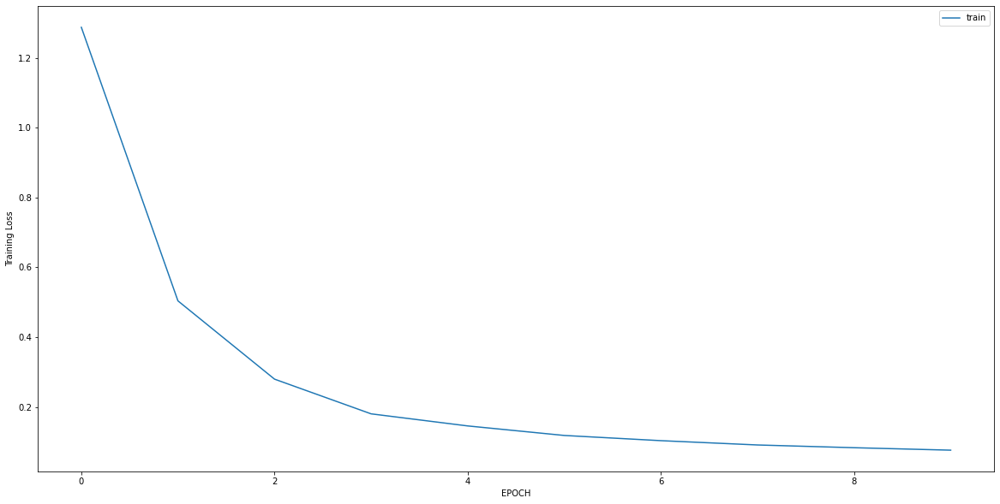

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0072 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0058 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0062 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0052 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0051 - accuracy: 1.0000


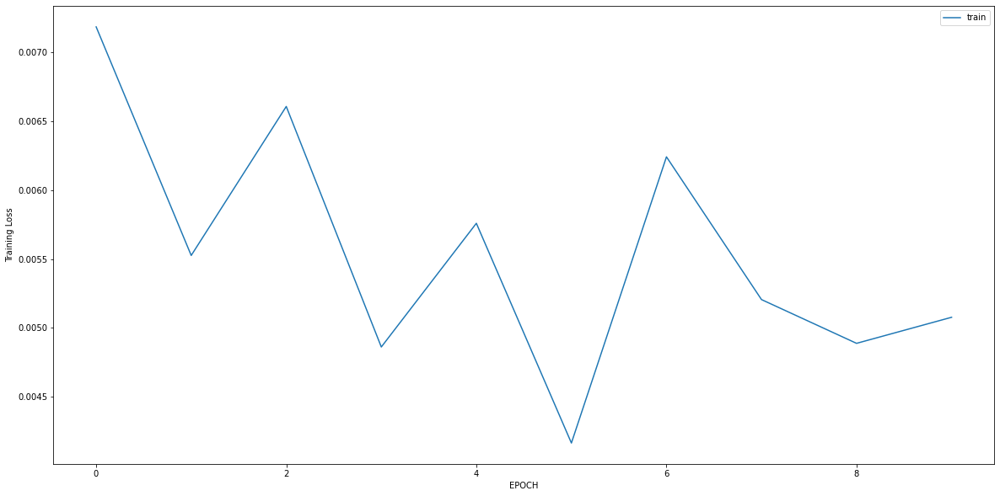

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6539 - accuracy: 0.4772
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.0733 - accuracy: 0.5053
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8954 - accuracy: 0.5193
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6781 - accuracy: 0.6316
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6067 - accuracy: 0.6702
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5627 - accuracy: 0.6912
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4632 - accuracy: 0.7754
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4048 - accuracy: 0.7895
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3702 - accuracy: 0.8491
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3906 - accuracy: 0.8316


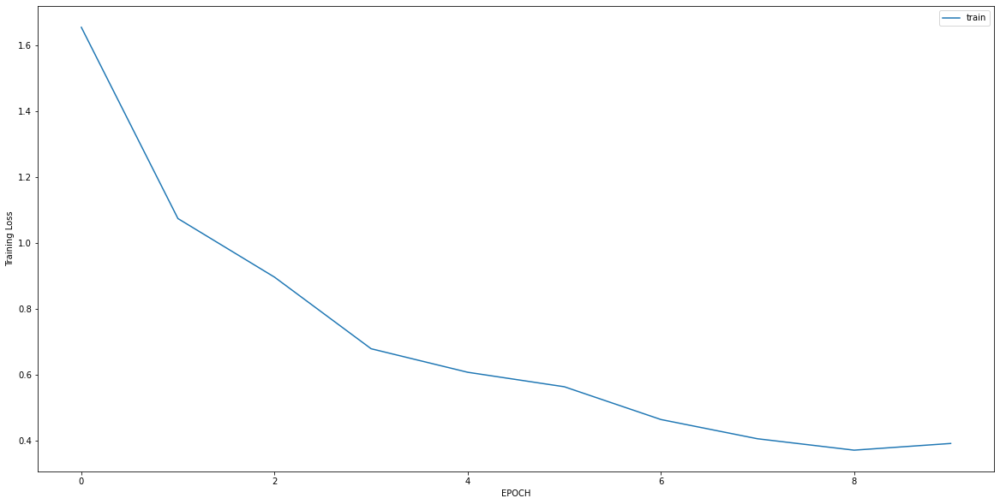

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3325 - accuracy: 0.8715
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1845 - accuracy: 0.9467
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1504 - accuracy: 0.9718
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1113 - accuracy: 0.9843
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1051 - accuracy: 0.9843
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0835 - accuracy: 0.9969
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0849 - accuracy: 0.9875
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0813 - accuracy: 0.9843
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0593 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0634 - accuracy: 0.9969


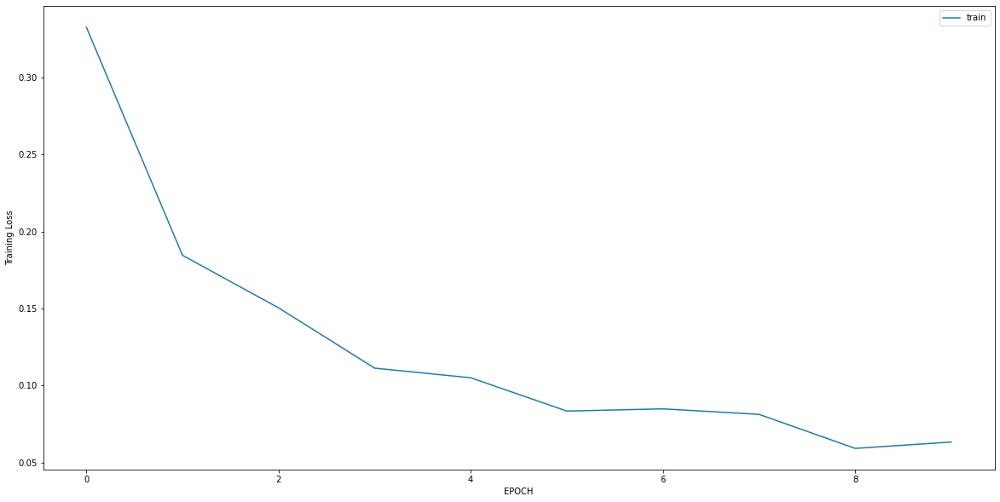

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0216 - accuracy: 0.4329
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2828 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2371 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1869 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1388 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1095 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1010 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0877 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0892 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0798 - accuracy: 1.0000


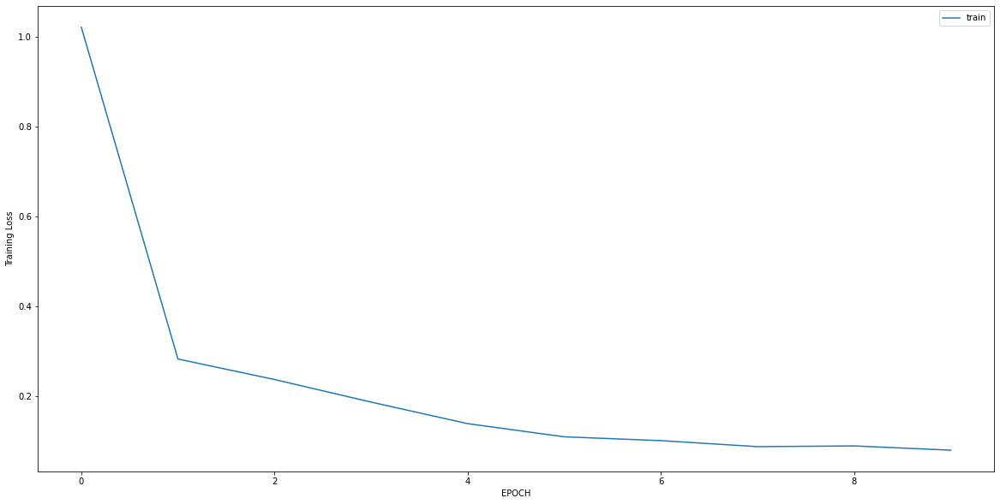

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 0.5920 - accuracy: 0.7217
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3350 - accuracy: 0.8726
Epoch 3/10
7/7 [==============================] - 0s 6ms/step - loss: 0.2978 - accuracy: 0.8868
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.1888 - accuracy: 0.9387
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2118 - accuracy: 0.9151
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2628 - accuracy: 0.9009
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2039 - accuracy: 0.9245
Epoch 8/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1567 - accuracy: 0.9623
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1737 - accuracy: 0.9292
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.1475 - accuracy: 0.9670


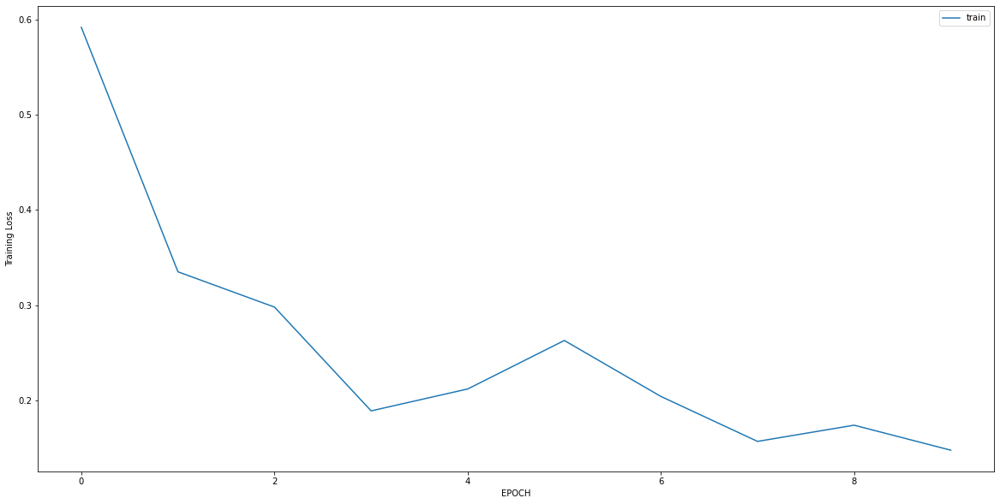

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2601 - accuracy: 0.9025
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2070 - accuracy: 0.9531
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1901 - accuracy: 0.9531
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1694 - accuracy: 0.9639
Epoch 5/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1645 - accuracy: 0.9603
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1498 - accuracy: 0.9747
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1580 - accuracy: 0.9639
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1392 - accuracy: 0.9819
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1502 - accuracy: 0.9747
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1588 - accuracy: 0.9639


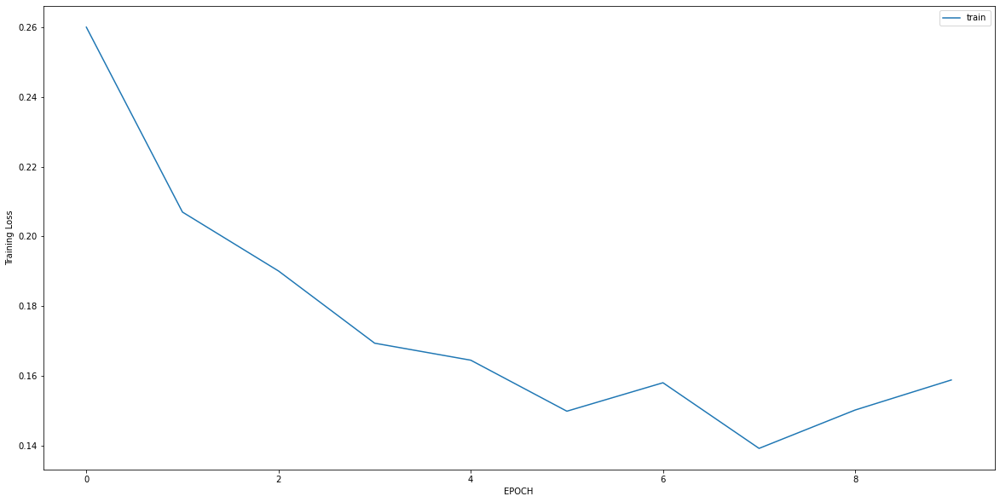

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0827 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0908 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0762 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0757 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0740 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0668 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0638 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0622 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0554 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0539 - accuracy: 1.0000


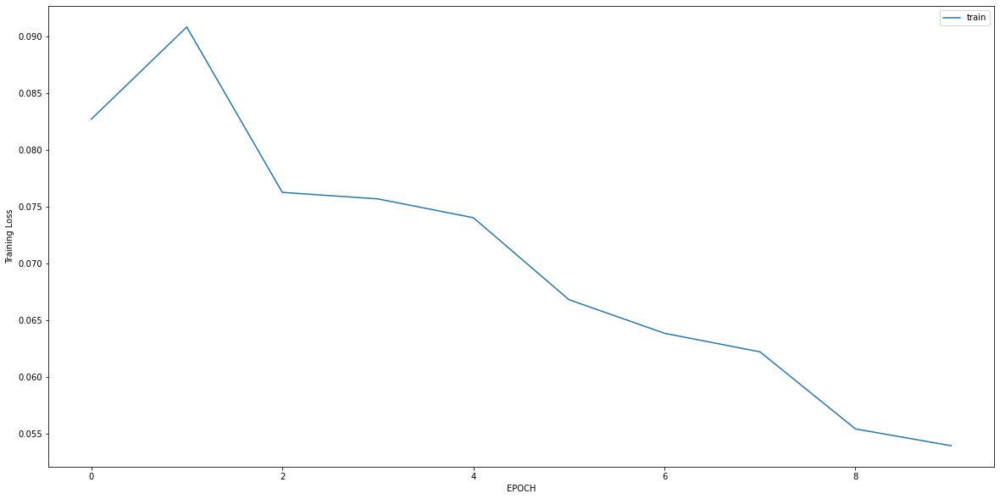

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 1.3792 - accuracy: 0.6284
Epoch 2/10
11/11 [==============================] - 0s 6ms/step - loss: 0.8647 - accuracy: 0.6949
Epoch 3/10
11/11 [==============================] - 0s 6ms/step - loss: 0.4631 - accuracy: 0.8097
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.3005 - accuracy: 0.8882
Epoch 5/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1721 - accuracy: 0.9426
Epoch 6/10
11/11 [==============================] - 0s 7ms/step - loss: 0.1247 - accuracy: 0.9607
Epoch 7/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1694 - accuracy: 0.9366
Epoch 8/10
11/11 [==============================] - 0s 7ms/step - loss: 0.1378 - accuracy: 0.9668
Epoch 9/10
11/11 [==============================] - 0s 6ms/step - loss: 0.2004 - accuracy: 0.9215
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1808 - accuracy: 0.9335


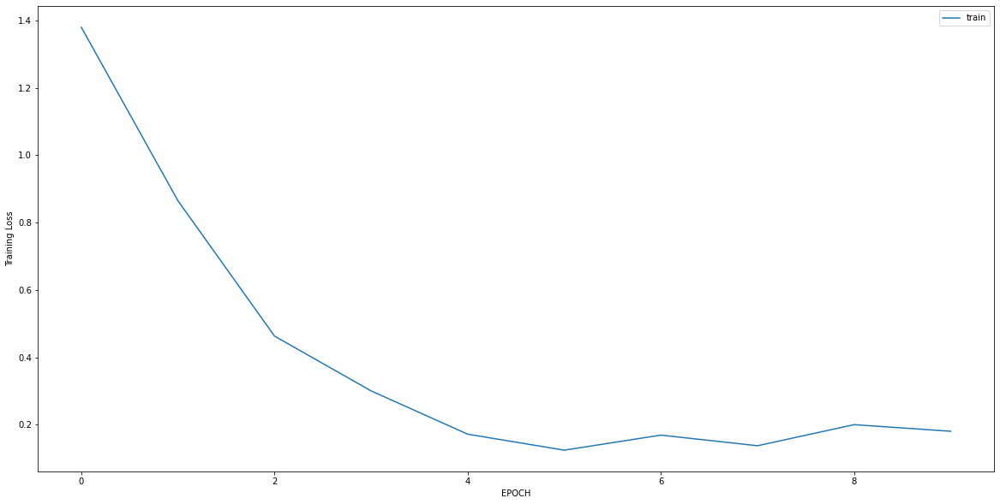

Epoch 1/10
6/6 [==============================] - 0s 6ms/step - loss: 3.5728 - accuracy: 0.0000e+00
Epoch 2/10
6/6 [==============================] - 0s 6ms/step - loss: 2.3409 - accuracy: 0.0167
Epoch 3/10
6/6 [==============================] - 0s 6ms/step - loss: 1.3221 - accuracy: 0.2000
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.7741 - accuracy: 0.5111
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.5275 - accuracy: 0.7111
Epoch 6/10
6/6 [==============================] - 0s 7ms/step - loss: 0.3684 - accuracy: 0.9167
Epoch 7/10
6/6 [==============================] - 0s 7ms/step - loss: 0.2248 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 6ms/step - loss: 0.1409 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 6ms/step - loss: 0.1133 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 6ms/step - loss: 0.0949 - accuracy: 1.0000


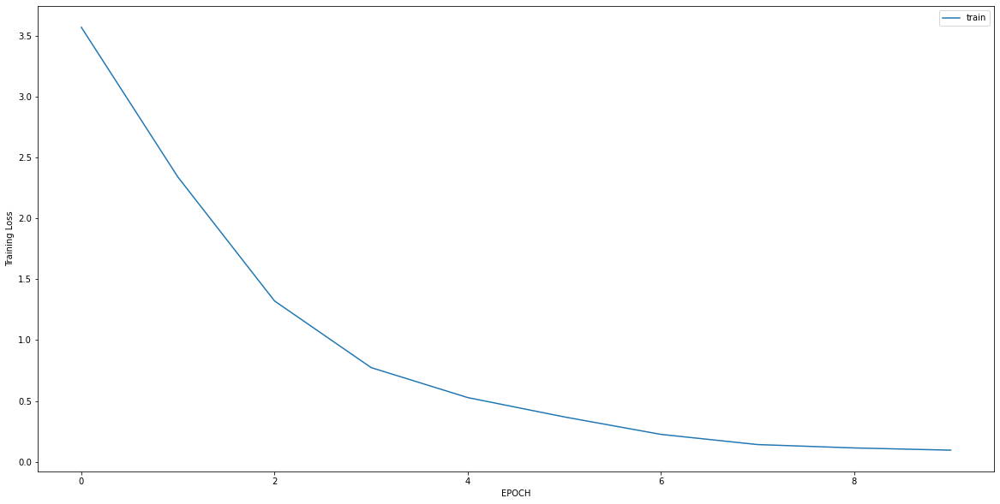

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.6032 - accuracy: 0.6402
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3890 - accuracy: 0.8939
Epoch 3/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2294 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1690 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1304 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 6ms/step - loss: 0.1045 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0941 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0785 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0679 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0602 - accuracy: 1.0000


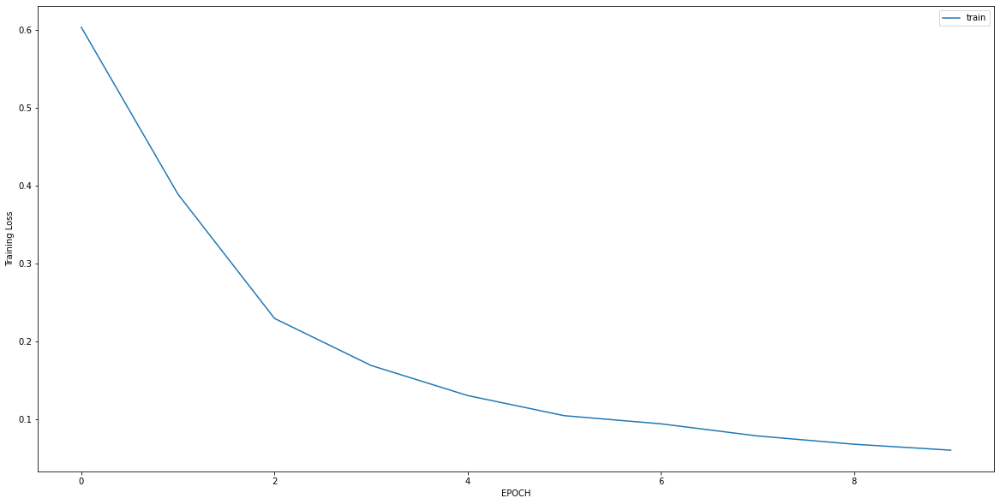

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.8755 - accuracy: 0.3532
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 1.6955 - accuracy: 0.3532
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 1.5085 - accuracy: 0.3532
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 1.2760 - accuracy: 0.3716
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 1.1318 - accuracy: 0.4128
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 1.0628 - accuracy: 0.4037
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9492 - accuracy: 0.4037
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7901 - accuracy: 0.5780
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7306 - accuracy: 0.5413
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7169 - accuracy: 0.5596


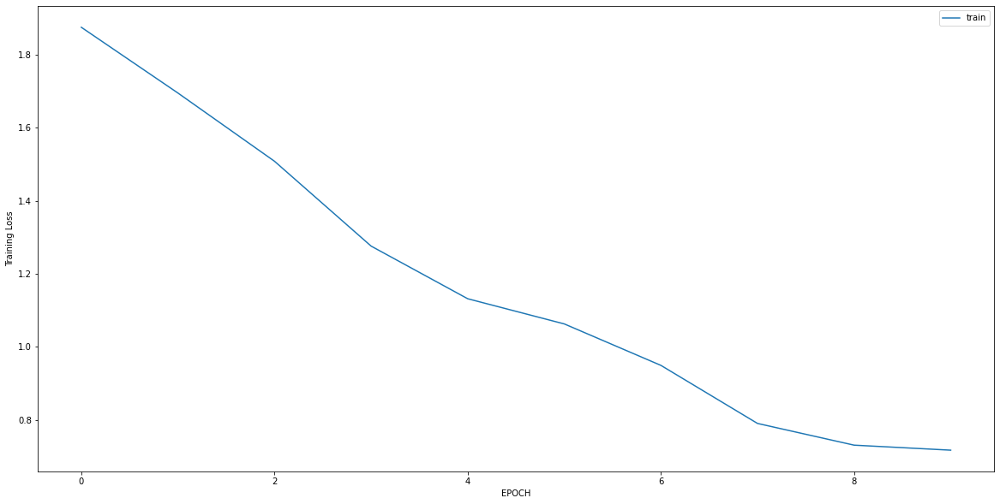

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.8107 - accuracy: 0.4604
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7410 - accuracy: 0.5612
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7763 - accuracy: 0.4820
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6822 - accuracy: 0.5899
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6503 - accuracy: 0.6187
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6877 - accuracy: 0.5683
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6490 - accuracy: 0.5971
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6450 - accuracy: 0.5899
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6265 - accuracy: 0.6691
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5747 - accuracy: 0.6906


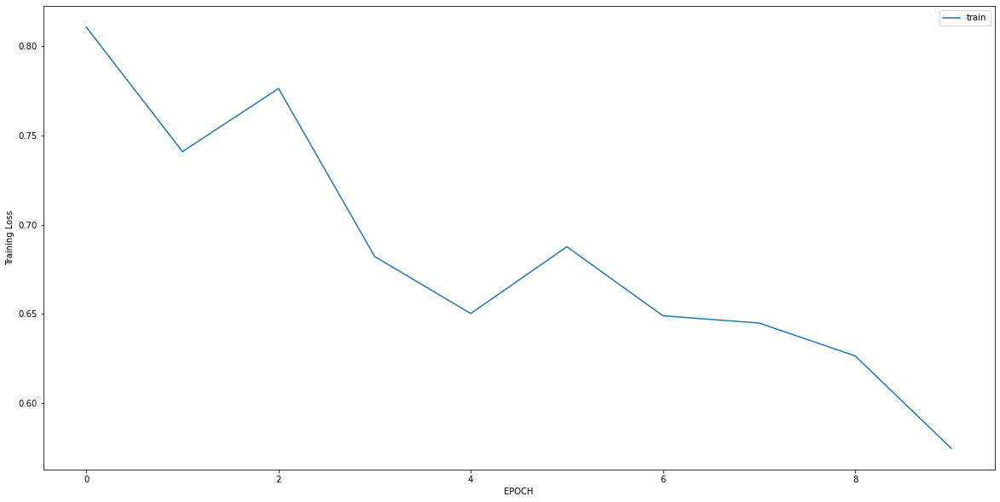

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.5202 - accuracy: 0.7664
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2990 - accuracy: 0.9967
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2146 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1688 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1456 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1288 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1181 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1095 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1012 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0954 - accuracy: 1.0000


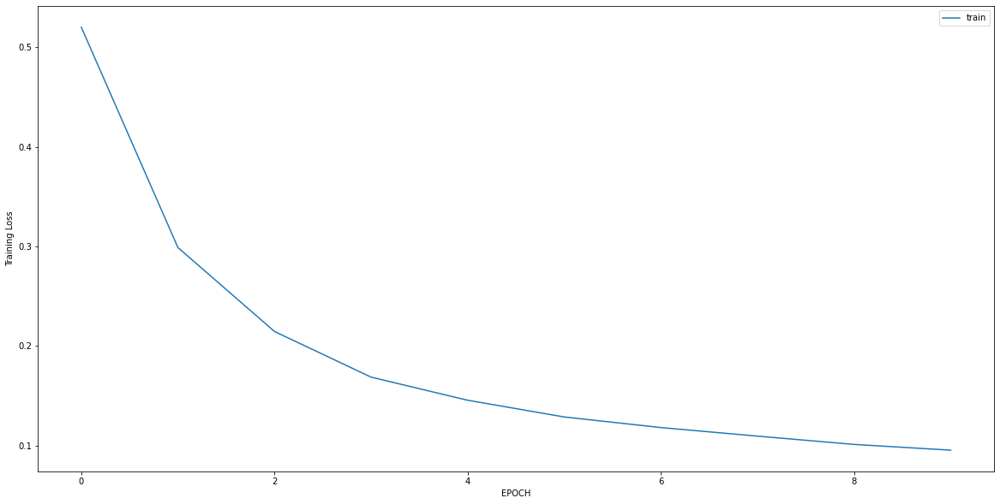

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4526 - accuracy: 0.7978
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3628 - accuracy: 0.8529
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3389 - accuracy: 0.8824
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2961 - accuracy: 0.8934
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2363 - accuracy: 0.9007
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2033 - accuracy: 0.9412
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1879 - accuracy: 0.9412
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1423 - accuracy: 0.9522
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1357 - accuracy: 0.9559
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1245 - accuracy: 0.9743


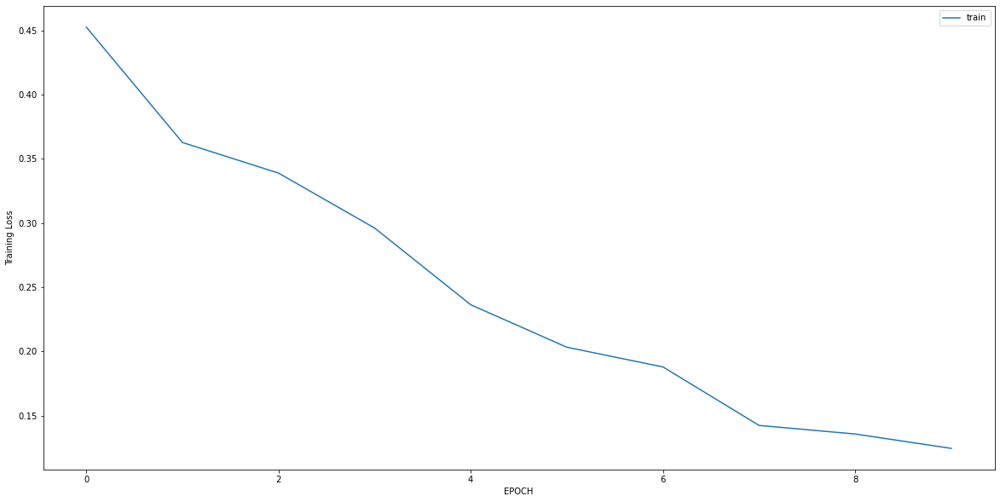

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3861 - accuracy: 0.8571
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3185 - accuracy: 0.8889
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2900 - accuracy: 0.9206
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2833 - accuracy: 0.9206
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2755 - accuracy: 0.9206
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2554 - accuracy: 0.9127
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2584 - accuracy: 0.9325
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2659 - accuracy: 0.9286
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2629 - accuracy: 0.9206
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2342 - accuracy: 0.9405


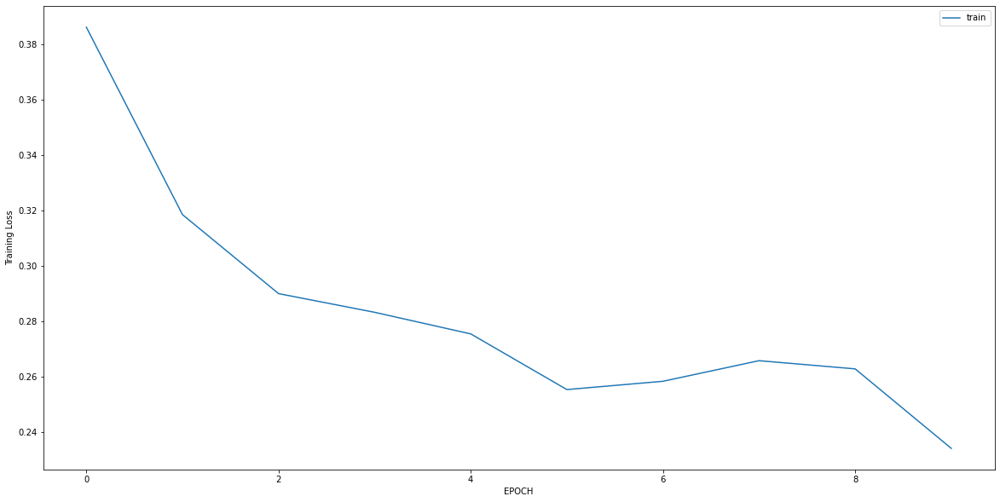

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6294 - accuracy: 0.4067
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7703 - accuracy: 0.5970
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3393 - accuracy: 0.8806
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3647 - accuracy: 0.8843
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3331 - accuracy: 0.8769
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3066 - accuracy: 0.8993
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2807 - accuracy: 0.9216
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2891 - accuracy: 0.9142
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2588 - accuracy: 0.9328
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2687 - accuracy: 0.9291


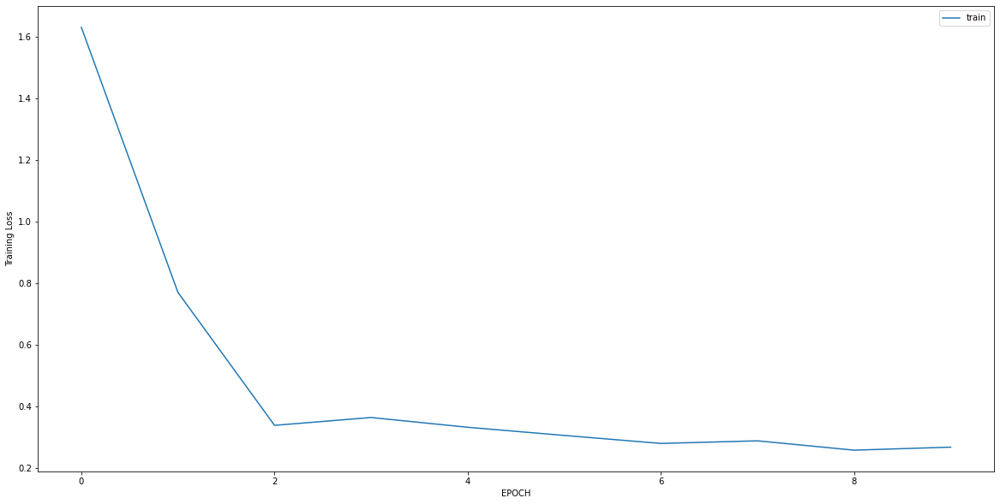

Epoch 1/10
18/18 [==============================] - 0s 4ms/step - loss: 0.6336 - accuracy: 0.7258
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0183 - accuracy: 1.0000
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0107 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0087 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0065 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0055 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0057 - accuracy: 1.0000


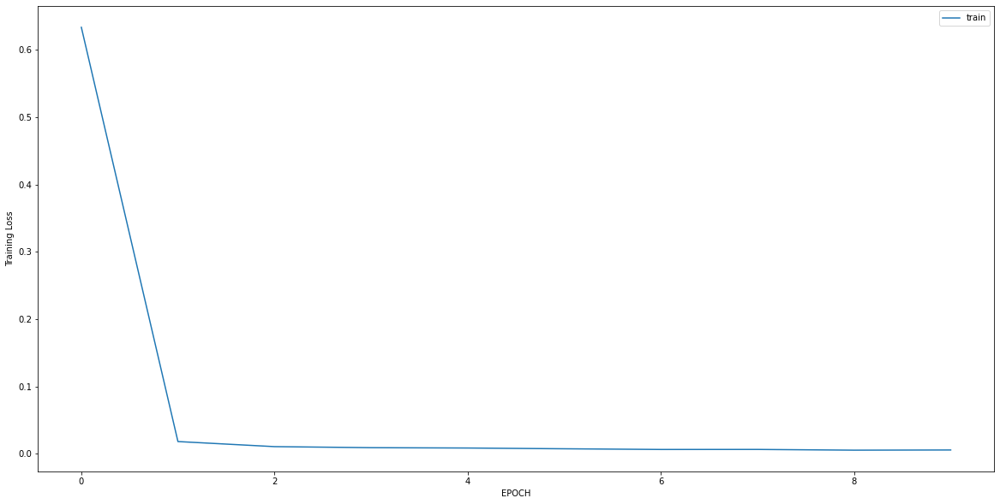

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 2.1754 - accuracy: 0.5951
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.6661 - accuracy: 0.5992
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9580 - accuracy: 0.6194
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7918 - accuracy: 0.6113
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6663 - accuracy: 0.5830
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6292 - accuracy: 0.6964
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5650 - accuracy: 0.7085
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4967 - accuracy: 0.7409
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4966 - accuracy: 0.7409
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4351 - accuracy: 0.8057


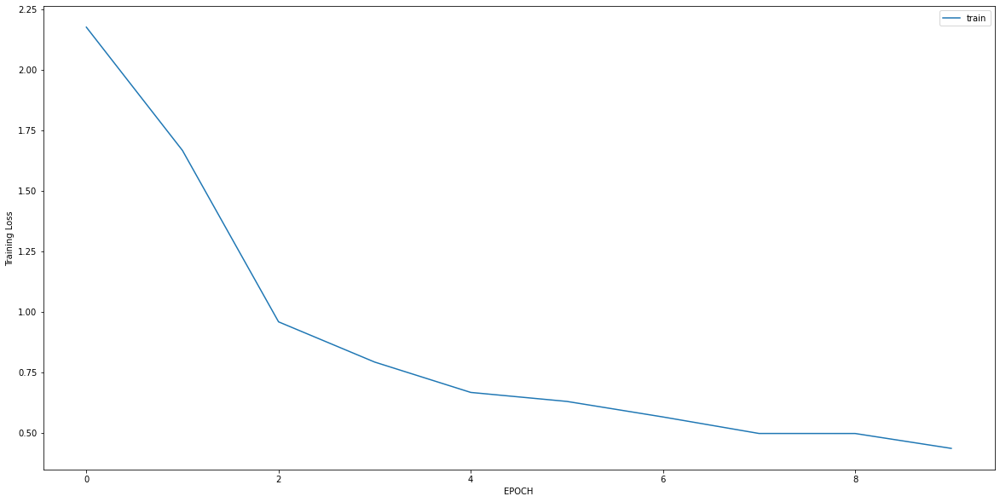

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.8430 - accuracy: 0.4611
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1352 - accuracy: 0.9907
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0673 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0334 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0256 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0243 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0211 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0191 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0200 - accuracy: 1.0000


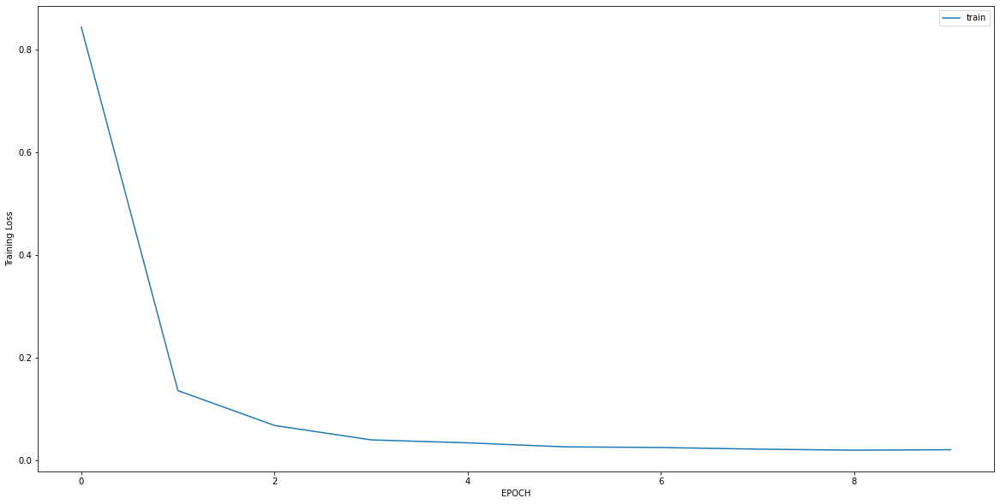

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7867 - accuracy: 0.7668
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6130 - accuracy: 0.7866
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5641 - accuracy: 0.8103
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5035 - accuracy: 0.8024
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4931 - accuracy: 0.7984
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5144 - accuracy: 0.7945
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4643 - accuracy: 0.7747
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4031 - accuracy: 0.8221
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4404 - accuracy: 0.7945
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4023 - accuracy: 0.8063


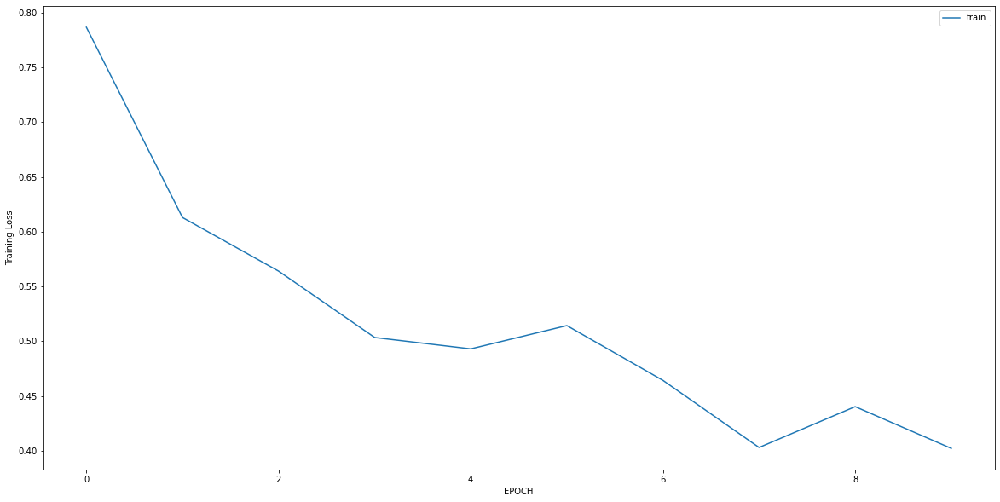

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.5731 - accuracy: 0.7517
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4195 - accuracy: 0.8097
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3004 - accuracy: 0.8608
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2577 - accuracy: 0.9165
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2469 - accuracy: 0.9049
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2089 - accuracy: 0.9466
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2064 - accuracy: 0.9234
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1602 - accuracy: 0.9791
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1810 - accuracy: 0.9350
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1659 - accuracy: 0.9582


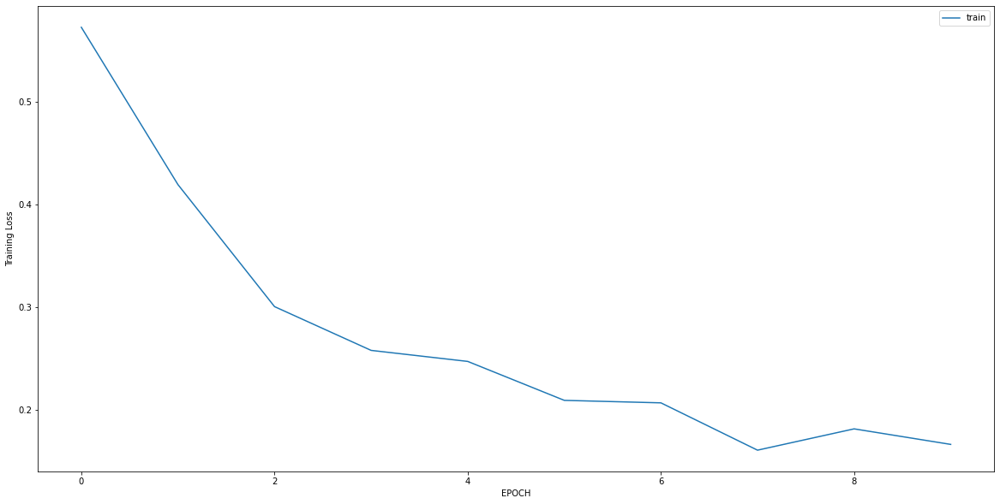

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1919 - accuracy: 0.9340
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2192 - accuracy: 0.9277
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1985 - accuracy: 0.9371
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1385 - accuracy: 0.9748
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1340 - accuracy: 0.9906
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1192 - accuracy: 0.9748
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1158 - accuracy: 0.9906
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1077 - accuracy: 0.9906
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0948 - accuracy: 0.9969
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0939 - accuracy: 0.9937


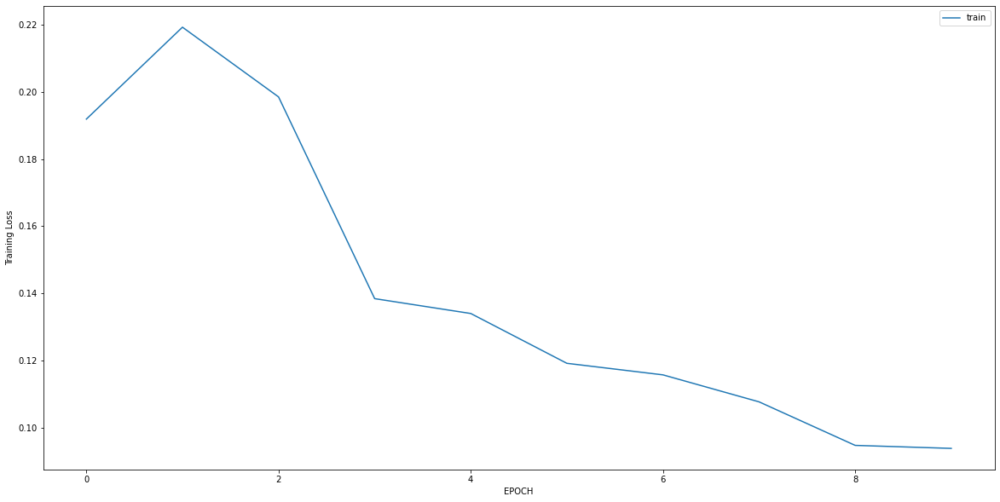

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.7970 - accuracy: 0.4564
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3016 - accuracy: 0.4739
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7975 - accuracy: 0.5087
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5397 - accuracy: 0.6934
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4246 - accuracy: 0.8606
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3826 - accuracy: 0.8502
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3123 - accuracy: 0.8815
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2806 - accuracy: 0.9059
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2767 - accuracy: 0.9059
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2539 - accuracy: 0.9233


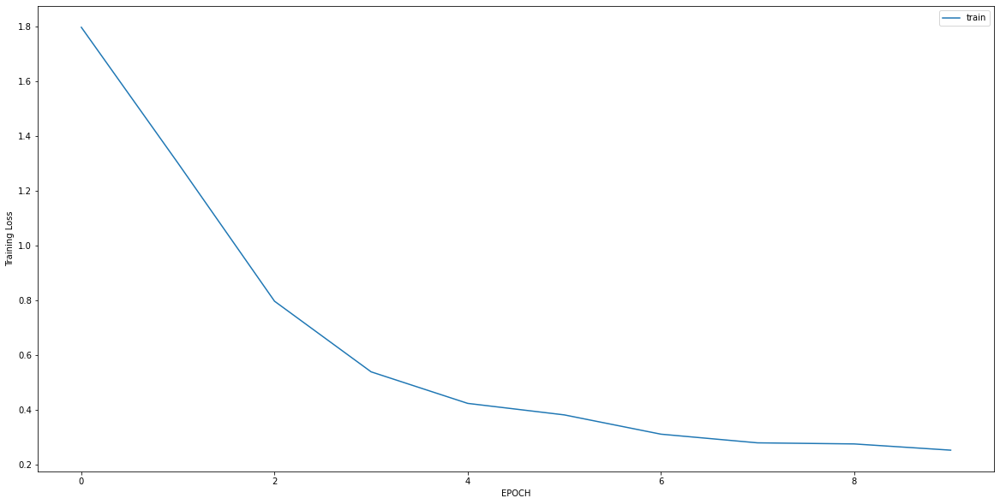

Epoch 1/10
2/2 [==============================] - 0s 11ms/step - loss: 1.1820 - accuracy: 0.1429
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 1.1312 - accuracy: 0.1071
Epoch 3/10
2/2 [==============================] - 0s 8ms/step - loss: 0.9765 - accuracy: 0.2857
Epoch 4/10
2/2 [==============================] - 0s 7ms/step - loss: 0.7674 - accuracy: 0.5000
Epoch 5/10
2/2 [==============================] - 0s 6ms/step - loss: 0.6151 - accuracy: 0.6429
Epoch 6/10
2/2 [==============================] - 0s 7ms/step - loss: 0.5345 - accuracy: 0.7857
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 0.4831 - accuracy: 0.7857
Epoch 8/10
2/2 [==============================] - 0s 8ms/step - loss: 0.4131 - accuracy: 0.9464
Epoch 9/10
2/2 [==============================] - 0s 6ms/step - loss: 0.3367 - accuracy: 0.9821
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 0.3367 - accuracy: 0.9643


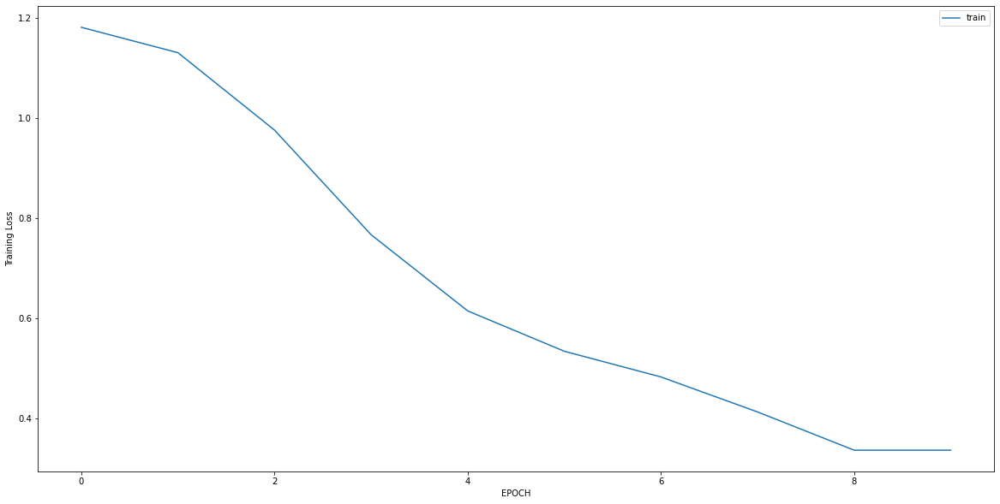

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4073 - accuracy: 0.8101
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3788 - accuracy: 0.8143
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3309 - accuracy: 0.8354
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3152 - accuracy: 0.8312
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2680 - accuracy: 0.8481
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2231 - accuracy: 0.8987
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1967 - accuracy: 0.9072
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1667 - accuracy: 0.9241
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1592 - accuracy: 0.9198
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1319 - accuracy: 0.9536


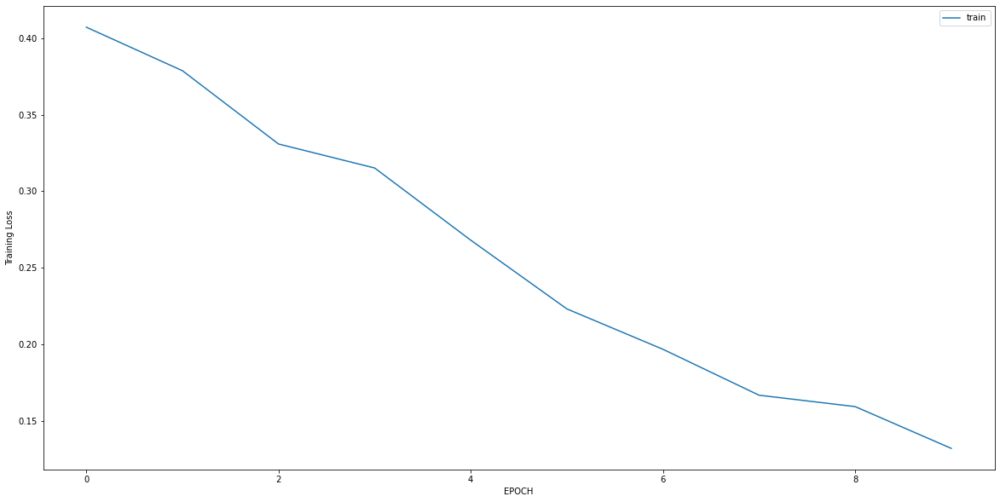

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8972 - accuracy: 0.4281
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4237 - accuracy: 0.9169
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2751 - accuracy: 0.9936
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2084 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1622 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1350 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1155 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1010 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0947 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0866 - accuracy: 1.0000


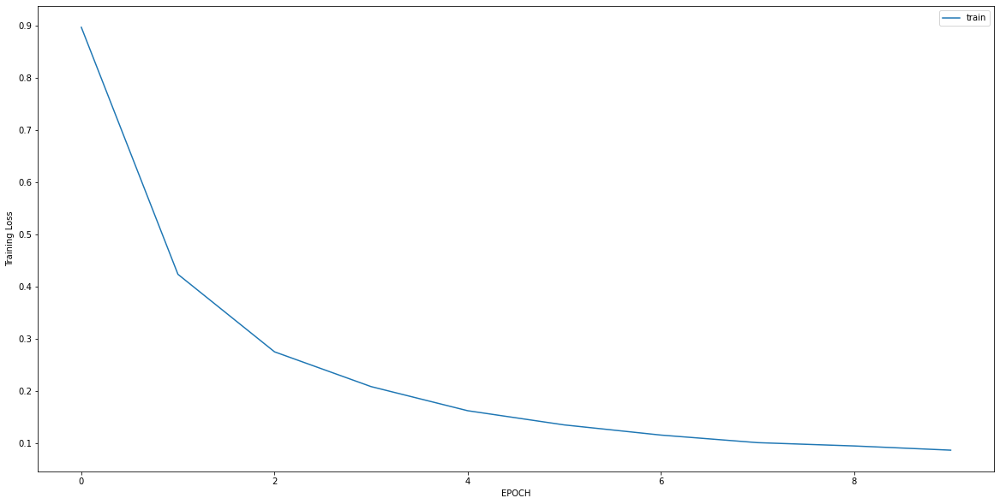

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9175 - accuracy: 0.6241
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8159 - accuracy: 0.6586
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6941 - accuracy: 0.7103
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5507 - accuracy: 0.7138
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4649 - accuracy: 0.7621
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3831 - accuracy: 0.8103
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3208 - accuracy: 0.8241
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2377 - accuracy: 0.8759
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2343 - accuracy: 0.9138
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2747 - accuracy: 0.9138


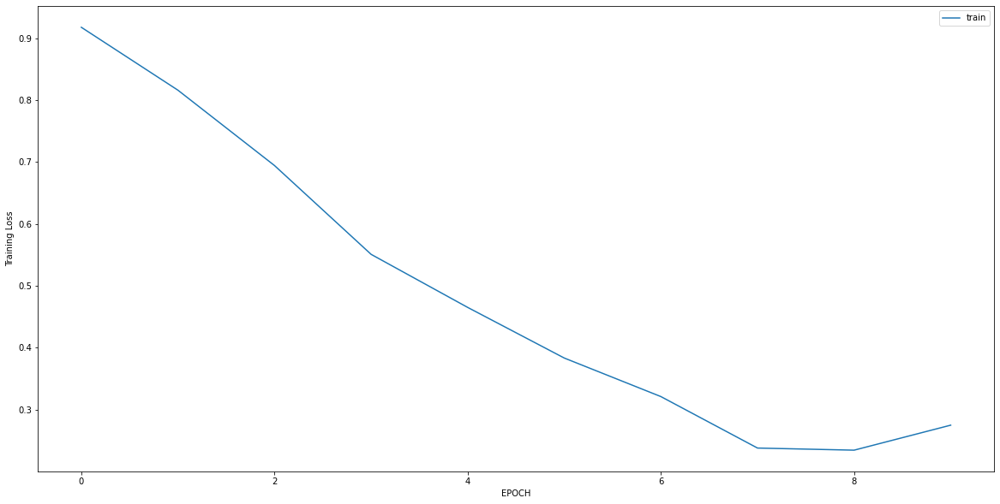

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2874 - accuracy: 0.8986
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3020 - accuracy: 0.9021
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2621 - accuracy: 0.9266
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2796 - accuracy: 0.9161
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2537 - accuracy: 0.9266
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2466 - accuracy: 0.9231
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2449 - accuracy: 0.9126
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2436 - accuracy: 0.9161
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2361 - accuracy: 0.9266
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2351 - accuracy: 0.9301


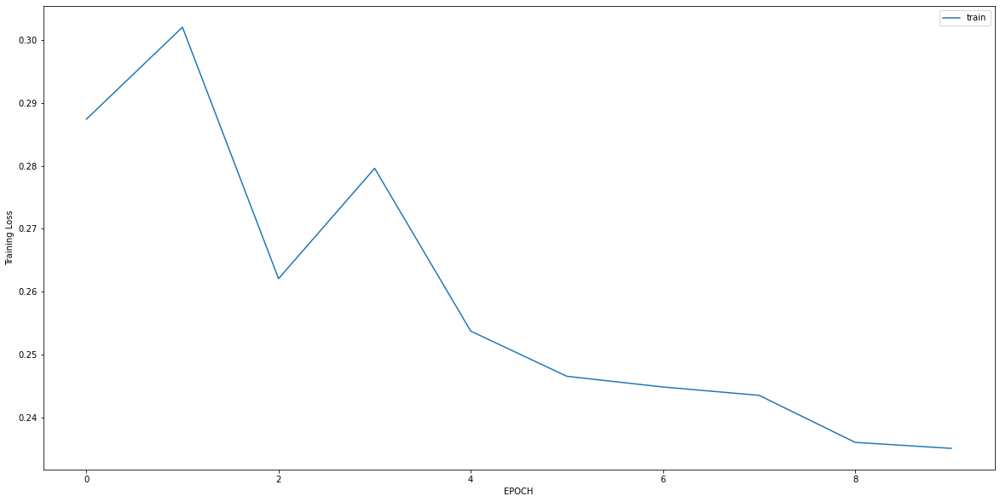

Epoch 1/10
5/5 [==============================] - 0s 8ms/step - loss: 0.9607 - accuracy: 0.7222
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.9111 - accuracy: 0.7153
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 0.8802 - accuracy: 0.7014
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7283 - accuracy: 0.7083
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5498 - accuracy: 0.7361
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4757 - accuracy: 0.7500
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4244 - accuracy: 0.7708
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4014 - accuracy: 0.8403
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3753 - accuracy: 0.8403
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.3753 - accuracy: 0.8194


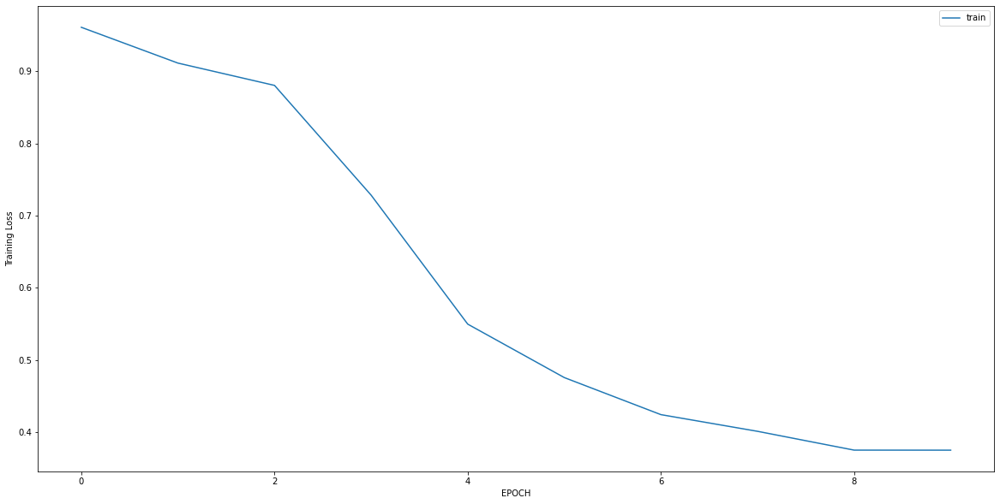

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.7462 - accuracy: 0.4703
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 1.3968 - accuracy: 0.4661
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8302 - accuracy: 0.5127
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5757 - accuracy: 0.6864
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4768 - accuracy: 0.7924
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3945 - accuracy: 0.8729
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3192 - accuracy: 0.8814
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3169 - accuracy: 0.9025
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2956 - accuracy: 0.9322
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2673 - accuracy: 0.9407


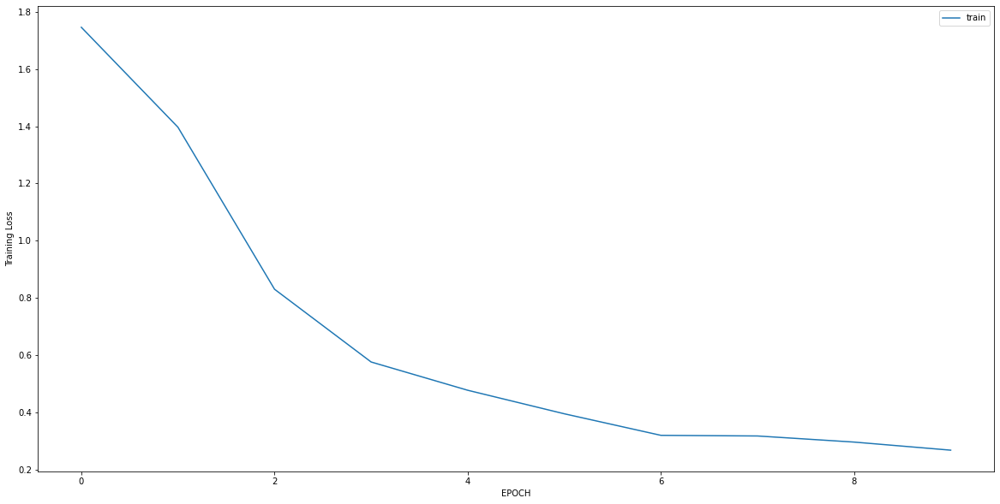

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0959 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0721 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0610 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0486 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0305 - accuracy: 1.0000


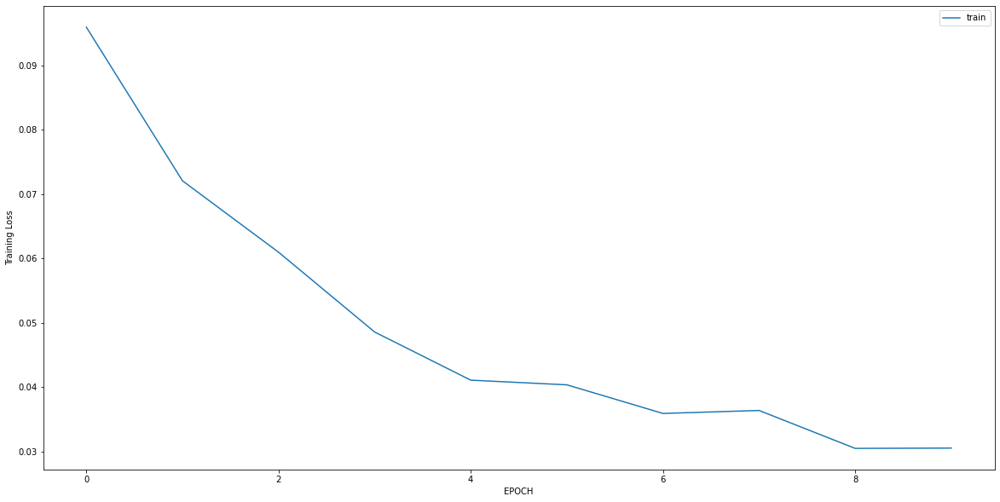

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.6419 - accuracy: 0.6468
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0309 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0281 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0173 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0185 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0203 - accuracy: 1.0000


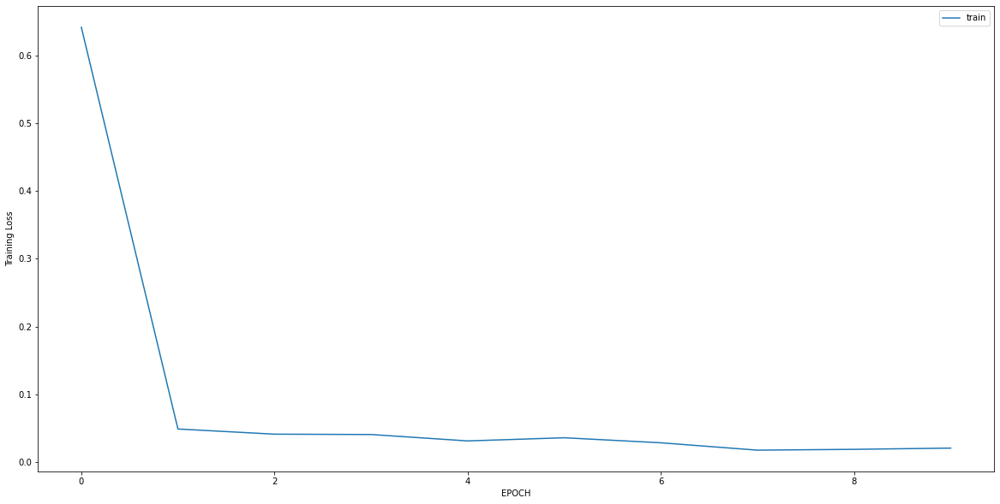

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 1.1088 - accuracy: 0.6358
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8213 - accuracy: 0.7252
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5433 - accuracy: 0.8113
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3426 - accuracy: 0.8642
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3501 - accuracy: 0.8775
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3327 - accuracy: 0.8709
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3199 - accuracy: 0.8775
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2955 - accuracy: 0.9073
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2614 - accuracy: 0.9338
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2318 - accuracy: 0.9205


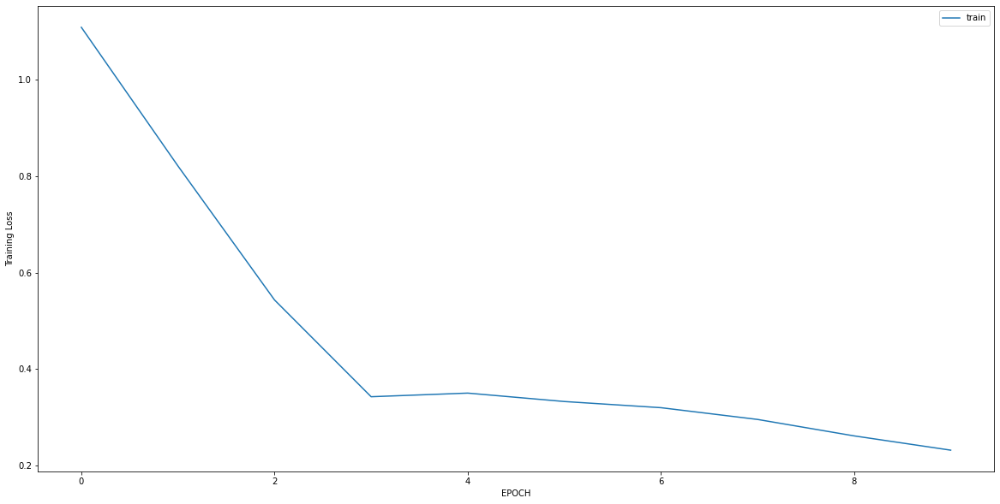

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5540 - accuracy: 0.8275
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4218 - accuracy: 0.8471
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3338 - accuracy: 0.8510
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2983 - accuracy: 0.8784
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2445 - accuracy: 0.9098
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2075 - accuracy: 0.9333
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2122 - accuracy: 0.9451
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2006 - accuracy: 0.9373
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2018 - accuracy: 0.9333
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2737 - accuracy: 0.9137


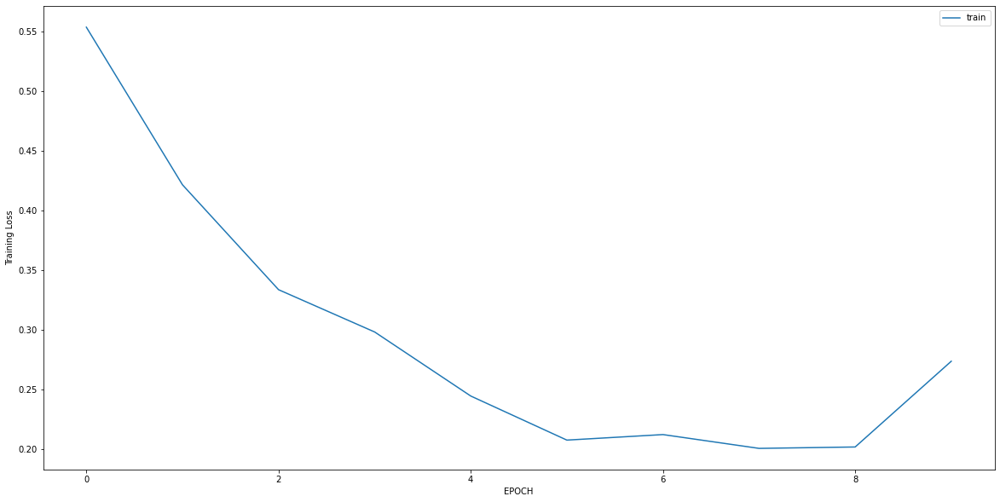

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2028 - accuracy: 0.9347
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1555 - accuracy: 0.9622
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1324 - accuracy: 0.9863
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1452 - accuracy: 0.9656
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1116 - accuracy: 0.9725
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0976 - accuracy: 0.9897
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1007 - accuracy: 0.9897
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0944 - accuracy: 0.9863
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1247 - accuracy: 0.9553
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1385 - accuracy: 0.9519


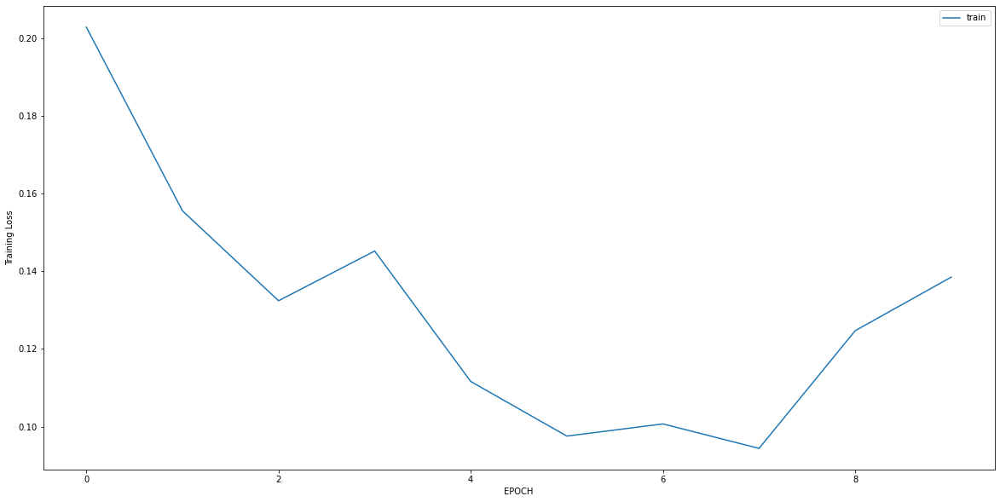

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1388 - accuracy: 0.9426
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1505 - accuracy: 0.9467
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1167 - accuracy: 0.9795
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1288 - accuracy: 0.9508
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1150 - accuracy: 0.9631
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1101 - accuracy: 0.9590
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1096 - accuracy: 0.9590
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1229 - accuracy: 0.9549
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1075 - accuracy: 0.9713
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0977 - accuracy: 0.9672


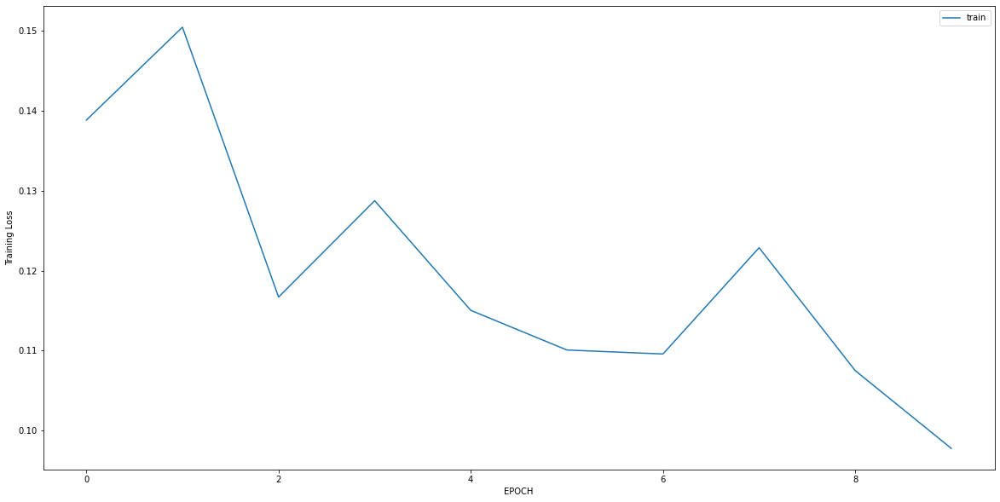

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4161 - accuracy: 0.8630
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3301 - accuracy: 0.8778
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2995 - accuracy: 0.8852
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2610 - accuracy: 0.9111
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2435 - accuracy: 0.9148
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1569 - accuracy: 0.9444
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1331 - accuracy: 0.9815
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1511 - accuracy: 0.9519
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2088 - accuracy: 0.9222
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1938 - accuracy: 0.9370


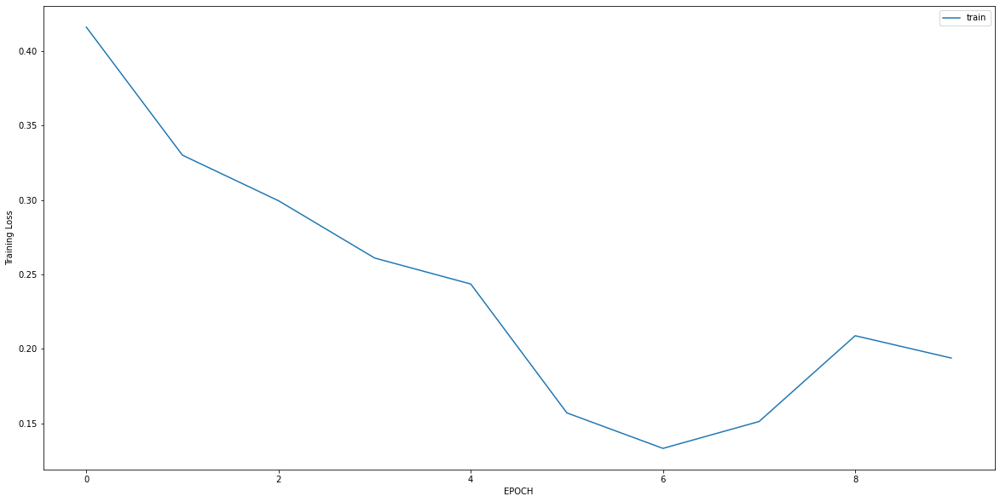

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4099 - accuracy: 0.8240
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3638 - accuracy: 0.8539
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3315 - accuracy: 0.8577
Epoch 4/10
9/9 [==============================] - ETA: 0s - loss: 0.2598 - accuracy: 0.93 - 0s 5ms/step - loss: 0.3559 - accuracy: 0.8727
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3317 - accuracy: 0.8689
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3500 - accuracy: 0.8577
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2792 - accuracy: 0.9176
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2787 - accuracy: 0.8801
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2649 - accuracy: 0.8989
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2483 - accuracy: 0.90

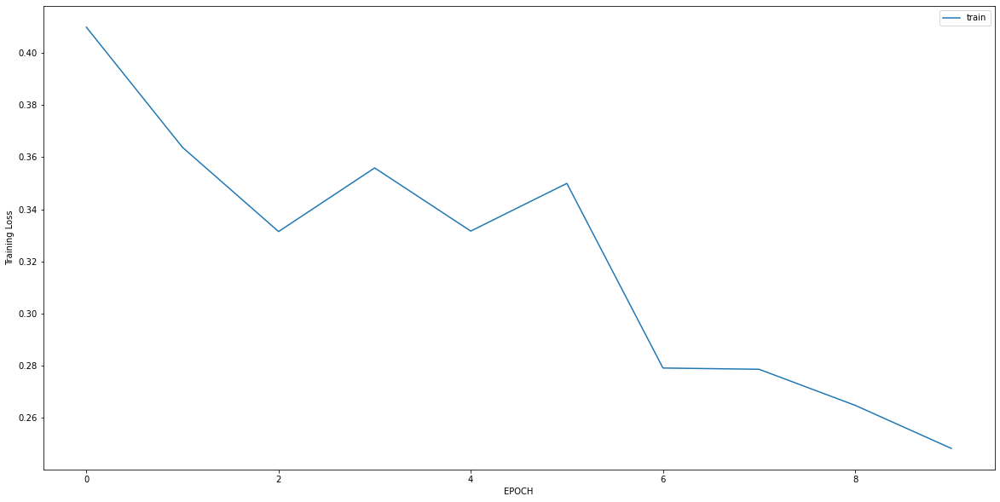

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3511 - accuracy: 0.8453
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3334 - accuracy: 0.8566
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2578 - accuracy: 0.8981
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1631 - accuracy: 0.9321
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1483 - accuracy: 0.9509
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1656 - accuracy: 0.9245
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1942 - accuracy: 0.9283
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2218 - accuracy: 0.9283
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1500 - accuracy: 0.9434
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1488 - accuracy: 0.9434


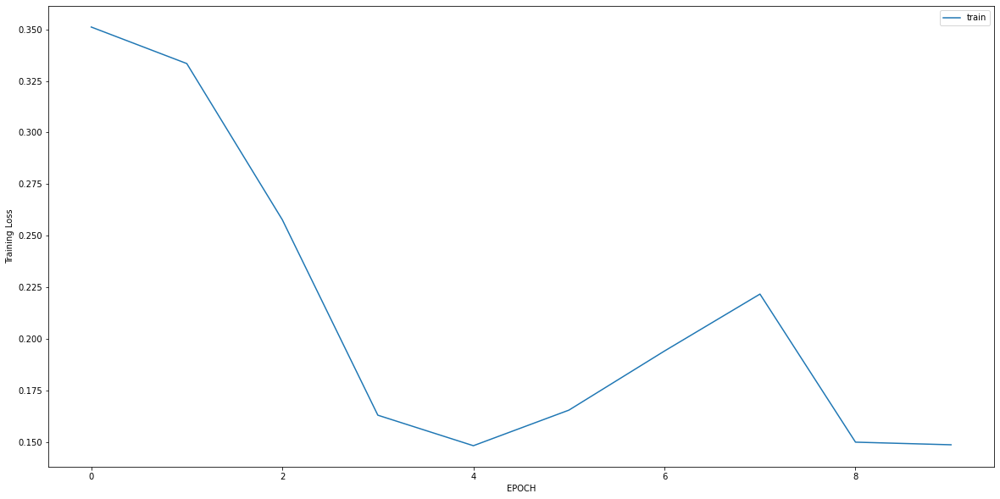

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.4124 - accuracy: 0.5441
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1007 - accuracy: 0.9962
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0562 - accuracy: 0.9962
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0272 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0290 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0250 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0230 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0185 - accuracy: 1.0000


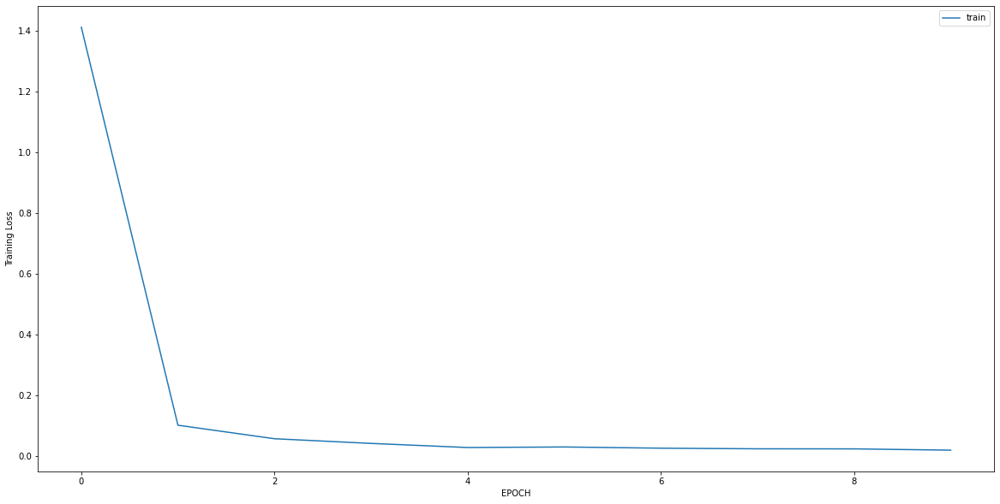

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.8582 - accuracy: 0.4763
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.8867 - accuracy: 0.6501
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.5188 - accuracy: 0.8104
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3825 - accuracy: 0.8488
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3098 - accuracy: 0.8804
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2737 - accuracy: 0.8894
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2305 - accuracy: 0.8984
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1899 - accuracy: 0.9187
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1605 - accuracy: 0.9120
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1503 - accuracy: 0.9300


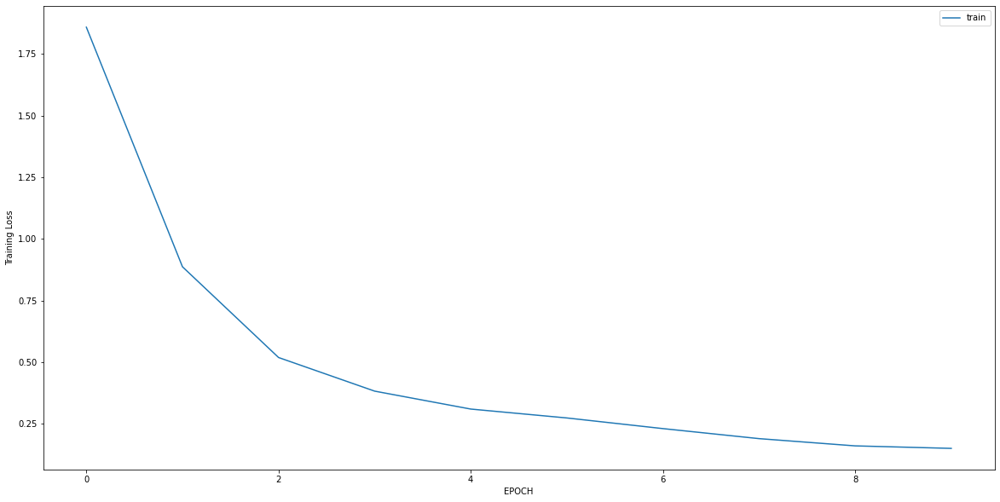

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 1.1761 - accuracy: 0.6364
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3368 - accuracy: 0.8822
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3885 - accuracy: 0.8721
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3006 - accuracy: 0.9057
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2062 - accuracy: 0.9327
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1856 - accuracy: 0.9495
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1944 - accuracy: 0.9428
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1803 - accuracy: 0.9461
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1745 - accuracy: 0.9562
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1560 - accuracy: 0.9562


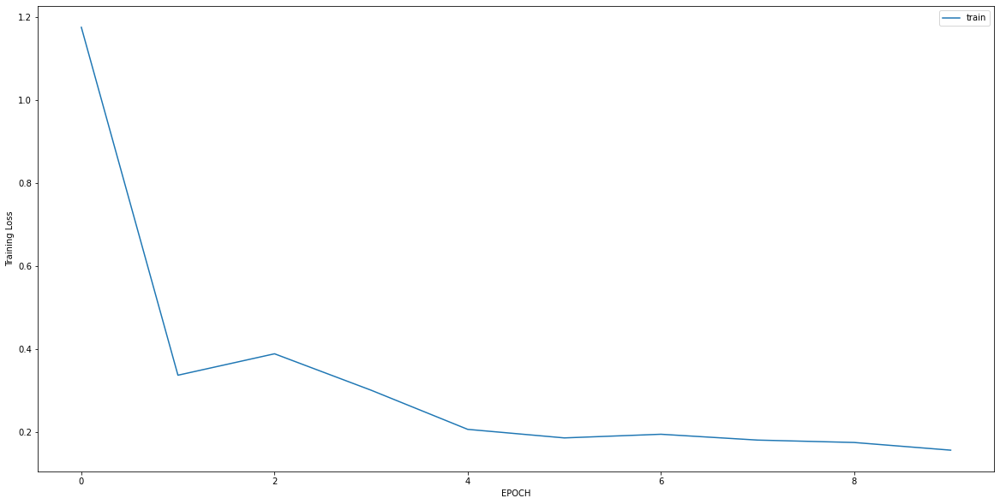

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.6468 - accuracy: 0.6345
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3367 - accuracy: 0.8596
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2151 - accuracy: 0.9386
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1631 - accuracy: 0.9591
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1504 - accuracy: 0.9474
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1266 - accuracy: 0.9737
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1176 - accuracy: 0.9678
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1155 - accuracy: 0.9678
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1096 - accuracy: 0.9620
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0934 - accuracy: 0.9795


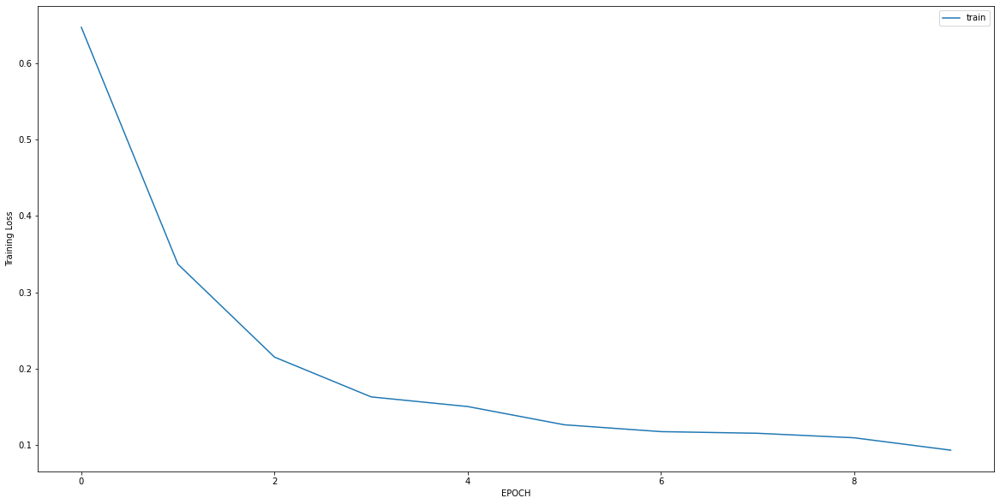

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.5439 - accuracy: 0.7905
Epoch 2/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3380 - accuracy: 0.8575
Epoch 3/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2970 - accuracy: 0.8769
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2705 - accuracy: 0.8834
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2674 - accuracy: 0.8877
Epoch 6/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2484 - accuracy: 0.9050
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2132 - accuracy: 0.9266
Epoch 8/10
15/15 [==============================] - 0s 5ms/step - loss: 0.2201 - accuracy: 0.9179
Epoch 9/10
15/15 [==============================] - 0s 5ms/step - loss: 0.1980 - accuracy: 0.9266
Epoch 10/10
15/15 [==============================] - 0s 5ms/step - loss: 0.1929 - accuracy: 0.9330


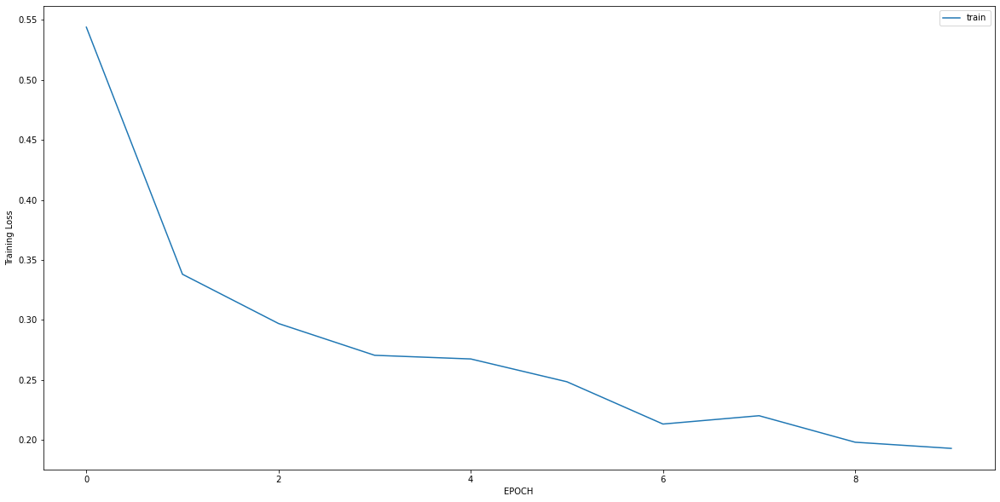

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0940 - accuracy: 0.9786
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0976 - accuracy: 0.9751
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0893 - accuracy: 0.9893
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0727 - accuracy: 0.9858
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0755 - accuracy: 0.9893
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0634 - accuracy: 0.9929
Epoch 7/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0606 - accuracy: 0.9929
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0622 - accuracy: 0.9893
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0688 - accuracy: 0.9858
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0626 - accuracy: 0.9858


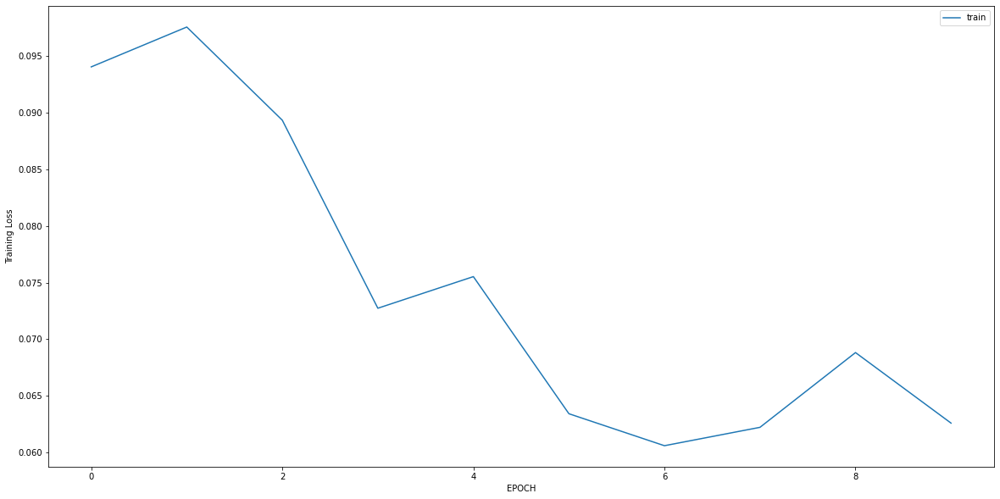

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0690 - accuracy: 0.9921
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0689 - accuracy: 0.9921
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0673 - accuracy: 0.9921
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0615 - accuracy: 0.9881
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0609 - accuracy: 0.9960
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0517 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0590 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0584 - accuracy: 0.9881
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0591 - accuracy: 0.9921
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0500 - accuracy: 1.0000


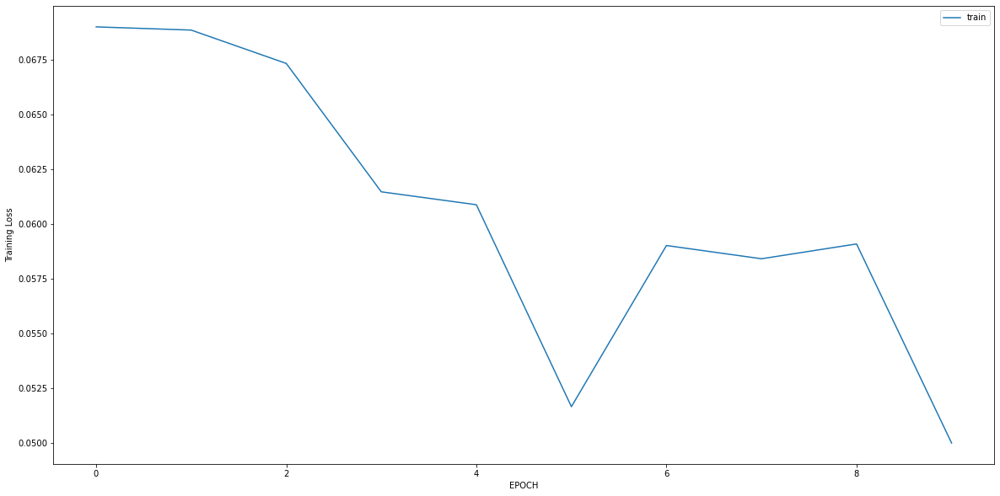

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 4.4943 - accuracy: 0.0026
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 1.3346 - accuracy: 0.1759
Epoch 3/10
12/12 [==============================] - 0s 5ms/step - loss: 0.4970 - accuracy: 0.7769
Epoch 4/10
12/12 [==============================] - 0s 5ms/step - loss: 0.2532 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 5ms/step - loss: 0.1755 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1321 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.1055 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0986 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0874 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0706 - accuracy: 1.0000


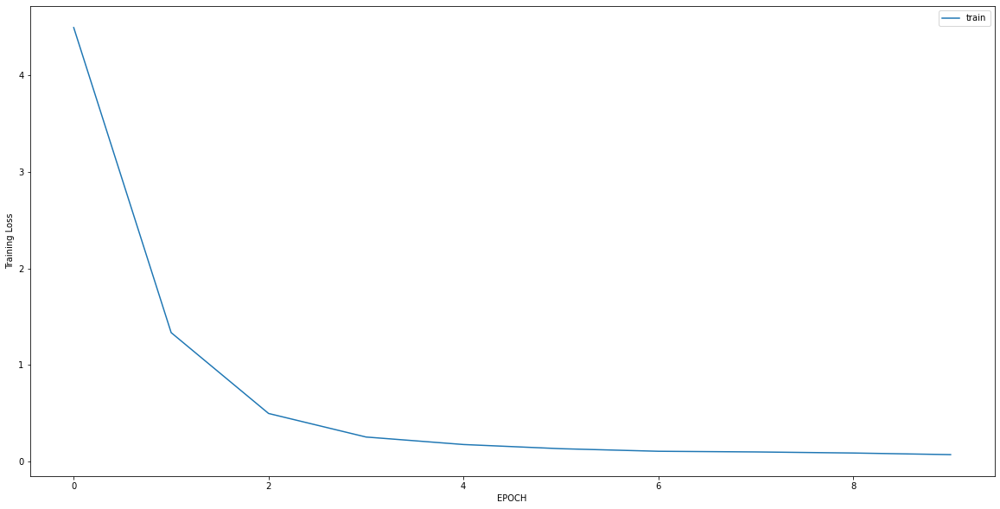

Epoch 1/10
4/4 [==============================] - 0s 7ms/step - loss: 2.4369 - accuracy: 0.1633
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 2.3958 - accuracy: 0.1633
Epoch 3/10
4/4 [==============================] - 0s 7ms/step - loss: 2.1485 - accuracy: 0.1633
Epoch 4/10
4/4 [==============================] - 0s 6ms/step - loss: 2.0142 - accuracy: 0.1633
Epoch 5/10
4/4 [==============================] - 0s 5ms/step - loss: 1.9051 - accuracy: 0.1633
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 1.6511 - accuracy: 0.1633
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 1.4881 - accuracy: 0.1633
Epoch 8/10
4/4 [==============================] - 0s 6ms/step - loss: 1.3419 - accuracy: 0.1633
Epoch 9/10
4/4 [==============================] - 0s 6ms/step - loss: 1.1956 - accuracy: 0.1633
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 1.0101 - accuracy: 0.2449


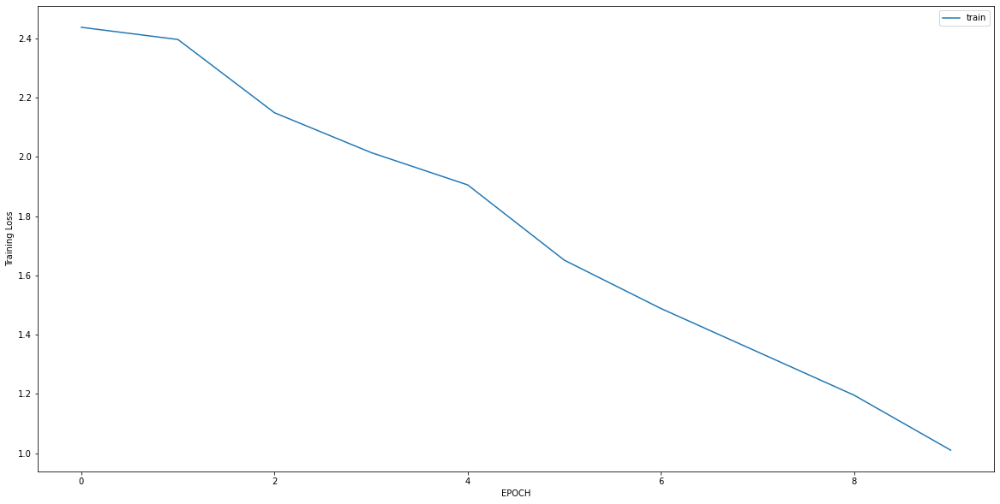

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7529 - accuracy: 0.4375
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6829 - accuracy: 0.5625
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6574 - accuracy: 0.6111
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5955 - accuracy: 0.6597
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5859 - accuracy: 0.6875
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6109 - accuracy: 0.6875
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5460 - accuracy: 0.7014
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5952 - accuracy: 0.6736
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5985 - accuracy: 0.6528
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6347 - accuracy: 0.6597


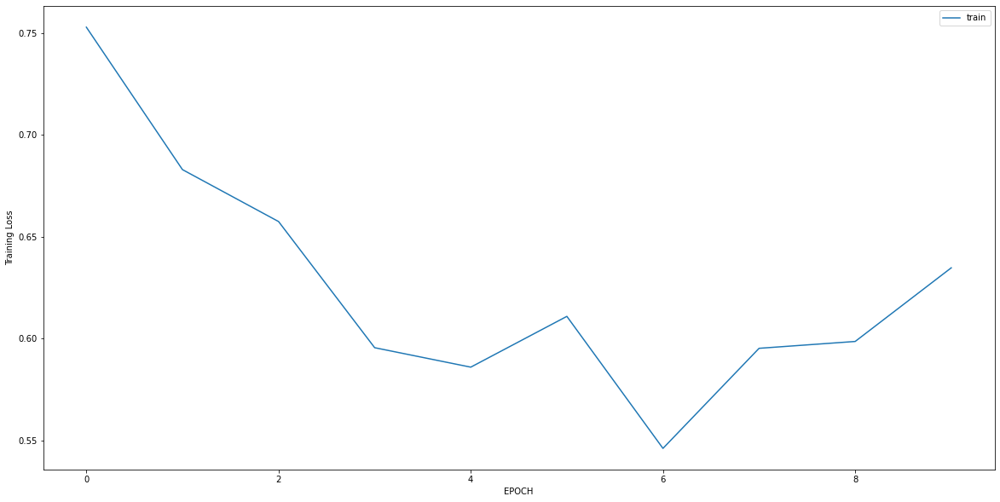

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3857 - accuracy: 0.8513
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3502 - accuracy: 0.8481
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2907 - accuracy: 0.9146
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2774 - accuracy: 0.9082
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2452 - accuracy: 0.9146
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2334 - accuracy: 0.9272
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2267 - accuracy: 0.9304
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2133 - accuracy: 0.9399
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2316 - accuracy: 0.9051
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2105 - accuracy: 0.9272


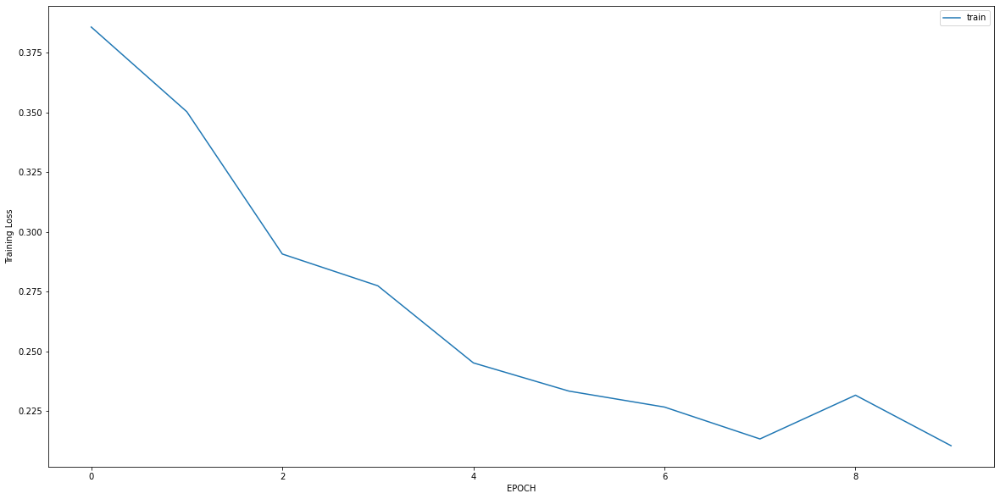

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2384 - accuracy: 0.9395
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1913 - accuracy: 0.9919
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1325 - accuracy: 0.9839
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1432 - accuracy: 0.9758
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1155 - accuracy: 0.9718
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1054 - accuracy: 0.9839
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1108 - accuracy: 0.9798
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0994 - accuracy: 0.9919
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0857 - accuracy: 0.9879
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0931 - accuracy: 0.9879


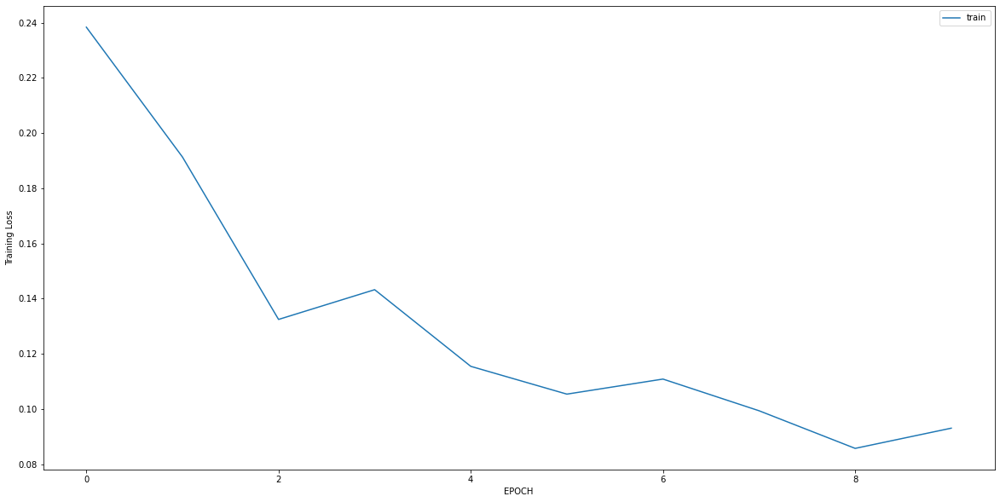

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.1193 - accuracy: 0.5552
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8825 - accuracy: 0.5658
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7271 - accuracy: 0.5694
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6098 - accuracy: 0.5765
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5198 - accuracy: 0.6797
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4923 - accuracy: 0.7295
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4422 - accuracy: 0.7794
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4418 - accuracy: 0.8007
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3981 - accuracy: 0.8114
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3927 - accuracy: 0.8826


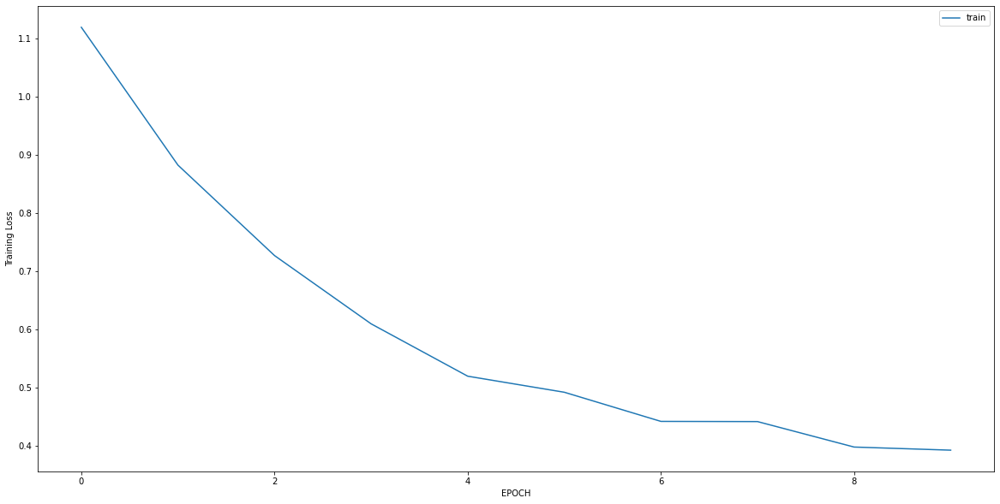

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4595 - accuracy: 0.8908
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3728 - accuracy: 0.9832
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2799 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2168 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1793 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1523 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1342 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1230 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1139 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0996 - accuracy: 1.0000


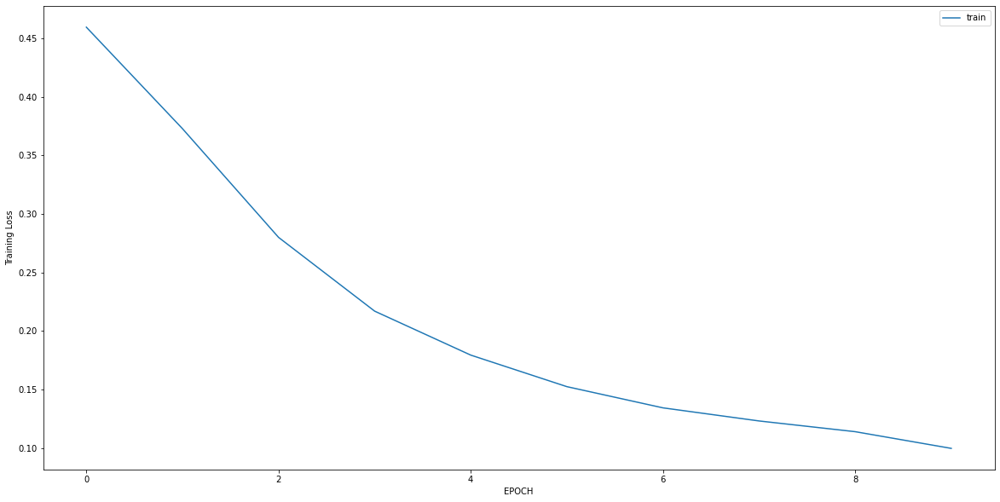

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.7055 - accuracy: 0.7205
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5659 - accuracy: 0.7637
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3614 - accuracy: 0.8415
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2459 - accuracy: 0.8991
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1684 - accuracy: 0.9481
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1372 - accuracy: 0.9654
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1026 - accuracy: 0.9885
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1009 - accuracy: 0.9856
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0928 - accuracy: 0.9856
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0785 - accuracy: 0.9971


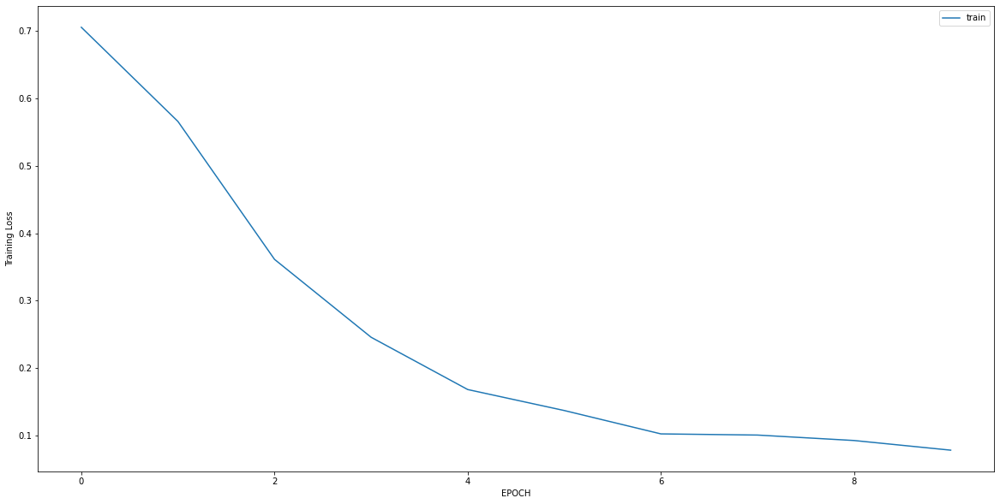

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.1648 - accuracy: 0.5336
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4429 - accuracy: 0.8617
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4805 - accuracy: 0.8300
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3384 - accuracy: 0.8854
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2923 - accuracy: 0.8854
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2690 - accuracy: 0.9368
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2727 - accuracy: 0.8972
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2788 - accuracy: 0.8972
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2354 - accuracy: 0.9091
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2264 - accuracy: 0.9170


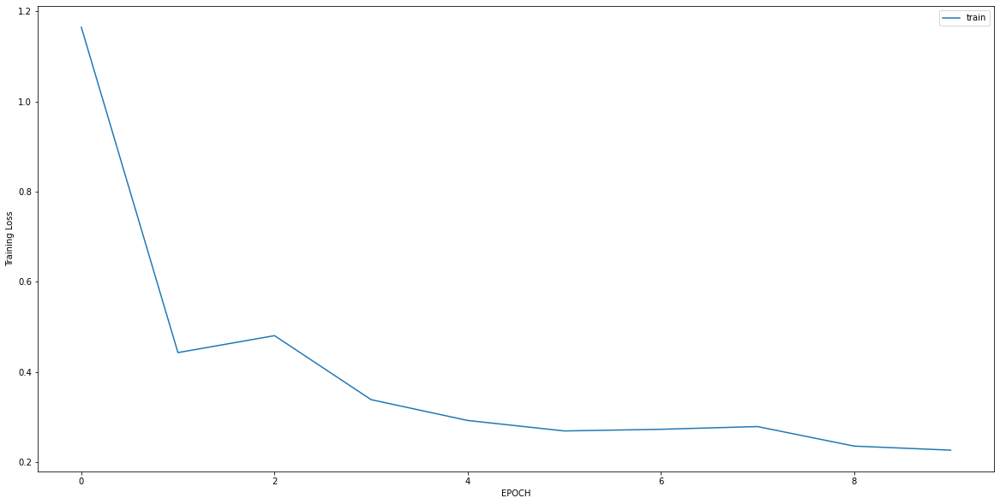

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.2374 - accuracy: 0.0143
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.9367 - accuracy: 0.1214
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9150 - accuracy: 0.5536
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2292 - accuracy: 0.9179
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1077 - accuracy: 0.9857
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0487 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0306 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 1.0000


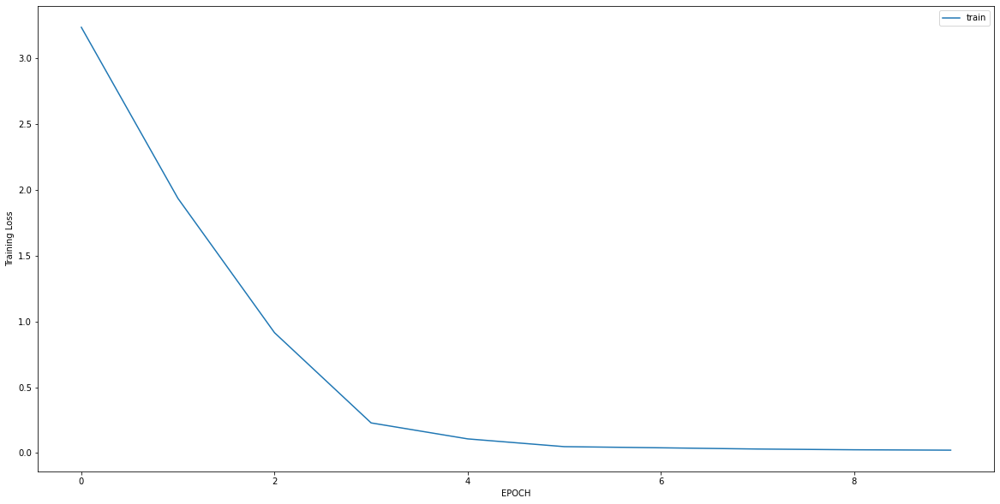

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0076 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0042 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0049 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0040 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0038 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0049 - accuracy: 1.0000


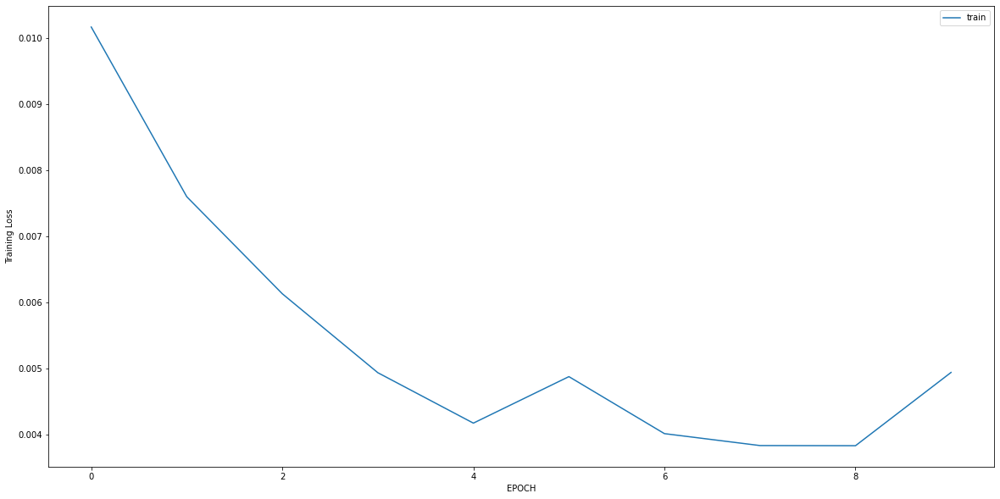

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.3190 - accuracy: 0.4845
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7467 - accuracy: 0.5430
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5452 - accuracy: 0.7079
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4331 - accuracy: 0.7732
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3122 - accuracy: 0.8729
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3227 - accuracy: 0.8522
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2529 - accuracy: 0.9141
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2182 - accuracy: 0.9210
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2139 - accuracy: 0.9210
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2005 - accuracy: 0.9347


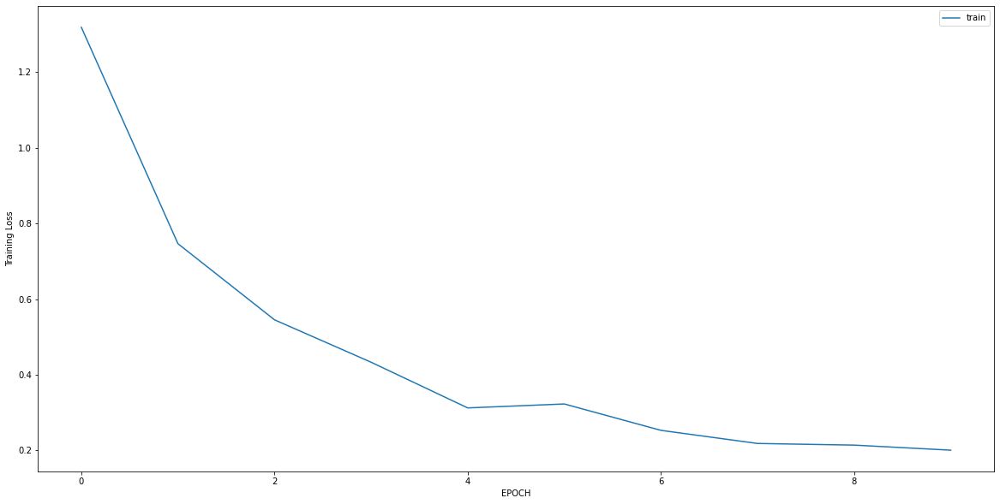

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7790 - accuracy: 0.7083
Epoch 2/10
5/5 [==============================] - 0s 7ms/step - loss: 0.8217 - accuracy: 0.7083
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7982 - accuracy: 0.6944
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7636 - accuracy: 0.6944
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6953 - accuracy: 0.6736
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6622 - accuracy: 0.7014
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7134 - accuracy: 0.6806
Epoch 8/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6806 - accuracy: 0.6597
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6188 - accuracy: 0.7222
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6896 - accuracy: 0.6806


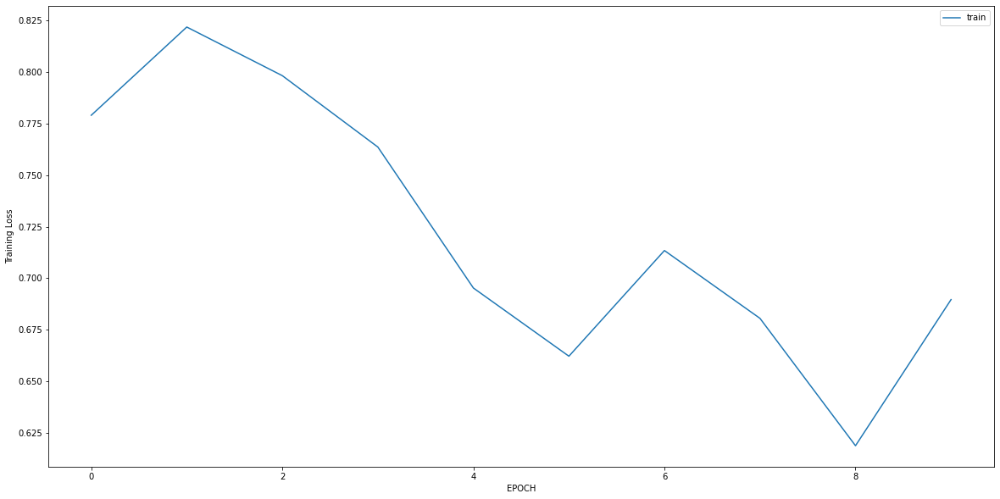

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 0.4052 - accuracy: 0.8316
Epoch 2/10
9/9 [==============================] - 0s 8ms/step - loss: 0.3569 - accuracy: 0.8456
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3097 - accuracy: 0.8667
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2945 - accuracy: 0.8807
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2952 - accuracy: 0.9053
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2932 - accuracy: 0.8737
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2999 - accuracy: 0.8947
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2700 - accuracy: 0.8877
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2639 - accuracy: 0.9088
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2309 - accuracy: 0.9053


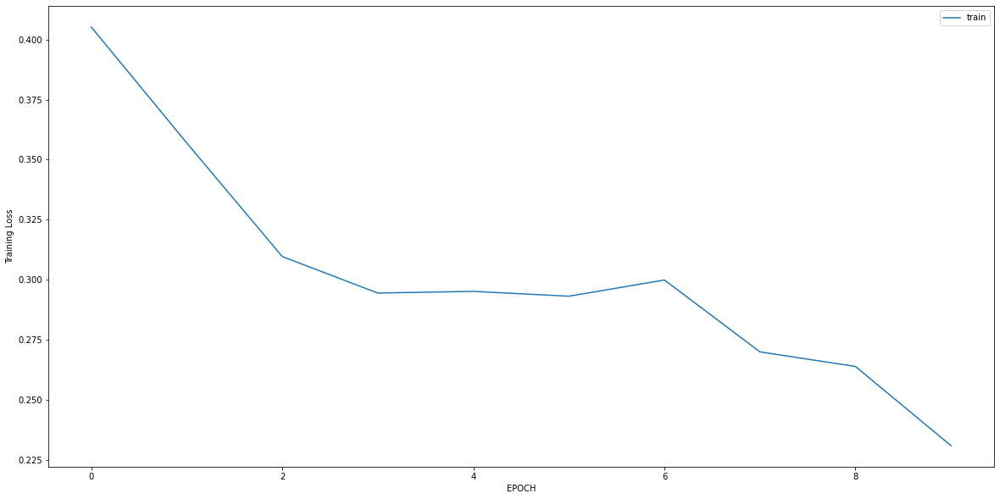

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2268 - accuracy: 0.9123
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1651 - accuracy: 0.9386
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1404 - accuracy: 0.9591
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1297 - accuracy: 0.9591
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1296 - accuracy: 0.9532
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1317 - accuracy: 0.9532
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1328 - accuracy: 0.9532
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1269 - accuracy: 0.9678
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1101 - accuracy: 0.9649
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1212 - accuracy: 0.9474


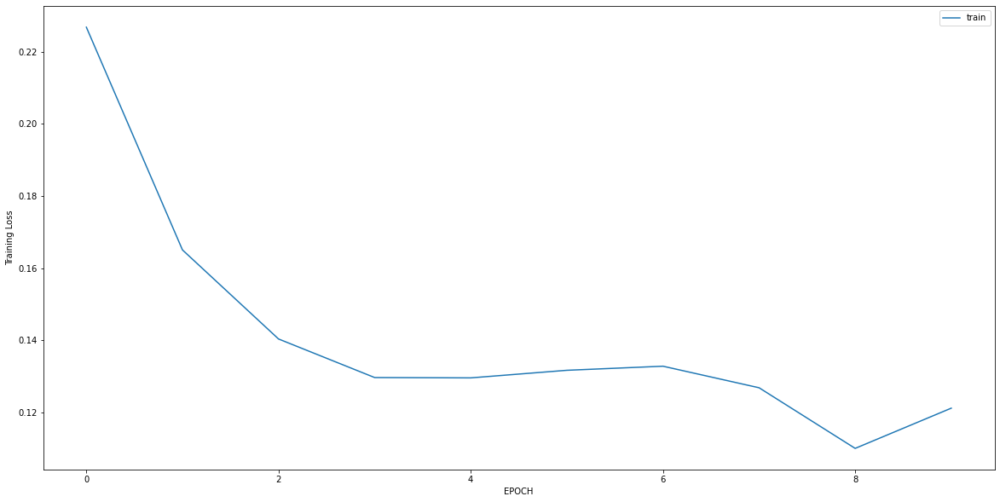

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0646 - accuracy: 0.6875
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0211 - accuracy: 0.6806
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9659 - accuracy: 0.6875
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8285 - accuracy: 0.6736
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8399 - accuracy: 0.6806
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7557 - accuracy: 0.6458
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7442 - accuracy: 0.6736
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6953 - accuracy: 0.6736
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6571 - accuracy: 0.6806
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6629 - accuracy: 0.6042


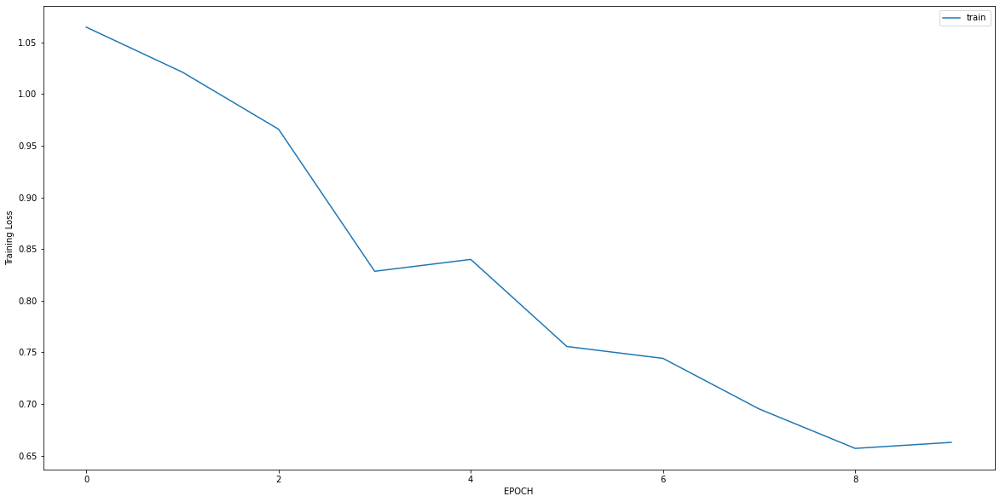

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1030 - accuracy: 0.7287
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9900 - accuracy: 0.7571
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7390 - accuracy: 0.7773
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6507 - accuracy: 0.7773
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4968 - accuracy: 0.8097
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3947 - accuracy: 0.8462
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3749 - accuracy: 0.8381
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3481 - accuracy: 0.8785
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3296 - accuracy: 0.8988
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2785 - accuracy: 0.9069


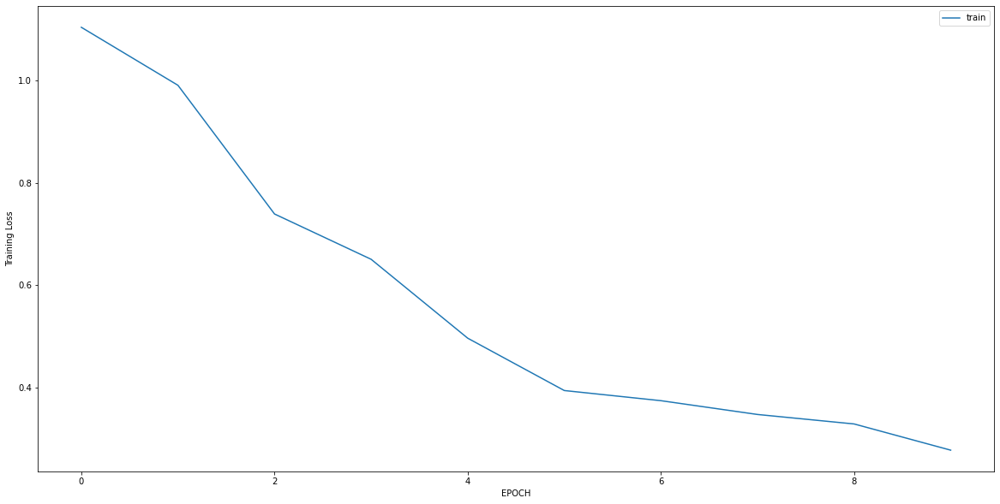

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2355 - accuracy: 0.9253
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2046 - accuracy: 0.9431
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1871 - accuracy: 0.9573
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1418 - accuracy: 0.9751
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1519 - accuracy: 0.9715
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1539 - accuracy: 0.9609
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1302 - accuracy: 0.9680
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1097 - accuracy: 0.9786
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1167 - accuracy: 0.9822
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1037 - accuracy: 0.9786


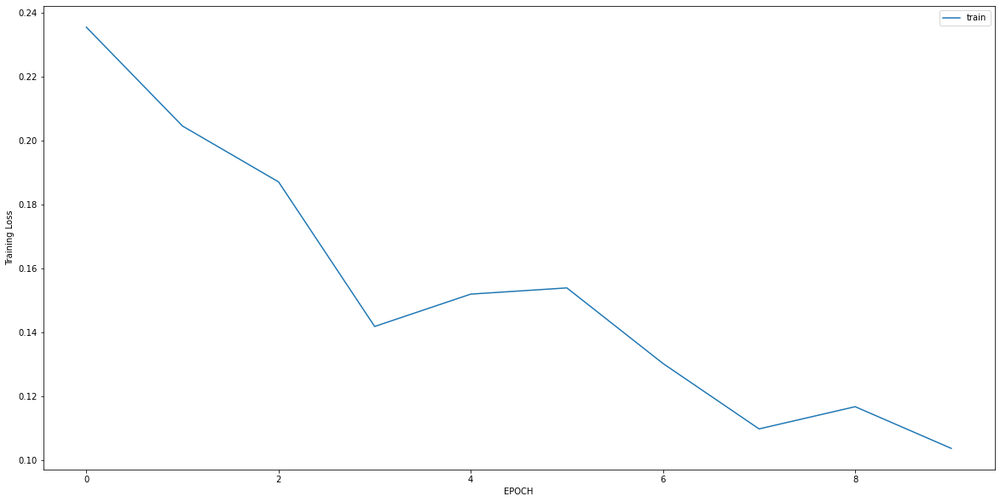

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6181 - accuracy: 0.4079
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2791 - accuracy: 0.4116
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7438 - accuracy: 0.5632
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4419 - accuracy: 0.8087
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4189 - accuracy: 0.8303
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4118 - accuracy: 0.8375
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3541 - accuracy: 0.8592
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3338 - accuracy: 0.9061
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3089 - accuracy: 0.8917
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2797 - accuracy: 0.9242


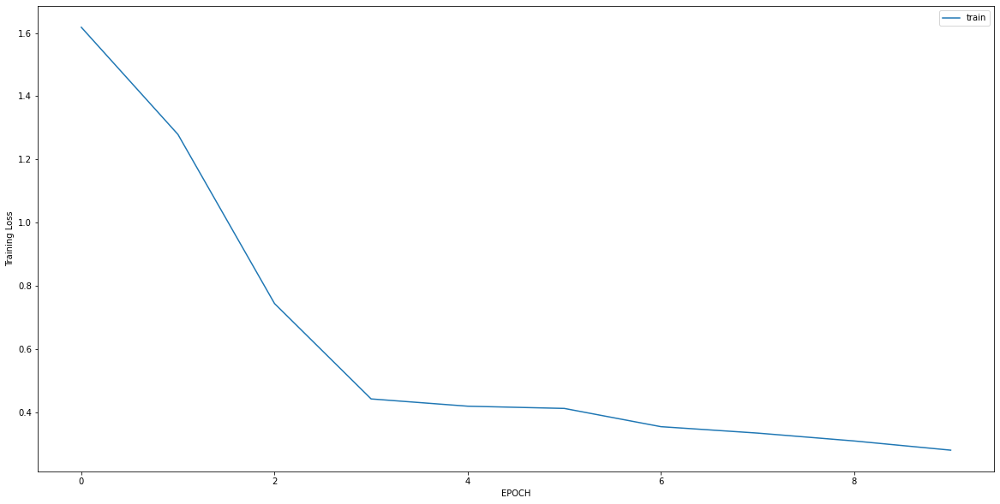

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 2.2857 - accuracy: 0.0500
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1531 - accuracy: 0.3750
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2346 - accuracy: 0.9357
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1036 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0594 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0288 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0190 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0170 - accuracy: 1.0000


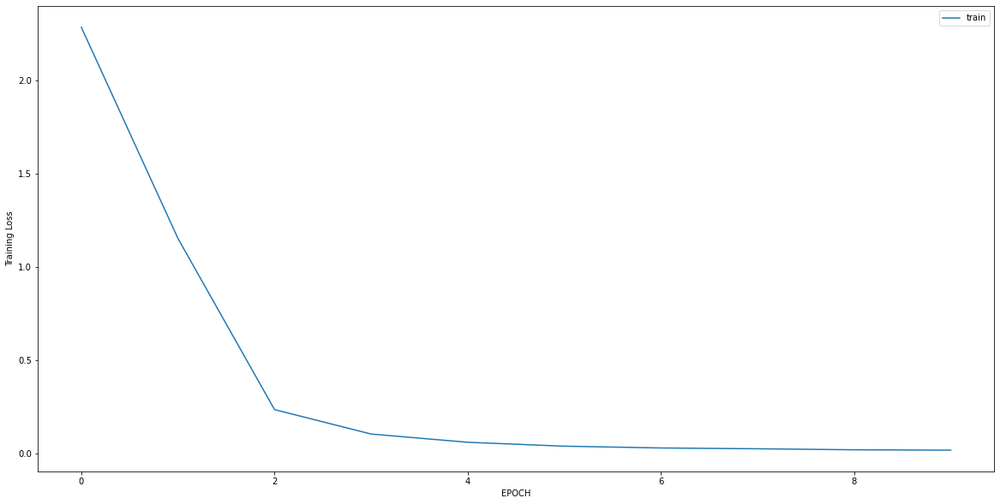

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1285 - accuracy: 0.6103
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7084 - accuracy: 0.6324
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5946 - accuracy: 0.6471
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4822 - accuracy: 0.7096
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4014 - accuracy: 0.7610
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3187 - accuracy: 0.8309
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3023 - accuracy: 0.8529
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2383 - accuracy: 0.9118
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2281 - accuracy: 0.9154
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2271 - accuracy: 0.9228


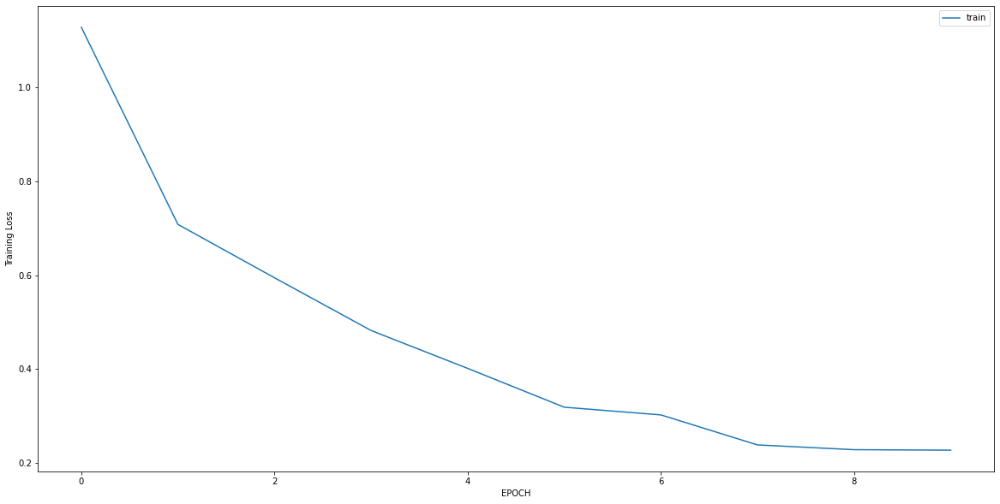

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.4928 - accuracy: 0.7806
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3203 - accuracy: 0.8987
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2949 - accuracy: 0.8903
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2570 - accuracy: 0.9072
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2192 - accuracy: 0.9409
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2182 - accuracy: 0.9494
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2000 - accuracy: 0.9367
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1883 - accuracy: 0.9494
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1548 - accuracy: 0.9620
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1358 - accuracy: 0.9747


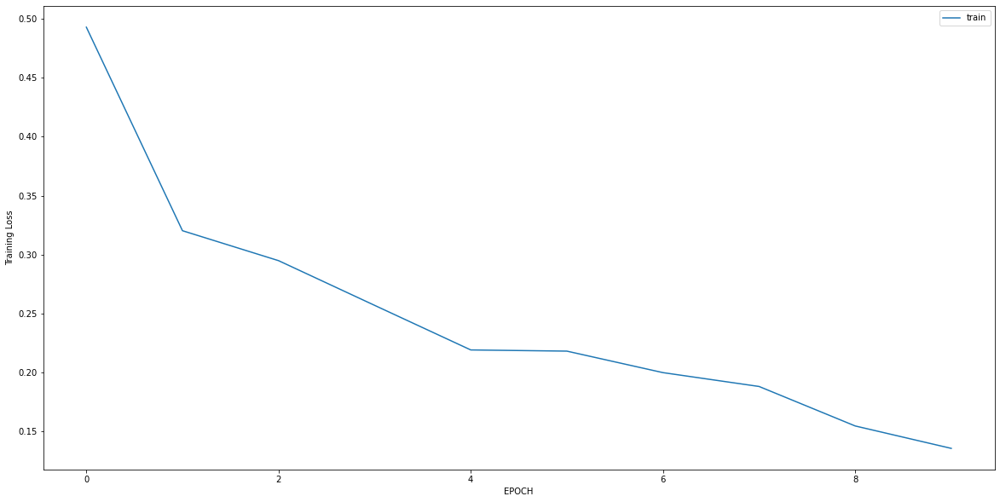

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.7135 - accuracy: 0.6032
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4199 - accuracy: 0.8413
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4514 - accuracy: 0.7976
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4475 - accuracy: 0.7937
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3901 - accuracy: 0.8333
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3833 - accuracy: 0.8690
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3368 - accuracy: 0.9048
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3092 - accuracy: 0.9087
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3160 - accuracy: 0.9167
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2846 - accuracy: 0.9286


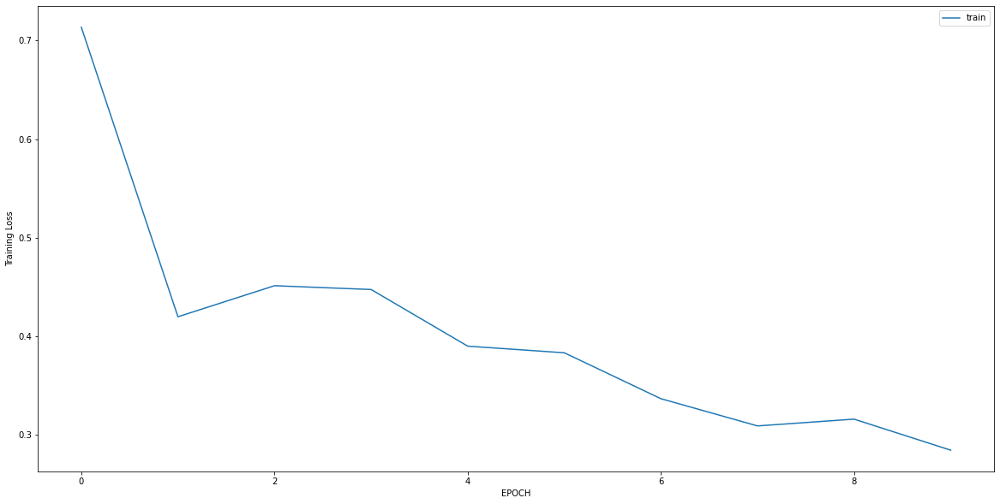

Epoch 1/10
2/2 [==============================] - 0s 8ms/step - loss: 0.6109 - accuracy: 0.6964
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 0.2649 - accuracy: 1.0000
Epoch 3/10
2/2 [==============================] - 0s 7ms/step - loss: 0.2024 - accuracy: 1.0000
Epoch 4/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1732 - accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1906 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1457 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 6ms/step - loss: 0.1522 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1380 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 6ms/step - loss: 0.1329 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 0.1331 - accuracy: 1.0000


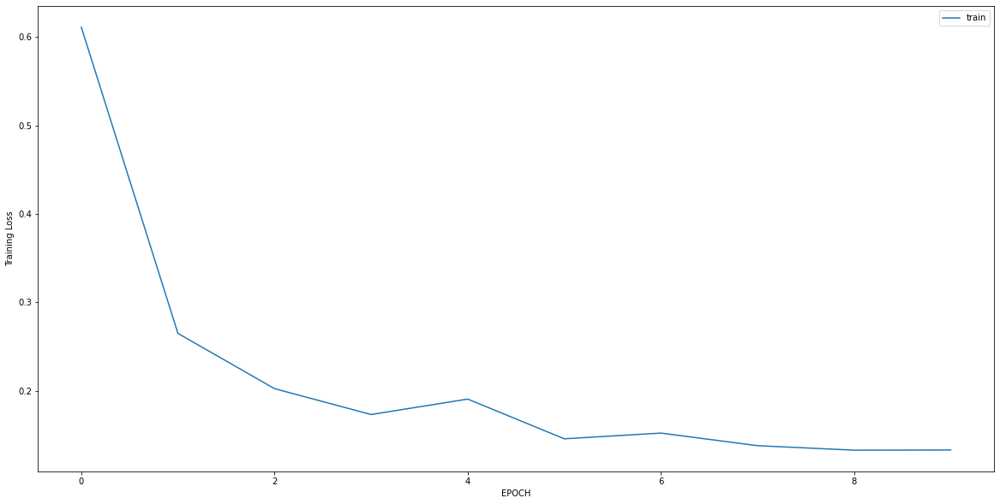

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7758 - accuracy: 0.7222
Epoch 2/10
8/8 [==============================] - 0s 7ms/step - loss: 0.6754 - accuracy: 0.7222
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4722 - accuracy: 0.7778
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3774 - accuracy: 0.8175
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2810 - accuracy: 0.8611
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2258 - accuracy: 0.9008
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1782 - accuracy: 0.9365
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1498 - accuracy: 0.9405
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1256 - accuracy: 0.9722
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0999 - accuracy: 0.9921


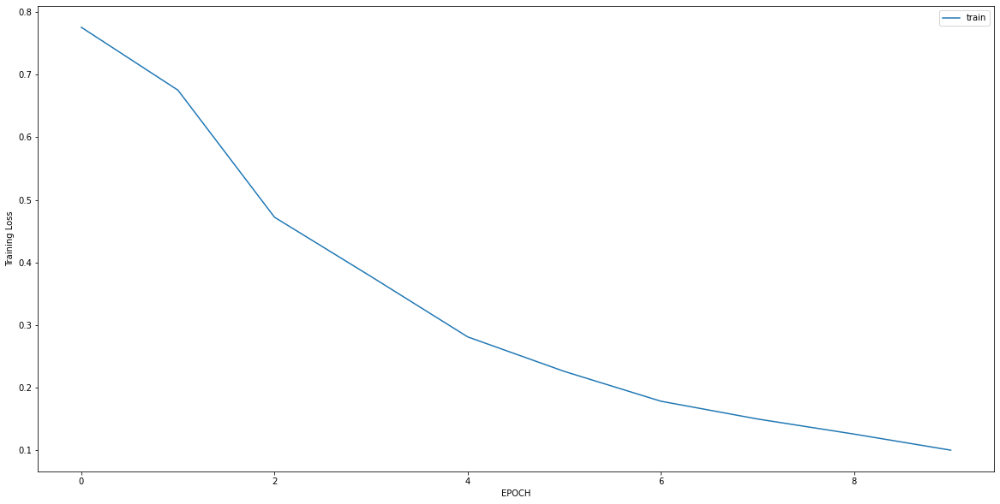

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0062 - accuracy: 0.5281
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0781 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0618 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0561 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0539 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0524 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0489 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 1.0000


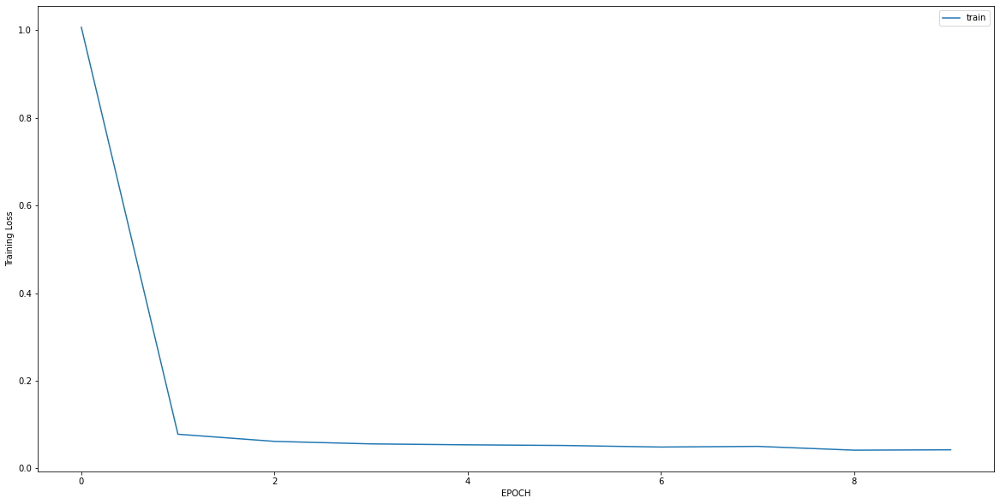

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.9679 - accuracy: 0.6586
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.7184 - accuracy: 0.6828
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5894 - accuracy: 0.7462
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4613 - accuracy: 0.7674
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3447 - accuracy: 0.8248
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3097 - accuracy: 0.8640
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2697 - accuracy: 0.8852
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2610 - accuracy: 0.8822
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2235 - accuracy: 0.9184
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2125 - accuracy: 0.9335


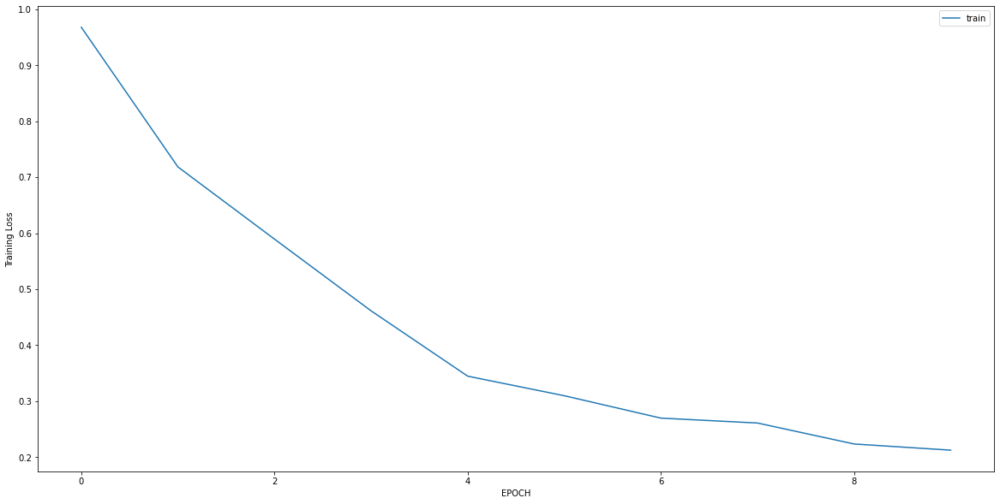

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 0.5283 - accuracy: 0.6371
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 0.4163 - accuracy: 0.7711
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3620 - accuracy: 0.8704
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3623 - accuracy: 0.8596
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3536 - accuracy: 0.8790
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3240 - accuracy: 0.8942
Epoch 7/10
15/15 [==============================] - 0s 5ms/step - loss: 0.3072 - accuracy: 0.9028
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3001 - accuracy: 0.9158
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2992 - accuracy: 0.9114
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2987 - accuracy: 0.9158


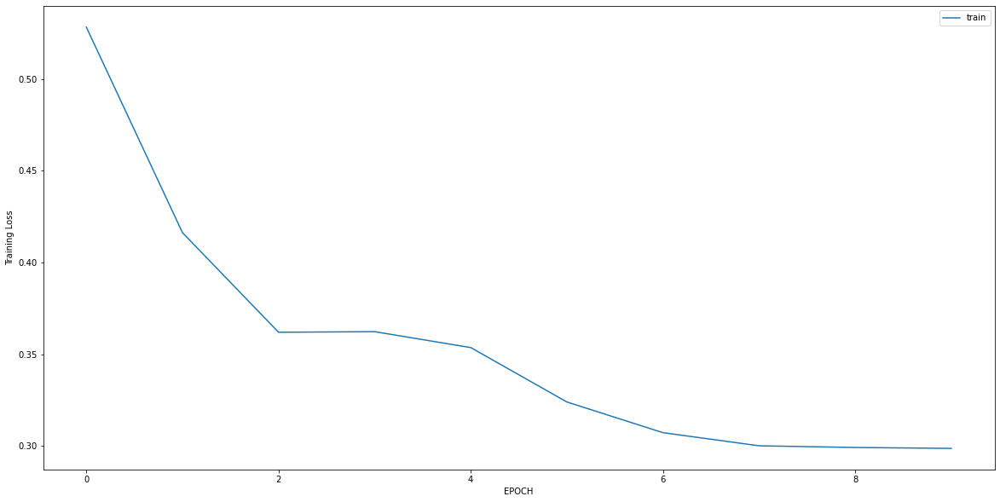

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3081 - accuracy: 0.8926
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2941 - accuracy: 0.9037
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2721 - accuracy: 0.9259
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2393 - accuracy: 0.9185
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1996 - accuracy: 0.9593
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2000 - accuracy: 0.9407
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1514 - accuracy: 0.9926
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1383 - accuracy: 0.9852
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2151 - accuracy: 0.9296
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3215 - accuracy: 0.8963


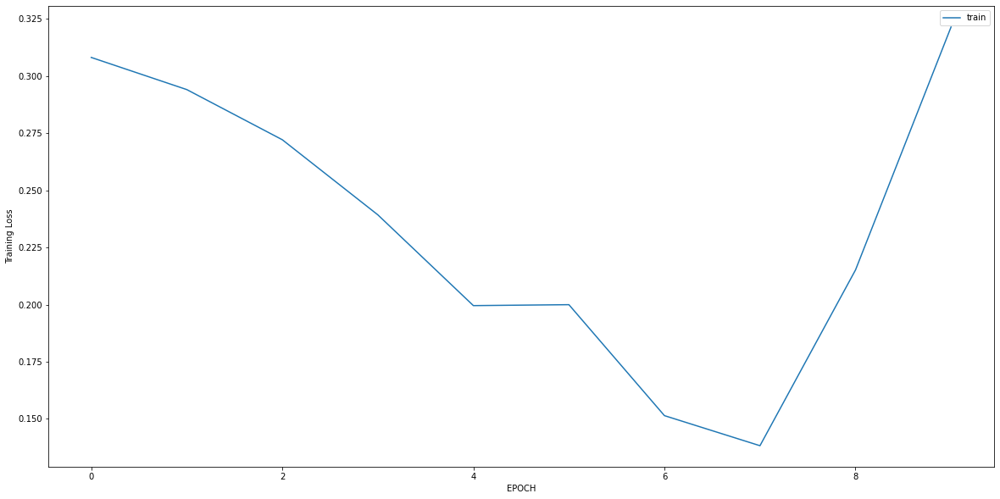

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0629 - accuracy: 0.6691
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.0147 - accuracy: 0.6691
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8357 - accuracy: 0.6763
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7302 - accuracy: 0.6763
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6529 - accuracy: 0.6403
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6176 - accuracy: 0.6547
Epoch 7/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6259 - accuracy: 0.6115
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5497 - accuracy: 0.7050
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5627 - accuracy: 0.7122
Epoch 10/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5661 - accuracy: 0.7266


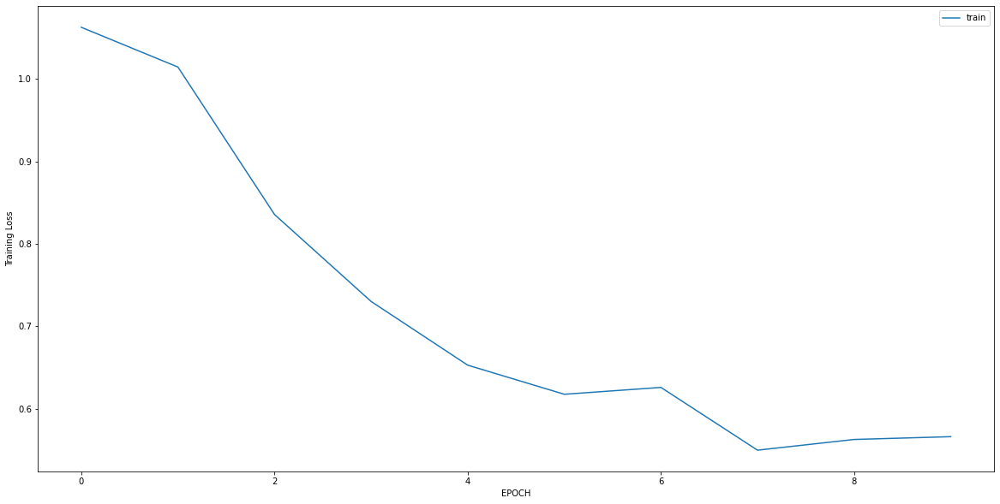

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1401 - accuracy: 0.9671
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0760 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0706 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0692 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0608 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0608 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0561 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0540 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0513 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0445 - accuracy: 1.0000


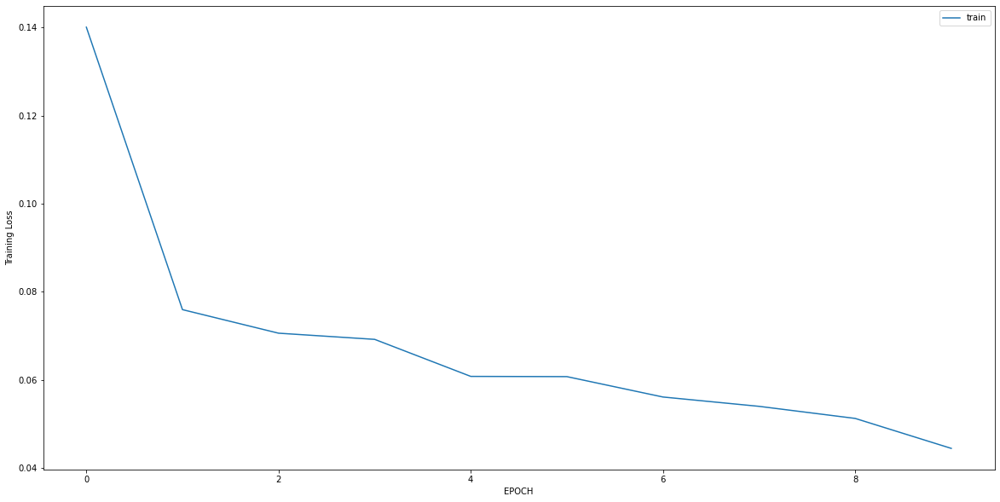

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3999 - accuracy: 0.8846
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3341 - accuracy: 0.8986
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2854 - accuracy: 0.9126
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2847 - accuracy: 0.9196
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2814 - accuracy: 0.9161
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2582 - accuracy: 0.9231
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2582 - accuracy: 0.9196
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2503 - accuracy: 0.9266
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2444 - accuracy: 0.9266
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2450 - accuracy: 0.9231


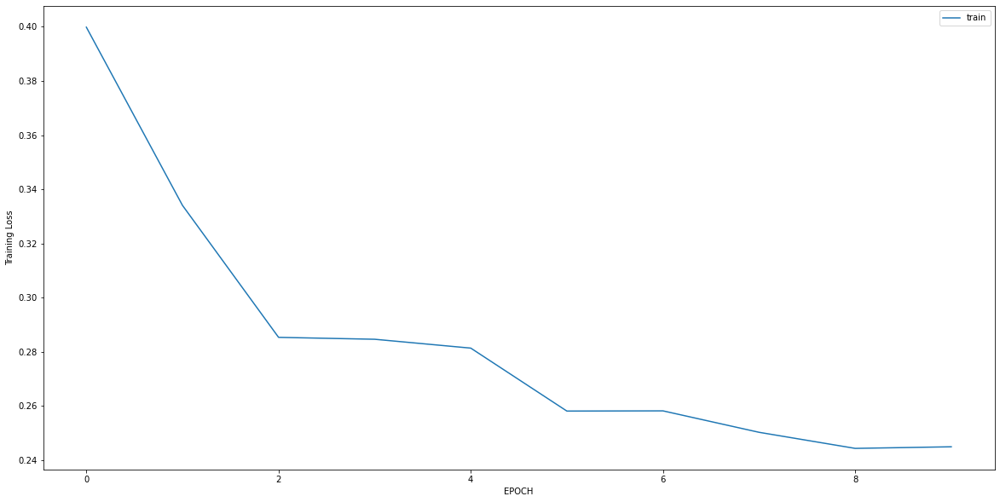

Epoch 1/10
18/18 [==============================] - 0s 5ms/step - loss: 2.5774 - accuracy: 0.2865
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1127 - accuracy: 1.0000
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0467 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0285 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0205 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0156 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0153 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0149 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0131 - accuracy: 1.0000


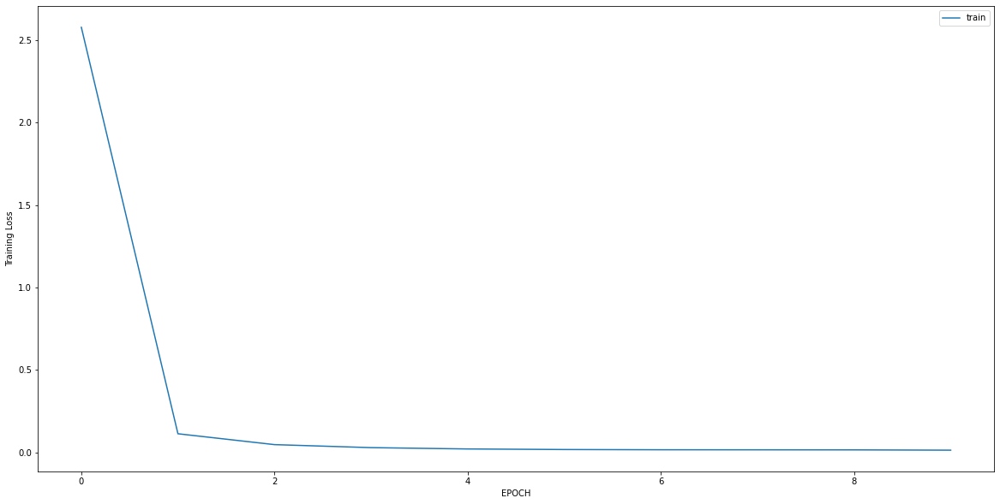

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 1.7501 - accuracy: 0.4862
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 1.3023 - accuracy: 0.5000
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7419 - accuracy: 0.6560
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.7285 - accuracy: 0.6239
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6424 - accuracy: 0.6422
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5022 - accuracy: 0.7798
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4986 - accuracy: 0.7982
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3783 - accuracy: 0.8532
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3256 - accuracy: 0.8807
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3154 - accuracy: 0.8853


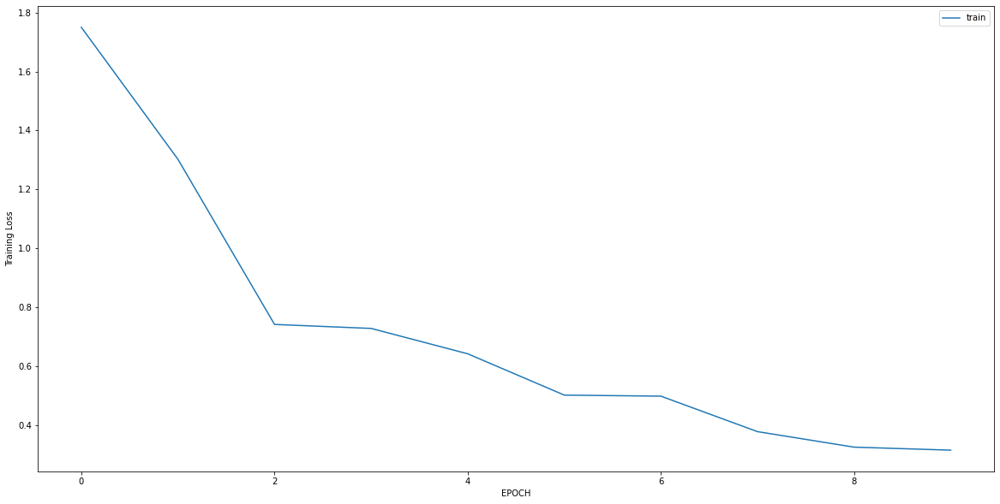

Epoch 1/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4786 - accuracy: 0.7773
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2493 - accuracy: 0.9072
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2174 - accuracy: 0.9327
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1670 - accuracy: 0.9606
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1402 - accuracy: 0.9675
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1776 - accuracy: 0.9443
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1314 - accuracy: 0.9814
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1185 - accuracy: 0.9698
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1494 - accuracy: 0.9559
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1213 - accuracy: 0.9675


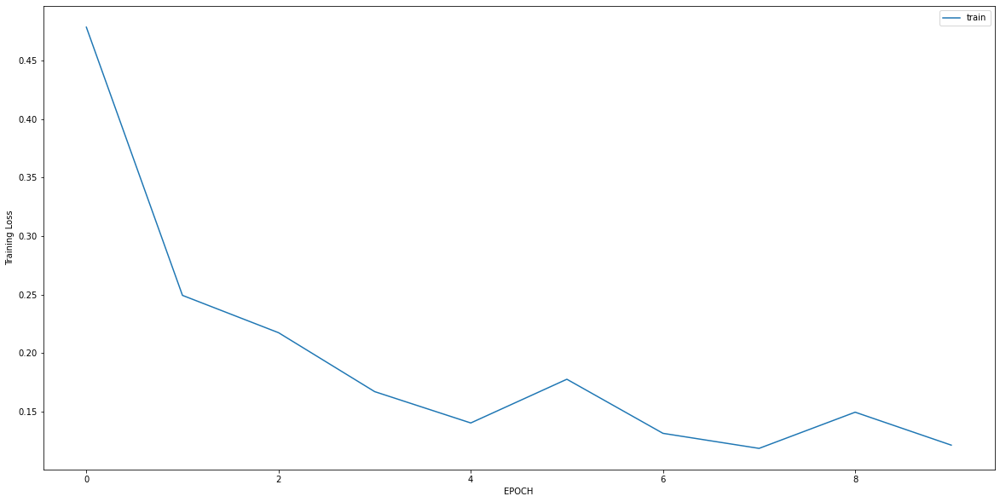

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 1.7536 - accuracy: 0.5445
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.5212 - accuracy: 0.5516
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.3038 - accuracy: 0.5516
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0862 - accuracy: 0.5623
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8343 - accuracy: 0.5730
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8101 - accuracy: 0.5623
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6962 - accuracy: 0.6014
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6342 - accuracy: 0.6548
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5853 - accuracy: 0.6940
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5742 - accuracy: 0.6904


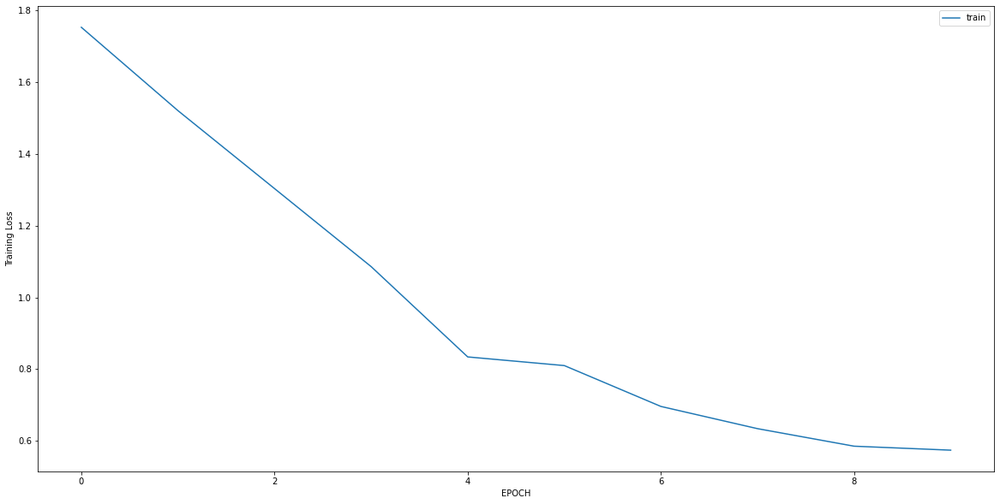

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.5289 - accuracy: 0.7111
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4209 - accuracy: 0.8104
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.3129 - accuracy: 0.8962
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2873 - accuracy: 0.9233
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2487 - accuracy: 0.9481
Epoch 6/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2399 - accuracy: 0.9481
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2075 - accuracy: 0.9616
Epoch 8/10
14/14 [==============================] - 0s 5ms/step - loss: 0.1911 - accuracy: 0.9639
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1901 - accuracy: 0.9661
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1632 - accuracy: 0.9729


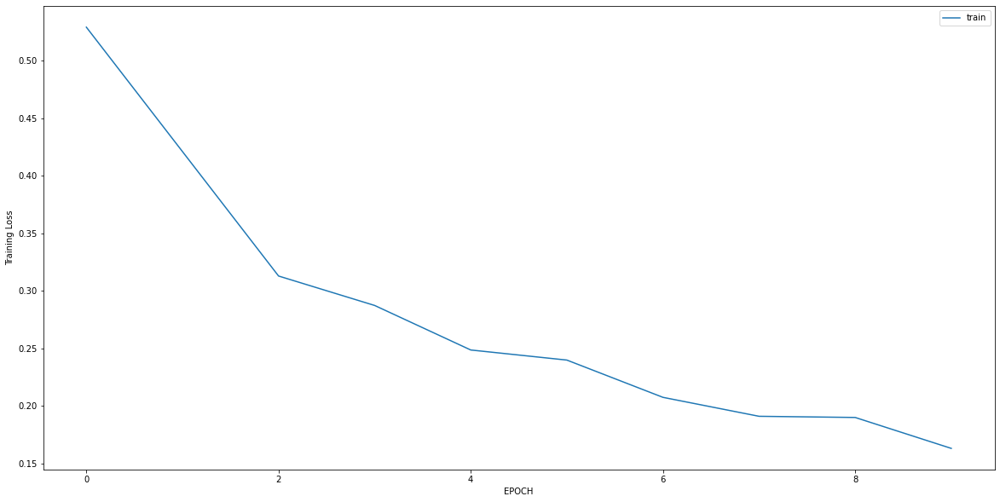

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1910 - accuracy: 0.9426
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2029 - accuracy: 0.9180
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1622 - accuracy: 0.9713
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1780 - accuracy: 0.9467
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1646 - accuracy: 0.9590
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1829 - accuracy: 0.9344
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1603 - accuracy: 0.9467
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1451 - accuracy: 0.9672
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1540 - accuracy: 0.9590
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1577 - accuracy: 0.9549


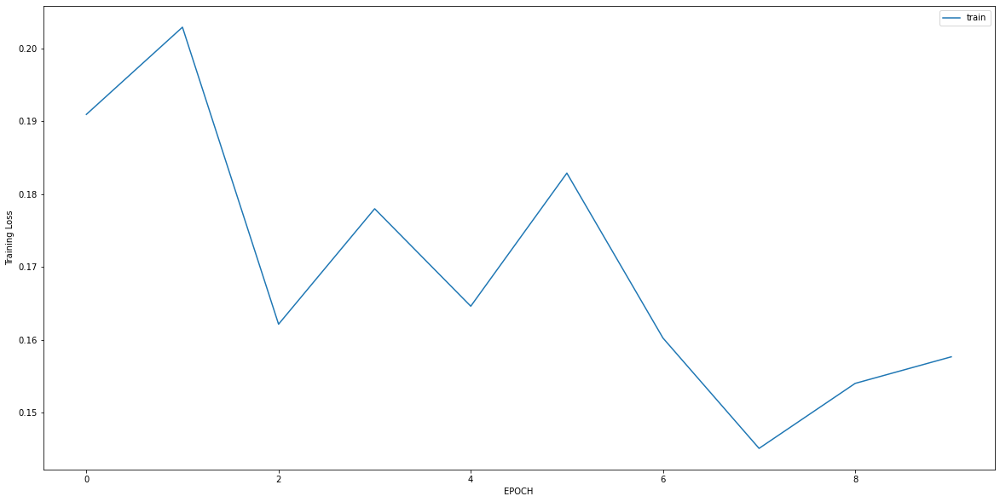

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2316 - accuracy: 0.9088
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1716 - accuracy: 0.9245
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1247 - accuracy: 0.9560
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0895 - accuracy: 0.9843
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0681 - accuracy: 0.9937
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0646 - accuracy: 0.9937
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0607 - accuracy: 0.9969
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0598 - accuracy: 0.9937
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0593 - accuracy: 0.9906
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0542 - accuracy: 0.9969


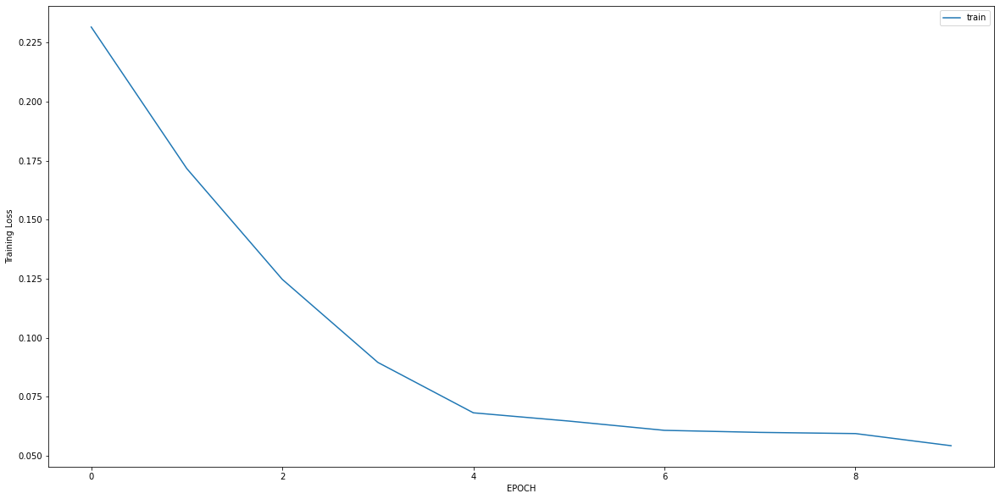

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 2.4058 - accuracy: 0.5524
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 2.1411 - accuracy: 0.5484
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.6168 - accuracy: 0.5524
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 1.2426 - accuracy: 0.5685
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.9391 - accuracy: 0.5927
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.6815
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.5601 - accuracy: 0.7339
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5101 - accuracy: 0.7581
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4773 - accuracy: 0.8024
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4880 - accuracy: 0.7621


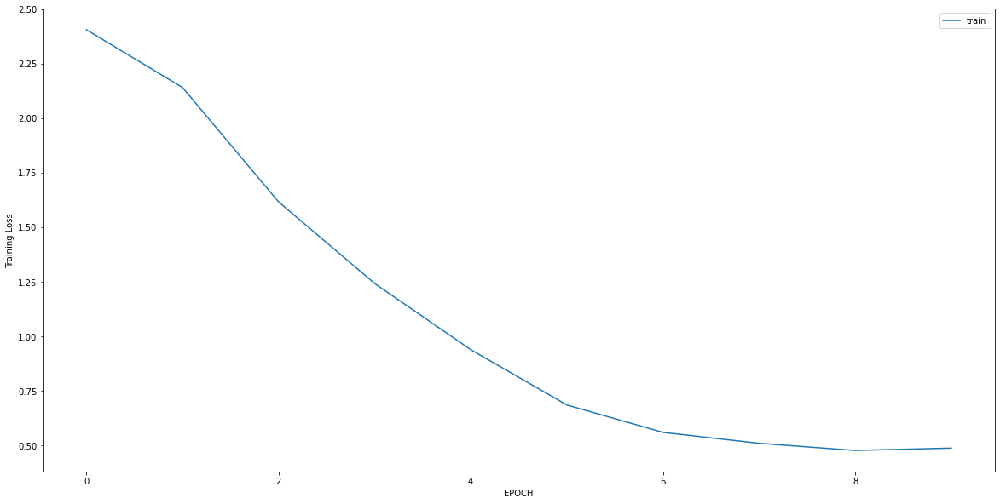

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.8404 - accuracy: 0.4913
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4511 - accuracy: 0.7875
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3335 - accuracy: 0.8885
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3544 - accuracy: 0.8746
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3947 - accuracy: 0.8502
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3578 - accuracy: 0.8711
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2806 - accuracy: 0.9164
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2887 - accuracy: 0.9129
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2811 - accuracy: 0.9199
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2597 - accuracy: 0.9268


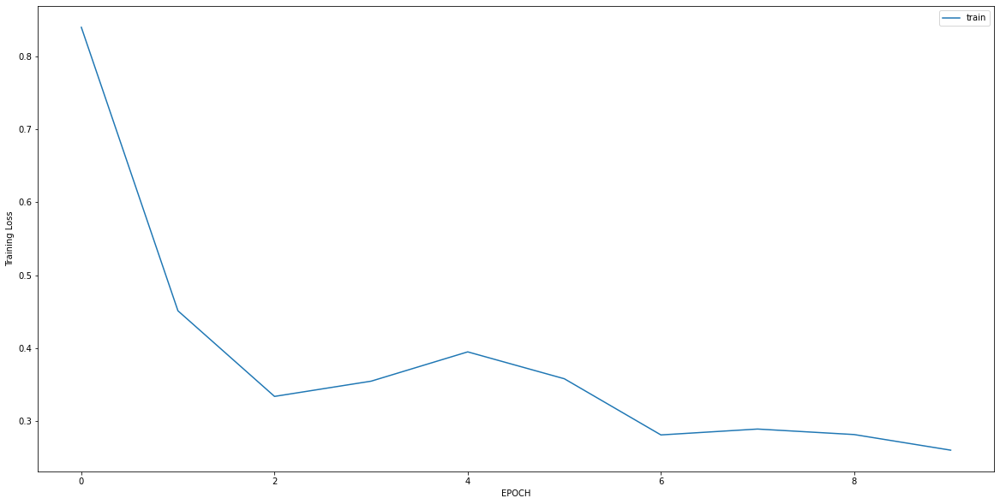

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4717 - accuracy: 0.7753
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4982 - accuracy: 0.7678
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4924 - accuracy: 0.7715
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4522 - accuracy: 0.7753
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3650 - accuracy: 0.8577
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3978 - accuracy: 0.8090
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3494 - accuracy: 0.8652
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4091 - accuracy: 0.8240
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4278 - accuracy: 0.8127
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3738 - accuracy: 0.8352


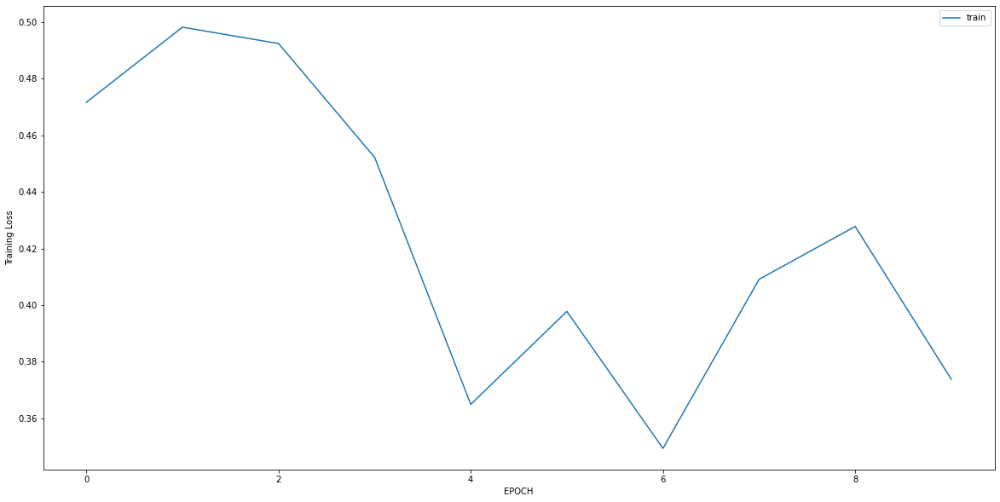

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 1.4792 - accuracy: 0.4493
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 1.2002 - accuracy: 0.4783
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6933 - accuracy: 0.7101
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5536 - accuracy: 0.7899
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6309 - accuracy: 0.7246
Epoch 6/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5380 - accuracy: 0.7754
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4282 - accuracy: 0.8333
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3335 - accuracy: 0.9058
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3111 - accuracy: 0.8841
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3195 - accuracy: 0.8913


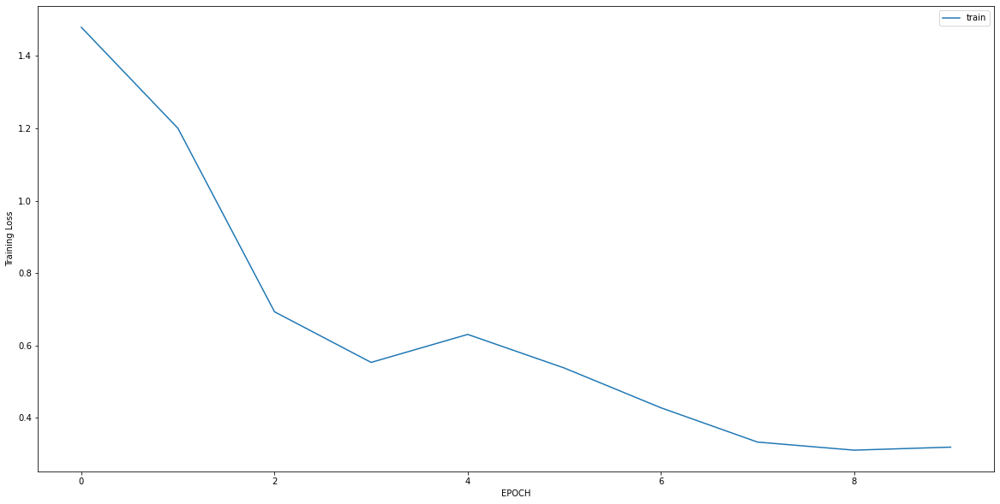

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1999 - accuracy: 0.9830
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1209 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0857 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0673 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0578 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0510 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0430 - accuracy: 1.0000


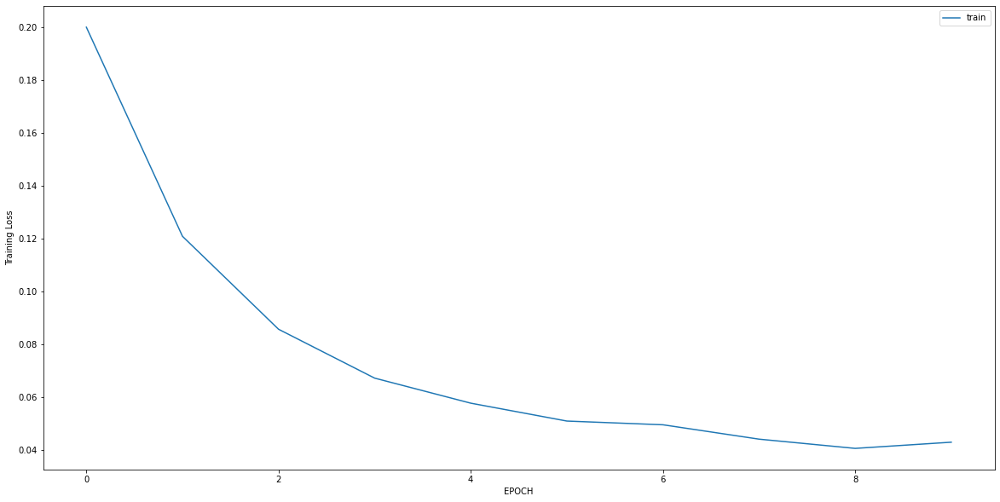

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5834 - accuracy: 0.7962
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5146 - accuracy: 0.8150
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4300 - accuracy: 0.8558
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3781 - accuracy: 0.8746
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3070 - accuracy: 0.9122
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2591 - accuracy: 0.9185
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1945 - accuracy: 0.9467
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1633 - accuracy: 0.9624
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1736 - accuracy: 0.9624
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1949 - accuracy: 0.9310


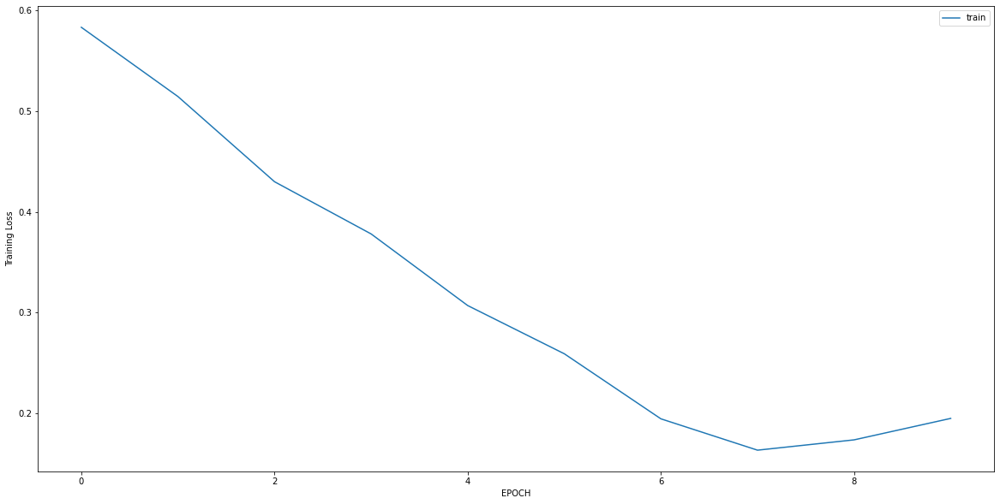

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3441 - accuracy: 0.8475
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3351 - accuracy: 0.8983
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2711 - accuracy: 0.9153
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2768 - accuracy: 0.8771
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2672 - accuracy: 0.9068
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2493 - accuracy: 0.9280
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2195 - accuracy: 0.9449
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2432 - accuracy: 0.9025
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2642 - accuracy: 0.9153
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2261 - accuracy: 0.9195


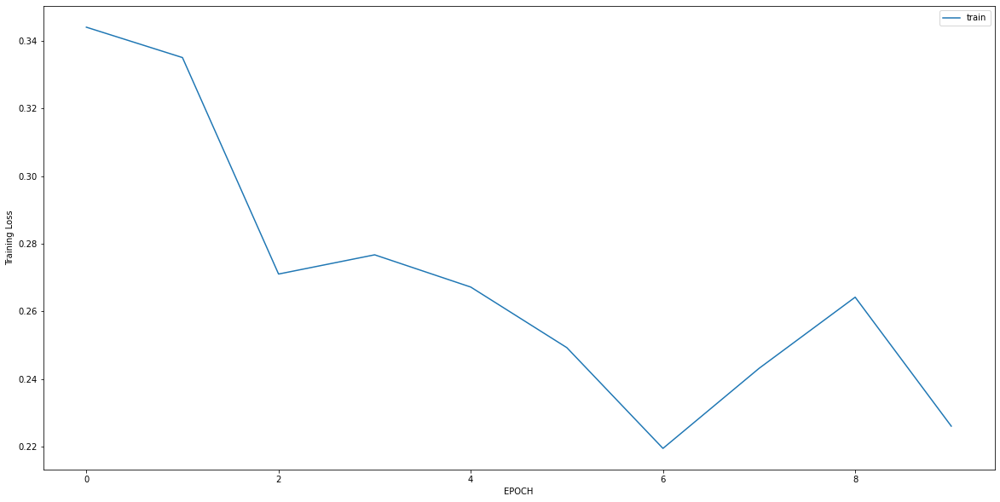

Epoch 1/10
10/10 [==============================] - 0s 4ms/step - loss: 1.1722 - accuracy: 0.4579
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5482 - accuracy: 0.6902
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3901 - accuracy: 0.8519
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3903 - accuracy: 0.8485
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3463 - accuracy: 0.8822
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3055 - accuracy: 0.8889
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2594 - accuracy: 0.9125
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2330 - accuracy: 0.9461
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2242 - accuracy: 0.9461
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2186 - accuracy: 0.9495


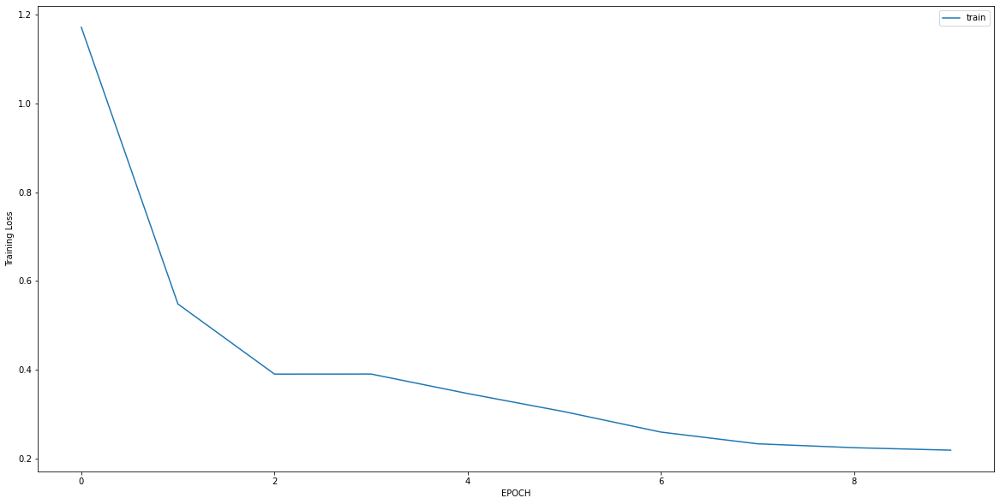

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2906 - accuracy: 0.8610
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0502 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0166 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0088 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0116 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0076 - accuracy: 1.0000


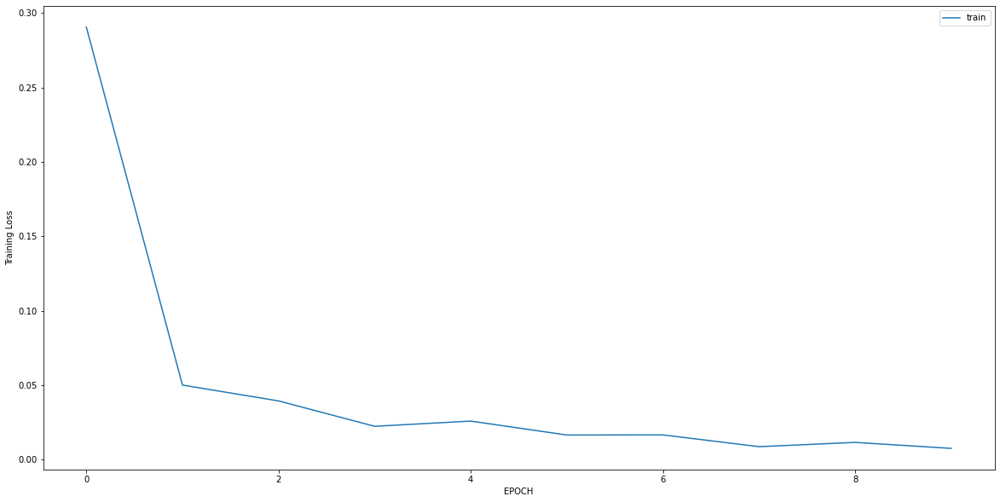

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.1353 - accuracy: 0.7391
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7189 - accuracy: 0.7787
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4336 - accuracy: 0.8261
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3496 - accuracy: 0.8696
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3215 - accuracy: 0.8617
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2956 - accuracy: 0.8656
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2697 - accuracy: 0.8893
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2696 - accuracy: 0.8656
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2294 - accuracy: 0.9130
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2087 - accuracy: 0.9091


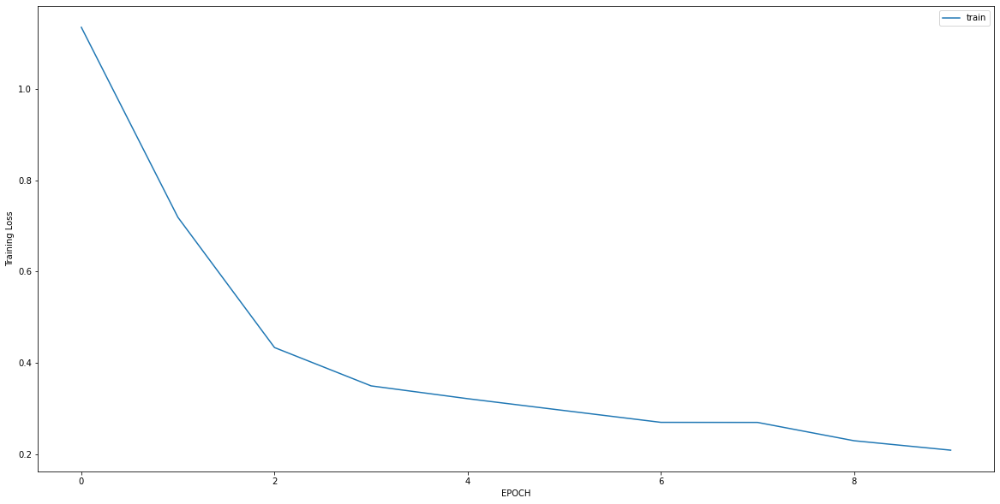

Epoch 1/10
6/6 [==============================] - 0s 6ms/step - loss: 2.3618 - accuracy: 0.0667
Epoch 2/10
6/6 [==============================] - 0s 6ms/step - loss: 0.3101 - accuracy: 0.9333
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0886 - accuracy: 1.0000
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0800 - accuracy: 1.0000
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0660 - accuracy: 1.0000
Epoch 6/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0650 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0605 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0538 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0531 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 0.0509 - accuracy: 1.0000


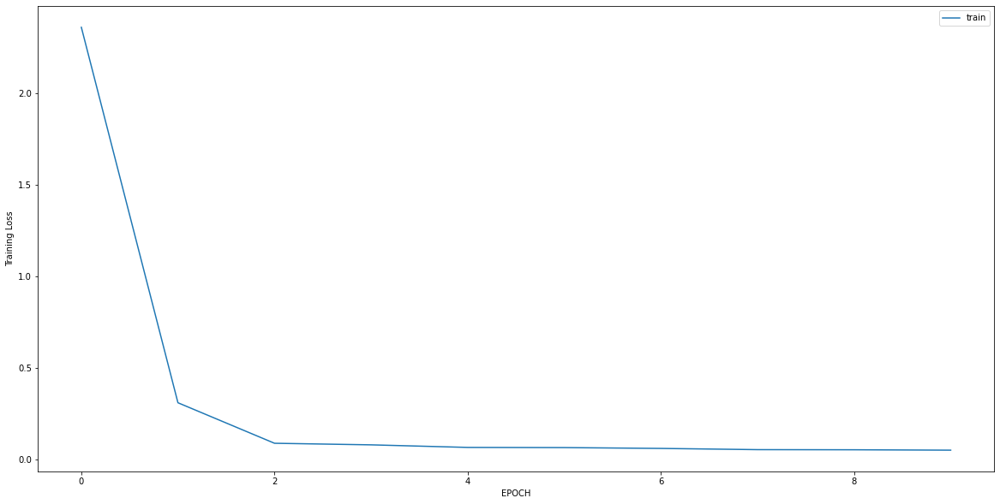

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8317 - accuracy: 0.6679
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6904 - accuracy: 0.7164
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5046 - accuracy: 0.7612
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4177 - accuracy: 0.8209
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4034 - accuracy: 0.8507
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3636 - accuracy: 0.8769
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3324 - accuracy: 0.8955
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2925 - accuracy: 0.9067
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2843 - accuracy: 0.9104
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2636 - accuracy: 0.9366


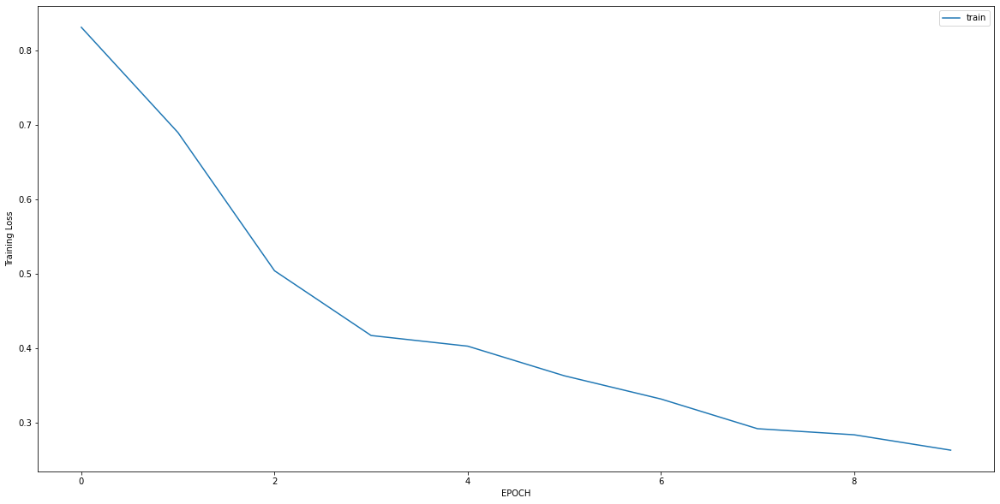

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7160 - accuracy: 0.7660
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5493 - accuracy: 0.7585
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4911 - accuracy: 0.7736
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4593 - accuracy: 0.8151
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3948 - accuracy: 0.8302
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3434 - accuracy: 0.8528
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3509 - accuracy: 0.8604
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3129 - accuracy: 0.8943
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3607 - accuracy: 0.8453
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3280 - accuracy: 0.8679


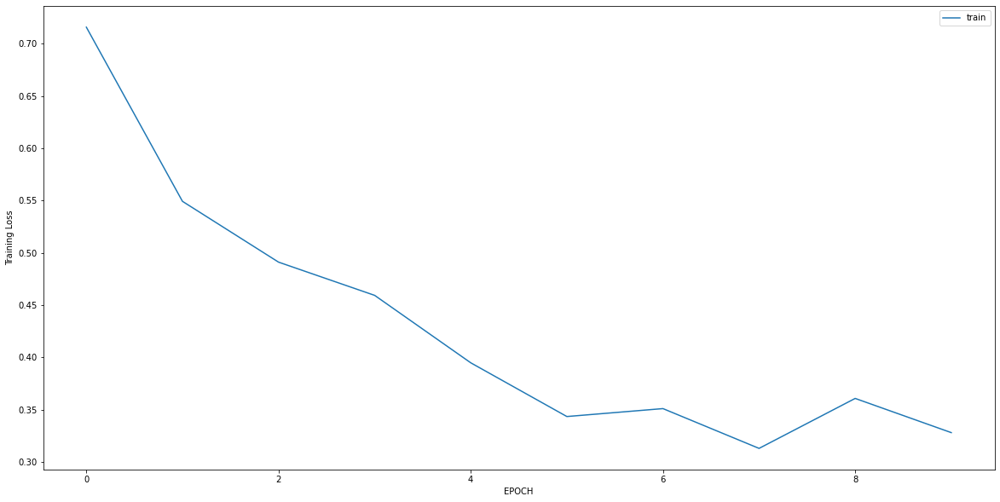

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8816 - accuracy: 0.4931
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4276 - accuracy: 0.7862
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2863 - accuracy: 0.9000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3059 - accuracy: 0.9000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2679 - accuracy: 0.9000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2422 - accuracy: 0.9276
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2172 - accuracy: 0.9483
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1821 - accuracy: 0.9586
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1635 - accuracy: 0.9655
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1692 - accuracy: 0.9586


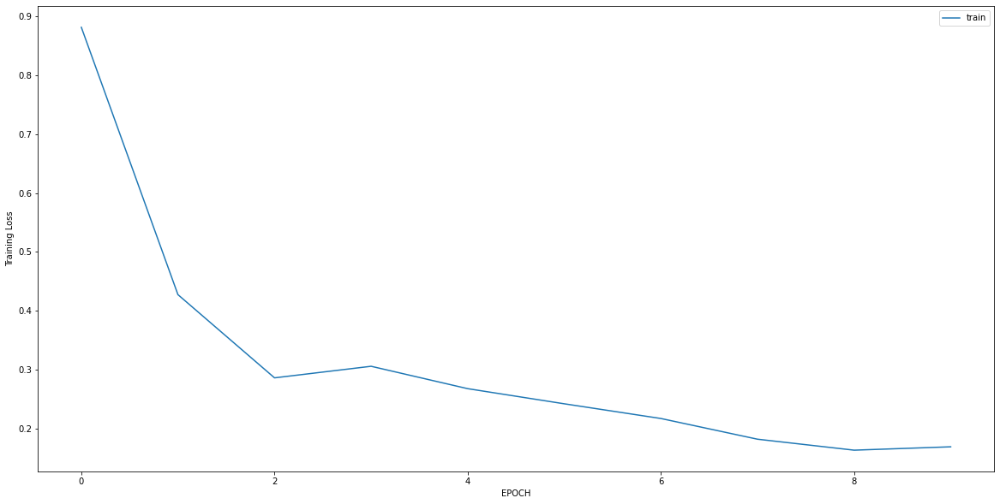

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2352 - accuracy: 0.9216
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2474 - accuracy: 0.9137
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2334 - accuracy: 0.9216
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1951 - accuracy: 0.9333
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1846 - accuracy: 0.9412
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1783 - accuracy: 0.9373
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1821 - accuracy: 0.9490
Epoch 8/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1765 - accuracy: 0.9451
Epoch 9/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2037 - accuracy: 0.9412
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1884 - accuracy: 0.9490


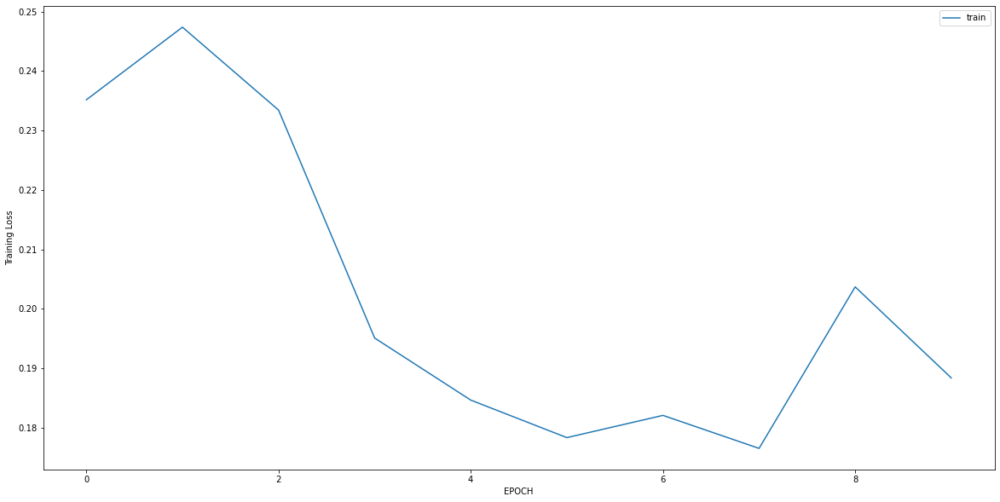

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 0.8405 - accuracy: 0.7245
Epoch 2/10
4/4 [==============================] - 0s 5ms/step - loss: 0.7613 - accuracy: 0.7245
Epoch 3/10
4/4 [==============================] - 0s 5ms/step - loss: 0.5114 - accuracy: 0.7755
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 0.2375 - accuracy: 0.8980
Epoch 5/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3939 - accuracy: 0.8367
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 0.3122 - accuracy: 0.8673
Epoch 7/10
4/4 [==============================] - 0s 5ms/step - loss: 0.4123 - accuracy: 0.7653
Epoch 8/10
4/4 [==============================] - 0s 6ms/step - loss: 0.3491 - accuracy: 0.7857
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.2797 - accuracy: 0.8776
Epoch 10/10
4/4 [==============================] - 0s 6ms/step - loss: 0.2731 - accuracy: 0.8469


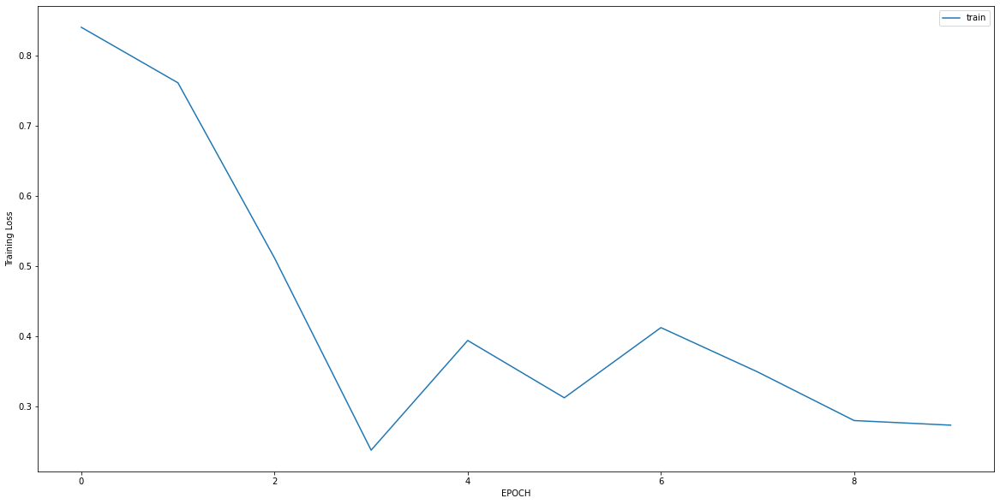

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.8391 - accuracy: 0.6523
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2939 - accuracy: 0.8444
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3131 - accuracy: 0.8974
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3110 - accuracy: 0.8642
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3061 - accuracy: 0.8709
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2927 - accuracy: 0.8576
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2555 - accuracy: 0.8874
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2556 - accuracy: 0.8874
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2546 - accuracy: 0.8907
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2580 - accuracy: 0.8874


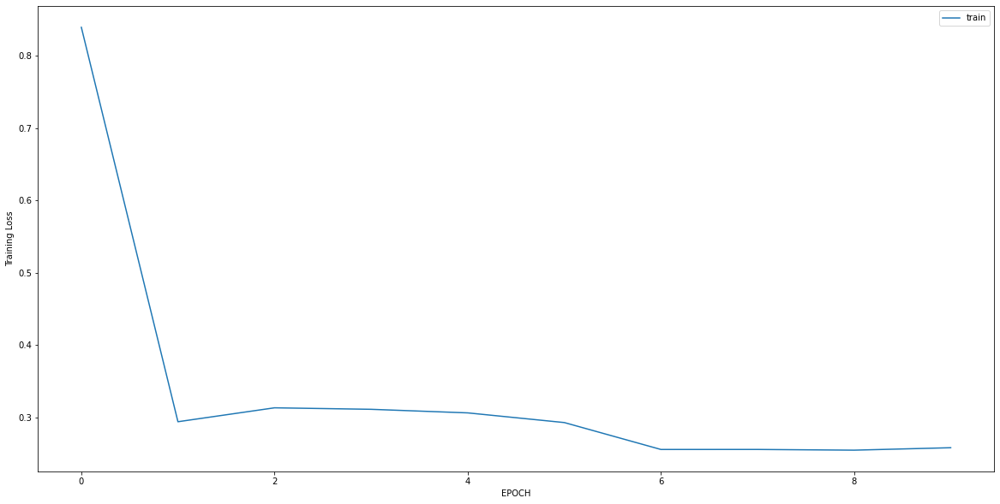

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3718 - accuracy: 0.8491
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2168 - accuracy: 0.8962
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2708 - accuracy: 0.8726
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2180 - accuracy: 0.9198
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2397 - accuracy: 0.8821
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.1984 - accuracy: 0.9151
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2680 - accuracy: 0.8585
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.2047 - accuracy: 0.9104
Epoch 9/10
7/7 [==============================] - 0s 4ms/step - loss: 0.2225 - accuracy: 0.9009
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.1715 - accuracy: 0.9340


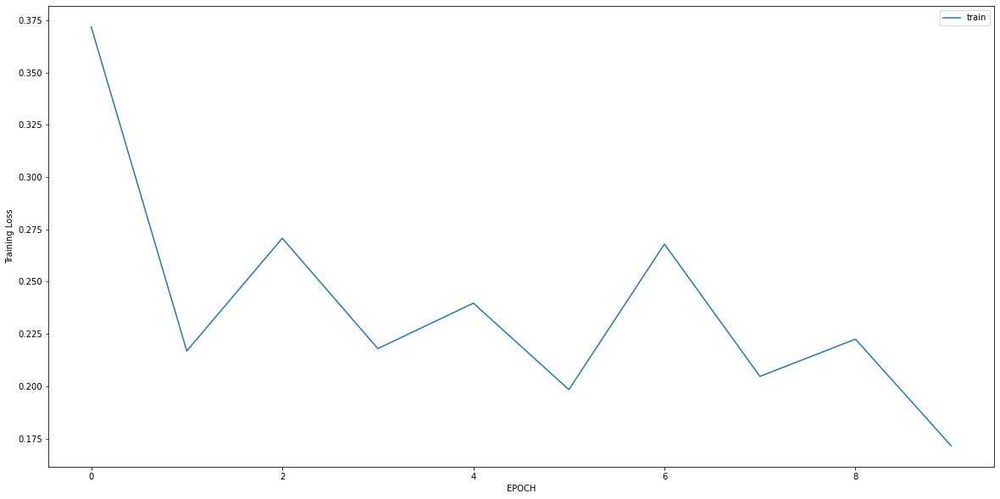

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 3.4926 - accuracy: 0.0000e+00
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 2.0640 - accuracy: 0.0280
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.8360 - accuracy: 0.4174
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.3456 - accuracy: 0.9564
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1909 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1159 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0898 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0715 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0484 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 1.0000


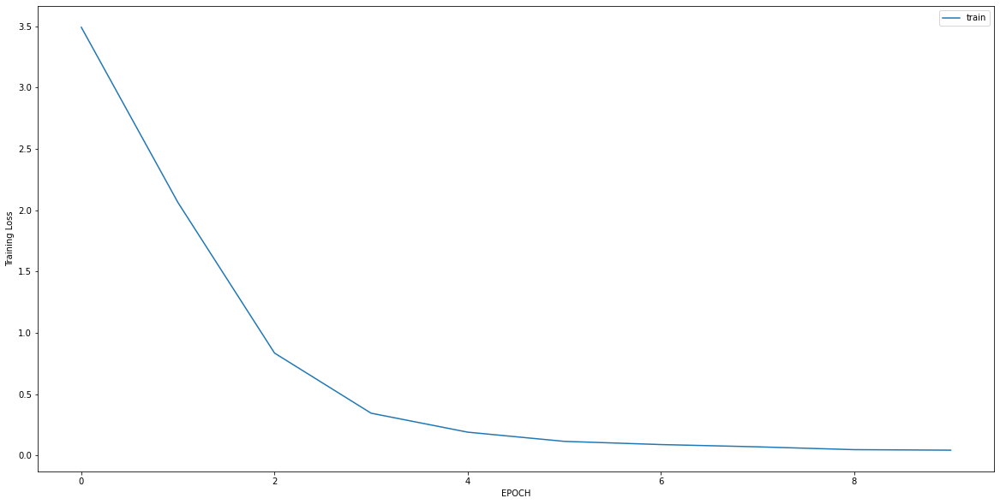

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 1.6755 - accuracy: 0.5738
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.5242 - accuracy: 0.5738
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 1.2698 - accuracy: 0.5738
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 1.0542 - accuracy: 0.5949
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.8988 - accuracy: 0.6203
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.6498
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5521 - accuracy: 0.7300
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4551 - accuracy: 0.8059
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3842 - accuracy: 0.8312
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3341 - accuracy: 0.8397


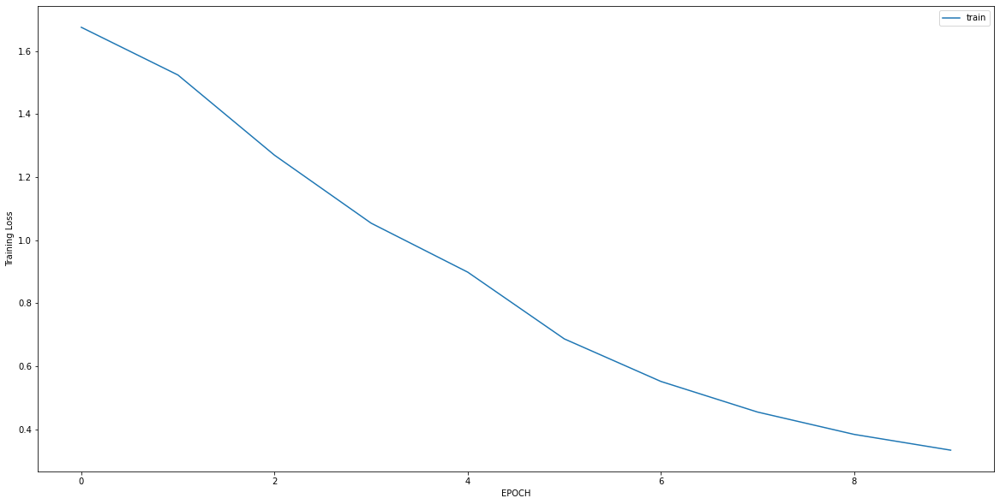

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.7860 - accuracy: 0.4857
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4360 - accuracy: 0.8490
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3204 - accuracy: 0.9551
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2152 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1796 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1410 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1211 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0970 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0868 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0780 - accuracy: 1.0000


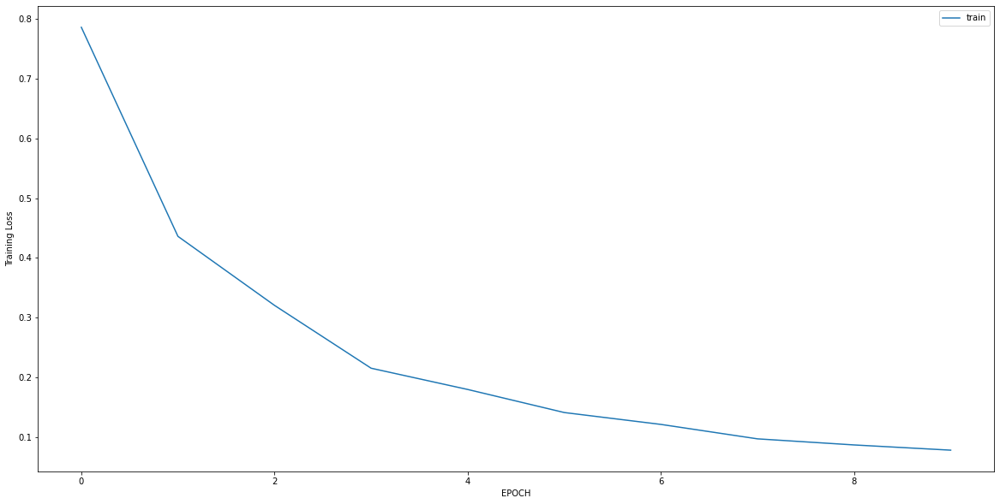

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3472 - accuracy: 0.8787
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2329 - accuracy: 0.9916
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1539 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0859 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0737 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0676 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0606 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0569 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0516 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0476 - accuracy: 1.0000


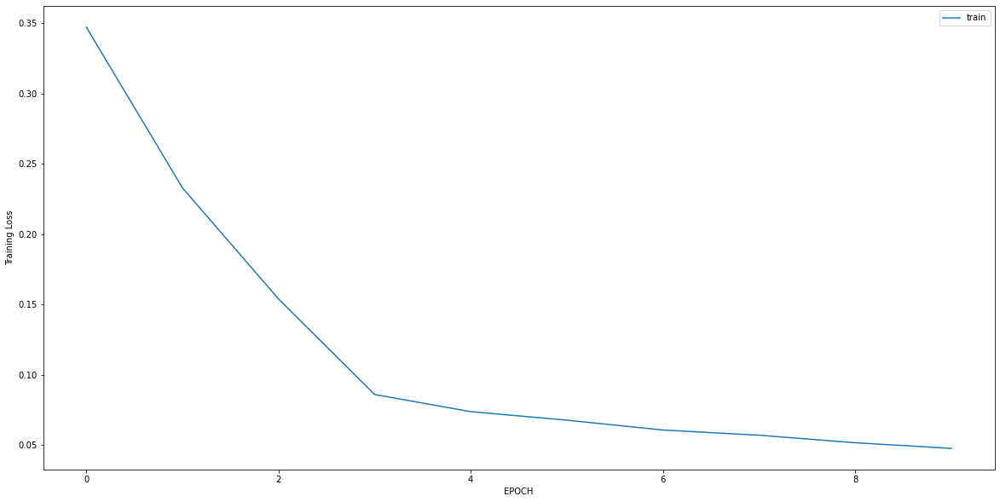

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0454 - accuracy: 1.0000
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0289 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0270 - accuracy: 1.0000


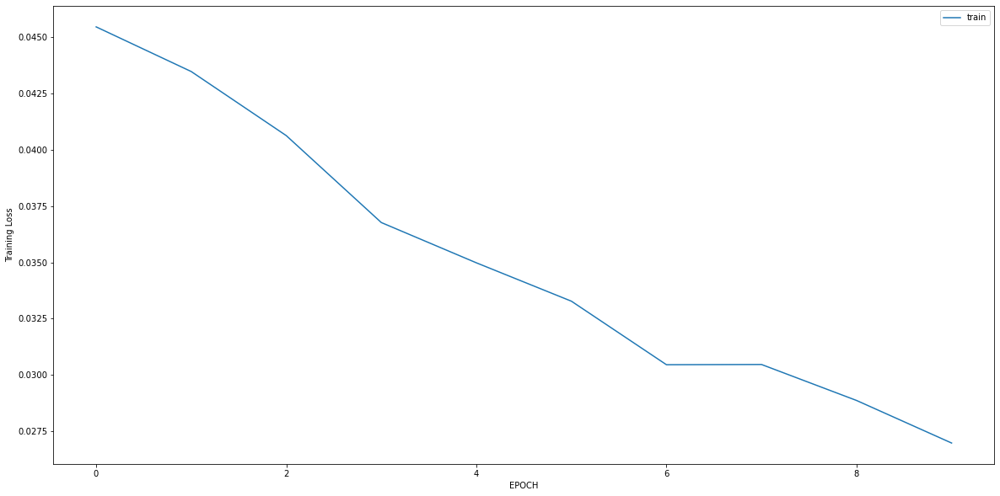

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0161 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0160 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0142 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0110 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0092 - accuracy: 1.0000


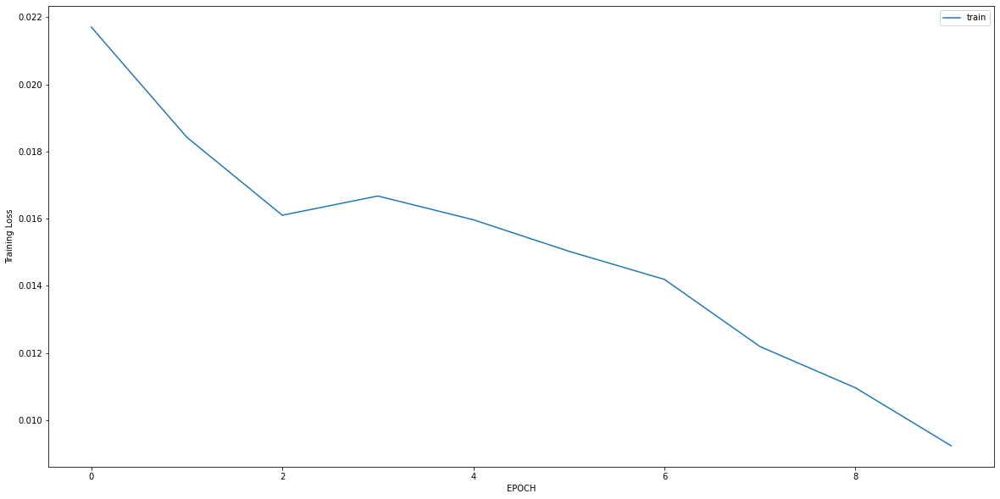

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0138 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0114 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0123 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0117 - accuracy: 1.0000


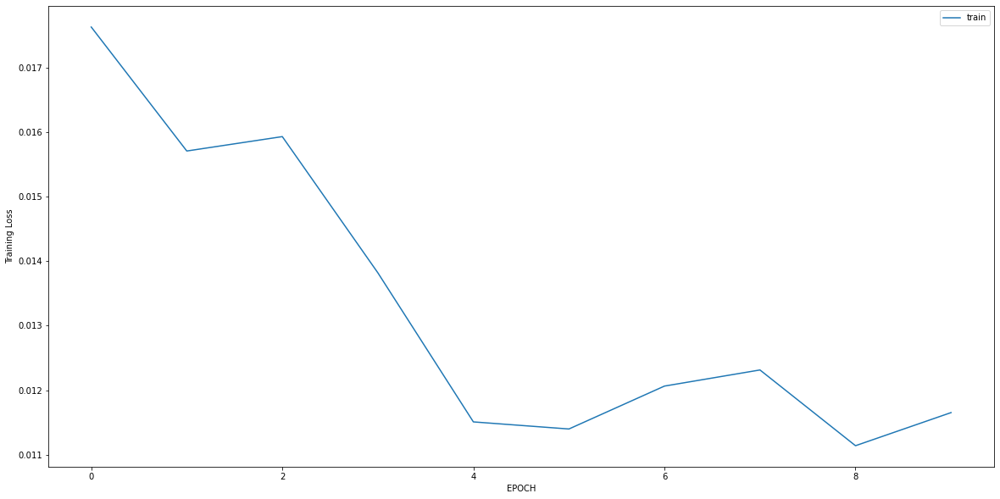

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0075 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 6ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0067 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0054 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0061 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0064 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0059 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0068 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0060 - accuracy: 1.0000


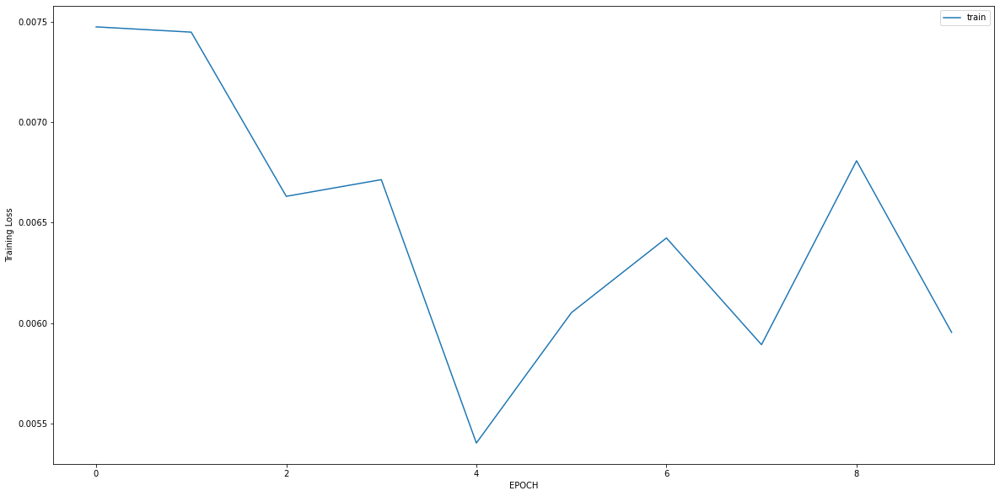

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0095 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0108 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0092 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0091 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0085 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0094 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0102 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0095 - accuracy: 1.0000


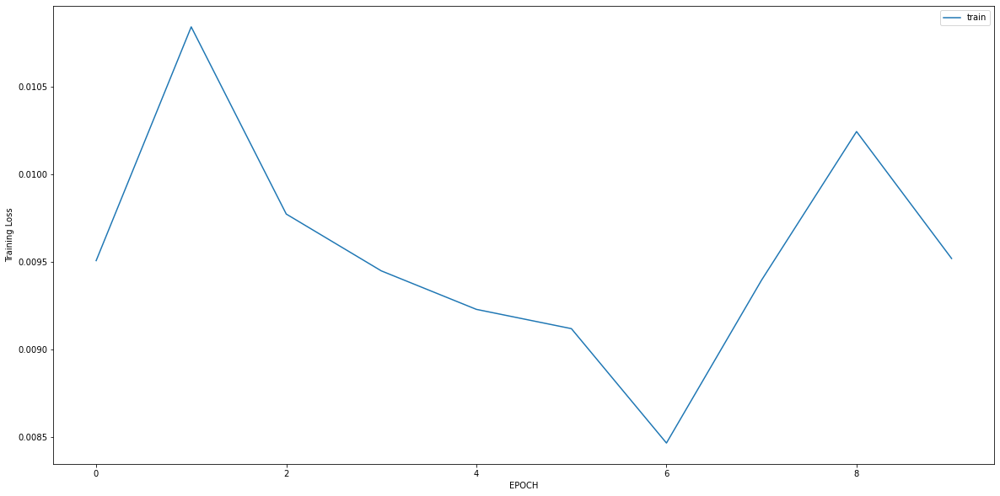

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 3.7432 - accuracy: 0.3196
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 3.2560 - accuracy: 0.3196
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 2.4257 - accuracy: 0.3196
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 1.7520 - accuracy: 0.3196
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 1.1809 - accuracy: 0.3576
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6638 - accuracy: 0.6013
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4218 - accuracy: 0.8639
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3362 - accuracy: 0.9114
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2990 - accuracy: 0.9209
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2761 - accuracy: 0.9241


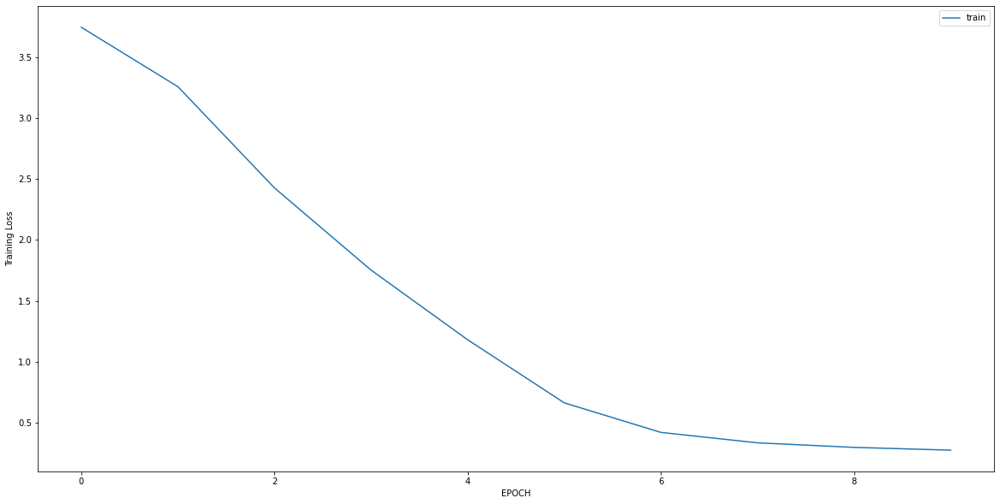

Epoch 1/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4217 - accuracy: 0.8184
Epoch 2/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2294 - accuracy: 0.9280
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1766 - accuracy: 0.9481
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1504 - accuracy: 0.9597
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1222 - accuracy: 0.9683
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1038 - accuracy: 0.9769
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0865 - accuracy: 0.9942
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0718 - accuracy: 0.9942
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0592 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0563 - accuracy: 0.9914


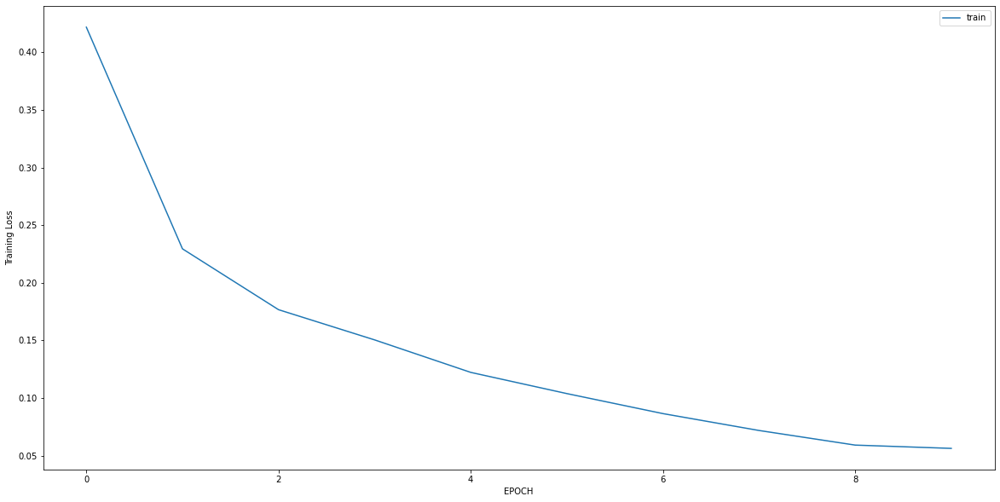

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5395 - accuracy: 0.6917
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3512 - accuracy: 0.8103
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3196 - accuracy: 0.8577
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3005 - accuracy: 0.8893
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2565 - accuracy: 0.8972
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2454 - accuracy: 0.9012
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2438 - accuracy: 0.9051
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2547 - accuracy: 0.8893
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2395 - accuracy: 0.9051
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2328 - accuracy: 0.9051


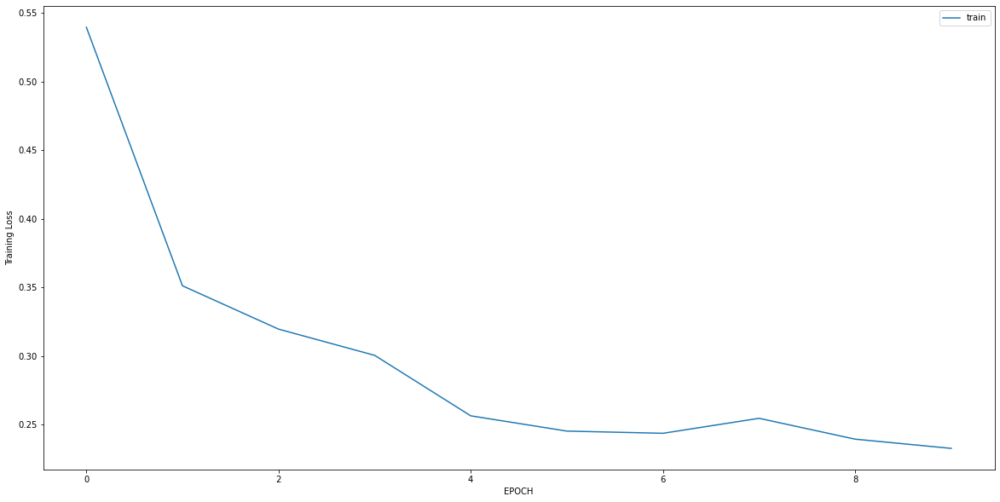

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.0585 - accuracy: 0.6513
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0272 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0295 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0264 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0234 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0202 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0187 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0170 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0159 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0133 - accuracy: 1.0000


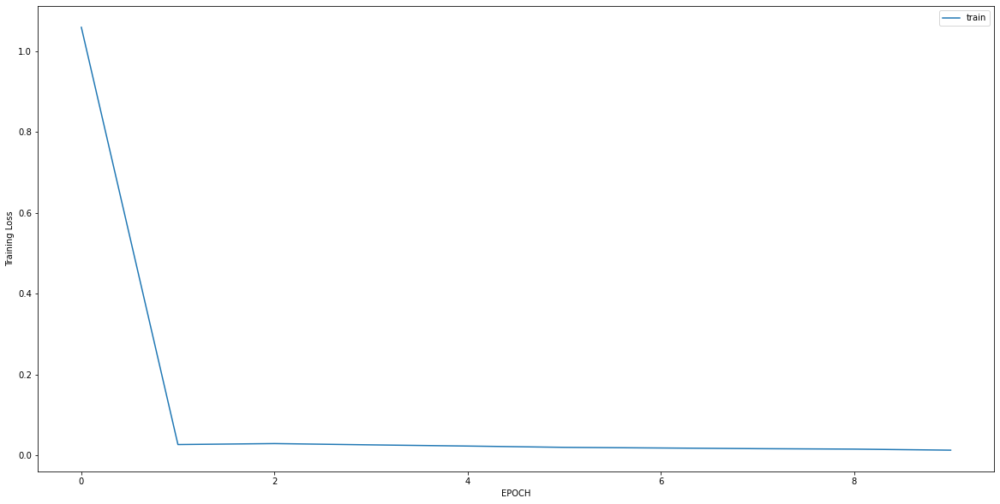

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0130 - accuracy: 1.0000
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0107 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0115 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0105 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0113 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0117 - accuracy: 1.0000


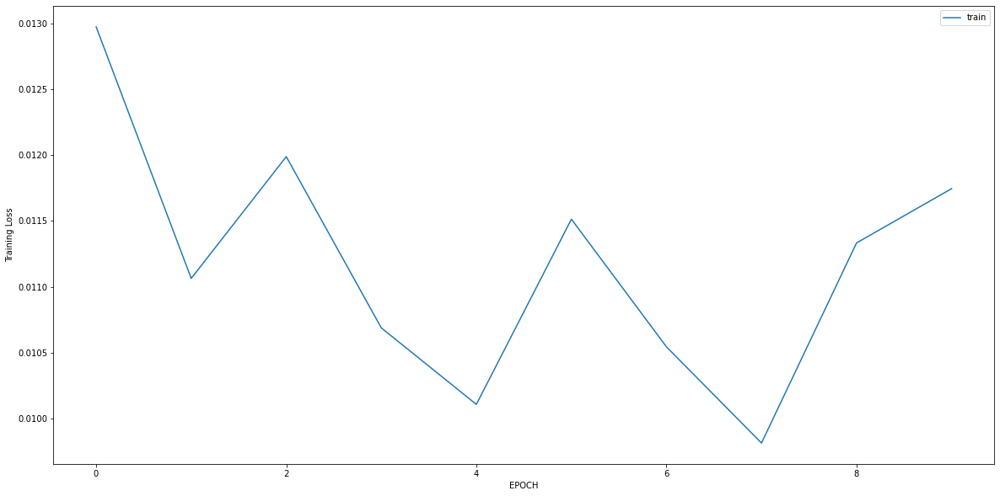

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.9813 - accuracy: 0.8088
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.7723 - accuracy: 0.8370
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.6886 - accuracy: 0.8464
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4943 - accuracy: 0.8840
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3783 - accuracy: 0.9216
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2747 - accuracy: 0.9342
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2298 - accuracy: 0.9436
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1861 - accuracy: 0.9561
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1911 - accuracy: 0.9530
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1718 - accuracy: 0.9530


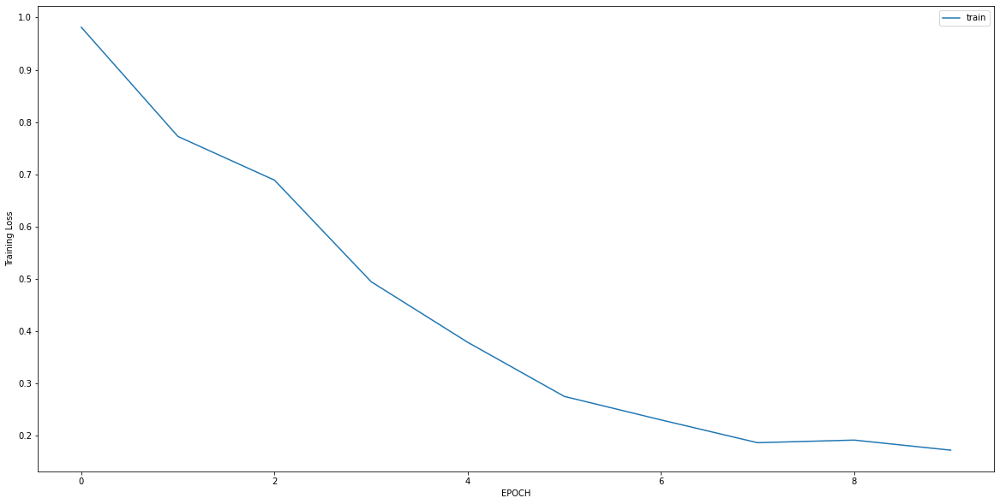

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 3.9038 - accuracy: 0.0000e+00
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 2.6231 - accuracy: 0.0036
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 1.4365 - accuracy: 0.0964
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7392 - accuracy: 0.5143
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3391 - accuracy: 0.9607
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1604 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1078 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0833 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0677 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0590 - accuracy: 1.0000


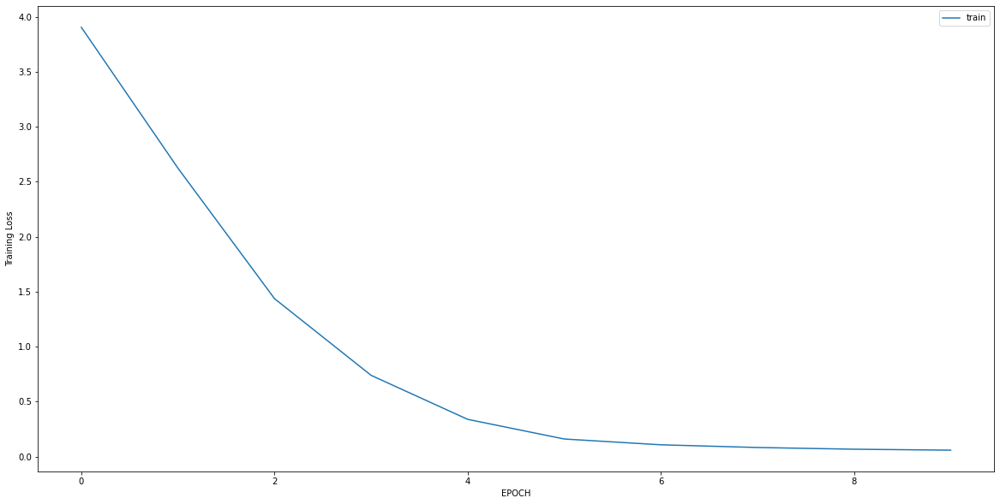

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 1.7219 - accuracy: 0.3309
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 1.6796 - accuracy: 0.3309
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 1.4465 - accuracy: 0.3309
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 1.2867 - accuracy: 0.3309
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 1.1001 - accuracy: 0.3309
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.9276 - accuracy: 0.3309
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7762 - accuracy: 0.3885
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6793 - accuracy: 0.5108
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5870 - accuracy: 0.5899
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4917 - accuracy: 0.6978


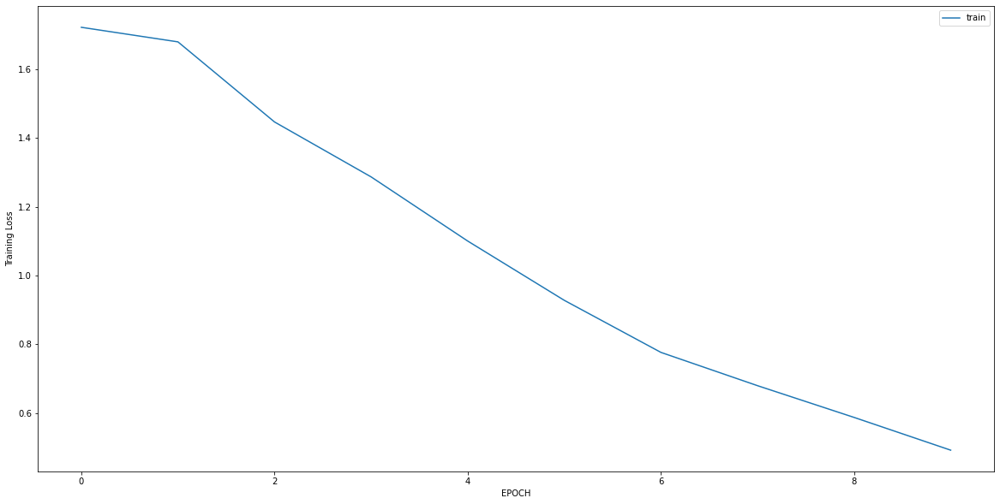

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 1.2010 - accuracy: 0.5383
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.8453 - accuracy: 0.7007
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.5966 - accuracy: 0.7819
Epoch 4/10
14/14 [==============================] - 0s 4ms/step - loss: 0.4516 - accuracy: 0.8469
Epoch 5/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2960 - accuracy: 0.9188
Epoch 6/10
14/14 [==============================] - 0s 6ms/step - loss: 0.2279 - accuracy: 0.9722
Epoch 7/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2201 - accuracy: 0.9513
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2141 - accuracy: 0.9536
Epoch 9/10
14/14 [==============================] - 0s 5ms/step - loss: 0.2080 - accuracy: 0.9443
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.2342 - accuracy: 0.9327


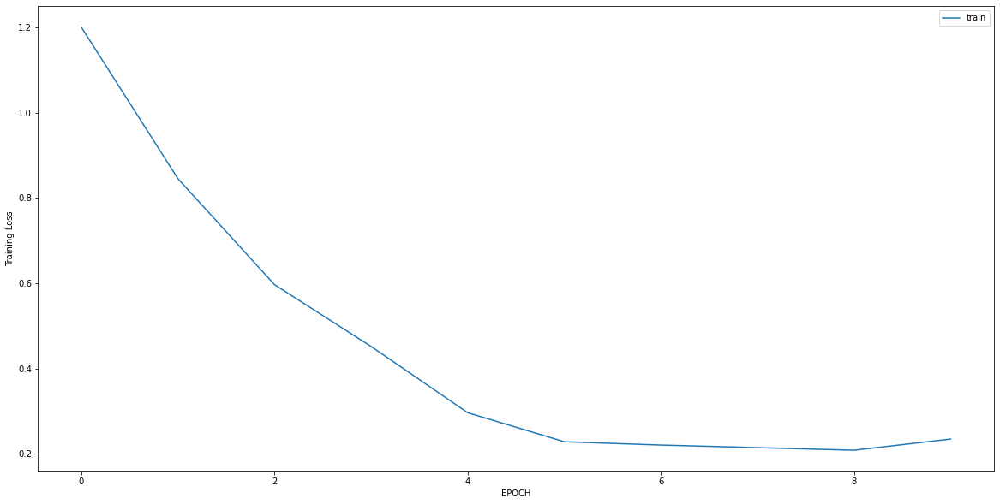

Epoch 1/10
7/7 [==============================] - 0s 5ms/step - loss: 1.1032 - accuracy: 0.6422
Epoch 2/10
7/7 [==============================] - 0s 6ms/step - loss: 0.9758 - accuracy: 0.6468
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.9362 - accuracy: 0.6468
Epoch 4/10
7/7 [==============================] - 0s 4ms/step - loss: 0.8036 - accuracy: 0.6514
Epoch 5/10
7/7 [==============================] - 0s 4ms/step - loss: 0.7130 - accuracy: 0.6560
Epoch 6/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6702 - accuracy: 0.6422
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.6771 - accuracy: 0.6330
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5977 - accuracy: 0.6697
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.5887 - accuracy: 0.6789
Epoch 10/10
7/7 [==============================] - 0s 4ms/step - loss: 0.5997 - accuracy: 0.6606


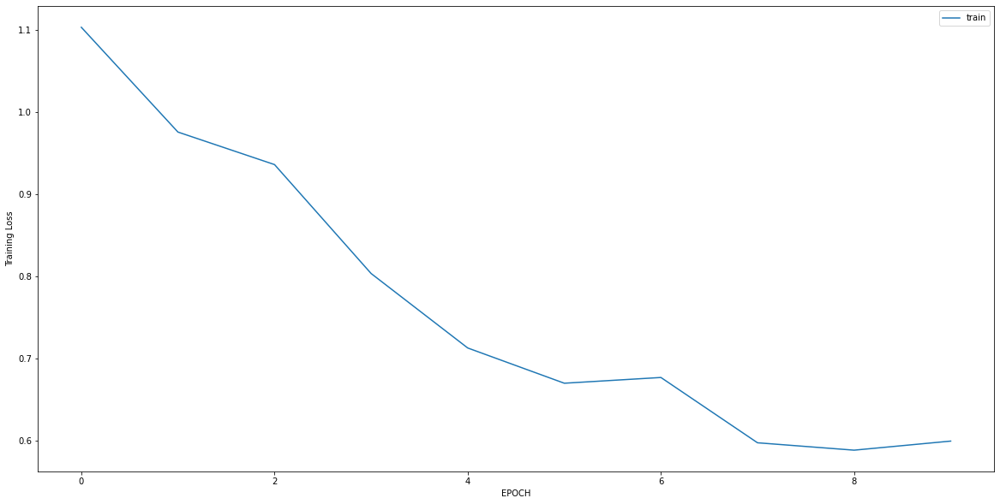

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7244 - accuracy: 0.6509
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4583 - accuracy: 0.8428
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3812 - accuracy: 0.8742
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3298 - accuracy: 0.9088
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2636 - accuracy: 0.9371
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2349 - accuracy: 0.9497
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1975 - accuracy: 0.9843
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1869 - accuracy: 0.9811
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1787 - accuracy: 0.9906
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1556 - accuracy: 0.9843


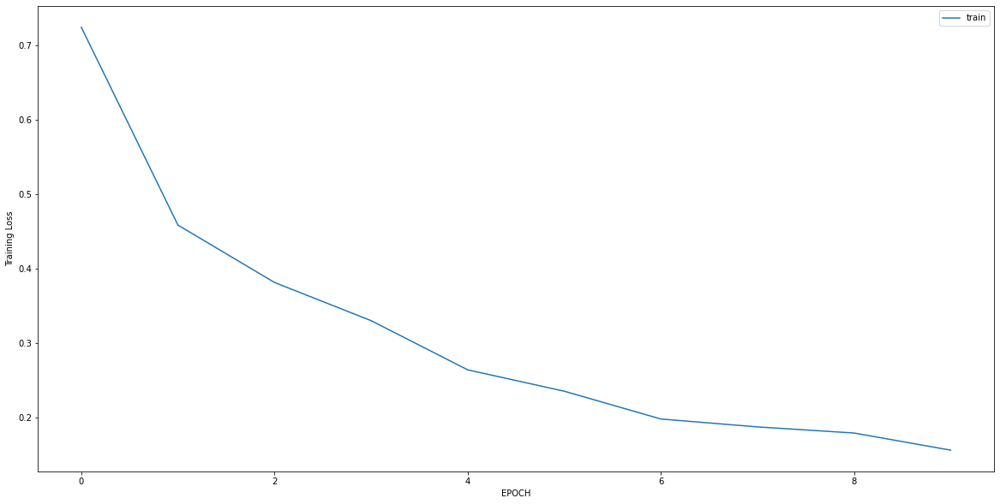

Epoch 1/10
15/15 [==============================] - 0s 5ms/step - loss: 1.0332 - accuracy: 0.5702
Epoch 2/10
15/15 [==============================] - 0s 5ms/step - loss: 0.6515 - accuracy: 0.6695
Epoch 3/10
15/15 [==============================] - 0s 5ms/step - loss: 0.4158 - accuracy: 0.8553
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3839 - accuracy: 0.8639
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3660 - accuracy: 0.9071
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3131 - accuracy: 0.9136
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3137 - accuracy: 0.9136
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 0.3015 - accuracy: 0.9050
Epoch 9/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2930 - accuracy: 0.9158
Epoch 10/10
15/15 [==============================] - 0s 4ms/step - loss: 0.2742 - accuracy: 0.9266


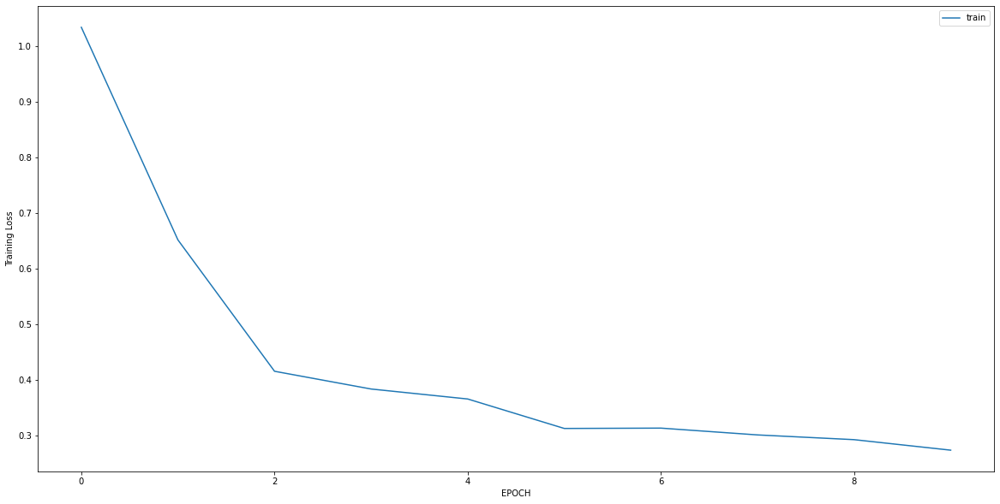

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.8173 - accuracy: 0.7153
Epoch 2/10
5/5 [==============================] - 0s 7ms/step - loss: 0.8695 - accuracy: 0.7153
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7797 - accuracy: 0.7153
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.8243 - accuracy: 0.7222
Epoch 5/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7371 - accuracy: 0.7083
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.7201 - accuracy: 0.7083
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.7098 - accuracy: 0.7153
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5981 - accuracy: 0.7153
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6253 - accuracy: 0.7153
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5825 - accuracy: 0.7153


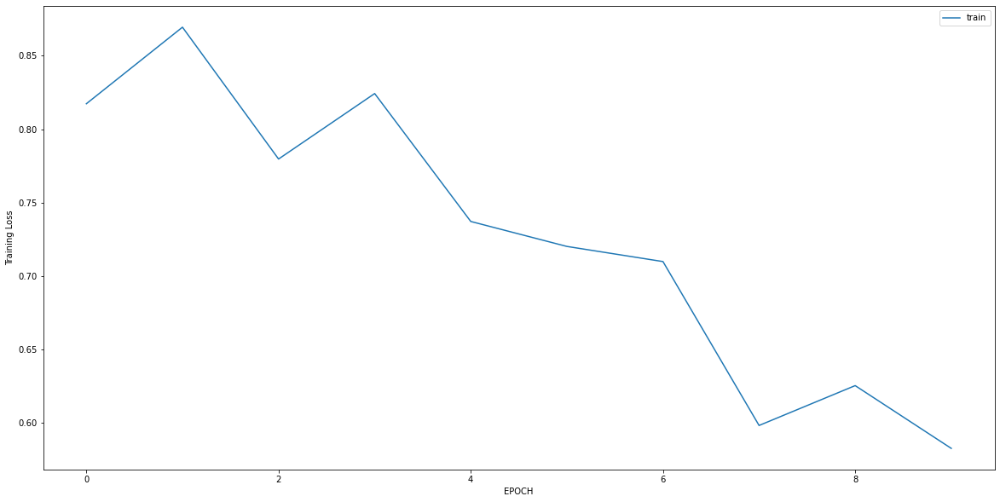

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9501 - accuracy: 0.5193
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.8256 - accuracy: 0.5053
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7290 - accuracy: 0.5158
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.7020 - accuracy: 0.5544
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6906 - accuracy: 0.5123
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6324 - accuracy: 0.6175
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6271 - accuracy: 0.6386
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6084 - accuracy: 0.6772
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6210 - accuracy: 0.6772
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.6004 - accuracy: 0.6807


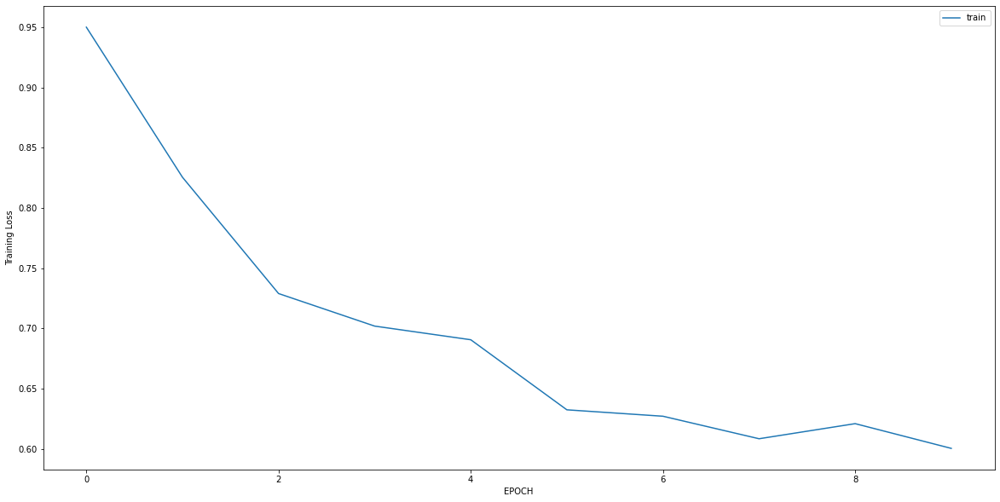

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.3553 - accuracy: 0.8333
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3310 - accuracy: 0.8532
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2747 - accuracy: 0.9167
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2553 - accuracy: 0.9325
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2393 - accuracy: 0.9405
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2173 - accuracy: 0.9524
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1834 - accuracy: 0.9921
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1747 - accuracy: 0.9881
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1760 - accuracy: 0.9881
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1606 - accuracy: 0.9921


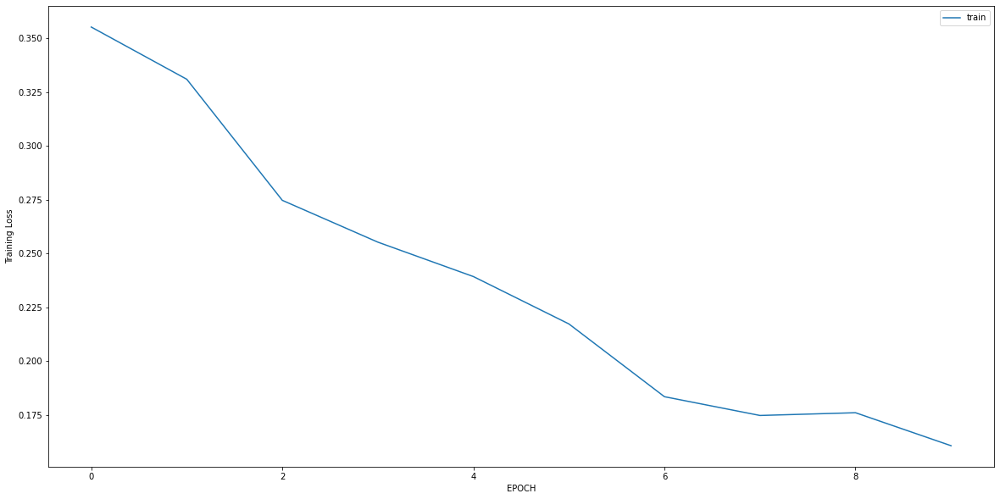

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.7576 - accuracy: 0.5464
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.6457 - accuracy: 0.5876
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5831 - accuracy: 0.6460
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5381 - accuracy: 0.7113
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5463 - accuracy: 0.7251
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.5013 - accuracy: 0.8144
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4852 - accuracy: 0.8179
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4739 - accuracy: 0.8351
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.4664 - accuracy: 0.8144
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.4517 - accuracy: 0.8625


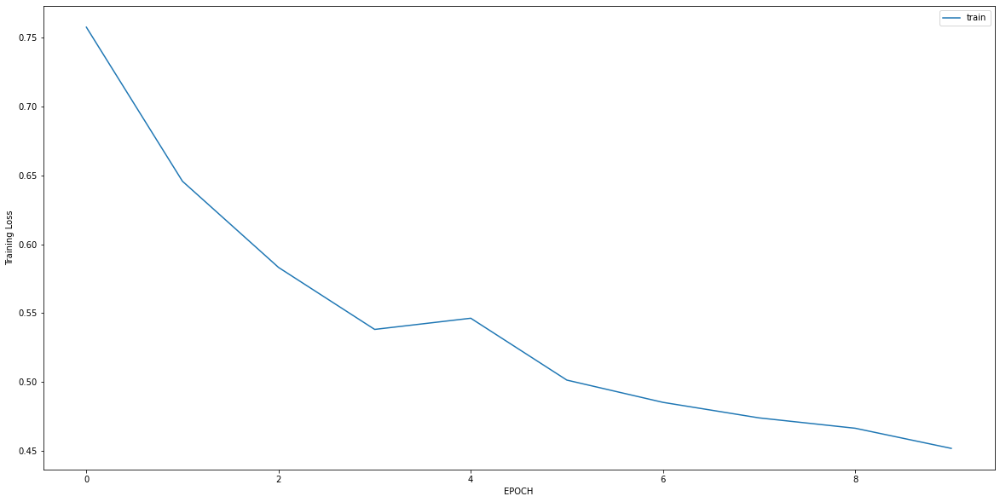

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.3502 - accuracy: 0.0843
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9531 - accuracy: 0.2759
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6348 - accuracy: 0.6398
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4166 - accuracy: 0.9119
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2898 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2212 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1780 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1514 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1170 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0949 - accuracy: 1.0000


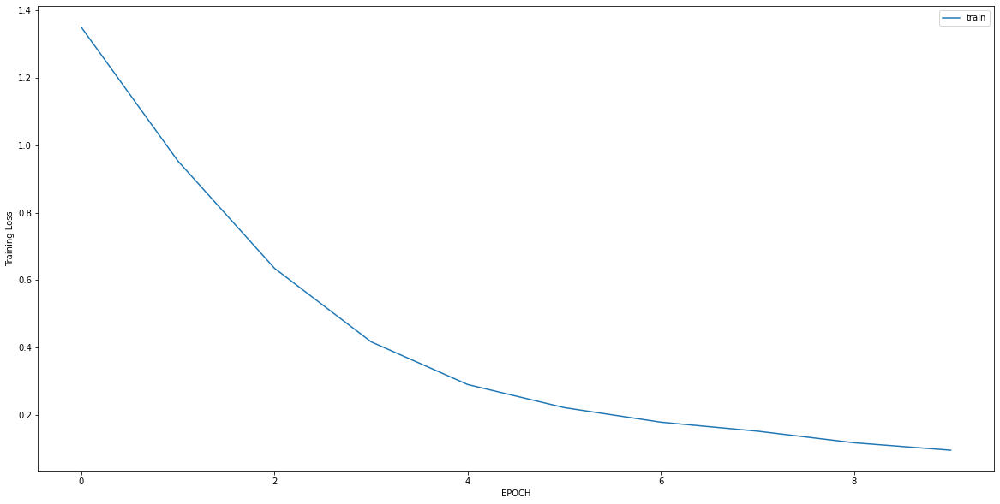

Epoch 1/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0810 - accuracy: 1.0000
Epoch 2/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0817 - accuracy: 1.0000
Epoch 3/10
2/2 [==============================] - 0s 8ms/step - loss: 0.0726 - accuracy: 1.0000
Epoch 4/10
2/2 [==============================] - 0s 8ms/step - loss: 0.0727 - accuracy: 1.0000
Epoch 5/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0725 - accuracy: 1.0000
Epoch 6/10
2/2 [==============================] - 0s 6ms/step - loss: 0.0675 - accuracy: 1.0000
Epoch 7/10
2/2 [==============================] - 0s 5ms/step - loss: 0.0727 - accuracy: 1.0000
Epoch 8/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0654 - accuracy: 1.0000
Epoch 9/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0706 - accuracy: 1.0000
Epoch 10/10
2/2 [==============================] - 0s 7ms/step - loss: 0.0669 - accuracy: 1.0000


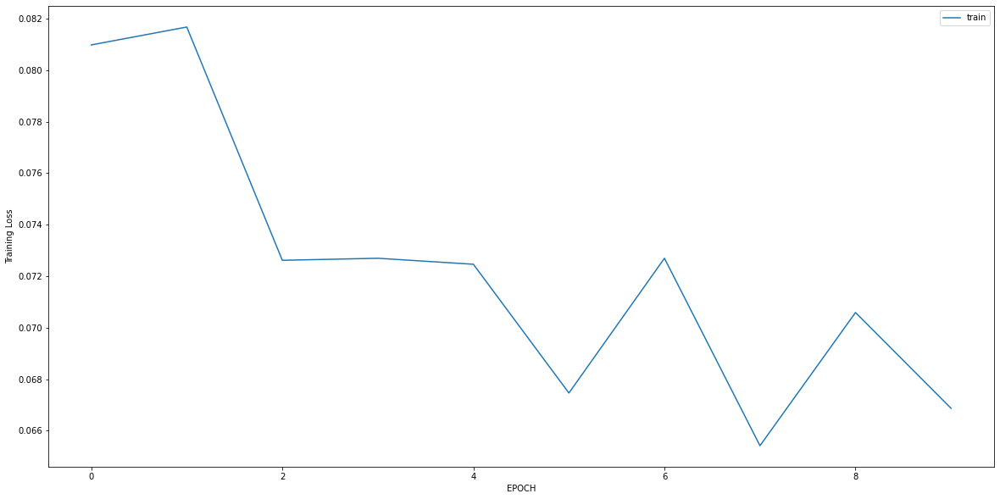

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.6358 - accuracy: 0.4484
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.4575 - accuracy: 0.4484
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 1.1934 - accuracy: 0.4484
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.9534 - accuracy: 0.4662
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7508 - accuracy: 0.5445
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6376 - accuracy: 0.6085
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6031 - accuracy: 0.6797
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5894 - accuracy: 0.6904
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5386 - accuracy: 0.7651
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5186 - accuracy: 0.8078


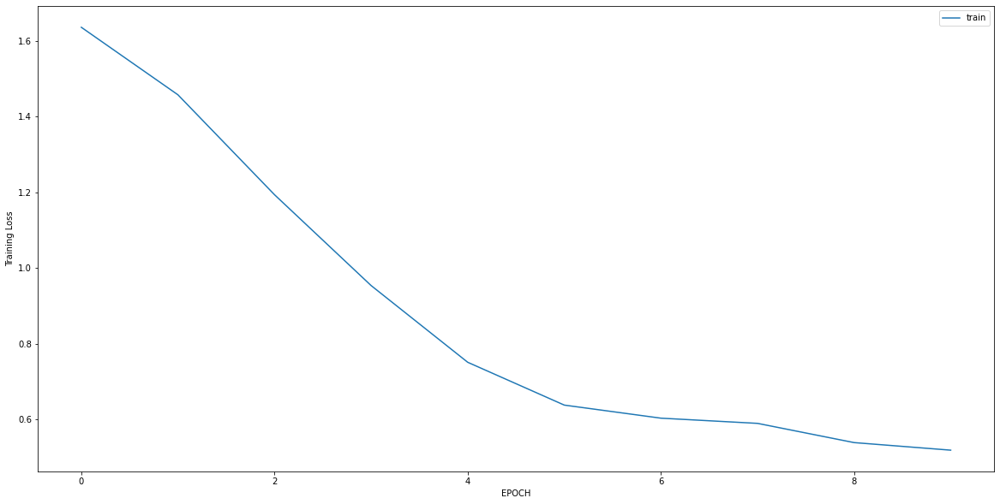

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.5466 - accuracy: 0.7579
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5197 - accuracy: 0.8016
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5189 - accuracy: 0.8135
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4868 - accuracy: 0.8294
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4717 - accuracy: 0.8373
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4295 - accuracy: 0.9048
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4376 - accuracy: 0.8810
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3942 - accuracy: 0.8929
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3614 - accuracy: 0.9048
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3722 - accuracy: 0.9008


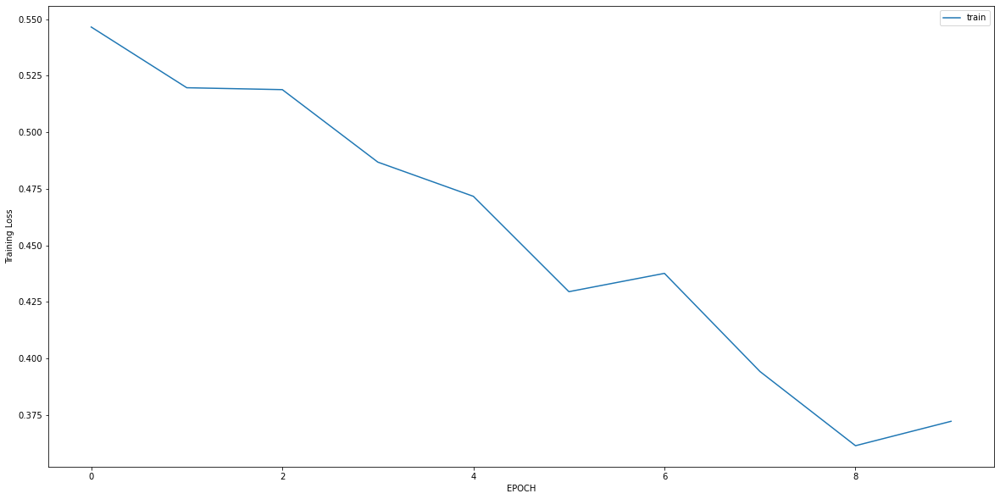

Epoch 1/10
7/7 [==============================] - 0s 6ms/step - loss: 0.4616 - accuracy: 0.7925
Epoch 2/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4571 - accuracy: 0.8113
Epoch 3/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4623 - accuracy: 0.7594
Epoch 4/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3898 - accuracy: 0.8679
Epoch 5/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4338 - accuracy: 0.7877
Epoch 6/10
7/7 [==============================] - 0s 4ms/step - loss: 0.4113 - accuracy: 0.8255
Epoch 7/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3956 - accuracy: 0.8255
Epoch 8/10
7/7 [==============================] - 0s 5ms/step - loss: 0.4192 - accuracy: 0.7925
Epoch 9/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3951 - accuracy: 0.8208
Epoch 10/10
7/7 [==============================] - 0s 5ms/step - loss: 0.3783 - accuracy: 0.8208


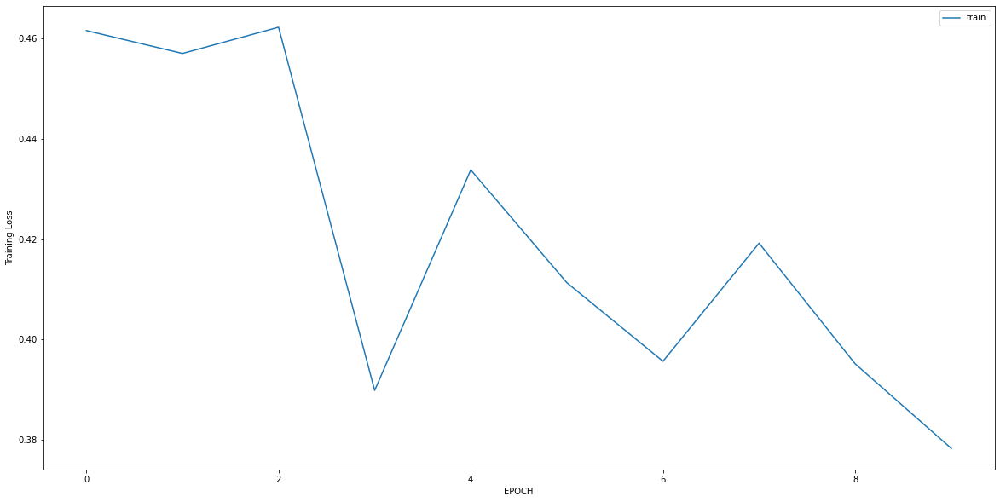

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.9534 - accuracy: 0.4242
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3683 - accuracy: 0.9091
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1385 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0593 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0438 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0325 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0273 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0272 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0231 - accuracy: 1.0000


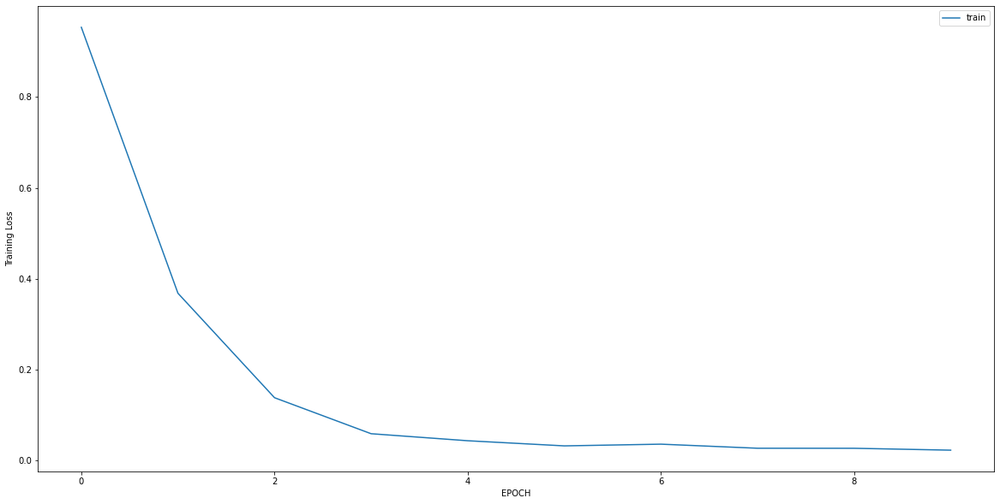

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.8312 - accuracy: 0.6838
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3986 - accuracy: 0.8419
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2986 - accuracy: 0.9007
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2843 - accuracy: 0.9375
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2420 - accuracy: 0.9375
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2495 - accuracy: 0.9449
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2316 - accuracy: 0.9485
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2223 - accuracy: 0.9522
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1954 - accuracy: 0.9522
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1776 - accuracy: 0.9559


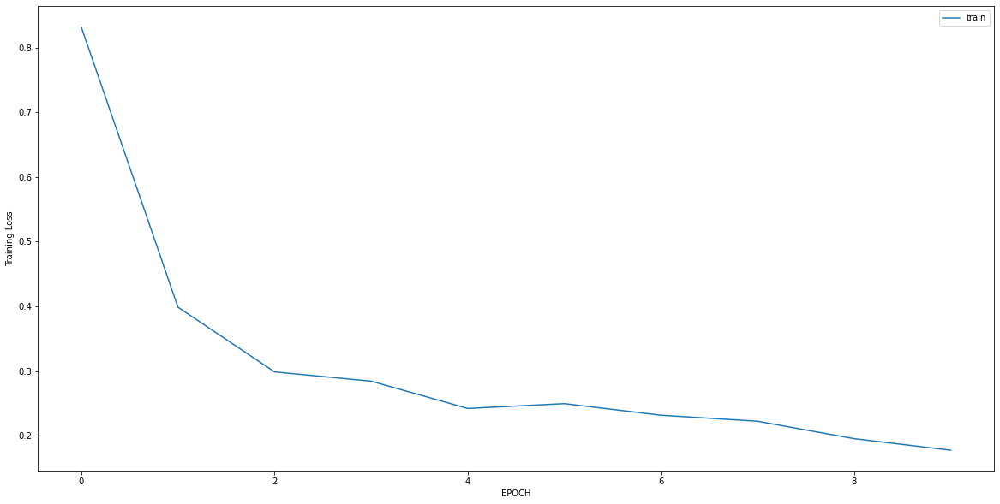

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.2350 - accuracy: 0.9697
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0917 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0646 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0510 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0443 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 1.0000


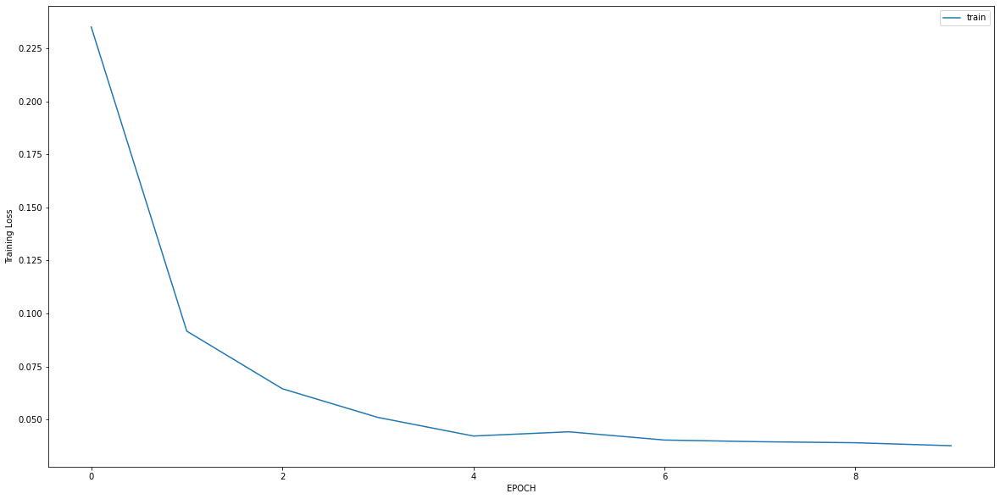

Epoch 1/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0465 - accuracy: 1.0000
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 3/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 1.0000
Epoch 4/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 5/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 1.0000
Epoch 6/10
12/12 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 1.0000
Epoch 7/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0312 - accuracy: 1.0000
Epoch 9/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0288 - accuracy: 1.0000
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 0.0286 - accuracy: 1.0000


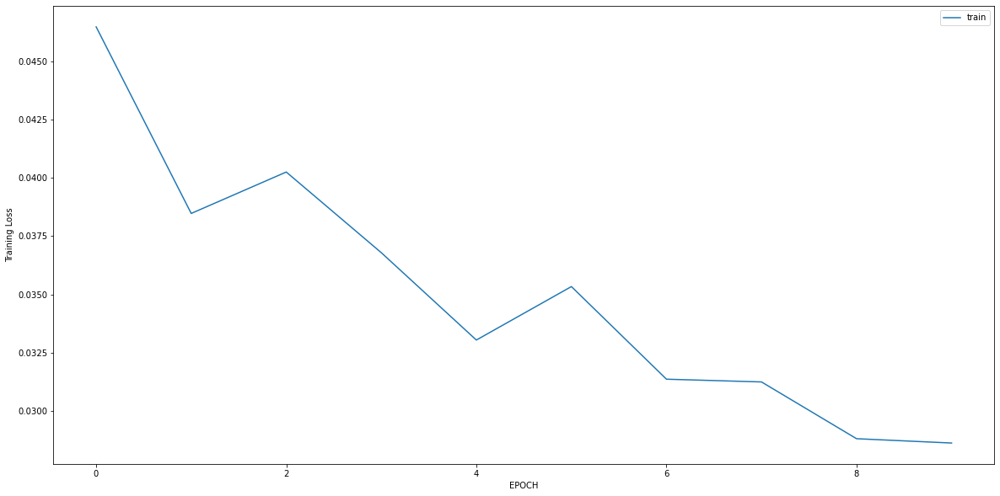

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0468 - accuracy: 1.0000
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 1.0000
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0196 - accuracy: 1.0000
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0192 - accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0139 - accuracy: 1.0000
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0134 - accuracy: 1.0000
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0120 - accuracy: 1.0000
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0121 - accuracy: 1.0000


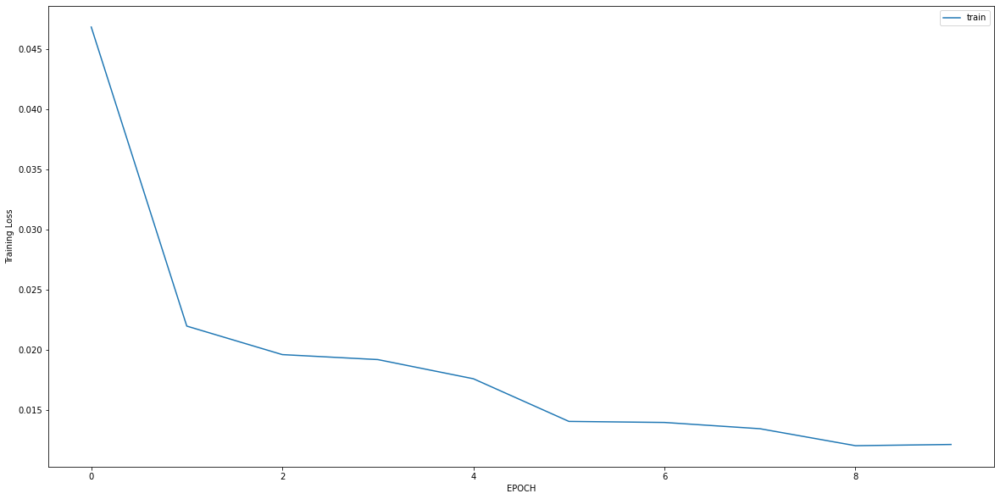

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 2.1398 - accuracy: 0.4419
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 1.2221 - accuracy: 0.6479
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5111 - accuracy: 0.7865
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3892 - accuracy: 0.8689
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3750 - accuracy: 0.8539
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3207 - accuracy: 0.8914
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3533 - accuracy: 0.8989
Epoch 8/10
9/9 [==============================] - 0s 6ms/step - loss: 0.2855 - accuracy: 0.9176
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2732 - accuracy: 0.9176
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2741 - accuracy: 0.9176


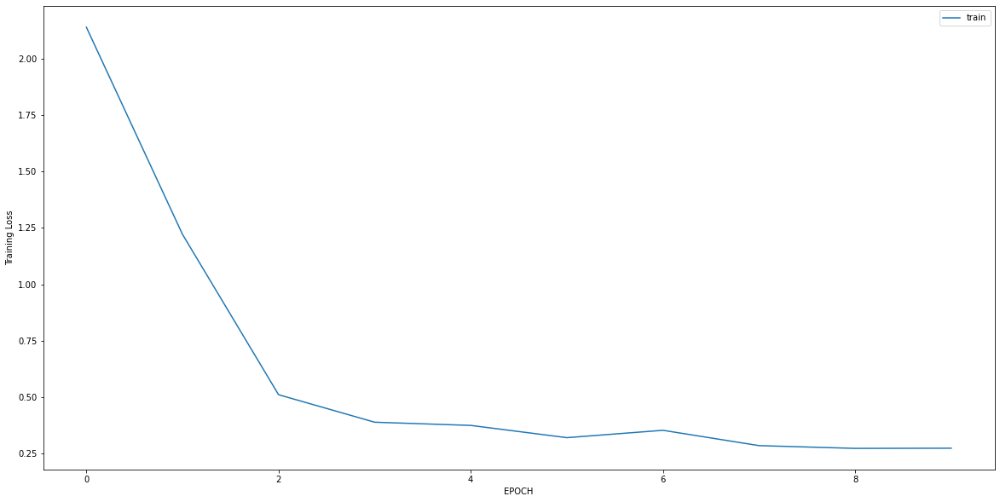

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.5676 - accuracy: 0.6921
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2919 - accuracy: 0.8808
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.3038 - accuracy: 0.8974
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2851 - accuracy: 0.8808
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2373 - accuracy: 0.9172
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2450 - accuracy: 0.9106
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2426 - accuracy: 0.9172
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2376 - accuracy: 0.9073
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2202 - accuracy: 0.9106
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2060 - accuracy: 0.9305


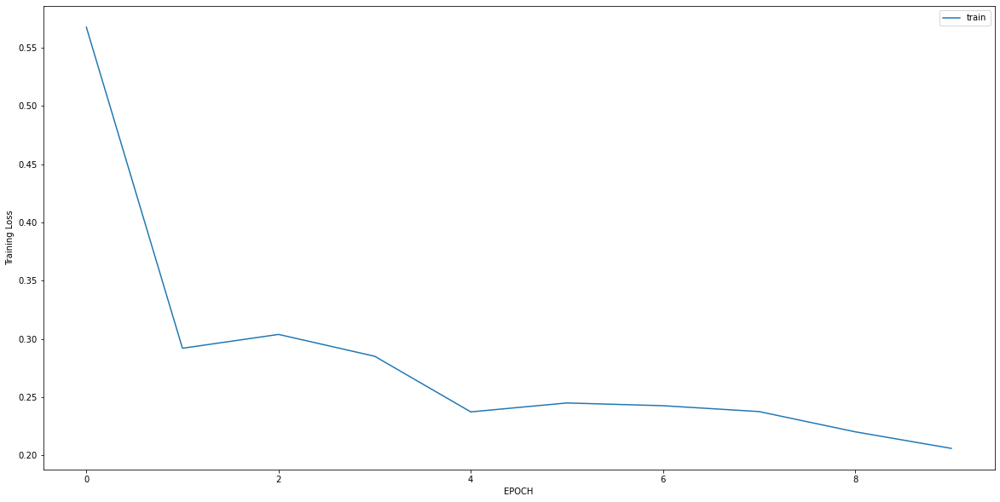

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3787 - accuracy: 0.8642
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3112 - accuracy: 0.8943
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2594 - accuracy: 0.8981
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2391 - accuracy: 0.8943
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2376 - accuracy: 0.8943
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2164 - accuracy: 0.9132
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2124 - accuracy: 0.8981
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2070 - accuracy: 0.9094
Epoch 9/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1891 - accuracy: 0.9170
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1691 - accuracy: 0.9396


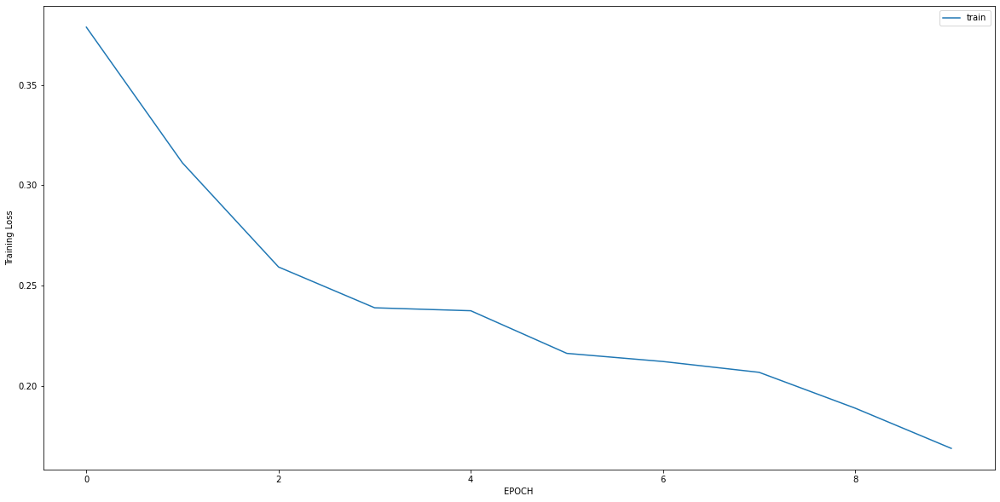

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.3893 - accuracy: 0.8221
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2306 - accuracy: 0.9075
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2031 - accuracy: 0.9146
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.1456 - accuracy: 0.9502
Epoch 5/10
9/9 [==============================] - 0s 7ms/step - loss: 0.1309 - accuracy: 0.9644
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1022 - accuracy: 0.9680
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0889 - accuracy: 0.9751
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0801 - accuracy: 0.9858
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.0839 - accuracy: 0.9822
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.0768 - accuracy: 0.9893


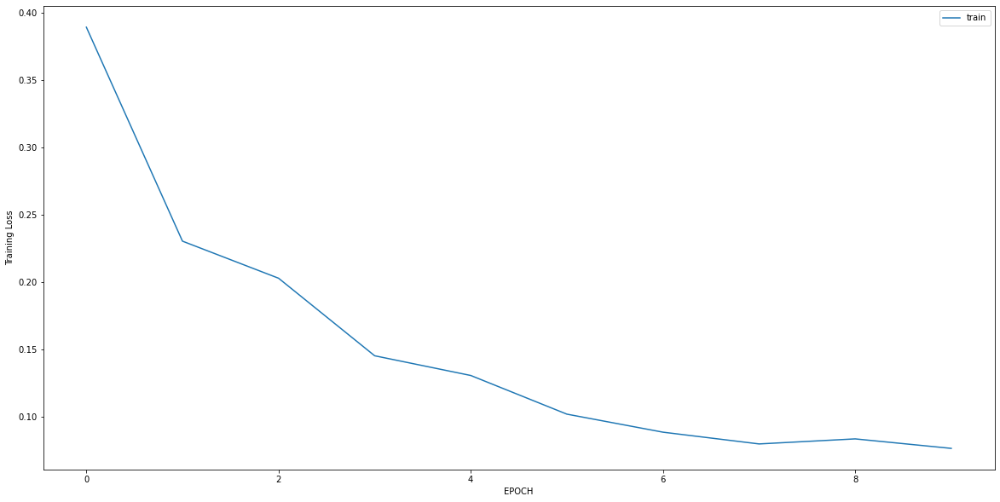

Epoch 1/10
6/6 [==============================] - 0s 6ms/step - loss: 4.0455 - accuracy: 0.0000e+00
Epoch 2/10
6/6 [==============================] - 0s 5ms/step - loss: 3.0985 - accuracy: 0.0000e+00
Epoch 3/10
6/6 [==============================] - 0s 5ms/step - loss: 1.2550 - accuracy: 0.2333
Epoch 4/10
6/6 [==============================] - 0s 5ms/step - loss: 0.5577 - accuracy: 0.7833
Epoch 5/10
6/6 [==============================] - 0s 5ms/step - loss: 0.3657 - accuracy: 0.9722
Epoch 6/10
6/6 [==============================] - 0s 4ms/step - loss: 0.2738 - accuracy: 1.0000
Epoch 7/10
6/6 [==============================] - 0s 5ms/step - loss: 0.2200 - accuracy: 1.0000
Epoch 8/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1670 - accuracy: 1.0000
Epoch 9/10
6/6 [==============================] - 0s 5ms/step - loss: 0.1303 - accuracy: 1.0000
Epoch 10/10
6/6 [==============================] - 0s 4ms/step - loss: 0.1005 - accuracy: 1.0000


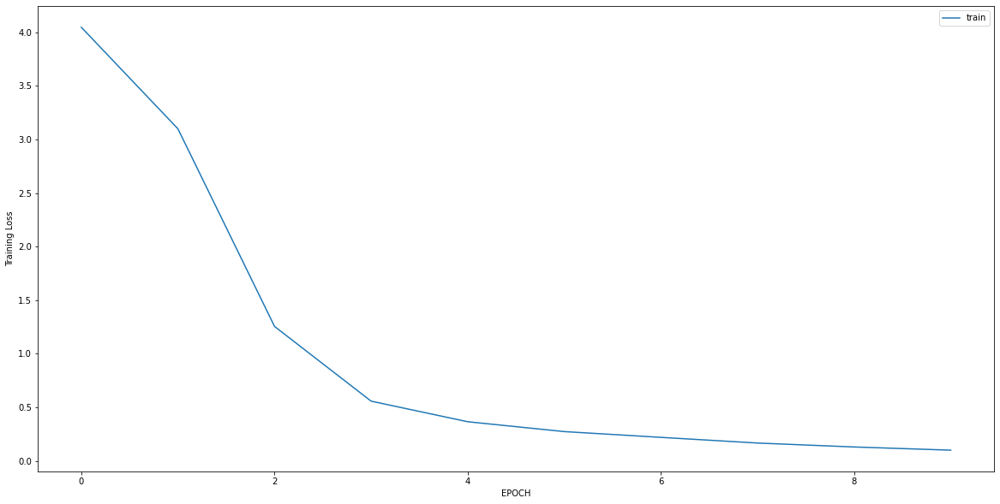

Epoch 1/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7992 - accuracy: 0.5731
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6661 - accuracy: 0.6443
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5957 - accuracy: 0.7036
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5166 - accuracy: 0.7312
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4712 - accuracy: 0.7866
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4471 - accuracy: 0.7905
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3656 - accuracy: 0.8498
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3238 - accuracy: 0.9091
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2886 - accuracy: 0.8972
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3035 - accuracy: 0.8735


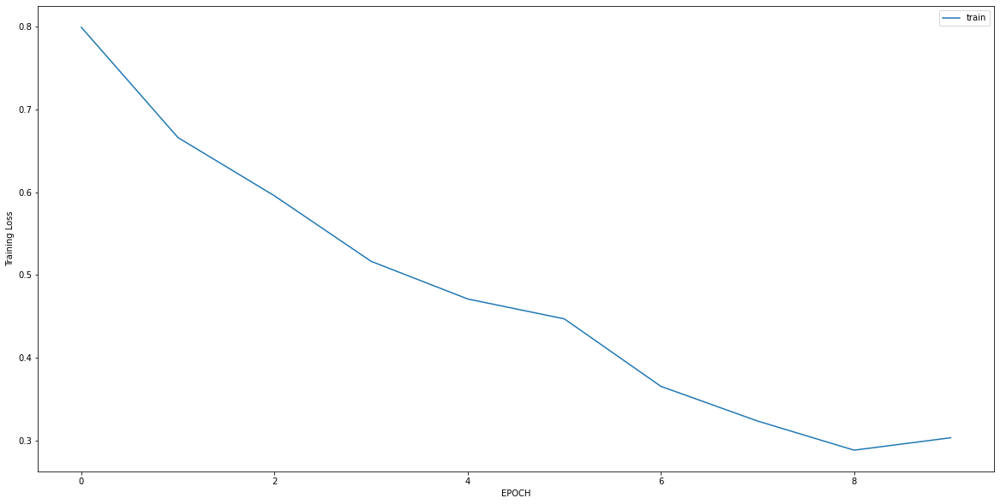

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4484 - accuracy: 0.8704
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3043 - accuracy: 0.8988
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2655 - accuracy: 0.9069
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2307 - accuracy: 0.9352
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2022 - accuracy: 0.9676
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1830 - accuracy: 0.9555
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1601 - accuracy: 0.9717
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1390 - accuracy: 0.9717
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1161 - accuracy: 0.9879
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0875 - accuracy: 0.9919


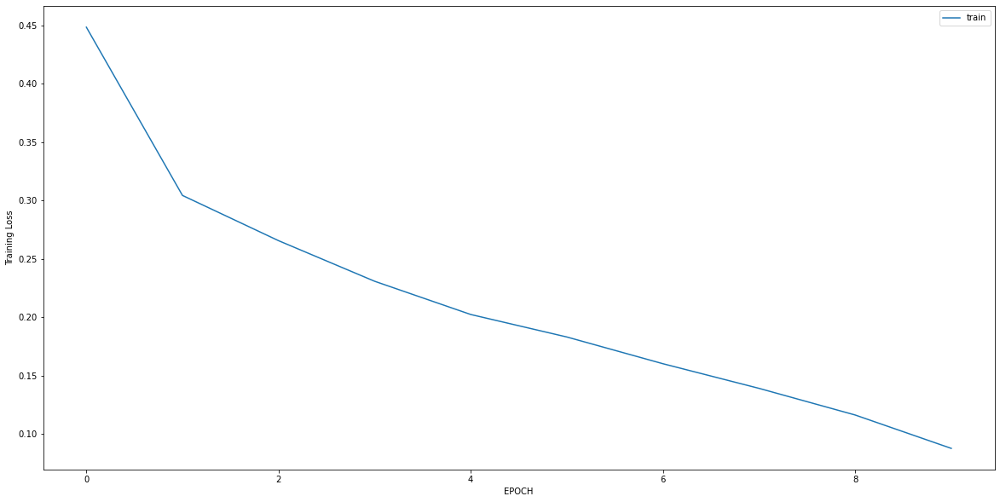

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.7257 - accuracy: 0.6994
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3613 - accuracy: 0.8734
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2907 - accuracy: 0.8924
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.2286 - accuracy: 0.9241
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2246 - accuracy: 0.9367
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1952 - accuracy: 0.9494
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1737 - accuracy: 0.9557
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1737 - accuracy: 0.9589
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1966 - accuracy: 0.9462
Epoch 10/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1541 - accuracy: 0.9620


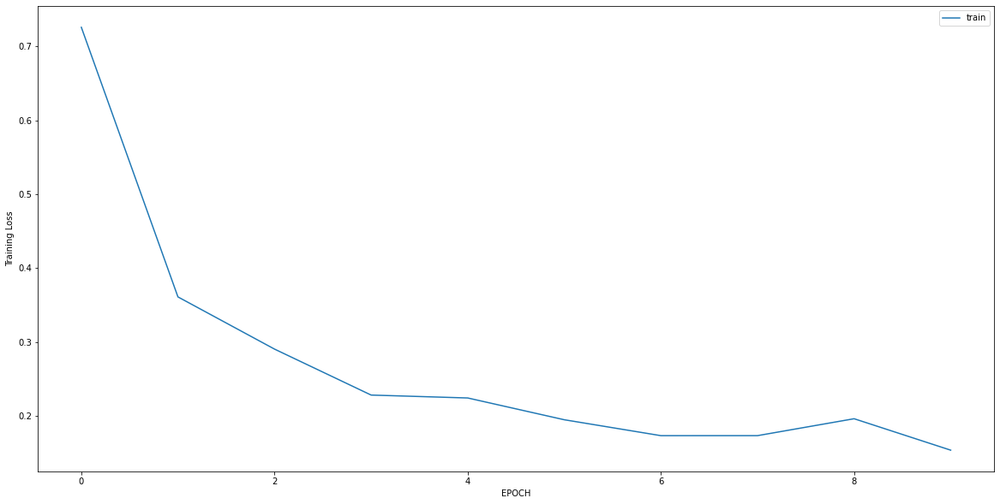

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.0549 - accuracy: 0.4881
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0175 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0177 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0167 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0121 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0089 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0086 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0074 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0081 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0082 - accuracy: 1.0000


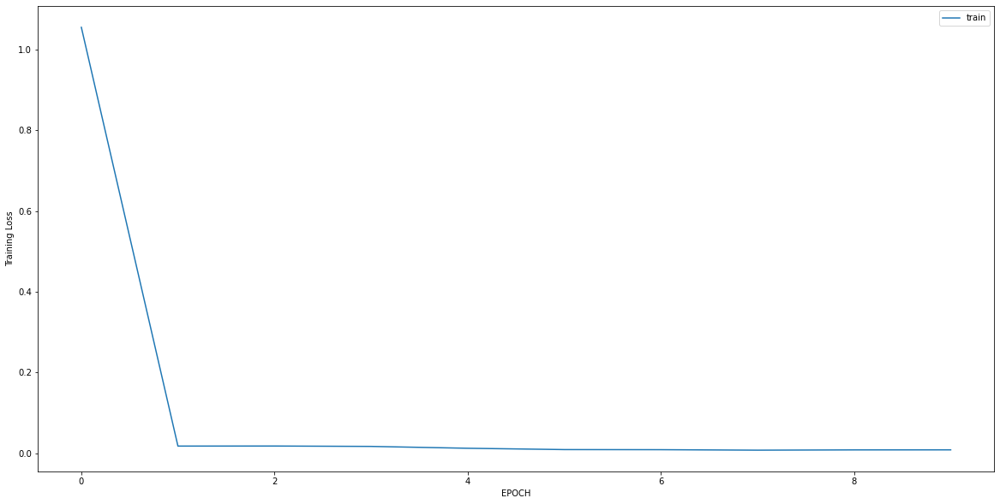

Epoch 1/10
9/9 [==============================] - 0s 6ms/step - loss: 0.4086 - accuracy: 0.8397
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3490 - accuracy: 0.8641
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3231 - accuracy: 0.8815
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2991 - accuracy: 0.9059
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2916 - accuracy: 0.9094
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2642 - accuracy: 0.9164
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2318 - accuracy: 0.9303
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2030 - accuracy: 0.9477
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2523 - accuracy: 0.9268
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2079 - accuracy: 0.9408


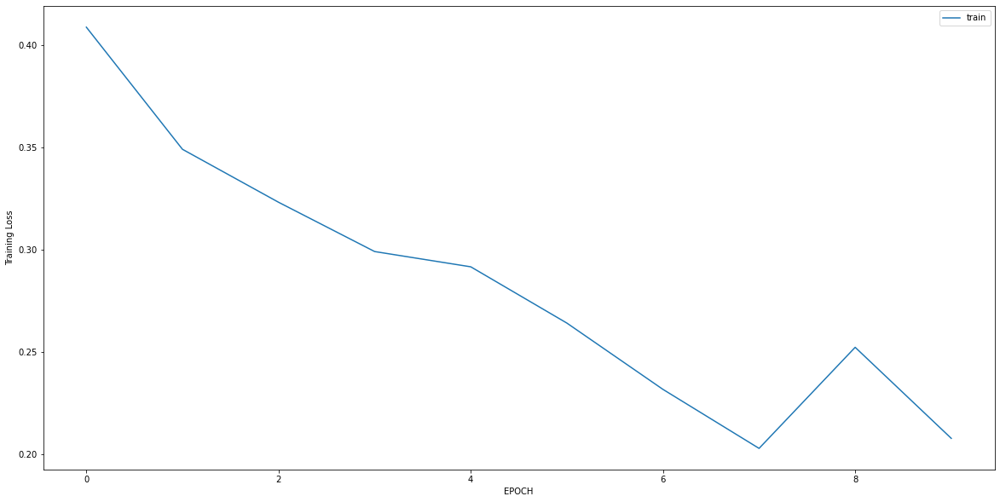

Epoch 1/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0245 - accuracy: 1.0000
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 3/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0122 - accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0106 - accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0111 - accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0097 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0078 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0066 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0077 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0073 - accuracy: 1.0000


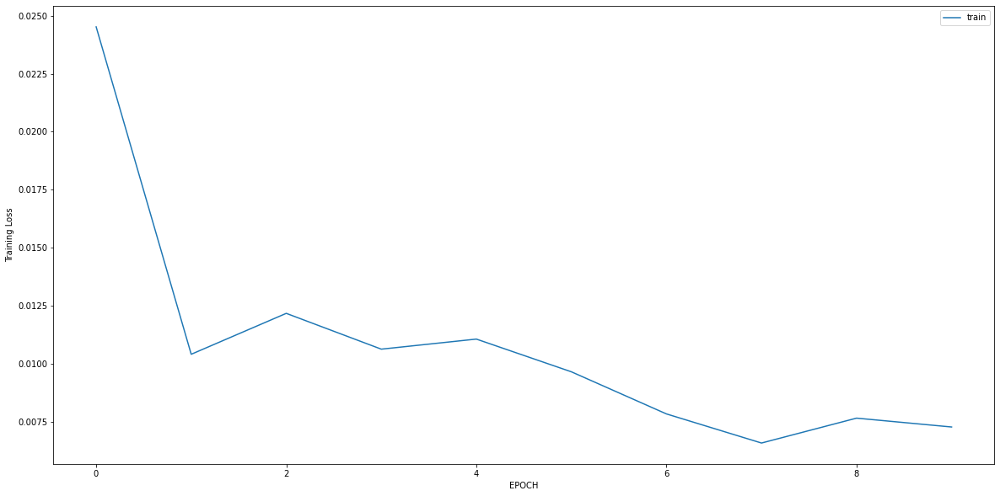

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.1119 - accuracy: 0.7787
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5968 - accuracy: 0.8103
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3957 - accuracy: 0.8458
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2930 - accuracy: 0.8656
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2711 - accuracy: 0.8814
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2589 - accuracy: 0.9130
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2639 - accuracy: 0.9091
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2853 - accuracy: 0.8854
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2430 - accuracy: 0.9051
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2558 - accuracy: 0.9091


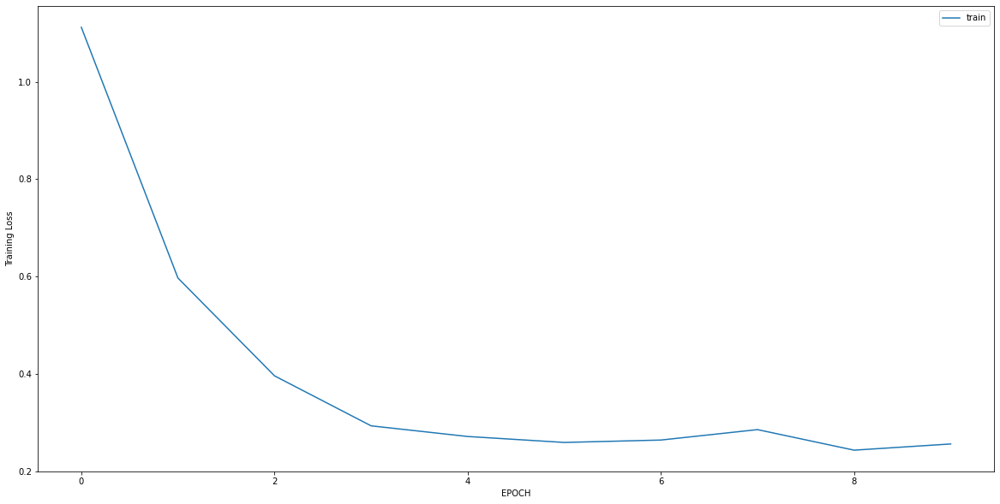

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.2743 - accuracy: 0.9135
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1305 - accuracy: 0.9568
Epoch 3/10
11/11 [==============================] - 0s 6ms/step - loss: 0.0841 - accuracy: 0.9769
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0625 - accuracy: 0.9942
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0647 - accuracy: 0.9827
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0598 - accuracy: 0.9971
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0578 - accuracy: 0.9914
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0531 - accuracy: 0.9971
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0471 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0463 - accuracy: 0.9942


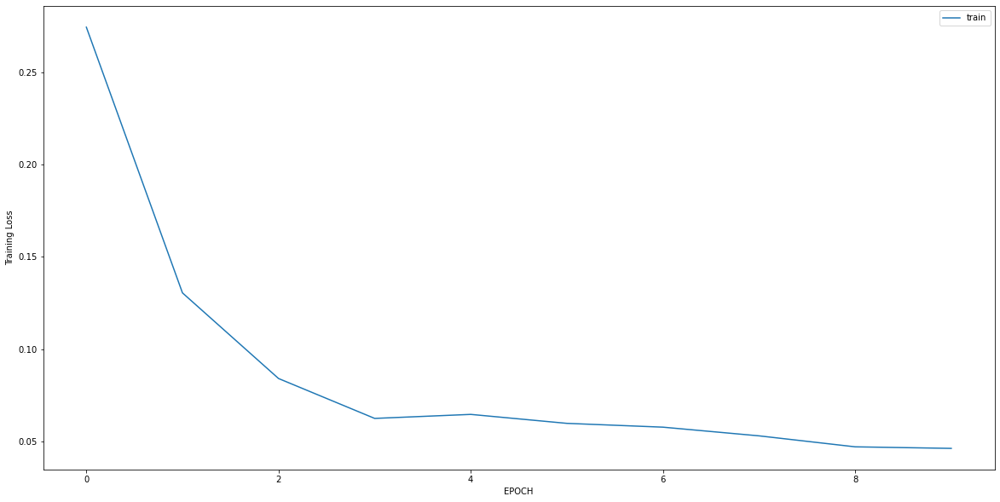

Epoch 1/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0443 - accuracy: 0.9966
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0271 - accuracy: 1.0000
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 0s 6ms/step - loss: 0.0188 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0168 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0140 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0155 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0138 - accuracy: 1.0000


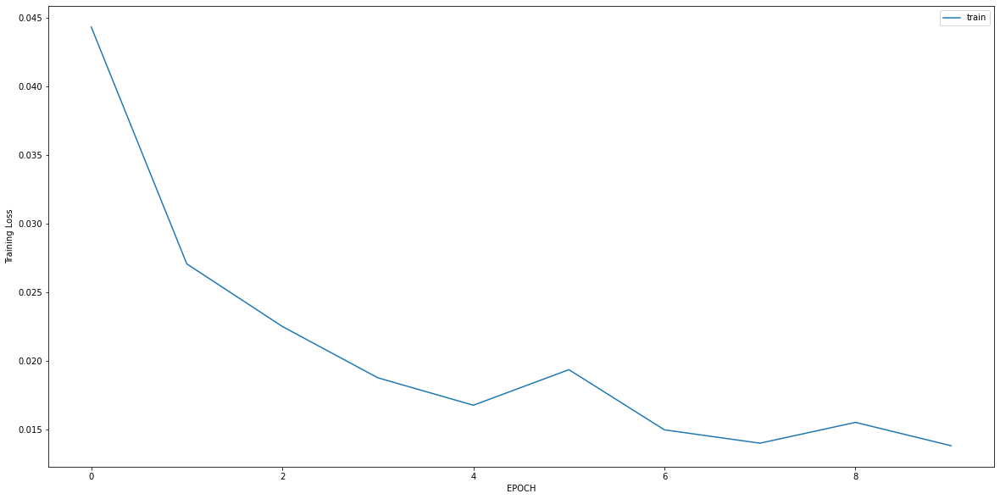

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.2119 - accuracy: 0.9259
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1448 - accuracy: 0.9495
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 0.9529
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1528 - accuracy: 0.9495
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1428 - accuracy: 0.9428
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1498 - accuracy: 0.9562
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1414 - accuracy: 0.9529
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1427 - accuracy: 0.9630
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1847 - accuracy: 0.9562
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1679 - accuracy: 0.9461


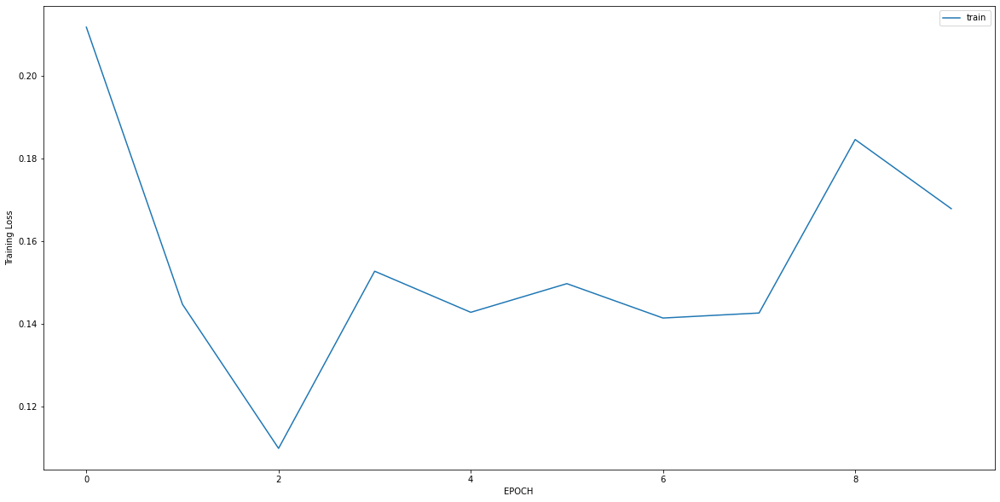

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.2434 - accuracy: 0.5363
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2180 - accuracy: 0.9274
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1877 - accuracy: 0.9435
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1401 - accuracy: 0.9556
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1188 - accuracy: 0.9718
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0889 - accuracy: 0.9879
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0797 - accuracy: 0.9839
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0772 - accuracy: 0.9839
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0688 - accuracy: 0.9798
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0796 - accuracy: 0.9879


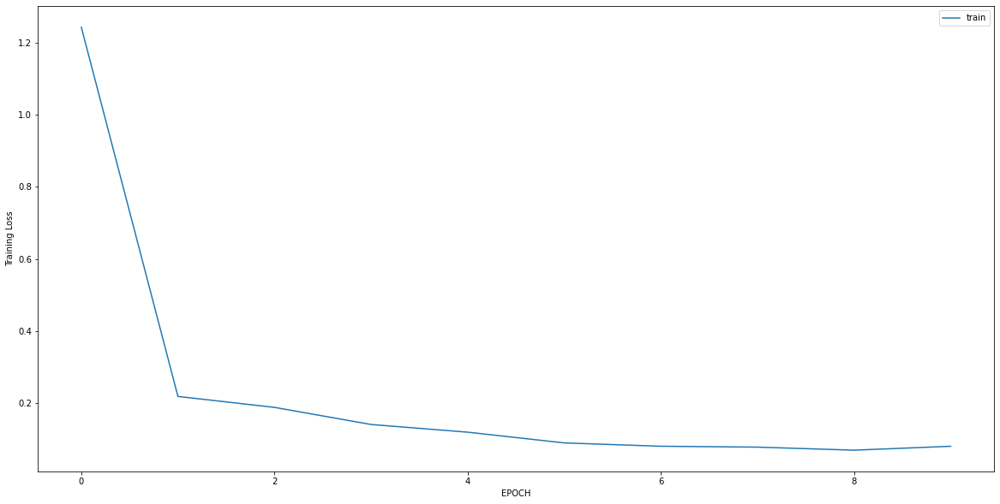

Epoch 1/10
14/14 [==============================] - 0s 5ms/step - loss: 0.3119 - accuracy: 0.8894
Epoch 2/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1791 - accuracy: 0.9255
Epoch 3/10
14/14 [==============================] - 0s 4ms/step - loss: 0.1136 - accuracy: 0.9639
Epoch 4/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0721 - accuracy: 0.9797
Epoch 5/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0575 - accuracy: 0.9910
Epoch 6/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0518 - accuracy: 0.9932
Epoch 7/10
14/14 [==============================] - 0s 5ms/step - loss: 0.0481 - accuracy: 0.9955
Epoch 8/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.9932
Epoch 9/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0452 - accuracy: 0.9932
Epoch 10/10
14/14 [==============================] - 0s 4ms/step - loss: 0.0615 - accuracy: 0.9819


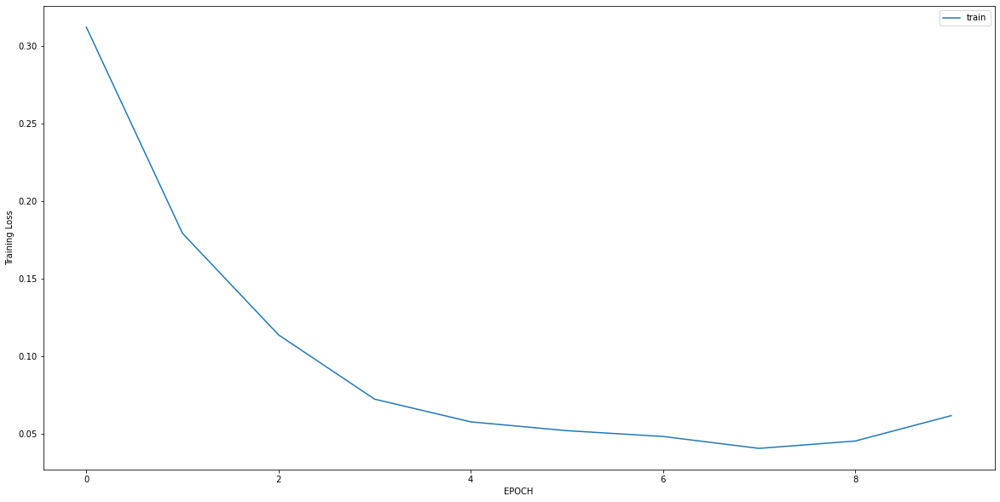

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0727 - accuracy: 0.9828
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0512 - accuracy: 0.9862
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0763 - accuracy: 0.9759
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0997 - accuracy: 0.9759
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1175 - accuracy: 0.9621
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1068 - accuracy: 0.9655
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0901 - accuracy: 0.9690
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1135 - accuracy: 0.9552
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0869 - accuracy: 0.9690
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.1258 - accuracy: 0.9414


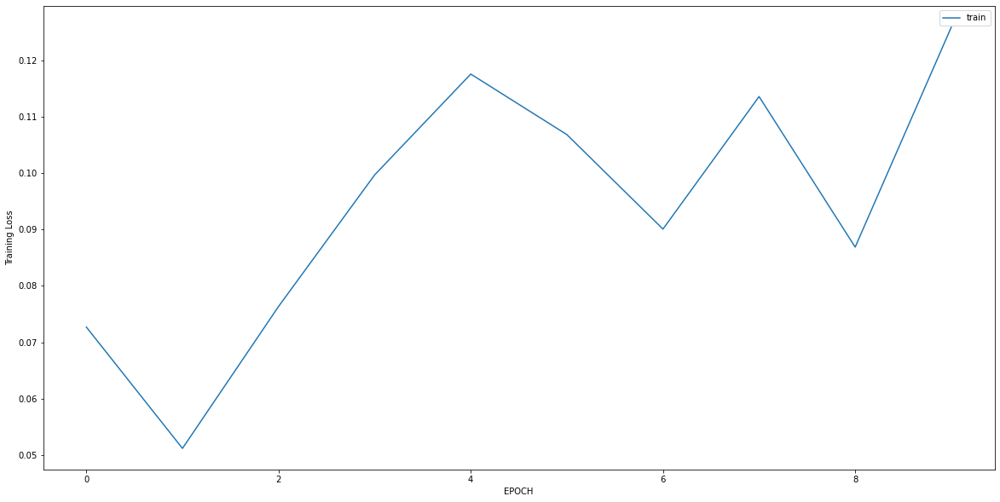

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3156 - accuracy: 0.9325
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1504 - accuracy: 0.9578
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0654 - accuracy: 0.9747
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0494 - accuracy: 0.9873
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0427 - accuracy: 0.9916
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.9958
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.9958
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0314 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 1.0000


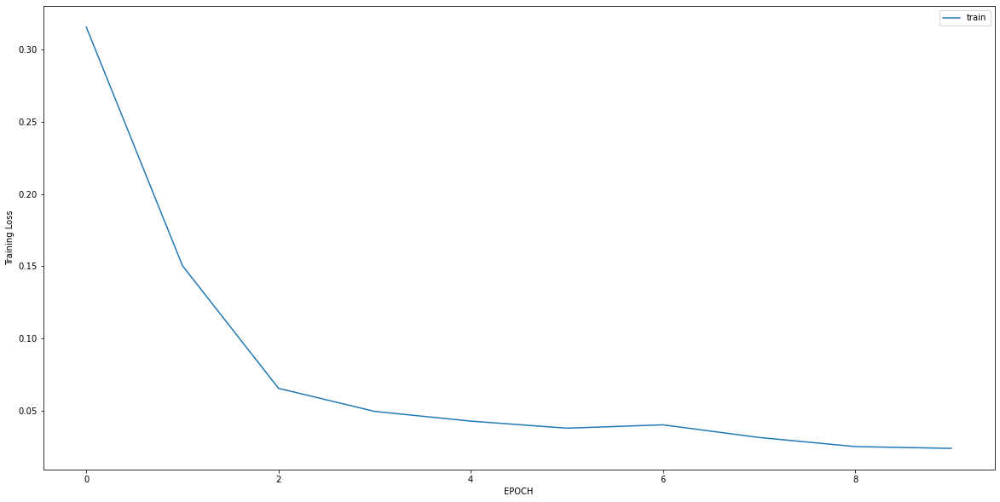

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 2.3913 - accuracy: 0.4667
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.5321 - accuracy: 0.4627
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.7192 - accuracy: 0.5333
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5027 - accuracy: 0.7098
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4110 - accuracy: 0.8392
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3861 - accuracy: 0.8627
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3610 - accuracy: 0.8627
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3341 - accuracy: 0.8549
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.2839 - accuracy: 0.8784
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.2802 - accuracy: 0.8980


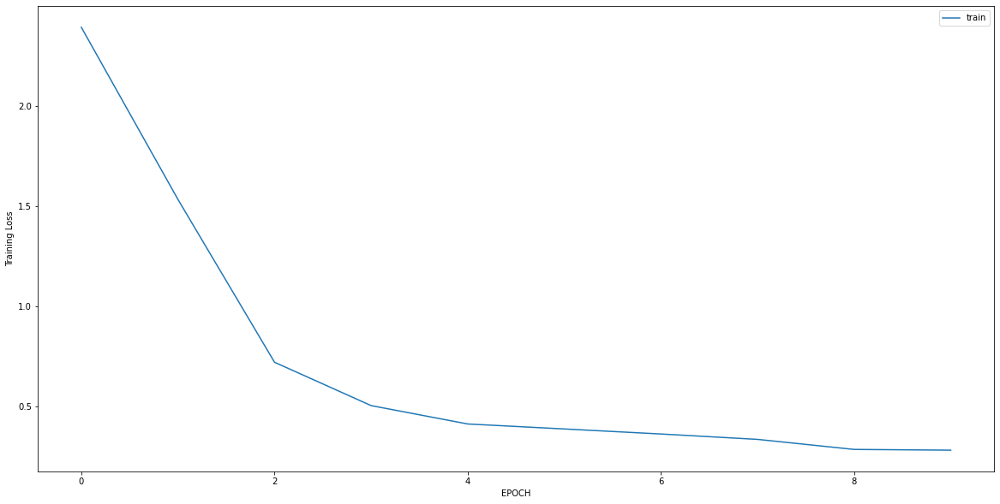

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.8712 - accuracy: 0.6287
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2803 - accuracy: 0.9123
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2221 - accuracy: 0.9064
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1649 - accuracy: 0.9532
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1554 - accuracy: 0.9503
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1566 - accuracy: 0.9298
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1224 - accuracy: 0.9561
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1263 - accuracy: 0.9474
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1112 - accuracy: 0.9620
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1168 - accuracy: 0.9678


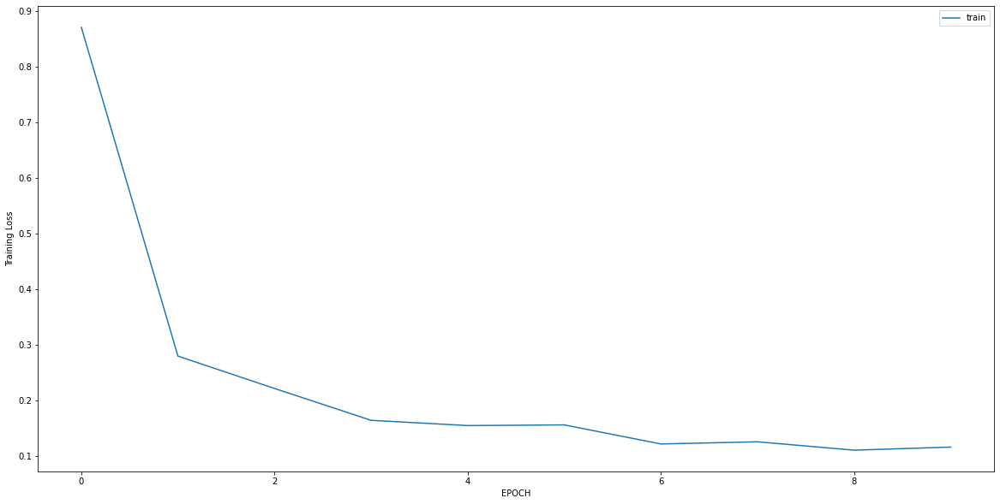

Epoch 1/10
5/5 [==============================] - 0s 7ms/step - loss: 1.0302 - accuracy: 0.4565
Epoch 2/10
5/5 [==============================] - 0s 6ms/step - loss: 0.5404 - accuracy: 0.6884
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.3826 - accuracy: 0.8188
Epoch 4/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4030 - accuracy: 0.8261
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3591 - accuracy: 0.8261
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.3086 - accuracy: 0.9275
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.2439 - accuracy: 0.9275
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1854 - accuracy: 0.9638
Epoch 9/10
5/5 [==============================] - 0s 5ms/step - loss: 0.1721 - accuracy: 0.9493
Epoch 10/10
5/5 [==============================] - 0s 4ms/step - loss: 0.1509 - accuracy: 0.9565


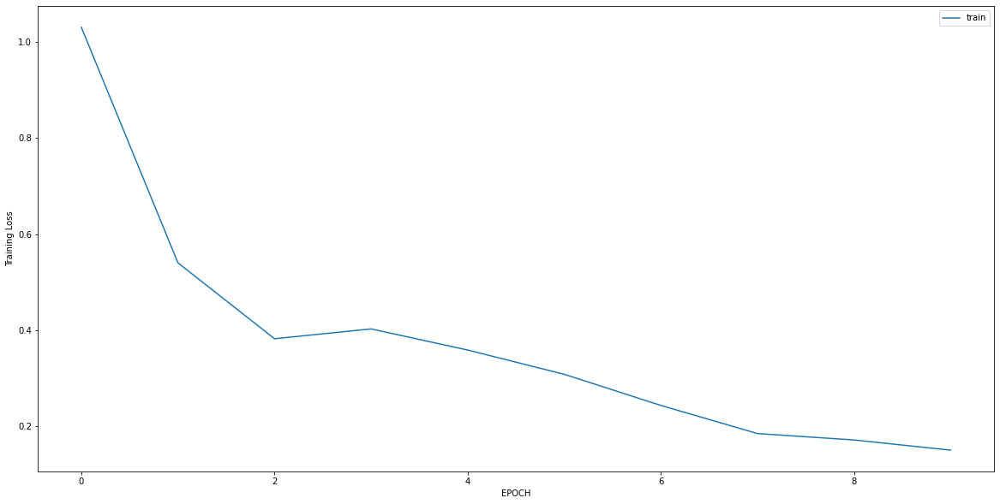

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4297 - accuracy: 0.8689
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1833 - accuracy: 0.9344
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1222 - accuracy: 0.9672
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1143 - accuracy: 0.9590
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1063 - accuracy: 0.9631
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1079 - accuracy: 0.9590
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1013 - accuracy: 0.9631
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0888 - accuracy: 0.9672
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0865 - accuracy: 0.9754
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0823 - accuracy: 0.9672


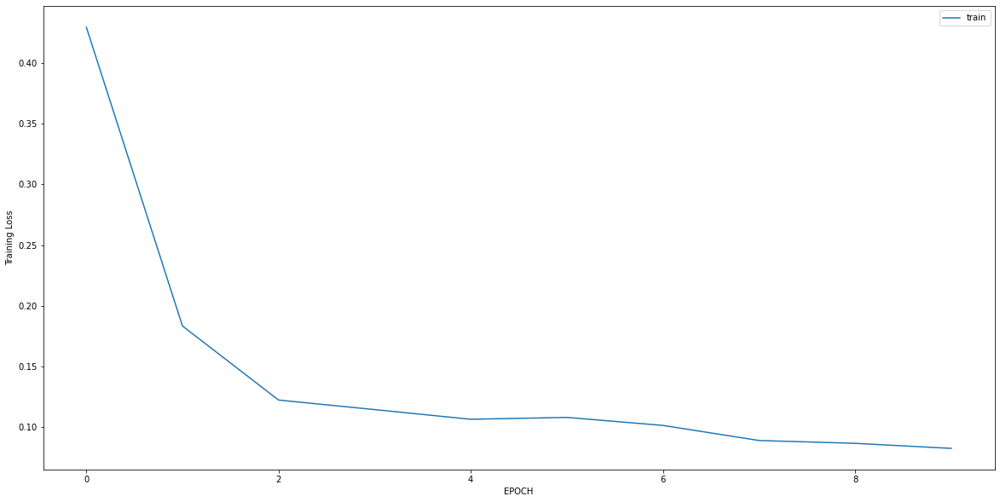

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 0.9310 - accuracy: 0.7613
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 0.4289 - accuracy: 0.8580
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2285 - accuracy: 0.9124
Epoch 4/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1269 - accuracy: 0.9607
Epoch 5/10
11/11 [==============================] - 0s 6ms/step - loss: 0.1283 - accuracy: 0.9607
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1153 - accuracy: 0.9637
Epoch 7/10
11/11 [==============================] - 0s 5ms/step - loss: 0.1072 - accuracy: 0.9789
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1035 - accuracy: 0.9698
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1039 - accuracy: 0.9728
Epoch 10/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1031 - accuracy: 0.9668


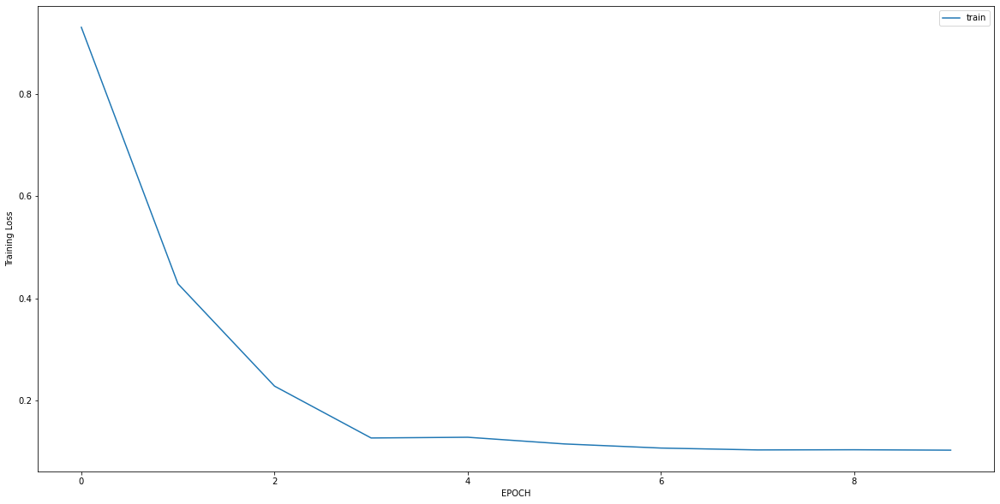

Epoch 1/10
9/9 [==============================] - 0s 7ms/step - loss: 1.5399 - accuracy: 0.4889
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4699 - accuracy: 0.7593
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2612 - accuracy: 0.9111
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3264 - accuracy: 0.8815
Epoch 5/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2664 - accuracy: 0.8778
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2206 - accuracy: 0.9148
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2411 - accuracy: 0.8963
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2007 - accuracy: 0.9296
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2161 - accuracy: 0.9259
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.1945 - accuracy: 0.9333


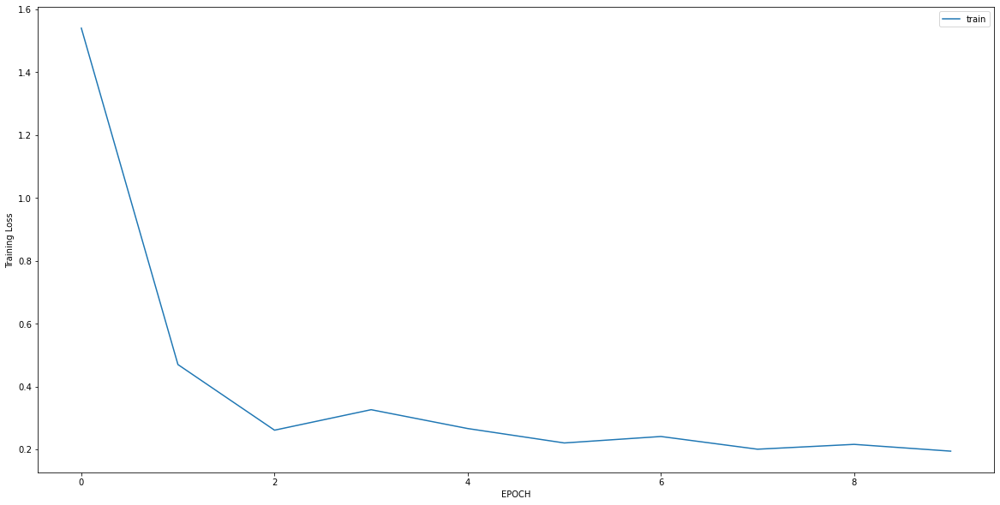

Epoch 1/10
10/10 [==============================] - 0s 5ms/step - loss: 1.7690 - accuracy: 0.0575
Epoch 2/10
10/10 [==============================] - 0s 4ms/step - loss: 0.8253 - accuracy: 0.3930
Epoch 3/10
10/10 [==============================] - 0s 5ms/step - loss: 0.3903 - accuracy: 0.9201
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1984 - accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 0s 5ms/step - loss: 0.1323 - accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0944 - accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0731 - accuracy: 1.0000
Epoch 8/10
10/10 [==============================] - 0s 5ms/step - loss: 0.0635 - accuracy: 1.0000
Epoch 9/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0569 - accuracy: 1.0000
Epoch 10/10
10/10 [==============================] - 0s 4ms/step - loss: 0.0489 - accuracy: 1.0000


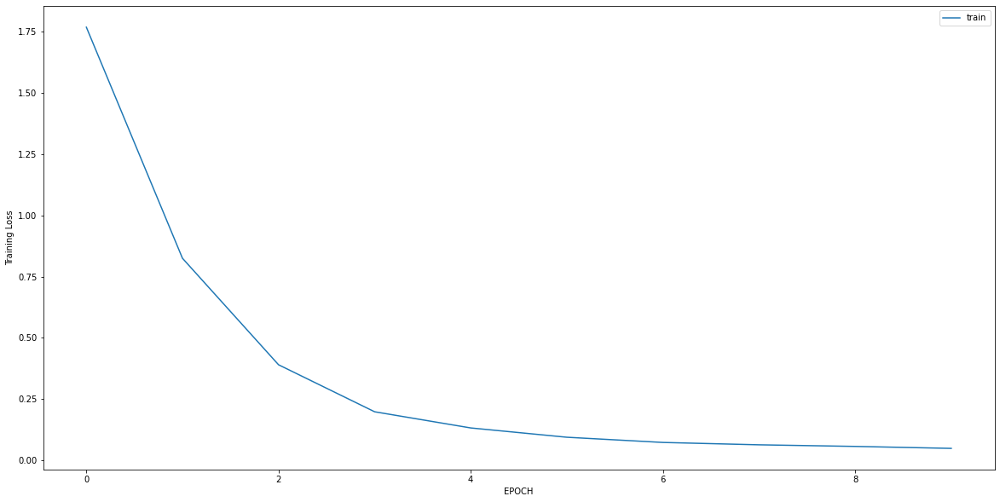

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.0463 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0289 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0305 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0286 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0262 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0248 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0244 - accuracy: 1.0000


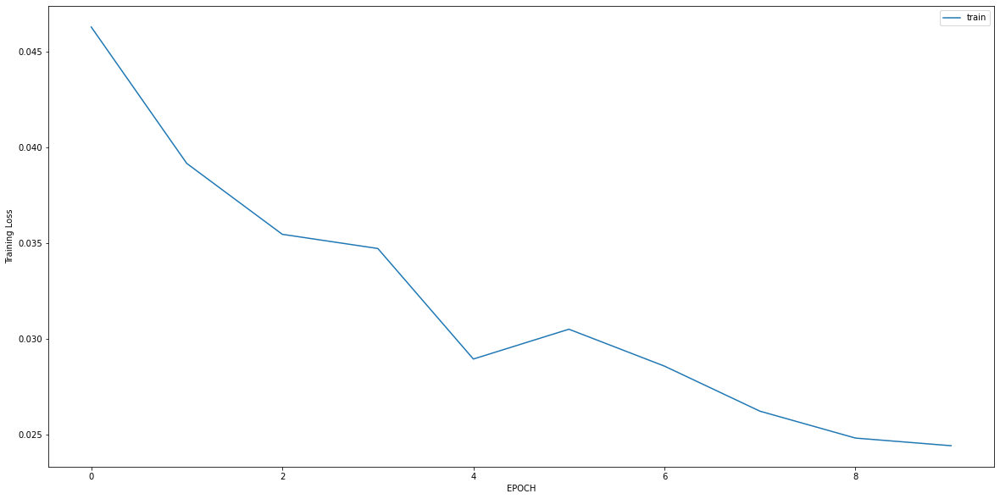

Epoch 1/10
4/4 [==============================] - 0s 6ms/step - loss: 3.0716 - accuracy: 0.1633
Epoch 2/10
4/4 [==============================] - 0s 6ms/step - loss: 2.8825 - accuracy: 0.1633
Epoch 3/10
4/4 [==============================] - 0s 6ms/step - loss: 2.5336 - accuracy: 0.1633
Epoch 4/10
4/4 [==============================] - 0s 6ms/step - loss: 2.1868 - accuracy: 0.1633
Epoch 5/10
4/4 [==============================] - 0s 6ms/step - loss: 1.8052 - accuracy: 0.1633
Epoch 6/10
4/4 [==============================] - 0s 5ms/step - loss: 1.4487 - accuracy: 0.1633
Epoch 7/10
4/4 [==============================] - 0s 6ms/step - loss: 1.2075 - accuracy: 0.1735
Epoch 8/10
4/4 [==============================] - 0s 5ms/step - loss: 1.0470 - accuracy: 0.2041
Epoch 9/10
4/4 [==============================] - 0s 5ms/step - loss: 0.9062 - accuracy: 0.2857
Epoch 10/10
4/4 [==============================] - 0s 5ms/step - loss: 0.7695 - accuracy: 0.4694


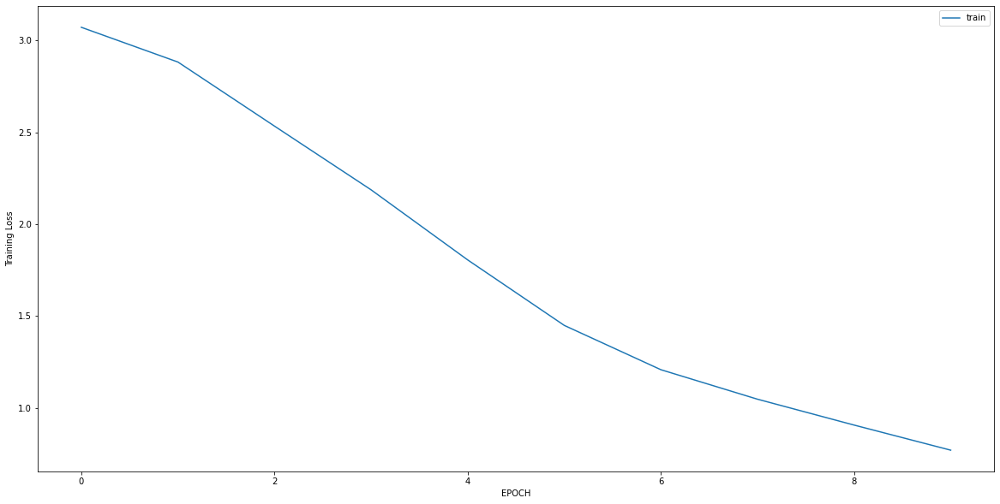

Epoch 1/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6307 - accuracy: 0.6111
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6248 - accuracy: 0.6250
Epoch 3/10
5/5 [==============================] - 0s 6ms/step - loss: 0.6195 - accuracy: 0.6181
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6106 - accuracy: 0.6458
Epoch 5/10
5/5 [==============================] - 0s 4ms/step - loss: 0.6264 - accuracy: 0.6181
Epoch 6/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6111 - accuracy: 0.6667
Epoch 7/10
5/5 [==============================] - 0s 5ms/step - loss: 0.6129 - accuracy: 0.6806
Epoch 8/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5813 - accuracy: 0.6736
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 0.5367 - accuracy: 0.7292
Epoch 10/10
5/5 [==============================] - 0s 5ms/step - loss: 0.5707 - accuracy: 0.6806


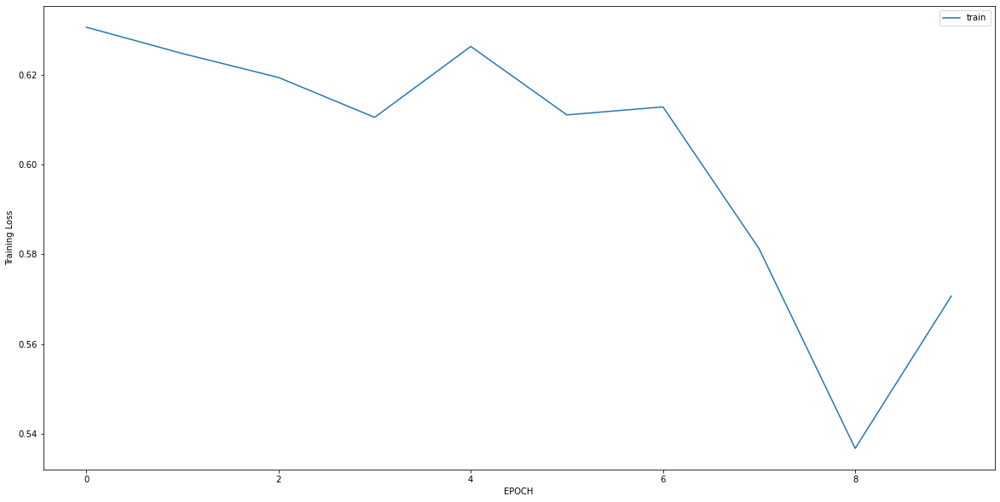

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.6528 - accuracy: 0.5451
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.5930 - accuracy: 0.6173
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.5256 - accuracy: 0.6751
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4698 - accuracy: 0.7581
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4181 - accuracy: 0.8700
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4070 - accuracy: 0.8628
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3733 - accuracy: 0.8989
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3659 - accuracy: 0.8917
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3403 - accuracy: 0.9097
Epoch 10/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3076 - accuracy: 0.9242


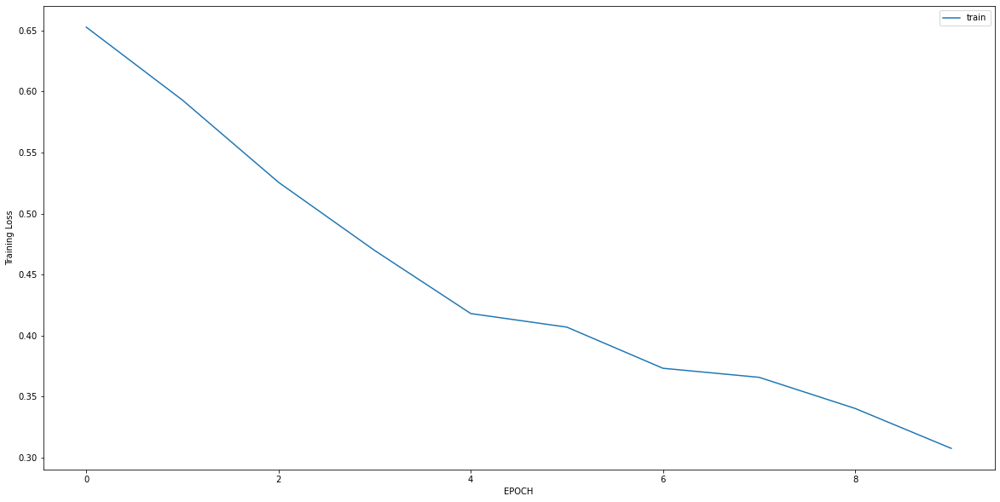

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3535 - accuracy: 0.8671
Epoch 2/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3448 - accuracy: 0.8846
Epoch 3/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3373 - accuracy: 0.8951
Epoch 4/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2999 - accuracy: 0.9126
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3035 - accuracy: 0.9021
Epoch 6/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3247 - accuracy: 0.9021
Epoch 7/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3028 - accuracy: 0.9091
Epoch 8/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2959 - accuracy: 0.9196
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.2913 - accuracy: 0.9231
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.2993 - accuracy: 0.9196


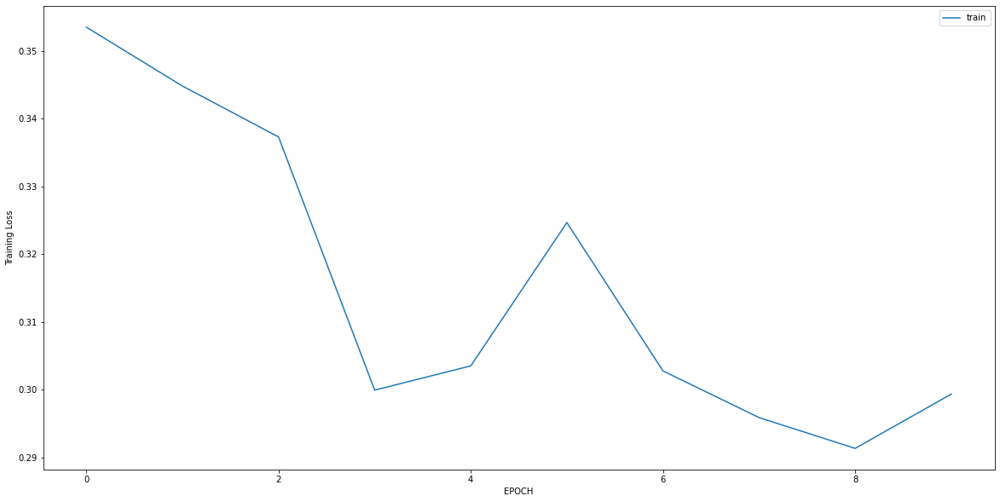

Epoch 1/10
11/11 [==============================] - 0s 5ms/step - loss: 3.1246 - accuracy: 0.0125
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 1.4967 - accuracy: 0.1589
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 0.5917 - accuracy: 0.6854
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 0.2690 - accuracy: 0.9751
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 0.1412 - accuracy: 0.9969
Epoch 6/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0884 - accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0554 - accuracy: 1.0000
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 1.0000
Epoch 9/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 10/10
11/11 [==============================] - 0s 5ms/step - loss: 0.0325 - accuracy: 1.0000


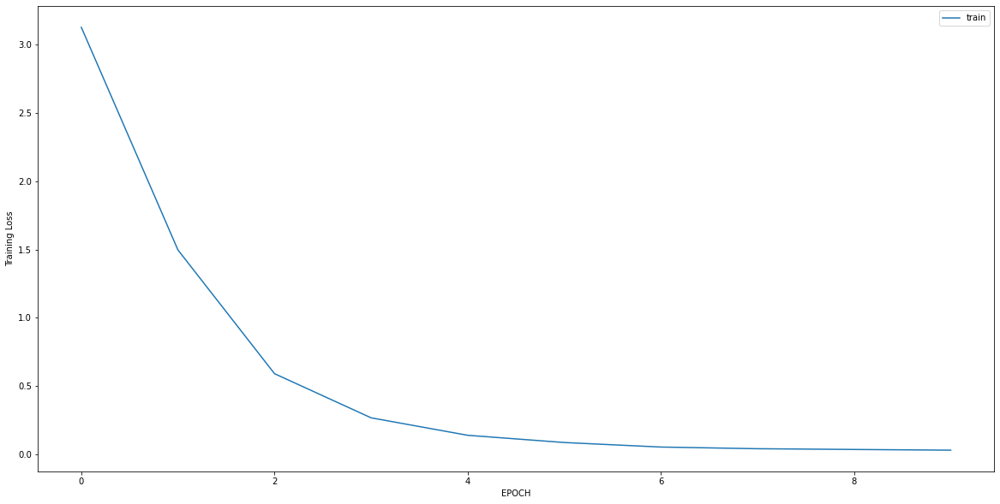

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 2.3431 - accuracy: 0.1772
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 1.8403 - accuracy: 0.1857
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 1.3006 - accuracy: 0.2363
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.9650 - accuracy: 0.3966
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6578 - accuracy: 0.6287
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4963 - accuracy: 0.7384
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4620 - accuracy: 0.7679
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.4160 - accuracy: 0.7848
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3685 - accuracy: 0.8354
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3517 - accuracy: 0.8481


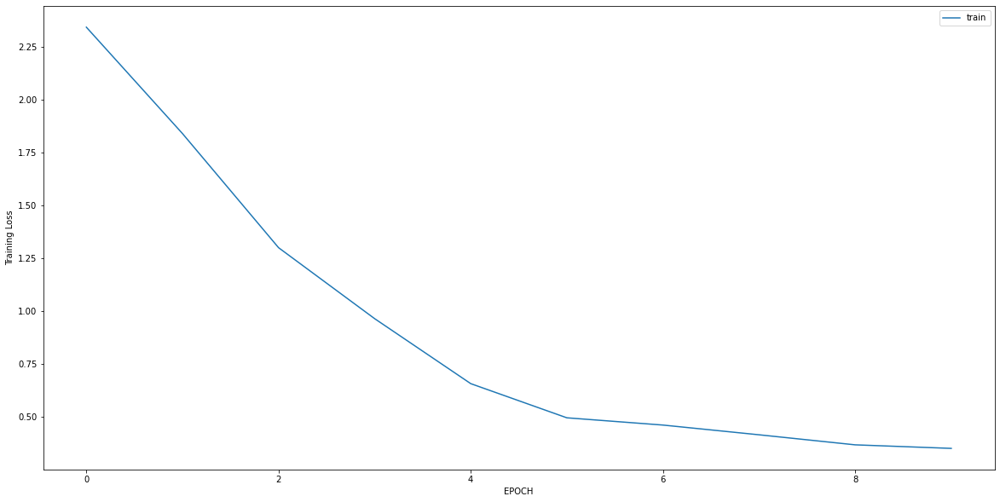

Epoch 1/10
9/9 [==============================] - 0s 5ms/step - loss: 1.2389 - accuracy: 0.4440
Epoch 2/10
9/9 [==============================] - 0s 4ms/step - loss: 0.7868 - accuracy: 0.5410
Epoch 3/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3655 - accuracy: 0.8694
Epoch 4/10
9/9 [==============================] - 0s 4ms/step - loss: 0.4261 - accuracy: 0.8284
Epoch 5/10
9/9 [==============================] - 0s 5ms/step - loss: 0.4243 - accuracy: 0.8097
Epoch 6/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3603 - accuracy: 0.8619
Epoch 7/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3640 - accuracy: 0.8657
Epoch 8/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3303 - accuracy: 0.9067
Epoch 9/10
9/9 [==============================] - 0s 5ms/step - loss: 0.3150 - accuracy: 0.9104
Epoch 10/10
9/9 [==============================] - 0s 4ms/step - loss: 0.3023 - accuracy: 0.9254


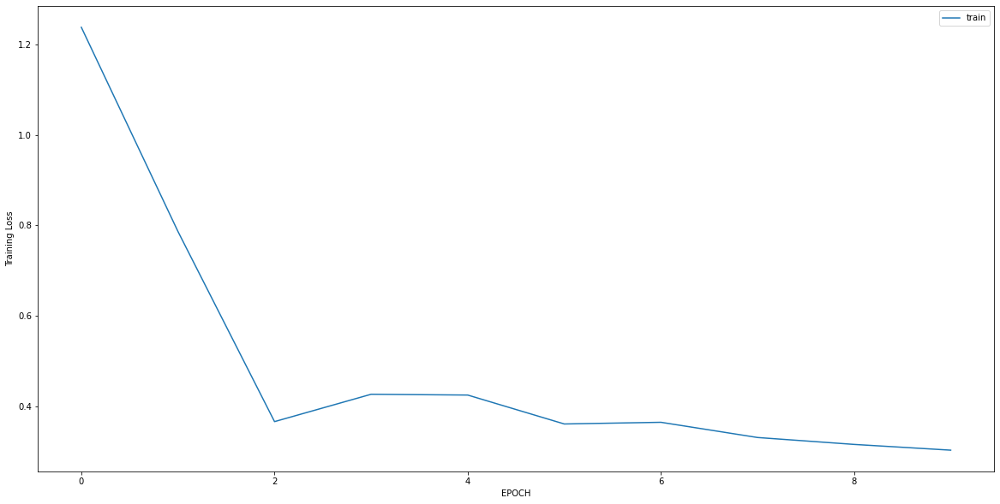

Epoch 1/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1544 - accuracy: 1.0000
Epoch 2/10
8/8 [==============================] - 0s 6ms/step - loss: 0.1442 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1365 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1204 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 0.1149 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1064 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0965 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0901 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0803 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0772 - accuracy: 1.0000


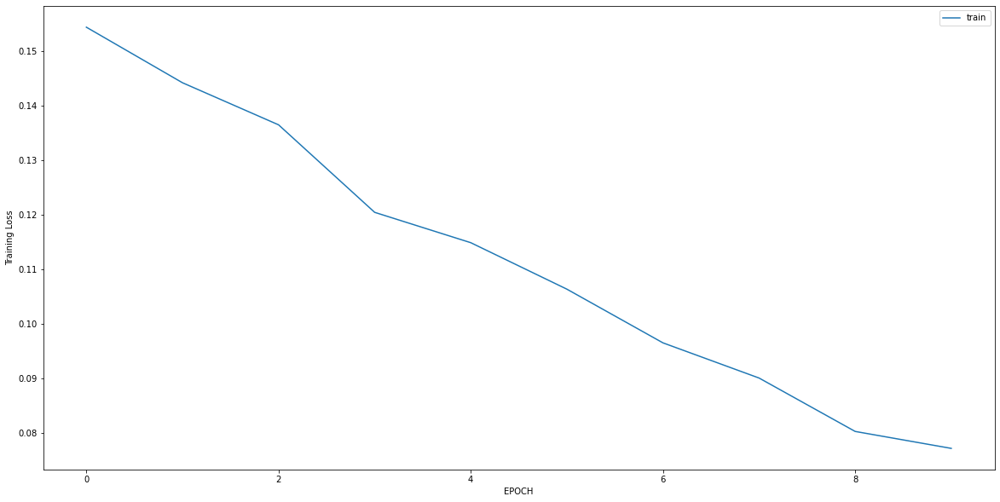

Epoch 1/10
18/18 [==============================] - 0s 5ms/step - loss: 0.6506 - accuracy: 0.6327
Epoch 2/10
18/18 [==============================] - 0s 4ms/step - loss: 0.1635 - accuracy: 0.9965
Epoch 3/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0498 - accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0272 - accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0221 - accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0184 - accuracy: 1.0000
Epoch 7/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0181 - accuracy: 1.0000
Epoch 8/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0163 - accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 4ms/step - loss: 0.0152 - accuracy: 1.0000
Epoch 10/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0144 - accuracy: 1.0000


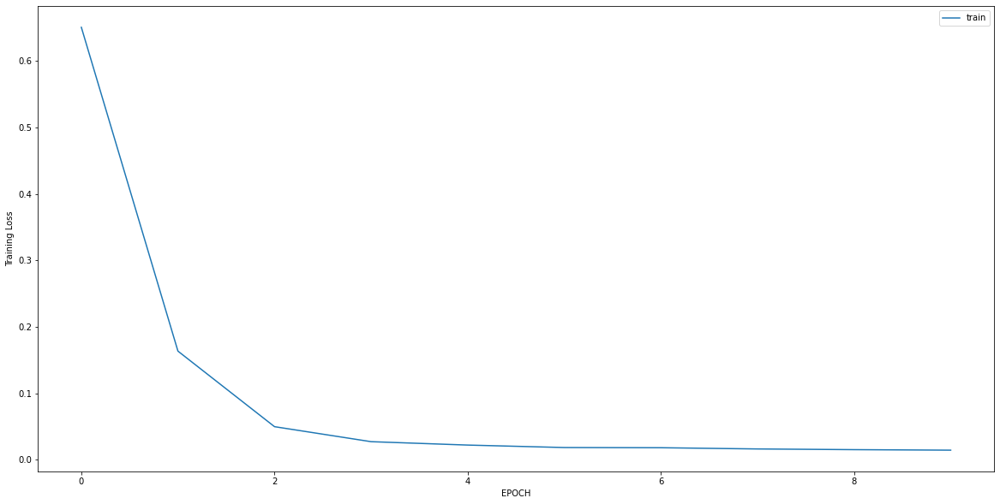

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 1.9570 - accuracy: 0.5339
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 1.6304 - accuracy: 0.5339
Epoch 3/10
8/8 [==============================] - 0s 4ms/step - loss: 1.1137 - accuracy: 0.5339
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.8444 - accuracy: 0.5381
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.6877 - accuracy: 0.5805
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.6186 - accuracy: 0.6780
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.5432 - accuracy: 0.7076
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 0.4217 - accuracy: 0.8305
Epoch 9/10
8/8 [==============================] - 0s 5ms/step - loss: 0.3851 - accuracy: 0.8559
Epoch 10/10
8/8 [==============================] - 0s 4ms/step - loss: 0.3511 - accuracy: 0.8559


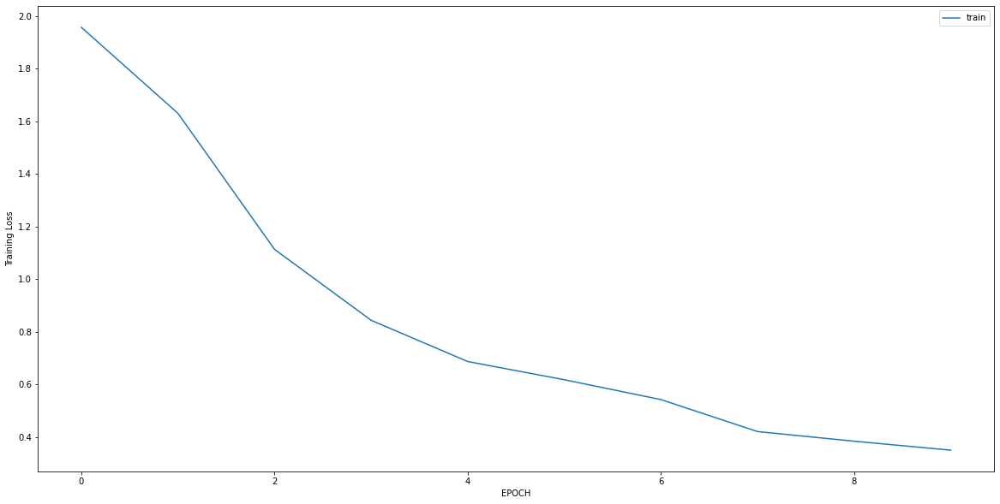

Epoch 1/10
8/8 [==============================] - 0s 5ms/step - loss: 0.1835 - accuracy: 0.9837
Epoch 2/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0626 - accuracy: 1.0000
Epoch 3/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0343 - accuracy: 1.0000
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0197 - accuracy: 1.0000
Epoch 5/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0176 - accuracy: 1.0000
Epoch 6/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0148 - accuracy: 1.0000
Epoch 7/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0098 - accuracy: 1.0000
Epoch 8/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0104 - accuracy: 1.0000
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 0.0101 - accuracy: 1.0000
Epoch 10/10
8/8 [==============================] - 0s 5ms/step - loss: 0.0103 - accuracy: 1.0000


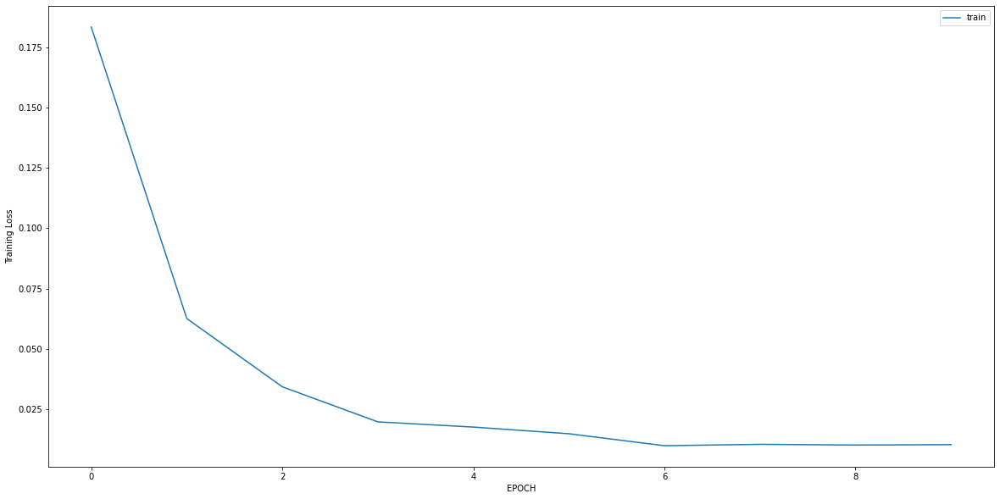

In [23]:
for j in range(10):
  a=np.random.permutation(list(range(60)))
  for i in a:
    s=data[i]
    history = model.fit(s[0], s[1], batch_size=32, epochs=10)
    plt.plot(history.history['loss'], label='train')
    #plt.plot(history.history['val_loss'], label='test')
    plt.xlabel('EPOCH')
    plt.ylabel('Training Loss')
    plt.legend()
    plt.show()

In [28]:
# !mkdir -p saved_model_latest
# model.save('saved_model_latest/LSTM')

A subdirectory or file -p already exists.
Error occurred while processing: -p.


INFO:tensorflow:Assets written to: saved_model_latest/LSTM\assets


INFO:tensorflow:Assets written to: saved_model_latest/LSTM\assets


**Test**

In [17]:
import cv2

In [18]:
#!pip install mediapipe
import mediapipe as mp

In [19]:
mpPose = mp.solutions.pose
pose = mpPose.Pose()
mpDraw = mp.solutions.drawing_utils # For drawing keypoints
points = mpPose.PoseLandmark # Landmarks

In [20]:
def getarray(landmark): 
  r=[]
  for i in landmark:
    r.append([i.x,i.y])
  r=np.array(r)
  r=r.flatten()
  return r

In [5]:
def test(path, name):
  cap = cv2.VideoCapture(path)
  width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) + 0.5)
  height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) + 0.5)
  size = (width, height)
  fourcc = cv2.VideoWriter_fourcc(*'XVID')
  out = cv2.VideoWriter(f'{name}.avi', fourcc, 30.0, size)
  total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
  print(total_frames)
  arr=[]
  for fno in range(0, total_frames,1):
    print(f"frame number is{fno}")
    #print(fno)
    cap.set(cv2.CAP_PROP_POS_FRAMES, fno)
    _, image = cap.read()
    img = image.copy()
    imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = pose.process(imgRGB)
    landmark=results.pose_landmarks.landmark
    r=getarray(landmark)
    #print(r)
    if(fno<14):
      arr.append(r)
    elif(fno==14):
      arr.append(r)
      k=np.array(arr).reshape(-1,15,66)
      print(model.predict(k)[0])
    else:
      del arr[0]
      arr.append(r)
      k=np.array(arr).reshape(-1,15,66)
      p=model.predict(k)[0][0]
#       if((fno+1)%30==0):
      p=round(p,2)
      x = "Crossing" if p>0.5 else "Not Crossing"
      color = (0, 0, 255) if p > 0.5 else (0, 255, 0)
      indent = (400,100) if p < 0.5 else (450,100)
      p=str(p)
      print(p)
      cv2.putText(image, p, (500,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), thickness = 3)
      cv2.putText(image, x, indent, cv2.FONT_HERSHEY_TRIPLEX, 1, color, thickness = 3)
      cv2.imshow('test',image)
      if cv2.waitKey(10) & 0xFF==ord('q'):
          break
      out.write(image)

  cap.release()
  cv2.destroyAllWindows()

In [4]:
test("test/preetam saha not crossing the road.mp4", 'preetam')

NameError: name 'cv2' is not defined

In [26]:
test("test/o1 crossing the road.mp4", 'manash')

320
frame number is0
frame number is1
frame number is2
frame number is3
frame number is4
frame number is5
frame number is6
frame number is7
frame number is8
frame number is9
frame number is10
frame number is11
frame number is12
frame number is13
frame number is14
[0.08899125]
frame number is15
0.09
frame number is16
0.09
frame number is17
0.1
frame number is18
0.1
frame number is19
0.1
frame number is20
0.1
frame number is21
0.1
frame number is22
0.1
frame number is23
0.09
frame number is24
0.09
frame number is25
0.09
frame number is26
0.08
frame number is27
0.08
frame number is28
0.08
frame number is29
0.08
frame number is30
0.08
frame number is31
0.08
frame number is32
0.08
frame number is33
0.08
frame number is34
0.08
frame number is35
0.08
frame number is36
0.08
frame number is37
0.07
frame number is38
0.07
frame number is39
0.07
frame number is40
0.07
frame number is41
0.07
frame number is42
0.07
frame number is43
0.08
frame number is44
0.08
frame number is45
0.08
frame number is4